In [ ]:
!pip install wandb

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.9 MB 14.6 MB/s 
     |████████████████████████████████| 174 kB 70.0 MB/s 
     |████████████████████████████████| 182 kB 72.5 MB/s 
     |████████████████████████████████| 62 kB 1.8 MB/s 
     |████████████████████████████████| 173 kB 69.4 MB/s 
     |████████████████████████████████| 168 kB 75.2 MB/s 
     |████████████████████████████████| 168 kB 79.6 MB/s 
     |████████████████████████████████| 166 kB 80.3 MB/s 
     |████████████████████████████████| 166 kB 78.6 MB/s 
     |████████████████████████████████| 162 kB 77.3 MB/s 
     |████████████████████████████████| 162 kB 81.4 MB/s 
     |████████████████████████████████| 158 kB 63.0 MB/s 
     |████████████████████████████████| 157 kB 64.0 MB/s 
     |████████████████████████████████| 157 kB 58.5 MB/s 
     |████████████████████████████████| 157 kB 58.7 MB/s 
     |███████████████████████████

In [ ]:
!wget http://cs231n.stanford.edu/tiny-imagenet-200.zip

--2022-12-27 15:25:19--  http://cs231n.stanford.edu/tiny-imagenet-200.zip
Resolving cs231n.stanford.edu (cs231n.stanford.edu)... 171.64.68.10
Connecting to cs231n.stanford.edu (cs231n.stanford.edu)|171.64.68.10|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248100043 (237M) [application/zip]
Saving to: ‘tiny-imagenet-200.zip’

tiny-imagenet-200.z 100%[===================>] 236.61M  18.1MB/s    in 16s     

2022-12-27 15:25:36 (14.5 MB/s) - ‘tiny-imagenet-200.zip’ saved [248100043/248100043]



In [ ]:
!unzip /content/tiny-imagenet-200.zip

Streaming output truncated to the last 5000 lines.
  inflating: tiny-imagenet-200/val/images/val_3979.JPEG  
  inflating: tiny-imagenet-200/val/images/val_3963.JPEG  
  inflating: tiny-imagenet-200/val/images/val_7199.JPEG  
  inflating: tiny-imagenet-200/val/images/val_2752.JPEG  
  inflating: tiny-imagenet-200/val/images/val_9687.JPEG  
  inflating: tiny-imagenet-200/val/images/val_9407.JPEG  
  inflating: tiny-imagenet-200/val/images/val_3603.JPEG  
  inflating: tiny-imagenet-200/val/images/val_3412.JPEG  
  inflating: tiny-imagenet-200/val/images/val_6982.JPEG  
  inflating: tiny-imagenet-200/val/images/val_8496.JPEG  
  inflating: tiny-imagenet-200/val/images/val_7332.JPEG  
  inflating: tiny-imagenet-200/val/images/val_9241.JPEG  
  inflating: tiny-imagenet-200/val/images/val_4196.JPEG  
  inflating: tiny-imagenet-200/val/images/val_5980.JPEG  
  inflating: tiny-imagenet-200/val/images/val_6697.JPEG  
  inflating: tiny-imagenet-200/val/images/val_9969.JPEG  
  inflating: tiny-ima

In [ ]:
# !pip install 'tensorflow==1.13.1' --force-reinstall
# !pip install 'keras==2.10.0' --force-reinstall
!pip install keras==2.9.0


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, TensorBoard
# from keras.engine.topology import Network
from keras.layers import *
from keras.models import Model
# from keras.preprocessing import image
import keras.utils as image
import keras.backend as K

import matplotlib.pyplot as plt

import numpy as np
import os
import random
import scipy.misc
from tqdm import *

%matplotlib inline

In [ ]:
!python3 -c 'import tensorflow as tf; print(tf.__version__)'  # for Python 3


2.9.2


In [ ]:
### Constants ###
DATA_DIR = "./tiny-imagenet-200"
TRAIN_DIR = os.path.join(DATA_DIR, "train")
TEST_DIR = os.path.join(DATA_DIR, "test")

IMG_SHAPE = (64, 64)


In [ ]:
def load_dataset_small(num_images_per_class_train=10, num_images_test=500):
    """Loads training and test datasets, from Tiny ImageNet Visual Recogition Challenge.

    Arguments:
        num_images_per_class_train: number of images per class to load into training dataset.
        num_images_test: total number of images to load into training dataset.
    """
    X_train = []
    X_test = []

    # Create training set.
    for c in os.listdir(TRAIN_DIR):
        c_dir = os.path.join(TRAIN_DIR, c, 'images')
        c_imgs = os.listdir(c_dir)
        random.shuffle(c_imgs)
        for img_name_i in c_imgs[0:num_images_per_class_train]:
            img_i = image.load_img(os.path.join(c_dir, img_name_i))
            x = image.img_to_array(img_i)
            X_train.append(x)
    random.shuffle(X_train)

    # Create test set.
    test_dir = os.path.join(TEST_DIR, 'images')
    test_imgs = os.listdir(test_dir)
    random.shuffle(test_imgs)
    for img_name_i in test_imgs[0:num_images_test]:
        img_i = image.load_img(os.path.join(test_dir, img_name_i))
        x = image.img_to_array(img_i)
        X_test.append(x)

    # Return train and test data as numpy arrays.
    return np.array(X_train), np.array(X_test)


In [ ]:
# Load dataset.
X_train_orig, X_test_orig = load_dataset_small()

# Normalize image vectors.
X_train = X_train_orig/255.
X_test = X_test_orig/255.

# Print statistics.
print ("Number of training examples = " + str(X_train.shape[0]))
print ("Number of test examples = " + str(X_train.shape[0]))
print ("X_train shape: " + str(X_train.shape)) # Should be (train_size, 64, 64, 3).

Number of training examples = 2000
Number of test examples = 2000
X_train shape: (2000, 64, 64, 3)


In [ ]:
# First half is used for training as secret images, second half for cover images.

# S: secret image
input_S = X_train[0:X_train.shape[0] // 2]

# C: cover image
input_C = X_train[X_train.shape[0] // 2:]

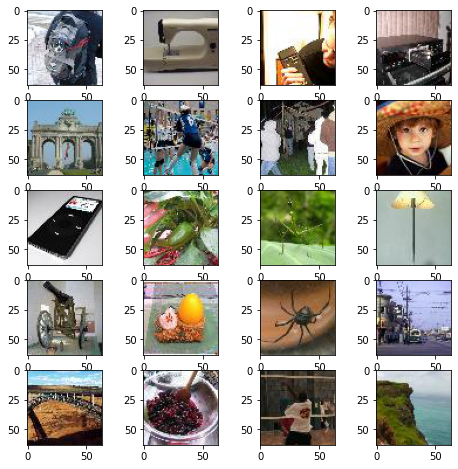

In [ ]:

# Show sample images from the training dataset
fig=plt.figure(figsize=(8, 8))
columns = 4
rows = 5
for i in range(1, columns*rows +1):
    # Randomly sample from training dataset
    img_idx = np.random.choice(X_train.shape[0])
    fig.add_subplot(rows, columns, i)
    plt.imshow(X_train[img_idx])
plt.show()

In [ ]:
beta = 1.0

# Loss for reveal network
def rev_loss(s_true, s_pred):
    # Loss for reveal network is: beta * |S-S'|
    return beta * K.sum(K.square(s_true - s_pred))

# Loss for the full model, used for preparation and hidding networks
def full_loss(y_true, y_pred):
    # Loss for the full model is: |C-C'| + beta * |S-S'|
    s_true, c_true = y_true[...,0:3], y_true[...,3:6]
    s_pred, c_pred = y_pred[...,0:3], y_pred[...,3:6]

    s_loss = rev_loss(s_true, s_pred)
    c_loss = K.sum(K.square(c_true - c_pred))

    return s_loss + c_loss


# Returns the encoder as a Keras model, composed by Preparation and Hiding Networks.
def make_encoder(input_size):
    input_S = Input(shape=(input_size))
    input_C= Input(shape=(input_size))

    # Preparation Network
    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_prep0_3x3')(input_S)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_prep0_4x4')(input_S)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_prep0_5x5')(input_S)
    x = concatenate([x3, x4, x5])

    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_prep1_3x3')(x)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_prep1_4x4')(x)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_prep1_5x5')(x)
    x = concatenate([x3, x4, x5])

    x = concatenate([input_C, x])

    # Hiding network
    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_hid0_3x3')(x)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_hid0_4x4')(x)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_hid0_5x5')(x)
    x = concatenate([x3, x4, x5])

    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_hid1_3x3')(x)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_hid1_4x4')(x)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_hid1_5x5')(x)
    x = concatenate([x3, x4, x5])

    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_hid2_3x3')(x)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_hid2_4x4')(x)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_hid2_5x5')(x)
    x = concatenate([x3, x4, x5])

    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_hid3_3x3')(x)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_hid3_4x4')(x)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_hid3_5x5')(x)
    x = concatenate([x3, x4, x5])

    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_hid4_3x3')(x)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_hid4_4x4')(x)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_hid5_5x5')(x)
    x = concatenate([x3, x4, x5])

    output_Cprime = Conv2D(3, (3, 3), strides = (1, 1), padding='same', activation='relu', name='output_C')(x)

    return Model(inputs=[input_S, input_C],
                 outputs=output_Cprime,
                 name = 'Encoder')

# Returns the decoder as a Keras model, composed by the Reveal Network
def make_decoder(input_size, fixed=True):

    # Reveal network
    reveal_input = Input(shape=(input_size))

    # Adding Gaussian noise with 0.01 standard deviation.
    input_with_noise = GaussianNoise(0.01, name='output_C_noise')(reveal_input)

    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_rev0_3x3')(input_with_noise)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_rev0_4x4')(input_with_noise)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_rev0_5x5')(input_with_noise)
    x = concatenate([x3, x4, x5])

    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_rev1_3x3')(x)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_rev1_4x4')(x)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_rev1_5x5')(x)
    x = concatenate([x3, x4, x5])

    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_rev2_3x3')(x)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_rev2_4x4')(x)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_rev2_5x5')(x)
    x = concatenate([x3, x4, x5])

    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_rev3_3x3')(x)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_rev3_4x4')(x)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_rev3_5x5')(x)
    x = concatenate([x3, x4, x5])

    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_rev4_3x3')(x)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_rev4_4x4')(x)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_rev5_5x5')(x)
    x = concatenate([x3, x4, x5])

    output_Sprime = Conv2D(3, (3, 3), strides = (1, 1), padding='same', activation='relu', name='output_S')(x)

    if not fixed:
        return Model(inputs=reveal_input,
                     outputs=output_Sprime,
                     name = 'Decoder')
    else:
        return Model(inputs=reveal_input,
                         outputs=output_Sprime,
                         name = 'DecoderFixed')

# Full model.
def make_model(input_size):
    input_S = Input(shape=(input_size))
    input_C= Input(shape=(input_size))

    encoder = make_encoder(input_size)

    decoder = make_decoder(input_size)
    decoder.compile(optimizer='adam', loss=rev_loss)
    decoder.trainable = False

    output_Cprime = encoder([input_S, input_C])
    output_Sprime = decoder(output_Cprime)

    autoencoder = Model(inputs=[input_S, input_C],
                        outputs=concatenate([output_Sprime, output_Cprime]))
    autoencoder.compile(optimizer='adam', loss=full_loss)

    return encoder, decoder, autoencoder


In [ ]:
def lr_schedule(epoch_idx):
    if epoch_idx < 200:
        return 0.0005
    elif epoch_idx < 300:
        return 0.0003

In [ ]:
import wandb
# wandb.init(project='stenography')
# wandb.init(project="steganography_tf", entity="omkar26")
# wandb.init(project="bhagwati", entity="omkar26")
wandb.init(project="Deep_Image_Steganography", entity="bhagavatiraj")
sweep_config = {
    'method': 'random', #grid, random
    'metric': {
      'name': 'rev_loss',
      'goal': 'minimize'
    },
    'parameters': {

        'lr':{
            'values':[0.0005300]
        },
        'activation':{
            'values':['relu']
        }
    }
}

sweep_id = wandb.sweep(sweep_config)

<IPython.core.display.Javascript object>

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Create sweep with ID: t8jbz7vv
Sweep URL: https://wandb.ai/bhagavatiraj/uncategorized/sweeps/t8jbz7vv


Create sweep with ID: w37br3zw
Sweep URL: https://wandb.ai/bhagavatiraj/uncategorized/sweeps/w37br3zw


In [ ]:
def train(e,lr):

  NB_EPOCHS = e
  BATCH_SIZE = 32
  encoder_model, reveal_model, autoencoder_model = make_model(input_S.shape[1:])
  K.set_value(autoencoder_model.optimizer.lr,lr)
  K.set_value(reveal_model.optimizer.lr,lr)
  m = input_S.shape[0]
  loss_history = []
  for epoch in range(NB_EPOCHS):
      np.random.shuffle(input_S)
      np.random.shuffle(input_C)
      t = tqdm(range(0, input_S.shape[0], BATCH_SIZE),mininterval=0)

      ae_loss = []
      rev_loss = []
      cover_imgs=[]
      secret_imgs=[]
      encoded_secrets=[]
      decoded_secrets=[]
      diff_ss=[]
      diff_cc=[]
      for idx in t:

          batch_S = input_S[idx:min(idx + BATCH_SIZE, m)]
          batch_C = input_C[idx:min(idx + BATCH_SIZE, m)]

          C_prime = encoder_model.predict([batch_S, batch_C])
          aeLoss = autoencoder_model.train_on_batch(x=[batch_S, batch_C],
                                                    y=np.concatenate((batch_S, batch_C),axis=3))

          ae_loss.append(aeLoss)

          revLoss = reveal_model.train_on_batch(x=C_prime,
                                                y=batch_S)
          rev_loss.append(revLoss)


          t.set_description('Epoch {} | Batch: {:3} of {}. Loss AE {:10.2f} | Loss Rev {:10.2f}'.format(epoch + 1, idx, m, np.mean(ae_loss), np.mean(rev_loss)))

      mean_ae_loss = np.mean(ae_loss)

      loss_history.append(mean_ae_loss)
      print(len(loss_history))
      if (epoch+1)%40==0:
        # Retrieve decoded predictions.
        decoded = autoencoder_model.predict([input_S, input_C])
        decoded_S, decoded_C = decoded[...,0:3], decoded[...,3:6]

        # Get absolute difference between the outputs and the expected values.
        diff_S, diff_C = np.abs(decoded_S - input_S), np.abs(decoded_C - input_C)

        # Configs for results display

        # Show images in gray scale
        SHOW_GRAY = False
        # Show difference bettwen predictions and ground truth.
        SHOW_DIFF = True

        # Diff enhance magnitude
        ENHANCE = 1

        # Number of secret and cover pairs to show.
        n = 6

        def rgb2gray(rgb):
            return np.dot(rgb[...,:3], [0.299, 0.587, 0.114])

        def show_image(img, n_rows, n_col, idx, gray=False, first_row=False, title=None):
            ax = plt.subplot(n_rows, n_col, idx)
            if gray:
                plt.imshow(rgb2gray(img), cmap = plt.get_cmap('gray'))
            else:
                plt.imshow(img)
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
            if first_row:
                plt.title(title)

        fig = plt.figure(figsize=(14, 15))
        rand_indx = [random.randint(0, 999) for x in range(n)]
        # for i, idx in enumerate(range(0, n)):
        for i, idx in enumerate(rand_indx):
            n_col = 6 if SHOW_DIFF else 4
            cover = input_C[idx]
            show_image(cover, n, n_col, i * n_col + 1, gray=SHOW_GRAY, first_row=i==0, title='Cover')
            cover_imgs.append(cover)
            #wandb.log({"Cover":wandb.Image(input_C[idx])})

            secret = input_S[idx]
            show_image(secret, n, n_col, i * n_col + 2, gray=SHOW_GRAY, first_row=i==0, title='Secret')
            secret_imgs.append(secret)
            #wandb.log({"Secret":wandb.Image(input_S[idx])})

            encoded_secret = decoded_C[idx]
            show_image(encoded_secret, n, n_col, i * n_col + 3, gray=SHOW_GRAY, first_row=i==0, title='Encoded Cover')
            encoded_secrets.append(encoded_secret)
            #wandb.log({"Encoded Secret":wandb.Image(decoded_C[idx])})

            decoded_secret = decoded_S[idx]
            show_image(decoded_secret, n, n_col, i * n_col + 4, gray=SHOW_GRAY, first_row=i==0, title='Decoded Secret')
            decoded_secrets.append(decoded_secret)
            #wandb.log({"Decoded Cover":wandb.Image(decoded_S[idx])})


            if SHOW_DIFF:
                diff_c = np.multiply(diff_C[idx], ENHANCE)
                show_image(diff_c, n, n_col, i * n_col + 5, gray=SHOW_GRAY, first_row=i==0, title='Diff Cover')
                diff_cc.append(diff_c)
                #wandb.log({"Diff Cover":wandb.Image(diff_C[idx])})

                diff_s = np.multiply(diff_S[idx], ENHANCE)
                show_image(diff_s, n, n_col, i * n_col + 6, gray=SHOW_GRAY, first_row=i==0, title='Diff Secret')
                diff_ss.append(diff_s)
                #wandb.log({"Diff Secret":wandb.Image(diff_S[idx])})

        # Now we can save it to a numpy array.
        plt.savefig('output.png')

        plt.show()
        wandb.log({"Output":wandb.Image('output.png')})









  plt.plot(loss_history)

  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.show()



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 10s 10s/step


Epoch 1 | Batch:   0 of 1000. Loss AE  202344.02 | Loss Rev  103998.16:   3%|▎         | 1/32 [00:16<08:23, 16.24s/it]

1/1 [==============================] - 0s 21ms/step


Epoch 1 | Batch:  32 of 1000. Loss AE  176124.32 | Loss Rev   90533.03:   6%|▋         | 2/32 [00:16<03:28,  6.96s/it]

1/1 [==============================] - 0s 23ms/step


Epoch 1 | Batch:  64 of 1000. Loss AE  146684.18 | Loss Rev   73511.13:   9%|▉         | 3/32 [00:17<01:55,  3.99s/it]

1/1 [==============================] - 0s 21ms/step


Epoch 1 | Batch:  96 of 1000. Loss AE  182161.58 | Loss Rev  104937.26:  12%|█▎        | 4/32 [00:17<01:12,  2.59s/it]

1/1 [==============================] - 0s 19ms/step


Epoch 1 | Batch: 128 of 1000. Loss AE  160689.56 | Loss Rev   89880.64:  16%|█▌        | 5/32 [00:18<00:49,  1.84s/it]

1/1 [==============================] - 0s 20ms/step


Epoch 1 | Batch: 160 of 1000. Loss AE  151247.56 | Loss Rev   83291.32:  19%|█▉        | 6/32 [00:18<00:35,  1.36s/it]

1/1 [==============================] - 0s 20ms/step


Epoch 1 | Batch: 192 of 1000. Loss AE  147177.95 | Loss Rev   79631.31:  22%|██▏       | 7/32 [00:18<00:26,  1.06s/it]

1/1 [==============================] - 0s 21ms/step


Epoch 1 | Batch: 224 of 1000. Loss AE  145263.87 | Loss Rev   78270.18:  25%|██▌       | 8/32 [00:19<00:20,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 1 | Batch: 256 of 1000. Loss AE  143802.03 | Loss Rev   76988.53:  28%|██▊       | 9/32 [00:19<00:16,  1.38it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 1 | Batch: 288 of 1000. Loss AE  142408.45 | Loss Rev   76069.65:  31%|███▏      | 10/32 [00:20<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 1 | Batch: 320 of 1000. Loss AE  140317.32 | Loss Rev   74495.46:  34%|███▍      | 11/32 [00:20<00:12,  1.71it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 1 | Batch: 352 of 1000. Loss AE  136402.26 | Loss Rev   71617.37:  38%|███▊      | 12/32 [00:21<00:10,  1.86it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 1 | Batch: 384 of 1000. Loss AE  132524.86 | Loss Rev   68452.67:  41%|████      | 13/32 [00:21<00:09,  1.98it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 1 | Batch: 416 of 1000. Loss AE  130489.31 | Loss Rev   66653.77:  44%|████▍     | 14/32 [00:22<00:08,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 1 | Batch: 448 of 1000. Loss AE  128390.29 | Loss Rev   64721.99:  47%|████▋     | 15/32 [00:22<00:08,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 1 | Batch: 480 of 1000. Loss AE  124930.60 | Loss Rev   62208.62:  50%|█████     | 16/32 [00:22<00:07,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 1 | Batch: 512 of 1000. Loss AE  122538.07 | Loss Rev   60634.83:  53%|█████▎    | 17/32 [00:23<00:06,  2.17it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 1 | Batch: 544 of 1000. Loss AE  120503.88 | Loss Rev   59123.59:  56%|█████▋    | 18/32 [00:23<00:06,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 1 | Batch: 576 of 1000. Loss AE  118830.97 | Loss Rev   57933.83:  59%|█████▉    | 19/32 [00:24<00:05,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 1 | Batch: 608 of 1000. Loss AE  116604.57 | Loss Rev   56665.93:  62%|██████▎   | 20/32 [00:24<00:05,  2.20it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 1 | Batch: 640 of 1000. Loss AE  114740.58 | Loss Rev   55348.87:  66%|██████▌   | 21/32 [00:25<00:04,  2.24it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 1 | Batch: 672 of 1000. Loss AE  112945.98 | Loss Rev   54085.85:  69%|██████▉   | 22/32 [00:25<00:04,  2.26it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 1 | Batch: 704 of 1000. Loss AE  111398.27 | Loss Rev   52997.45:  72%|███████▏  | 23/32 [00:26<00:03,  2.27it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 1 | Batch: 736 of 1000. Loss AE  109789.48 | Loss Rev   51978.04:  75%|███████▌  | 24/32 [00:26<00:03,  2.28it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 1 | Batch: 768 of 1000. Loss AE  108357.64 | Loss Rev   51063.94:  78%|███████▊  | 25/32 [00:26<00:03,  2.26it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 1 | Batch: 800 of 1000. Loss AE  106788.19 | Loss Rev   50069.85:  81%|████████▏ | 26/32 [00:27<00:02,  2.28it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 1 | Batch: 832 of 1000. Loss AE  105545.11 | Loss Rev   49226.95:  84%|████████▍ | 27/32 [00:27<00:02,  2.26it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 1 | Batch: 864 of 1000. Loss AE  104457.95 | Loss Rev   48339.66:  88%|████████▊ | 28/32 [00:28<00:01,  2.28it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 1 | Batch: 896 of 1000. Loss AE  103373.36 | Loss Rev   47534.71:  91%|█████████ | 29/32 [00:28<00:01,  2.28it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 1 | Batch: 928 of 1000. Loss AE  102297.79 | Loss Rev   46711.56:  94%|█████████▍| 30/32 [00:29<00:00,  2.25it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 1 | Batch: 960 of 1000. Loss AE  101153.21 | Loss Rev   45938.67:  97%|█████████▋| 31/32 [00:29<00:00,  2.25it/s]

1/1 [==============================] - 0s 412ms/step


Epoch 1 | Batch: 992 of 1000. Loss AE   98476.71 | Loss Rev   44717.90: 100%|██████████| 32/32 [00:32<00:00,  1.00s/it]


1


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 2 | Batch:   0 of 1000. Loss AE   62106.78 | Loss Rev   25124.31:   3%|▎         | 1/32 [00:00<00:13,  2.23it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 2 | Batch:  32 of 1000. Loss AE   56301.05 | Loss Rev   22478.00:   6%|▋         | 2/32 [00:00<00:13,  2.22it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 2 | Batch:  64 of 1000. Loss AE   53769.25 | Loss Rev   21226.48:   9%|▉         | 3/32 [00:01<00:12,  2.25it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 2 | Batch:  96 of 1000. Loss AE   53035.24 | Loss Rev   21038.90:  12%|█▎        | 4/32 [00:01<00:12,  2.27it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 2 | Batch: 128 of 1000. Loss AE   50857.78 | Loss Rev   20520.17:  16%|█▌        | 5/32 [00:02<00:12,  2.24it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 2 | Batch: 160 of 1000. Loss AE   49408.74 | Loss Rev   20062.90:  19%|█▉        | 6/32 [00:02<00:11,  2.27it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 2 | Batch: 192 of 1000. Loss AE   48406.27 | Loss Rev   19743.42:  22%|██▏       | 7/32 [00:03<00:10,  2.29it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 2 | Batch: 224 of 1000. Loss AE   47318.35 | Loss Rev   19326.75:  25%|██▌       | 8/32 [00:03<00:10,  2.26it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 2 | Batch: 256 of 1000. Loss AE   46347.04 | Loss Rev   19225.70:  28%|██▊       | 9/32 [00:03<00:10,  2.24it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 2 | Batch: 288 of 1000. Loss AE   45350.32 | Loss Rev   18996.69:  31%|███▏      | 10/32 [00:04<00:09,  2.23it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 2 | Batch: 320 of 1000. Loss AE   44756.59 | Loss Rev   18955.48:  34%|███▍      | 11/32 [00:04<00:09,  2.26it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 2 | Batch: 352 of 1000. Loss AE   44328.55 | Loss Rev   19018.87:  38%|███▊      | 12/32 [00:05<00:08,  2.23it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 2 | Batch: 384 of 1000. Loss AE   43876.49 | Loss Rev   18961.01:  41%|████      | 13/32 [00:05<00:08,  2.24it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 2 | Batch: 416 of 1000. Loss AE   43002.01 | Loss Rev   18681.86:  44%|████▍     | 14/32 [00:06<00:08,  2.22it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 2 | Batch: 448 of 1000. Loss AE   42413.69 | Loss Rev   18655.26:  47%|████▋     | 15/32 [00:06<00:07,  2.22it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 2 | Batch: 480 of 1000. Loss AE   41696.75 | Loss Rev   18434.31:  50%|█████     | 16/32 [00:07<00:07,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 2 | Batch: 512 of 1000. Loss AE   41046.40 | Loss Rev   18127.76:  53%|█████▎    | 17/32 [00:07<00:07,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 2 | Batch: 544 of 1000. Loss AE   40756.86 | Loss Rev   18199.56:  56%|█████▋    | 18/32 [00:08<00:06,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 2 | Batch: 576 of 1000. Loss AE   41033.13 | Loss Rev   18576.90:  59%|█████▉    | 19/32 [00:08<00:05,  2.22it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 2 | Batch: 608 of 1000. Loss AE   40900.28 | Loss Rev   18848.22:  62%|██████▎   | 20/32 [00:08<00:05,  2.24it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 2 | Batch: 640 of 1000. Loss AE   40154.93 | Loss Rev   18511.30:  66%|██████▌   | 21/32 [00:09<00:04,  2.26it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 2 | Batch: 672 of 1000. Loss AE   40210.49 | Loss Rev   18921.63:  69%|██████▉   | 22/32 [00:09<00:04,  2.28it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 2 | Batch: 704 of 1000. Loss AE   39653.45 | Loss Rev   18700.09:  72%|███████▏  | 23/32 [00:10<00:03,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 2 | Batch: 736 of 1000. Loss AE   39499.74 | Loss Rev   18739.08:  75%|███████▌  | 24/32 [00:10<00:03,  2.26it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 2 | Batch: 768 of 1000. Loss AE   39403.22 | Loss Rev   18939.64:  78%|███████▊  | 25/32 [00:11<00:03,  2.28it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 2 | Batch: 800 of 1000. Loss AE   38878.12 | Loss Rev   18729.65:  81%|████████▏ | 26/32 [00:11<00:02,  2.29it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 2 | Batch: 832 of 1000. Loss AE   38442.71 | Loss Rev   18582.81:  84%|████████▍ | 27/32 [00:12<00:02,  2.26it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 2 | Batch: 864 of 1000. Loss AE   38228.98 | Loss Rev   18591.13:  88%|████████▊ | 28/32 [00:12<00:01,  2.24it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 2 | Batch: 896 of 1000. Loss AE   37854.72 | Loss Rev   18417.33:  91%|█████████ | 29/32 [00:12<00:01,  2.26it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 2 | Batch: 928 of 1000. Loss AE   37503.42 | Loss Rev   18308.62:  94%|█████████▍| 30/32 [00:13<00:00,  2.23it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 2 | Batch: 960 of 1000. Loss AE   37282.44 | Loss Rev   18284.13:  97%|█████████▋| 31/32 [00:13<00:00,  2.22it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 2 | Batch: 992 of 1000. Loss AE   36365.43 | Loss Rev   17854.68: 100%|██████████| 32/32 [00:14<00:00,  2.28it/s]


2


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 3 | Batch:   0 of 1000. Loss AE   27592.63 | Loss Rev   13256.59:   3%|▎         | 1/32 [00:00<00:13,  2.29it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 3 | Batch:  32 of 1000. Loss AE   26446.83 | Loss Rev   12939.77:   6%|▋         | 2/32 [00:00<00:13,  2.26it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 3 | Batch:  64 of 1000. Loss AE   25924.27 | Loss Rev   12537.15:   9%|▉         | 3/32 [00:01<00:12,  2.29it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 3 | Batch:  96 of 1000. Loss AE   26086.52 | Loss Rev   12937.39:  12%|█▎        | 4/32 [00:01<00:12,  2.30it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 3 | Batch: 128 of 1000. Loss AE   26082.74 | Loss Rev   12944.18:  16%|█▌        | 5/32 [00:02<00:11,  2.30it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 3 | Batch: 160 of 1000. Loss AE   25566.02 | Loss Rev   12835.01:  19%|█▉        | 6/32 [00:02<00:11,  2.27it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 3 | Batch: 192 of 1000. Loss AE   25491.96 | Loss Rev   12929.23:  22%|██▏       | 7/32 [00:03<00:10,  2.28it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 3 | Batch: 224 of 1000. Loss AE   24980.50 | Loss Rev   12686.52:  25%|██▌       | 8/32 [00:03<00:10,  2.27it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 3 | Batch: 256 of 1000. Loss AE   24699.01 | Loss Rev   12559.01:  28%|██▊       | 9/32 [00:03<00:10,  2.26it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 3 | Batch: 288 of 1000. Loss AE   24442.21 | Loss Rev   12417.66:  31%|███▏      | 10/32 [00:04<00:10,  2.03it/s]

1/1 [==============================] - 0s 82ms/step


Epoch 3 | Batch: 320 of 1000. Loss AE   24297.47 | Loss Rev   12296.19:  34%|███▍      | 11/32 [00:05<00:10,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 3 | Batch: 352 of 1000. Loss AE   24185.14 | Loss Rev   12252.94:  38%|███▊      | 12/32 [00:05<00:10,  1.88it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 3 | Batch: 384 of 1000. Loss AE   24003.56 | Loss Rev   12165.55:  41%|████      | 13/32 [00:06<00:10,  1.86it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 3 | Batch: 416 of 1000. Loss AE   23961.23 | Loss Rev   12172.03:  44%|████▍     | 14/32 [00:06<00:09,  1.92it/s]

1/1 [==============================] - 0s 86ms/step


Epoch 3 | Batch: 448 of 1000. Loss AE   23810.86 | Loss Rev   12116.85:  47%|████▋     | 15/32 [00:07<00:09,  1.82it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 3 | Batch: 480 of 1000. Loss AE   23533.64 | Loss Rev   11992.74:  50%|█████     | 16/32 [00:07<00:08,  1.91it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 3 | Batch: 512 of 1000. Loss AE   23367.89 | Loss Rev   11923.95:  53%|█████▎    | 17/32 [00:08<00:07,  1.99it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 3 | Batch: 544 of 1000. Loss AE   23049.40 | Loss Rev   11733.73:  56%|█████▋    | 18/32 [00:08<00:06,  2.07it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 3 | Batch: 576 of 1000. Loss AE   22993.67 | Loss Rev   11754.55:  59%|█████▉    | 19/32 [00:09<00:06,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 3 | Batch: 608 of 1000. Loss AE   22895.14 | Loss Rev   11703.51:  62%|██████▎   | 20/32 [00:09<00:05,  2.15it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 3 | Batch: 640 of 1000. Loss AE   22730.35 | Loss Rev   11598.18:  66%|██████▌   | 21/32 [00:10<00:05,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 3 | Batch: 672 of 1000. Loss AE   22570.65 | Loss Rev   11546.87:  69%|██████▉   | 22/32 [00:10<00:04,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 3 | Batch: 704 of 1000. Loss AE   22295.42 | Loss Rev   11396.81:  72%|███████▏  | 23/32 [00:10<00:04,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 3 | Batch: 736 of 1000. Loss AE   22161.33 | Loss Rev   11336.17:  75%|███████▌  | 24/32 [00:11<00:03,  2.16it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 3 | Batch: 768 of 1000. Loss AE   21966.39 | Loss Rev   11233.02:  78%|███████▊  | 25/32 [00:11<00:03,  2.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 3 | Batch: 800 of 1000. Loss AE   21838.52 | Loss Rev   11152.20:  81%|████████▏ | 26/32 [00:12<00:02,  2.21it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 3 | Batch: 832 of 1000. Loss AE   21692.86 | Loss Rev   11059.80:  84%|████████▍ | 27/32 [00:12<00:02,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 3 | Batch: 864 of 1000. Loss AE   21560.79 | Loss Rev   11025.13:  88%|████████▊ | 28/32 [00:13<00:01,  2.22it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 3 | Batch: 896 of 1000. Loss AE   21437.26 | Loss Rev   10995.16:  91%|█████████ | 29/32 [00:13<00:01,  2.24it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 3 | Batch: 928 of 1000. Loss AE   21341.08 | Loss Rev   10921.15:  94%|█████████▍| 30/32 [00:14<00:00,  2.25it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 3 | Batch: 960 of 1000. Loss AE   21288.26 | Loss Rev   10841.65:  97%|█████████▋| 31/32 [00:14<00:00,  2.22it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 3 | Batch: 992 of 1000. Loss AE   20735.01 | Loss Rev   10559.85: 100%|██████████| 32/32 [00:14<00:00,  2.17it/s]


3


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 4 | Batch:   0 of 1000. Loss AE   18235.12 | Loss Rev   10963.57:   3%|▎         | 1/32 [00:00<00:14,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 4 | Batch:  32 of 1000. Loss AE   21253.25 | Loss Rev   13459.71:   6%|▋         | 2/32 [00:00<00:13,  2.23it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 4 | Batch:  64 of 1000. Loss AE   22029.03 | Loss Rev   14009.19:   9%|▉         | 3/32 [00:01<00:13,  2.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 4 | Batch:  96 of 1000. Loss AE   21891.90 | Loss Rev   13505.55:  12%|█▎        | 4/32 [00:01<00:12,  2.21it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 4 | Batch: 128 of 1000. Loss AE   22599.91 | Loss Rev   14310.97:  16%|█▌        | 5/32 [00:02<00:13,  2.06it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 4 | Batch: 160 of 1000. Loss AE   21934.78 | Loss Rev   13579.55:  19%|█▉        | 6/32 [00:02<00:12,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 4 | Batch: 192 of 1000. Loss AE   21582.02 | Loss Rev   13425.41:  22%|██▏       | 7/32 [00:03<00:11,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 4 | Batch: 224 of 1000. Loss AE   21260.14 | Loss Rev   12959.27:  25%|██▌       | 8/32 [00:03<00:11,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 4 | Batch: 256 of 1000. Loss AE   21449.66 | Loss Rev   12965.55:  28%|██▊       | 9/32 [00:04<00:10,  2.20it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 4 | Batch: 288 of 1000. Loss AE   21337.17 | Loss Rev   12835.02:  31%|███▏      | 10/32 [00:04<00:10,  2.19it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 4 | Batch: 320 of 1000. Loss AE   21180.59 | Loss Rev   12717.52:  34%|███▍      | 11/32 [00:05<00:09,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 4 | Batch: 352 of 1000. Loss AE   21246.49 | Loss Rev   12698.95:  38%|███▊      | 12/32 [00:05<00:09,  2.22it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 4 | Batch: 384 of 1000. Loss AE   21050.19 | Loss Rev   12434.95:  41%|████      | 13/32 [00:05<00:08,  2.23it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 4 | Batch: 416 of 1000. Loss AE   21027.95 | Loss Rev   12366.30:  44%|████▍     | 14/32 [00:06<00:08,  2.22it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 4 | Batch: 448 of 1000. Loss AE   20815.95 | Loss Rev   12233.38:  47%|████▋     | 15/32 [00:06<00:07,  2.21it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 4 | Batch: 480 of 1000. Loss AE   20742.65 | Loss Rev   12074.23:  50%|█████     | 16/32 [00:07<00:07,  2.20it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 4 | Batch: 512 of 1000. Loss AE   20640.53 | Loss Rev   11915.48:  53%|█████▎    | 17/32 [00:07<00:06,  2.19it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 4 | Batch: 544 of 1000. Loss AE   20492.87 | Loss Rev   11763.27:  56%|█████▋    | 18/32 [00:08<00:06,  2.21it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 4 | Batch: 576 of 1000. Loss AE   20475.19 | Loss Rev   11729.15:  59%|█████▉    | 19/32 [00:08<00:05,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 4 | Batch: 608 of 1000. Loss AE   20241.13 | Loss Rev   11504.40:  62%|██████▎   | 20/32 [00:09<00:05,  2.19it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 4 | Batch: 640 of 1000. Loss AE   20082.83 | Loss Rev   11377.71:  66%|██████▌   | 21/32 [00:09<00:04,  2.21it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 4 | Batch: 672 of 1000. Loss AE   19925.60 | Loss Rev   11262.14:  69%|██████▉   | 22/32 [00:10<00:04,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 4 | Batch: 704 of 1000. Loss AE   19796.77 | Loss Rev   11155.21:  72%|███████▏  | 23/32 [00:10<00:04,  2.19it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 4 | Batch: 736 of 1000. Loss AE   19732.99 | Loss Rev   11123.61:  75%|███████▌  | 24/32 [00:10<00:03,  2.21it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 4 | Batch: 768 of 1000. Loss AE   19577.16 | Loss Rev   11007.76:  78%|███████▊  | 25/32 [00:11<00:03,  2.23it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 4 | Batch: 800 of 1000. Loss AE   19484.12 | Loss Rev   10946.86:  81%|████████▏ | 26/32 [00:11<00:02,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 4 | Batch: 832 of 1000. Loss AE   19463.26 | Loss Rev   10934.72:  84%|████████▍ | 27/32 [00:12<00:02,  2.20it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 4 | Batch: 864 of 1000. Loss AE   19353.48 | Loss Rev   10872.61:  88%|████████▊ | 28/32 [00:12<00:01,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 4 | Batch: 896 of 1000. Loss AE   19252.97 | Loss Rev   10768.77:  91%|█████████ | 29/32 [00:13<00:01,  2.16it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 4 | Batch: 928 of 1000. Loss AE   19287.86 | Loss Rev   10720.36:  94%|█████████▍| 30/32 [00:13<00:00,  2.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 4 | Batch: 960 of 1000. Loss AE   19195.50 | Loss Rev   10670.19:  97%|█████████▋| 31/32 [00:14<00:00,  2.18it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 4 | Batch: 992 of 1000. Loss AE   18740.00 | Loss Rev   10416.82: 100%|██████████| 32/32 [00:14<00:00,  2.24it/s]


4


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 5 | Batch:   0 of 1000. Loss AE   17876.33 | Loss Rev   10194.57:   3%|▎         | 1/32 [00:00<00:13,  2.28it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 5 | Batch:  32 of 1000. Loss AE   16620.64 | Loss Rev    9345.53:   6%|▋         | 2/32 [00:00<00:13,  2.26it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 5 | Batch:  64 of 1000. Loss AE   17077.50 | Loss Rev    9713.60:   9%|▉         | 3/32 [00:01<00:12,  2.27it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 5 | Batch:  96 of 1000. Loss AE   16667.87 | Loss Rev    9519.90:  12%|█▎        | 4/32 [00:01<00:12,  2.23it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 5 | Batch: 128 of 1000. Loss AE   16791.36 | Loss Rev    9520.30:  16%|█▌        | 5/32 [00:02<00:12,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 5 | Batch: 160 of 1000. Loss AE   16378.76 | Loss Rev    9174.34:  19%|█▉        | 6/32 [00:02<00:11,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 5 | Batch: 192 of 1000. Loss AE   16332.92 | Loss Rev    9146.30:  22%|██▏       | 7/32 [00:03<00:11,  2.22it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 5 | Batch: 224 of 1000. Loss AE   16171.27 | Loss Rev    9059.16:  25%|██▌       | 8/32 [00:03<00:10,  2.19it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 5 | Batch: 256 of 1000. Loss AE   16215.42 | Loss Rev    9025.55:  28%|██▊       | 9/32 [00:04<00:10,  2.22it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 5 | Batch: 288 of 1000. Loss AE   16375.64 | Loss Rev    9011.28:  31%|███▏      | 10/32 [00:04<00:09,  2.24it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 5 | Batch: 320 of 1000. Loss AE   16332.10 | Loss Rev    9054.19:  34%|███▍      | 11/32 [00:04<00:09,  2.24it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 5 | Batch: 352 of 1000. Loss AE   16305.03 | Loss Rev    9085.93:  38%|███▊      | 12/32 [00:05<00:09,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 5 | Batch: 384 of 1000. Loss AE   16373.28 | Loss Rev    9123.34:  41%|████      | 13/32 [00:05<00:08,  2.19it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 5 | Batch: 416 of 1000. Loss AE   16303.89 | Loss Rev    9056.71:  44%|████▍     | 14/32 [00:06<00:08,  2.19it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 5 | Batch: 448 of 1000. Loss AE   16239.24 | Loss Rev    9010.17:  47%|████▋     | 15/32 [00:06<00:07,  2.18it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 5 | Batch: 480 of 1000. Loss AE   16128.05 | Loss Rev    8958.15:  50%|█████     | 16/32 [00:07<00:07,  2.20it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 5 | Batch: 512 of 1000. Loss AE   16082.70 | Loss Rev    8989.48:  53%|█████▎    | 17/32 [00:07<00:06,  2.21it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 5 | Batch: 544 of 1000. Loss AE   16059.72 | Loss Rev    8981.51:  56%|█████▋    | 18/32 [00:08<00:06,  2.20it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 5 | Batch: 576 of 1000. Loss AE   15946.46 | Loss Rev    8933.68:  59%|█████▉    | 19/32 [00:08<00:05,  2.22it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 5 | Batch: 608 of 1000. Loss AE   15897.44 | Loss Rev    8876.25:  62%|██████▎   | 20/32 [00:09<00:05,  2.23it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 5 | Batch: 640 of 1000. Loss AE   15880.40 | Loss Rev    8886.16:  66%|██████▌   | 21/32 [00:09<00:04,  2.20it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 5 | Batch: 672 of 1000. Loss AE   15853.73 | Loss Rev    8832.93:  69%|██████▉   | 22/32 [00:09<00:04,  2.21it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 5 | Batch: 704 of 1000. Loss AE   15749.48 | Loss Rev    8785.82:  72%|███████▏  | 23/32 [00:10<00:04,  2.20it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 5 | Batch: 736 of 1000. Loss AE   15721.55 | Loss Rev    8796.93:  75%|███████▌  | 24/32 [00:10<00:03,  2.20it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 5 | Batch: 768 of 1000. Loss AE   15628.76 | Loss Rev    8737.63:  78%|███████▊  | 25/32 [00:11<00:03,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 5 | Batch: 800 of 1000. Loss AE   15642.69 | Loss Rev    8723.83:  81%|████████▏ | 26/32 [00:11<00:02,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 5 | Batch: 832 of 1000. Loss AE   15543.25 | Loss Rev    8667.27:  84%|████████▍ | 27/32 [00:12<00:02,  2.17it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 5 | Batch: 864 of 1000. Loss AE   15419.33 | Loss Rev    8606.48:  88%|████████▊ | 28/32 [00:12<00:01,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 5 | Batch: 896 of 1000. Loss AE   15420.68 | Loss Rev    8575.36:  91%|█████████ | 29/32 [00:13<00:01,  2.20it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 5 | Batch: 928 of 1000. Loss AE   15425.30 | Loss Rev    8612.81:  94%|█████████▍| 30/32 [00:13<00:00,  2.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 5 | Batch: 960 of 1000. Loss AE   15362.00 | Loss Rev    8588.96:  97%|█████████▋| 31/32 [00:14<00:00,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 5 | Batch: 992 of 1000. Loss AE   14995.11 | Loss Rev    8383.53: 100%|██████████| 32/32 [00:14<00:00,  2.25it/s]


5


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 6 | Batch:   0 of 1000. Loss AE   12638.43 | Loss Rev    7393.28:   3%|▎         | 1/32 [00:00<00:14,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 6 | Batch:  32 of 1000. Loss AE   12891.06 | Loss Rev    7650.88:   6%|▋         | 2/32 [00:00<00:13,  2.17it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 6 | Batch:  64 of 1000. Loss AE   12749.90 | Loss Rev    7082.51:   9%|▉         | 3/32 [00:01<00:13,  2.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 6 | Batch:  96 of 1000. Loss AE   12780.36 | Loss Rev    7203.96:  12%|█▎        | 4/32 [00:01<00:13,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 6 | Batch: 128 of 1000. Loss AE   12507.82 | Loss Rev    7112.42:  16%|█▌        | 5/32 [00:02<00:12,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 6 | Batch: 160 of 1000. Loss AE   12645.74 | Loss Rev    7107.83:  19%|█▉        | 6/32 [00:02<00:11,  2.19it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 6 | Batch: 192 of 1000. Loss AE   12605.45 | Loss Rev    7196.70:  22%|██▏       | 7/32 [00:03<00:11,  2.21it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 6 | Batch: 224 of 1000. Loss AE   12673.67 | Loss Rev    7241.14:  25%|██▌       | 8/32 [00:03<00:10,  2.23it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 6 | Batch: 256 of 1000. Loss AE   12788.59 | Loss Rev    7341.47:  28%|██▊       | 9/32 [00:04<00:10,  2.21it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 6 | Batch: 288 of 1000. Loss AE   12809.98 | Loss Rev    7432.81:  31%|███▏      | 10/32 [00:04<00:10,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 6 | Batch: 320 of 1000. Loss AE   13378.20 | Loss Rev    7948.24:  34%|███▍      | 11/32 [00:05<00:09,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 6 | Batch: 352 of 1000. Loss AE   14645.38 | Loss Rev    9186.48:  38%|███▊      | 12/32 [00:05<00:09,  2.11it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 6 | Batch: 384 of 1000. Loss AE   14489.66 | Loss Rev    9011.47:  41%|████      | 13/32 [00:06<00:08,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 6 | Batch: 416 of 1000. Loss AE   15390.21 | Loss Rev    9808.63:  44%|████▍     | 14/32 [00:06<00:08,  2.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 6 | Batch: 448 of 1000. Loss AE   15808.12 | Loss Rev   10237.54:  47%|████▋     | 15/32 [00:06<00:07,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 6 | Batch: 480 of 1000. Loss AE   16278.18 | Loss Rev   10688.93:  50%|█████     | 16/32 [00:07<00:07,  2.16it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 6 | Batch: 512 of 1000. Loss AE   16298.54 | Loss Rev   10610.98:  53%|█████▎    | 17/32 [00:07<00:06,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 6 | Batch: 544 of 1000. Loss AE   16736.07 | Loss Rev   11002.38:  56%|█████▋    | 18/32 [00:08<00:06,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 6 | Batch: 576 of 1000. Loss AE   16619.05 | Loss Rev   10855.99:  59%|█████▉    | 19/32 [00:08<00:05,  2.20it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 6 | Batch: 608 of 1000. Loss AE   16734.62 | Loss Rev   10908.78:  62%|██████▎   | 20/32 [00:09<00:05,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 6 | Batch: 640 of 1000. Loss AE   16677.67 | Loss Rev   10856.79:  66%|██████▌   | 21/32 [00:09<00:05,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 6 | Batch: 672 of 1000. Loss AE   16610.55 | Loss Rev   10765.40:  69%|██████▉   | 22/32 [00:10<00:04,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 6 | Batch: 704 of 1000. Loss AE   16644.62 | Loss Rev   10765.14:  72%|███████▏  | 23/32 [00:10<00:04,  2.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 6 | Batch: 736 of 1000. Loss AE   16569.60 | Loss Rev   10656.12:  75%|███████▌  | 24/32 [00:11<00:03,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 6 | Batch: 768 of 1000. Loss AE   16539.22 | Loss Rev   10614.08:  78%|███████▊  | 25/32 [00:11<00:03,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 6 | Batch: 800 of 1000. Loss AE   16509.64 | Loss Rev   10536.41:  81%|████████▏ | 26/32 [00:11<00:02,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 6 | Batch: 832 of 1000. Loss AE   16499.51 | Loss Rev   10472.46:  84%|████████▍ | 27/32 [00:12<00:02,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 6 | Batch: 864 of 1000. Loss AE   16472.44 | Loss Rev   10433.51:  88%|████████▊ | 28/32 [00:12<00:01,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 6 | Batch: 896 of 1000. Loss AE   16348.78 | Loss Rev   10317.33:  91%|█████████ | 29/32 [00:13<00:01,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 6 | Batch: 928 of 1000. Loss AE   16280.10 | Loss Rev   10239.12:  94%|█████████▍| 30/32 [00:13<00:00,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 6 | Batch: 960 of 1000. Loss AE   16194.96 | Loss Rev   10166.33:  97%|█████████▋| 31/32 [00:14<00:00,  2.20it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 6 | Batch: 992 of 1000. Loss AE   15785.75 | Loss Rev    9903.13: 100%|██████████| 32/32 [00:14<00:00,  2.21it/s]


6


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 7 | Batch:   0 of 1000. Loss AE   16080.62 | Loss Rev    9928.76:   3%|▎         | 1/32 [00:00<00:14,  2.17it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 7 | Batch:  32 of 1000. Loss AE   15350.03 | Loss Rev    9665.06:   6%|▋         | 2/32 [00:00<00:13,  2.15it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 7 | Batch:  64 of 1000. Loss AE   15259.05 | Loss Rev    9660.09:   9%|▉         | 3/32 [00:01<00:13,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 7 | Batch:  96 of 1000. Loss AE   15109.87 | Loss Rev    9516.24:  12%|█▎        | 4/32 [00:01<00:13,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 7 | Batch: 128 of 1000. Loss AE   15193.20 | Loss Rev    9384.14:  16%|█▌        | 5/32 [00:02<00:13,  2.05it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 7 | Batch: 160 of 1000. Loss AE   14918.30 | Loss Rev    9130.67:  19%|█▉        | 6/32 [00:02<00:12,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 7 | Batch: 192 of 1000. Loss AE   15013.67 | Loss Rev    9089.91:  22%|██▏       | 7/32 [00:03<00:11,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 7 | Batch: 224 of 1000. Loss AE   15015.98 | Loss Rev    9240.30:  25%|██▌       | 8/32 [00:03<00:11,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 7 | Batch: 256 of 1000. Loss AE   14693.05 | Loss Rev    9049.77:  28%|██▊       | 9/32 [00:04<00:10,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 7 | Batch: 288 of 1000. Loss AE   14661.72 | Loss Rev    9046.12:  31%|███▏      | 10/32 [00:04<00:10,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 7 | Batch: 320 of 1000. Loss AE   14500.00 | Loss Rev    8857.11:  34%|███▍      | 11/32 [00:05<00:09,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 7 | Batch: 352 of 1000. Loss AE   14351.48 | Loss Rev    8820.73:  38%|███▊      | 12/32 [00:05<00:09,  2.18it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 7 | Batch: 384 of 1000. Loss AE   14226.05 | Loss Rev    8678.07:  41%|████      | 13/32 [00:06<00:08,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 7 | Batch: 416 of 1000. Loss AE   14110.78 | Loss Rev    8515.30:  44%|████▍     | 14/32 [00:06<00:08,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 7 | Batch: 448 of 1000. Loss AE   14008.79 | Loss Rev    8446.44:  47%|████▋     | 15/32 [00:06<00:07,  2.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 7 | Batch: 480 of 1000. Loss AE   13985.48 | Loss Rev    8447.41:  50%|█████     | 16/32 [00:07<00:07,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 7 | Batch: 512 of 1000. Loss AE   14020.53 | Loss Rev    8455.09:  53%|█████▎    | 17/32 [00:07<00:07,  2.13it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 7 | Batch: 544 of 1000. Loss AE   13876.29 | Loss Rev    8370.25:  56%|█████▋    | 18/32 [00:08<00:06,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 7 | Batch: 576 of 1000. Loss AE   13918.22 | Loss Rev    8386.12:  59%|█████▉    | 19/32 [00:08<00:06,  2.14it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 7 | Batch: 608 of 1000. Loss AE   13818.30 | Loss Rev    8281.01:  62%|██████▎   | 20/32 [00:09<00:05,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 7 | Batch: 640 of 1000. Loss AE   13746.27 | Loss Rev    8224.32:  66%|██████▌   | 21/32 [00:09<00:05,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 7 | Batch: 672 of 1000. Loss AE   13712.31 | Loss Rev    8187.33:  69%|██████▉   | 22/32 [00:10<00:04,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 7 | Batch: 704 of 1000. Loss AE   13655.13 | Loss Rev    8195.64:  72%|███████▏  | 23/32 [00:10<00:04,  2.17it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 7 | Batch: 736 of 1000. Loss AE   13579.73 | Loss Rev    8161.81:  75%|███████▌  | 24/32 [00:11<00:03,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 7 | Batch: 768 of 1000. Loss AE   13505.64 | Loss Rev    8120.62:  78%|███████▊  | 25/32 [00:11<00:03,  2.16it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 7 | Batch: 800 of 1000. Loss AE   13445.59 | Loss Rev    8091.97:  81%|████████▏ | 26/32 [00:12<00:02,  2.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 7 | Batch: 832 of 1000. Loss AE   13378.93 | Loss Rev    8067.13:  84%|████████▍ | 27/32 [00:12<00:02,  2.17it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 7 | Batch: 864 of 1000. Loss AE   13305.19 | Loss Rev    8042.86:  88%|████████▊ | 28/32 [00:13<00:01,  2.19it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 7 | Batch: 896 of 1000. Loss AE   13278.54 | Loss Rev    8052.16:  91%|█████████ | 29/32 [00:13<00:01,  2.20it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 7 | Batch: 928 of 1000. Loss AE   13210.00 | Loss Rev    8015.63:  94%|█████████▍| 30/32 [00:13<00:00,  2.18it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 7 | Batch: 960 of 1000. Loss AE   13124.97 | Loss Rev    7968.90:  97%|█████████▋| 31/32 [00:14<00:00,  2.16it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 7 | Batch: 992 of 1000. Loss AE   12830.91 | Loss Rev    7784.18: 100%|██████████| 32/32 [00:14<00:00,  2.19it/s]


7


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 8 | Batch:   0 of 1000. Loss AE   12687.17 | Loss Rev    6940.59:   3%|▎         | 1/32 [00:00<00:13,  2.26it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 8 | Batch:  32 of 1000. Loss AE   13048.18 | Loss Rev    7985.40:   6%|▋         | 2/32 [00:00<00:13,  2.19it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 8 | Batch:  64 of 1000. Loss AE   12393.37 | Loss Rev    7389.64:   9%|▉         | 3/32 [00:01<00:13,  2.22it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 8 | Batch:  96 of 1000. Loss AE   12000.72 | Loss Rev    7244.90:  12%|█▎        | 4/32 [00:01<00:12,  2.23it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 8 | Batch: 128 of 1000. Loss AE   11772.65 | Loss Rev    7155.22:  16%|█▌        | 5/32 [00:02<00:12,  2.19it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 8 | Batch: 160 of 1000. Loss AE   11700.34 | Loss Rev    7172.35:  19%|█▉        | 6/32 [00:02<00:11,  2.21it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 8 | Batch: 192 of 1000. Loss AE   11758.38 | Loss Rev    7262.50:  22%|██▏       | 7/32 [00:03<00:11,  2.18it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 8 | Batch: 224 of 1000. Loss AE   11664.17 | Loss Rev    7219.30:  25%|██▌       | 8/32 [00:03<00:10,  2.19it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 8 | Batch: 256 of 1000. Loss AE   11686.46 | Loss Rev    7300.49:  28%|██▊       | 9/32 [00:04<00:10,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 8 | Batch: 288 of 1000. Loss AE   11844.25 | Loss Rev    7397.99:  31%|███▏      | 10/32 [00:04<00:10,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 8 | Batch: 320 of 1000. Loss AE   11730.50 | Loss Rev    7376.83:  34%|███▍      | 11/32 [00:05<00:09,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 8 | Batch: 352 of 1000. Loss AE   11765.19 | Loss Rev    7321.98:  38%|███▊      | 12/32 [00:05<00:09,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 8 | Batch: 384 of 1000. Loss AE   11672.42 | Loss Rev    7237.88:  41%|████      | 13/32 [00:05<00:08,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 8 | Batch: 416 of 1000. Loss AE   11636.93 | Loss Rev    7196.56:  44%|████▍     | 14/32 [00:06<00:08,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 8 | Batch: 448 of 1000. Loss AE   11546.91 | Loss Rev    7116.63:  47%|████▋     | 15/32 [00:06<00:07,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 8 | Batch: 480 of 1000. Loss AE   11520.12 | Loss Rev    7118.31:  50%|█████     | 16/32 [00:07<00:07,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 8 | Batch: 512 of 1000. Loss AE   11467.60 | Loss Rev    7125.37:  53%|█████▎    | 17/32 [00:07<00:07,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 8 | Batch: 544 of 1000. Loss AE   11478.94 | Loss Rev    7159.56:  56%|█████▋    | 18/32 [00:08<00:06,  2.10it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 8 | Batch: 576 of 1000. Loss AE   11448.78 | Loss Rev    7147.09:  59%|█████▉    | 19/32 [00:08<00:06,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 8 | Batch: 608 of 1000. Loss AE   11445.12 | Loss Rev    7133.01:  62%|██████▎   | 20/32 [00:09<00:05,  2.17it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 8 | Batch: 640 of 1000. Loss AE   11385.31 | Loss Rev    7105.72:  66%|██████▌   | 21/32 [00:09<00:05,  2.17it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 8 | Batch: 672 of 1000. Loss AE   11527.32 | Loss Rev    7188.78:  69%|██████▉   | 22/32 [00:10<00:04,  2.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 8 | Batch: 704 of 1000. Loss AE   11513.03 | Loss Rev    7177.28:  72%|███████▏  | 23/32 [00:10<00:04,  2.17it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 8 | Batch: 736 of 1000. Loss AE   11434.94 | Loss Rev    7123.08:  75%|███████▌  | 24/32 [00:11<00:03,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 8 | Batch: 768 of 1000. Loss AE   11431.98 | Loss Rev    7137.01:  78%|███████▊  | 25/32 [00:11<00:03,  2.18it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 8 | Batch: 800 of 1000. Loss AE   11420.34 | Loss Rev    7123.82:  81%|████████▏ | 26/32 [00:12<00:02,  2.19it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 8 | Batch: 832 of 1000. Loss AE   11394.79 | Loss Rev    7125.71:  84%|████████▍ | 27/32 [00:12<00:02,  2.17it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 8 | Batch: 864 of 1000. Loss AE   11356.66 | Loss Rev    7106.52:  88%|████████▊ | 28/32 [00:12<00:01,  2.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 8 | Batch: 896 of 1000. Loss AE   11287.88 | Loss Rev    7063.03:  91%|█████████ | 29/32 [00:13<00:01,  2.18it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 8 | Batch: 928 of 1000. Loss AE   11333.80 | Loss Rev    7135.83:  94%|█████████▍| 30/32 [00:13<00:00,  2.19it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 8 | Batch: 960 of 1000. Loss AE   11375.09 | Loss Rev    7182.06:  97%|█████████▋| 31/32 [00:14<00:00,  2.17it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 8 | Batch: 992 of 1000. Loss AE   11144.14 | Loss Rev    7047.59: 100%|██████████| 32/32 [00:14<00:00,  2.20it/s]


8


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 9 | Batch:   0 of 1000. Loss AE   15974.48 | Loss Rev   12262.76:   3%|▎         | 1/32 [00:00<00:13,  2.28it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 9 | Batch:  32 of 1000. Loss AE   16136.19 | Loss Rev   12136.16:   6%|▋         | 2/32 [00:00<00:14,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 9 | Batch:  64 of 1000. Loss AE   14579.30 | Loss Rev   10277.57:   9%|▉         | 3/32 [00:01<00:13,  2.15it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 9 | Batch:  96 of 1000. Loss AE   13971.37 | Loss Rev    9808.16:  12%|█▎        | 4/32 [00:01<00:13,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 9 | Batch: 128 of 1000. Loss AE   13836.33 | Loss Rev    9498.22:  16%|█▌        | 5/32 [00:02<00:12,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 9 | Batch: 160 of 1000. Loss AE   13204.87 | Loss Rev    9013.12:  19%|█▉        | 6/32 [00:02<00:12,  2.15it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 9 | Batch: 192 of 1000. Loss AE   12988.02 | Loss Rev    8856.96:  22%|██▏       | 7/32 [00:03<00:11,  2.17it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 9 | Batch: 224 of 1000. Loss AE   12982.08 | Loss Rev    8781.19:  25%|██▌       | 8/32 [00:03<00:10,  2.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 9 | Batch: 256 of 1000. Loss AE   12723.35 | Loss Rev    8469.79:  28%|██▊       | 9/32 [00:04<00:10,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 9 | Batch: 288 of 1000. Loss AE   12482.51 | Loss Rev    8193.21:  31%|███▏      | 10/32 [00:04<00:10,  2.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 9 | Batch: 320 of 1000. Loss AE   12278.20 | Loss Rev    7956.96:  34%|███▍      | 11/32 [00:05<00:09,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 9 | Batch: 352 of 1000. Loss AE   12402.26 | Loss Rev    8005.68:  38%|███▊      | 12/32 [00:05<00:09,  2.11it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 9 | Batch: 384 of 1000. Loss AE   12214.80 | Loss Rev    7873.72:  41%|████      | 13/32 [00:06<00:08,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 9 | Batch: 416 of 1000. Loss AE   12065.59 | Loss Rev    7757.16:  44%|████▍     | 14/32 [00:06<00:08,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 9 | Batch: 448 of 1000. Loss AE   11885.59 | Loss Rev    7637.64:  47%|████▋     | 15/32 [00:06<00:07,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 9 | Batch: 480 of 1000. Loss AE   11764.19 | Loss Rev    7536.73:  50%|█████     | 16/32 [00:07<00:07,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 9 | Batch: 512 of 1000. Loss AE   11701.62 | Loss Rev    7494.18:  53%|█████▎    | 17/32 [00:07<00:06,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 9 | Batch: 544 of 1000. Loss AE   11624.38 | Loss Rev    7428.38:  56%|█████▋    | 18/32 [00:08<00:06,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 9 | Batch: 576 of 1000. Loss AE   11524.87 | Loss Rev    7335.51:  59%|█████▉    | 19/32 [00:08<00:06,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 9 | Batch: 608 of 1000. Loss AE   11443.26 | Loss Rev    7265.06:  62%|██████▎   | 20/32 [00:09<00:05,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 9 | Batch: 640 of 1000. Loss AE   11440.46 | Loss Rev    7241.65:  66%|██████▌   | 21/32 [00:09<00:05,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 9 | Batch: 672 of 1000. Loss AE   11428.31 | Loss Rev    7184.48:  69%|██████▉   | 22/32 [00:10<00:04,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 9 | Batch: 704 of 1000. Loss AE   11350.26 | Loss Rev    7110.44:  72%|███████▏  | 23/32 [00:10<00:04,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 9 | Batch: 736 of 1000. Loss AE   11231.50 | Loss Rev    7045.54:  75%|███████▌  | 24/32 [00:11<00:03,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 9 | Batch: 768 of 1000. Loss AE   11162.45 | Loss Rev    6989.01:  78%|███████▊  | 25/32 [00:11<00:03,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 9 | Batch: 800 of 1000. Loss AE   11110.86 | Loss Rev    6937.63:  81%|████████▏ | 26/32 [00:12<00:02,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 9 | Batch: 832 of 1000. Loss AE   11049.43 | Loss Rev    6889.55:  84%|████████▍ | 27/32 [00:12<00:02,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 9 | Batch: 864 of 1000. Loss AE   10954.70 | Loss Rev    6825.29:  88%|████████▊ | 28/32 [00:13<00:01,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 9 | Batch: 896 of 1000. Loss AE   10970.52 | Loss Rev    6794.57:  91%|█████████ | 29/32 [00:13<00:01,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 9 | Batch: 928 of 1000. Loss AE   10946.63 | Loss Rev    6782.14:  94%|█████████▍| 30/32 [00:13<00:00,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 9 | Batch: 960 of 1000. Loss AE   10915.55 | Loss Rev    6756.74:  97%|█████████▋| 31/32 [00:14<00:00,  2.19it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 9 | Batch: 992 of 1000. Loss AE   10637.37 | Loss Rev    6587.03: 100%|██████████| 32/32 [00:14<00:00,  2.20it/s]


9


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 10 | Batch:   0 of 1000. Loss AE   10643.63 | Loss Rev    6578.32:   3%|▎         | 1/32 [00:00<00:13,  2.22it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 10 | Batch:  32 of 1000. Loss AE   10292.23 | Loss Rev    6341.68:   6%|▋         | 2/32 [00:00<00:13,  2.22it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 10 | Batch:  64 of 1000. Loss AE    9899.79 | Loss Rev    6035.84:   9%|▉         | 3/32 [00:01<00:13,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 10 | Batch:  96 of 1000. Loss AE    9409.38 | Loss Rev    5753.20:  12%|█▎        | 4/32 [00:01<00:13,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 10 | Batch: 128 of 1000. Loss AE    9323.81 | Loss Rev    5762.29:  16%|█▌        | 5/32 [00:02<00:12,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 10 | Batch: 160 of 1000. Loss AE    9354.99 | Loss Rev    5746.57:  19%|█▉        | 6/32 [00:02<00:11,  2.17it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 10 | Batch: 192 of 1000. Loss AE    9338.87 | Loss Rev    5699.14:  22%|██▏       | 7/32 [00:03<00:11,  2.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 10 | Batch: 224 of 1000. Loss AE    9373.80 | Loss Rev    5696.95:  25%|██▌       | 8/32 [00:03<00:11,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 10 | Batch: 256 of 1000. Loss AE    9449.24 | Loss Rev    5819.78:  28%|██▊       | 9/32 [00:04<00:10,  2.16it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 10 | Batch: 288 of 1000. Loss AE    9547.59 | Loss Rev    5850.23:  31%|███▏      | 10/32 [00:04<00:10,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 10 | Batch: 320 of 1000. Loss AE    9460.98 | Loss Rev    5790.06:  34%|███▍      | 11/32 [00:05<00:09,  2.15it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 10 | Batch: 352 of 1000. Loss AE    9569.17 | Loss Rev    5868.42:  38%|███▊      | 12/32 [00:05<00:09,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 10 | Batch: 384 of 1000. Loss AE    9669.99 | Loss Rev    5958.16:  41%|████      | 13/32 [00:06<00:08,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 10 | Batch: 416 of 1000. Loss AE    9606.59 | Loss Rev    5911.83:  44%|████▍     | 14/32 [00:06<00:08,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 10 | Batch: 448 of 1000. Loss AE    9658.38 | Loss Rev    5990.36:  47%|████▋     | 15/32 [00:06<00:08,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 10 | Batch: 480 of 1000. Loss AE    9760.96 | Loss Rev    6083.12:  50%|█████     | 16/32 [00:07<00:07,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 10 | Batch: 512 of 1000. Loss AE    9734.83 | Loss Rev    6067.66:  53%|█████▎    | 17/32 [00:07<00:07,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 10 | Batch: 544 of 1000. Loss AE    9790.06 | Loss Rev    6116.87:  56%|█████▋    | 18/32 [00:08<00:06,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 10 | Batch: 576 of 1000. Loss AE    9893.65 | Loss Rev    6196.93:  59%|█████▉    | 19/32 [00:08<00:06,  2.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 10 | Batch: 608 of 1000. Loss AE    9886.62 | Loss Rev    6205.56:  62%|██████▎   | 20/32 [00:09<00:05,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 10 | Batch: 640 of 1000. Loss AE    9870.50 | Loss Rev    6183.44:  66%|██████▌   | 21/32 [00:09<00:05,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 10 | Batch: 672 of 1000. Loss AE   10022.86 | Loss Rev    6226.14:  69%|██████▉   | 22/32 [00:10<00:04,  2.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 10 | Batch: 704 of 1000. Loss AE    9986.97 | Loss Rev    6202.25:  72%|███████▏  | 23/32 [00:10<00:04,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 10 | Batch: 736 of 1000. Loss AE   10089.06 | Loss Rev    6303.32:  75%|███████▌  | 24/32 [00:11<00:03,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 10 | Batch: 768 of 1000. Loss AE   10074.33 | Loss Rev    6299.59:  78%|███████▊  | 25/32 [00:11<00:03,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 10 | Batch: 800 of 1000. Loss AE   10083.10 | Loss Rev    6312.31:  81%|████████▏ | 26/32 [00:12<00:02,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 10 | Batch: 832 of 1000. Loss AE   10289.68 | Loss Rev    6506.53:  84%|████████▍ | 27/32 [00:12<00:02,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 10 | Batch: 864 of 1000. Loss AE   10308.41 | Loss Rev    6497.93:  88%|████████▊ | 28/32 [00:13<00:01,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 10 | Batch: 896 of 1000. Loss AE   10328.99 | Loss Rev    6535.78:  91%|█████████ | 29/32 [00:13<00:01,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 10 | Batch: 928 of 1000. Loss AE   10353.19 | Loss Rev    6539.68:  94%|█████████▍| 30/32 [00:13<00:00,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 10 | Batch: 960 of 1000. Loss AE   10313.89 | Loss Rev    6505.94:  97%|█████████▋| 31/32 [00:14<00:00,  2.16it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 10 | Batch: 992 of 1000. Loss AE   10059.79 | Loss Rev    6344.33: 100%|██████████| 32/32 [00:14<00:00,  2.19it/s]


10


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 11 | Batch:   0 of 1000. Loss AE   13964.21 | Loss Rev   10298.88:   3%|▎         | 1/32 [00:00<00:14,  2.21it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 11 | Batch:  32 of 1000. Loss AE   12495.92 | Loss Rev    8679.57:   6%|▋         | 2/32 [00:00<00:13,  2.16it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 11 | Batch:  64 of 1000. Loss AE   11789.63 | Loss Rev    7909.23:   9%|▉         | 3/32 [00:01<00:13,  2.18it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 11 | Batch:  96 of 1000. Loss AE   12067.75 | Loss Rev    7943.06:  12%|█▎        | 4/32 [00:01<00:12,  2.19it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 11 | Batch: 128 of 1000. Loss AE   11722.25 | Loss Rev    7728.03:  16%|█▌        | 5/32 [00:02<00:12,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 11 | Batch: 160 of 1000. Loss AE   11611.90 | Loss Rev    7698.67:  19%|█▉        | 6/32 [00:02<00:12,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 11 | Batch: 192 of 1000. Loss AE   11359.69 | Loss Rev    7502.33:  22%|██▏       | 7/32 [00:03<00:11,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 11 | Batch: 224 of 1000. Loss AE   11070.69 | Loss Rev    7297.72:  25%|██▌       | 8/32 [00:03<00:11,  2.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 11 | Batch: 256 of 1000. Loss AE   10965.12 | Loss Rev    7168.34:  28%|██▊       | 9/32 [00:04<00:10,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 11 | Batch: 288 of 1000. Loss AE   11069.50 | Loss Rev    7175.38:  31%|███▏      | 10/32 [00:04<00:10,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 11 | Batch: 320 of 1000. Loss AE   11029.22 | Loss Rev    7131.72:  34%|███▍      | 11/32 [00:05<00:09,  2.17it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 11 | Batch: 352 of 1000. Loss AE   10983.34 | Loss Rev    7094.48:  38%|███▊      | 12/32 [00:05<00:09,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 11 | Batch: 384 of 1000. Loss AE   10885.33 | Loss Rev    7043.97:  41%|████      | 13/32 [00:06<00:08,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 11 | Batch: 416 of 1000. Loss AE   10831.03 | Loss Rev    7017.17:  44%|████▍     | 14/32 [00:06<00:08,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 11 | Batch: 448 of 1000. Loss AE   10801.78 | Loss Rev    6958.61:  47%|████▋     | 15/32 [00:06<00:07,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 11 | Batch: 480 of 1000. Loss AE   10689.64 | Loss Rev    6852.15:  50%|█████     | 16/32 [00:07<00:07,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 11 | Batch: 512 of 1000. Loss AE   10600.00 | Loss Rev    6784.19:  53%|█████▎    | 17/32 [00:07<00:07,  2.11it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 11 | Batch: 544 of 1000. Loss AE   10569.33 | Loss Rev    6749.21:  56%|█████▋    | 18/32 [00:08<00:06,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 11 | Batch: 576 of 1000. Loss AE   10508.77 | Loss Rev    6669.89:  59%|█████▉    | 19/32 [00:08<00:06,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 11 | Batch: 608 of 1000. Loss AE   10485.22 | Loss Rev    6643.55:  62%|██████▎   | 20/32 [00:09<00:05,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 11 | Batch: 640 of 1000. Loss AE   10447.34 | Loss Rev    6543.81:  66%|██████▌   | 21/32 [00:09<00:05,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 11 | Batch: 672 of 1000. Loss AE   10385.17 | Loss Rev    6506.54:  69%|██████▉   | 22/32 [00:10<00:04,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 11 | Batch: 704 of 1000. Loss AE   10330.56 | Loss Rev    6456.34:  72%|███████▏  | 23/32 [00:10<00:04,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 11 | Batch: 736 of 1000. Loss AE   10303.06 | Loss Rev    6438.73:  75%|███████▌  | 24/32 [00:11<00:03,  2.18it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 11 | Batch: 768 of 1000. Loss AE   10268.52 | Loss Rev    6403.77:  78%|███████▊  | 25/32 [00:11<00:03,  2.15it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 11 | Batch: 800 of 1000. Loss AE   10257.51 | Loss Rev    6393.36:  81%|████████▏ | 26/32 [00:12<00:02,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 11 | Batch: 832 of 1000. Loss AE   10183.00 | Loss Rev    6360.23:  84%|████████▍ | 27/32 [00:12<00:02,  2.17it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 11 | Batch: 864 of 1000. Loss AE   10131.82 | Loss Rev    6315.67:  88%|████████▊ | 28/32 [00:13<00:01,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 11 | Batch: 896 of 1000. Loss AE   10053.27 | Loss Rev    6252.01:  91%|█████████ | 29/32 [00:13<00:01,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 11 | Batch: 928 of 1000. Loss AE   10043.17 | Loss Rev    6243.07:  94%|█████████▍| 30/32 [00:13<00:00,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 11 | Batch: 960 of 1000. Loss AE   10017.12 | Loss Rev    6219.20:  97%|█████████▋| 31/32 [00:14<00:00,  2.13it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 11 | Batch: 992 of 1000. Loss AE    9767.89 | Loss Rev    6058.90: 100%|██████████| 32/32 [00:14<00:00,  2.19it/s]


11


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 12 | Batch:   0 of 1000. Loss AE    8557.30 | Loss Rev    5352.09:   3%|▎         | 1/32 [00:00<00:16,  1.91it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 12 | Batch:  32 of 1000. Loss AE    8319.22 | Loss Rev    4813.23:   6%|▋         | 2/32 [00:01<00:14,  2.02it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 12 | Batch:  64 of 1000. Loss AE    8628.25 | Loss Rev    4897.19:   9%|▉         | 3/32 [00:01<00:14,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 12 | Batch:  96 of 1000. Loss AE    8862.10 | Loss Rev    5194.05:  12%|█▎        | 4/32 [00:01<00:13,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 12 | Batch: 128 of 1000. Loss AE    9087.58 | Loss Rev    5291.83:  16%|█▌        | 5/32 [00:02<00:12,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 12 | Batch: 160 of 1000. Loss AE    9215.12 | Loss Rev    5314.55:  19%|█▉        | 6/32 [00:02<00:12,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 12 | Batch: 192 of 1000. Loss AE    9237.71 | Loss Rev    5359.02:  22%|██▏       | 7/32 [00:03<00:11,  2.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 12 | Batch: 224 of 1000. Loss AE    9183.61 | Loss Rev    5314.96:  25%|██▌       | 8/32 [00:03<00:11,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 12 | Batch: 256 of 1000. Loss AE    9115.33 | Loss Rev    5319.22:  28%|██▊       | 9/32 [00:04<00:10,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 12 | Batch: 288 of 1000. Loss AE    8936.64 | Loss Rev    5203.11:  31%|███▏      | 10/32 [00:04<00:10,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 12 | Batch: 320 of 1000. Loss AE    8719.70 | Loss Rev    5103.43:  34%|███▍      | 11/32 [00:05<00:09,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 12 | Batch: 352 of 1000. Loss AE    8599.31 | Loss Rev    5060.24:  38%|███▊      | 12/32 [00:05<00:09,  2.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 12 | Batch: 384 of 1000. Loss AE    8548.99 | Loss Rev    5081.72:  41%|████      | 13/32 [00:06<00:08,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 12 | Batch: 416 of 1000. Loss AE    8568.12 | Loss Rev    5135.68:  44%|████▍     | 14/32 [00:06<00:08,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 12 | Batch: 448 of 1000. Loss AE    8564.51 | Loss Rev    5132.98:  47%|████▋     | 15/32 [00:07<00:08,  2.11it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 12 | Batch: 480 of 1000. Loss AE    8501.88 | Loss Rev    5130.74:  50%|█████     | 16/32 [00:07<00:07,  2.02it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 12 | Batch: 512 of 1000. Loss AE    8473.56 | Loss Rev    5100.03:  53%|█████▎    | 17/32 [00:08<00:07,  2.04it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 12 | Batch: 544 of 1000. Loss AE    8606.65 | Loss Rev    5214.18:  56%|█████▋    | 18/32 [00:08<00:06,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 12 | Batch: 576 of 1000. Loss AE    8523.88 | Loss Rev    5149.89:  59%|█████▉    | 19/32 [00:09<00:06,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 12 | Batch: 608 of 1000. Loss AE    8521.89 | Loss Rev    5168.32:  62%|██████▎   | 20/32 [00:09<00:05,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 12 | Batch: 640 of 1000. Loss AE    8489.20 | Loss Rev    5147.28:  66%|██████▌   | 21/32 [00:09<00:05,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 12 | Batch: 672 of 1000. Loss AE    8444.97 | Loss Rev    5127.82:  69%|██████▉   | 22/32 [00:10<00:04,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 12 | Batch: 704 of 1000. Loss AE    8462.24 | Loss Rev    5147.66:  72%|███████▏  | 23/32 [00:10<00:04,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 12 | Batch: 736 of 1000. Loss AE    8456.20 | Loss Rev    5144.04:  75%|███████▌  | 24/32 [00:11<00:03,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 12 | Batch: 768 of 1000. Loss AE    8431.67 | Loss Rev    5137.22:  78%|███████▊  | 25/32 [00:11<00:03,  2.17it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 12 | Batch: 800 of 1000. Loss AE    8389.96 | Loss Rev    5117.21:  81%|████████▏ | 26/32 [00:12<00:02,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 12 | Batch: 832 of 1000. Loss AE    8357.48 | Loss Rev    5091.25:  84%|████████▍ | 27/32 [00:12<00:02,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 12 | Batch: 864 of 1000. Loss AE    8343.60 | Loss Rev    5088.34:  88%|████████▊ | 28/32 [00:13<00:01,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 12 | Batch: 896 of 1000. Loss AE    8319.81 | Loss Rev    5085.56:  91%|█████████ | 29/32 [00:13<00:01,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 12 | Batch: 928 of 1000. Loss AE    8295.93 | Loss Rev    5091.88:  94%|█████████▍| 30/32 [00:14<00:00,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 12 | Batch: 960 of 1000. Loss AE    8305.31 | Loss Rev    5109.46:  97%|█████████▋| 31/32 [00:14<00:00,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 12 | Batch: 992 of 1000. Loss AE    8123.31 | Loss Rev    4992.15: 100%|██████████| 32/32 [00:14<00:00,  2.16it/s]


12


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 13 | Batch:   0 of 1000. Loss AE   12011.95 | Loss Rev    8921.59:   3%|▎         | 1/32 [00:00<00:13,  2.22it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 13 | Batch:  32 of 1000. Loss AE   14034.71 | Loss Rev   10913.01:   6%|▋         | 2/32 [00:00<00:13,  2.21it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 13 | Batch:  64 of 1000. Loss AE   13678.55 | Loss Rev   10614.32:   9%|▉         | 3/32 [00:01<00:13,  2.21it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 13 | Batch:  96 of 1000. Loss AE   12684.64 | Loss Rev    9645.92:  12%|█▎        | 4/32 [00:01<00:12,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 13 | Batch: 128 of 1000. Loss AE   12797.19 | Loss Rev    9753.15:  16%|█▌        | 5/32 [00:02<00:12,  2.18it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 13 | Batch: 160 of 1000. Loss AE   12136.07 | Loss Rev    9076.98:  19%|█▉        | 6/32 [00:02<00:12,  2.15it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 13 | Batch: 192 of 1000. Loss AE   12119.52 | Loss Rev    8955.98:  22%|██▏       | 7/32 [00:03<00:11,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 13 | Batch: 224 of 1000. Loss AE   11715.35 | Loss Rev    8485.83:  25%|██▌       | 8/32 [00:03<00:11,  2.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 13 | Batch: 256 of 1000. Loss AE   11594.11 | Loss Rev    8243.91:  28%|██▊       | 9/32 [00:04<00:10,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 13 | Batch: 288 of 1000. Loss AE   11390.64 | Loss Rev    8047.67:  31%|███▏      | 10/32 [00:04<00:10,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 13 | Batch: 320 of 1000. Loss AE   11239.74 | Loss Rev    7823.73:  34%|███▍      | 11/32 [00:05<00:09,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 13 | Batch: 352 of 1000. Loss AE   11147.33 | Loss Rev    7678.34:  38%|███▊      | 12/32 [00:05<00:09,  2.15it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 13 | Batch: 384 of 1000. Loss AE   11040.92 | Loss Rev    7549.93:  41%|████      | 13/32 [00:06<00:08,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 13 | Batch: 416 of 1000. Loss AE   10953.22 | Loss Rev    7468.17:  44%|████▍     | 14/32 [00:06<00:08,  2.16it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 13 | Batch: 448 of 1000. Loss AE   10848.83 | Loss Rev    7373.16:  47%|████▋     | 15/32 [00:06<00:07,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 13 | Batch: 480 of 1000. Loss AE   10745.08 | Loss Rev    7202.48:  50%|█████     | 16/32 [00:07<00:07,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 13 | Batch: 512 of 1000. Loss AE   10643.94 | Loss Rev    7044.98:  53%|█████▎    | 17/32 [00:07<00:07,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 13 | Batch: 544 of 1000. Loss AE   10549.01 | Loss Rev    6959.95:  56%|█████▋    | 18/32 [00:08<00:06,  2.12it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 13 | Batch: 576 of 1000. Loss AE   10499.51 | Loss Rev    6913.25:  59%|█████▉    | 19/32 [00:08<00:06,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 13 | Batch: 608 of 1000. Loss AE   10393.96 | Loss Rev    6820.61:  62%|██████▎   | 20/32 [00:09<00:05,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 13 | Batch: 640 of 1000. Loss AE   10340.29 | Loss Rev    6758.68:  66%|██████▌   | 21/32 [00:09<00:05,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 13 | Batch: 672 of 1000. Loss AE   10236.05 | Loss Rev    6671.16:  69%|██████▉   | 22/32 [00:10<00:04,  2.18it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 13 | Batch: 704 of 1000. Loss AE   10146.06 | Loss Rev    6583.88:  72%|███████▏  | 23/32 [00:10<00:04,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 13 | Batch: 736 of 1000. Loss AE   10051.19 | Loss Rev    6509.15:  75%|███████▌  | 24/32 [00:11<00:03,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 13 | Batch: 768 of 1000. Loss AE   10014.41 | Loss Rev    6481.82:  78%|███████▊  | 25/32 [00:11<00:03,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 13 | Batch: 800 of 1000. Loss AE   10003.31 | Loss Rev    6474.47:  81%|████████▏ | 26/32 [00:12<00:02,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 13 | Batch: 832 of 1000. Loss AE    9904.77 | Loss Rev    6398.50:  84%|████████▍ | 27/32 [00:12<00:02,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 13 | Batch: 864 of 1000. Loss AE    9860.28 | Loss Rev    6343.64:  88%|████████▊ | 28/32 [00:13<00:01,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 13 | Batch: 896 of 1000. Loss AE    9809.21 | Loss Rev    6296.66:  91%|█████████ | 29/32 [00:13<00:01,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 13 | Batch: 928 of 1000. Loss AE    9727.70 | Loss Rev    6223.56:  94%|█████████▍| 30/32 [00:13<00:00,  2.17it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 13 | Batch: 960 of 1000. Loss AE    9692.95 | Loss Rev    6185.00:  97%|█████████▋| 31/32 [00:14<00:00,  2.18it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 13 | Batch: 992 of 1000. Loss AE    9478.44 | Loss Rev    6048.34: 100%|██████████| 32/32 [00:14<00:00,  2.19it/s]


13


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 14 | Batch:   0 of 1000. Loss AE    7631.62 | Loss Rev    4760.74:   3%|▎         | 1/32 [00:00<00:14,  2.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 14 | Batch:  32 of 1000. Loss AE    7141.20 | Loss Rev    4463.88:   6%|▋         | 2/32 [00:00<00:14,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 14 | Batch:  64 of 1000. Loss AE    7481.07 | Loss Rev    4760.91:   9%|▉         | 3/32 [00:01<00:13,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 14 | Batch:  96 of 1000. Loss AE    7474.59 | Loss Rev    4789.10:  12%|█▎        | 4/32 [00:01<00:13,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 14 | Batch: 128 of 1000. Loss AE    7393.84 | Loss Rev    4656.79:  16%|█▌        | 5/32 [00:02<00:12,  2.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 14 | Batch: 160 of 1000. Loss AE    7384.03 | Loss Rev    4658.37:  19%|█▉        | 6/32 [00:02<00:12,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 14 | Batch: 192 of 1000. Loss AE    7429.07 | Loss Rev    4665.55:  22%|██▏       | 7/32 [00:03<00:11,  2.12it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 14 | Batch: 224 of 1000. Loss AE    7512.00 | Loss Rev    4709.22:  25%|██▌       | 8/32 [00:03<00:11,  2.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 14 | Batch: 256 of 1000. Loss AE    7537.00 | Loss Rev    4719.43:  28%|██▊       | 9/32 [00:04<00:10,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 14 | Batch: 288 of 1000. Loss AE    7572.19 | Loss Rev    4733.61:  31%|███▏      | 10/32 [00:04<00:10,  2.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 14 | Batch: 320 of 1000. Loss AE    7581.34 | Loss Rev    4702.98:  34%|███▍      | 11/32 [00:05<00:09,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 14 | Batch: 352 of 1000. Loss AE    7660.14 | Loss Rev    4707.86:  38%|███▊      | 12/32 [00:05<00:09,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 14 | Batch: 384 of 1000. Loss AE    7716.53 | Loss Rev    4717.96:  41%|████      | 13/32 [00:06<00:08,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 14 | Batch: 416 of 1000. Loss AE    7643.21 | Loss Rev    4672.69:  44%|████▍     | 14/32 [00:06<00:08,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 14 | Batch: 448 of 1000. Loss AE    7670.68 | Loss Rev    4698.04:  47%|████▋     | 15/32 [00:07<00:08,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 14 | Batch: 480 of 1000. Loss AE    7699.53 | Loss Rev    4732.92:  50%|█████     | 16/32 [00:07<00:07,  2.05it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 14 | Batch: 512 of 1000. Loss AE    7732.27 | Loss Rev    4784.19:  53%|█████▎    | 17/32 [00:08<00:07,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 14 | Batch: 544 of 1000. Loss AE    7764.06 | Loss Rev    4800.23:  56%|█████▋    | 18/32 [00:08<00:06,  2.06it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 14 | Batch: 576 of 1000. Loss AE    7798.86 | Loss Rev    4814.86:  59%|█████▉    | 19/32 [00:08<00:06,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 14 | Batch: 608 of 1000. Loss AE    7798.11 | Loss Rev    4812.20:  62%|██████▎   | 20/32 [00:09<00:05,  2.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 14 | Batch: 640 of 1000. Loss AE    7858.89 | Loss Rev    4831.79:  66%|██████▌   | 21/32 [00:09<00:05,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 14 | Batch: 672 of 1000. Loss AE    7831.09 | Loss Rev    4829.27:  69%|██████▉   | 22/32 [00:10<00:04,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 14 | Batch: 704 of 1000. Loss AE    7808.48 | Loss Rev    4820.97:  72%|███████▏  | 23/32 [00:10<00:04,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 14 | Batch: 736 of 1000. Loss AE    7759.28 | Loss Rev    4795.31:  75%|███████▌  | 24/32 [00:11<00:03,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 14 | Batch: 768 of 1000. Loss AE    7735.19 | Loss Rev    4787.10:  78%|███████▊  | 25/32 [00:11<00:03,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 14 | Batch: 800 of 1000. Loss AE    7704.49 | Loss Rev    4780.70:  81%|████████▏ | 26/32 [00:12<00:02,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 14 | Batch: 832 of 1000. Loss AE    7741.50 | Loss Rev    4779.65:  84%|████████▍ | 27/32 [00:12<00:02,  2.02it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 14 | Batch: 864 of 1000. Loss AE    7782.25 | Loss Rev    4803.42:  88%|████████▊ | 28/32 [00:13<00:01,  2.04it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 14 | Batch: 896 of 1000. Loss AE    7816.93 | Loss Rev    4822.06:  91%|█████████ | 29/32 [00:13<00:01,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 14 | Batch: 928 of 1000. Loss AE    7744.24 | Loss Rev    4786.24:  94%|█████████▍| 30/32 [00:14<00:00,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 14 | Batch: 960 of 1000. Loss AE    7791.93 | Loss Rev    4815.65:  97%|█████████▋| 31/32 [00:14<00:00,  2.09it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 14 | Batch: 992 of 1000. Loss AE    7593.64 | Loss Rev    4691.22: 100%|██████████| 32/32 [00:14<00:00,  2.15it/s]


14


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 15 | Batch:   0 of 1000. Loss AE    8107.13 | Loss Rev    5261.29:   3%|▎         | 1/32 [00:00<00:14,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 15 | Batch:  32 of 1000. Loss AE    9008.23 | Loss Rev    6146.45:   6%|▋         | 2/32 [00:00<00:13,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 15 | Batch:  64 of 1000. Loss AE    8581.67 | Loss Rev    5675.56:   9%|▉         | 3/32 [00:01<00:13,  2.17it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 15 | Batch:  96 of 1000. Loss AE    8851.85 | Loss Rev    5985.48:  12%|█▎        | 4/32 [00:01<00:12,  2.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 15 | Batch: 128 of 1000. Loss AE    9471.07 | Loss Rev    6658.61:  16%|█▌        | 5/32 [00:02<00:12,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 15 | Batch: 160 of 1000. Loss AE    9606.98 | Loss Rev    6667.63:  19%|█▉        | 6/32 [00:02<00:12,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 15 | Batch: 192 of 1000. Loss AE   10008.10 | Loss Rev    7103.44:  22%|██▏       | 7/32 [00:03<00:11,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 15 | Batch: 224 of 1000. Loss AE    9970.36 | Loss Rev    7070.79:  25%|██▌       | 8/32 [00:03<00:11,  2.18it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 15 | Batch: 256 of 1000. Loss AE    9894.13 | Loss Rev    7009.63:  28%|██▊       | 9/32 [00:04<00:10,  2.17it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 15 | Batch: 288 of 1000. Loss AE    9907.70 | Loss Rev    7018.22:  31%|███▏      | 10/32 [00:04<00:10,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 15 | Batch: 320 of 1000. Loss AE    9764.30 | Loss Rev    6828.54:  34%|███▍      | 11/32 [00:05<00:09,  2.16it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 15 | Batch: 352 of 1000. Loss AE    9657.99 | Loss Rev    6750.07:  38%|███▊      | 12/32 [00:05<00:09,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 15 | Batch: 384 of 1000. Loss AE    9492.00 | Loss Rev    6594.28:  41%|████      | 13/32 [00:06<00:08,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 15 | Batch: 416 of 1000. Loss AE    9504.72 | Loss Rev    6559.71:  44%|████▍     | 14/32 [00:06<00:08,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 15 | Batch: 448 of 1000. Loss AE    9381.11 | Loss Rev    6413.02:  47%|████▋     | 15/32 [00:06<00:07,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 15 | Batch: 480 of 1000. Loss AE    9365.98 | Loss Rev    6397.20:  50%|█████     | 16/32 [00:07<00:07,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 15 | Batch: 512 of 1000. Loss AE    9366.66 | Loss Rev    6333.61:  53%|█████▎    | 17/32 [00:07<00:07,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 15 | Batch: 544 of 1000. Loss AE    9319.80 | Loss Rev    6276.38:  56%|█████▋    | 18/32 [00:08<00:06,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 15 | Batch: 576 of 1000. Loss AE    9178.64 | Loss Rev    6157.75:  59%|█████▉    | 19/32 [00:08<00:06,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 15 | Batch: 608 of 1000. Loss AE    9135.61 | Loss Rev    6123.08:  62%|██████▎   | 20/32 [00:09<00:05,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 15 | Batch: 640 of 1000. Loss AE    9003.88 | Loss Rev    6020.03:  66%|██████▌   | 21/32 [00:09<00:05,  2.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 15 | Batch: 672 of 1000. Loss AE    8958.20 | Loss Rev    5970.71:  69%|██████▉   | 22/32 [00:10<00:04,  2.09it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 15 | Batch: 704 of 1000. Loss AE    8891.68 | Loss Rev    5896.52:  72%|███████▏  | 23/32 [00:10<00:04,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 15 | Batch: 736 of 1000. Loss AE    8861.73 | Loss Rev    5862.78:  75%|███████▌  | 24/32 [00:11<00:03,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 15 | Batch: 768 of 1000. Loss AE    8756.98 | Loss Rev    5782.85:  78%|███████▊  | 25/32 [00:11<00:03,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 15 | Batch: 800 of 1000. Loss AE    8709.27 | Loss Rev    5746.87:  81%|████████▏ | 26/32 [00:12<00:02,  2.12it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 15 | Batch: 832 of 1000. Loss AE    8744.18 | Loss Rev    5740.27:  84%|████████▍ | 27/32 [00:12<00:02,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 15 | Batch: 864 of 1000. Loss AE    8664.76 | Loss Rev    5675.36:  88%|████████▊ | 28/32 [00:13<00:01,  2.16it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 15 | Batch: 896 of 1000. Loss AE    8655.31 | Loss Rev    5653.33:  91%|█████████ | 29/32 [00:13<00:01,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 15 | Batch: 928 of 1000. Loss AE    8604.00 | Loss Rev    5610.12:  94%|█████████▍| 30/32 [00:13<00:00,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 15 | Batch: 960 of 1000. Loss AE    8589.91 | Loss Rev    5589.28:  97%|█████████▋| 31/32 [00:14<00:00,  2.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 15 | Batch: 992 of 1000. Loss AE    8388.85 | Loss Rev    5453.20: 100%|██████████| 32/32 [00:14<00:00,  2.18it/s]


15


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 16 | Batch:   0 of 1000. Loss AE    6974.60 | Loss Rev    4287.49:   3%|▎         | 1/32 [00:00<00:13,  2.22it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 16 | Batch:  32 of 1000. Loss AE    7618.92 | Loss Rev    4680.05:   6%|▋         | 2/32 [00:00<00:14,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 16 | Batch:  64 of 1000. Loss AE    7882.36 | Loss Rev    4620.42:   9%|▉         | 3/32 [00:01<00:13,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 16 | Batch:  96 of 1000. Loss AE    7722.27 | Loss Rev    4658.72:  12%|█▎        | 4/32 [00:01<00:13,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 16 | Batch: 128 of 1000. Loss AE    7606.67 | Loss Rev    4709.90:  16%|█▌        | 5/32 [00:02<00:12,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 16 | Batch: 160 of 1000. Loss AE    7475.65 | Loss Rev    4668.71:  19%|█▉        | 6/32 [00:02<00:12,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 16 | Batch: 192 of 1000. Loss AE    7358.95 | Loss Rev    4557.49:  22%|██▏       | 7/32 [00:03<00:11,  2.11it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 16 | Batch: 224 of 1000. Loss AE    7676.43 | Loss Rev    4750.84:  25%|██▌       | 8/32 [00:03<00:11,  2.14it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 16 | Batch: 256 of 1000. Loss AE    7569.67 | Loss Rev    4694.89:  28%|██▊       | 9/32 [00:04<00:10,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 16 | Batch: 288 of 1000. Loss AE    7446.08 | Loss Rev    4637.77:  31%|███▏      | 10/32 [00:04<00:10,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 16 | Batch: 320 of 1000. Loss AE    7500.70 | Loss Rev    4663.28:  34%|███▍      | 11/32 [00:05<00:09,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 16 | Batch: 352 of 1000. Loss AE    7518.55 | Loss Rev    4690.50:  38%|███▊      | 12/32 [00:05<00:09,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 16 | Batch: 384 of 1000. Loss AE    7465.52 | Loss Rev    4642.77:  41%|████      | 13/32 [00:06<00:08,  2.14it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 16 | Batch: 416 of 1000. Loss AE    7492.31 | Loss Rev    4657.62:  44%|████▍     | 14/32 [00:06<00:08,  2.13it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 16 | Batch: 448 of 1000. Loss AE    7435.02 | Loss Rev    4631.25:  47%|████▋     | 15/32 [00:07<00:07,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 16 | Batch: 480 of 1000. Loss AE    7360.47 | Loss Rev    4577.51:  50%|█████     | 16/32 [00:07<00:07,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 16 | Batch: 512 of 1000. Loss AE    7358.80 | Loss Rev    4581.96:  53%|█████▎    | 17/32 [00:07<00:07,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 16 | Batch: 544 of 1000. Loss AE    7343.86 | Loss Rev    4577.52:  56%|█████▋    | 18/32 [00:08<00:06,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 16 | Batch: 576 of 1000. Loss AE    7362.44 | Loss Rev    4576.49:  59%|█████▉    | 19/32 [00:08<00:06,  2.14it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 16 | Batch: 608 of 1000. Loss AE    7354.06 | Loss Rev    4575.73:  62%|██████▎   | 20/32 [00:09<00:05,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 16 | Batch: 640 of 1000. Loss AE    7343.99 | Loss Rev    4584.64:  66%|██████▌   | 21/32 [00:09<00:05,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 16 | Batch: 672 of 1000. Loss AE    7325.60 | Loss Rev    4569.67:  69%|██████▉   | 22/32 [00:10<00:04,  2.18it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 16 | Batch: 704 of 1000. Loss AE    7291.17 | Loss Rev    4538.38:  72%|███████▏  | 23/32 [00:10<00:04,  2.19it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 16 | Batch: 736 of 1000. Loss AE    7283.30 | Loss Rev    4538.16:  75%|███████▌  | 24/32 [00:11<00:03,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 16 | Batch: 768 of 1000. Loss AE    7294.29 | Loss Rev    4541.91:  78%|███████▊  | 25/32 [00:11<00:03,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 16 | Batch: 800 of 1000. Loss AE    7276.79 | Loss Rev    4526.79:  81%|████████▏ | 26/32 [00:12<00:02,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 16 | Batch: 832 of 1000. Loss AE    7274.91 | Loss Rev    4520.41:  84%|████████▍ | 27/32 [00:12<00:02,  2.16it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 16 | Batch: 864 of 1000. Loss AE    7289.66 | Loss Rev    4527.92:  88%|████████▊ | 28/32 [00:13<00:01,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 16 | Batch: 896 of 1000. Loss AE    7298.91 | Loss Rev    4524.99:  91%|█████████ | 29/32 [00:13<00:01,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 16 | Batch: 928 of 1000. Loss AE    7295.29 | Loss Rev    4511.96:  94%|█████████▍| 30/32 [00:13<00:00,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 16 | Batch: 960 of 1000. Loss AE    7302.62 | Loss Rev    4508.26:  97%|█████████▋| 31/32 [00:14<00:00,  2.18it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 16 | Batch: 992 of 1000. Loss AE    7144.31 | Loss Rev    4418.15: 100%|██████████| 32/32 [00:14<00:00,  2.19it/s]


16


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch:   0 of 1000. Loss AE    8484.48 | Loss Rev    5441.97:   3%|▎         | 1/32 [00:00<00:14,  2.21it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 17 | Batch:  32 of 1000. Loss AE    8737.74 | Loss Rev    5666.65:   6%|▋         | 2/32 [00:00<00:13,  2.15it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 17 | Batch:  64 of 1000. Loss AE    7829.76 | Loss Rev    5140.65:   9%|▉         | 3/32 [00:01<00:13,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch:  96 of 1000. Loss AE    7569.18 | Loss Rev    4961.02:  12%|█▎        | 4/32 [00:01<00:12,  2.16it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 17 | Batch: 128 of 1000. Loss AE    7446.96 | Loss Rev    4933.23:  16%|█▌        | 5/32 [00:02<00:12,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch: 160 of 1000. Loss AE    7595.38 | Loss Rev    4998.95:  19%|█▉        | 6/32 [00:02<00:12,  2.14it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 17 | Batch: 192 of 1000. Loss AE    7477.16 | Loss Rev    4895.01:  22%|██▏       | 7/32 [00:03<00:11,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch: 224 of 1000. Loss AE    7422.99 | Loss Rev    4893.79:  25%|██▌       | 8/32 [00:03<00:11,  2.17it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 17 | Batch: 256 of 1000. Loss AE    7408.74 | Loss Rev    4858.22:  28%|██▊       | 9/32 [00:04<00:10,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 17 | Batch: 288 of 1000. Loss AE    7367.86 | Loss Rev    4792.24:  31%|███▏      | 10/32 [00:04<00:10,  2.16it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 17 | Batch: 320 of 1000. Loss AE    7268.81 | Loss Rev    4726.72:  34%|███▍      | 11/32 [00:05<00:09,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch: 352 of 1000. Loss AE    7180.90 | Loss Rev    4655.90:  38%|███▊      | 12/32 [00:05<00:09,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch: 384 of 1000. Loss AE    7221.19 | Loss Rev    4710.66:  41%|████      | 13/32 [00:06<00:09,  2.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 17 | Batch: 416 of 1000. Loss AE    7172.04 | Loss Rev    4666.36:  44%|████▍     | 14/32 [00:06<00:08,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 17 | Batch: 448 of 1000. Loss AE    7133.12 | Loss Rev    4653.85:  47%|████▋     | 15/32 [00:07<00:08,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch: 480 of 1000. Loss AE    7072.53 | Loss Rev    4613.16:  50%|█████     | 16/32 [00:07<00:07,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch: 512 of 1000. Loss AE    7130.86 | Loss Rev    4620.98:  53%|█████▎    | 17/32 [00:07<00:07,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch: 544 of 1000. Loss AE    7154.77 | Loss Rev    4630.43:  56%|█████▋    | 18/32 [00:08<00:06,  2.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 17 | Batch: 576 of 1000. Loss AE    7187.87 | Loss Rev    4658.98:  59%|█████▉    | 19/32 [00:08<00:06,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 17 | Batch: 608 of 1000. Loss AE    7136.14 | Loss Rev    4618.11:  62%|██████▎   | 20/32 [00:09<00:05,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch: 640 of 1000. Loss AE    7123.63 | Loss Rev    4602.93:  66%|██████▌   | 21/32 [00:09<00:05,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch: 672 of 1000. Loss AE    7098.10 | Loss Rev    4567.83:  69%|██████▉   | 22/32 [00:10<00:04,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 17 | Batch: 704 of 1000. Loss AE    7150.82 | Loss Rev    4600.45:  72%|███████▏  | 23/32 [00:10<00:04,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch: 736 of 1000. Loss AE    7126.28 | Loss Rev    4583.98:  75%|███████▌  | 24/32 [00:11<00:03,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch: 768 of 1000. Loss AE    7126.32 | Loss Rev    4591.51:  78%|███████▊  | 25/32 [00:11<00:03,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch: 800 of 1000. Loss AE    7112.82 | Loss Rev    4549.84:  81%|████████▏ | 26/32 [00:12<00:02,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 17 | Batch: 832 of 1000. Loss AE    7123.57 | Loss Rev    4532.64:  84%|████████▍ | 27/32 [00:12<00:02,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 17 | Batch: 864 of 1000. Loss AE    7097.62 | Loss Rev    4522.46:  88%|████████▊ | 28/32 [00:13<00:01,  2.16it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 17 | Batch: 896 of 1000. Loss AE    7108.04 | Loss Rev    4528.32:  91%|█████████ | 29/32 [00:13<00:01,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 17 | Batch: 928 of 1000. Loss AE    7064.02 | Loss Rev    4495.51:  94%|█████████▍| 30/32 [00:14<00:00,  2.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 17 | Batch: 960 of 1000. Loss AE    7049.06 | Loss Rev    4486.50:  97%|█████████▋| 31/32 [00:14<00:00,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch: 992 of 1000. Loss AE    6878.82 | Loss Rev    4378.91: 100%|██████████| 32/32 [00:14<00:00,  2.18it/s]


17


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 18 | Batch:   0 of 1000. Loss AE   10140.60 | Loss Rev    7236.97:   3%|▎         | 1/32 [00:00<00:14,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch:  32 of 1000. Loss AE   11211.05 | Loss Rev    8145.03:   6%|▋         | 2/32 [00:00<00:14,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch:  64 of 1000. Loss AE   11412.70 | Loss Rev    8529.36:   9%|▉         | 3/32 [00:01<00:16,  1.71it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch:  96 of 1000. Loss AE   10644.88 | Loss Rev    7706.63:  12%|█▎        | 4/32 [00:02<00:14,  1.87it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 18 | Batch: 128 of 1000. Loss AE   10945.74 | Loss Rev    8071.78:  16%|█▌        | 5/32 [00:02<00:13,  1.98it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 18 | Batch: 160 of 1000. Loss AE   10688.13 | Loss Rev    7905.72:  19%|█▉        | 6/32 [00:03<00:12,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch: 192 of 1000. Loss AE   10622.63 | Loss Rev    7873.30:  22%|██▏       | 7/32 [00:03<00:12,  2.05it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch: 224 of 1000. Loss AE   10873.04 | Loss Rev    8163.91:  25%|██▌       | 8/32 [00:03<00:11,  2.06it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch: 256 of 1000. Loss AE   10600.01 | Loss Rev    7850.41:  28%|██▊       | 9/32 [00:04<00:11,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch: 288 of 1000. Loss AE   10461.57 | Loss Rev    7678.35:  31%|███▏      | 10/32 [00:04<00:10,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch: 320 of 1000. Loss AE   10154.29 | Loss Rev    7375.13:  34%|███▍      | 11/32 [00:05<00:10,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 18 | Batch: 352 of 1000. Loss AE   10067.17 | Loss Rev    7291.61:  38%|███▊      | 12/32 [00:05<00:09,  2.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 18 | Batch: 384 of 1000. Loss AE    9939.00 | Loss Rev    7128.97:  41%|████      | 13/32 [00:06<00:09,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch: 416 of 1000. Loss AE    9832.38 | Loss Rev    6984.08:  44%|████▍     | 14/32 [00:06<00:08,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch: 448 of 1000. Loss AE    9791.70 | Loss Rev    6842.65:  47%|████▋     | 15/32 [00:07<00:07,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 18 | Batch: 480 of 1000. Loss AE    9610.09 | Loss Rev    6682.91:  50%|█████     | 16/32 [00:07<00:07,  2.15it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 18 | Batch: 512 of 1000. Loss AE    9525.22 | Loss Rev    6577.39:  53%|█████▎    | 17/32 [00:08<00:06,  2.16it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 18 | Batch: 544 of 1000. Loss AE    9300.31 | Loss Rev    6387.34:  56%|█████▋    | 18/32 [00:08<00:06,  2.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 18 | Batch: 576 of 1000. Loss AE    9223.21 | Loss Rev    6283.49:  59%|█████▉    | 19/32 [00:09<00:05,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 18 | Batch: 608 of 1000. Loss AE    9176.19 | Loss Rev    6211.06:  62%|██████▎   | 20/32 [00:09<00:05,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch: 640 of 1000. Loss AE    9094.38 | Loss Rev    6149.95:  66%|██████▌   | 21/32 [00:10<00:05,  2.16it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 18 | Batch: 672 of 1000. Loss AE    8998.73 | Loss Rev    6069.45:  69%|██████▉   | 22/32 [00:10<00:04,  2.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 18 | Batch: 704 of 1000. Loss AE    8936.41 | Loss Rev    6009.55:  72%|███████▏  | 23/32 [00:11<00:04,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 18 | Batch: 736 of 1000. Loss AE    8843.46 | Loss Rev    5921.25:  75%|███████▌  | 24/32 [00:11<00:03,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 18 | Batch: 768 of 1000. Loss AE    8755.56 | Loss Rev    5866.91:  78%|███████▊  | 25/32 [00:11<00:03,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 18 | Batch: 800 of 1000. Loss AE    8645.04 | Loss Rev    5778.99:  81%|████████▏ | 26/32 [00:12<00:02,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 18 | Batch: 832 of 1000. Loss AE    8592.44 | Loss Rev    5733.68:  84%|████████▍ | 27/32 [00:12<00:02,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch: 864 of 1000. Loss AE    8547.33 | Loss Rev    5688.61:  88%|████████▊ | 28/32 [00:13<00:01,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch: 896 of 1000. Loss AE    8446.95 | Loss Rev    5601.78:  91%|█████████ | 29/32 [00:13<00:01,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch: 928 of 1000. Loss AE    8382.56 | Loss Rev    5552.02:  94%|█████████▍| 30/32 [00:14<00:00,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 18 | Batch: 960 of 1000. Loss AE    8328.86 | Loss Rev    5503.85:  97%|█████████▋| 31/32 [00:14<00:00,  2.10it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 18 | Batch: 992 of 1000. Loss AE    8140.95 | Loss Rev    5377.73: 100%|██████████| 32/32 [00:15<00:00,  2.13it/s]


18


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 19 | Batch:   0 of 1000. Loss AE    6092.49 | Loss Rev    3718.67:   3%|▎         | 1/32 [00:00<00:14,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 19 | Batch:  32 of 1000. Loss AE    5785.46 | Loss Rev    3480.10:   6%|▋         | 2/32 [00:00<00:13,  2.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 19 | Batch:  64 of 1000. Loss AE    6006.23 | Loss Rev    3671.26:   9%|▉         | 3/32 [00:01<00:13,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 19 | Batch:  96 of 1000. Loss AE    6243.11 | Loss Rev    3899.80:  12%|█▎        | 4/32 [00:01<00:13,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 19 | Batch: 128 of 1000. Loss AE    6449.19 | Loss Rev    4021.22:  16%|█▌        | 5/32 [00:02<00:12,  2.13it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 19 | Batch: 160 of 1000. Loss AE    6454.62 | Loss Rev    4008.50:  19%|█▉        | 6/32 [00:02<00:12,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 19 | Batch: 192 of 1000. Loss AE    6507.39 | Loss Rev    4124.88:  22%|██▏       | 7/32 [00:03<00:12,  1.93it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 19 | Batch: 224 of 1000. Loss AE    6575.24 | Loss Rev    4160.49:  25%|██▌       | 8/32 [00:04<00:13,  1.82it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 19 | Batch: 256 of 1000. Loss AE    6542.51 | Loss Rev    4135.58:  28%|██▊       | 9/32 [00:04<00:13,  1.76it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 19 | Batch: 288 of 1000. Loss AE    6580.35 | Loss Rev    4180.41:  31%|███▏      | 10/32 [00:05<00:12,  1.72it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 19 | Batch: 320 of 1000. Loss AE    6570.05 | Loss Rev    4186.53:  34%|███▍      | 11/32 [00:05<00:12,  1.74it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 19 | Batch: 352 of 1000. Loss AE    6601.36 | Loss Rev    4184.17:  38%|███▊      | 12/32 [00:06<00:11,  1.73it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 19 | Batch: 384 of 1000. Loss AE    6567.13 | Loss Rev    4142.28:  41%|████      | 13/32 [00:06<00:10,  1.75it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 19 | Batch: 416 of 1000. Loss AE    6562.88 | Loss Rev    4134.28:  44%|████▍     | 14/32 [00:07<00:10,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 19 | Batch: 448 of 1000. Loss AE    6609.12 | Loss Rev    4165.07:  47%|████▋     | 15/32 [00:08<00:09,  1.75it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 19 | Batch: 480 of 1000. Loss AE    6604.27 | Loss Rev    4157.00:  50%|█████     | 16/32 [00:08<00:08,  1.83it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 19 | Batch: 512 of 1000. Loss AE    6675.88 | Loss Rev    4222.52:  53%|█████▎    | 17/32 [00:09<00:07,  1.92it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 19 | Batch: 544 of 1000. Loss AE    6658.91 | Loss Rev    4227.58:  56%|█████▋    | 18/32 [00:09<00:07,  1.96it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 19 | Batch: 576 of 1000. Loss AE    6642.02 | Loss Rev    4210.07:  59%|█████▉    | 19/32 [00:10<00:06,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 19 | Batch: 608 of 1000. Loss AE    6667.67 | Loss Rev    4201.41:  62%|██████▎   | 20/32 [00:10<00:05,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 19 | Batch: 640 of 1000. Loss AE    6716.96 | Loss Rev    4224.11:  66%|██████▌   | 21/32 [00:10<00:05,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 19 | Batch: 672 of 1000. Loss AE    6732.09 | Loss Rev    4234.69:  69%|██████▉   | 22/32 [00:11<00:04,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 19 | Batch: 704 of 1000. Loss AE    6693.12 | Loss Rev    4206.83:  72%|███████▏  | 23/32 [00:11<00:04,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 19 | Batch: 736 of 1000. Loss AE    6651.88 | Loss Rev    4181.11:  75%|███████▌  | 24/32 [00:12<00:03,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 19 | Batch: 768 of 1000. Loss AE    6672.06 | Loss Rev    4184.20:  78%|███████▊  | 25/32 [00:12<00:03,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 19 | Batch: 800 of 1000. Loss AE    6677.78 | Loss Rev    4195.66:  81%|████████▏ | 26/32 [00:13<00:02,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 19 | Batch: 832 of 1000. Loss AE    6688.63 | Loss Rev    4205.51:  84%|████████▍ | 27/32 [00:13<00:02,  2.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 19 | Batch: 864 of 1000. Loss AE    6684.23 | Loss Rev    4192.27:  88%|████████▊ | 28/32 [00:14<00:01,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 19 | Batch: 896 of 1000. Loss AE    6664.70 | Loss Rev    4182.73:  91%|█████████ | 29/32 [00:14<00:01,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 19 | Batch: 928 of 1000. Loss AE    6661.70 | Loss Rev    4186.70:  94%|█████████▍| 30/32 [00:15<00:00,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 19 | Batch: 960 of 1000. Loss AE    6633.92 | Loss Rev    4172.78:  97%|█████████▋| 31/32 [00:15<00:00,  2.07it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 19 | Batch: 992 of 1000. Loss AE    6472.72 | Loss Rev    4074.44: 100%|██████████| 32/32 [00:15<00:00,  2.01it/s]


19


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 20 | Batch:   0 of 1000. Loss AE    6646.36 | Loss Rev    4400.09:   3%|▎         | 1/32 [00:00<00:14,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch:  32 of 1000. Loss AE    7888.20 | Loss Rev    5518.17:   6%|▋         | 2/32 [00:00<00:14,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 20 | Batch:  64 of 1000. Loss AE    7824.82 | Loss Rev    5126.88:   9%|▉         | 3/32 [00:01<00:14,  1.97it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 20 | Batch:  96 of 1000. Loss AE    7993.38 | Loss Rev    5329.78:  12%|█▎        | 4/32 [00:01<00:13,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 20 | Batch: 128 of 1000. Loss AE    8121.75 | Loss Rev    5380.85:  16%|█▌        | 5/32 [00:02<00:13,  2.03it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch: 160 of 1000. Loss AE    7783.57 | Loss Rev    5132.17:  19%|█▉        | 6/32 [00:02<00:12,  2.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 20 | Batch: 192 of 1000. Loss AE    7835.37 | Loss Rev    5171.55:  22%|██▏       | 7/32 [00:03<00:12,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch: 224 of 1000. Loss AE    7728.36 | Loss Rev    5086.59:  25%|██▌       | 8/32 [00:03<00:11,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch: 256 of 1000. Loss AE    7616.30 | Loss Rev    4917.28:  28%|██▊       | 9/32 [00:04<00:10,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 20 | Batch: 288 of 1000. Loss AE    7564.23 | Loss Rev    4914.78:  31%|███▏      | 10/32 [00:04<00:10,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch: 320 of 1000. Loss AE    7548.08 | Loss Rev    4930.02:  34%|███▍      | 11/32 [00:05<00:10,  2.02it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch: 352 of 1000. Loss AE    7434.69 | Loss Rev    4840.55:  38%|███▊      | 12/32 [00:05<00:09,  2.06it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch: 384 of 1000. Loss AE    7499.49 | Loss Rev    4925.73:  41%|████      | 13/32 [00:06<00:09,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch: 416 of 1000. Loss AE    7396.85 | Loss Rev    4843.52:  44%|████▍     | 14/32 [00:06<00:08,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 20 | Batch: 448 of 1000. Loss AE    7317.56 | Loss Rev    4797.52:  47%|████▋     | 15/32 [00:07<00:08,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 20 | Batch: 480 of 1000. Loss AE    7280.03 | Loss Rev    4789.42:  50%|█████     | 16/32 [00:07<00:07,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 20 | Batch: 512 of 1000. Loss AE    7230.53 | Loss Rev    4732.94:  53%|█████▎    | 17/32 [00:08<00:06,  2.15it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 20 | Batch: 544 of 1000. Loss AE    7222.12 | Loss Rev    4717.40:  56%|█████▋    | 18/32 [00:08<00:06,  2.14it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 20 | Batch: 576 of 1000. Loss AE    7178.73 | Loss Rev    4697.19:  59%|█████▉    | 19/32 [00:09<00:06,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 20 | Batch: 608 of 1000. Loss AE    7104.88 | Loss Rev    4643.06:  62%|██████▎   | 20/32 [00:09<00:05,  2.15it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 20 | Batch: 640 of 1000. Loss AE    7053.41 | Loss Rev    4614.13:  66%|██████▌   | 21/32 [00:10<00:05,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 20 | Batch: 672 of 1000. Loss AE    7028.07 | Loss Rev    4580.19:  69%|██████▉   | 22/32 [00:10<00:04,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 20 | Batch: 704 of 1000. Loss AE    6997.44 | Loss Rev    4545.66:  72%|███████▏  | 23/32 [00:10<00:04,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 20 | Batch: 736 of 1000. Loss AE    6959.37 | Loss Rev    4525.60:  75%|███████▌  | 24/32 [00:11<00:03,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch: 768 of 1000. Loss AE    6936.19 | Loss Rev    4498.26:  78%|███████▊  | 25/32 [00:11<00:03,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 20 | Batch: 800 of 1000. Loss AE    6903.81 | Loss Rev    4455.22:  81%|████████▏ | 26/32 [00:12<00:02,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch: 832 of 1000. Loss AE    6862.48 | Loss Rev    4418.76:  84%|████████▍ | 27/32 [00:12<00:02,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 20 | Batch: 864 of 1000. Loss AE    6871.39 | Loss Rev    4417.47:  88%|████████▊ | 28/32 [00:13<00:01,  2.09it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 20 | Batch: 896 of 1000. Loss AE    6920.24 | Loss Rev    4449.86:  91%|█████████ | 29/32 [00:13<00:01,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch: 928 of 1000. Loss AE    6890.98 | Loss Rev    4433.14:  94%|█████████▍| 30/32 [00:14<00:00,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch: 960 of 1000. Loss AE    6856.73 | Loss Rev    4407.03:  97%|█████████▋| 31/32 [00:14<00:00,  2.10it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 20 | Batch: 992 of 1000. Loss AE    6690.17 | Loss Rev    4297.72: 100%|██████████| 32/32 [00:14<00:00,  2.14it/s]


20


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 21 | Batch:   0 of 1000. Loss AE    7302.33 | Loss Rev    4561.62:   3%|▎         | 1/32 [00:00<00:15,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 21 | Batch:  32 of 1000. Loss AE    6681.56 | Loss Rev    4157.07:   6%|▋         | 2/32 [00:00<00:14,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 21 | Batch:  64 of 1000. Loss AE    6838.80 | Loss Rev    4340.76:   9%|▉         | 3/32 [00:01<00:13,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 21 | Batch:  96 of 1000. Loss AE    6567.46 | Loss Rev    4237.85:  12%|█▎        | 4/32 [00:01<00:13,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 21 | Batch: 128 of 1000. Loss AE    6570.05 | Loss Rev    4255.86:  16%|█▌        | 5/32 [00:02<00:12,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 21 | Batch: 160 of 1000. Loss AE    6397.45 | Loss Rev    4121.78:  19%|█▉        | 6/32 [00:02<00:12,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 21 | Batch: 192 of 1000. Loss AE    6416.79 | Loss Rev    4109.94:  22%|██▏       | 7/32 [00:03<00:11,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 21 | Batch: 224 of 1000. Loss AE    6452.12 | Loss Rev    4194.99:  25%|██▌       | 8/32 [00:03<00:11,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 21 | Batch: 256 of 1000. Loss AE    6303.27 | Loss Rev    4071.87:  28%|██▊       | 9/32 [00:04<00:10,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 21 | Batch: 288 of 1000. Loss AE    6300.69 | Loss Rev    4053.66:  31%|███▏      | 10/32 [00:04<00:10,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 21 | Batch: 320 of 1000. Loss AE    6320.17 | Loss Rev    4082.26:  34%|███▍      | 11/32 [00:05<00:09,  2.13it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 21 | Batch: 352 of 1000. Loss AE    6318.69 | Loss Rev    4099.33:  38%|███▊      | 12/32 [00:05<00:09,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 21 | Batch: 384 of 1000. Loss AE    6375.90 | Loss Rev    4134.35:  41%|████      | 13/32 [00:06<00:08,  2.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 21 | Batch: 416 of 1000. Loss AE    6419.41 | Loss Rev    4176.05:  44%|████▍     | 14/32 [00:06<00:08,  2.13it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 21 | Batch: 448 of 1000. Loss AE    6360.37 | Loss Rev    4137.29:  47%|████▋     | 15/32 [00:07<00:07,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 21 | Batch: 480 of 1000. Loss AE    6427.25 | Loss Rev    4162.70:  50%|█████     | 16/32 [00:07<00:07,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 21 | Batch: 512 of 1000. Loss AE    6475.60 | Loss Rev    4149.52:  53%|█████▎    | 17/32 [00:07<00:06,  2.15it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 21 | Batch: 544 of 1000. Loss AE    6446.15 | Loss Rev    4130.85:  56%|█████▋    | 18/32 [00:08<00:06,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 21 | Batch: 576 of 1000. Loss AE    6468.12 | Loss Rev    4151.57:  59%|█████▉    | 19/32 [00:08<00:06,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 21 | Batch: 608 of 1000. Loss AE    6535.18 | Loss Rev    4179.58:  62%|██████▎   | 20/32 [00:09<00:05,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 21 | Batch: 640 of 1000. Loss AE    6520.90 | Loss Rev    4147.58:  66%|██████▌   | 21/32 [00:09<00:05,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 21 | Batch: 672 of 1000. Loss AE    6574.42 | Loss Rev    4192.72:  69%|██████▉   | 22/32 [00:10<00:04,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 21 | Batch: 704 of 1000. Loss AE    6577.34 | Loss Rev    4225.01:  72%|███████▏  | 23/32 [00:10<00:04,  2.14it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 21 | Batch: 736 of 1000. Loss AE    6517.07 | Loss Rev    4185.91:  75%|███████▌  | 24/32 [00:11<00:03,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 21 | Batch: 768 of 1000. Loss AE    6508.55 | Loss Rev    4184.94:  78%|███████▊  | 25/32 [00:11<00:03,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 21 | Batch: 800 of 1000. Loss AE    6557.11 | Loss Rev    4185.37:  81%|████████▏ | 26/32 [00:12<00:02,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 21 | Batch: 832 of 1000. Loss AE    6551.31 | Loss Rev    4182.51:  84%|████████▍ | 27/32 [00:12<00:02,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 21 | Batch: 864 of 1000. Loss AE    6590.68 | Loss Rev    4195.33:  88%|████████▊ | 28/32 [00:13<00:01,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 21 | Batch: 896 of 1000. Loss AE    6536.28 | Loss Rev    4155.42:  91%|█████████ | 29/32 [00:13<00:01,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 21 | Batch: 928 of 1000. Loss AE    6508.00 | Loss Rev    4143.87:  94%|█████████▍| 30/32 [00:13<00:00,  2.17it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 21 | Batch: 960 of 1000. Loss AE    6521.08 | Loss Rev    4150.93:  97%|█████████▋| 31/32 [00:14<00:00,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 21 | Batch: 992 of 1000. Loss AE    6366.28 | Loss Rev    4053.40: 100%|██████████| 32/32 [00:14<00:00,  2.18it/s]


21


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 22 | Batch:   0 of 1000. Loss AE    5113.71 | Loss Rev    3126.76:   3%|▎         | 1/32 [00:00<00:14,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 22 | Batch:  32 of 1000. Loss AE    5320.12 | Loss Rev    3318.63:   6%|▋         | 2/32 [00:00<00:13,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 22 | Batch:  64 of 1000. Loss AE    5623.32 | Loss Rev    3355.85:   9%|▉         | 3/32 [00:01<00:13,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 22 | Batch:  96 of 1000. Loss AE    5761.32 | Loss Rev    3416.63:  12%|█▎        | 4/32 [00:01<00:13,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 22 | Batch: 128 of 1000. Loss AE    5927.48 | Loss Rev    3602.48:  16%|█▌        | 5/32 [00:02<00:12,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 22 | Batch: 160 of 1000. Loss AE    6025.79 | Loss Rev    3731.14:  19%|█▉        | 6/32 [00:02<00:12,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 22 | Batch: 192 of 1000. Loss AE    6071.17 | Loss Rev    3706.93:  22%|██▏       | 7/32 [00:03<00:11,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 22 | Batch: 224 of 1000. Loss AE    6032.53 | Loss Rev    3697.89:  25%|██▌       | 8/32 [00:03<00:11,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 22 | Batch: 256 of 1000. Loss AE    6113.16 | Loss Rev    3702.72:  28%|██▊       | 9/32 [00:04<00:10,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 22 | Batch: 288 of 1000. Loss AE    6085.86 | Loss Rev    3712.52:  31%|███▏      | 10/32 [00:04<00:10,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 22 | Batch: 320 of 1000. Loss AE    6037.11 | Loss Rev    3698.93:  34%|███▍      | 11/32 [00:05<00:09,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 22 | Batch: 352 of 1000. Loss AE    5967.57 | Loss Rev    3658.13:  38%|███▊      | 12/32 [00:05<00:09,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 22 | Batch: 384 of 1000. Loss AE    6118.09 | Loss Rev    3729.63:  41%|████      | 13/32 [00:06<00:09,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 22 | Batch: 416 of 1000. Loss AE    6055.71 | Loss Rev    3686.30:  44%|████▍     | 14/32 [00:06<00:08,  2.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 22 | Batch: 448 of 1000. Loss AE    6017.18 | Loss Rev    3674.14:  47%|████▋     | 15/32 [00:07<00:08,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 22 | Batch: 480 of 1000. Loss AE    6010.92 | Loss Rev    3673.65:  50%|█████     | 16/32 [00:07<00:07,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 22 | Batch: 512 of 1000. Loss AE    5978.54 | Loss Rev    3669.75:  53%|█████▎    | 17/32 [00:08<00:06,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 22 | Batch: 544 of 1000. Loss AE    5969.37 | Loss Rev    3673.40:  56%|█████▋    | 18/32 [00:08<00:06,  2.13it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 22 | Batch: 576 of 1000. Loss AE    5948.47 | Loss Rev    3676.14:  59%|█████▉    | 19/32 [00:08<00:06,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 22 | Batch: 608 of 1000. Loss AE    5957.52 | Loss Rev    3660.15:  62%|██████▎   | 20/32 [00:09<00:05,  2.15it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 22 | Batch: 640 of 1000. Loss AE    5959.27 | Loss Rev    3658.25:  66%|██████▌   | 21/32 [00:09<00:05,  2.15it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 22 | Batch: 672 of 1000. Loss AE    5948.93 | Loss Rev    3661.25:  69%|██████▉   | 22/32 [00:10<00:04,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 22 | Batch: 704 of 1000. Loss AE    5969.81 | Loss Rev    3670.06:  72%|███████▏  | 23/32 [00:10<00:04,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 22 | Batch: 736 of 1000. Loss AE    5986.62 | Loss Rev    3692.36:  75%|███████▌  | 24/32 [00:11<00:03,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 22 | Batch: 768 of 1000. Loss AE    5968.09 | Loss Rev    3683.12:  78%|███████▊  | 25/32 [00:11<00:03,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 22 | Batch: 800 of 1000. Loss AE    5958.09 | Loss Rev    3681.46:  81%|████████▏ | 26/32 [00:12<00:02,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 22 | Batch: 832 of 1000. Loss AE    5931.76 | Loss Rev    3678.26:  84%|████████▍ | 27/32 [00:12<00:02,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 22 | Batch: 864 of 1000. Loss AE    5924.93 | Loss Rev    3667.03:  88%|████████▊ | 28/32 [00:13<00:01,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 22 | Batch: 896 of 1000. Loss AE    5955.41 | Loss Rev    3696.33:  91%|█████████ | 29/32 [00:13<00:01,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 22 | Batch: 928 of 1000. Loss AE    5951.59 | Loss Rev    3702.66:  94%|█████████▍| 30/32 [00:14<00:00,  2.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 22 | Batch: 960 of 1000. Loss AE    5993.91 | Loss Rev    3735.46:  97%|█████████▋| 31/32 [00:14<00:00,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 22 | Batch: 992 of 1000. Loss AE    5844.58 | Loss Rev    3641.10: 100%|██████████| 32/32 [00:14<00:00,  2.17it/s]


22


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 23 | Batch:   0 of 1000. Loss AE    6116.12 | Loss Rev    4079.80:   3%|▎         | 1/32 [00:00<00:14,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 23 | Batch:  32 of 1000. Loss AE    5833.44 | Loss Rev    3855.61:   6%|▋         | 2/32 [00:00<00:14,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 23 | Batch:  64 of 1000. Loss AE    6033.59 | Loss Rev    4101.09:   9%|▉         | 3/32 [00:01<00:13,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 23 | Batch:  96 of 1000. Loss AE    6562.75 | Loss Rev    4554.54:  12%|█▎        | 4/32 [00:01<00:13,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 23 | Batch: 128 of 1000. Loss AE    6969.18 | Loss Rev    4914.34:  16%|█▌        | 5/32 [00:02<00:12,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 23 | Batch: 160 of 1000. Loss AE    7069.04 | Loss Rev    5024.75:  19%|█▉        | 6/32 [00:02<00:12,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 23 | Batch: 192 of 1000. Loss AE    6849.05 | Loss Rev    4805.92:  22%|██▏       | 7/32 [00:03<00:11,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 23 | Batch: 224 of 1000. Loss AE    7049.59 | Loss Rev    5009.96:  25%|██▌       | 8/32 [00:03<00:11,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 23 | Batch: 256 of 1000. Loss AE    7631.94 | Loss Rev    5544.52:  28%|██▊       | 9/32 [00:04<00:10,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 23 | Batch: 288 of 1000. Loss AE    7471.59 | Loss Rev    5353.69:  31%|███▏      | 10/32 [00:04<00:10,  2.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 23 | Batch: 320 of 1000. Loss AE    7754.72 | Loss Rev    5621.30:  34%|███▍      | 11/32 [00:05<00:09,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 23 | Batch: 352 of 1000. Loss AE    8080.83 | Loss Rev    5926.79:  38%|███▊      | 12/32 [00:05<00:09,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 23 | Batch: 384 of 1000. Loss AE    8113.56 | Loss Rev    5946.78:  41%|████      | 13/32 [00:06<00:08,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 23 | Batch: 416 of 1000. Loss AE    8636.88 | Loss Rev    6449.53:  44%|████▍     | 14/32 [00:06<00:08,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 23 | Batch: 448 of 1000. Loss AE    8619.72 | Loss Rev    6384.16:  47%|████▋     | 15/32 [00:07<00:07,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 23 | Batch: 480 of 1000. Loss AE    8778.71 | Loss Rev    6509.18:  50%|█████     | 16/32 [00:07<00:07,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 23 | Batch: 512 of 1000. Loss AE    8702.20 | Loss Rev    6395.27:  53%|█████▎    | 17/32 [00:08<00:07,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 23 | Batch: 544 of 1000. Loss AE    8744.30 | Loss Rev    6427.43:  56%|█████▋    | 18/32 [00:08<00:06,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 23 | Batch: 576 of 1000. Loss AE    8717.43 | Loss Rev    6388.36:  59%|█████▉    | 19/32 [00:08<00:06,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 23 | Batch: 608 of 1000. Loss AE    8763.20 | Loss Rev    6418.21:  62%|██████▎   | 20/32 [00:09<00:05,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 23 | Batch: 640 of 1000. Loss AE    8669.43 | Loss Rev    6295.73:  66%|██████▌   | 21/32 [00:09<00:05,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 23 | Batch: 672 of 1000. Loss AE    8671.74 | Loss Rev    6279.78:  69%|██████▉   | 22/32 [00:10<00:04,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 23 | Batch: 704 of 1000. Loss AE    8596.98 | Loss Rev    6165.93:  72%|███████▏  | 23/32 [00:10<00:04,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 23 | Batch: 736 of 1000. Loss AE    8620.36 | Loss Rev    6157.54:  75%|███████▌  | 24/32 [00:11<00:03,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 23 | Batch: 768 of 1000. Loss AE    8539.29 | Loss Rev    6059.61:  78%|███████▊  | 25/32 [00:11<00:03,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 23 | Batch: 800 of 1000. Loss AE    8533.05 | Loss Rev    6025.39:  81%|████████▏ | 26/32 [00:12<00:02,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 23 | Batch: 832 of 1000. Loss AE    8520.62 | Loss Rev    5975.82:  84%|████████▍ | 27/32 [00:12<00:02,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 23 | Batch: 864 of 1000. Loss AE    8528.38 | Loss Rev    5933.53:  88%|████████▊ | 28/32 [00:13<00:01,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 23 | Batch: 896 of 1000. Loss AE    8524.10 | Loss Rev    5913.05:  91%|█████████ | 29/32 [00:13<00:01,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 23 | Batch: 928 of 1000. Loss AE    8432.42 | Loss Rev    5819.35:  94%|█████████▍| 30/32 [00:14<00:00,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 23 | Batch: 960 of 1000. Loss AE    8455.50 | Loss Rev    5816.38:  97%|█████████▋| 31/32 [00:14<00:00,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 23 | Batch: 992 of 1000. Loss AE    8251.97 | Loss Rev    5668.18: 100%|██████████| 32/32 [00:14<00:00,  2.16it/s]


23


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 24 | Batch:   0 of 1000. Loss AE    8033.69 | Loss Rev    3922.90:   3%|▎         | 1/32 [00:00<00:14,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch:  32 of 1000. Loss AE    7833.87 | Loss Rev    4410.04:   6%|▋         | 2/32 [00:00<00:14,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch:  64 of 1000. Loss AE    7473.18 | Loss Rev    4122.00:   9%|▉         | 3/32 [00:01<00:13,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch:  96 of 1000. Loss AE    7389.77 | Loss Rev    4121.53:  12%|█▎        | 4/32 [00:01<00:13,  2.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 24 | Batch: 128 of 1000. Loss AE    7344.09 | Loss Rev    4171.41:  16%|█▌        | 5/32 [00:02<00:12,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch: 160 of 1000. Loss AE    7520.36 | Loss Rev    4339.23:  19%|█▉        | 6/32 [00:02<00:12,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 24 | Batch: 192 of 1000. Loss AE    7473.85 | Loss Rev    4281.81:  22%|██▏       | 7/32 [00:03<00:11,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch: 224 of 1000. Loss AE    7409.73 | Loss Rev    4312.74:  25%|██▌       | 8/32 [00:03<00:11,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 24 | Batch: 256 of 1000. Loss AE    7240.38 | Loss Rev    4210.69:  28%|██▊       | 9/32 [00:04<00:10,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 24 | Batch: 288 of 1000. Loss AE    7211.05 | Loss Rev    4214.89:  31%|███▏      | 10/32 [00:04<00:10,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 24 | Batch: 320 of 1000. Loss AE    7022.89 | Loss Rev    4078.80:  34%|███▍      | 11/32 [00:05<00:09,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 24 | Batch: 352 of 1000. Loss AE    6885.65 | Loss Rev    3986.10:  38%|███▊      | 12/32 [00:05<00:09,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch: 384 of 1000. Loss AE    6825.00 | Loss Rev    3950.93:  41%|████      | 13/32 [00:06<00:08,  2.13it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 24 | Batch: 416 of 1000. Loss AE    6745.69 | Loss Rev    3906.36:  44%|████▍     | 14/32 [00:06<00:08,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 24 | Batch: 448 of 1000. Loss AE    6640.99 | Loss Rev    3846.04:  47%|████▋     | 15/32 [00:07<00:08,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch: 480 of 1000. Loss AE    6585.85 | Loss Rev    3802.49:  50%|█████     | 16/32 [00:07<00:07,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch: 512 of 1000. Loss AE    6499.47 | Loss Rev    3751.23:  53%|█████▎    | 17/32 [00:08<00:07,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 24 | Batch: 544 of 1000. Loss AE    6474.03 | Loss Rev    3737.61:  56%|█████▋    | 18/32 [00:08<00:06,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch: 576 of 1000. Loss AE    6440.30 | Loss Rev    3727.13:  59%|█████▉    | 19/32 [00:09<00:06,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch: 608 of 1000. Loss AE    6449.49 | Loss Rev    3728.52:  62%|██████▎   | 20/32 [00:09<00:05,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 24 | Batch: 640 of 1000. Loss AE    6438.68 | Loss Rev    3723.30:  66%|██████▌   | 21/32 [00:09<00:05,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch: 672 of 1000. Loss AE    6439.36 | Loss Rev    3733.51:  69%|██████▉   | 22/32 [00:10<00:04,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch: 704 of 1000. Loss AE    6417.56 | Loss Rev    3724.60:  72%|███████▏  | 23/32 [00:10<00:04,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch: 736 of 1000. Loss AE    6450.42 | Loss Rev    3740.12:  75%|███████▌  | 24/32 [00:11<00:03,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch: 768 of 1000. Loss AE    6406.01 | Loss Rev    3701.37:  78%|███████▊  | 25/32 [00:11<00:03,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch: 800 of 1000. Loss AE    6408.89 | Loss Rev    3716.88:  81%|████████▏ | 26/32 [00:12<00:02,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch: 832 of 1000. Loss AE    6400.27 | Loss Rev    3724.45:  84%|████████▍ | 27/32 [00:12<00:02,  2.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 24 | Batch: 864 of 1000. Loss AE    6370.24 | Loss Rev    3716.49:  88%|████████▊ | 28/32 [00:13<00:01,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 24 | Batch: 896 of 1000. Loss AE    6346.02 | Loss Rev    3702.35:  91%|█████████ | 29/32 [00:13<00:01,  2.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 24 | Batch: 928 of 1000. Loss AE    6301.88 | Loss Rev    3683.75:  94%|█████████▍| 30/32 [00:14<00:00,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch: 960 of 1000. Loss AE    6300.80 | Loss Rev    3707.54:  97%|█████████▋| 31/32 [00:14<00:00,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 24 | Batch: 992 of 1000. Loss AE    6151.11 | Loss Rev    3620.34: 100%|██████████| 32/32 [00:14<00:00,  2.16it/s]


24


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 25 | Batch:   0 of 1000. Loss AE    5023.99 | Loss Rev    2819.76:   3%|▎         | 1/32 [00:00<00:14,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 25 | Batch:  32 of 1000. Loss AE    5045.75 | Loss Rev    2974.95:   6%|▋         | 2/32 [00:00<00:13,  2.18it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 25 | Batch:  64 of 1000. Loss AE    5854.72 | Loss Rev    3450.62:   9%|▉         | 3/32 [00:01<00:13,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 25 | Batch:  96 of 1000. Loss AE    5769.59 | Loss Rev    3472.24:  12%|█▎        | 4/32 [00:01<00:12,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 25 | Batch: 128 of 1000. Loss AE    5849.56 | Loss Rev    3506.52:  16%|█▌        | 5/32 [00:02<00:12,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 25 | Batch: 160 of 1000. Loss AE    5851.59 | Loss Rev    3581.55:  19%|█▉        | 6/32 [00:02<00:12,  2.14it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 25 | Batch: 192 of 1000. Loss AE    5856.29 | Loss Rev    3645.80:  22%|██▏       | 7/32 [00:03<00:11,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 25 | Batch: 224 of 1000. Loss AE    5838.67 | Loss Rev    3655.79:  25%|██▌       | 8/32 [00:03<00:11,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 25 | Batch: 256 of 1000. Loss AE    5791.05 | Loss Rev    3625.63:  28%|██▊       | 9/32 [00:04<00:11,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 25 | Batch: 288 of 1000. Loss AE    5762.94 | Loss Rev    3622.06:  31%|███▏      | 10/32 [00:04<00:10,  2.03it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 25 | Batch: 320 of 1000. Loss AE    5694.05 | Loss Rev    3578.65:  34%|███▍      | 11/32 [00:05<00:10,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 25 | Batch: 352 of 1000. Loss AE    5797.32 | Loss Rev    3603.03:  38%|███▊      | 12/32 [00:05<00:09,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 25 | Batch: 384 of 1000. Loss AE    5847.47 | Loss Rev    3663.28:  41%|████      | 13/32 [00:06<00:09,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 25 | Batch: 416 of 1000. Loss AE    5700.32 | Loss Rev    3559.27:  44%|████▍     | 14/32 [00:06<00:08,  2.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 25 | Batch: 448 of 1000. Loss AE    5702.58 | Loss Rev    3538.71:  47%|████▋     | 15/32 [00:07<00:08,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 25 | Batch: 480 of 1000. Loss AE    5687.55 | Loss Rev    3514.00:  50%|█████     | 16/32 [00:07<00:07,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 25 | Batch: 512 of 1000. Loss AE    5625.40 | Loss Rev    3478.52:  53%|█████▎    | 17/32 [00:08<00:07,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 25 | Batch: 544 of 1000. Loss AE    5670.23 | Loss Rev    3493.66:  56%|█████▋    | 18/32 [00:08<00:06,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 25 | Batch: 576 of 1000. Loss AE    5663.49 | Loss Rev    3504.49:  59%|█████▉    | 19/32 [00:09<00:06,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 25 | Batch: 608 of 1000. Loss AE    5646.13 | Loss Rev    3495.02:  62%|██████▎   | 20/32 [00:09<00:05,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 25 | Batch: 640 of 1000. Loss AE    5630.99 | Loss Rev    3484.72:  66%|██████▌   | 21/32 [00:10<00:05,  2.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 25 | Batch: 672 of 1000. Loss AE    5652.59 | Loss Rev    3506.22:  69%|██████▉   | 22/32 [00:10<00:04,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 25 | Batch: 704 of 1000. Loss AE    5663.69 | Loss Rev    3507.92:  72%|███████▏  | 23/32 [00:11<00:04,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 25 | Batch: 736 of 1000. Loss AE    5637.72 | Loss Rev    3489.02:  75%|███████▌  | 24/32 [00:11<00:03,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 25 | Batch: 768 of 1000. Loss AE    5668.76 | Loss Rev    3503.07:  78%|███████▊  | 25/32 [00:11<00:03,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 25 | Batch: 800 of 1000. Loss AE    5699.20 | Loss Rev    3535.15:  81%|████████▏ | 26/32 [00:12<00:02,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 25 | Batch: 832 of 1000. Loss AE    5693.91 | Loss Rev    3530.73:  84%|████████▍ | 27/32 [00:12<00:02,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 25 | Batch: 864 of 1000. Loss AE    5684.18 | Loss Rev    3519.85:  88%|████████▊ | 28/32 [00:13<00:01,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 25 | Batch: 896 of 1000. Loss AE    5662.60 | Loss Rev    3503.26:  91%|█████████ | 29/32 [00:13<00:01,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 25 | Batch: 928 of 1000. Loss AE    5640.89 | Loss Rev    3486.85:  94%|█████████▍| 30/32 [00:14<00:00,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 25 | Batch: 960 of 1000. Loss AE    5649.71 | Loss Rev    3491.41:  97%|█████████▋| 31/32 [00:14<00:00,  2.08it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 25 | Batch: 992 of 1000. Loss AE    5511.79 | Loss Rev    3408.45: 100%|██████████| 32/32 [00:14<00:00,  2.14it/s]


25


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 26 | Batch:   0 of 1000. Loss AE    4949.57 | Loss Rev    2963.85:   3%|▎         | 1/32 [00:00<00:14,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 26 | Batch:  32 of 1000. Loss AE    5503.08 | Loss Rev    3435.29:   6%|▋         | 2/32 [00:00<00:14,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 26 | Batch:  64 of 1000. Loss AE    5679.07 | Loss Rev    3557.56:   9%|▉         | 3/32 [00:01<00:13,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 26 | Batch:  96 of 1000. Loss AE    5634.06 | Loss Rev    3540.72:  12%|█▎        | 4/32 [00:01<00:13,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 26 | Batch: 128 of 1000. Loss AE    5694.50 | Loss Rev    3545.78:  16%|█▌        | 5/32 [00:02<00:12,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 26 | Batch: 160 of 1000. Loss AE    5588.57 | Loss Rev    3463.11:  19%|█▉        | 6/32 [00:02<00:12,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 26 | Batch: 192 of 1000. Loss AE    5458.23 | Loss Rev    3396.49:  22%|██▏       | 7/32 [00:03<00:11,  2.14it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 26 | Batch: 224 of 1000. Loss AE    5478.04 | Loss Rev    3424.00:  25%|██▌       | 8/32 [00:03<00:11,  2.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 26 | Batch: 256 of 1000. Loss AE    5539.94 | Loss Rev    3461.84:  28%|██▊       | 9/32 [00:04<00:10,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 26 | Batch: 288 of 1000. Loss AE    5519.04 | Loss Rev    3431.92:  31%|███▏      | 10/32 [00:04<00:10,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 26 | Batch: 320 of 1000. Loss AE    5539.38 | Loss Rev    3448.73:  34%|███▍      | 11/32 [00:05<00:09,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 26 | Batch: 352 of 1000. Loss AE    5546.07 | Loss Rev    3463.89:  38%|███▊      | 12/32 [00:05<00:09,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 26 | Batch: 384 of 1000. Loss AE    5620.25 | Loss Rev    3539.98:  41%|████      | 13/32 [00:06<00:08,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 26 | Batch: 416 of 1000. Loss AE    5577.11 | Loss Rev    3527.56:  44%|████▍     | 14/32 [00:06<00:08,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 26 | Batch: 448 of 1000. Loss AE    5598.51 | Loss Rev    3580.90:  47%|████▋     | 15/32 [00:07<00:08,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 26 | Batch: 480 of 1000. Loss AE    5654.56 | Loss Rev    3628.24:  50%|█████     | 16/32 [00:07<00:07,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 26 | Batch: 512 of 1000. Loss AE    5661.82 | Loss Rev    3644.35:  53%|█████▎    | 17/32 [00:08<00:07,  2.10it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 26 | Batch: 544 of 1000. Loss AE    5687.79 | Loss Rev    3656.23:  56%|█████▋    | 18/32 [00:08<00:06,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 26 | Batch: 576 of 1000. Loss AE    5722.50 | Loss Rev    3686.08:  59%|█████▉    | 19/32 [00:09<00:06,  2.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 26 | Batch: 608 of 1000. Loss AE    5756.76 | Loss Rev    3725.15:  62%|██████▎   | 20/32 [00:09<00:05,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 26 | Batch: 640 of 1000. Loss AE    5757.07 | Loss Rev    3736.31:  66%|██████▌   | 21/32 [00:09<00:05,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 26 | Batch: 672 of 1000. Loss AE    5765.35 | Loss Rev    3731.77:  69%|██████▉   | 22/32 [00:10<00:04,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 26 | Batch: 704 of 1000. Loss AE    5740.23 | Loss Rev    3703.12:  72%|███████▏  | 23/32 [00:10<00:04,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 26 | Batch: 736 of 1000. Loss AE    5770.20 | Loss Rev    3711.49:  75%|███████▌  | 24/32 [00:11<00:03,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 26 | Batch: 768 of 1000. Loss AE    5783.75 | Loss Rev    3717.45:  78%|███████▊  | 25/32 [00:11<00:03,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 26 | Batch: 800 of 1000. Loss AE    5756.76 | Loss Rev    3714.24:  81%|████████▏ | 26/32 [00:12<00:02,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 26 | Batch: 832 of 1000. Loss AE    5733.35 | Loss Rev    3688.80:  84%|████████▍ | 27/32 [00:12<00:02,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 26 | Batch: 864 of 1000. Loss AE    5697.20 | Loss Rev    3662.30:  88%|████████▊ | 28/32 [00:13<00:01,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 26 | Batch: 896 of 1000. Loss AE    5695.65 | Loss Rev    3667.17:  91%|█████████ | 29/32 [00:13<00:01,  2.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 26 | Batch: 928 of 1000. Loss AE    5715.34 | Loss Rev    3682.81:  94%|█████████▍| 30/32 [00:14<00:00,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 26 | Batch: 960 of 1000. Loss AE    5692.12 | Loss Rev    3664.53:  97%|█████████▋| 31/32 [00:14<00:00,  2.10it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 26 | Batch: 992 of 1000. Loss AE    5548.67 | Loss Rev    3570.82: 100%|██████████| 32/32 [00:14<00:00,  2.14it/s]


26


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 27 | Batch:   0 of 1000. Loss AE    5125.98 | Loss Rev    3041.14:   3%|▎         | 1/32 [00:00<00:14,  2.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 27 | Batch:  32 of 1000. Loss AE    5046.60 | Loss Rev    3012.24:   6%|▋         | 2/32 [00:00<00:14,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 27 | Batch:  64 of 1000. Loss AE    5727.39 | Loss Rev    3465.17:   9%|▉         | 3/32 [00:01<00:13,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 27 | Batch:  96 of 1000. Loss AE    5540.54 | Loss Rev    3411.69:  12%|█▎        | 4/32 [00:01<00:13,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 27 | Batch: 128 of 1000. Loss AE    5501.52 | Loss Rev    3372.74:  16%|█▌        | 5/32 [00:02<00:12,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 27 | Batch: 160 of 1000. Loss AE    5546.81 | Loss Rev    3425.08:  19%|█▉        | 6/32 [00:02<00:12,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 27 | Batch: 192 of 1000. Loss AE    5456.38 | Loss Rev    3356.36:  22%|██▏       | 7/32 [00:03<00:11,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 27 | Batch: 224 of 1000. Loss AE    5425.48 | Loss Rev    3348.65:  25%|██▌       | 8/32 [00:03<00:11,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 27 | Batch: 256 of 1000. Loss AE    5358.53 | Loss Rev    3319.32:  28%|██▊       | 9/32 [00:04<00:11,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 27 | Batch: 288 of 1000. Loss AE    5326.32 | Loss Rev    3269.00:  31%|███▏      | 10/32 [00:04<00:10,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 27 | Batch: 320 of 1000. Loss AE    5274.28 | Loss Rev    3236.01:  34%|███▍      | 11/32 [00:05<00:09,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 27 | Batch: 352 of 1000. Loss AE    5253.36 | Loss Rev    3240.81:  38%|███▊      | 12/32 [00:05<00:09,  2.13it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 27 | Batch: 384 of 1000. Loss AE    5388.78 | Loss Rev    3319.47:  41%|████      | 13/32 [00:06<00:08,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 27 | Batch: 416 of 1000. Loss AE    5332.37 | Loss Rev    3311.25:  44%|████▍     | 14/32 [00:06<00:08,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 27 | Batch: 448 of 1000. Loss AE    5324.97 | Loss Rev    3319.45:  47%|████▋     | 15/32 [00:07<00:08,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 27 | Batch: 480 of 1000. Loss AE    5267.17 | Loss Rev    3284.01:  50%|█████     | 16/32 [00:07<00:07,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 27 | Batch: 512 of 1000. Loss AE    5277.78 | Loss Rev    3278.51:  53%|█████▎    | 17/32 [00:08<00:07,  2.07it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 27 | Batch: 544 of 1000. Loss AE    5318.82 | Loss Rev    3307.27:  56%|█████▋    | 18/32 [00:08<00:06,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 27 | Batch: 576 of 1000. Loss AE    5292.59 | Loss Rev    3286.76:  59%|█████▉    | 19/32 [00:09<00:06,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 27 | Batch: 608 of 1000. Loss AE    5234.95 | Loss Rev    3251.07:  62%|██████▎   | 20/32 [00:09<00:05,  2.10it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 27 | Batch: 640 of 1000. Loss AE    5243.20 | Loss Rev    3238.31:  66%|██████▌   | 21/32 [00:09<00:05,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 27 | Batch: 672 of 1000. Loss AE    5248.65 | Loss Rev    3246.16:  69%|██████▉   | 22/32 [00:10<00:04,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 27 | Batch: 704 of 1000. Loss AE    5345.48 | Loss Rev    3325.69:  72%|███████▏  | 23/32 [00:11<00:04,  2.00it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 27 | Batch: 736 of 1000. Loss AE    5384.14 | Loss Rev    3363.89:  75%|███████▌  | 24/32 [00:11<00:03,  2.06it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 27 | Batch: 768 of 1000. Loss AE    5525.49 | Loss Rev    3483.89:  78%|███████▊  | 25/32 [00:11<00:03,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 27 | Batch: 800 of 1000. Loss AE    5649.70 | Loss Rev    3616.00:  81%|████████▏ | 26/32 [00:12<00:02,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 27 | Batch: 832 of 1000. Loss AE    5702.67 | Loss Rev    3669.37:  84%|████████▍ | 27/32 [00:12<00:02,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 27 | Batch: 864 of 1000. Loss AE    5738.79 | Loss Rev    3712.65:  88%|████████▊ | 28/32 [00:13<00:01,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 27 | Batch: 896 of 1000. Loss AE    5799.37 | Loss Rev    3775.44:  91%|█████████ | 29/32 [00:13<00:01,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 27 | Batch: 928 of 1000. Loss AE    5817.58 | Loss Rev    3802.43:  94%|█████████▍| 30/32 [00:14<00:00,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 27 | Batch: 960 of 1000. Loss AE    5812.33 | Loss Rev    3787.62:  97%|█████████▋| 31/32 [00:14<00:00,  2.10it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 27 | Batch: 992 of 1000. Loss AE    5671.69 | Loss Rev    3698.86: 100%|██████████| 32/32 [00:14<00:00,  2.14it/s]


27


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 28 | Batch:   0 of 1000. Loss AE    7286.67 | Loss Rev    5185.51:   3%|▎         | 1/32 [00:00<00:14,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 28 | Batch:  32 of 1000. Loss AE    8650.89 | Loss Rev    6608.12:   6%|▋         | 2/32 [00:00<00:14,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 28 | Batch:  64 of 1000. Loss AE    7979.06 | Loss Rev    5765.86:   9%|▉         | 3/32 [00:01<00:13,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 28 | Batch:  96 of 1000. Loss AE    8652.05 | Loss Rev    6227.28:  12%|█▎        | 4/32 [00:01<00:13,  2.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 28 | Batch: 128 of 1000. Loss AE    8205.87 | Loss Rev    5733.77:  16%|█▌        | 5/32 [00:02<00:12,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 28 | Batch: 160 of 1000. Loss AE    8299.92 | Loss Rev    5795.58:  19%|█▉        | 6/32 [00:02<00:12,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 28 | Batch: 192 of 1000. Loss AE    8067.89 | Loss Rev    5564.78:  22%|██▏       | 7/32 [00:03<00:11,  2.11it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 28 | Batch: 224 of 1000. Loss AE    7991.51 | Loss Rev    5509.86:  25%|██▌       | 8/32 [00:03<00:11,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 28 | Batch: 256 of 1000. Loss AE    7914.85 | Loss Rev    5436.96:  28%|██▊       | 9/32 [00:04<00:10,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 28 | Batch: 288 of 1000. Loss AE    7707.33 | Loss Rev    5248.15:  31%|███▏      | 10/32 [00:04<00:10,  2.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 28 | Batch: 320 of 1000. Loss AE    7589.20 | Loss Rev    5157.39:  34%|███▍      | 11/32 [00:05<00:10,  2.08it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 28 | Batch: 352 of 1000. Loss AE    7464.59 | Loss Rev    5035.99:  38%|███▊      | 12/32 [00:05<00:09,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 28 | Batch: 384 of 1000. Loss AE    7404.01 | Loss Rev    4991.41:  41%|████      | 13/32 [00:06<00:09,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 28 | Batch: 416 of 1000. Loss AE    7275.85 | Loss Rev    4880.66:  44%|████▍     | 14/32 [00:06<00:08,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 28 | Batch: 448 of 1000. Loss AE    7353.11 | Loss Rev    4905.20:  47%|████▋     | 15/32 [00:07<00:08,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 28 | Batch: 480 of 1000. Loss AE    7272.13 | Loss Rev    4793.96:  50%|█████     | 16/32 [00:07<00:07,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 28 | Batch: 512 of 1000. Loss AE    7231.55 | Loss Rev    4766.55:  53%|█████▎    | 17/32 [00:08<00:07,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 28 | Batch: 544 of 1000. Loss AE    7130.63 | Loss Rev    4692.37:  56%|█████▋    | 18/32 [00:08<00:06,  2.15it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 28 | Batch: 576 of 1000. Loss AE    7065.62 | Loss Rev    4625.31:  59%|█████▉    | 19/32 [00:08<00:06,  2.15it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 28 | Batch: 608 of 1000. Loss AE    7018.58 | Loss Rev    4573.28:  62%|██████▎   | 20/32 [00:09<00:05,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 28 | Batch: 640 of 1000. Loss AE    6949.84 | Loss Rev    4517.35:  66%|██████▌   | 21/32 [00:09<00:05,  2.12it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 28 | Batch: 672 of 1000. Loss AE    6878.33 | Loss Rev    4462.47:  69%|██████▉   | 22/32 [00:10<00:04,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 28 | Batch: 704 of 1000. Loss AE    6819.39 | Loss Rev    4421.60:  72%|███████▏  | 23/32 [00:10<00:04,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 28 | Batch: 736 of 1000. Loss AE    6783.86 | Loss Rev    4395.58:  75%|███████▌  | 24/32 [00:11<00:03,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 28 | Batch: 768 of 1000. Loss AE    6727.69 | Loss Rev    4352.08:  78%|███████▊  | 25/32 [00:11<00:03,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 28 | Batch: 800 of 1000. Loss AE    6705.57 | Loss Rev    4338.85:  81%|████████▏ | 26/32 [00:12<00:02,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 28 | Batch: 832 of 1000. Loss AE    6655.77 | Loss Rev    4280.07:  84%|████████▍ | 27/32 [00:12<00:02,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 28 | Batch: 864 of 1000. Loss AE    6643.77 | Loss Rev    4274.97:  88%|████████▊ | 28/32 [00:13<00:01,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 28 | Batch: 896 of 1000. Loss AE    6611.67 | Loss Rev    4233.53:  91%|█████████ | 29/32 [00:13<00:01,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 28 | Batch: 928 of 1000. Loss AE    6545.56 | Loss Rev    4186.03:  94%|█████████▍| 30/32 [00:14<00:00,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 28 | Batch: 960 of 1000. Loss AE    6523.87 | Loss Rev    4170.19:  97%|█████████▋| 31/32 [00:14<00:00,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 28 | Batch: 992 of 1000. Loss AE    6367.33 | Loss Rev    4066.69: 100%|██████████| 32/32 [00:14<00:00,  2.14it/s]


28


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 29 | Batch:   0 of 1000. Loss AE    5333.01 | Loss Rev    3003.92:   3%|▎         | 1/32 [00:00<00:14,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 29 | Batch:  32 of 1000. Loss AE    5522.15 | Loss Rev    3305.92:   6%|▋         | 2/32 [00:00<00:14,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 29 | Batch:  64 of 1000. Loss AE    5449.14 | Loss Rev    3271.64:   9%|▉         | 3/32 [00:01<00:13,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch:  96 of 1000. Loss AE    5489.91 | Loss Rev    3397.09:  12%|█▎        | 4/32 [00:01<00:13,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 29 | Batch: 128 of 1000. Loss AE    5400.56 | Loss Rev    3340.30:  16%|█▌        | 5/32 [00:02<00:12,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 29 | Batch: 160 of 1000. Loss AE    5440.64 | Loss Rev    3354.49:  19%|█▉        | 6/32 [00:02<00:12,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 29 | Batch: 192 of 1000. Loss AE    5388.52 | Loss Rev    3316.64:  22%|██▏       | 7/32 [00:03<00:12,  2.06it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch: 224 of 1000. Loss AE    5463.58 | Loss Rev    3390.91:  25%|██▌       | 8/32 [00:03<00:11,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 29 | Batch: 256 of 1000. Loss AE    5432.20 | Loss Rev    3414.12:  28%|██▊       | 9/32 [00:04<00:11,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch: 288 of 1000. Loss AE    5459.44 | Loss Rev    3454.91:  31%|███▏      | 10/32 [00:04<00:10,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 29 | Batch: 320 of 1000. Loss AE    5439.86 | Loss Rev    3435.23:  34%|███▍      | 11/32 [00:05<00:10,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 29 | Batch: 352 of 1000. Loss AE    5304.08 | Loss Rev    3336.27:  38%|███▊      | 12/32 [00:05<00:09,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch: 384 of 1000. Loss AE    5315.11 | Loss Rev    3341.58:  41%|████      | 13/32 [00:06<00:09,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 29 | Batch: 416 of 1000. Loss AE    5303.12 | Loss Rev    3309.36:  44%|████▍     | 14/32 [00:06<00:08,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 29 | Batch: 448 of 1000. Loss AE    5365.57 | Loss Rev    3368.78:  47%|████▋     | 15/32 [00:07<00:08,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch: 480 of 1000. Loss AE    5432.20 | Loss Rev    3368.08:  50%|█████     | 16/32 [00:07<00:07,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch: 512 of 1000. Loss AE    5383.50 | Loss Rev    3323.41:  53%|█████▎    | 17/32 [00:08<00:07,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 29 | Batch: 544 of 1000. Loss AE    5399.71 | Loss Rev    3348.17:  56%|█████▋    | 18/32 [00:08<00:06,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch: 576 of 1000. Loss AE    5408.28 | Loss Rev    3363.14:  59%|█████▉    | 19/32 [00:09<00:06,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch: 608 of 1000. Loss AE    5429.90 | Loss Rev    3396.47:  62%|██████▎   | 20/32 [00:09<00:05,  2.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 29 | Batch: 640 of 1000. Loss AE    5444.60 | Loss Rev    3395.84:  66%|██████▌   | 21/32 [00:10<00:05,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch: 672 of 1000. Loss AE    5443.47 | Loss Rev    3397.31:  69%|██████▉   | 22/32 [00:10<00:04,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 29 | Batch: 704 of 1000. Loss AE    5421.17 | Loss Rev    3387.48:  72%|███████▏  | 23/32 [00:10<00:04,  2.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 29 | Batch: 736 of 1000. Loss AE    5411.55 | Loss Rev    3375.89:  75%|███████▌  | 24/32 [00:11<00:03,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 29 | Batch: 768 of 1000. Loss AE    5391.43 | Loss Rev    3345.01:  78%|███████▊  | 25/32 [00:12<00:03,  2.04it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 29 | Batch: 800 of 1000. Loss AE    5408.53 | Loss Rev    3348.52:  81%|████████▏ | 26/32 [00:12<00:02,  2.05it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch: 832 of 1000. Loss AE    5378.82 | Loss Rev    3332.34:  84%|████████▍ | 27/32 [00:12<00:02,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 29 | Batch: 864 of 1000. Loss AE    5387.92 | Loss Rev    3337.66:  88%|████████▊ | 28/32 [00:13<00:01,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 29 | Batch: 896 of 1000. Loss AE    5355.14 | Loss Rev    3322.57:  91%|█████████ | 29/32 [00:13<00:01,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch: 928 of 1000. Loss AE    5341.52 | Loss Rev    3305.69:  94%|█████████▍| 30/32 [00:14<00:00,  2.08it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 29 | Batch: 960 of 1000. Loss AE    5344.75 | Loss Rev    3307.87:  97%|█████████▋| 31/32 [00:14<00:00,  2.08it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 29 | Batch: 992 of 1000. Loss AE    5223.67 | Loss Rev    3228.26: 100%|██████████| 32/32 [00:15<00:00,  2.12it/s]


29


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 30 | Batch:   0 of 1000. Loss AE    6606.41 | Loss Rev    4388.60:   3%|▎         | 1/32 [00:00<00:15,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 30 | Batch:  32 of 1000. Loss AE    5858.27 | Loss Rev    3911.57:   6%|▋         | 2/32 [00:00<00:14,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 30 | Batch:  64 of 1000. Loss AE    5527.65 | Loss Rev    3663.62:   9%|▉         | 3/32 [00:01<00:14,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 30 | Batch:  96 of 1000. Loss AE    5300.81 | Loss Rev    3475.01:  12%|█▎        | 4/32 [00:01<00:13,  2.06it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 30 | Batch: 128 of 1000. Loss AE    5493.76 | Loss Rev    3574.75:  16%|█▌        | 5/32 [00:02<00:12,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 30 | Batch: 160 of 1000. Loss AE    5646.28 | Loss Rev    3639.68:  19%|█▉        | 6/32 [00:02<00:12,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 30 | Batch: 192 of 1000. Loss AE    5849.93 | Loss Rev    3774.58:  22%|██▏       | 7/32 [00:03<00:11,  2.11it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 30 | Batch: 224 of 1000. Loss AE    5796.64 | Loss Rev    3761.91:  25%|██▌       | 8/32 [00:03<00:11,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 30 | Batch: 256 of 1000. Loss AE    5667.40 | Loss Rev    3666.07:  28%|██▊       | 9/32 [00:04<00:10,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 30 | Batch: 288 of 1000. Loss AE    5682.85 | Loss Rev    3650.73:  31%|███▏      | 10/32 [00:04<00:10,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 30 | Batch: 320 of 1000. Loss AE    5696.99 | Loss Rev    3690.13:  34%|███▍      | 11/32 [00:05<00:09,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 30 | Batch: 352 of 1000. Loss AE    5610.70 | Loss Rev    3643.36:  38%|███▊      | 12/32 [00:05<00:09,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 30 | Batch: 384 of 1000. Loss AE    5637.54 | Loss Rev    3658.25:  41%|████      | 13/32 [00:06<00:09,  2.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 30 | Batch: 416 of 1000. Loss AE    5576.88 | Loss Rev    3613.21:  44%|████▍     | 14/32 [00:06<00:08,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 30 | Batch: 448 of 1000. Loss AE    5519.83 | Loss Rev    3553.13:  47%|████▋     | 15/32 [00:07<00:08,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 30 | Batch: 480 of 1000. Loss AE    5478.33 | Loss Rev    3517.90:  50%|█████     | 16/32 [00:07<00:07,  2.10it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 30 | Batch: 512 of 1000. Loss AE    5475.71 | Loss Rev    3488.57:  53%|█████▎    | 17/32 [00:08<00:07,  2.11it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 30 | Batch: 544 of 1000. Loss AE    5440.23 | Loss Rev    3442.94:  56%|█████▋    | 18/32 [00:08<00:06,  2.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 30 | Batch: 576 of 1000. Loss AE    5408.69 | Loss Rev    3430.09:  59%|█████▉    | 19/32 [00:09<00:06,  2.01it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 30 | Batch: 608 of 1000. Loss AE    5454.45 | Loss Rev    3425.48:  62%|██████▎   | 20/32 [00:09<00:05,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 30 | Batch: 640 of 1000. Loss AE    5438.51 | Loss Rev    3407.81:  66%|██████▌   | 21/32 [00:10<00:05,  1.99it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 30 | Batch: 672 of 1000. Loss AE    5435.89 | Loss Rev    3391.56:  69%|██████▉   | 22/32 [00:10<00:04,  2.02it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 30 | Batch: 704 of 1000. Loss AE    5430.02 | Loss Rev    3393.46:  72%|███████▏  | 23/32 [00:11<00:04,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 30 | Batch: 736 of 1000. Loss AE    5389.29 | Loss Rev    3364.25:  75%|███████▌  | 24/32 [00:11<00:03,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 30 | Batch: 768 of 1000. Loss AE    5385.10 | Loss Rev    3360.40:  78%|███████▊  | 25/32 [00:12<00:03,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 30 | Batch: 800 of 1000. Loss AE    5389.72 | Loss Rev    3372.02:  81%|████████▏ | 26/32 [00:12<00:02,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 30 | Batch: 832 of 1000. Loss AE    5387.79 | Loss Rev    3369.23:  84%|████████▍ | 27/32 [00:12<00:02,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 30 | Batch: 864 of 1000. Loss AE    5379.78 | Loss Rev    3358.35:  88%|████████▊ | 28/32 [00:13<00:01,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 30 | Batch: 896 of 1000. Loss AE    5409.02 | Loss Rev    3383.93:  91%|█████████ | 29/32 [00:13<00:01,  2.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 30 | Batch: 928 of 1000. Loss AE    5394.41 | Loss Rev    3379.97:  94%|█████████▍| 30/32 [00:14<00:00,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 30 | Batch: 960 of 1000. Loss AE    5401.41 | Loss Rev    3393.29:  97%|█████████▋| 31/32 [00:14<00:00,  2.06it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 30 | Batch: 992 of 1000. Loss AE    5268.35 | Loss Rev    3308.65: 100%|██████████| 32/32 [00:15<00:00,  2.11it/s]


30


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 31 | Batch:   0 of 1000. Loss AE    4680.72 | Loss Rev    3141.78:   3%|▎         | 1/32 [00:00<00:14,  2.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 31 | Batch:  32 of 1000. Loss AE    5177.85 | Loss Rev    3468.77:   6%|▋         | 2/32 [00:00<00:14,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 31 | Batch:  64 of 1000. Loss AE    5312.94 | Loss Rev    3538.85:   9%|▉         | 3/32 [00:01<00:13,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 31 | Batch:  96 of 1000. Loss AE    5171.18 | Loss Rev    3276.22:  12%|█▎        | 4/32 [00:01<00:13,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 31 | Batch: 128 of 1000. Loss AE    5319.63 | Loss Rev    3335.47:  16%|█▌        | 5/32 [00:02<00:12,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 31 | Batch: 160 of 1000. Loss AE    5300.19 | Loss Rev    3347.06:  19%|█▉        | 6/32 [00:02<00:12,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 31 | Batch: 192 of 1000. Loss AE    5354.20 | Loss Rev    3410.78:  22%|██▏       | 7/32 [00:03<00:11,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 31 | Batch: 224 of 1000. Loss AE    5324.32 | Loss Rev    3372.01:  25%|██▌       | 8/32 [00:03<00:11,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 31 | Batch: 256 of 1000. Loss AE    5356.52 | Loss Rev    3435.75:  28%|██▊       | 9/32 [00:04<00:11,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 31 | Batch: 288 of 1000. Loss AE    5412.56 | Loss Rev    3484.31:  31%|███▏      | 10/32 [00:04<00:10,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 31 | Batch: 320 of 1000. Loss AE    5429.21 | Loss Rev    3516.01:  34%|███▍      | 11/32 [00:05<00:10,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 31 | Batch: 352 of 1000. Loss AE    5405.91 | Loss Rev    3501.98:  38%|███▊      | 12/32 [00:05<00:09,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 31 | Batch: 384 of 1000. Loss AE    5383.02 | Loss Rev    3487.75:  41%|████      | 13/32 [00:06<00:09,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 31 | Batch: 416 of 1000. Loss AE    5423.66 | Loss Rev    3503.64:  44%|████▍     | 14/32 [00:06<00:08,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 31 | Batch: 448 of 1000. Loss AE    5454.85 | Loss Rev    3514.55:  47%|████▋     | 15/32 [00:07<00:08,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 31 | Batch: 480 of 1000. Loss AE    5423.02 | Loss Rev    3482.65:  50%|█████     | 16/32 [00:07<00:07,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 31 | Batch: 512 of 1000. Loss AE    5403.23 | Loss Rev    3467.22:  53%|█████▎    | 17/32 [00:08<00:07,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 31 | Batch: 544 of 1000. Loss AE    5475.60 | Loss Rev    3515.42:  56%|█████▋    | 18/32 [00:08<00:06,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 31 | Batch: 576 of 1000. Loss AE    5446.64 | Loss Rev    3489.10:  59%|█████▉    | 19/32 [00:09<00:06,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 31 | Batch: 608 of 1000. Loss AE    5454.66 | Loss Rev    3490.25:  62%|██████▎   | 20/32 [00:09<00:05,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 31 | Batch: 640 of 1000. Loss AE    5461.81 | Loss Rev    3500.53:  66%|██████▌   | 21/32 [00:10<00:05,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 31 | Batch: 672 of 1000. Loss AE    5441.95 | Loss Rev    3477.19:  69%|██████▉   | 22/32 [00:10<00:04,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 31 | Batch: 704 of 1000. Loss AE    5481.47 | Loss Rev    3489.45:  72%|███████▏  | 23/32 [00:10<00:04,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 31 | Batch: 736 of 1000. Loss AE    5478.41 | Loss Rev    3496.07:  75%|███████▌  | 24/32 [00:11<00:03,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 31 | Batch: 768 of 1000. Loss AE    5455.57 | Loss Rev    3479.33:  78%|███████▊  | 25/32 [00:11<00:03,  2.06it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 31 | Batch: 800 of 1000. Loss AE    5484.39 | Loss Rev    3489.72:  81%|████████▏ | 26/32 [00:12<00:02,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 31 | Batch: 832 of 1000. Loss AE    5487.45 | Loss Rev    3486.80:  84%|████████▍ | 27/32 [00:12<00:02,  2.06it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 31 | Batch: 864 of 1000. Loss AE    5496.12 | Loss Rev    3492.75:  88%|████████▊ | 28/32 [00:13<00:01,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 31 | Batch: 896 of 1000. Loss AE    5453.83 | Loss Rev    3459.56:  91%|█████████ | 29/32 [00:13<00:01,  2.01it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 31 | Batch: 928 of 1000. Loss AE    5439.05 | Loss Rev    3444.85:  94%|█████████▍| 30/32 [00:14<00:00,  2.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 31 | Batch: 960 of 1000. Loss AE    5406.20 | Loss Rev    3419.77:  97%|█████████▋| 31/32 [00:14<00:00,  2.05it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 31 | Batch: 992 of 1000. Loss AE    5269.67 | Loss Rev    3330.73: 100%|██████████| 32/32 [00:15<00:00,  2.11it/s]


31


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 32 | Batch:   0 of 1000. Loss AE    4111.24 | Loss Rev    2479.85:   3%|▎         | 1/32 [00:00<00:15,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 32 | Batch:  32 of 1000. Loss AE    4935.35 | Loss Rev    3064.11:   6%|▋         | 2/32 [00:00<00:14,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 32 | Batch:  64 of 1000. Loss AE    4751.80 | Loss Rev    2894.52:   9%|▉         | 3/32 [00:01<00:13,  2.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 32 | Batch:  96 of 1000. Loss AE    4817.73 | Loss Rev    2934.13:  12%|█▎        | 4/32 [00:01<00:13,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 32 | Batch: 128 of 1000. Loss AE    5019.12 | Loss Rev    3074.79:  16%|█▌        | 5/32 [00:02<00:13,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 32 | Batch: 160 of 1000. Loss AE    5151.36 | Loss Rev    3205.65:  19%|█▉        | 6/32 [00:02<00:12,  2.05it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 32 | Batch: 192 of 1000. Loss AE    5179.41 | Loss Rev    3234.32:  22%|██▏       | 7/32 [00:03<00:12,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 32 | Batch: 224 of 1000. Loss AE    5070.36 | Loss Rev    3151.59:  25%|██▌       | 8/32 [00:03<00:11,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 32 | Batch: 256 of 1000. Loss AE    5015.58 | Loss Rev    3114.52:  28%|██▊       | 9/32 [00:04<00:11,  1.97it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 32 | Batch: 288 of 1000. Loss AE    5060.19 | Loss Rev    3121.71:  31%|███▏      | 10/32 [00:04<00:10,  2.00it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 32 | Batch: 320 of 1000. Loss AE    5053.67 | Loss Rev    3100.54:  34%|███▍      | 11/32 [00:05<00:10,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 32 | Batch: 352 of 1000. Loss AE    5128.47 | Loss Rev    3173.21:  38%|███▊      | 12/32 [00:05<00:09,  2.05it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 32 | Batch: 384 of 1000. Loss AE    5144.85 | Loss Rev    3200.65:  41%|████      | 13/32 [00:06<00:09,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 32 | Batch: 416 of 1000. Loss AE    5130.19 | Loss Rev    3202.28:  44%|████▍     | 14/32 [00:06<00:08,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 32 | Batch: 448 of 1000. Loss AE    5056.01 | Loss Rev    3166.61:  47%|████▋     | 15/32 [00:07<00:08,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 32 | Batch: 480 of 1000. Loss AE    5079.46 | Loss Rev    3167.00:  50%|█████     | 16/32 [00:07<00:07,  2.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 32 | Batch: 512 of 1000. Loss AE    5107.87 | Loss Rev    3190.86:  53%|█████▎    | 17/32 [00:08<00:07,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 32 | Batch: 544 of 1000. Loss AE    5058.27 | Loss Rev    3164.27:  56%|█████▋    | 18/32 [00:08<00:06,  2.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 32 | Batch: 576 of 1000. Loss AE    5064.80 | Loss Rev    3173.83:  59%|█████▉    | 19/32 [00:09<00:06,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 32 | Batch: 608 of 1000. Loss AE    5033.09 | Loss Rev    3154.66:  62%|██████▎   | 20/32 [00:09<00:05,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 32 | Batch: 640 of 1000. Loss AE    5037.21 | Loss Rev    3157.46:  66%|██████▌   | 21/32 [00:10<00:05,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 32 | Batch: 672 of 1000. Loss AE    5104.07 | Loss Rev    3218.31:  69%|██████▉   | 22/32 [00:10<00:04,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 32 | Batch: 704 of 1000. Loss AE    5067.97 | Loss Rev    3194.12:  72%|███████▏  | 23/32 [00:11<00:04,  2.10it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 32 | Batch: 736 of 1000. Loss AE    5044.91 | Loss Rev    3165.95:  75%|███████▌  | 24/32 [00:11<00:03,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 32 | Batch: 768 of 1000. Loss AE    5026.22 | Loss Rev    3150.79:  78%|███████▊  | 25/32 [00:12<00:03,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 32 | Batch: 800 of 1000. Loss AE    5093.80 | Loss Rev    3193.11:  81%|████████▏ | 26/32 [00:12<00:02,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 32 | Batch: 832 of 1000. Loss AE    5116.68 | Loss Rev    3198.99:  84%|████████▍ | 27/32 [00:13<00:02,  2.01it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 32 | Batch: 864 of 1000. Loss AE    5121.82 | Loss Rev    3196.02:  88%|████████▊ | 28/32 [00:13<00:01,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 32 | Batch: 896 of 1000. Loss AE    5106.59 | Loss Rev    3171.93:  91%|█████████ | 29/32 [00:14<00:01,  2.05it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 32 | Batch: 928 of 1000. Loss AE    5143.13 | Loss Rev    3212.25:  94%|█████████▍| 30/32 [00:14<00:00,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 32 | Batch: 960 of 1000. Loss AE    5126.37 | Loss Rev    3207.89:  97%|█████████▋| 31/32 [00:15<00:00,  2.06it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 32 | Batch: 992 of 1000. Loss AE    5007.29 | Loss Rev    3133.53: 100%|██████████| 32/32 [00:15<00:00,  2.10it/s]


32


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 33 | Batch:   0 of 1000. Loss AE    5737.83 | Loss Rev    4373.88:   3%|▎         | 1/32 [00:00<00:14,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 33 | Batch:  32 of 1000. Loss AE    9926.77 | Loss Rev    8319.74:   6%|▋         | 2/32 [00:00<00:14,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 33 | Batch:  64 of 1000. Loss AE   11501.95 | Loss Rev    9630.06:   9%|▉         | 3/32 [00:01<00:13,  2.09it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 33 | Batch:  96 of 1000. Loss AE   11231.94 | Loss Rev    9159.41:  12%|█▎        | 4/32 [00:01<00:13,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 33 | Batch: 128 of 1000. Loss AE   10529.04 | Loss Rev    8395.90:  16%|█▌        | 5/32 [00:02<00:12,  2.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 33 | Batch: 160 of 1000. Loss AE   10555.83 | Loss Rev    8337.09:  19%|█▉        | 6/32 [00:02<00:12,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 33 | Batch: 192 of 1000. Loss AE    9953.89 | Loss Rev    7756.18:  22%|██▏       | 7/32 [00:03<00:11,  2.09it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 33 | Batch: 224 of 1000. Loss AE    9679.85 | Loss Rev    7465.58:  25%|██▌       | 8/32 [00:03<00:11,  2.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 33 | Batch: 256 of 1000. Loss AE    9283.11 | Loss Rev    7001.62:  28%|██▊       | 9/32 [00:04<00:11,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 33 | Batch: 288 of 1000. Loss AE    8998.32 | Loss Rev    6693.11:  31%|███▏      | 10/32 [00:04<00:10,  2.11it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 33 | Batch: 320 of 1000. Loss AE    8787.41 | Loss Rev    6441.90:  34%|███▍      | 11/32 [00:05<00:09,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 33 | Batch: 352 of 1000. Loss AE    8492.10 | Loss Rev    6165.56:  38%|███▊      | 12/32 [00:05<00:09,  2.10it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 33 | Batch: 384 of 1000. Loss AE    8259.95 | Loss Rev    5947.07:  41%|████      | 13/32 [00:06<00:09,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 33 | Batch: 416 of 1000. Loss AE    8087.79 | Loss Rev    5753.00:  44%|████▍     | 14/32 [00:06<00:09,  1.99it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 33 | Batch: 448 of 1000. Loss AE    7963.48 | Loss Rev    5613.86:  47%|████▋     | 15/32 [00:07<00:08,  2.03it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 33 | Batch: 480 of 1000. Loss AE    7824.36 | Loss Rev    5469.07:  50%|█████     | 16/32 [00:07<00:07,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 33 | Batch: 512 of 1000. Loss AE    7709.44 | Loss Rev    5327.42:  53%|█████▎    | 17/32 [00:08<00:07,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 33 | Batch: 544 of 1000. Loss AE    7547.10 | Loss Rev    5175.38:  56%|█████▋    | 18/32 [00:08<00:06,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 33 | Batch: 576 of 1000. Loss AE    7440.25 | Loss Rev    5074.74:  59%|█████▉    | 19/32 [00:09<00:06,  2.05it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 33 | Batch: 608 of 1000. Loss AE    7346.57 | Loss Rev    4965.55:  62%|██████▎   | 20/32 [00:09<00:05,  2.07it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 33 | Batch: 640 of 1000. Loss AE    7244.27 | Loss Rev    4872.01:  66%|██████▌   | 21/32 [00:10<00:05,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 33 | Batch: 672 of 1000. Loss AE    7177.91 | Loss Rev    4785.77:  69%|██████▉   | 22/32 [00:10<00:04,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 33 | Batch: 704 of 1000. Loss AE    7133.63 | Loss Rev    4727.35:  72%|███████▏  | 23/32 [00:11<00:04,  2.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 33 | Batch: 736 of 1000. Loss AE    7095.65 | Loss Rev    4666.30:  75%|███████▌  | 24/32 [00:11<00:03,  2.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 33 | Batch: 768 of 1000. Loss AE    7032.75 | Loss Rev    4607.17:  78%|███████▊  | 25/32 [00:12<00:03,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 33 | Batch: 800 of 1000. Loss AE    6961.27 | Loss Rev    4553.55:  81%|████████▏ | 26/32 [00:12<00:02,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 33 | Batch: 832 of 1000. Loss AE    6911.61 | Loss Rev    4504.21:  84%|████████▍ | 27/32 [00:12<00:02,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 33 | Batch: 864 of 1000. Loss AE    6877.45 | Loss Rev    4465.12:  88%|████████▊ | 28/32 [00:13<00:01,  2.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 33 | Batch: 896 of 1000. Loss AE    6838.93 | Loss Rev    4436.15:  91%|█████████ | 29/32 [00:13<00:01,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 33 | Batch: 928 of 1000. Loss AE    6811.73 | Loss Rev    4411.43:  94%|█████████▍| 30/32 [00:14<00:00,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 33 | Batch: 960 of 1000. Loss AE    6771.84 | Loss Rev    4360.59:  97%|█████████▋| 31/32 [00:14<00:00,  2.06it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 33 | Batch: 992 of 1000. Loss AE    6604.21 | Loss Rev    4249.64: 100%|██████████| 32/32 [00:15<00:00,  2.12it/s]


33


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 34 | Batch:   0 of 1000. Loss AE    5956.37 | Loss Rev    3190.09:   3%|▎         | 1/32 [00:00<00:15,  2.01it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 34 | Batch:  32 of 1000. Loss AE    5052.06 | Loss Rev    2690.96:   6%|▋         | 2/32 [00:00<00:14,  2.05it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 34 | Batch:  64 of 1000. Loss AE    5233.29 | Loss Rev    2784.56:   9%|▉         | 3/32 [00:01<00:14,  2.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 34 | Batch:  96 of 1000. Loss AE    5333.28 | Loss Rev    2888.80:  12%|█▎        | 4/32 [00:02<00:14,  1.96it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 34 | Batch: 128 of 1000. Loss AE    5261.71 | Loss Rev    2909.53:  16%|█▌        | 5/32 [00:02<00:13,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 34 | Batch: 160 of 1000. Loss AE    5350.15 | Loss Rev    2947.28:  19%|█▉        | 6/32 [00:02<00:12,  2.01it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 34 | Batch: 192 of 1000. Loss AE    5277.43 | Loss Rev    2951.93:  22%|██▏       | 7/32 [00:03<00:12,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 34 | Batch: 224 of 1000. Loss AE    5416.58 | Loss Rev    3032.02:  25%|██▌       | 8/32 [00:03<00:11,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 34 | Batch: 256 of 1000. Loss AE    5370.54 | Loss Rev    3017.56:  28%|██▊       | 9/32 [00:04<00:11,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 34 | Batch: 288 of 1000. Loss AE    5360.59 | Loss Rev    3014.01:  31%|███▏      | 10/32 [00:04<00:10,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 34 | Batch: 320 of 1000. Loss AE    5317.84 | Loss Rev    3007.44:  34%|███▍      | 11/32 [00:05<00:10,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 34 | Batch: 352 of 1000. Loss AE    5256.37 | Loss Rev    2973.16:  38%|███▊      | 12/32 [00:05<00:10,  1.98it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 34 | Batch: 384 of 1000. Loss AE    5295.86 | Loss Rev    3019.13:  41%|████      | 13/32 [00:06<00:09,  2.02it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 34 | Batch: 416 of 1000. Loss AE    5230.28 | Loss Rev    2995.60:  44%|████▍     | 14/32 [00:06<00:08,  2.04it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 34 | Batch: 448 of 1000. Loss AE    5203.09 | Loss Rev    2991.97:  47%|████▋     | 15/32 [00:07<00:08,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 34 | Batch: 480 of 1000. Loss AE    5190.71 | Loss Rev    3002.12:  50%|█████     | 16/32 [00:07<00:07,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 34 | Batch: 512 of 1000. Loss AE    5194.63 | Loss Rev    3021.73:  53%|█████▎    | 17/32 [00:08<00:07,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 34 | Batch: 544 of 1000. Loss AE    5139.61 | Loss Rev    2997.02:  56%|█████▋    | 18/32 [00:08<00:06,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 34 | Batch: 576 of 1000. Loss AE    5146.47 | Loss Rev    3009.13:  59%|█████▉    | 19/32 [00:09<00:06,  2.08it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 34 | Batch: 608 of 1000. Loss AE    5139.66 | Loss Rev    3011.67:  62%|██████▎   | 20/32 [00:09<00:05,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 34 | Batch: 640 of 1000. Loss AE    5110.92 | Loss Rev    2991.72:  66%|██████▌   | 21/32 [00:10<00:05,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 34 | Batch: 672 of 1000. Loss AE    5109.73 | Loss Rev    2995.29:  69%|██████▉   | 22/32 [00:10<00:04,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 34 | Batch: 704 of 1000. Loss AE    5085.30 | Loss Rev    2975.21:  72%|███████▏  | 23/32 [00:11<00:04,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 34 | Batch: 736 of 1000. Loss AE    5056.85 | Loss Rev    2966.46:  75%|███████▌  | 24/32 [00:11<00:03,  2.04it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 34 | Batch: 768 of 1000. Loss AE    5073.33 | Loss Rev    3001.73:  78%|███████▊  | 25/32 [00:12<00:03,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 34 | Batch: 800 of 1000. Loss AE    5095.22 | Loss Rev    3025.34:  81%|████████▏ | 26/32 [00:12<00:02,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 34 | Batch: 832 of 1000. Loss AE    5086.56 | Loss Rev    3023.05:  84%|████████▍ | 27/32 [00:13<00:02,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 34 | Batch: 864 of 1000. Loss AE    5084.37 | Loss Rev    3029.22:  88%|████████▊ | 28/32 [00:13<00:01,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 34 | Batch: 896 of 1000. Loss AE    5082.01 | Loss Rev    3024.38:  91%|█████████ | 29/32 [00:14<00:01,  2.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 34 | Batch: 928 of 1000. Loss AE    5072.19 | Loss Rev    3018.87:  94%|█████████▍| 30/32 [00:14<00:00,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 34 | Batch: 960 of 1000. Loss AE    5030.87 | Loss Rev    2998.89:  97%|█████████▋| 31/32 [00:15<00:00,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 34 | Batch: 992 of 1000. Loss AE    4912.83 | Loss Rev    2928.34: 100%|██████████| 32/32 [00:15<00:00,  2.09it/s]


34


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 35 | Batch:   0 of 1000. Loss AE    4578.19 | Loss Rev    2724.42:   3%|▎         | 1/32 [00:00<00:15,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 35 | Batch:  32 of 1000. Loss AE    5391.02 | Loss Rev    3418.36:   6%|▋         | 2/32 [00:00<00:14,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 35 | Batch:  64 of 1000. Loss AE    5493.19 | Loss Rev    3592.88:   9%|▉         | 3/32 [00:01<00:13,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 35 | Batch:  96 of 1000. Loss AE    5534.79 | Loss Rev    3603.56:  12%|█▎        | 4/32 [00:01<00:13,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 35 | Batch: 128 of 1000. Loss AE    5316.30 | Loss Rev    3431.11:  16%|█▌        | 5/32 [00:02<00:13,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 35 | Batch: 160 of 1000. Loss AE    5349.42 | Loss Rev    3495.49:  19%|█▉        | 6/32 [00:02<00:12,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 35 | Batch: 192 of 1000. Loss AE    5523.73 | Loss Rev    3673.73:  22%|██▏       | 7/32 [00:03<00:11,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 35 | Batch: 224 of 1000. Loss AE    5472.74 | Loss Rev    3647.04:  25%|██▌       | 8/32 [00:03<00:11,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 35 | Batch: 256 of 1000. Loss AE    5312.59 | Loss Rev    3518.77:  28%|██▊       | 9/32 [00:04<00:10,  2.12it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 35 | Batch: 288 of 1000. Loss AE    5348.86 | Loss Rev    3542.77:  31%|███▏      | 10/32 [00:04<00:10,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 35 | Batch: 320 of 1000. Loss AE    5281.95 | Loss Rev    3484.75:  34%|███▍      | 11/32 [00:05<00:09,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 35 | Batch: 352 of 1000. Loss AE    5295.32 | Loss Rev    3478.23:  38%|███▊      | 12/32 [00:05<00:09,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 35 | Batch: 384 of 1000. Loss AE    5243.73 | Loss Rev    3446.99:  41%|████      | 13/32 [00:06<00:08,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 35 | Batch: 416 of 1000. Loss AE    5209.00 | Loss Rev    3421.61:  44%|████▍     | 14/32 [00:06<00:08,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 35 | Batch: 448 of 1000. Loss AE    5183.07 | Loss Rev    3373.60:  47%|████▋     | 15/32 [00:07<00:08,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 35 | Batch: 480 of 1000. Loss AE    5200.35 | Loss Rev    3367.72:  50%|█████     | 16/32 [00:07<00:07,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 35 | Batch: 512 of 1000. Loss AE    5230.27 | Loss Rev    3384.22:  53%|█████▎    | 17/32 [00:08<00:07,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 35 | Batch: 544 of 1000. Loss AE    5216.37 | Loss Rev    3351.73:  56%|█████▋    | 18/32 [00:08<00:06,  2.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 35 | Batch: 576 of 1000. Loss AE    5228.61 | Loss Rev    3358.90:  59%|█████▉    | 19/32 [00:09<00:06,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 35 | Batch: 608 of 1000. Loss AE    5187.34 | Loss Rev    3329.28:  62%|██████▎   | 20/32 [00:09<00:05,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 35 | Batch: 640 of 1000. Loss AE    5188.39 | Loss Rev    3330.29:  66%|██████▌   | 21/32 [00:09<00:05,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 35 | Batch: 672 of 1000. Loss AE    5222.26 | Loss Rev    3360.02:  69%|██████▉   | 22/32 [00:10<00:04,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 35 | Batch: 704 of 1000. Loss AE    5199.82 | Loss Rev    3346.56:  72%|███████▏  | 23/32 [00:10<00:04,  2.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 35 | Batch: 736 of 1000. Loss AE    5175.27 | Loss Rev    3326.56:  75%|███████▌  | 24/32 [00:11<00:03,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 35 | Batch: 768 of 1000. Loss AE    5172.62 | Loss Rev    3319.56:  78%|███████▊  | 25/32 [00:11<00:03,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 35 | Batch: 800 of 1000. Loss AE    5135.24 | Loss Rev    3291.73:  81%|████████▏ | 26/32 [00:12<00:02,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 35 | Batch: 832 of 1000. Loss AE    5142.79 | Loss Rev    3283.90:  84%|████████▍ | 27/32 [00:12<00:02,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 35 | Batch: 864 of 1000. Loss AE    5103.22 | Loss Rev    3257.37:  88%|████████▊ | 28/32 [00:13<00:01,  2.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 35 | Batch: 896 of 1000. Loss AE    5075.71 | Loss Rev    3232.20:  91%|█████████ | 29/32 [00:13<00:01,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 35 | Batch: 928 of 1000. Loss AE    5087.09 | Loss Rev    3216.34:  94%|█████████▍| 30/32 [00:14<00:00,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 35 | Batch: 960 of 1000. Loss AE    5072.35 | Loss Rev    3204.75:  97%|█████████▋| 31/32 [00:14<00:00,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 35 | Batch: 992 of 1000. Loss AE    4944.92 | Loss Rev    3122.73: 100%|██████████| 32/32 [00:15<00:00,  2.13it/s]


35


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 36 | Batch:   0 of 1000. Loss AE    6003.11 | Loss Rev    3369.17:   3%|▎         | 1/32 [00:00<00:14,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 36 | Batch:  32 of 1000. Loss AE    5105.42 | Loss Rev    2992.97:   6%|▋         | 2/32 [00:00<00:14,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 36 | Batch:  64 of 1000. Loss AE    5314.24 | Loss Rev    3122.32:   9%|▉         | 3/32 [00:01<00:13,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 36 | Batch:  96 of 1000. Loss AE    5136.85 | Loss Rev    2955.08:  12%|█▎        | 4/32 [00:01<00:13,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 36 | Batch: 128 of 1000. Loss AE    5006.13 | Loss Rev    2897.89:  16%|█▌        | 5/32 [00:02<00:12,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 36 | Batch: 160 of 1000. Loss AE    4874.19 | Loss Rev    2819.85:  19%|█▉        | 6/32 [00:02<00:12,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 36 | Batch: 192 of 1000. Loss AE    4798.86 | Loss Rev    2804.66:  22%|██▏       | 7/32 [00:03<00:12,  2.07it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 36 | Batch: 224 of 1000. Loss AE    4738.00 | Loss Rev    2730.25:  25%|██▌       | 8/32 [00:03<00:12,  1.97it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 36 | Batch: 256 of 1000. Loss AE    4751.89 | Loss Rev    2735.84:  28%|██▊       | 9/32 [00:04<00:11,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 36 | Batch: 288 of 1000. Loss AE    4721.94 | Loss Rev    2729.00:  31%|███▏      | 10/32 [00:04<00:11,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 36 | Batch: 320 of 1000. Loss AE    4696.09 | Loss Rev    2714.29:  34%|███▍      | 11/32 [00:05<00:10,  2.02it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 36 | Batch: 352 of 1000. Loss AE    4639.36 | Loss Rev    2664.80:  38%|███▊      | 12/32 [00:05<00:09,  2.03it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 36 | Batch: 384 of 1000. Loss AE    4600.02 | Loss Rev    2645.61:  41%|████      | 13/32 [00:06<00:09,  2.06it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 36 | Batch: 416 of 1000. Loss AE    4634.40 | Loss Rev    2649.06:  44%|████▍     | 14/32 [00:06<00:08,  2.06it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 36 | Batch: 448 of 1000. Loss AE    4600.71 | Loss Rev    2640.53:  47%|████▋     | 15/32 [00:07<00:08,  2.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 36 | Batch: 480 of 1000. Loss AE    4599.36 | Loss Rev    2654.64:  50%|█████     | 16/32 [00:07<00:07,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 36 | Batch: 512 of 1000. Loss AE    4613.36 | Loss Rev    2665.75:  53%|█████▎    | 17/32 [00:08<00:07,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 36 | Batch: 544 of 1000. Loss AE    4643.59 | Loss Rev    2696.56:  56%|█████▋    | 18/32 [00:08<00:06,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 36 | Batch: 576 of 1000. Loss AE    4649.61 | Loss Rev    2708.77:  59%|█████▉    | 19/32 [00:09<00:06,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 36 | Batch: 608 of 1000. Loss AE    4636.01 | Loss Rev    2708.10:  62%|██████▎   | 20/32 [00:09<00:05,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 36 | Batch: 640 of 1000. Loss AE    4597.51 | Loss Rev    2690.42:  66%|██████▌   | 21/32 [00:10<00:05,  2.10it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 36 | Batch: 672 of 1000. Loss AE    4612.65 | Loss Rev    2718.06:  69%|██████▉   | 22/32 [00:10<00:04,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 36 | Batch: 704 of 1000. Loss AE    4575.58 | Loss Rev    2699.48:  72%|███████▏  | 23/32 [00:11<00:04,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 36 | Batch: 736 of 1000. Loss AE    4572.46 | Loss Rev    2713.11:  75%|███████▌  | 24/32 [00:11<00:03,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 36 | Batch: 768 of 1000. Loss AE    4568.00 | Loss Rev    2716.25:  78%|███████▊  | 25/32 [00:12<00:03,  2.06it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 36 | Batch: 800 of 1000. Loss AE    4586.39 | Loss Rev    2743.69:  81%|████████▏ | 26/32 [00:12<00:02,  2.06it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 36 | Batch: 832 of 1000. Loss AE    4549.27 | Loss Rev    2727.64:  84%|████████▍ | 27/32 [00:13<00:02,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 36 | Batch: 864 of 1000. Loss AE    4541.63 | Loss Rev    2731.73:  88%|████████▊ | 28/32 [00:13<00:02,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 36 | Batch: 896 of 1000. Loss AE    4546.47 | Loss Rev    2746.90:  91%|█████████ | 29/32 [00:14<00:01,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 36 | Batch: 928 of 1000. Loss AE    4559.51 | Loss Rev    2763.10:  94%|█████████▍| 30/32 [00:14<00:00,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 36 | Batch: 960 of 1000. Loss AE    4577.98 | Loss Rev    2775.55:  97%|█████████▋| 31/32 [00:15<00:00,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 36 | Batch: 992 of 1000. Loss AE    4468.78 | Loss Rev    2710.49: 100%|██████████| 32/32 [00:15<00:00,  2.10it/s]


36


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 37 | Batch:   0 of 1000. Loss AE    4750.76 | Loss Rev    2843.92:   3%|▎         | 1/32 [00:00<00:15,  2.06it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 37 | Batch:  32 of 1000. Loss AE    4317.19 | Loss Rev    2574.71:   6%|▋         | 2/32 [00:00<00:14,  2.01it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 37 | Batch:  64 of 1000. Loss AE    4365.91 | Loss Rev    2650.52:   9%|▉         | 3/32 [00:01<00:14,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 37 | Batch:  96 of 1000. Loss AE    4496.27 | Loss Rev    2726.40:  12%|█▎        | 4/32 [00:01<00:13,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 37 | Batch: 128 of 1000. Loss AE    4757.37 | Loss Rev    3009.88:  16%|█▌        | 5/32 [00:02<00:13,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 37 | Batch: 160 of 1000. Loss AE    5118.89 | Loss Rev    3299.92:  19%|█▉        | 6/32 [00:02<00:12,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 37 | Batch: 192 of 1000. Loss AE    5245.70 | Loss Rev    3481.11:  22%|██▏       | 7/32 [00:03<00:11,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 37 | Batch: 224 of 1000. Loss AE    5175.69 | Loss Rev    3422.41:  25%|██▌       | 8/32 [00:03<00:11,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 37 | Batch: 256 of 1000. Loss AE    5155.01 | Loss Rev    3390.00:  28%|██▊       | 9/32 [00:04<00:10,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 37 | Batch: 288 of 1000. Loss AE    5127.35 | Loss Rev    3347.90:  31%|███▏      | 10/32 [00:04<00:10,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 37 | Batch: 320 of 1000. Loss AE    5062.15 | Loss Rev    3304.43:  34%|███▍      | 11/32 [00:05<00:10,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 37 | Batch: 352 of 1000. Loss AE    5059.19 | Loss Rev    3288.58:  38%|███▊      | 12/32 [00:05<00:09,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 37 | Batch: 384 of 1000. Loss AE    5106.62 | Loss Rev    3292.88:  41%|████      | 13/32 [00:06<00:09,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 37 | Batch: 416 of 1000. Loss AE    5078.87 | Loss Rev    3261.17:  44%|████▍     | 14/32 [00:06<00:08,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 37 | Batch: 448 of 1000. Loss AE    5093.17 | Loss Rev    3254.76:  47%|████▋     | 15/32 [00:07<00:08,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 37 | Batch: 480 of 1000. Loss AE    5077.28 | Loss Rev    3222.47:  50%|█████     | 16/32 [00:07<00:07,  2.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 37 | Batch: 512 of 1000. Loss AE    5031.99 | Loss Rev    3187.03:  53%|█████▎    | 17/32 [00:08<00:07,  2.05it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 37 | Batch: 544 of 1000. Loss AE    4959.33 | Loss Rev    3128.04:  56%|█████▋    | 18/32 [00:08<00:06,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 37 | Batch: 576 of 1000. Loss AE    4945.21 | Loss Rev    3117.83:  59%|█████▉    | 19/32 [00:09<00:06,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 37 | Batch: 608 of 1000. Loss AE    4941.11 | Loss Rev    3108.96:  62%|██████▎   | 20/32 [00:09<00:05,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 37 | Batch: 640 of 1000. Loss AE    4954.09 | Loss Rev    3120.11:  66%|██████▌   | 21/32 [00:10<00:05,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 37 | Batch: 672 of 1000. Loss AE    4905.73 | Loss Rev    3089.94:  69%|██████▉   | 22/32 [00:10<00:04,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 37 | Batch: 704 of 1000. Loss AE    4888.78 | Loss Rev    3076.04:  72%|███████▏  | 23/32 [00:11<00:04,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 37 | Batch: 736 of 1000. Loss AE    4884.90 | Loss Rev    3065.80:  75%|███████▌  | 24/32 [00:11<00:04,  1.99it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 37 | Batch: 768 of 1000. Loss AE    4898.82 | Loss Rev    3076.10:  78%|███████▊  | 25/32 [00:12<00:03,  2.01it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 37 | Batch: 800 of 1000. Loss AE    4909.03 | Loss Rev    3078.45:  81%|████████▏ | 26/32 [00:12<00:02,  2.03it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 37 | Batch: 832 of 1000. Loss AE    4898.92 | Loss Rev    3057.58:  84%|████████▍ | 27/32 [00:13<00:02,  2.04it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 37 | Batch: 864 of 1000. Loss AE    4936.31 | Loss Rev    3074.53:  88%|████████▊ | 28/32 [00:13<00:01,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 37 | Batch: 896 of 1000. Loss AE    4948.05 | Loss Rev    3086.27:  91%|█████████ | 29/32 [00:14<00:01,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 37 | Batch: 928 of 1000. Loss AE    4992.19 | Loss Rev    3127.90:  94%|█████████▍| 30/32 [00:14<00:01,  1.99it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 37 | Batch: 960 of 1000. Loss AE    4990.42 | Loss Rev    3130.66:  97%|█████████▋| 31/32 [00:15<00:00,  2.01it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 37 | Batch: 992 of 1000. Loss AE    4872.86 | Loss Rev    3054.70: 100%|██████████| 32/32 [00:15<00:00,  2.09it/s]


37


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 38 | Batch:   0 of 1000. Loss AE    4215.17 | Loss Rev    2661.26:   3%|▎         | 1/32 [00:00<00:14,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 38 | Batch:  32 of 1000. Loss AE    4861.95 | Loss Rev    3021.82:   6%|▋         | 2/32 [00:00<00:14,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 38 | Batch:  64 of 1000. Loss AE    4750.12 | Loss Rev    2861.18:   9%|▉         | 3/32 [00:01<00:13,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 38 | Batch:  96 of 1000. Loss AE    4875.40 | Loss Rev    2970.07:  12%|█▎        | 4/32 [00:01<00:13,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 38 | Batch: 128 of 1000. Loss AE    4711.00 | Loss Rev    2846.15:  16%|█▌        | 5/32 [00:02<00:12,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 38 | Batch: 160 of 1000. Loss AE    4666.82 | Loss Rev    2783.96:  19%|█▉        | 6/32 [00:02<00:12,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 38 | Batch: 192 of 1000. Loss AE    4754.14 | Loss Rev    2797.41:  22%|██▏       | 7/32 [00:03<00:11,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 38 | Batch: 224 of 1000. Loss AE    4902.90 | Loss Rev    2895.26:  25%|██▌       | 8/32 [00:03<00:11,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 38 | Batch: 256 of 1000. Loss AE    4909.44 | Loss Rev    2881.78:  28%|██▊       | 9/32 [00:04<00:11,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 38 | Batch: 288 of 1000. Loss AE    4854.79 | Loss Rev    2871.87:  31%|███▏      | 10/32 [00:04<00:10,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 38 | Batch: 320 of 1000. Loss AE    4755.81 | Loss Rev    2822.44:  34%|███▍      | 11/32 [00:05<00:09,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 38 | Batch: 352 of 1000. Loss AE    4834.73 | Loss Rev    2874.20:  38%|███▊      | 12/32 [00:05<00:09,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 38 | Batch: 384 of 1000. Loss AE    4743.97 | Loss Rev    2816.28:  41%|████      | 13/32 [00:06<00:09,  2.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 38 | Batch: 416 of 1000. Loss AE    4709.86 | Loss Rev    2823.96:  44%|████▍     | 14/32 [00:06<00:08,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 38 | Batch: 448 of 1000. Loss AE    4677.19 | Loss Rev    2791.56:  47%|████▋     | 15/32 [00:07<00:08,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 38 | Batch: 480 of 1000. Loss AE    4662.92 | Loss Rev    2786.97:  50%|█████     | 16/32 [00:07<00:07,  2.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 38 | Batch: 512 of 1000. Loss AE    4618.65 | Loss Rev    2749.34:  53%|█████▎    | 17/32 [00:08<00:07,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 38 | Batch: 544 of 1000. Loss AE    4621.14 | Loss Rev    2752.43:  56%|█████▋    | 18/32 [00:08<00:06,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 38 | Batch: 576 of 1000. Loss AE    4586.52 | Loss Rev    2724.30:  59%|█████▉    | 19/32 [00:09<00:06,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 38 | Batch: 608 of 1000. Loss AE    4621.76 | Loss Rev    2728.29:  62%|██████▎   | 20/32 [00:09<00:05,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 38 | Batch: 640 of 1000. Loss AE    4602.99 | Loss Rev    2709.12:  66%|██████▌   | 21/32 [00:10<00:05,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 38 | Batch: 672 of 1000. Loss AE    4574.86 | Loss Rev    2693.21:  69%|██████▉   | 22/32 [00:10<00:04,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 38 | Batch: 704 of 1000. Loss AE    4534.89 | Loss Rev    2666.88:  72%|███████▏  | 23/32 [00:10<00:04,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 38 | Batch: 736 of 1000. Loss AE    4521.15 | Loss Rev    2656.93:  75%|███████▌  | 24/32 [00:11<00:03,  2.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 38 | Batch: 768 of 1000. Loss AE    4513.46 | Loss Rev    2657.49:  78%|███████▊  | 25/32 [00:11<00:03,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 38 | Batch: 800 of 1000. Loss AE    4507.22 | Loss Rev    2659.78:  81%|████████▏ | 26/32 [00:12<00:03,  1.99it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 38 | Batch: 832 of 1000. Loss AE    4508.57 | Loss Rev    2659.49:  84%|████████▍ | 27/32 [00:12<00:02,  2.03it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 38 | Batch: 864 of 1000. Loss AE    4535.31 | Loss Rev    2683.89:  88%|████████▊ | 28/32 [00:13<00:01,  2.03it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 38 | Batch: 896 of 1000. Loss AE    4542.80 | Loss Rev    2696.44:  91%|█████████ | 29/32 [00:13<00:01,  2.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 38 | Batch: 928 of 1000. Loss AE    4543.39 | Loss Rev    2702.62:  94%|█████████▍| 30/32 [00:14<00:00,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 38 | Batch: 960 of 1000. Loss AE    4524.20 | Loss Rev    2685.82:  97%|█████████▋| 31/32 [00:14<00:00,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 38 | Batch: 992 of 1000. Loss AE    4412.20 | Loss Rev    2619.49: 100%|██████████| 32/32 [00:15<00:00,  2.12it/s]


38


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 39 | Batch:   0 of 1000. Loss AE    3703.55 | Loss Rev    2283.03:   3%|▎         | 1/32 [00:00<00:15,  2.06it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 39 | Batch:  32 of 1000. Loss AE    4371.84 | Loss Rev    2635.36:   6%|▋         | 2/32 [00:00<00:14,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 39 | Batch:  64 of 1000. Loss AE    4589.63 | Loss Rev    2697.29:   9%|▉         | 3/32 [00:01<00:13,  2.13it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 39 | Batch:  96 of 1000. Loss AE    4629.59 | Loss Rev    2795.68:  12%|█▎        | 4/32 [00:01<00:13,  2.11it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 39 | Batch: 128 of 1000. Loss AE    4753.41 | Loss Rev    2951.95:  16%|█▌        | 5/32 [00:02<00:12,  2.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 39 | Batch: 160 of 1000. Loss AE    4920.78 | Loss Rev    3171.96:  19%|█▉        | 6/32 [00:02<00:12,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 39 | Batch: 192 of 1000. Loss AE    5433.59 | Loss Rev    3684.67:  22%|██▏       | 7/32 [00:03<00:11,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 39 | Batch: 224 of 1000. Loss AE    5777.93 | Loss Rev    3985.56:  25%|██▌       | 8/32 [00:03<00:11,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 39 | Batch: 256 of 1000. Loss AE    5992.59 | Loss Rev    4237.03:  28%|██▊       | 9/32 [00:04<00:11,  2.00it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 39 | Batch: 288 of 1000. Loss AE    5848.67 | Loss Rev    4106.09:  31%|███▏      | 10/32 [00:04<00:10,  2.02it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 39 | Batch: 320 of 1000. Loss AE    5926.87 | Loss Rev    4170.27:  34%|███▍      | 11/32 [00:05<00:10,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 39 | Batch: 352 of 1000. Loss AE    6136.88 | Loss Rev    4374.65:  38%|███▊      | 12/32 [00:05<00:09,  2.05it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 39 | Batch: 384 of 1000. Loss AE    6085.81 | Loss Rev    4286.88:  41%|████      | 13/32 [00:06<00:09,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 39 | Batch: 416 of 1000. Loss AE    6150.25 | Loss Rev    4322.35:  44%|████▍     | 14/32 [00:06<00:08,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 39 | Batch: 448 of 1000. Loss AE    6225.61 | Loss Rev    4391.55:  47%|████▋     | 15/32 [00:07<00:08,  2.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 39 | Batch: 480 of 1000. Loss AE    6190.50 | Loss Rev    4335.99:  50%|█████     | 16/32 [00:07<00:07,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 39 | Batch: 512 of 1000. Loss AE    6249.17 | Loss Rev    4393.21:  53%|█████▎    | 17/32 [00:08<00:07,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 39 | Batch: 544 of 1000. Loss AE    6254.71 | Loss Rev    4364.32:  56%|█████▋    | 18/32 [00:08<00:06,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 39 | Batch: 576 of 1000. Loss AE    6236.60 | Loss Rev    4334.26:  59%|█████▉    | 19/32 [00:09<00:06,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 39 | Batch: 608 of 1000. Loss AE    6208.44 | Loss Rev    4307.31:  62%|██████▎   | 20/32 [00:09<00:05,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 39 | Batch: 640 of 1000. Loss AE    6176.81 | Loss Rev    4267.38:  66%|██████▌   | 21/32 [00:10<00:05,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 39 | Batch: 672 of 1000. Loss AE    6147.07 | Loss Rev    4246.98:  69%|██████▉   | 22/32 [00:10<00:04,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 39 | Batch: 704 of 1000. Loss AE    6160.66 | Loss Rev    4249.03:  72%|███████▏  | 23/32 [00:11<00:04,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 39 | Batch: 736 of 1000. Loss AE    6168.99 | Loss Rev    4234.92:  75%|███████▌  | 24/32 [00:11<00:04,  1.99it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 39 | Batch: 768 of 1000. Loss AE    6145.20 | Loss Rev    4203.12:  78%|███████▊  | 25/32 [00:12<00:03,  2.01it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 39 | Batch: 800 of 1000. Loss AE    6172.09 | Loss Rev    4198.26:  81%|████████▏ | 26/32 [00:12<00:02,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 39 | Batch: 832 of 1000. Loss AE    6133.87 | Loss Rev    4151.99:  84%|████████▍ | 27/32 [00:13<00:02,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 39 | Batch: 864 of 1000. Loss AE    6107.10 | Loss Rev    4123.94:  88%|████████▊ | 28/32 [00:13<00:01,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 39 | Batch: 896 of 1000. Loss AE    6081.18 | Loss Rev    4088.32:  91%|█████████ | 29/32 [00:14<00:01,  2.01it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 39 | Batch: 928 of 1000. Loss AE    6056.24 | Loss Rev    4054.79:  94%|█████████▍| 30/32 [00:14<00:00,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 39 | Batch: 960 of 1000. Loss AE    6018.76 | Loss Rev    4016.20:  97%|█████████▋| 31/32 [00:15<00:00,  1.95it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 39 | Batch: 992 of 1000. Loss AE    5875.84 | Loss Rev    3912.21: 100%|██████████| 32/32 [00:15<00:00,  2.08it/s]


39


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 40 | Batch:   0 of 1000. Loss AE    5300.77 | Loss Rev    2803.87:   3%|▎         | 1/32 [00:00<00:15,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 40 | Batch:  32 of 1000. Loss AE    5143.38 | Loss Rev    2810.04:   6%|▋         | 2/32 [00:00<00:14,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 40 | Batch:  64 of 1000. Loss AE    5424.88 | Loss Rev    2861.59:   9%|▉         | 3/32 [00:01<00:13,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 40 | Batch:  96 of 1000. Loss AE    5300.64 | Loss Rev    2863.84:  12%|█▎        | 4/32 [00:01<00:13,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 40 | Batch: 128 of 1000. Loss AE    5230.83 | Loss Rev    2790.34:  16%|█▌        | 5/32 [00:02<00:12,  2.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 40 | Batch: 160 of 1000. Loss AE    5236.78 | Loss Rev    2821.16:  19%|█▉        | 6/32 [00:02<00:12,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 40 | Batch: 192 of 1000. Loss AE    5236.56 | Loss Rev    2838.46:  22%|██▏       | 7/32 [00:03<00:11,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 40 | Batch: 224 of 1000. Loss AE    5156.59 | Loss Rev    2774.04:  25%|██▌       | 8/32 [00:03<00:11,  2.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 40 | Batch: 256 of 1000. Loss AE    5186.95 | Loss Rev    2827.77:  28%|██▊       | 9/32 [00:04<00:10,  2.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 40 | Batch: 288 of 1000. Loss AE    5171.84 | Loss Rev    2836.95:  31%|███▏      | 10/32 [00:04<00:10,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 40 | Batch: 320 of 1000. Loss AE    5093.45 | Loss Rev    2806.25:  34%|███▍      | 11/32 [00:05<00:10,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 40 | Batch: 352 of 1000. Loss AE    5066.41 | Loss Rev    2810.19:  38%|███▊      | 12/32 [00:05<00:09,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 40 | Batch: 384 of 1000. Loss AE    5039.47 | Loss Rev    2793.84:  41%|████      | 13/32 [00:06<00:09,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 40 | Batch: 416 of 1000. Loss AE    5116.53 | Loss Rev    2850.90:  44%|████▍     | 14/32 [00:06<00:08,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 40 | Batch: 448 of 1000. Loss AE    5076.96 | Loss Rev    2837.99:  47%|████▋     | 15/32 [00:07<00:08,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 40 | Batch: 480 of 1000. Loss AE    5039.91 | Loss Rev    2804.40:  50%|█████     | 16/32 [00:07<00:07,  2.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 40 | Batch: 512 of 1000. Loss AE    4989.81 | Loss Rev    2774.06:  53%|█████▎    | 17/32 [00:08<00:07,  1.99it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 40 | Batch: 544 of 1000. Loss AE    4929.51 | Loss Rev    2749.50:  56%|█████▋    | 18/32 [00:08<00:06,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 40 | Batch: 576 of 1000. Loss AE    4893.97 | Loss Rev    2733.95:  59%|█████▉    | 19/32 [00:09<00:06,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 40 | Batch: 608 of 1000. Loss AE    4878.66 | Loss Rev    2727.75:  62%|██████▎   | 20/32 [00:09<00:05,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 40 | Batch: 640 of 1000. Loss AE    4859.84 | Loss Rev    2723.58:  66%|██████▌   | 21/32 [00:10<00:05,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 40 | Batch: 672 of 1000. Loss AE    4832.94 | Loss Rev    2719.36:  69%|██████▉   | 22/32 [00:10<00:04,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 40 | Batch: 704 of 1000. Loss AE    4842.50 | Loss Rev    2730.23:  72%|███████▏  | 23/32 [00:11<00:04,  2.03it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 40 | Batch: 736 of 1000. Loss AE    4834.97 | Loss Rev    2737.01:  75%|███████▌  | 24/32 [00:11<00:03,  2.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 40 | Batch: 768 of 1000. Loss AE    4825.29 | Loss Rev    2730.94:  78%|███████▊  | 25/32 [00:12<00:03,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 40 | Batch: 800 of 1000. Loss AE    4793.44 | Loss Rev    2714.54:  81%|████████▏ | 26/32 [00:12<00:02,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 40 | Batch: 832 of 1000. Loss AE    4790.37 | Loss Rev    2715.76:  84%|████████▍ | 27/32 [00:13<00:02,  2.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 40 | Batch: 864 of 1000. Loss AE    4760.59 | Loss Rev    2702.87:  88%|████████▊ | 28/32 [00:13<00:01,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 40 | Batch: 896 of 1000. Loss AE    4743.32 | Loss Rev    2700.42:  91%|█████████ | 29/32 [00:14<00:01,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 40 | Batch: 928 of 1000. Loss AE    4728.54 | Loss Rev    2692.65:  94%|█████████▍| 30/32 [00:14<00:00,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 40 | Batch: 960 of 1000. Loss AE    4695.16 | Loss Rev    2679.87:  97%|█████████▋| 31/32 [00:15<00:00,  2.04it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 40 | Batch: 992 of 1000. Loss AE    4576.64 | Loss Rev    2611.95: 100%|██████████| 32/32 [00:15<00:00,  2.10it/s]

40


32/32 [==============================] - 2s 70ms/step


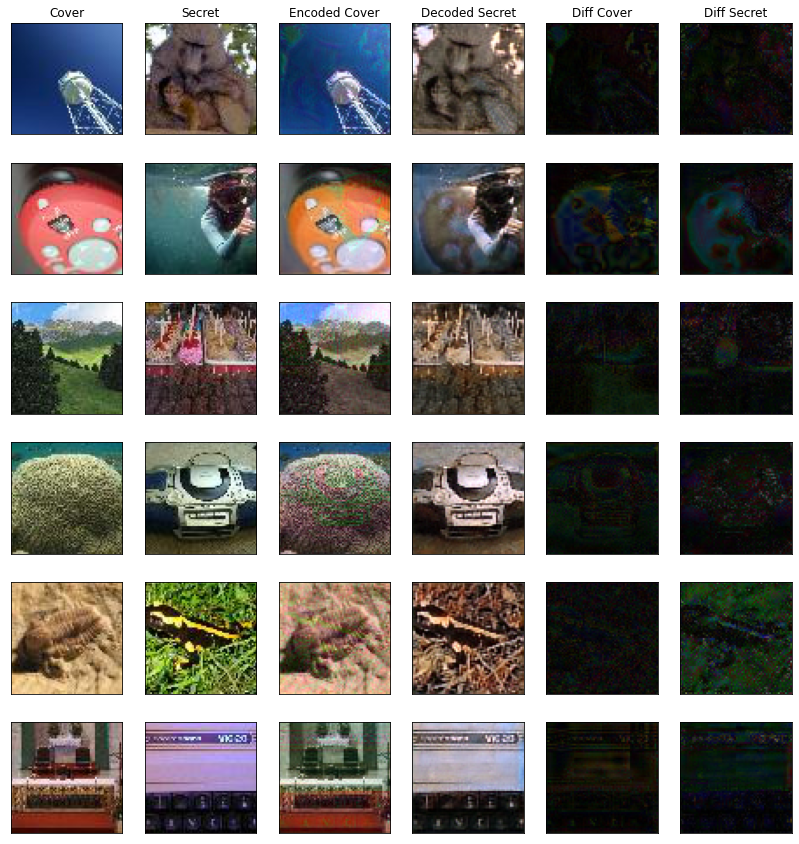

  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 41 | Batch:   0 of 1000. Loss AE    5163.04 | Loss Rev    2956.38:   3%|▎         | 1/32 [00:00<00:16,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 41 | Batch:  32 of 1000. Loss AE    4610.08 | Loss Rev    2646.51:   6%|▋         | 2/32 [00:01<00:15,  1.94it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 41 | Batch:  64 of 1000. Loss AE    4475.20 | Loss Rev    2605.71:   9%|▉         | 3/32 [00:01<00:14,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 41 | Batch:  96 of 1000. Loss AE    4337.85 | Loss Rev    2538.61:  12%|█▎        | 4/32 [00:02<00:14,  1.89it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 41 | Batch: 128 of 1000. Loss AE    4358.70 | Loss Rev    2544.64:  16%|█▌        | 5/32 [00:02<00:13,  1.96it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 41 | Batch: 160 of 1000. Loss AE    4431.71 | Loss Rev    2647.62:  19%|█▉        | 6/32 [00:03<00:13,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 41 | Batch: 192 of 1000. Loss AE    4378.23 | Loss Rev    2631.30:  22%|██▏       | 7/32 [00:03<00:12,  2.03it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 41 | Batch: 224 of 1000. Loss AE    4382.40 | Loss Rev    2636.88:  25%|██▌       | 8/32 [00:04<00:11,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 41 | Batch: 256 of 1000. Loss AE    4310.09 | Loss Rev    2598.56:  28%|██▊       | 9/32 [00:04<00:11,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 41 | Batch: 288 of 1000. Loss AE    4304.60 | Loss Rev    2600.63:  31%|███▏      | 10/32 [00:05<00:10,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 41 | Batch: 320 of 1000. Loss AE    4295.77 | Loss Rev    2588.72:  34%|███▍      | 11/32 [00:05<00:10,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 41 | Batch: 352 of 1000. Loss AE    4252.70 | Loss Rev    2570.55:  38%|███▊      | 12/32 [00:05<00:09,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 41 | Batch: 384 of 1000. Loss AE    4214.96 | Loss Rev    2554.24:  41%|████      | 13/32 [00:06<00:09,  2.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 41 | Batch: 416 of 1000. Loss AE    4245.20 | Loss Rev    2590.64:  44%|████▍     | 14/32 [00:06<00:08,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 41 | Batch: 448 of 1000. Loss AE    4331.34 | Loss Rev    2632.31:  47%|████▋     | 15/32 [00:07<00:08,  2.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 41 | Batch: 480 of 1000. Loss AE    4366.62 | Loss Rev    2656.27:  50%|█████     | 16/32 [00:07<00:07,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 41 | Batch: 512 of 1000. Loss AE    4339.49 | Loss Rev    2636.67:  53%|█████▎    | 17/32 [00:08<00:07,  2.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 41 | Batch: 544 of 1000. Loss AE    4296.88 | Loss Rev    2607.38:  56%|█████▋    | 18/32 [00:08<00:06,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 41 | Batch: 576 of 1000. Loss AE    4313.89 | Loss Rev    2617.73:  59%|█████▉    | 19/32 [00:09<00:06,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 41 | Batch: 608 of 1000. Loss AE    4320.68 | Loss Rev    2624.00:  62%|██████▎   | 20/32 [00:09<00:05,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 41 | Batch: 640 of 1000. Loss AE    4321.03 | Loss Rev    2623.20:  66%|██████▌   | 21/32 [00:10<00:05,  2.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 41 | Batch: 672 of 1000. Loss AE    4286.57 | Loss Rev    2595.57:  69%|██████▉   | 22/32 [00:10<00:04,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 41 | Batch: 704 of 1000. Loss AE    4299.82 | Loss Rev    2599.86:  72%|███████▏  | 23/32 [00:11<00:04,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 41 | Batch: 736 of 1000. Loss AE    4320.40 | Loss Rev    2620.94:  75%|███████▌  | 24/32 [00:11<00:03,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 41 | Batch: 768 of 1000. Loss AE    4340.62 | Loss Rev    2632.37:  78%|███████▊  | 25/32 [00:12<00:03,  2.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 41 | Batch: 800 of 1000. Loss AE    4336.07 | Loss Rev    2626.73:  81%|████████▏ | 26/32 [00:12<00:02,  2.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 41 | Batch: 832 of 1000. Loss AE    4308.75 | Loss Rev    2605.24:  84%|████████▍ | 27/32 [00:13<00:02,  2.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 41 | Batch: 864 of 1000. Loss AE    4293.69 | Loss Rev    2599.29:  88%|████████▊ | 28/32 [00:13<00:01,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 41 | Batch: 896 of 1000. Loss AE    4302.73 | Loss Rev    2597.21:  91%|█████████ | 29/32 [00:14<00:01,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 41 | Batch: 928 of 1000. Loss AE    4327.90 | Loss Rev    2615.13:  94%|█████████▍| 30/32 [00:14<00:00,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 41 | Batch: 960 of 1000. Loss AE    4332.49 | Loss Rev    2618.02:  97%|█████████▋| 31/32 [00:15<00:00,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 41 | Batch: 992 of 1000. Loss AE    4226.88 | Loss Rev    2553.07: 100%|██████████| 32/32 [00:15<00:00,  2.07it/s]


41


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 42 | Batch:   0 of 1000. Loss AE    4748.25 | Loss Rev    2958.13:   3%|▎         | 1/32 [00:00<00:15,  2.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 42 | Batch:  32 of 1000. Loss AE    4546.93 | Loss Rev    2920.80:   6%|▋         | 2/32 [00:00<00:14,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 42 | Batch:  64 of 1000. Loss AE    4602.06 | Loss Rev    3101.29:   9%|▉         | 3/32 [00:01<00:14,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 42 | Batch:  96 of 1000. Loss AE    4614.06 | Loss Rev    3068.67:  12%|█▎        | 4/32 [00:01<00:13,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 42 | Batch: 128 of 1000. Loss AE    4550.86 | Loss Rev    2928.64:  16%|█▌        | 5/32 [00:02<00:13,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 42 | Batch: 160 of 1000. Loss AE    4486.90 | Loss Rev    2856.91:  19%|█▉        | 6/32 [00:02<00:12,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 42 | Batch: 192 of 1000. Loss AE    4582.19 | Loss Rev    2869.99:  22%|██▏       | 7/32 [00:03<00:12,  2.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 42 | Batch: 224 of 1000. Loss AE    4570.14 | Loss Rev    2823.29:  25%|██▌       | 8/32 [00:03<00:11,  2.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 42 | Batch: 256 of 1000. Loss AE    4638.42 | Loss Rev    2907.82:  28%|██▊       | 9/32 [00:04<00:11,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 42 | Batch: 288 of 1000. Loss AE    4825.65 | Loss Rev    3113.90:  31%|███▏      | 10/32 [00:04<00:10,  2.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 42 | Batch: 320 of 1000. Loss AE    5177.40 | Loss Rev    3424.87:  34%|███▍      | 11/32 [00:05<00:10,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 42 | Batch: 352 of 1000. Loss AE    5222.90 | Loss Rev    3472.97:  38%|███▊      | 12/32 [00:05<00:09,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 42 | Batch: 384 of 1000. Loss AE    5088.23 | Loss Rev    3368.40:  41%|████      | 13/32 [00:06<00:09,  2.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 42 | Batch: 416 of 1000. Loss AE    5140.70 | Loss Rev    3413.35:  44%|████▍     | 14/32 [00:06<00:08,  2.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 42 | Batch: 448 of 1000. Loss AE    5140.34 | Loss Rev    3403.43:  47%|████▋     | 15/32 [00:07<00:08,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 42 | Batch: 480 of 1000. Loss AE    5116.82 | Loss Rev    3372.05:  50%|█████     | 16/32 [00:07<00:07,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 42 | Batch: 512 of 1000. Loss AE    5064.41 | Loss Rev    3339.42:  53%|█████▎    | 17/32 [00:08<00:07,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 42 | Batch: 544 of 1000. Loss AE    5062.86 | Loss Rev    3324.09:  56%|█████▋    | 18/32 [00:08<00:06,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 42 | Batch: 576 of 1000. Loss AE    5073.35 | Loss Rev    3309.67:  59%|█████▉    | 19/32 [00:09<00:06,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 42 | Batch: 608 of 1000. Loss AE    5048.59 | Loss Rev    3289.00:  62%|██████▎   | 20/32 [00:09<00:05,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 42 | Batch: 640 of 1000. Loss AE    5032.06 | Loss Rev    3257.47:  66%|██████▌   | 21/32 [00:10<00:05,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 42 | Batch: 672 of 1000. Loss AE    5026.00 | Loss Rev    3244.27:  69%|██████▉   | 22/32 [00:10<00:04,  2.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 42 | Batch: 704 of 1000. Loss AE    5004.45 | Loss Rev    3210.88:  72%|███████▏  | 23/32 [00:11<00:04,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 42 | Batch: 736 of 1000. Loss AE    4983.90 | Loss Rev    3179.59:  75%|███████▌  | 24/32 [00:11<00:03,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 42 | Batch: 768 of 1000. Loss AE    4957.00 | Loss Rev    3150.35:  78%|███████▊  | 25/32 [00:12<00:03,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 42 | Batch: 800 of 1000. Loss AE    4934.79 | Loss Rev    3125.70:  81%|████████▏ | 26/32 [00:12<00:02,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 42 | Batch: 832 of 1000. Loss AE    4884.35 | Loss Rev    3085.90:  84%|████████▍ | 27/32 [00:13<00:02,  2.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 42 | Batch: 864 of 1000. Loss AE    4880.35 | Loss Rev    3076.04:  88%|████████▊ | 28/32 [00:13<00:01,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 42 | Batch: 896 of 1000. Loss AE    4860.21 | Loss Rev    3057.83:  91%|█████████ | 29/32 [00:14<00:01,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 42 | Batch: 928 of 1000. Loss AE    4838.36 | Loss Rev    3039.20:  94%|█████████▍| 30/32 [00:14<00:01,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 42 | Batch: 960 of 1000. Loss AE    4820.56 | Loss Rev    3032.47:  97%|█████████▋| 31/32 [00:15<00:00,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 42 | Batch: 992 of 1000. Loss AE    4716.61 | Loss Rev    2967.57: 100%|██████████| 32/32 [00:15<00:00,  2.07it/s]


42


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 43 | Batch:   0 of 1000. Loss AE    4650.52 | Loss Rev    2895.04:   3%|▎         | 1/32 [00:00<00:14,  2.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 43 | Batch:  32 of 1000. Loss AE    5149.43 | Loss Rev    3085.58:   6%|▋         | 2/32 [00:00<00:14,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 43 | Batch:  64 of 1000. Loss AE    5135.87 | Loss Rev    3180.46:   9%|▉         | 3/32 [00:01<00:14,  1.94it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 43 | Batch:  96 of 1000. Loss AE    4835.67 | Loss Rev    2996.12:  12%|█▎        | 4/32 [00:02<00:14,  1.97it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 43 | Batch: 128 of 1000. Loss AE    4945.70 | Loss Rev    3111.71:  16%|█▌        | 5/32 [00:02<00:13,  1.99it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 43 | Batch: 160 of 1000. Loss AE    4988.56 | Loss Rev    3136.51:  19%|█▉        | 6/32 [00:03<00:13,  2.00it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 43 | Batch: 192 of 1000. Loss AE    4867.25 | Loss Rev    3031.07:  22%|██▏       | 7/32 [00:03<00:12,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 43 | Batch: 224 of 1000. Loss AE    4943.33 | Loss Rev    3082.88:  25%|██▌       | 8/32 [00:03<00:11,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 43 | Batch: 256 of 1000. Loss AE    5048.48 | Loss Rev    3139.66:  28%|██▊       | 9/32 [00:04<00:11,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 43 | Batch: 288 of 1000. Loss AE    5106.48 | Loss Rev    3141.38:  31%|███▏      | 10/32 [00:04<00:10,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 43 | Batch: 320 of 1000. Loss AE    5019.68 | Loss Rev    3083.06:  34%|███▍      | 11/32 [00:05<00:10,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 43 | Batch: 352 of 1000. Loss AE    4980.85 | Loss Rev    3036.26:  38%|███▊      | 12/32 [00:05<00:09,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 43 | Batch: 384 of 1000. Loss AE    4879.14 | Loss Rev    2966.19:  41%|████      | 13/32 [00:06<00:09,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 43 | Batch: 416 of 1000. Loss AE    4920.50 | Loss Rev    3009.61:  44%|████▍     | 14/32 [00:06<00:09,  1.94it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 43 | Batch: 448 of 1000. Loss AE    4960.34 | Loss Rev    3044.64:  47%|████▋     | 15/32 [00:07<00:08,  1.97it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 43 | Batch: 480 of 1000. Loss AE    4914.41 | Loss Rev    3001.87:  50%|█████     | 16/32 [00:07<00:08,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 43 | Batch: 512 of 1000. Loss AE    4882.04 | Loss Rev    2979.92:  53%|█████▎    | 17/32 [00:08<00:07,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 43 | Batch: 544 of 1000. Loss AE    4888.46 | Loss Rev    2997.00:  56%|█████▋    | 18/32 [00:08<00:06,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 43 | Batch: 576 of 1000. Loss AE    4833.80 | Loss Rev    2957.02:  59%|█████▉    | 19/32 [00:09<00:06,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 43 | Batch: 608 of 1000. Loss AE    4786.64 | Loss Rev    2921.56:  62%|██████▎   | 20/32 [00:09<00:05,  2.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 43 | Batch: 640 of 1000. Loss AE    4753.71 | Loss Rev    2898.90:  66%|██████▌   | 21/32 [00:10<00:05,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 43 | Batch: 672 of 1000. Loss AE    4717.89 | Loss Rev    2865.90:  69%|██████▉   | 22/32 [00:10<00:04,  2.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 43 | Batch: 704 of 1000. Loss AE    4663.40 | Loss Rev    2822.17:  72%|███████▏  | 23/32 [00:11<00:04,  2.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 43 | Batch: 736 of 1000. Loss AE    4625.51 | Loss Rev    2792.19:  75%|███████▌  | 24/32 [00:11<00:03,  2.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 43 | Batch: 768 of 1000. Loss AE    4613.30 | Loss Rev    2778.81:  78%|███████▊  | 25/32 [00:12<00:03,  2.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 43 | Batch: 800 of 1000. Loss AE    4589.74 | Loss Rev    2765.91:  81%|████████▏ | 26/32 [00:12<00:02,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 43 | Batch: 832 of 1000. Loss AE    4570.85 | Loss Rev    2748.67:  84%|████████▍ | 27/32 [00:13<00:02,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 43 | Batch: 864 of 1000. Loss AE    4575.41 | Loss Rev    2741.63:  88%|████████▊ | 28/32 [00:13<00:01,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 43 | Batch: 896 of 1000. Loss AE    4563.35 | Loss Rev    2727.23:  91%|█████████ | 29/32 [00:14<00:01,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 43 | Batch: 928 of 1000. Loss AE    4556.73 | Loss Rev    2717.23:  94%|█████████▍| 30/32 [00:14<00:00,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 43 | Batch: 960 of 1000. Loss AE    4539.72 | Loss Rev    2704.96:  97%|█████████▋| 31/32 [00:15<00:00,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 43 | Batch: 992 of 1000. Loss AE    4424.19 | Loss Rev    2635.60: 100%|██████████| 32/32 [00:15<00:00,  2.07it/s]


43


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 44 | Batch:   0 of 1000. Loss AE    4456.69 | Loss Rev    2794.21:   3%|▎         | 1/32 [00:00<00:14,  2.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 44 | Batch:  32 of 1000. Loss AE    4264.86 | Loss Rev    2774.74:   6%|▋         | 2/32 [00:00<00:14,  2.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 44 | Batch:  64 of 1000. Loss AE    4084.92 | Loss Rev    2578.97:   9%|▉         | 3/32 [00:01<00:14,  2.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 44 | Batch:  96 of 1000. Loss AE    4294.43 | Loss Rev    2736.17:  12%|█▎        | 4/32 [00:01<00:13,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 44 | Batch: 128 of 1000. Loss AE    4193.19 | Loss Rev    2678.89:  16%|█▌        | 5/32 [00:02<00:13,  2.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 44 | Batch: 160 of 1000. Loss AE    4303.63 | Loss Rev    2732.19:  19%|█▉        | 6/32 [00:02<00:12,  2.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 44 | Batch: 192 of 1000. Loss AE    4361.18 | Loss Rev    2761.07:  22%|██▏       | 7/32 [00:03<00:12,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 44 | Batch: 224 of 1000. Loss AE    4339.50 | Loss Rev    2747.95:  25%|██▌       | 8/32 [00:03<00:11,  2.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 44 | Batch: 256 of 1000. Loss AE    4284.41 | Loss Rev    2690.68:  28%|██▊       | 9/32 [00:04<00:11,  2.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 44 | Batch: 288 of 1000. Loss AE    4265.16 | Loss Rev    2672.00:  31%|███▏      | 10/32 [00:04<00:10,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 44 | Batch: 320 of 1000. Loss AE    4249.62 | Loss Rev    2644.00:  34%|███▍      | 11/32 [00:05<00:10,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 44 | Batch: 352 of 1000. Loss AE    4246.72 | Loss Rev    2646.34:  38%|███▊      | 12/32 [00:05<00:09,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 44 | Batch: 384 of 1000. Loss AE    4263.09 | Loss Rev    2634.04:  41%|████      | 13/32 [00:06<00:09,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 44 | Batch: 416 of 1000. Loss AE    4237.93 | Loss Rev    2626.50:  44%|████▍     | 14/32 [00:06<00:08,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 44 | Batch: 448 of 1000. Loss AE    4193.29 | Loss Rev    2594.48:  47%|████▋     | 15/32 [00:07<00:08,  2.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 44 | Batch: 480 of 1000. Loss AE    4213.39 | Loss Rev    2573.55:  50%|█████     | 16/32 [00:07<00:07,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 44 | Batch: 512 of 1000. Loss AE    4210.05 | Loss Rev    2572.81:  53%|█████▎    | 17/32 [00:08<00:07,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 44 | Batch: 544 of 1000. Loss AE    4223.82 | Loss Rev    2574.47:  56%|█████▋    | 18/32 [00:08<00:06,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 44 | Batch: 576 of 1000. Loss AE    4194.20 | Loss Rev    2550.81:  59%|█████▉    | 19/32 [00:09<00:06,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 44 | Batch: 608 of 1000. Loss AE    4178.31 | Loss Rev    2534.67:  62%|██████▎   | 20/32 [00:09<00:05,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 44 | Batch: 640 of 1000. Loss AE    4198.99 | Loss Rev    2524.58:  66%|██████▌   | 21/32 [00:10<00:05,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 44 | Batch: 672 of 1000. Loss AE    4176.99 | Loss Rev    2506.00:  69%|██████▉   | 22/32 [00:10<00:04,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 44 | Batch: 704 of 1000. Loss AE    4171.34 | Loss Rev    2488.63:  72%|███████▏  | 23/32 [00:11<00:04,  2.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 44 | Batch: 736 of 1000. Loss AE    4186.40 | Loss Rev    2492.64:  75%|███████▌  | 24/32 [00:11<00:03,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 44 | Batch: 768 of 1000. Loss AE    4169.06 | Loss Rev    2479.71:  78%|███████▊  | 25/32 [00:12<00:03,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 44 | Batch: 800 of 1000. Loss AE    4175.60 | Loss Rev    2482.62:  81%|████████▏ | 26/32 [00:12<00:02,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 44 | Batch: 832 of 1000. Loss AE    4192.54 | Loss Rev    2492.54:  84%|████████▍ | 27/32 [00:13<00:02,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 44 | Batch: 864 of 1000. Loss AE    4195.21 | Loss Rev    2500.60:  88%|████████▊ | 28/32 [00:13<00:01,  2.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 44 | Batch: 896 of 1000. Loss AE    4158.82 | Loss Rev    2470.41:  91%|█████████ | 29/32 [00:14<00:01,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 44 | Batch: 928 of 1000. Loss AE    4137.35 | Loss Rev    2449.77:  94%|█████████▍| 30/32 [00:14<00:00,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 44 | Batch: 960 of 1000. Loss AE    4134.25 | Loss Rev    2441.79:  97%|█████████▋| 31/32 [00:15<00:00,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 44 | Batch: 992 of 1000. Loss AE    4037.96 | Loss Rev    2384.18: 100%|██████████| 32/32 [00:15<00:00,  2.08it/s]


44


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 45 | Batch:   0 of 1000. Loss AE    4876.43 | Loss Rev    3193.95:   3%|▎         | 1/32 [00:00<00:15,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 45 | Batch:  32 of 1000. Loss AE    5559.74 | Loss Rev    3964.69:   6%|▋         | 2/32 [00:00<00:14,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 45 | Batch:  64 of 1000. Loss AE    6739.86 | Loss Rev    5054.59:   9%|▉         | 3/32 [00:01<00:14,  2.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 45 | Batch:  96 of 1000. Loss AE    6607.98 | Loss Rev    4889.15:  12%|█▎        | 4/32 [00:01<00:13,  2.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 45 | Batch: 128 of 1000. Loss AE    6277.83 | Loss Rev    4441.52:  16%|█▌        | 5/32 [00:02<00:13,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 45 | Batch: 160 of 1000. Loss AE    5994.62 | Loss Rev    4148.55:  19%|█▉        | 6/32 [00:02<00:12,  2.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 45 | Batch: 192 of 1000. Loss AE    5819.29 | Loss Rev    3969.21:  22%|██▏       | 7/32 [00:03<00:12,  2.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 45 | Batch: 224 of 1000. Loss AE    5645.38 | Loss Rev    3798.10:  25%|██▌       | 8/32 [00:03<00:11,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 45 | Batch: 256 of 1000. Loss AE    5503.71 | Loss Rev    3639.66:  28%|██▊       | 9/32 [00:04<00:11,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 45 | Batch: 288 of 1000. Loss AE    5357.34 | Loss Rev    3503.09:  31%|███▏      | 10/32 [00:04<00:10,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 45 | Batch: 320 of 1000. Loss AE    5242.53 | Loss Rev    3373.50:  34%|███▍      | 11/32 [00:05<00:10,  2.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 45 | Batch: 352 of 1000. Loss AE    5188.36 | Loss Rev    3341.94:  38%|███▊      | 12/32 [00:05<00:09,  2.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 45 | Batch: 384 of 1000. Loss AE    5148.21 | Loss Rev    3284.67:  41%|████      | 13/32 [00:06<00:09,  1.97it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 45 | Batch: 416 of 1000. Loss AE    5043.17 | Loss Rev    3194.18:  44%|████▍     | 14/32 [00:06<00:09,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 45 | Batch: 448 of 1000. Loss AE    4979.71 | Loss Rev    3144.95:  47%|████▋     | 15/32 [00:07<00:08,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 45 | Batch: 480 of 1000. Loss AE    4948.46 | Loss Rev    3109.35:  50%|█████     | 16/32 [00:07<00:07,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 45 | Batch: 512 of 1000. Loss AE    4876.89 | Loss Rev    3041.04:  53%|█████▎    | 17/32 [00:08<00:07,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 45 | Batch: 544 of 1000. Loss AE    4832.71 | Loss Rev    2991.18:  56%|█████▋    | 18/32 [00:08<00:06,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 45 | Batch: 576 of 1000. Loss AE    4808.97 | Loss Rev    2940.39:  59%|█████▉    | 19/32 [00:09<00:06,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 45 | Batch: 608 of 1000. Loss AE    4757.30 | Loss Rev    2901.63:  62%|██████▎   | 20/32 [00:09<00:05,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 45 | Batch: 640 of 1000. Loss AE    4742.64 | Loss Rev    2882.52:  66%|██████▌   | 21/32 [00:10<00:05,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 45 | Batch: 672 of 1000. Loss AE    4737.51 | Loss Rev    2870.35:  69%|██████▉   | 22/32 [00:10<00:04,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 45 | Batch: 704 of 1000. Loss AE    4712.66 | Loss Rev    2842.75:  72%|███████▏  | 23/32 [00:11<00:04,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 45 | Batch: 736 of 1000. Loss AE    4675.14 | Loss Rev    2805.97:  75%|███████▌  | 24/32 [00:11<00:03,  2.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 45 | Batch: 768 of 1000. Loss AE    4647.74 | Loss Rev    2783.61:  78%|███████▊  | 25/32 [00:12<00:03,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 45 | Batch: 800 of 1000. Loss AE    4622.72 | Loss Rev    2767.76:  81%|████████▏ | 26/32 [00:12<00:02,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 45 | Batch: 832 of 1000. Loss AE    4615.34 | Loss Rev    2750.13:  84%|████████▍ | 27/32 [00:13<00:02,  2.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 45 | Batch: 864 of 1000. Loss AE    4612.95 | Loss Rev    2742.70:  88%|████████▊ | 28/32 [00:13<00:01,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 45 | Batch: 896 of 1000. Loss AE    4603.16 | Loss Rev    2730.69:  91%|█████████ | 29/32 [00:14<00:01,  2.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 45 | Batch: 928 of 1000. Loss AE    4586.14 | Loss Rev    2717.85:  94%|█████████▍| 30/32 [00:14<00:00,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 45 | Batch: 960 of 1000. Loss AE    4559.71 | Loss Rev    2699.26:  97%|█████████▋| 31/32 [00:15<00:00,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 45 | Batch: 992 of 1000. Loss AE    4448.30 | Loss Rev    2635.62: 100%|██████████| 32/32 [00:15<00:00,  2.06it/s]


45


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 46 | Batch:   0 of 1000. Loss AE    4677.52 | Loss Rev    2702.97:   3%|▎         | 1/32 [00:00<00:18,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 46 | Batch:  32 of 1000. Loss AE    4739.80 | Loss Rev    2735.98:   6%|▋         | 2/32 [00:01<00:16,  1.87it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 46 | Batch:  64 of 1000. Loss AE    4442.41 | Loss Rev    2570.99:   9%|▉         | 3/32 [00:01<00:14,  1.95it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 46 | Batch:  96 of 1000. Loss AE    4523.53 | Loss Rev    2691.51:  12%|█▎        | 4/32 [00:02<00:14,  1.95it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 46 | Batch: 128 of 1000. Loss AE    4440.07 | Loss Rev    2660.86:  16%|█▌        | 5/32 [00:02<00:13,  1.93it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 46 | Batch: 160 of 1000. Loss AE    4487.90 | Loss Rev    2762.40:  19%|█▉        | 6/32 [00:03<00:13,  1.95it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 46 | Batch: 192 of 1000. Loss AE    4570.20 | Loss Rev    2817.70:  22%|██▏       | 7/32 [00:03<00:12,  1.98it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 46 | Batch: 224 of 1000. Loss AE    4539.15 | Loss Rev    2769.50:  25%|██▌       | 8/32 [00:04<00:12,  1.96it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 46 | Batch: 256 of 1000. Loss AE    4522.47 | Loss Rev    2746.45:  28%|██▊       | 9/32 [00:04<00:11,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 46 | Batch: 288 of 1000. Loss AE    4577.25 | Loss Rev    2788.29:  31%|███▏      | 10/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 46 | Batch: 320 of 1000. Loss AE    4472.96 | Loss Rev    2716.31:  34%|███▍      | 11/32 [00:05<00:10,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 46 | Batch: 352 of 1000. Loss AE    4503.28 | Loss Rev    2723.81:  38%|███▊      | 12/32 [00:06<00:09,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 46 | Batch: 384 of 1000. Loss AE    4484.81 | Loss Rev    2719.97:  41%|████      | 13/32 [00:06<00:09,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 46 | Batch: 416 of 1000. Loss AE    4452.42 | Loss Rev    2721.49:  44%|████▍     | 14/32 [00:07<00:08,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 46 | Batch: 448 of 1000. Loss AE    4427.94 | Loss Rev    2690.66:  47%|████▋     | 15/32 [00:07<00:08,  2.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 46 | Batch: 480 of 1000. Loss AE    4424.48 | Loss Rev    2689.41:  50%|█████     | 16/32 [00:08<00:07,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 46 | Batch: 512 of 1000. Loss AE    4419.52 | Loss Rev    2699.20:  53%|█████▎    | 17/32 [00:08<00:07,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 46 | Batch: 544 of 1000. Loss AE    4378.78 | Loss Rev    2671.94:  56%|█████▋    | 18/32 [00:09<00:06,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 46 | Batch: 576 of 1000. Loss AE    4343.26 | Loss Rev    2647.11:  59%|█████▉    | 19/32 [00:09<00:06,  2.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 46 | Batch: 608 of 1000. Loss AE    4340.89 | Loss Rev    2647.09:  62%|██████▎   | 20/32 [00:09<00:05,  2.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 46 | Batch: 640 of 1000. Loss AE    4328.71 | Loss Rev    2637.31:  66%|██████▌   | 21/32 [00:10<00:05,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 46 | Batch: 672 of 1000. Loss AE    4335.49 | Loss Rev    2642.75:  69%|██████▉   | 22/32 [00:10<00:04,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 46 | Batch: 704 of 1000. Loss AE    4328.28 | Loss Rev    2627.07:  72%|███████▏  | 23/32 [00:11<00:04,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 46 | Batch: 736 of 1000. Loss AE    4292.74 | Loss Rev    2602.64:  75%|███████▌  | 24/32 [00:11<00:03,  2.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 46 | Batch: 768 of 1000. Loss AE    4292.39 | Loss Rev    2598.95:  78%|███████▊  | 25/32 [00:12<00:03,  1.99it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 46 | Batch: 800 of 1000. Loss AE    4287.06 | Loss Rev    2593.97:  81%|████████▏ | 26/32 [00:12<00:02,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 46 | Batch: 832 of 1000. Loss AE    4255.91 | Loss Rev    2571.48:  84%|████████▍ | 27/32 [00:13<00:02,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 46 | Batch: 864 of 1000. Loss AE    4248.57 | Loss Rev    2573.06:  88%|████████▊ | 28/32 [00:14<00:02,  1.98it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 46 | Batch: 896 of 1000. Loss AE    4251.00 | Loss Rev    2560.94:  91%|█████████ | 29/32 [00:14<00:01,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 46 | Batch: 928 of 1000. Loss AE    4220.27 | Loss Rev    2525.68:  94%|█████████▍| 30/32 [00:14<00:00,  2.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 46 | Batch: 960 of 1000. Loss AE    4195.81 | Loss Rev    2507.87:  97%|█████████▋| 31/32 [00:15<00:00,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 46 | Batch: 992 of 1000. Loss AE    4099.94 | Loss Rev    2448.44: 100%|██████████| 32/32 [00:15<00:00,  2.04it/s]


46


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 47 | Batch:   0 of 1000. Loss AE    4680.21 | Loss Rev    2895.99:   3%|▎         | 1/32 [00:00<00:15,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 47 | Batch:  32 of 1000. Loss AE    4584.80 | Loss Rev    2962.47:   6%|▋         | 2/32 [00:00<00:14,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 47 | Batch:  64 of 1000. Loss AE    4759.42 | Loss Rev    2965.80:   9%|▉         | 3/32 [00:01<00:14,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 47 | Batch:  96 of 1000. Loss AE    4461.78 | Loss Rev    2774.06:  12%|█▎        | 4/32 [00:01<00:13,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 47 | Batch: 128 of 1000. Loss AE    4405.87 | Loss Rev    2787.02:  16%|█▌        | 5/32 [00:02<00:13,  2.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 47 | Batch: 160 of 1000. Loss AE    4371.94 | Loss Rev    2733.47:  19%|█▉        | 6/32 [00:02<00:12,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 47 | Batch: 192 of 1000. Loss AE    4262.83 | Loss Rev    2659.43:  22%|██▏       | 7/32 [00:03<00:12,  2.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 47 | Batch: 224 of 1000. Loss AE    4198.04 | Loss Rev    2560.83:  25%|██▌       | 8/32 [00:03<00:11,  2.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 47 | Batch: 256 of 1000. Loss AE    4308.99 | Loss Rev    2664.26:  28%|██▊       | 9/32 [00:04<00:11,  1.99it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 47 | Batch: 288 of 1000. Loss AE    4360.38 | Loss Rev    2717.54:  31%|███▏      | 10/32 [00:05<00:11,  1.83it/s]

1/1 [==============================] - 0s 74ms/step


Epoch 47 | Batch: 320 of 1000. Loss AE    4368.09 | Loss Rev    2693.49:  34%|███▍      | 11/32 [00:05<00:11,  1.75it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 47 | Batch: 352 of 1000. Loss AE    4331.37 | Loss Rev    2670.91:  38%|███▊      | 12/32 [00:06<00:11,  1.71it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 47 | Batch: 384 of 1000. Loss AE    4288.02 | Loss Rev    2640.93:  41%|████      | 13/32 [00:06<00:10,  1.76it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 47 | Batch: 416 of 1000. Loss AE    4256.38 | Loss Rev    2612.28:  44%|████▍     | 14/32 [00:07<00:10,  1.70it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 47 | Batch: 448 of 1000. Loss AE    4230.51 | Loss Rev    2577.75:  47%|████▋     | 15/32 [00:08<00:09,  1.70it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 47 | Batch: 480 of 1000. Loss AE    4265.96 | Loss Rev    2588.22:  50%|█████     | 16/32 [00:08<00:09,  1.72it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 47 | Batch: 512 of 1000. Loss AE    4261.73 | Loss Rev    2590.32:  53%|█████▎    | 17/32 [00:09<00:08,  1.80it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 47 | Batch: 544 of 1000. Loss AE    4262.91 | Loss Rev    2583.89:  56%|█████▋    | 18/32 [00:09<00:08,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 47 | Batch: 576 of 1000. Loss AE    4215.47 | Loss Rev    2543.62:  59%|█████▉    | 19/32 [00:10<00:07,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 47 | Batch: 608 of 1000. Loss AE    4180.20 | Loss Rev    2513.26:  62%|██████▎   | 20/32 [00:10<00:06,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 47 | Batch: 640 of 1000. Loss AE    4152.69 | Loss Rev    2479.56:  66%|██████▌   | 21/32 [00:11<00:05,  1.91it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 47 | Batch: 672 of 1000. Loss AE    4146.73 | Loss Rev    2481.89:  69%|██████▉   | 22/32 [00:11<00:05,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 47 | Batch: 704 of 1000. Loss AE    4152.68 | Loss Rev    2482.21:  72%|███████▏  | 23/32 [00:12<00:04,  1.96it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 47 | Batch: 736 of 1000. Loss AE    4151.22 | Loss Rev    2485.67:  75%|███████▌  | 24/32 [00:12<00:04,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 47 | Batch: 768 of 1000. Loss AE    4150.07 | Loss Rev    2488.66:  78%|███████▊  | 25/32 [00:13<00:03,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 47 | Batch: 800 of 1000. Loss AE    4156.81 | Loss Rev    2483.95:  81%|████████▏ | 26/32 [00:13<00:02,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 47 | Batch: 832 of 1000. Loss AE    4176.26 | Loss Rev    2501.69:  84%|████████▍ | 27/32 [00:14<00:02,  2.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 47 | Batch: 864 of 1000. Loss AE    4186.40 | Loss Rev    2517.63:  88%|████████▊ | 28/32 [00:14<00:01,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 47 | Batch: 896 of 1000. Loss AE    4185.88 | Loss Rev    2520.35:  91%|█████████ | 29/32 [00:15<00:01,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 47 | Batch: 928 of 1000. Loss AE    4162.57 | Loss Rev    2499.10:  94%|█████████▍| 30/32 [00:15<00:00,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 47 | Batch: 960 of 1000. Loss AE    4163.55 | Loss Rev    2495.62:  97%|█████████▋| 31/32 [00:16<00:00,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 47 | Batch: 992 of 1000. Loss AE    4067.58 | Loss Rev    2439.33: 100%|██████████| 32/32 [00:16<00:00,  1.95it/s]


47


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 48 | Batch:   0 of 1000. Loss AE    5029.49 | Loss Rev    3494.85:   3%|▎         | 1/32 [00:00<00:15,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 48 | Batch:  32 of 1000. Loss AE    6510.86 | Loss Rev    4936.21:   6%|▋         | 2/32 [00:01<00:15,  1.98it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 48 | Batch:  64 of 1000. Loss AE    6382.70 | Loss Rev    4675.90:   9%|▉         | 3/32 [00:01<00:14,  2.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 48 | Batch:  96 of 1000. Loss AE    6018.34 | Loss Rev    4212.07:  12%|█▎        | 4/32 [00:01<00:13,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 48 | Batch: 128 of 1000. Loss AE    6373.03 | Loss Rev    4479.33:  16%|█▌        | 5/32 [00:02<00:13,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 48 | Batch: 160 of 1000. Loss AE    6029.26 | Loss Rev    4183.38:  19%|█▉        | 6/32 [00:03<00:13,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 48 | Batch: 192 of 1000. Loss AE    5707.33 | Loss Rev    3916.71:  22%|██▏       | 7/32 [00:03<00:12,  1.95it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 48 | Batch: 224 of 1000. Loss AE    5633.12 | Loss Rev    3866.41:  25%|██▌       | 8/32 [00:04<00:12,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 48 | Batch: 256 of 1000. Loss AE    5551.46 | Loss Rev    3775.51:  28%|██▊       | 9/32 [00:04<00:11,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 48 | Batch: 288 of 1000. Loss AE    5594.03 | Loss Rev    3804.26:  31%|███▏      | 10/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 48 | Batch: 320 of 1000. Loss AE    5622.29 | Loss Rev    3772.07:  34%|███▍      | 11/32 [00:05<00:10,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 48 | Batch: 352 of 1000. Loss AE    5511.58 | Loss Rev    3693.05:  38%|███▊      | 12/32 [00:06<00:09,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 48 | Batch: 384 of 1000. Loss AE    5514.51 | Loss Rev    3692.79:  41%|████      | 13/32 [00:06<00:09,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 48 | Batch: 416 of 1000. Loss AE    5515.73 | Loss Rev    3665.84:  44%|████▍     | 14/32 [00:06<00:08,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 48 | Batch: 448 of 1000. Loss AE    5462.58 | Loss Rev    3608.22:  47%|████▋     | 15/32 [00:07<00:08,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 48 | Batch: 480 of 1000. Loss AE    5460.01 | Loss Rev    3567.12:  50%|█████     | 16/32 [00:07<00:07,  2.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 48 | Batch: 512 of 1000. Loss AE    5409.59 | Loss Rev    3501.60:  53%|█████▎    | 17/32 [00:08<00:07,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 48 | Batch: 544 of 1000. Loss AE    5398.94 | Loss Rev    3469.99:  56%|█████▋    | 18/32 [00:08<00:06,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 48 | Batch: 576 of 1000. Loss AE    5352.14 | Loss Rev    3413.05:  59%|█████▉    | 19/32 [00:09<00:06,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 48 | Batch: 608 of 1000. Loss AE    5277.50 | Loss Rev    3347.56:  62%|██████▎   | 20/32 [00:09<00:05,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 48 | Batch: 640 of 1000. Loss AE    5237.97 | Loss Rev    3305.25:  66%|██████▌   | 21/32 [00:10<00:05,  2.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 48 | Batch: 672 of 1000. Loss AE    5204.34 | Loss Rev    3274.78:  69%|██████▉   | 22/32 [00:10<00:04,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 48 | Batch: 704 of 1000. Loss AE    5157.82 | Loss Rev    3228.95:  72%|███████▏  | 23/32 [00:11<00:04,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 48 | Batch: 736 of 1000. Loss AE    5114.48 | Loss Rev    3192.53:  75%|███████▌  | 24/32 [00:11<00:03,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 48 | Batch: 768 of 1000. Loss AE    5053.82 | Loss Rev    3145.63:  78%|███████▊  | 25/32 [00:12<00:03,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 48 | Batch: 800 of 1000. Loss AE    5006.71 | Loss Rev    3108.81:  81%|████████▏ | 26/32 [00:12<00:02,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 48 | Batch: 832 of 1000. Loss AE    4986.97 | Loss Rev    3095.02:  84%|████████▍ | 27/32 [00:13<00:02,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 48 | Batch: 864 of 1000. Loss AE    4953.90 | Loss Rev    3071.22:  88%|████████▊ | 28/32 [00:13<00:01,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 48 | Batch: 896 of 1000. Loss AE    4933.29 | Loss Rev    3054.01:  91%|█████████ | 29/32 [00:14<00:01,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 48 | Batch: 928 of 1000. Loss AE    4904.45 | Loss Rev    3021.85:  94%|█████████▍| 30/32 [00:14<00:01,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 48 | Batch: 960 of 1000. Loss AE    4893.32 | Loss Rev    3006.35:  97%|█████████▋| 31/32 [00:15<00:00,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 48 | Batch: 992 of 1000. Loss AE    4767.52 | Loss Rev    2928.59: 100%|██████████| 32/32 [00:15<00:00,  2.06it/s]


48


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 49 | Batch:   0 of 1000. Loss AE    4417.60 | Loss Rev    2700.25:   3%|▎         | 1/32 [00:00<00:15,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 49 | Batch:  32 of 1000. Loss AE    5085.09 | Loss Rev    3133.06:   6%|▋         | 2/32 [00:00<00:14,  2.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 49 | Batch:  64 of 1000. Loss AE    4756.56 | Loss Rev    2908.76:   9%|▉         | 3/32 [00:01<00:14,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 49 | Batch:  96 of 1000. Loss AE    4733.51 | Loss Rev    2894.78:  12%|█▎        | 4/32 [00:01<00:13,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 49 | Batch: 128 of 1000. Loss AE    4747.64 | Loss Rev    2947.18:  16%|█▌        | 5/32 [00:02<00:13,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 49 | Batch: 160 of 1000. Loss AE    4612.94 | Loss Rev    2854.20:  19%|█▉        | 6/32 [00:02<00:12,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 49 | Batch: 192 of 1000. Loss AE    4801.15 | Loss Rev    3003.24:  22%|██▏       | 7/32 [00:03<00:12,  2.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 49 | Batch: 224 of 1000. Loss AE    4695.37 | Loss Rev    2931.83:  25%|██▌       | 8/32 [00:03<00:11,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 49 | Batch: 256 of 1000. Loss AE    4766.63 | Loss Rev    2957.26:  28%|██▊       | 9/32 [00:04<00:11,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 49 | Batch: 288 of 1000. Loss AE    4828.21 | Loss Rev    3004.65:  31%|███▏      | 10/32 [00:04<00:10,  2.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 49 | Batch: 320 of 1000. Loss AE    4680.46 | Loss Rev    2898.75:  34%|███▍      | 11/32 [00:05<00:10,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 49 | Batch: 352 of 1000. Loss AE    4701.50 | Loss Rev    2914.38:  38%|███▊      | 12/32 [00:05<00:09,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 49 | Batch: 384 of 1000. Loss AE    4690.68 | Loss Rev    2855.20:  41%|████      | 13/32 [00:06<00:09,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 49 | Batch: 416 of 1000. Loss AE    4674.32 | Loss Rev    2820.24:  44%|████▍     | 14/32 [00:06<00:08,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 49 | Batch: 448 of 1000. Loss AE    4672.08 | Loss Rev    2829.95:  47%|████▋     | 15/32 [00:07<00:08,  2.00it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 49 | Batch: 480 of 1000. Loss AE    4641.87 | Loss Rev    2791.32:  50%|█████     | 16/32 [00:07<00:08,  1.99it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 49 | Batch: 512 of 1000. Loss AE    4681.77 | Loss Rev    2829.85:  53%|█████▎    | 17/32 [00:08<00:07,  2.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 49 | Batch: 544 of 1000. Loss AE    4674.72 | Loss Rev    2842.82:  56%|█████▋    | 18/32 [00:08<00:06,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 49 | Batch: 576 of 1000. Loss AE    4687.96 | Loss Rev    2869.47:  59%|█████▉    | 19/32 [00:09<00:06,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 49 | Batch: 608 of 1000. Loss AE    4714.09 | Loss Rev    2910.07:  62%|██████▎   | 20/32 [00:09<00:05,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 49 | Batch: 640 of 1000. Loss AE    4658.99 | Loss Rev    2865.74:  66%|██████▌   | 21/32 [00:10<00:05,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 49 | Batch: 672 of 1000. Loss AE    4685.20 | Loss Rev    2896.96:  69%|██████▉   | 22/32 [00:10<00:04,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 49 | Batch: 704 of 1000. Loss AE    4640.57 | Loss Rev    2860.46:  72%|███████▏  | 23/32 [00:11<00:04,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 49 | Batch: 736 of 1000. Loss AE    4646.50 | Loss Rev    2858.11:  75%|███████▌  | 24/32 [00:11<00:03,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 49 | Batch: 768 of 1000. Loss AE    4624.42 | Loss Rev    2835.33:  78%|███████▊  | 25/32 [00:12<00:03,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 49 | Batch: 800 of 1000. Loss AE    4600.97 | Loss Rev    2797.54:  81%|████████▏ | 26/32 [00:12<00:02,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 49 | Batch: 832 of 1000. Loss AE    4591.04 | Loss Rev    2786.00:  84%|████████▍ | 27/32 [00:13<00:02,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 49 | Batch: 864 of 1000. Loss AE    4551.35 | Loss Rev    2757.70:  88%|████████▊ | 28/32 [00:13<00:01,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 49 | Batch: 896 of 1000. Loss AE    4537.77 | Loss Rev    2746.43:  91%|█████████ | 29/32 [00:14<00:01,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 49 | Batch: 928 of 1000. Loss AE    4531.65 | Loss Rev    2732.57:  94%|█████████▍| 30/32 [00:14<00:00,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 49 | Batch: 960 of 1000. Loss AE    4518.17 | Loss Rev    2717.25:  97%|█████████▋| 31/32 [00:15<00:00,  2.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 49 | Batch: 992 of 1000. Loss AE    4409.41 | Loss Rev    2651.14: 100%|██████████| 32/32 [00:15<00:00,  2.07it/s]


49


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 50 | Batch:   0 of 1000. Loss AE    5055.26 | Loss Rev    3240.43:   3%|▎         | 1/32 [00:00<00:15,  2.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 50 | Batch:  32 of 1000. Loss AE    4373.57 | Loss Rev    2638.78:   6%|▋         | 2/32 [00:00<00:14,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 50 | Batch:  64 of 1000. Loss AE    4284.85 | Loss Rev    2462.59:   9%|▉         | 3/32 [00:01<00:14,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 50 | Batch:  96 of 1000. Loss AE    4285.37 | Loss Rev    2514.51:  12%|█▎        | 4/32 [00:01<00:13,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 50 | Batch: 128 of 1000. Loss AE    4416.18 | Loss Rev    2554.77:  16%|█▌        | 5/32 [00:02<00:13,  2.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 50 | Batch: 160 of 1000. Loss AE    4330.61 | Loss Rev    2512.68:  19%|█▉        | 6/32 [00:02<00:12,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 50 | Batch: 192 of 1000. Loss AE    4284.67 | Loss Rev    2493.77:  22%|██▏       | 7/32 [00:03<00:12,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 50 | Batch: 224 of 1000. Loss AE    4293.28 | Loss Rev    2527.38:  25%|██▌       | 8/32 [00:03<00:11,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 50 | Batch: 256 of 1000. Loss AE    4332.18 | Loss Rev    2576.80:  28%|██▊       | 9/32 [00:04<00:11,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 50 | Batch: 288 of 1000. Loss AE    4297.50 | Loss Rev    2554.25:  31%|███▏      | 10/32 [00:04<00:10,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 50 | Batch: 320 of 1000. Loss AE    4268.09 | Loss Rev    2545.02:  34%|███▍      | 11/32 [00:05<00:10,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 50 | Batch: 352 of 1000. Loss AE    4274.81 | Loss Rev    2529.74:  38%|███▊      | 12/32 [00:05<00:09,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 50 | Batch: 384 of 1000. Loss AE    4300.44 | Loss Rev    2522.46:  41%|████      | 13/32 [00:06<00:09,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 50 | Batch: 416 of 1000. Loss AE    4267.96 | Loss Rev    2498.00:  44%|████▍     | 14/32 [00:06<00:08,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 50 | Batch: 448 of 1000. Loss AE    4206.32 | Loss Rev    2457.84:  47%|████▋     | 15/32 [00:07<00:08,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 50 | Batch: 480 of 1000. Loss AE    4152.21 | Loss Rev    2434.02:  50%|█████     | 16/32 [00:07<00:07,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 50 | Batch: 512 of 1000. Loss AE    4162.35 | Loss Rev    2444.52:  53%|█████▎    | 17/32 [00:08<00:07,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 50 | Batch: 544 of 1000. Loss AE    4148.82 | Loss Rev    2441.88:  56%|█████▋    | 18/32 [00:08<00:06,  2.00it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 50 | Batch: 576 of 1000. Loss AE    4123.07 | Loss Rev    2424.31:  59%|█████▉    | 19/32 [00:09<00:06,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 50 | Batch: 608 of 1000. Loss AE    4136.02 | Loss Rev    2428.99:  62%|██████▎   | 20/32 [00:09<00:05,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 50 | Batch: 640 of 1000. Loss AE    4152.37 | Loss Rev    2451.15:  66%|██████▌   | 21/32 [00:10<00:05,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 50 | Batch: 672 of 1000. Loss AE    4158.89 | Loss Rev    2451.56:  69%|██████▉   | 22/32 [00:10<00:04,  2.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 50 | Batch: 704 of 1000. Loss AE    4154.07 | Loss Rev    2445.62:  72%|███████▏  | 23/32 [00:11<00:04,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 50 | Batch: 736 of 1000. Loss AE    4119.65 | Loss Rev    2415.41:  75%|███████▌  | 24/32 [00:11<00:03,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 50 | Batch: 768 of 1000. Loss AE    4083.04 | Loss Rev    2394.14:  78%|███████▊  | 25/32 [00:12<00:03,  2.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 50 | Batch: 800 of 1000. Loss AE    4073.38 | Loss Rev    2386.41:  81%|████████▏ | 26/32 [00:12<00:02,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 50 | Batch: 832 of 1000. Loss AE    4081.32 | Loss Rev    2379.41:  84%|████████▍ | 27/32 [00:13<00:02,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 50 | Batch: 864 of 1000. Loss AE    4062.37 | Loss Rev    2359.67:  88%|████████▊ | 28/32 [00:13<00:02,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 50 | Batch: 896 of 1000. Loss AE    4045.26 | Loss Rev    2348.41:  91%|█████████ | 29/32 [00:14<00:01,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 50 | Batch: 928 of 1000. Loss AE    4031.52 | Loss Rev    2333.21:  94%|█████████▍| 30/32 [00:14<00:01,  1.96it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 50 | Batch: 960 of 1000. Loss AE    4019.81 | Loss Rev    2319.12:  97%|█████████▋| 31/32 [00:15<00:00,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 50 | Batch: 992 of 1000. Loss AE    3926.59 | Loss Rev    2259.42: 100%|██████████| 32/32 [00:15<00:00,  2.06it/s]


50


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 51 | Batch:   0 of 1000. Loss AE    4290.00 | Loss Rev    2195.88:   3%|▎         | 1/32 [00:00<00:15,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 51 | Batch:  32 of 1000. Loss AE    4545.27 | Loss Rev    2343.28:   6%|▋         | 2/32 [00:00<00:14,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 51 | Batch:  64 of 1000. Loss AE    4422.33 | Loss Rev    2238.51:   9%|▉         | 3/32 [00:01<00:14,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 51 | Batch:  96 of 1000. Loss AE    4078.56 | Loss Rev    2097.35:  12%|█▎        | 4/32 [00:01<00:13,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 51 | Batch: 128 of 1000. Loss AE    4172.74 | Loss Rev    2242.89:  16%|█▌        | 5/32 [00:02<00:13,  2.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 51 | Batch: 160 of 1000. Loss AE    4192.50 | Loss Rev    2345.47:  19%|█▉        | 6/32 [00:02<00:13,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 51 | Batch: 192 of 1000. Loss AE    4041.80 | Loss Rev    2278.55:  22%|██▏       | 7/32 [00:03<00:12,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 51 | Batch: 224 of 1000. Loss AE    4087.10 | Loss Rev    2327.70:  25%|██▌       | 8/32 [00:03<00:11,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 51 | Batch: 256 of 1000. Loss AE    4095.17 | Loss Rev    2375.54:  28%|██▊       | 9/32 [00:04<00:11,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 51 | Batch: 288 of 1000. Loss AE    4044.74 | Loss Rev    2350.76:  31%|███▏      | 10/32 [00:04<00:10,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 51 | Batch: 320 of 1000. Loss AE    4045.72 | Loss Rev    2355.95:  34%|███▍      | 11/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 51 | Batch: 352 of 1000. Loss AE    4194.53 | Loss Rev    2464.61:  38%|███▊      | 12/32 [00:06<00:10,  1.93it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 51 | Batch: 384 of 1000. Loss AE    4226.48 | Loss Rev    2490.17:  41%|████      | 13/32 [00:06<00:09,  1.97it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 51 | Batch: 416 of 1000. Loss AE    4158.52 | Loss Rev    2445.75:  44%|████▍     | 14/32 [00:06<00:09,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 51 | Batch: 448 of 1000. Loss AE    4158.34 | Loss Rev    2445.70:  47%|████▋     | 15/32 [00:07<00:08,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 51 | Batch: 480 of 1000. Loss AE    4143.73 | Loss Rev    2424.56:  50%|█████     | 16/32 [00:07<00:07,  2.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 51 | Batch: 512 of 1000. Loss AE    4099.92 | Loss Rev    2398.21:  53%|█████▎    | 17/32 [00:08<00:07,  2.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 51 | Batch: 544 of 1000. Loss AE    4063.98 | Loss Rev    2373.60:  56%|█████▋    | 18/32 [00:08<00:06,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 51 | Batch: 576 of 1000. Loss AE    4053.78 | Loss Rev    2364.89:  59%|█████▉    | 19/32 [00:09<00:06,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 51 | Batch: 608 of 1000. Loss AE    4047.35 | Loss Rev    2368.24:  62%|██████▎   | 20/32 [00:09<00:05,  2.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 51 | Batch: 640 of 1000. Loss AE    4022.94 | Loss Rev    2349.32:  66%|██████▌   | 21/32 [00:10<00:05,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 51 | Batch: 672 of 1000. Loss AE    4038.87 | Loss Rev    2353.33:  69%|██████▉   | 22/32 [00:10<00:04,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 51 | Batch: 704 of 1000. Loss AE    4015.77 | Loss Rev    2332.49:  72%|███████▏  | 23/32 [00:11<00:04,  2.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 51 | Batch: 736 of 1000. Loss AE    4054.52 | Loss Rev    2350.01:  75%|███████▌  | 24/32 [00:11<00:03,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 51 | Batch: 768 of 1000. Loss AE    4017.79 | Loss Rev    2323.65:  78%|███████▊  | 25/32 [00:12<00:03,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 51 | Batch: 800 of 1000. Loss AE    4015.36 | Loss Rev    2327.49:  81%|████████▏ | 26/32 [00:12<00:02,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 51 | Batch: 832 of 1000. Loss AE    3996.40 | Loss Rev    2320.32:  84%|████████▍ | 27/32 [00:13<00:02,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 51 | Batch: 864 of 1000. Loss AE    3974.00 | Loss Rev    2312.39:  88%|████████▊ | 28/32 [00:13<00:01,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 51 | Batch: 896 of 1000. Loss AE    3987.01 | Loss Rev    2319.57:  91%|█████████ | 29/32 [00:14<00:01,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 51 | Batch: 928 of 1000. Loss AE    3956.06 | Loss Rev    2302.10:  94%|█████████▍| 30/32 [00:14<00:00,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 51 | Batch: 960 of 1000. Loss AE    3965.79 | Loss Rev    2307.42:  97%|█████████▋| 31/32 [00:15<00:00,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 51 | Batch: 992 of 1000. Loss AE    3873.83 | Loss Rev    2254.40: 100%|██████████| 32/32 [00:15<00:00,  2.06it/s]


51


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 52 | Batch:   0 of 1000. Loss AE    4420.30 | Loss Rev    2859.84:   3%|▎         | 1/32 [00:00<00:15,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 52 | Batch:  32 of 1000. Loss AE    4262.41 | Loss Rev    2599.87:   6%|▋         | 2/32 [00:00<00:14,  2.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 52 | Batch:  64 of 1000. Loss AE    4153.32 | Loss Rev    2516.21:   9%|▉         | 3/32 [00:01<00:14,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 52 | Batch:  96 of 1000. Loss AE    3862.11 | Loss Rev    2275.29:  12%|█▎        | 4/32 [00:01<00:13,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 52 | Batch: 128 of 1000. Loss AE    3971.40 | Loss Rev    2308.65:  16%|█▌        | 5/32 [00:02<00:13,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 52 | Batch: 160 of 1000. Loss AE    3953.63 | Loss Rev    2334.67:  19%|█▉        | 6/32 [00:02<00:12,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 52 | Batch: 192 of 1000. Loss AE    3842.45 | Loss Rev    2253.39:  22%|██▏       | 7/32 [00:03<00:12,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 52 | Batch: 224 of 1000. Loss AE    3746.98 | Loss Rev    2188.92:  25%|██▌       | 8/32 [00:03<00:11,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 52 | Batch: 256 of 1000. Loss AE    3706.14 | Loss Rev    2175.47:  28%|██▊       | 9/32 [00:04<00:11,  2.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 52 | Batch: 288 of 1000. Loss AE    3705.78 | Loss Rev    2181.10:  31%|███▏      | 10/32 [00:04<00:10,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 52 | Batch: 320 of 1000. Loss AE    3728.35 | Loss Rev    2173.88:  34%|███▍      | 11/32 [00:05<00:10,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 52 | Batch: 352 of 1000. Loss AE    3755.57 | Loss Rev    2188.12:  38%|███▊      | 12/32 [00:05<00:09,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 52 | Batch: 384 of 1000. Loss AE    3800.51 | Loss Rev    2210.11:  41%|████      | 13/32 [00:06<00:09,  2.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 52 | Batch: 416 of 1000. Loss AE    3835.64 | Loss Rev    2260.77:  44%|████▍     | 14/32 [00:06<00:08,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 52 | Batch: 448 of 1000. Loss AE    3879.21 | Loss Rev    2307.59:  47%|████▋     | 15/32 [00:07<00:08,  2.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 52 | Batch: 480 of 1000. Loss AE    3857.23 | Loss Rev    2280.13:  50%|█████     | 16/32 [00:07<00:07,  2.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 52 | Batch: 512 of 1000. Loss AE    3859.83 | Loss Rev    2274.21:  53%|█████▎    | 17/32 [00:08<00:07,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 52 | Batch: 544 of 1000. Loss AE    3856.15 | Loss Rev    2269.71:  56%|█████▋    | 18/32 [00:08<00:06,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 52 | Batch: 576 of 1000. Loss AE    3833.98 | Loss Rev    2257.64:  59%|█████▉    | 19/32 [00:09<00:06,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 52 | Batch: 608 of 1000. Loss AE    3844.92 | Loss Rev    2250.43:  62%|██████▎   | 20/32 [00:09<00:06,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 52 | Batch: 640 of 1000. Loss AE    3815.70 | Loss Rev    2226.05:  66%|██████▌   | 21/32 [00:10<00:05,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 52 | Batch: 672 of 1000. Loss AE    3827.52 | Loss Rev    2232.45:  69%|██████▉   | 22/32 [00:10<00:05,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 52 | Batch: 704 of 1000. Loss AE    3819.54 | Loss Rev    2228.12:  72%|███████▏  | 23/32 [00:11<00:04,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 52 | Batch: 736 of 1000. Loss AE    3797.68 | Loss Rev    2218.87:  75%|███████▌  | 24/32 [00:11<00:03,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 52 | Batch: 768 of 1000. Loss AE    3790.03 | Loss Rev    2204.04:  78%|███████▊  | 25/32 [00:12<00:03,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 52 | Batch: 800 of 1000. Loss AE    3802.00 | Loss Rev    2210.48:  81%|████████▏ | 26/32 [00:12<00:02,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 52 | Batch: 832 of 1000. Loss AE    3801.72 | Loss Rev    2205.74:  84%|████████▍ | 27/32 [00:13<00:02,  2.02it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 52 | Batch: 864 of 1000. Loss AE    3797.15 | Loss Rev    2204.80:  88%|████████▊ | 28/32 [00:13<00:01,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 52 | Batch: 896 of 1000. Loss AE    3790.09 | Loss Rev    2198.44:  91%|█████████ | 29/32 [00:14<00:01,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 52 | Batch: 928 of 1000. Loss AE    3804.65 | Loss Rev    2201.76:  94%|█████████▍| 30/32 [00:14<00:00,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 52 | Batch: 960 of 1000. Loss AE    3821.60 | Loss Rev    2225.61:  97%|█████████▋| 31/32 [00:15<00:00,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 52 | Batch: 992 of 1000. Loss AE    3743.59 | Loss Rev    2182.66: 100%|██████████| 32/32 [00:15<00:00,  2.06it/s]


52


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 53 | Batch:   0 of 1000. Loss AE    4203.91 | Loss Rev    2489.87:   3%|▎         | 1/32 [00:00<00:14,  2.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 53 | Batch:  32 of 1000. Loss AE    4547.47 | Loss Rev    2786.24:   6%|▋         | 2/32 [00:00<00:14,  2.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 53 | Batch:  64 of 1000. Loss AE    4465.36 | Loss Rev    2778.78:   9%|▉         | 3/32 [00:01<00:14,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 53 | Batch:  96 of 1000. Loss AE    4419.28 | Loss Rev    2706.54:  12%|█▎        | 4/32 [00:01<00:13,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 53 | Batch: 128 of 1000. Loss AE    4480.18 | Loss Rev    2717.19:  16%|█▌        | 5/32 [00:02<00:13,  2.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 53 | Batch: 160 of 1000. Loss AE    4592.38 | Loss Rev    2846.27:  19%|█▉        | 6/32 [00:02<00:12,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 53 | Batch: 192 of 1000. Loss AE    4606.26 | Loss Rev    2884.61:  22%|██▏       | 7/32 [00:03<00:12,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 53 | Batch: 224 of 1000. Loss AE    4616.74 | Loss Rev    2864.84:  25%|██▌       | 8/32 [00:03<00:11,  2.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 53 | Batch: 256 of 1000. Loss AE    4469.94 | Loss Rev    2736.12:  28%|██▊       | 9/32 [00:04<00:11,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 53 | Batch: 288 of 1000. Loss AE    4357.66 | Loss Rev    2681.04:  31%|███▏      | 10/32 [00:04<00:10,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 53 | Batch: 320 of 1000. Loss AE    4241.13 | Loss Rev    2595.87:  34%|███▍      | 11/32 [00:05<00:10,  2.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 53 | Batch: 352 of 1000. Loss AE    4204.13 | Loss Rev    2554.64:  38%|███▊      | 12/32 [00:05<00:09,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 53 | Batch: 384 of 1000. Loss AE    4222.43 | Loss Rev    2577.39:  41%|████      | 13/32 [00:06<00:09,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 53 | Batch: 416 of 1000. Loss AE    4217.01 | Loss Rev    2554.08:  44%|████▍     | 14/32 [00:06<00:08,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 53 | Batch: 448 of 1000. Loss AE    4164.73 | Loss Rev    2504.42:  47%|████▋     | 15/32 [00:07<00:08,  2.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 53 | Batch: 480 of 1000. Loss AE    4191.59 | Loss Rev    2518.46:  50%|█████     | 16/32 [00:07<00:07,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 53 | Batch: 512 of 1000. Loss AE    4216.78 | Loss Rev    2539.18:  53%|█████▎    | 17/32 [00:08<00:07,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 53 | Batch: 544 of 1000. Loss AE    4201.70 | Loss Rev    2527.33:  56%|█████▋    | 18/32 [00:08<00:06,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 53 | Batch: 576 of 1000. Loss AE    4182.48 | Loss Rev    2524.12:  59%|█████▉    | 19/32 [00:09<00:06,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 53 | Batch: 608 of 1000. Loss AE    4213.17 | Loss Rev    2530.37:  62%|██████▎   | 20/32 [00:09<00:05,  2.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 53 | Batch: 640 of 1000. Loss AE    4234.80 | Loss Rev    2547.24:  66%|██████▌   | 21/32 [00:10<00:05,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 53 | Batch: 672 of 1000. Loss AE    4234.16 | Loss Rev    2539.66:  69%|██████▉   | 22/32 [00:10<00:04,  2.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 53 | Batch: 704 of 1000. Loss AE    4224.65 | Loss Rev    2515.84:  72%|███████▏  | 23/32 [00:11<00:04,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 53 | Batch: 736 of 1000. Loss AE    4211.75 | Loss Rev    2501.30:  75%|███████▌  | 24/32 [00:11<00:03,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 53 | Batch: 768 of 1000. Loss AE    4208.31 | Loss Rev    2487.36:  78%|███████▊  | 25/32 [00:12<00:03,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 53 | Batch: 800 of 1000. Loss AE    4194.78 | Loss Rev    2480.31:  81%|████████▏ | 26/32 [00:12<00:02,  2.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 53 | Batch: 832 of 1000. Loss AE    4177.06 | Loss Rev    2460.92:  84%|████████▍ | 27/32 [00:13<00:02,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 53 | Batch: 864 of 1000. Loss AE    4200.00 | Loss Rev    2479.73:  88%|████████▊ | 28/32 [00:13<00:01,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 53 | Batch: 896 of 1000. Loss AE    4199.06 | Loss Rev    2488.82:  91%|█████████ | 29/32 [00:14<00:01,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 53 | Batch: 928 of 1000. Loss AE    4176.83 | Loss Rev    2479.61:  94%|█████████▍| 30/32 [00:14<00:00,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 53 | Batch: 960 of 1000. Loss AE    4157.90 | Loss Rev    2464.11:  97%|█████████▋| 31/32 [00:15<00:00,  2.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 53 | Batch: 992 of 1000. Loss AE    4055.78 | Loss Rev    2403.36: 100%|██████████| 32/32 [00:15<00:00,  2.08it/s]


53


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 54 | Batch:   0 of 1000. Loss AE    5406.91 | Loss Rev    3516.53:   3%|▎         | 1/32 [00:00<00:15,  1.96it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 54 | Batch:  32 of 1000. Loss AE    6384.33 | Loss Rev    4523.42:   6%|▋         | 2/32 [00:01<00:15,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 54 | Batch:  64 of 1000. Loss AE    6359.65 | Loss Rev    4444.45:   9%|▉         | 3/32 [00:01<00:14,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 54 | Batch:  96 of 1000. Loss AE    5581.13 | Loss Rev    3761.31:  12%|█▎        | 4/32 [00:02<00:14,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 54 | Batch: 128 of 1000. Loss AE    5727.69 | Loss Rev    3891.60:  16%|█▌        | 5/32 [00:02<00:13,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 54 | Batch: 160 of 1000. Loss AE    5662.78 | Loss Rev    3759.46:  19%|█▉        | 6/32 [00:02<00:12,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 54 | Batch: 192 of 1000. Loss AE    5437.21 | Loss Rev    3571.37:  22%|██▏       | 7/32 [00:03<00:12,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 54 | Batch: 224 of 1000. Loss AE    5389.33 | Loss Rev    3563.41:  25%|██▌       | 8/32 [00:03<00:11,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 54 | Batch: 256 of 1000. Loss AE    5286.56 | Loss Rev    3446.43:  28%|██▊       | 9/32 [00:04<00:11,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 54 | Batch: 288 of 1000. Loss AE    5172.02 | Loss Rev    3339.61:  31%|███▏      | 10/32 [00:04<00:10,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 54 | Batch: 320 of 1000. Loss AE    5099.10 | Loss Rev    3252.82:  34%|███▍      | 11/32 [00:05<00:10,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 54 | Batch: 352 of 1000. Loss AE    4965.18 | Loss Rev    3119.24:  38%|███▊      | 12/32 [00:05<00:09,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 54 | Batch: 384 of 1000. Loss AE    4904.86 | Loss Rev    3080.62:  41%|████      | 13/32 [00:06<00:09,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 54 | Batch: 416 of 1000. Loss AE    4799.31 | Loss Rev    2984.88:  44%|████▍     | 14/32 [00:06<00:08,  2.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 54 | Batch: 448 of 1000. Loss AE    4791.35 | Loss Rev    2946.49:  47%|████▋     | 15/32 [00:07<00:08,  2.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 54 | Batch: 480 of 1000. Loss AE    4744.33 | Loss Rev    2908.45:  50%|█████     | 16/32 [00:07<00:07,  2.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 54 | Batch: 512 of 1000. Loss AE    4673.97 | Loss Rev    2850.95:  53%|█████▎    | 17/32 [00:08<00:07,  2.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 54 | Batch: 544 of 1000. Loss AE    4620.89 | Loss Rev    2808.82:  56%|█████▋    | 18/32 [00:08<00:06,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 54 | Batch: 576 of 1000. Loss AE    4592.55 | Loss Rev    2759.58:  59%|█████▉    | 19/32 [00:09<00:06,  2.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 54 | Batch: 608 of 1000. Loss AE    4563.07 | Loss Rev    2730.94:  62%|██████▎   | 20/32 [00:09<00:05,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 54 | Batch: 640 of 1000. Loss AE    4539.58 | Loss Rev    2703.98:  66%|██████▌   | 21/32 [00:10<00:05,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 54 | Batch: 672 of 1000. Loss AE    4515.37 | Loss Rev    2691.34:  69%|██████▉   | 22/32 [00:10<00:04,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 54 | Batch: 704 of 1000. Loss AE    4464.22 | Loss Rev    2652.25:  72%|███████▏  | 23/32 [00:11<00:04,  2.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 54 | Batch: 736 of 1000. Loss AE    4437.15 | Loss Rev    2622.68:  75%|███████▌  | 24/32 [00:11<00:03,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 54 | Batch: 768 of 1000. Loss AE    4405.17 | Loss Rev    2595.91:  78%|███████▊  | 25/32 [00:12<00:03,  2.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 54 | Batch: 800 of 1000. Loss AE    4357.60 | Loss Rev    2566.16:  81%|████████▏ | 26/32 [00:12<00:02,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 54 | Batch: 832 of 1000. Loss AE    4356.67 | Loss Rev    2567.65:  84%|████████▍ | 27/32 [00:13<00:02,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 54 | Batch: 864 of 1000. Loss AE    4340.16 | Loss Rev    2559.30:  88%|████████▊ | 28/32 [00:13<00:01,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 54 | Batch: 896 of 1000. Loss AE    4307.11 | Loss Rev    2532.80:  91%|█████████ | 29/32 [00:14<00:01,  2.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 54 | Batch: 928 of 1000. Loss AE    4294.38 | Loss Rev    2519.62:  94%|█████████▍| 30/32 [00:14<00:00,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 54 | Batch: 960 of 1000. Loss AE    4283.42 | Loss Rev    2511.67:  97%|█████████▋| 31/32 [00:15<00:00,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 54 | Batch: 992 of 1000. Loss AE    4176.50 | Loss Rev    2448.83: 100%|██████████| 32/32 [00:15<00:00,  2.07it/s]


54


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 55 | Batch:   0 of 1000. Loss AE    4006.14 | Loss Rev    2376.75:   3%|▎         | 1/32 [00:00<00:14,  2.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 55 | Batch:  32 of 1000. Loss AE    3979.33 | Loss Rev    2303.48:   6%|▋         | 2/32 [00:00<00:14,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 55 | Batch:  64 of 1000. Loss AE    3772.29 | Loss Rev    2053.30:   9%|▉         | 3/32 [00:01<00:14,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 55 | Batch:  96 of 1000. Loss AE    3719.46 | Loss Rev    1994.97:  12%|█▎        | 4/32 [00:01<00:13,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 55 | Batch: 128 of 1000. Loss AE    3953.78 | Loss Rev    2180.11:  16%|█▌        | 5/32 [00:02<00:13,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 55 | Batch: 160 of 1000. Loss AE    3830.08 | Loss Rev    2109.66:  19%|█▉        | 6/32 [00:02<00:12,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 55 | Batch: 192 of 1000. Loss AE    3788.62 | Loss Rev    2103.19:  22%|██▏       | 7/32 [00:03<00:12,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 55 | Batch: 224 of 1000. Loss AE    3822.14 | Loss Rev    2152.13:  25%|██▌       | 8/32 [00:03<00:11,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 55 | Batch: 256 of 1000. Loss AE    3860.19 | Loss Rev    2143.43:  28%|██▊       | 9/32 [00:04<00:11,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 55 | Batch: 288 of 1000. Loss AE    3847.27 | Loss Rev    2138.67:  31%|███▏      | 10/32 [00:04<00:10,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 55 | Batch: 320 of 1000. Loss AE    3799.23 | Loss Rev    2118.84:  34%|███▍      | 11/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 55 | Batch: 352 of 1000. Loss AE    3800.63 | Loss Rev    2128.01:  38%|███▊      | 12/32 [00:05<00:09,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 55 | Batch: 384 of 1000. Loss AE    3795.40 | Loss Rev    2114.46:  41%|████      | 13/32 [00:06<00:09,  2.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 55 | Batch: 416 of 1000. Loss AE    3811.71 | Loss Rev    2121.26:  44%|████▍     | 14/32 [00:06<00:08,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 55 | Batch: 448 of 1000. Loss AE    3824.77 | Loss Rev    2126.56:  47%|████▋     | 15/32 [00:07<00:08,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 55 | Batch: 480 of 1000. Loss AE    3874.30 | Loss Rev    2134.63:  50%|█████     | 16/32 [00:07<00:07,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 55 | Batch: 512 of 1000. Loss AE    3836.18 | Loss Rev    2112.47:  53%|█████▎    | 17/32 [00:08<00:07,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 55 | Batch: 544 of 1000. Loss AE    3820.38 | Loss Rev    2104.65:  56%|█████▋    | 18/32 [00:08<00:06,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 55 | Batch: 576 of 1000. Loss AE    3791.81 | Loss Rev    2080.80:  59%|█████▉    | 19/32 [00:09<00:06,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 55 | Batch: 608 of 1000. Loss AE    3787.02 | Loss Rev    2074.35:  62%|██████▎   | 20/32 [00:09<00:06,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 55 | Batch: 640 of 1000. Loss AE    3759.48 | Loss Rev    2058.32:  66%|██████▌   | 21/32 [00:10<00:05,  1.98it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 55 | Batch: 672 of 1000. Loss AE    3735.69 | Loss Rev    2038.02:  69%|██████▉   | 22/32 [00:10<00:04,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 55 | Batch: 704 of 1000. Loss AE    3751.29 | Loss Rev    2062.83:  72%|███████▏  | 23/32 [00:11<00:04,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 55 | Batch: 736 of 1000. Loss AE    3740.83 | Loss Rev    2068.99:  75%|███████▌  | 24/32 [00:11<00:03,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 55 | Batch: 768 of 1000. Loss AE    3740.37 | Loss Rev    2062.44:  78%|███████▊  | 25/32 [00:12<00:03,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 55 | Batch: 800 of 1000. Loss AE    3731.04 | Loss Rev    2055.23:  81%|████████▏ | 26/32 [00:12<00:02,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 55 | Batch: 832 of 1000. Loss AE    3736.77 | Loss Rev    2062.02:  84%|████████▍ | 27/32 [00:13<00:02,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 55 | Batch: 864 of 1000. Loss AE    3731.20 | Loss Rev    2064.36:  88%|████████▊ | 28/32 [00:13<00:01,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 55 | Batch: 896 of 1000. Loss AE    3725.07 | Loss Rev    2067.22:  91%|█████████ | 29/32 [00:14<00:01,  1.95it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 55 | Batch: 928 of 1000. Loss AE    3701.24 | Loss Rev    2054.54:  94%|█████████▍| 30/32 [00:14<00:01,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 55 | Batch: 960 of 1000. Loss AE    3704.26 | Loss Rev    2057.45:  97%|█████████▋| 31/32 [00:15<00:00,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 55 | Batch: 992 of 1000. Loss AE    3608.06 | Loss Rev    2003.75: 100%|██████████| 32/32 [00:15<00:00,  2.05it/s]


55


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 56 | Batch:   0 of 1000. Loss AE    3370.24 | Loss Rev    1905.91:   3%|▎         | 1/32 [00:00<00:15,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 56 | Batch:  32 of 1000. Loss AE    3476.81 | Loss Rev    1966.11:   6%|▋         | 2/32 [00:00<00:14,  2.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 56 | Batch:  64 of 1000. Loss AE    3538.73 | Loss Rev    1969.94:   9%|▉         | 3/32 [00:01<00:14,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 56 | Batch:  96 of 1000. Loss AE    3834.47 | Loss Rev    2213.84:  12%|█▎        | 4/32 [00:01<00:13,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 56 | Batch: 128 of 1000. Loss AE    3857.50 | Loss Rev    2202.00:  16%|█▌        | 5/32 [00:02<00:13,  2.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 56 | Batch: 160 of 1000. Loss AE    3751.73 | Loss Rev    2122.06:  19%|█▉        | 6/32 [00:02<00:12,  2.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 56 | Batch: 192 of 1000. Loss AE    3694.36 | Loss Rev    2100.94:  22%|██▏       | 7/32 [00:03<00:12,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 56 | Batch: 224 of 1000. Loss AE    3654.49 | Loss Rev    2075.10:  25%|██▌       | 8/32 [00:03<00:11,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 56 | Batch: 256 of 1000. Loss AE    3691.81 | Loss Rev    2105.31:  28%|██▊       | 9/32 [00:04<00:11,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 56 | Batch: 288 of 1000. Loss AE    3724.05 | Loss Rev    2132.53:  31%|███▏      | 10/32 [00:04<00:10,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 56 | Batch: 320 of 1000. Loss AE    3733.16 | Loss Rev    2133.14:  34%|███▍      | 11/32 [00:05<00:10,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 56 | Batch: 352 of 1000. Loss AE    3758.73 | Loss Rev    2158.64:  38%|███▊      | 12/32 [00:05<00:09,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 56 | Batch: 384 of 1000. Loss AE    3848.43 | Loss Rev    2211.09:  41%|████      | 13/32 [00:06<00:09,  2.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 56 | Batch: 416 of 1000. Loss AE    3881.63 | Loss Rev    2255.61:  44%|████▍     | 14/32 [00:06<00:08,  2.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 56 | Batch: 448 of 1000. Loss AE    3856.73 | Loss Rev    2244.54:  47%|████▋     | 15/32 [00:07<00:08,  2.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 56 | Batch: 480 of 1000. Loss AE    3852.75 | Loss Rev    2241.69:  50%|█████     | 16/32 [00:07<00:07,  2.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 56 | Batch: 512 of 1000. Loss AE    3900.15 | Loss Rev    2276.10:  53%|█████▎    | 17/32 [00:08<00:07,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 56 | Batch: 544 of 1000. Loss AE    3910.13 | Loss Rev    2293.12:  56%|█████▋    | 18/32 [00:08<00:06,  2.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 56 | Batch: 576 of 1000. Loss AE    3926.12 | Loss Rev    2305.33:  59%|█████▉    | 19/32 [00:09<00:06,  2.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 56 | Batch: 608 of 1000. Loss AE    3911.04 | Loss Rev    2279.97:  62%|██████▎   | 20/32 [00:09<00:05,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 56 | Batch: 640 of 1000. Loss AE    3884.03 | Loss Rev    2251.48:  66%|██████▌   | 21/32 [00:10<00:05,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 56 | Batch: 672 of 1000. Loss AE    3907.52 | Loss Rev    2268.39:  69%|██████▉   | 22/32 [00:10<00:04,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 56 | Batch: 704 of 1000. Loss AE    3901.81 | Loss Rev    2249.01:  72%|███████▏  | 23/32 [00:11<00:04,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 56 | Batch: 736 of 1000. Loss AE    3875.88 | Loss Rev    2225.77:  75%|███████▌  | 24/32 [00:11<00:04,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 56 | Batch: 768 of 1000. Loss AE    3856.56 | Loss Rev    2212.20:  78%|███████▊  | 25/32 [00:12<00:03,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 56 | Batch: 800 of 1000. Loss AE    3851.36 | Loss Rev    2216.83:  81%|████████▏ | 26/32 [00:12<00:02,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 56 | Batch: 832 of 1000. Loss AE    3844.75 | Loss Rev    2210.55:  84%|████████▍ | 27/32 [00:13<00:02,  2.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 56 | Batch: 864 of 1000. Loss AE    3823.46 | Loss Rev    2196.05:  88%|████████▊ | 28/32 [00:13<00:01,  2.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 56 | Batch: 896 of 1000. Loss AE    3808.04 | Loss Rev    2184.30:  91%|█████████ | 29/32 [00:14<00:01,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 56 | Batch: 928 of 1000. Loss AE    3792.36 | Loss Rev    2173.52:  94%|█████████▍| 30/32 [00:14<00:00,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 56 | Batch: 960 of 1000. Loss AE    3776.63 | Loss Rev    2162.76:  97%|█████████▋| 31/32 [00:15<00:00,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 56 | Batch: 992 of 1000. Loss AE    3687.41 | Loss Rev    2107.55: 100%|██████████| 32/32 [00:15<00:00,  2.07it/s]


56


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 57 | Batch:   0 of 1000. Loss AE    4011.59 | Loss Rev    2351.08:   3%|▎         | 1/32 [00:00<00:15,  1.97it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 57 | Batch:  32 of 1000. Loss AE    4127.11 | Loss Rev    2404.62:   6%|▋         | 2/32 [00:01<00:16,  1.83it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 57 | Batch:  64 of 1000. Loss AE    4141.82 | Loss Rev    2464.02:   9%|▉         | 3/32 [00:01<00:15,  1.90it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 57 | Batch:  96 of 1000. Loss AE    3954.19 | Loss Rev    2347.46:  12%|█▎        | 4/32 [00:02<00:14,  1.94it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 57 | Batch: 128 of 1000. Loss AE    4008.84 | Loss Rev    2336.95:  16%|█▌        | 5/32 [00:02<00:13,  1.97it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 57 | Batch: 160 of 1000. Loss AE    4058.02 | Loss Rev    2344.89:  19%|█▉        | 6/32 [00:03<00:13,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 57 | Batch: 192 of 1000. Loss AE    4052.53 | Loss Rev    2310.07:  22%|██▏       | 7/32 [00:03<00:13,  1.91it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 57 | Batch: 224 of 1000. Loss AE    3981.74 | Loss Rev    2262.75:  25%|██▌       | 8/32 [00:04<00:12,  1.95it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 57 | Batch: 256 of 1000. Loss AE    3912.04 | Loss Rev    2226.11:  28%|██▊       | 9/32 [00:04<00:11,  1.97it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 57 | Batch: 288 of 1000. Loss AE    3853.34 | Loss Rev    2198.21:  31%|███▏      | 10/32 [00:05<00:11,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 57 | Batch: 320 of 1000. Loss AE    3800.24 | Loss Rev    2146.38:  34%|███▍      | 11/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 57 | Batch: 352 of 1000. Loss AE    3756.37 | Loss Rev    2100.96:  38%|███▊      | 12/32 [00:06<00:09,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 57 | Batch: 384 of 1000. Loss AE    3730.15 | Loss Rev    2093.34:  41%|████      | 13/32 [00:06<00:09,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 57 | Batch: 416 of 1000. Loss AE    3725.17 | Loss Rev    2082.12:  44%|████▍     | 14/32 [00:07<00:09,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 57 | Batch: 448 of 1000. Loss AE    3691.16 | Loss Rev    2049.58:  47%|████▋     | 15/32 [00:07<00:08,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 57 | Batch: 480 of 1000. Loss AE    3689.06 | Loss Rev    2035.43:  50%|█████     | 16/32 [00:08<00:08,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 57 | Batch: 512 of 1000. Loss AE    3663.64 | Loss Rev    2032.08:  53%|█████▎    | 17/32 [00:08<00:07,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 57 | Batch: 544 of 1000. Loss AE    3643.75 | Loss Rev    2030.70:  56%|█████▋    | 18/32 [00:09<00:07,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 57 | Batch: 576 of 1000. Loss AE    3656.78 | Loss Rev    2061.92:  59%|█████▉    | 19/32 [00:09<00:06,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 57 | Batch: 608 of 1000. Loss AE    3632.17 | Loss Rev    2051.99:  62%|██████▎   | 20/32 [00:10<00:06,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 57 | Batch: 640 of 1000. Loss AE    3651.65 | Loss Rev    2065.52:  66%|██████▌   | 21/32 [00:10<00:05,  1.97it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 57 | Batch: 672 of 1000. Loss AE    3670.68 | Loss Rev    2064.96:  69%|██████▉   | 22/32 [00:11<00:05,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 57 | Batch: 704 of 1000. Loss AE    3643.42 | Loss Rev    2049.22:  72%|███████▏  | 23/32 [00:11<00:04,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 57 | Batch: 736 of 1000. Loss AE    3640.71 | Loss Rev    2044.53:  75%|███████▌  | 24/32 [00:12<00:03,  2.00it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 57 | Batch: 768 of 1000. Loss AE    3650.60 | Loss Rev    2044.14:  78%|███████▊  | 25/32 [00:12<00:03,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 57 | Batch: 800 of 1000. Loss AE    3650.97 | Loss Rev    2048.39:  81%|████████▏ | 26/32 [00:13<00:02,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 57 | Batch: 832 of 1000. Loss AE    3652.50 | Loss Rev    2044.64:  84%|████████▍ | 27/32 [00:13<00:02,  2.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 57 | Batch: 864 of 1000. Loss AE    3645.39 | Loss Rev    2037.72:  88%|████████▊ | 28/32 [00:14<00:01,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 57 | Batch: 896 of 1000. Loss AE    3652.66 | Loss Rev    2032.83:  91%|█████████ | 29/32 [00:14<00:01,  2.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 57 | Batch: 928 of 1000. Loss AE    3666.37 | Loss Rev    2045.95:  94%|█████████▍| 30/32 [00:15<00:00,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 57 | Batch: 960 of 1000. Loss AE    3667.15 | Loss Rev    2051.42:  97%|█████████▋| 31/32 [00:15<00:00,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 57 | Batch: 992 of 1000. Loss AE    3583.42 | Loss Rev    2006.84: 100%|██████████| 32/32 [00:15<00:00,  2.03it/s]


57


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 58 | Batch:   0 of 1000. Loss AE    4846.97 | Loss Rev    3401.32:   3%|▎         | 1/32 [00:00<00:14,  2.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 58 | Batch:  32 of 1000. Loss AE    7822.91 | Loss Rev    6284.24:   6%|▋         | 2/32 [00:00<00:14,  2.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 58 | Batch:  64 of 1000. Loss AE    7998.45 | Loss Rev    6432.51:   9%|▉         | 3/32 [00:01<00:14,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 58 | Batch:  96 of 1000. Loss AE    7054.28 | Loss Rev    5441.96:  12%|█▎        | 4/32 [00:01<00:13,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 58 | Batch: 128 of 1000. Loss AE    6702.36 | Loss Rev    5116.43:  16%|█▌        | 5/32 [00:02<00:13,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 58 | Batch: 160 of 1000. Loss AE    6543.11 | Loss Rev    4841.91:  19%|█▉        | 6/32 [00:02<00:12,  2.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 58 | Batch: 192 of 1000. Loss AE    6227.48 | Loss Rev    4460.90:  22%|██▏       | 7/32 [00:03<00:12,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 58 | Batch: 224 of 1000. Loss AE    6292.25 | Loss Rev    4478.42:  25%|██▌       | 8/32 [00:03<00:11,  2.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 58 | Batch: 256 of 1000. Loss AE    5973.21 | Loss Rev    4180.66:  28%|██▊       | 9/32 [00:04<00:11,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 58 | Batch: 288 of 1000. Loss AE    5935.86 | Loss Rev    4142.57:  31%|███▏      | 10/32 [00:04<00:11,  1.99it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 58 | Batch: 320 of 1000. Loss AE    5909.26 | Loss Rev    4110.33:  34%|███▍      | 11/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 58 | Batch: 352 of 1000. Loss AE    5820.03 | Loss Rev    3983.84:  38%|███▊      | 12/32 [00:05<00:09,  2.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 58 | Batch: 384 of 1000. Loss AE    5912.98 | Loss Rev    4057.51:  41%|████      | 13/32 [00:06<00:09,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 58 | Batch: 416 of 1000. Loss AE    5769.62 | Loss Rev    3915.57:  44%|████▍     | 14/32 [00:06<00:08,  2.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 58 | Batch: 448 of 1000. Loss AE    5736.41 | Loss Rev    3894.13:  47%|████▋     | 15/32 [00:07<00:08,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 58 | Batch: 480 of 1000. Loss AE    5660.96 | Loss Rev    3801.92:  50%|█████     | 16/32 [00:07<00:07,  2.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 58 | Batch: 512 of 1000. Loss AE    5594.45 | Loss Rev    3747.43:  53%|█████▎    | 17/32 [00:08<00:07,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 58 | Batch: 544 of 1000. Loss AE    5579.19 | Loss Rev    3724.81:  56%|█████▋    | 18/32 [00:08<00:06,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 58 | Batch: 576 of 1000. Loss AE    5521.50 | Loss Rev    3679.77:  59%|█████▉    | 19/32 [00:09<00:06,  2.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 58 | Batch: 608 of 1000. Loss AE    5486.06 | Loss Rev    3633.29:  62%|██████▎   | 20/32 [00:09<00:05,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 58 | Batch: 640 of 1000. Loss AE    5446.23 | Loss Rev    3590.82:  66%|██████▌   | 21/32 [00:10<00:05,  2.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 58 | Batch: 672 of 1000. Loss AE    5461.69 | Loss Rev    3590.26:  69%|██████▉   | 22/32 [00:10<00:04,  2.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 58 | Batch: 704 of 1000. Loss AE    5381.46 | Loss Rev    3519.82:  72%|███████▏  | 23/32 [00:11<00:04,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 58 | Batch: 736 of 1000. Loss AE    5333.67 | Loss Rev    3476.43:  75%|███████▌  | 24/32 [00:11<00:03,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 58 | Batch: 768 of 1000. Loss AE    5280.01 | Loss Rev    3422.92:  78%|███████▊  | 25/32 [00:12<00:03,  2.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 58 | Batch: 800 of 1000. Loss AE    5247.46 | Loss Rev    3389.33:  81%|████████▏ | 26/32 [00:12<00:02,  2.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 58 | Batch: 832 of 1000. Loss AE    5205.80 | Loss Rev    3340.91:  84%|████████▍ | 27/32 [00:13<00:02,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 58 | Batch: 864 of 1000. Loss AE    5180.82 | Loss Rev    3307.30:  88%|████████▊ | 28/32 [00:13<00:02,  1.94it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 58 | Batch: 896 of 1000. Loss AE    5136.44 | Loss Rev    3262.59:  91%|█████████ | 29/32 [00:14<00:01,  1.96it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 58 | Batch: 928 of 1000. Loss AE    5119.55 | Loss Rev    3237.53:  94%|█████████▍| 30/32 [00:14<00:01,  1.91it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 58 | Batch: 960 of 1000. Loss AE    5072.50 | Loss Rev    3193.33:  97%|█████████▋| 31/32 [00:15<00:00,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 58 | Batch: 992 of 1000. Loss AE    4941.21 | Loss Rev    3109.20: 100%|██████████| 32/32 [00:15<00:00,  2.04it/s]


58


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 59 | Batch:   0 of 1000. Loss AE    4997.62 | Loss Rev    2751.43:   3%|▎         | 1/32 [00:00<00:15,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 59 | Batch:  32 of 1000. Loss AE    4838.83 | Loss Rev    2688.75:   6%|▋         | 2/32 [00:00<00:14,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 59 | Batch:  64 of 1000. Loss AE    4527.69 | Loss Rev    2602.03:   9%|▉         | 3/32 [00:01<00:14,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 59 | Batch:  96 of 1000. Loss AE    4438.06 | Loss Rev    2459.41:  12%|█▎        | 4/32 [00:01<00:13,  2.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 59 | Batch: 128 of 1000. Loss AE    4452.93 | Loss Rev    2533.77:  16%|█▌        | 5/32 [00:02<00:13,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 59 | Batch: 160 of 1000. Loss AE    4361.32 | Loss Rev    2452.09:  19%|█▉        | 6/32 [00:02<00:12,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 59 | Batch: 192 of 1000. Loss AE    4317.64 | Loss Rev    2450.23:  22%|██▏       | 7/32 [00:03<00:12,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 59 | Batch: 224 of 1000. Loss AE    4285.91 | Loss Rev    2445.97:  25%|██▌       | 8/32 [00:03<00:11,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 59 | Batch: 256 of 1000. Loss AE    4202.03 | Loss Rev    2389.49:  28%|██▊       | 9/32 [00:04<00:11,  2.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 59 | Batch: 288 of 1000. Loss AE    4191.37 | Loss Rev    2399.54:  31%|███▏      | 10/32 [00:04<00:10,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 59 | Batch: 320 of 1000. Loss AE    4180.34 | Loss Rev    2381.36:  34%|███▍      | 11/32 [00:05<00:10,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 59 | Batch: 352 of 1000. Loss AE    4139.74 | Loss Rev    2348.42:  38%|███▊      | 12/32 [00:05<00:09,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 59 | Batch: 384 of 1000. Loss AE    4076.29 | Loss Rev    2295.51:  41%|████      | 13/32 [00:06<00:09,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 59 | Batch: 416 of 1000. Loss AE    4066.97 | Loss Rev    2285.59:  44%|████▍     | 14/32 [00:06<00:08,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 59 | Batch: 448 of 1000. Loss AE    4042.85 | Loss Rev    2237.23:  47%|████▋     | 15/32 [00:07<00:08,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 59 | Batch: 480 of 1000. Loss AE    4042.63 | Loss Rev    2239.28:  50%|█████     | 16/32 [00:07<00:07,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 59 | Batch: 512 of 1000. Loss AE    3998.98 | Loss Rev    2219.52:  53%|█████▎    | 17/32 [00:08<00:07,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 59 | Batch: 544 of 1000. Loss AE    3976.43 | Loss Rev    2213.33:  56%|█████▋    | 18/32 [00:08<00:06,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 59 | Batch: 576 of 1000. Loss AE    3937.92 | Loss Rev    2199.20:  59%|█████▉    | 19/32 [00:09<00:06,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 59 | Batch: 608 of 1000. Loss AE    3907.67 | Loss Rev    2173.50:  62%|██████▎   | 20/32 [00:09<00:05,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 59 | Batch: 640 of 1000. Loss AE    3884.30 | Loss Rev    2154.64:  66%|██████▌   | 21/32 [00:10<00:05,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 59 | Batch: 672 of 1000. Loss AE    3891.49 | Loss Rev    2161.86:  69%|██████▉   | 22/32 [00:10<00:04,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 59 | Batch: 704 of 1000. Loss AE    3897.90 | Loss Rev    2174.45:  72%|███████▏  | 23/32 [00:11<00:04,  2.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 59 | Batch: 736 of 1000. Loss AE    3880.36 | Loss Rev    2162.89:  75%|███████▌  | 24/32 [00:11<00:03,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 59 | Batch: 768 of 1000. Loss AE    3880.85 | Loss Rev    2154.64:  78%|███████▊  | 25/32 [00:12<00:03,  1.92it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 59 | Batch: 800 of 1000. Loss AE    3867.89 | Loss Rev    2132.78:  81%|████████▏ | 26/32 [00:12<00:03,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 59 | Batch: 832 of 1000. Loss AE    3866.83 | Loss Rev    2128.37:  84%|████████▍ | 27/32 [00:13<00:02,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 59 | Batch: 864 of 1000. Loss AE    3861.09 | Loss Rev    2131.93:  88%|████████▊ | 28/32 [00:13<00:01,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 59 | Batch: 896 of 1000. Loss AE    3844.00 | Loss Rev    2123.36:  91%|█████████ | 29/32 [00:14<00:01,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 59 | Batch: 928 of 1000. Loss AE    3835.58 | Loss Rev    2116.70:  94%|█████████▍| 30/32 [00:14<00:01,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 59 | Batch: 960 of 1000. Loss AE    3841.11 | Loss Rev    2104.97:  97%|█████████▋| 31/32 [00:15<00:00,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 59 | Batch: 992 of 1000. Loss AE    3757.76 | Loss Rev    2054.97: 100%|██████████| 32/32 [00:15<00:00,  2.05it/s]


59


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 60 | Batch:   0 of 1000. Loss AE    4137.61 | Loss Rev    2514.32:   3%|▎         | 1/32 [00:00<00:15,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 60 | Batch:  32 of 1000. Loss AE    3813.06 | Loss Rev    2321.35:   6%|▋         | 2/32 [00:00<00:14,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 60 | Batch:  64 of 1000. Loss AE    3773.11 | Loss Rev    2216.93:   9%|▉         | 3/32 [00:01<00:15,  1.89it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 60 | Batch:  96 of 1000. Loss AE    3692.94 | Loss Rev    2182.29:  12%|█▎        | 4/32 [00:02<00:14,  1.93it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 60 | Batch: 128 of 1000. Loss AE    3711.56 | Loss Rev    2176.28:  16%|█▌        | 5/32 [00:02<00:13,  1.97it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 60 | Batch: 160 of 1000. Loss AE    3766.26 | Loss Rev    2190.70:  19%|█▉        | 6/32 [00:03<00:13,  1.97it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 60 | Batch: 192 of 1000. Loss AE    3773.81 | Loss Rev    2186.67:  22%|██▏       | 7/32 [00:03<00:12,  2.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 60 | Batch: 224 of 1000. Loss AE    3749.89 | Loss Rev    2182.65:  25%|██▌       | 8/32 [00:04<00:12,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 60 | Batch: 256 of 1000. Loss AE    3828.95 | Loss Rev    2230.08:  28%|██▊       | 9/32 [00:04<00:11,  1.98it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 60 | Batch: 288 of 1000. Loss AE    3794.46 | Loss Rev    2219.28:  31%|███▏      | 10/32 [00:05<00:11,  1.98it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 60 | Batch: 320 of 1000. Loss AE    3729.86 | Loss Rev    2175.79:  34%|███▍      | 11/32 [00:05<00:10,  2.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 60 | Batch: 352 of 1000. Loss AE    3687.91 | Loss Rev    2151.72:  38%|███▊      | 12/32 [00:06<00:09,  2.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 60 | Batch: 384 of 1000. Loss AE    3722.82 | Loss Rev    2158.73:  41%|████      | 13/32 [00:06<00:09,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 60 | Batch: 416 of 1000. Loss AE    3694.30 | Loss Rev    2130.72:  44%|████▍     | 14/32 [00:07<00:08,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 60 | Batch: 448 of 1000. Loss AE    3658.63 | Loss Rev    2110.66:  47%|████▋     | 15/32 [00:07<00:08,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 60 | Batch: 480 of 1000. Loss AE    3642.17 | Loss Rev    2079.85:  50%|█████     | 16/32 [00:08<00:07,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 60 | Batch: 512 of 1000. Loss AE    3636.64 | Loss Rev    2051.68:  53%|█████▎    | 17/32 [00:08<00:07,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 60 | Batch: 544 of 1000. Loss AE    3627.41 | Loss Rev    2043.01:  56%|█████▋    | 18/32 [00:09<00:06,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 60 | Batch: 576 of 1000. Loss AE    3649.77 | Loss Rev    2073.55:  59%|█████▉    | 19/32 [00:09<00:06,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 60 | Batch: 608 of 1000. Loss AE    3625.00 | Loss Rev    2065.79:  62%|██████▎   | 20/32 [00:10<00:05,  2.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 60 | Batch: 640 of 1000. Loss AE    3626.35 | Loss Rev    2062.67:  66%|██████▌   | 21/32 [00:10<00:05,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 60 | Batch: 672 of 1000. Loss AE    3652.74 | Loss Rev    2067.65:  69%|██████▉   | 22/32 [00:10<00:04,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 60 | Batch: 704 of 1000. Loss AE    3654.66 | Loss Rev    2051.95:  72%|███████▏  | 23/32 [00:11<00:04,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 60 | Batch: 736 of 1000. Loss AE    3646.63 | Loss Rev    2047.17:  75%|███████▌  | 24/32 [00:11<00:03,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 60 | Batch: 768 of 1000. Loss AE    3637.42 | Loss Rev    2047.28:  78%|███████▊  | 25/32 [00:12<00:03,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 60 | Batch: 800 of 1000. Loss AE    3634.67 | Loss Rev    2050.30:  81%|████████▏ | 26/32 [00:12<00:02,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 60 | Batch: 832 of 1000. Loss AE    3640.65 | Loss Rev    2055.86:  84%|████████▍ | 27/32 [00:13<00:02,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 60 | Batch: 864 of 1000. Loss AE    3625.69 | Loss Rev    2048.31:  88%|████████▊ | 28/32 [00:13<00:01,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 60 | Batch: 896 of 1000. Loss AE    3636.42 | Loss Rev    2041.23:  91%|█████████ | 29/32 [00:14<00:01,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 60 | Batch: 928 of 1000. Loss AE    3637.04 | Loss Rev    2042.80:  94%|█████████▍| 30/32 [00:14<00:00,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 60 | Batch: 960 of 1000. Loss AE    3629.67 | Loss Rev    2036.38:  97%|█████████▋| 31/32 [00:15<00:00,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 60 | Batch: 992 of 1000. Loss AE    3541.22 | Loss Rev    1985.64: 100%|██████████| 32/32 [00:15<00:00,  2.04it/s]

60



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 61 | Batch:   0 of 1000. Loss AE    3688.72 | Loss Rev    2172.16:   3%|▎         | 1/32 [00:00<00:15,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 61 | Batch:  32 of 1000. Loss AE    4151.72 | Loss Rev    2406.90:   6%|▋         | 2/32 [00:00<00:14,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 61 | Batch:  64 of 1000. Loss AE    4045.28 | Loss Rev    2458.44:   9%|▉         | 3/32 [00:01<00:14,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 61 | Batch:  96 of 1000. Loss AE    3909.90 | Loss Rev    2318.10:  12%|█▎        | 4/32 [00:01<00:13,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 61 | Batch: 128 of 1000. Loss AE    3981.67 | Loss Rev    2339.57:  16%|█▌        | 5/32 [00:02<00:13,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 61 | Batch: 160 of 1000. Loss AE    4125.05 | Loss Rev    2458.15:  19%|█▉        | 6/32 [00:02<00:12,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 61 | Batch: 192 of 1000. Loss AE    4134.95 | Loss Rev    2482.70:  22%|██▏       | 7/32 [00:03<00:12,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 61 | Batch: 224 of 1000. Loss AE    4104.31 | Loss Rev    2447.48:  25%|██▌       | 8/32 [00:03<00:11,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 61 | Batch: 256 of 1000. Loss AE    4118.23 | Loss Rev    2446.55:  28%|██▊       | 9/32 [00:04<00:11,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 61 | Batch: 288 of 1000. Loss AE    4069.50 | Loss Rev    2410.85:  31%|███▏      | 10/32 [00:04<00:10,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 61 | Batch: 320 of 1000. Loss AE    3985.64 | Loss Rev    2330.91:  34%|███▍      | 11/32 [00:05<00:10,  2.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 61 | Batch: 352 of 1000. Loss AE    3986.28 | Loss Rev    2353.20:  38%|███▊      | 12/32 [00:05<00:09,  2.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 61 | Batch: 384 of 1000. Loss AE    4074.13 | Loss Rev    2398.47:  41%|████      | 13/32 [00:06<00:09,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 61 | Batch: 416 of 1000. Loss AE    4057.12 | Loss Rev    2386.01:  44%|████▍     | 14/32 [00:06<00:08,  2.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 61 | Batch: 448 of 1000. Loss AE    4027.13 | Loss Rev    2341.58:  47%|████▋     | 15/32 [00:07<00:08,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 61 | Batch: 480 of 1000. Loss AE    4014.39 | Loss Rev    2335.66:  50%|█████     | 16/32 [00:07<00:07,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 61 | Batch: 512 of 1000. Loss AE    3971.39 | Loss Rev    2296.67:  53%|█████▎    | 17/32 [00:08<00:07,  2.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 61 | Batch: 544 of 1000. Loss AE    3979.55 | Loss Rev    2275.23:  56%|█████▋    | 18/32 [00:08<00:06,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 61 | Batch: 576 of 1000. Loss AE    3994.95 | Loss Rev    2291.15:  59%|█████▉    | 19/32 [00:09<00:06,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 61 | Batch: 608 of 1000. Loss AE    3951.15 | Loss Rev    2269.29:  62%|██████▎   | 20/32 [00:09<00:05,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 61 | Batch: 640 of 1000. Loss AE    3960.78 | Loss Rev    2267.83:  66%|██████▌   | 21/32 [00:10<00:05,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 61 | Batch: 672 of 1000. Loss AE    3910.51 | Loss Rev    2233.66:  69%|██████▉   | 22/32 [00:10<00:04,  2.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 61 | Batch: 704 of 1000. Loss AE    3893.43 | Loss Rev    2220.77:  72%|███████▏  | 23/32 [00:11<00:04,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 61 | Batch: 736 of 1000. Loss AE    3881.28 | Loss Rev    2216.82:  75%|███████▌  | 24/32 [00:11<00:03,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 61 | Batch: 768 of 1000. Loss AE    3858.18 | Loss Rev    2197.03:  78%|███████▊  | 25/32 [00:12<00:03,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 61 | Batch: 800 of 1000. Loss AE    3848.43 | Loss Rev    2191.07:  81%|████████▏ | 26/32 [00:12<00:02,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 61 | Batch: 832 of 1000. Loss AE    3825.68 | Loss Rev    2179.57:  84%|████████▍ | 27/32 [00:13<00:02,  2.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 61 | Batch: 864 of 1000. Loss AE    3809.11 | Loss Rev    2161.09:  88%|████████▊ | 28/32 [00:13<00:01,  2.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 61 | Batch: 896 of 1000. Loss AE    3791.74 | Loss Rev    2145.67:  91%|█████████ | 29/32 [00:14<00:01,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 61 | Batch: 928 of 1000. Loss AE    3814.41 | Loss Rev    2161.54:  94%|█████████▍| 30/32 [00:14<00:00,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 61 | Batch: 960 of 1000. Loss AE    3805.33 | Loss Rev    2149.40:  97%|█████████▋| 31/32 [00:15<00:00,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 61 | Batch: 992 of 1000. Loss AE    3705.95 | Loss Rev    2094.01: 100%|██████████| 32/32 [00:15<00:00,  2.06it/s]


61


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 62 | Batch:   0 of 1000. Loss AE    3571.22 | Loss Rev    1845.25:   3%|▎         | 1/32 [00:00<00:15,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 62 | Batch:  32 of 1000. Loss AE    3615.73 | Loss Rev    1928.92:   6%|▋         | 2/32 [00:00<00:14,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 62 | Batch:  64 of 1000. Loss AE    3562.15 | Loss Rev    1955.41:   9%|▉         | 3/32 [00:01<00:14,  2.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 62 | Batch:  96 of 1000. Loss AE    3624.31 | Loss Rev    1977.10:  12%|█▎        | 4/32 [00:01<00:13,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 62 | Batch: 128 of 1000. Loss AE    3643.36 | Loss Rev    1988.98:  16%|█▌        | 5/32 [00:02<00:13,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 62 | Batch: 160 of 1000. Loss AE    3797.26 | Loss Rev    2178.37:  19%|█▉        | 6/32 [00:02<00:12,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 62 | Batch: 192 of 1000. Loss AE    3863.41 | Loss Rev    2262.16:  22%|██▏       | 7/32 [00:03<00:12,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 62 | Batch: 224 of 1000. Loss AE    3768.46 | Loss Rev    2189.12:  25%|██▌       | 8/32 [00:03<00:11,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 62 | Batch: 256 of 1000. Loss AE    3775.95 | Loss Rev    2202.62:  28%|██▊       | 9/32 [00:04<00:11,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 62 | Batch: 288 of 1000. Loss AE    3798.29 | Loss Rev    2232.29:  31%|███▏      | 10/32 [00:04<00:10,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 62 | Batch: 320 of 1000. Loss AE    3842.37 | Loss Rev    2226.84:  34%|███▍      | 11/32 [00:05<00:10,  2.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 62 | Batch: 352 of 1000. Loss AE    3816.31 | Loss Rev    2212.50:  38%|███▊      | 12/32 [00:05<00:09,  2.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 62 | Batch: 384 of 1000. Loss AE    3849.50 | Loss Rev    2236.31:  41%|████      | 13/32 [00:06<00:09,  2.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 62 | Batch: 416 of 1000. Loss AE    3880.47 | Loss Rev    2254.88:  44%|████▍     | 14/32 [00:06<00:08,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 62 | Batch: 448 of 1000. Loss AE    3882.14 | Loss Rev    2227.67:  47%|████▋     | 15/32 [00:07<00:08,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 62 | Batch: 480 of 1000. Loss AE    3836.04 | Loss Rev    2205.86:  50%|█████     | 16/32 [00:07<00:07,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 62 | Batch: 512 of 1000. Loss AE    3852.69 | Loss Rev    2218.54:  53%|█████▎    | 17/32 [00:08<00:07,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 62 | Batch: 544 of 1000. Loss AE    3833.31 | Loss Rev    2214.09:  56%|█████▋    | 18/32 [00:08<00:06,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 62 | Batch: 576 of 1000. Loss AE    3828.01 | Loss Rev    2212.63:  59%|█████▉    | 19/32 [00:09<00:06,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 62 | Batch: 608 of 1000. Loss AE    3836.00 | Loss Rev    2204.88:  62%|██████▎   | 20/32 [00:09<00:06,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 62 | Batch: 640 of 1000. Loss AE    3792.64 | Loss Rev    2176.84:  66%|██████▌   | 21/32 [00:10<00:05,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 62 | Batch: 672 of 1000. Loss AE    3759.94 | Loss Rev    2160.10:  69%|██████▉   | 22/32 [00:10<00:05,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 62 | Batch: 704 of 1000. Loss AE    3735.48 | Loss Rev    2142.31:  72%|███████▏  | 23/32 [00:11<00:04,  1.91it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 62 | Batch: 736 of 1000. Loss AE    3709.88 | Loss Rev    2122.08:  75%|███████▌  | 24/32 [00:11<00:04,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 62 | Batch: 768 of 1000. Loss AE    3696.20 | Loss Rev    2107.50:  78%|███████▊  | 25/32 [00:12<00:03,  1.95it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 62 | Batch: 800 of 1000. Loss AE    3684.70 | Loss Rev    2093.77:  81%|████████▏ | 26/32 [00:12<00:03,  1.96it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 62 | Batch: 832 of 1000. Loss AE    3688.82 | Loss Rev    2089.57:  84%|████████▍ | 27/32 [00:13<00:02,  1.97it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 62 | Batch: 864 of 1000. Loss AE    3667.90 | Loss Rev    2068.94:  88%|████████▊ | 28/32 [00:13<00:02,  1.97it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 62 | Batch: 896 of 1000. Loss AE    3636.40 | Loss Rev    2044.29:  91%|█████████ | 29/32 [00:14<00:01,  1.97it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 62 | Batch: 928 of 1000. Loss AE    3635.94 | Loss Rev    2041.99:  94%|█████████▍| 30/32 [00:14<00:01,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 62 | Batch: 960 of 1000. Loss AE    3653.90 | Loss Rev    2041.32:  97%|█████████▋| 31/32 [00:15<00:00,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 62 | Batch: 992 of 1000. Loss AE    3569.56 | Loss Rev    1989.18: 100%|██████████| 32/32 [00:15<00:00,  2.04it/s]


62


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 63 | Batch:   0 of 1000. Loss AE    3588.74 | Loss Rev    2016.41:   3%|▎         | 1/32 [00:00<00:15,  1.96it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 63 | Batch:  32 of 1000. Loss AE    3325.61 | Loss Rev    1834.97:   6%|▋         | 2/32 [00:00<00:14,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 63 | Batch:  64 of 1000. Loss AE    3425.44 | Loss Rev    1962.44:   9%|▉         | 3/32 [00:01<00:14,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 63 | Batch:  96 of 1000. Loss AE    3391.56 | Loss Rev    1912.33:  12%|█▎        | 4/32 [00:01<00:13,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 63 | Batch: 128 of 1000. Loss AE    3350.76 | Loss Rev    1900.61:  16%|█▌        | 5/32 [00:02<00:13,  2.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 63 | Batch: 160 of 1000. Loss AE    3405.81 | Loss Rev    1927.57:  19%|█▉        | 6/32 [00:02<00:12,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 63 | Batch: 192 of 1000. Loss AE    3492.55 | Loss Rev    1918.75:  22%|██▏       | 7/32 [00:03<00:12,  2.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 63 | Batch: 224 of 1000. Loss AE    3412.13 | Loss Rev    1879.31:  25%|██▌       | 8/32 [00:03<00:11,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 63 | Batch: 256 of 1000. Loss AE    3375.45 | Loss Rev    1847.70:  28%|██▊       | 9/32 [00:04<00:11,  2.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 63 | Batch: 288 of 1000. Loss AE    3418.50 | Loss Rev    1867.04:  31%|███▏      | 10/32 [00:04<00:10,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 63 | Batch: 320 of 1000. Loss AE    3453.93 | Loss Rev    1908.99:  34%|███▍      | 11/32 [00:05<00:10,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 63 | Batch: 352 of 1000. Loss AE    3417.66 | Loss Rev    1884.32:  38%|███▊      | 12/32 [00:05<00:09,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 63 | Batch: 384 of 1000. Loss AE    3446.11 | Loss Rev    1896.94:  41%|████      | 13/32 [00:06<00:09,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 63 | Batch: 416 of 1000. Loss AE    3409.34 | Loss Rev    1861.98:  44%|████▍     | 14/32 [00:06<00:08,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 63 | Batch: 448 of 1000. Loss AE    3413.72 | Loss Rev    1855.57:  47%|████▋     | 15/32 [00:07<00:08,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 63 | Batch: 480 of 1000. Loss AE    3437.68 | Loss Rev    1871.49:  50%|█████     | 16/32 [00:07<00:07,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 63 | Batch: 512 of 1000. Loss AE    3415.15 | Loss Rev    1862.49:  53%|█████▎    | 17/32 [00:08<00:07,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 63 | Batch: 544 of 1000. Loss AE    3381.30 | Loss Rev    1840.95:  56%|█████▋    | 18/32 [00:08<00:06,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 63 | Batch: 576 of 1000. Loss AE    3413.12 | Loss Rev    1865.57:  59%|█████▉    | 19/32 [00:09<00:06,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 63 | Batch: 608 of 1000. Loss AE    3411.48 | Loss Rev    1867.00:  62%|██████▎   | 20/32 [00:09<00:05,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 63 | Batch: 640 of 1000. Loss AE    3417.60 | Loss Rev    1879.51:  66%|██████▌   | 21/32 [00:10<00:05,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 63 | Batch: 672 of 1000. Loss AE    3390.55 | Loss Rev    1867.73:  69%|██████▉   | 22/32 [00:10<00:04,  2.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 63 | Batch: 704 of 1000. Loss AE    3408.69 | Loss Rev    1857.20:  72%|███████▏  | 23/32 [00:11<00:04,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 63 | Batch: 736 of 1000. Loss AE    3409.80 | Loss Rev    1857.79:  75%|███████▌  | 24/32 [00:11<00:03,  2.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 63 | Batch: 768 of 1000. Loss AE    3383.01 | Loss Rev    1847.32:  78%|███████▊  | 25/32 [00:12<00:03,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 63 | Batch: 800 of 1000. Loss AE    3374.41 | Loss Rev    1839.80:  81%|████████▏ | 26/32 [00:12<00:02,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 63 | Batch: 832 of 1000. Loss AE    3356.64 | Loss Rev    1826.80:  84%|████████▍ | 27/32 [00:13<00:02,  2.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 63 | Batch: 864 of 1000. Loss AE    3375.83 | Loss Rev    1837.91:  88%|████████▊ | 28/32 [00:13<00:01,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 63 | Batch: 896 of 1000. Loss AE    3394.36 | Loss Rev    1849.23:  91%|█████████ | 29/32 [00:14<00:01,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 63 | Batch: 928 of 1000. Loss AE    3383.02 | Loss Rev    1842.03:  94%|█████████▍| 30/32 [00:14<00:00,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 63 | Batch: 960 of 1000. Loss AE    3365.41 | Loss Rev    1832.26:  97%|█████████▋| 31/32 [00:15<00:00,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 63 | Batch: 992 of 1000. Loss AE    3280.04 | Loss Rev    1786.74: 100%|██████████| 32/32 [00:15<00:00,  2.06it/s]


63


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 64 | Batch:   0 of 1000. Loss AE    3160.25 | Loss Rev    1590.96:   3%|▎         | 1/32 [00:00<00:15,  2.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 64 | Batch:  32 of 1000. Loss AE    3884.88 | Loss Rev    2190.20:   6%|▋         | 2/32 [00:00<00:14,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 64 | Batch:  64 of 1000. Loss AE    4096.64 | Loss Rev    2433.61:   9%|▉         | 3/32 [00:01<00:14,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 64 | Batch:  96 of 1000. Loss AE    4110.75 | Loss Rev    2550.20:  12%|█▎        | 4/32 [00:01<00:13,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 64 | Batch: 128 of 1000. Loss AE    4125.10 | Loss Rev    2601.05:  16%|█▌        | 5/32 [00:02<00:13,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 64 | Batch: 160 of 1000. Loss AE    4103.61 | Loss Rev    2549.34:  19%|█▉        | 6/32 [00:02<00:12,  2.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 64 | Batch: 192 of 1000. Loss AE    3979.13 | Loss Rev    2459.26:  22%|██▏       | 7/32 [00:03<00:12,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 64 | Batch: 224 of 1000. Loss AE    3918.34 | Loss Rev    2402.77:  25%|██▌       | 8/32 [00:03<00:11,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 64 | Batch: 256 of 1000. Loss AE    3932.15 | Loss Rev    2366.65:  28%|██▊       | 9/32 [00:04<00:11,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 64 | Batch: 288 of 1000. Loss AE    3931.25 | Loss Rev    2391.82:  31%|███▏      | 10/32 [00:04<00:10,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 64 | Batch: 320 of 1000. Loss AE    3856.00 | Loss Rev    2319.57:  34%|███▍      | 11/32 [00:05<00:10,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 64 | Batch: 352 of 1000. Loss AE    3815.16 | Loss Rev    2291.05:  38%|███▊      | 12/32 [00:05<00:09,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 64 | Batch: 384 of 1000. Loss AE    3805.70 | Loss Rev    2277.60:  41%|████      | 13/32 [00:06<00:09,  2.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 64 | Batch: 416 of 1000. Loss AE    3754.50 | Loss Rev    2238.58:  44%|████▍     | 14/32 [00:06<00:08,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 64 | Batch: 448 of 1000. Loss AE    3704.70 | Loss Rev    2190.66:  47%|████▋     | 15/32 [00:07<00:08,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 64 | Batch: 480 of 1000. Loss AE    3726.57 | Loss Rev    2204.62:  50%|█████     | 16/32 [00:07<00:07,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 64 | Batch: 512 of 1000. Loss AE    3678.70 | Loss Rev    2164.71:  53%|█████▎    | 17/32 [00:08<00:07,  2.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 64 | Batch: 544 of 1000. Loss AE    3641.76 | Loss Rev    2141.36:  56%|█████▋    | 18/32 [00:08<00:07,  1.94it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 64 | Batch: 576 of 1000. Loss AE    3662.12 | Loss Rev    2158.25:  59%|█████▉    | 19/32 [00:09<00:06,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 64 | Batch: 608 of 1000. Loss AE    3661.54 | Loss Rev    2162.19:  62%|██████▎   | 20/32 [00:10<00:06,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 64 | Batch: 640 of 1000. Loss AE    3656.68 | Loss Rev    2151.22:  66%|██████▌   | 21/32 [00:10<00:05,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 64 | Batch: 672 of 1000. Loss AE    3637.05 | Loss Rev    2136.64:  69%|██████▉   | 22/32 [00:11<00:05,  1.96it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 64 | Batch: 704 of 1000. Loss AE    3645.20 | Loss Rev    2136.22:  72%|███████▏  | 23/32 [00:11<00:04,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 64 | Batch: 736 of 1000. Loss AE    3663.11 | Loss Rev    2140.14:  75%|███████▌  | 24/32 [00:12<00:04,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 64 | Batch: 768 of 1000. Loss AE    3632.54 | Loss Rev    2120.94:  78%|███████▊  | 25/32 [00:12<00:03,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 64 | Batch: 800 of 1000. Loss AE    3612.46 | Loss Rev    2105.44:  81%|████████▏ | 26/32 [00:13<00:03,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 64 | Batch: 832 of 1000. Loss AE    3598.26 | Loss Rev    2091.41:  84%|████████▍ | 27/32 [00:13<00:02,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 64 | Batch: 864 of 1000. Loss AE    3615.84 | Loss Rev    2093.94:  88%|████████▊ | 28/32 [00:14<00:01,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 64 | Batch: 896 of 1000. Loss AE    3611.56 | Loss Rev    2084.63:  91%|█████████ | 29/32 [00:14<00:01,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 64 | Batch: 928 of 1000. Loss AE    3609.22 | Loss Rev    2071.22:  94%|█████████▍| 30/32 [00:14<00:00,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 64 | Batch: 960 of 1000. Loss AE    3610.20 | Loss Rev    2067.41:  97%|█████████▋| 31/32 [00:15<00:00,  2.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 64 | Batch: 992 of 1000. Loss AE    3530.16 | Loss Rev    2020.61: 100%|██████████| 32/32 [00:15<00:00,  2.04it/s]


64


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 65 | Batch:   0 of 1000. Loss AE    4274.61 | Loss Rev    2814.46:   3%|▎         | 1/32 [00:00<00:15,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 65 | Batch:  32 of 1000. Loss AE    4629.02 | Loss Rev    3084.37:   6%|▋         | 2/32 [00:00<00:14,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 65 | Batch:  64 of 1000. Loss AE    5098.62 | Loss Rev    3485.26:   9%|▉         | 3/32 [00:01<00:14,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 65 | Batch:  96 of 1000. Loss AE    4765.34 | Loss Rev    3142.23:  12%|█▎        | 4/32 [00:02<00:14,  1.91it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 65 | Batch: 128 of 1000. Loss AE    4543.38 | Loss Rev    2968.20:  16%|█▌        | 5/32 [00:02<00:13,  1.96it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 65 | Batch: 160 of 1000. Loss AE    4646.76 | Loss Rev    3001.86:  19%|█▉        | 6/32 [00:03<00:13,  1.97it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 65 | Batch: 192 of 1000. Loss AE    4522.87 | Loss Rev    2895.24:  22%|██▏       | 7/32 [00:03<00:12,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 65 | Batch: 224 of 1000. Loss AE    4411.20 | Loss Rev    2807.61:  25%|██▌       | 8/32 [00:04<00:11,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 65 | Batch: 256 of 1000. Loss AE    4390.57 | Loss Rev    2799.23:  28%|██▊       | 9/32 [00:04<00:11,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 65 | Batch: 288 of 1000. Loss AE    4325.77 | Loss Rev    2699.61:  31%|███▏      | 10/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 65 | Batch: 320 of 1000. Loss AE    4292.08 | Loss Rev    2683.17:  34%|███▍      | 11/32 [00:05<00:10,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 65 | Batch: 352 of 1000. Loss AE    4299.62 | Loss Rev    2672.53:  38%|███▊      | 12/32 [00:06<00:09,  2.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 65 | Batch: 384 of 1000. Loss AE    4243.61 | Loss Rev    2605.42:  41%|████      | 13/32 [00:06<00:09,  2.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 65 | Batch: 416 of 1000. Loss AE    4222.35 | Loss Rev    2595.74:  44%|████▍     | 14/32 [00:07<00:09,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 65 | Batch: 448 of 1000. Loss AE    4262.44 | Loss Rev    2615.12:  47%|████▋     | 15/32 [00:07<00:08,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 65 | Batch: 480 of 1000. Loss AE    4212.60 | Loss Rev    2569.12:  50%|█████     | 16/32 [00:08<00:08,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 65 | Batch: 512 of 1000. Loss AE    4236.73 | Loss Rev    2572.67:  53%|█████▎    | 17/32 [00:08<00:07,  1.98it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 65 | Batch: 544 of 1000. Loss AE    4238.12 | Loss Rev    2576.53:  56%|█████▋    | 18/32 [00:09<00:06,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 65 | Batch: 576 of 1000. Loss AE    4227.97 | Loss Rev    2553.00:  59%|█████▉    | 19/32 [00:09<00:06,  1.98it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 65 | Batch: 608 of 1000. Loss AE    4224.53 | Loss Rev    2557.93:  62%|██████▎   | 20/32 [00:10<00:06,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 65 | Batch: 640 of 1000. Loss AE    4269.00 | Loss Rev    2602.38:  66%|██████▌   | 21/32 [00:10<00:05,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 65 | Batch: 672 of 1000. Loss AE    4248.29 | Loss Rev    2571.75:  69%|██████▉   | 22/32 [00:11<00:05,  1.99it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 65 | Batch: 704 of 1000. Loss AE    4257.19 | Loss Rev    2576.51:  72%|███████▏  | 23/32 [00:11<00:04,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 65 | Batch: 736 of 1000. Loss AE    4254.69 | Loss Rev    2580.33:  75%|███████▌  | 24/32 [00:12<00:03,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 65 | Batch: 768 of 1000. Loss AE    4229.54 | Loss Rev    2561.05:  78%|███████▊  | 25/32 [00:12<00:03,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 65 | Batch: 800 of 1000. Loss AE    4247.80 | Loss Rev    2572.79:  81%|████████▏ | 26/32 [00:13<00:02,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 65 | Batch: 832 of 1000. Loss AE    4224.62 | Loss Rev    2558.14:  84%|████████▍ | 27/32 [00:13<00:02,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 65 | Batch: 864 of 1000. Loss AE    4212.99 | Loss Rev    2555.56:  88%|████████▊ | 28/32 [00:14<00:02,  1.92it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 65 | Batch: 896 of 1000. Loss AE    4198.87 | Loss Rev    2541.36:  91%|█████████ | 29/32 [00:14<00:01,  1.94it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 65 | Batch: 928 of 1000. Loss AE    4159.88 | Loss Rev    2504.31:  94%|█████████▍| 30/32 [00:15<00:01,  1.97it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 65 | Batch: 960 of 1000. Loss AE    4151.00 | Loss Rev    2495.18:  97%|█████████▋| 31/32 [00:15<00:00,  2.00it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 65 | Batch: 992 of 1000. Loss AE    4051.04 | Loss Rev    2432.47: 100%|██████████| 32/32 [00:15<00:00,  2.02it/s]


65


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 66 | Batch:   0 of 1000. Loss AE    4238.22 | Loss Rev    2329.32:   3%|▎         | 1/32 [00:00<00:15,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 66 | Batch:  32 of 1000. Loss AE    3968.31 | Loss Rev    2241.89:   6%|▋         | 2/32 [00:00<00:14,  2.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 66 | Batch:  64 of 1000. Loss AE    3934.52 | Loss Rev    2216.83:   9%|▉         | 3/32 [00:01<00:14,  2.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 66 | Batch:  96 of 1000. Loss AE    4112.26 | Loss Rev    2291.88:  12%|█▎        | 4/32 [00:01<00:14,  1.99it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 66 | Batch: 128 of 1000. Loss AE    4077.47 | Loss Rev    2312.81:  16%|█▌        | 5/32 [00:02<00:13,  1.97it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 66 | Batch: 160 of 1000. Loss AE    4042.51 | Loss Rev    2290.23:  19%|█▉        | 6/32 [00:02<00:13,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 66 | Batch: 192 of 1000. Loss AE    3977.77 | Loss Rev    2239.29:  22%|██▏       | 7/32 [00:03<00:12,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 66 | Batch: 224 of 1000. Loss AE    3980.19 | Loss Rev    2224.17:  25%|██▌       | 8/32 [00:03<00:11,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 66 | Batch: 256 of 1000. Loss AE    3918.68 | Loss Rev    2204.00:  28%|██▊       | 9/32 [00:04<00:11,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 66 | Batch: 288 of 1000. Loss AE    3819.61 | Loss Rev    2125.54:  31%|███▏      | 10/32 [00:04<00:10,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 66 | Batch: 320 of 1000. Loss AE    3821.63 | Loss Rev    2151.72:  34%|███▍      | 11/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 66 | Batch: 352 of 1000. Loss AE    3854.88 | Loss Rev    2131.31:  38%|███▊      | 12/32 [00:05<00:09,  2.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 66 | Batch: 384 of 1000. Loss AE    3819.22 | Loss Rev    2121.36:  41%|████      | 13/32 [00:06<00:09,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 66 | Batch: 416 of 1000. Loss AE    3792.85 | Loss Rev    2096.08:  44%|████▍     | 14/32 [00:06<00:08,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 66 | Batch: 448 of 1000. Loss AE    3760.25 | Loss Rev    2072.88:  47%|████▋     | 15/32 [00:07<00:08,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 66 | Batch: 480 of 1000. Loss AE    3826.26 | Loss Rev    2105.12:  50%|█████     | 16/32 [00:07<00:07,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 66 | Batch: 512 of 1000. Loss AE    3791.14 | Loss Rev    2093.79:  53%|█████▎    | 17/32 [00:08<00:07,  2.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 66 | Batch: 544 of 1000. Loss AE    3756.84 | Loss Rev    2070.02:  56%|█████▋    | 18/32 [00:08<00:06,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 66 | Batch: 576 of 1000. Loss AE    3774.11 | Loss Rev    2063.55:  59%|█████▉    | 19/32 [00:09<00:06,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 66 | Batch: 608 of 1000. Loss AE    3748.32 | Loss Rev    2042.97:  62%|██████▎   | 20/32 [00:09<00:05,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 66 | Batch: 640 of 1000. Loss AE    3755.03 | Loss Rev    2051.03:  66%|██████▌   | 21/32 [00:10<00:05,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 66 | Batch: 672 of 1000. Loss AE    3736.85 | Loss Rev    2043.37:  69%|██████▉   | 22/32 [00:10<00:04,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 66 | Batch: 704 of 1000. Loss AE    3744.42 | Loss Rev    2045.57:  72%|███████▏  | 23/32 [00:11<00:04,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 66 | Batch: 736 of 1000. Loss AE    3735.49 | Loss Rev    2037.49:  75%|███████▌  | 24/32 [00:11<00:03,  2.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 66 | Batch: 768 of 1000. Loss AE    3720.64 | Loss Rev    2036.48:  78%|███████▊  | 25/32 [00:12<00:03,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 66 | Batch: 800 of 1000. Loss AE    3680.92 | Loss Rev    2011.15:  81%|████████▏ | 26/32 [00:12<00:02,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 66 | Batch: 832 of 1000. Loss AE    3683.97 | Loss Rev    2024.83:  84%|████████▍ | 27/32 [00:13<00:02,  2.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 66 | Batch: 864 of 1000. Loss AE    3670.30 | Loss Rev    2006.39:  88%|████████▊ | 28/32 [00:13<00:01,  2.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 66 | Batch: 896 of 1000. Loss AE    3656.03 | Loss Rev    1988.84:  91%|█████████ | 29/32 [00:14<00:01,  1.89it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 66 | Batch: 928 of 1000. Loss AE    3638.19 | Loss Rev    1978.02:  94%|█████████▍| 30/32 [00:15<00:01,  1.90it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 66 | Batch: 960 of 1000. Loss AE    3618.12 | Loss Rev    1966.74:  97%|█████████▋| 31/32 [00:15<00:00,  1.93it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 66 | Batch: 992 of 1000. Loss AE    3527.78 | Loss Rev    1916.02: 100%|██████████| 32/32 [00:15<00:00,  2.04it/s]


66


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 67 | Batch:   0 of 1000. Loss AE    3250.29 | Loss Rev    1619.89:   3%|▎         | 1/32 [00:00<00:15,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 67 | Batch:  32 of 1000. Loss AE    3332.75 | Loss Rev    1765.74:   6%|▋         | 2/32 [00:01<00:15,  1.97it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 67 | Batch:  64 of 1000. Loss AE    3111.72 | Loss Rev    1664.18:   9%|▉         | 3/32 [00:01<00:14,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 67 | Batch:  96 of 1000. Loss AE    3266.66 | Loss Rev    1679.28:  12%|█▎        | 4/32 [00:01<00:13,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 67 | Batch: 128 of 1000. Loss AE    3244.28 | Loss Rev    1660.13:  16%|█▌        | 5/32 [00:02<00:14,  1.90it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 67 | Batch: 160 of 1000. Loss AE    3165.21 | Loss Rev    1633.01:  19%|█▉        | 6/32 [00:03<00:13,  1.95it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 67 | Batch: 192 of 1000. Loss AE    3160.88 | Loss Rev    1610.74:  22%|██▏       | 7/32 [00:03<00:12,  1.98it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 67 | Batch: 224 of 1000. Loss AE    3153.30 | Loss Rev    1629.96:  25%|██▌       | 8/32 [00:04<00:12,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 67 | Batch: 256 of 1000. Loss AE    3249.49 | Loss Rev    1663.83:  28%|██▊       | 9/32 [00:04<00:11,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 67 | Batch: 288 of 1000. Loss AE    3218.46 | Loss Rev    1644.48:  31%|███▏      | 10/32 [00:05<00:11,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 67 | Batch: 320 of 1000. Loss AE    3231.25 | Loss Rev    1650.37:  34%|███▍      | 11/32 [00:05<00:11,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 67 | Batch: 352 of 1000. Loss AE    3274.00 | Loss Rev    1673.54:  38%|███▊      | 12/32 [00:06<00:10,  1.93it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 67 | Batch: 384 of 1000. Loss AE    3279.17 | Loss Rev    1696.97:  41%|████      | 13/32 [00:06<00:09,  1.96it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 67 | Batch: 416 of 1000. Loss AE    3347.13 | Loss Rev    1729.57:  44%|████▍     | 14/32 [00:07<00:09,  1.96it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 67 | Batch: 448 of 1000. Loss AE    3336.99 | Loss Rev    1720.63:  47%|████▋     | 15/32 [00:07<00:08,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 67 | Batch: 480 of 1000. Loss AE    3329.28 | Loss Rev    1710.69:  50%|█████     | 16/32 [00:08<00:08,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 67 | Batch: 512 of 1000. Loss AE    3355.42 | Loss Rev    1755.57:  53%|█████▎    | 17/32 [00:08<00:07,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 67 | Batch: 544 of 1000. Loss AE    3332.19 | Loss Rev    1751.22:  56%|█████▋    | 18/32 [00:09<00:06,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 67 | Batch: 576 of 1000. Loss AE    3314.68 | Loss Rev    1745.85:  59%|█████▉    | 19/32 [00:09<00:06,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 67 | Batch: 608 of 1000. Loss AE    3290.77 | Loss Rev    1738.89:  62%|██████▎   | 20/32 [00:10<00:05,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 67 | Batch: 640 of 1000. Loss AE    3298.06 | Loss Rev    1757.94:  66%|██████▌   | 21/32 [00:10<00:05,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 67 | Batch: 672 of 1000. Loss AE    3316.19 | Loss Rev    1772.56:  69%|██████▉   | 22/32 [00:11<00:04,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 67 | Batch: 704 of 1000. Loss AE    3305.97 | Loss Rev    1771.13:  72%|███████▏  | 23/32 [00:11<00:04,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 67 | Batch: 736 of 1000. Loss AE    3278.94 | Loss Rev    1756.72:  75%|███████▌  | 24/32 [00:12<00:03,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 67 | Batch: 768 of 1000. Loss AE    3300.89 | Loss Rev    1772.55:  78%|███████▊  | 25/32 [00:12<00:03,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 67 | Batch: 800 of 1000. Loss AE    3325.31 | Loss Rev    1806.25:  81%|████████▏ | 26/32 [00:13<00:03,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 67 | Batch: 832 of 1000. Loss AE    3305.94 | Loss Rev    1802.25:  84%|████████▍ | 27/32 [00:13<00:02,  1.91it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 67 | Batch: 864 of 1000. Loss AE    3303.26 | Loss Rev    1802.30:  88%|████████▊ | 28/32 [00:14<00:02,  1.93it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 67 | Batch: 896 of 1000. Loss AE    3291.92 | Loss Rev    1790.44:  91%|█████████ | 29/32 [00:14<00:01,  1.96it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 67 | Batch: 928 of 1000. Loss AE    3321.48 | Loss Rev    1816.68:  94%|█████████▍| 30/32 [00:15<00:01,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 67 | Batch: 960 of 1000. Loss AE    3343.43 | Loss Rev    1840.25:  97%|█████████▋| 31/32 [00:15<00:00,  1.99it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 67 | Batch: 992 of 1000. Loss AE    3277.22 | Loss Rev    1803.82: 100%|██████████| 32/32 [00:15<00:00,  2.01it/s]


67


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 68 | Batch:   0 of 1000. Loss AE    3604.98 | Loss Rev    2126.95:   3%|▎         | 1/32 [00:00<00:15,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 68 | Batch:  32 of 1000. Loss AE    4394.87 | Loss Rev    2829.57:   6%|▋         | 2/32 [00:00<00:14,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 68 | Batch:  64 of 1000. Loss AE    4171.94 | Loss Rev    2671.71:   9%|▉         | 3/32 [00:01<00:14,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 68 | Batch:  96 of 1000. Loss AE    4125.48 | Loss Rev    2627.67:  12%|█▎        | 4/32 [00:02<00:14,  1.99it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 68 | Batch: 128 of 1000. Loss AE    4110.76 | Loss Rev    2528.40:  16%|█▌        | 5/32 [00:02<00:13,  2.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 68 | Batch: 160 of 1000. Loss AE    4046.17 | Loss Rev    2471.08:  19%|█▉        | 6/32 [00:02<00:12,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 68 | Batch: 192 of 1000. Loss AE    4146.05 | Loss Rev    2523.58:  22%|██▏       | 7/32 [00:03<00:12,  1.97it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 68 | Batch: 224 of 1000. Loss AE    3995.13 | Loss Rev    2396.74:  25%|██▌       | 8/32 [00:03<00:11,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 68 | Batch: 256 of 1000. Loss AE    4038.99 | Loss Rev    2422.75:  28%|██▊       | 9/32 [00:04<00:11,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 68 | Batch: 288 of 1000. Loss AE    4049.84 | Loss Rev    2457.70:  31%|███▏      | 10/32 [00:04<00:10,  2.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 68 | Batch: 320 of 1000. Loss AE    4065.50 | Loss Rev    2480.90:  34%|███▍      | 11/32 [00:05<00:10,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 68 | Batch: 352 of 1000. Loss AE    4008.62 | Loss Rev    2428.30:  38%|███▊      | 12/32 [00:05<00:09,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 68 | Batch: 384 of 1000. Loss AE    4006.00 | Loss Rev    2401.45:  41%|████      | 13/32 [00:06<00:09,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 68 | Batch: 416 of 1000. Loss AE    3993.83 | Loss Rev    2384.05:  44%|████▍     | 14/32 [00:06<00:08,  2.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 68 | Batch: 448 of 1000. Loss AE    3983.69 | Loss Rev    2368.32:  47%|████▋     | 15/32 [00:07<00:08,  2.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 68 | Batch: 480 of 1000. Loss AE    3926.41 | Loss Rev    2317.08:  50%|█████     | 16/32 [00:07<00:07,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 68 | Batch: 512 of 1000. Loss AE    3926.44 | Loss Rev    2304.48:  53%|█████▎    | 17/32 [00:08<00:07,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 68 | Batch: 544 of 1000. Loss AE    3882.82 | Loss Rev    2274.31:  56%|█████▋    | 18/32 [00:08<00:06,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 68 | Batch: 576 of 1000. Loss AE    3838.80 | Loss Rev    2242.59:  59%|█████▉    | 19/32 [00:09<00:06,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 68 | Batch: 608 of 1000. Loss AE    3887.94 | Loss Rev    2270.47:  62%|██████▎   | 20/32 [00:09<00:05,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 68 | Batch: 640 of 1000. Loss AE    3846.13 | Loss Rev    2239.03:  66%|██████▌   | 21/32 [00:10<00:05,  2.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 68 | Batch: 672 of 1000. Loss AE    3827.24 | Loss Rev    2218.11:  69%|██████▉   | 22/32 [00:10<00:04,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 68 | Batch: 704 of 1000. Loss AE    3781.99 | Loss Rev    2183.11:  72%|███████▏  | 23/32 [00:11<00:04,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 68 | Batch: 736 of 1000. Loss AE    3752.80 | Loss Rev    2158.65:  75%|███████▌  | 24/32 [00:11<00:03,  2.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 68 | Batch: 768 of 1000. Loss AE    3777.69 | Loss Rev    2164.30:  78%|███████▊  | 25/32 [00:12<00:03,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 68 | Batch: 800 of 1000. Loss AE    3749.23 | Loss Rev    2137.80:  81%|████████▏ | 26/32 [00:12<00:02,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 68 | Batch: 832 of 1000. Loss AE    3741.67 | Loss Rev    2119.96:  84%|████████▍ | 27/32 [00:13<00:02,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 68 | Batch: 864 of 1000. Loss AE    3719.38 | Loss Rev    2095.64:  88%|████████▊ | 28/32 [00:13<00:01,  2.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 68 | Batch: 896 of 1000. Loss AE    3694.83 | Loss Rev    2074.99:  91%|█████████ | 29/32 [00:14<00:01,  2.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 68 | Batch: 928 of 1000. Loss AE    3693.90 | Loss Rev    2066.85:  94%|█████████▍| 30/32 [00:14<00:00,  2.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 68 | Batch: 960 of 1000. Loss AE    3689.47 | Loss Rev    2061.56:  97%|█████████▋| 31/32 [00:15<00:00,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 68 | Batch: 992 of 1000. Loss AE    3597.79 | Loss Rev    2006.87: 100%|██████████| 32/32 [00:15<00:00,  2.05it/s]

68



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 69 | Batch:   0 of 1000. Loss AE    3990.40 | Loss Rev    2458.12:   3%|▎         | 1/32 [00:00<00:14,  2.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 69 | Batch:  32 of 1000. Loss AE    4216.73 | Loss Rev    2627.35:   6%|▋         | 2/32 [00:00<00:14,  2.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 69 | Batch:  64 of 1000. Loss AE    4113.28 | Loss Rev    2483.65:   9%|▉         | 3/32 [00:01<00:13,  2.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 69 | Batch:  96 of 1000. Loss AE    3795.15 | Loss Rev    2235.95:  12%|█▎        | 4/32 [00:01<00:13,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 69 | Batch: 128 of 1000. Loss AE    3778.70 | Loss Rev    2241.79:  16%|█▌        | 5/32 [00:02<00:13,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 69 | Batch: 160 of 1000. Loss AE    3839.90 | Loss Rev    2312.97:  19%|█▉        | 6/32 [00:02<00:13,  1.99it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 69 | Batch: 192 of 1000. Loss AE    3765.60 | Loss Rev    2243.02:  22%|██▏       | 7/32 [00:03<00:12,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 69 | Batch: 224 of 1000. Loss AE    3777.05 | Loss Rev    2242.20:  25%|██▌       | 8/32 [00:03<00:12,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 69 | Batch: 256 of 1000. Loss AE    3806.07 | Loss Rev    2278.62:  28%|██▊       | 9/32 [00:04<00:11,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 69 | Batch: 288 of 1000. Loss AE    3774.19 | Loss Rev    2240.62:  31%|███▏      | 10/32 [00:04<00:10,  2.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 69 | Batch: 320 of 1000. Loss AE    3759.91 | Loss Rev    2233.36:  34%|███▍      | 11/32 [00:05<00:10,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 69 | Batch: 352 of 1000. Loss AE    3850.36 | Loss Rev    2329.82:  38%|███▊      | 12/32 [00:05<00:09,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 69 | Batch: 384 of 1000. Loss AE    3848.95 | Loss Rev    2330.78:  41%|████      | 13/32 [00:06<00:09,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 69 | Batch: 416 of 1000. Loss AE    3819.51 | Loss Rev    2305.03:  44%|████▍     | 14/32 [00:06<00:08,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 69 | Batch: 448 of 1000. Loss AE    3834.71 | Loss Rev    2337.11:  47%|████▋     | 15/32 [00:07<00:08,  2.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 69 | Batch: 480 of 1000. Loss AE    3815.98 | Loss Rev    2310.28:  50%|█████     | 16/32 [00:07<00:07,  2.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 69 | Batch: 512 of 1000. Loss AE    3835.39 | Loss Rev    2318.74:  53%|█████▎    | 17/32 [00:08<00:07,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 69 | Batch: 544 of 1000. Loss AE    3819.35 | Loss Rev    2312.44:  56%|█████▋    | 18/32 [00:08<00:06,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 69 | Batch: 576 of 1000. Loss AE    3790.73 | Loss Rev    2285.40:  59%|█████▉    | 19/32 [00:09<00:06,  2.00it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 69 | Batch: 608 of 1000. Loss AE    3815.48 | Loss Rev    2270.53:  62%|██████▎   | 20/32 [00:10<00:06,  1.81it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 69 | Batch: 640 of 1000. Loss AE    3829.89 | Loss Rev    2270.14:  66%|██████▌   | 21/32 [00:10<00:06,  1.69it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 69 | Batch: 672 of 1000. Loss AE    3821.90 | Loss Rev    2257.17:  69%|██████▉   | 22/32 [00:11<00:05,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 69 | Batch: 704 of 1000. Loss AE    3813.84 | Loss Rev    2252.97:  72%|███████▏  | 23/32 [00:11<00:05,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 69 | Batch: 736 of 1000. Loss AE    3818.31 | Loss Rev    2252.50:  75%|███████▌  | 24/32 [00:12<00:04,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 69 | Batch: 768 of 1000. Loss AE    3797.51 | Loss Rev    2227.82:  78%|███████▊  | 25/32 [00:12<00:03,  1.83it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 69 | Batch: 800 of 1000. Loss AE    3770.73 | Loss Rev    2199.42:  81%|████████▏ | 26/32 [00:13<00:03,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 69 | Batch: 832 of 1000. Loss AE    3758.56 | Loss Rev    2178.82:  84%|████████▍ | 27/32 [00:13<00:02,  1.92it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 69 | Batch: 864 of 1000. Loss AE    3738.15 | Loss Rev    2167.46:  88%|████████▊ | 28/32 [00:14<00:02,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 69 | Batch: 896 of 1000. Loss AE    3725.74 | Loss Rev    2149.99:  91%|█████████ | 29/32 [00:14<00:01,  2.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 69 | Batch: 928 of 1000. Loss AE    3706.09 | Loss Rev    2131.36:  94%|█████████▍| 30/32 [00:15<00:01,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 69 | Batch: 960 of 1000. Loss AE    3707.77 | Loss Rev    2114.03:  97%|█████████▋| 31/32 [00:15<00:00,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 69 | Batch: 992 of 1000. Loss AE    3617.00 | Loss Rev    2058.41: 100%|██████████| 32/32 [00:16<00:00,  1.99it/s]


69


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 70 | Batch:   0 of 1000. Loss AE    3205.56 | Loss Rev    1896.83:   3%|▎         | 1/32 [00:00<00:14,  2.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 70 | Batch:  32 of 1000. Loss AE    3155.92 | Loss Rev    1807.97:   6%|▋         | 2/32 [00:00<00:14,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 70 | Batch:  64 of 1000. Loss AE    3356.88 | Loss Rev    1928.71:   9%|▉         | 3/32 [00:01<00:14,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 70 | Batch:  96 of 1000. Loss AE    3363.56 | Loss Rev    1919.67:  12%|█▎        | 4/32 [00:01<00:14,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 70 | Batch: 128 of 1000. Loss AE    3438.47 | Loss Rev    1920.40:  16%|█▌        | 5/32 [00:02<00:13,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 70 | Batch: 160 of 1000. Loss AE    3387.80 | Loss Rev    1876.11:  19%|█▉        | 6/32 [00:02<00:12,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 70 | Batch: 192 of 1000. Loss AE    3303.88 | Loss Rev    1804.24:  22%|██▏       | 7/32 [00:03<00:12,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 70 | Batch: 224 of 1000. Loss AE    3283.31 | Loss Rev    1798.06:  25%|██▌       | 8/32 [00:03<00:12,  2.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 70 | Batch: 256 of 1000. Loss AE    3265.21 | Loss Rev    1780.13:  28%|██▊       | 9/32 [00:04<00:11,  1.99it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 70 | Batch: 288 of 1000. Loss AE    3226.84 | Loss Rev    1761.71:  31%|███▏      | 10/32 [00:04<00:11,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 70 | Batch: 320 of 1000. Loss AE    3196.18 | Loss Rev    1740.59:  34%|███▍      | 11/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 70 | Batch: 352 of 1000. Loss AE    3201.75 | Loss Rev    1741.42:  38%|███▊      | 12/32 [00:05<00:10,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 70 | Batch: 384 of 1000. Loss AE    3217.44 | Loss Rev    1745.38:  41%|████      | 13/32 [00:06<00:09,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 70 | Batch: 416 of 1000. Loss AE    3231.42 | Loss Rev    1758.19:  44%|████▍     | 14/32 [00:06<00:08,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 70 | Batch: 448 of 1000. Loss AE    3226.80 | Loss Rev    1760.47:  47%|████▋     | 15/32 [00:07<00:08,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 70 | Batch: 480 of 1000. Loss AE    3224.57 | Loss Rev    1756.29:  50%|█████     | 16/32 [00:07<00:07,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 70 | Batch: 512 of 1000. Loss AE    3188.68 | Loss Rev    1729.04:  53%|█████▎    | 17/32 [00:08<00:07,  2.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 70 | Batch: 544 of 1000. Loss AE    3209.38 | Loss Rev    1739.33:  56%|█████▋    | 18/32 [00:08<00:06,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 70 | Batch: 576 of 1000. Loss AE    3212.99 | Loss Rev    1730.18:  59%|█████▉    | 19/32 [00:09<00:06,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 70 | Batch: 608 of 1000. Loss AE    3246.17 | Loss Rev    1755.10:  62%|██████▎   | 20/32 [00:09<00:05,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 70 | Batch: 640 of 1000. Loss AE    3224.54 | Loss Rev    1739.24:  66%|██████▌   | 21/32 [00:10<00:05,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 70 | Batch: 672 of 1000. Loss AE    3233.04 | Loss Rev    1743.64:  69%|██████▉   | 22/32 [00:10<00:04,  2.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 70 | Batch: 704 of 1000. Loss AE    3234.91 | Loss Rev    1740.71:  72%|███████▏  | 23/32 [00:11<00:04,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 70 | Batch: 736 of 1000. Loss AE    3243.48 | Loss Rev    1743.58:  75%|███████▌  | 24/32 [00:11<00:03,  2.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 70 | Batch: 768 of 1000. Loss AE    3225.36 | Loss Rev    1738.62:  78%|███████▊  | 25/32 [00:12<00:03,  2.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 70 | Batch: 800 of 1000. Loss AE    3228.77 | Loss Rev    1739.13:  81%|████████▏ | 26/32 [00:12<00:02,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 70 | Batch: 832 of 1000. Loss AE    3224.65 | Loss Rev    1736.16:  84%|████████▍ | 27/32 [00:13<00:02,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 70 | Batch: 864 of 1000. Loss AE    3225.63 | Loss Rev    1732.63:  88%|████████▊ | 28/32 [00:13<00:01,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 70 | Batch: 896 of 1000. Loss AE    3217.46 | Loss Rev    1721.72:  91%|█████████ | 29/32 [00:14<00:01,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 70 | Batch: 928 of 1000. Loss AE    3210.97 | Loss Rev    1719.50:  94%|█████████▍| 30/32 [00:14<00:00,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 70 | Batch: 960 of 1000. Loss AE    3229.87 | Loss Rev    1728.43:  97%|█████████▋| 31/32 [00:15<00:00,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 70 | Batch: 992 of 1000. Loss AE    3157.20 | Loss Rev    1689.31: 100%|██████████| 32/32 [00:15<00:00,  2.05it/s]


70


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 71 | Batch:   0 of 1000. Loss AE    3433.32 | Loss Rev    2156.31:   3%|▎         | 1/32 [00:00<00:15,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 71 | Batch:  32 of 1000. Loss AE    5333.78 | Loss Rev    3881.88:   6%|▋         | 2/32 [00:00<00:14,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 71 | Batch:  64 of 1000. Loss AE    6134.71 | Loss Rev    4597.88:   9%|▉         | 3/32 [00:01<00:14,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 71 | Batch:  96 of 1000. Loss AE    6185.58 | Loss Rev    4532.97:  12%|█▎        | 4/32 [00:01<00:13,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 71 | Batch: 128 of 1000. Loss AE    5617.71 | Loss Rev    3998.36:  16%|█▌        | 5/32 [00:02<00:13,  2.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 71 | Batch: 160 of 1000. Loss AE    6078.89 | Loss Rev    4460.26:  19%|█▉        | 6/32 [00:03<00:13,  1.97it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 71 | Batch: 192 of 1000. Loss AE    6369.12 | Loss Rev    4776.54:  22%|██▏       | 7/32 [00:03<00:12,  1.99it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 71 | Batch: 224 of 1000. Loss AE    6070.39 | Loss Rev    4420.35:  25%|██▌       | 8/32 [00:04<00:12,  1.93it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 71 | Batch: 256 of 1000. Loss AE    6358.09 | Loss Rev    4676.25:  28%|██▊       | 9/32 [00:04<00:12,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 71 | Batch: 288 of 1000. Loss AE    6111.11 | Loss Rev    4439.50:  31%|███▏      | 10/32 [00:05<00:11,  1.96it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 71 | Batch: 320 of 1000. Loss AE    6067.87 | Loss Rev    4410.08:  34%|███▍      | 11/32 [00:05<00:10,  1.97it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 71 | Batch: 352 of 1000. Loss AE    5914.13 | Loss Rev    4242.57:  38%|███▊      | 12/32 [00:06<00:10,  1.99it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 71 | Batch: 384 of 1000. Loss AE    5843.63 | Loss Rev    4150.65:  41%|████      | 13/32 [00:06<00:09,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 71 | Batch: 416 of 1000. Loss AE    5742.70 | Loss Rev    4050.51:  44%|████▍     | 14/32 [00:07<00:08,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 71 | Batch: 448 of 1000. Loss AE    5705.55 | Loss Rev    3964.47:  47%|████▋     | 15/32 [00:07<00:08,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 71 | Batch: 480 of 1000. Loss AE    5647.70 | Loss Rev    3883.34:  50%|█████     | 16/32 [00:08<00:07,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 71 | Batch: 512 of 1000. Loss AE    5561.86 | Loss Rev    3801.07:  53%|█████▎    | 17/32 [00:08<00:07,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 71 | Batch: 544 of 1000. Loss AE    5474.77 | Loss Rev    3714.41:  56%|█████▋    | 18/32 [00:09<00:06,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 71 | Batch: 576 of 1000. Loss AE    5442.38 | Loss Rev    3650.02:  59%|█████▉    | 19/32 [00:09<00:06,  2.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 71 | Batch: 608 of 1000. Loss AE    5401.59 | Loss Rev    3591.20:  62%|██████▎   | 20/32 [00:10<00:06,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 71 | Batch: 640 of 1000. Loss AE    5348.43 | Loss Rev    3524.89:  66%|██████▌   | 21/32 [00:10<00:05,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 71 | Batch: 672 of 1000. Loss AE    5274.77 | Loss Rev    3445.66:  69%|██████▉   | 22/32 [00:11<00:04,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 71 | Batch: 704 of 1000. Loss AE    5221.03 | Loss Rev    3389.91:  72%|███████▏  | 23/32 [00:11<00:04,  2.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 71 | Batch: 736 of 1000. Loss AE    5150.93 | Loss Rev    3319.97:  75%|███████▌  | 24/32 [00:12<00:03,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 71 | Batch: 768 of 1000. Loss AE    5098.80 | Loss Rev    3257.68:  78%|███████▊  | 25/32 [00:12<00:03,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 71 | Batch: 800 of 1000. Loss AE    5033.70 | Loss Rev    3187.72:  81%|████████▏ | 26/32 [00:13<00:03,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 71 | Batch: 832 of 1000. Loss AE    5002.72 | Loss Rev    3144.45:  84%|████████▍ | 27/32 [00:13<00:02,  1.90it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 71 | Batch: 864 of 1000. Loss AE    4953.43 | Loss Rev    3084.56:  88%|████████▊ | 28/32 [00:14<00:02,  1.95it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 71 | Batch: 896 of 1000. Loss AE    4938.72 | Loss Rev    3045.76:  91%|█████████ | 29/32 [00:14<00:01,  1.94it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 71 | Batch: 928 of 1000. Loss AE    4890.20 | Loss Rev    3000.86:  94%|█████████▍| 30/32 [00:15<00:01,  1.96it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 71 | Batch: 960 of 1000. Loss AE    4843.77 | Loss Rev    2966.91:  97%|█████████▋| 31/32 [00:15<00:00,  1.98it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 71 | Batch: 992 of 1000. Loss AE    4716.74 | Loss Rev    2884.74: 100%|██████████| 32/32 [00:15<00:00,  2.02it/s]


71


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 72 | Batch:   0 of 1000. Loss AE    4610.98 | Loss Rev    2478.58:   3%|▎         | 1/32 [00:00<00:15,  2.02it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 72 | Batch:  32 of 1000. Loss AE    4274.01 | Loss Rev    2095.65:   6%|▋         | 2/32 [00:00<00:14,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 72 | Batch:  64 of 1000. Loss AE    3981.31 | Loss Rev    1947.78:   9%|▉         | 3/32 [00:01<00:14,  2.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 72 | Batch:  96 of 1000. Loss AE    3868.79 | Loss Rev    1912.93:  12%|█▎        | 4/32 [00:01<00:13,  2.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 72 | Batch: 128 of 1000. Loss AE    3819.77 | Loss Rev    1858.31:  16%|█▌        | 5/32 [00:02<00:13,  2.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 72 | Batch: 160 of 1000. Loss AE    3740.79 | Loss Rev    1860.30:  19%|█▉        | 6/32 [00:02<00:13,  2.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 72 | Batch: 192 of 1000. Loss AE    3678.62 | Loss Rev    1821.05:  22%|██▏       | 7/32 [00:03<00:12,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 72 | Batch: 224 of 1000. Loss AE    3662.89 | Loss Rev    1817.01:  25%|██▌       | 8/32 [00:03<00:11,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 72 | Batch: 256 of 1000. Loss AE    3620.30 | Loss Rev    1798.06:  28%|██▊       | 9/32 [00:04<00:11,  2.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 72 | Batch: 288 of 1000. Loss AE    3652.42 | Loss Rev    1822.45:  31%|███▏      | 10/32 [00:04<00:10,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 72 | Batch: 320 of 1000. Loss AE    3657.19 | Loss Rev    1830.92:  34%|███▍      | 11/32 [00:05<00:10,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 72 | Batch: 352 of 1000. Loss AE    3661.11 | Loss Rev    1826.61:  38%|███▊      | 12/32 [00:05<00:09,  2.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 72 | Batch: 384 of 1000. Loss AE    3601.35 | Loss Rev    1799.37:  41%|████      | 13/32 [00:06<00:09,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 72 | Batch: 416 of 1000. Loss AE    3616.66 | Loss Rev    1806.36:  44%|████▍     | 14/32 [00:06<00:08,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 72 | Batch: 448 of 1000. Loss AE    3592.04 | Loss Rev    1801.46:  47%|████▋     | 15/32 [00:07<00:08,  2.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 72 | Batch: 480 of 1000. Loss AE    3562.97 | Loss Rev    1799.37:  50%|█████     | 16/32 [00:07<00:07,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 72 | Batch: 512 of 1000. Loss AE    3582.28 | Loss Rev    1830.55:  53%|█████▎    | 17/32 [00:08<00:07,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 72 | Batch: 544 of 1000. Loss AE    3548.75 | Loss Rev    1814.48:  56%|█████▋    | 18/32 [00:08<00:06,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 72 | Batch: 576 of 1000. Loss AE    3572.32 | Loss Rev    1843.05:  59%|█████▉    | 19/32 [00:09<00:06,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 72 | Batch: 608 of 1000. Loss AE    3530.44 | Loss Rev    1820.99:  62%|██████▎   | 20/32 [00:09<00:05,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 72 | Batch: 640 of 1000. Loss AE    3519.11 | Loss Rev    1802.82:  66%|██████▌   | 21/32 [00:10<00:05,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 72 | Batch: 672 of 1000. Loss AE    3522.32 | Loss Rev    1811.38:  69%|██████▉   | 22/32 [00:10<00:04,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 72 | Batch: 704 of 1000. Loss AE    3533.84 | Loss Rev    1811.89:  72%|███████▏  | 23/32 [00:11<00:04,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 72 | Batch: 736 of 1000. Loss AE    3518.87 | Loss Rev    1802.83:  75%|███████▌  | 24/32 [00:11<00:03,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 72 | Batch: 768 of 1000. Loss AE    3498.05 | Loss Rev    1793.60:  78%|███████▊  | 25/32 [00:12<00:03,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 72 | Batch: 800 of 1000. Loss AE    3489.72 | Loss Rev    1787.81:  81%|████████▏ | 26/32 [00:12<00:02,  2.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 72 | Batch: 832 of 1000. Loss AE    3491.71 | Loss Rev    1784.97:  84%|████████▍ | 27/32 [00:13<00:02,  2.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 72 | Batch: 864 of 1000. Loss AE    3470.68 | Loss Rev    1774.78:  88%|████████▊ | 28/32 [00:13<00:02,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 72 | Batch: 896 of 1000. Loss AE    3435.51 | Loss Rev    1760.55:  91%|█████████ | 29/32 [00:14<00:01,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 72 | Batch: 928 of 1000. Loss AE    3419.06 | Loss Rev    1758.50:  94%|█████████▍| 30/32 [00:14<00:00,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 72 | Batch: 960 of 1000. Loss AE    3405.05 | Loss Rev    1751.76:  97%|█████████▋| 31/32 [00:15<00:00,  2.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 72 | Batch: 992 of 1000. Loss AE    3326.75 | Loss Rev    1712.80: 100%|██████████| 32/32 [00:15<00:00,  2.06it/s]


72


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 73 | Batch:   0 of 1000. Loss AE    3381.46 | Loss Rev    1780.75:   3%|▎         | 1/32 [00:00<00:15,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 73 | Batch:  32 of 1000. Loss AE    3436.74 | Loss Rev    1864.77:   6%|▋         | 2/32 [00:00<00:14,  2.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 73 | Batch:  64 of 1000. Loss AE    3496.32 | Loss Rev    1795.38:   9%|▉         | 3/32 [00:01<00:14,  1.98it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 73 | Batch:  96 of 1000. Loss AE    3359.49 | Loss Rev    1760.54:  12%|█▎        | 4/32 [00:01<00:14,  1.99it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 73 | Batch: 128 of 1000. Loss AE    3303.83 | Loss Rev    1727.29:  16%|█▌        | 5/32 [00:02<00:14,  1.88it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 73 | Batch: 160 of 1000. Loss AE    3253.72 | Loss Rev    1706.90:  19%|█▉        | 6/32 [00:03<00:14,  1.83it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 73 | Batch: 192 of 1000. Loss AE    3233.75 | Loss Rev    1718.86:  22%|██▏       | 7/32 [00:03<00:13,  1.79it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 73 | Batch: 224 of 1000. Loss AE    3240.61 | Loss Rev    1743.29:  25%|██▌       | 8/32 [00:04<00:13,  1.83it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 73 | Batch: 256 of 1000. Loss AE    3210.99 | Loss Rev    1721.87:  28%|██▊       | 9/32 [00:04<00:13,  1.75it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 73 | Batch: 288 of 1000. Loss AE    3272.40 | Loss Rev    1746.48:  31%|███▏      | 10/32 [00:05<00:12,  1.75it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 73 | Batch: 320 of 1000. Loss AE    3209.37 | Loss Rev    1710.81:  34%|███▍      | 11/32 [00:05<00:11,  1.77it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 73 | Batch: 352 of 1000. Loss AE    3182.66 | Loss Rev    1686.62:  38%|███▊      | 12/32 [00:06<00:11,  1.81it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 73 | Batch: 384 of 1000. Loss AE    3221.38 | Loss Rev    1713.67:  41%|████      | 13/32 [00:07<00:10,  1.81it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 73 | Batch: 416 of 1000. Loss AE    3192.85 | Loss Rev    1701.28:  44%|████▍     | 14/32 [00:07<00:10,  1.78it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 73 | Batch: 448 of 1000. Loss AE    3157.11 | Loss Rev    1685.40:  47%|████▋     | 15/32 [00:08<00:09,  1.79it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 73 | Batch: 480 of 1000. Loss AE    3164.86 | Loss Rev    1681.79:  50%|█████     | 16/32 [00:08<00:08,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 73 | Batch: 512 of 1000. Loss AE    3149.25 | Loss Rev    1672.00:  53%|█████▎    | 17/32 [00:09<00:08,  1.87it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 73 | Batch: 544 of 1000. Loss AE    3142.73 | Loss Rev    1663.69:  56%|█████▋    | 18/32 [00:09<00:07,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 73 | Batch: 576 of 1000. Loss AE    3122.20 | Loss Rev    1646.91:  59%|█████▉    | 19/32 [00:10<00:06,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 73 | Batch: 608 of 1000. Loss AE    3106.94 | Loss Rev    1632.08:  62%|██████▎   | 20/32 [00:10<00:05,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 73 | Batch: 640 of 1000. Loss AE    3106.05 | Loss Rev    1633.94:  66%|██████▌   | 21/32 [00:11<00:05,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 73 | Batch: 672 of 1000. Loss AE    3107.19 | Loss Rev    1639.46:  69%|██████▉   | 22/32 [00:11<00:04,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 73 | Batch: 704 of 1000. Loss AE    3099.51 | Loss Rev    1637.69:  72%|███████▏  | 23/32 [00:12<00:04,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 73 | Batch: 736 of 1000. Loss AE    3093.62 | Loss Rev    1629.80:  75%|███████▌  | 24/32 [00:12<00:03,  2.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 73 | Batch: 768 of 1000. Loss AE    3092.72 | Loss Rev    1632.91:  78%|███████▊  | 25/32 [00:13<00:03,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 73 | Batch: 800 of 1000. Loss AE    3094.62 | Loss Rev    1641.27:  81%|████████▏ | 26/32 [00:13<00:02,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 73 | Batch: 832 of 1000. Loss AE    3135.63 | Loss Rev    1682.92:  84%|████████▍ | 27/32 [00:14<00:02,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 73 | Batch: 864 of 1000. Loss AE    3139.88 | Loss Rev    1681.03:  88%|████████▊ | 28/32 [00:14<00:01,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 73 | Batch: 896 of 1000. Loss AE    3139.15 | Loss Rev    1681.07:  91%|█████████ | 29/32 [00:15<00:01,  2.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 73 | Batch: 928 of 1000. Loss AE    3131.23 | Loss Rev    1672.44:  94%|█████████▍| 30/32 [00:15<00:00,  2.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 73 | Batch: 960 of 1000. Loss AE    3135.64 | Loss Rev    1675.67:  97%|█████████▋| 31/32 [00:16<00:00,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 73 | Batch: 992 of 1000. Loss AE    3058.12 | Loss Rev    1634.70: 100%|██████████| 32/32 [00:16<00:00,  1.96it/s]


73


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 74 | Batch:   0 of 1000. Loss AE    4612.68 | Loss Rev    2425.08:   3%|▎         | 1/32 [00:00<00:15,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 74 | Batch:  32 of 1000. Loss AE    4895.41 | Loss Rev    3127.81:   6%|▋         | 2/32 [00:01<00:15,  2.00it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 74 | Batch:  64 of 1000. Loss AE    5020.47 | Loss Rev    3465.98:   9%|▉         | 3/32 [00:01<00:14,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 74 | Batch:  96 of 1000. Loss AE    4859.37 | Loss Rev    3370.77:  12%|█▎        | 4/32 [00:02<00:14,  1.99it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 74 | Batch: 128 of 1000. Loss AE    4471.14 | Loss Rev    3053.81:  16%|█▌        | 5/32 [00:02<00:13,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 74 | Batch: 160 of 1000. Loss AE    4487.59 | Loss Rev    3066.78:  19%|█▉        | 6/32 [00:02<00:12,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 74 | Batch: 192 of 1000. Loss AE    4611.47 | Loss Rev    3188.63:  22%|██▏       | 7/32 [00:03<00:12,  2.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 74 | Batch: 224 of 1000. Loss AE    4486.52 | Loss Rev    3017.39:  25%|██▌       | 8/32 [00:03<00:11,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 74 | Batch: 256 of 1000. Loss AE    4575.68 | Loss Rev    3075.01:  28%|██▊       | 9/32 [00:04<00:11,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 74 | Batch: 288 of 1000. Loss AE    4669.39 | Loss Rev    3136.79:  31%|███▏      | 10/32 [00:04<00:10,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 74 | Batch: 320 of 1000. Loss AE    4616.30 | Loss Rev    3045.56:  34%|███▍      | 11/32 [00:05<00:10,  2.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 74 | Batch: 352 of 1000. Loss AE    4743.54 | Loss Rev    3170.74:  38%|███▊      | 12/32 [00:05<00:09,  2.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 74 | Batch: 384 of 1000. Loss AE    4702.96 | Loss Rev    3113.95:  41%|████      | 13/32 [00:06<00:09,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 74 | Batch: 416 of 1000. Loss AE    4712.49 | Loss Rev    3103.39:  44%|████▍     | 14/32 [00:06<00:08,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 74 | Batch: 448 of 1000. Loss AE    4760.59 | Loss Rev    3136.16:  47%|████▋     | 15/32 [00:07<00:08,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 74 | Batch: 480 of 1000. Loss AE    4676.58 | Loss Rev    3047.68:  50%|█████     | 16/32 [00:07<00:07,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 74 | Batch: 512 of 1000. Loss AE    4684.87 | Loss Rev    3049.26:  53%|█████▎    | 17/32 [00:08<00:07,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 74 | Batch: 544 of 1000. Loss AE    4608.73 | Loss Rev    2967.83:  56%|█████▋    | 18/32 [00:08<00:06,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 74 | Batch: 576 of 1000. Loss AE    4627.32 | Loss Rev    2969.31:  59%|█████▉    | 19/32 [00:09<00:06,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 74 | Batch: 608 of 1000. Loss AE    4596.03 | Loss Rev    2923.81:  62%|██████▎   | 20/32 [00:09<00:06,  1.98it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 74 | Batch: 640 of 1000. Loss AE    4578.07 | Loss Rev    2894.41:  66%|██████▌   | 21/32 [00:10<00:05,  1.99it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 74 | Batch: 672 of 1000. Loss AE    4522.42 | Loss Rev    2845.45:  69%|██████▉   | 22/32 [00:10<00:05,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 74 | Batch: 704 of 1000. Loss AE    4506.25 | Loss Rev    2822.18:  72%|███████▏  | 23/32 [00:11<00:04,  1.97it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 74 | Batch: 736 of 1000. Loss AE    4467.68 | Loss Rev    2791.72:  75%|███████▌  | 24/32 [00:11<00:04,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 74 | Batch: 768 of 1000. Loss AE    4474.75 | Loss Rev    2778.35:  78%|███████▊  | 25/32 [00:12<00:03,  2.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 74 | Batch: 800 of 1000. Loss AE    4487.52 | Loss Rev    2792.84:  81%|████████▏ | 26/32 [00:12<00:02,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 74 | Batch: 832 of 1000. Loss AE    4447.26 | Loss Rev    2753.27:  84%|████████▍ | 27/32 [00:13<00:02,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 74 | Batch: 864 of 1000. Loss AE    4433.08 | Loss Rev    2728.95:  88%|████████▊ | 28/32 [00:13<00:02,  1.99it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 74 | Batch: 896 of 1000. Loss AE    4397.58 | Loss Rev    2697.04:  91%|█████████ | 29/32 [00:14<00:01,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 74 | Batch: 928 of 1000. Loss AE    4385.57 | Loss Rev    2687.25:  94%|█████████▍| 30/32 [00:14<00:01,  1.99it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 74 | Batch: 960 of 1000. Loss AE    4348.93 | Loss Rev    2659.71:  97%|█████████▋| 31/32 [00:15<00:00,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 74 | Batch: 992 of 1000. Loss AE    4242.07 | Loss Rev    2592.63: 100%|██████████| 32/32 [00:15<00:00,  2.05it/s]


74


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 75 | Batch:   0 of 1000. Loss AE    3958.23 | Loss Rev    2270.80:   3%|▎         | 1/32 [00:00<00:14,  2.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 75 | Batch:  32 of 1000. Loss AE    3895.67 | Loss Rev    2108.31:   6%|▋         | 2/32 [00:00<00:14,  2.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 75 | Batch:  64 of 1000. Loss AE    3634.30 | Loss Rev    1908.39:   9%|▉         | 3/32 [00:01<00:14,  2.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 75 | Batch:  96 of 1000. Loss AE    3617.33 | Loss Rev    1904.37:  12%|█▎        | 4/32 [00:01<00:13,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 75 | Batch: 128 of 1000. Loss AE    3599.79 | Loss Rev    1889.89:  16%|█▌        | 5/32 [00:02<00:13,  2.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 75 | Batch: 160 of 1000. Loss AE    3686.28 | Loss Rev    1969.01:  19%|█▉        | 6/32 [00:02<00:12,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 75 | Batch: 192 of 1000. Loss AE    3668.87 | Loss Rev    1941.75:  22%|██▏       | 7/32 [00:03<00:12,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 75 | Batch: 224 of 1000. Loss AE    3609.61 | Loss Rev    1919.94:  25%|██▌       | 8/32 [00:03<00:11,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 75 | Batch: 256 of 1000. Loss AE    3612.74 | Loss Rev    1924.53:  28%|██▊       | 9/32 [00:04<00:11,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 75 | Batch: 288 of 1000. Loss AE    3636.77 | Loss Rev    1926.79:  31%|███▏      | 10/32 [00:04<00:10,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 75 | Batch: 320 of 1000. Loss AE    3654.44 | Loss Rev    1963.43:  34%|███▍      | 11/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 75 | Batch: 352 of 1000. Loss AE    3762.79 | Loss Rev    1998.29:  38%|███▊      | 12/32 [00:05<00:09,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 75 | Batch: 384 of 1000. Loss AE    3742.01 | Loss Rev    1988.16:  41%|████      | 13/32 [00:06<00:09,  2.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 75 | Batch: 416 of 1000. Loss AE    3765.12 | Loss Rev    2001.43:  44%|████▍     | 14/32 [00:06<00:08,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 75 | Batch: 448 of 1000. Loss AE    3779.10 | Loss Rev    2020.83:  47%|████▋     | 15/32 [00:07<00:08,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 75 | Batch: 480 of 1000. Loss AE    3783.52 | Loss Rev    2027.92:  50%|█████     | 16/32 [00:07<00:07,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 75 | Batch: 512 of 1000. Loss AE    3791.87 | Loss Rev    2010.74:  53%|█████▎    | 17/32 [00:08<00:07,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 75 | Batch: 544 of 1000. Loss AE    3792.99 | Loss Rev    2009.93:  56%|█████▋    | 18/32 [00:08<00:06,  2.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 75 | Batch: 576 of 1000. Loss AE    3752.07 | Loss Rev    1991.61:  59%|█████▉    | 19/32 [00:09<00:06,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 75 | Batch: 608 of 1000. Loss AE    3747.77 | Loss Rev    1988.64:  62%|██████▎   | 20/32 [00:09<00:05,  2.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 75 | Batch: 640 of 1000. Loss AE    3722.92 | Loss Rev    1971.40:  66%|██████▌   | 21/32 [00:10<00:05,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 75 | Batch: 672 of 1000. Loss AE    3681.07 | Loss Rev    1953.09:  69%|██████▉   | 22/32 [00:10<00:05,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 75 | Batch: 704 of 1000. Loss AE    3664.18 | Loss Rev    1940.66:  72%|███████▏  | 23/32 [00:11<00:04,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 75 | Batch: 736 of 1000. Loss AE    3624.76 | Loss Rev    1920.20:  75%|███████▌  | 24/32 [00:11<00:03,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 75 | Batch: 768 of 1000. Loss AE    3605.33 | Loss Rev    1909.33:  78%|███████▊  | 25/32 [00:12<00:03,  2.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 75 | Batch: 800 of 1000. Loss AE    3590.97 | Loss Rev    1906.77:  81%|████████▏ | 26/32 [00:12<00:02,  2.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 75 | Batch: 832 of 1000. Loss AE    3575.94 | Loss Rev    1894.34:  84%|████████▍ | 27/32 [00:13<00:02,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 75 | Batch: 864 of 1000. Loss AE    3542.99 | Loss Rev    1879.09:  88%|████████▊ | 28/32 [00:13<00:01,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 75 | Batch: 896 of 1000. Loss AE    3519.75 | Loss Rev    1863.89:  91%|█████████ | 29/32 [00:14<00:01,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 75 | Batch: 928 of 1000. Loss AE    3513.01 | Loss Rev    1857.06:  94%|█████████▍| 30/32 [00:14<00:00,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 75 | Batch: 960 of 1000. Loss AE    3503.31 | Loss Rev    1846.97:  97%|█████████▋| 31/32 [00:15<00:00,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 75 | Batch: 992 of 1000. Loss AE    3429.04 | Loss Rev    1810.87: 100%|██████████| 32/32 [00:15<00:00,  2.06it/s]


75


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 76 | Batch:   0 of 1000. Loss AE    2979.10 | Loss Rev    1410.34:   3%|▎         | 1/32 [00:00<00:15,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 76 | Batch:  32 of 1000. Loss AE    3264.65 | Loss Rev    1721.35:   6%|▋         | 2/32 [00:00<00:14,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 76 | Batch:  64 of 1000. Loss AE    3275.91 | Loss Rev    1678.24:   9%|▉         | 3/32 [00:01<00:14,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 76 | Batch:  96 of 1000. Loss AE    3283.20 | Loss Rev    1721.00:  12%|█▎        | 4/32 [00:01<00:13,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 76 | Batch: 128 of 1000. Loss AE    3241.44 | Loss Rev    1712.59:  16%|█▌        | 5/32 [00:02<00:13,  2.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 76 | Batch: 160 of 1000. Loss AE    3299.02 | Loss Rev    1766.82:  19%|█▉        | 6/32 [00:02<00:12,  2.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 76 | Batch: 192 of 1000. Loss AE    3390.04 | Loss Rev    1849.85:  22%|██▏       | 7/32 [00:03<00:12,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 76 | Batch: 224 of 1000. Loss AE    3347.73 | Loss Rev    1818.65:  25%|██▌       | 8/32 [00:03<00:11,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 76 | Batch: 256 of 1000. Loss AE    3334.44 | Loss Rev    1800.54:  28%|██▊       | 9/32 [00:04<00:11,  2.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 76 | Batch: 288 of 1000. Loss AE    3315.73 | Loss Rev    1805.48:  31%|███▏      | 10/32 [00:04<00:10,  2.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 76 | Batch: 320 of 1000. Loss AE    3265.44 | Loss Rev    1777.99:  34%|███▍      | 11/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 76 | Batch: 352 of 1000. Loss AE    3235.59 | Loss Rev    1753.11:  38%|███▊      | 12/32 [00:05<00:09,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 76 | Batch: 384 of 1000. Loss AE    3192.07 | Loss Rev    1716.85:  41%|████      | 13/32 [00:06<00:09,  2.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 76 | Batch: 416 of 1000. Loss AE    3197.49 | Loss Rev    1722.50:  44%|████▍     | 14/32 [00:06<00:08,  2.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 76 | Batch: 448 of 1000. Loss AE    3207.04 | Loss Rev    1727.83:  47%|████▋     | 15/32 [00:07<00:08,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 76 | Batch: 480 of 1000. Loss AE    3230.95 | Loss Rev    1730.94:  50%|█████     | 16/32 [00:07<00:07,  2.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 76 | Batch: 512 of 1000. Loss AE    3202.20 | Loss Rev    1717.98:  53%|█████▎    | 17/32 [00:08<00:07,  2.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 76 | Batch: 544 of 1000. Loss AE    3204.03 | Loss Rev    1709.35:  56%|█████▋    | 18/32 [00:08<00:06,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 76 | Batch: 576 of 1000. Loss AE    3216.14 | Loss Rev    1701.35:  59%|█████▉    | 19/32 [00:09<00:06,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 76 | Batch: 608 of 1000. Loss AE    3233.87 | Loss Rev    1702.37:  62%|██████▎   | 20/32 [00:09<00:05,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 76 | Batch: 640 of 1000. Loss AE    3237.02 | Loss Rev    1711.50:  66%|██████▌   | 21/32 [00:10<00:05,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 76 | Batch: 672 of 1000. Loss AE    3230.57 | Loss Rev    1710.58:  69%|██████▉   | 22/32 [00:10<00:04,  2.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 76 | Batch: 704 of 1000. Loss AE    3201.78 | Loss Rev    1691.76:  72%|███████▏  | 23/32 [00:11<00:04,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 76 | Batch: 736 of 1000. Loss AE    3182.05 | Loss Rev    1676.62:  75%|███████▌  | 24/32 [00:11<00:03,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 76 | Batch: 768 of 1000. Loss AE    3185.77 | Loss Rev    1674.37:  78%|███████▊  | 25/32 [00:12<00:03,  2.04it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 76 | Batch: 800 of 1000. Loss AE    3167.43 | Loss Rev    1675.46:  81%|████████▏ | 26/32 [00:12<00:02,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 76 | Batch: 832 of 1000. Loss AE    3156.33 | Loss Rev    1670.04:  84%|████████▍ | 27/32 [00:13<00:02,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 76 | Batch: 864 of 1000. Loss AE    3159.11 | Loss Rev    1672.66:  88%|████████▊ | 28/32 [00:13<00:01,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 76 | Batch: 896 of 1000. Loss AE    3162.81 | Loss Rev    1669.45:  91%|█████████ | 29/32 [00:14<00:01,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 76 | Batch: 928 of 1000. Loss AE    3158.56 | Loss Rev    1667.67:  94%|█████████▍| 30/32 [00:14<00:00,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 76 | Batch: 960 of 1000. Loss AE    3169.53 | Loss Rev    1675.63:  97%|█████████▋| 31/32 [00:15<00:00,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 76 | Batch: 992 of 1000. Loss AE    3095.83 | Loss Rev    1636.13: 100%|██████████| 32/32 [00:15<00:00,  2.06it/s]


76


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 77 | Batch:   0 of 1000. Loss AE    4423.98 | Loss Rev    3091.70:   3%|▎         | 1/32 [00:00<00:15,  2.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 77 | Batch:  32 of 1000. Loss AE    4154.24 | Loss Rev    2612.10:   6%|▋         | 2/32 [00:00<00:14,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 77 | Batch:  64 of 1000. Loss AE    4224.14 | Loss Rev    2770.55:   9%|▉         | 3/32 [00:01<00:14,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 77 | Batch:  96 of 1000. Loss AE    4028.13 | Loss Rev    2506.15:  12%|█▎        | 4/32 [00:01<00:13,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 77 | Batch: 128 of 1000. Loss AE    4208.08 | Loss Rev    2616.72:  16%|█▌        | 5/32 [00:02<00:13,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 77 | Batch: 160 of 1000. Loss AE    4197.11 | Loss Rev    2620.61:  19%|█▉        | 6/32 [00:02<00:13,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 77 | Batch: 192 of 1000. Loss AE    4084.76 | Loss Rev    2556.34:  22%|██▏       | 7/32 [00:03<00:12,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 77 | Batch: 224 of 1000. Loss AE    4164.72 | Loss Rev    2618.20:  25%|██▌       | 8/32 [00:03<00:11,  2.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 77 | Batch: 256 of 1000. Loss AE    4289.20 | Loss Rev    2721.20:  28%|██▊       | 9/32 [00:04<00:11,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 77 | Batch: 288 of 1000. Loss AE    4389.05 | Loss Rev    2790.68:  31%|███▏      | 10/32 [00:04<00:10,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 77 | Batch: 320 of 1000. Loss AE    4351.41 | Loss Rev    2748.25:  34%|███▍      | 11/32 [00:05<00:10,  2.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 77 | Batch: 352 of 1000. Loss AE    4357.14 | Loss Rev    2753.92:  38%|███▊      | 12/32 [00:05<00:09,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 77 | Batch: 384 of 1000. Loss AE    4386.76 | Loss Rev    2812.24:  41%|████      | 13/32 [00:06<00:09,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 77 | Batch: 416 of 1000. Loss AE    4341.53 | Loss Rev    2786.76:  44%|████▍     | 14/32 [00:07<00:09,  1.91it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 77 | Batch: 448 of 1000. Loss AE    4317.25 | Loss Rev    2722.38:  47%|████▋     | 15/32 [00:07<00:08,  1.94it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 77 | Batch: 480 of 1000. Loss AE    4312.58 | Loss Rev    2701.59:  50%|█████     | 16/32 [00:08<00:08,  1.97it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 77 | Batch: 512 of 1000. Loss AE    4329.95 | Loss Rev    2715.57:  53%|█████▎    | 17/32 [00:08<00:07,  1.98it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 77 | Batch: 544 of 1000. Loss AE    4334.75 | Loss Rev    2720.90:  56%|█████▋    | 18/32 [00:09<00:07,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 77 | Batch: 576 of 1000. Loss AE    4305.98 | Loss Rev    2683.09:  59%|█████▉    | 19/32 [00:09<00:06,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 77 | Batch: 608 of 1000. Loss AE    4295.87 | Loss Rev    2687.16:  62%|██████▎   | 20/32 [00:10<00:05,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 77 | Batch: 640 of 1000. Loss AE    4266.60 | Loss Rev    2657.21:  66%|██████▌   | 21/32 [00:10<00:05,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 77 | Batch: 672 of 1000. Loss AE    4255.33 | Loss Rev    2655.97:  69%|██████▉   | 22/32 [00:10<00:04,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 77 | Batch: 704 of 1000. Loss AE    4247.17 | Loss Rev    2659.84:  72%|███████▏  | 23/32 [00:11<00:04,  2.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 77 | Batch: 736 of 1000. Loss AE    4223.24 | Loss Rev    2634.15:  75%|███████▌  | 24/32 [00:12<00:04,  1.96it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 77 | Batch: 768 of 1000. Loss AE    4207.66 | Loss Rev    2616.77:  78%|███████▊  | 25/32 [00:12<00:03,  1.97it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 77 | Batch: 800 of 1000. Loss AE    4209.01 | Loss Rev    2609.01:  81%|████████▏ | 26/32 [00:13<00:03,  1.96it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 77 | Batch: 832 of 1000. Loss AE    4166.82 | Loss Rev    2572.81:  84%|████████▍ | 27/32 [00:13<00:02,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 77 | Batch: 864 of 1000. Loss AE    4142.36 | Loss Rev    2554.67:  88%|████████▊ | 28/32 [00:14<00:01,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 77 | Batch: 896 of 1000. Loss AE    4123.03 | Loss Rev    2542.51:  91%|█████████ | 29/32 [00:14<00:01,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 77 | Batch: 928 of 1000. Loss AE    4107.36 | Loss Rev    2521.02:  94%|█████████▍| 30/32 [00:15<00:01,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 77 | Batch: 960 of 1000. Loss AE    4076.57 | Loss Rev    2494.92:  97%|█████████▋| 31/32 [00:15<00:00,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 77 | Batch: 992 of 1000. Loss AE    3989.84 | Loss Rev    2447.40: 100%|██████████| 32/32 [00:15<00:00,  2.03it/s]


77


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 78 | Batch:   0 of 1000. Loss AE    3477.29 | Loss Rev    2029.26:   3%|▎         | 1/32 [00:00<00:15,  2.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 78 | Batch:  32 of 1000. Loss AE    3790.02 | Loss Rev    2040.48:   6%|▋         | 2/32 [00:00<00:14,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 78 | Batch:  64 of 1000. Loss AE    3747.85 | Loss Rev    1897.87:   9%|▉         | 3/32 [00:01<00:14,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 78 | Batch:  96 of 1000. Loss AE    3609.63 | Loss Rev    1860.45:  12%|█▎        | 4/32 [00:01<00:14,  1.99it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 78 | Batch: 128 of 1000. Loss AE    3607.40 | Loss Rev    1868.72:  16%|█▌        | 5/32 [00:02<00:16,  1.60it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 78 | Batch: 160 of 1000. Loss AE    3552.66 | Loss Rev    1843.05:  19%|█▉        | 6/32 [00:03<00:15,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 78 | Batch: 192 of 1000. Loss AE    3500.85 | Loss Rev    1815.59:  22%|██▏       | 7/32 [00:03<00:13,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 78 | Batch: 224 of 1000. Loss AE    3458.91 | Loss Rev    1816.70:  25%|██▌       | 8/32 [00:04<00:12,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 78 | Batch: 256 of 1000. Loss AE    3439.10 | Loss Rev    1793.52:  28%|██▊       | 9/32 [00:04<00:11,  1.95it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 78 | Batch: 288 of 1000. Loss AE    3405.74 | Loss Rev    1774.42:  31%|███▏      | 10/32 [00:05<00:11,  1.98it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 78 | Batch: 320 of 1000. Loss AE    3387.10 | Loss Rev    1752.28:  34%|███▍      | 11/32 [00:05<00:10,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 78 | Batch: 352 of 1000. Loss AE    3377.35 | Loss Rev    1765.84:  38%|███▊      | 12/32 [00:06<00:09,  2.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 78 | Batch: 384 of 1000. Loss AE    3399.91 | Loss Rev    1780.68:  41%|████      | 13/32 [00:06<00:09,  2.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 78 | Batch: 416 of 1000. Loss AE    3360.32 | Loss Rev    1765.79:  44%|████▍     | 14/32 [00:07<00:09,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 78 | Batch: 448 of 1000. Loss AE    3347.54 | Loss Rev    1768.49:  47%|████▋     | 15/32 [00:07<00:08,  1.91it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 78 | Batch: 480 of 1000. Loss AE    3315.21 | Loss Rev    1748.64:  50%|█████     | 16/32 [00:08<00:08,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 78 | Batch: 512 of 1000. Loss AE    3275.28 | Loss Rev    1733.91:  53%|█████▎    | 17/32 [00:08<00:07,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 78 | Batch: 544 of 1000. Loss AE    3267.62 | Loss Rev    1723.50:  56%|█████▋    | 18/32 [00:09<00:07,  1.97it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 78 | Batch: 576 of 1000. Loss AE    3282.90 | Loss Rev    1735.61:  59%|█████▉    | 19/32 [00:09<00:06,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 78 | Batch: 608 of 1000. Loss AE    3261.70 | Loss Rev    1713.84:  62%|██████▎   | 20/32 [00:10<00:06,  1.99it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 78 | Batch: 640 of 1000. Loss AE    3255.19 | Loss Rev    1717.07:  66%|██████▌   | 21/32 [00:10<00:05,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 78 | Batch: 672 of 1000. Loss AE    3237.56 | Loss Rev    1707.88:  69%|██████▉   | 22/32 [00:11<00:04,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 78 | Batch: 704 of 1000. Loss AE    3228.80 | Loss Rev    1703.82:  72%|███████▏  | 23/32 [00:11<00:04,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 78 | Batch: 736 of 1000. Loss AE    3218.49 | Loss Rev    1691.04:  75%|███████▌  | 24/32 [00:12<00:04,  1.98it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 78 | Batch: 768 of 1000. Loss AE    3229.82 | Loss Rev    1706.77:  78%|███████▊  | 25/32 [00:12<00:03,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 78 | Batch: 800 of 1000. Loss AE    3262.63 | Loss Rev    1743.96:  81%|████████▏ | 26/32 [00:13<00:02,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 78 | Batch: 832 of 1000. Loss AE    3252.83 | Loss Rev    1742.06:  84%|████████▍ | 27/32 [00:13<00:02,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 78 | Batch: 864 of 1000. Loss AE    3265.71 | Loss Rev    1749.29:  88%|████████▊ | 28/32 [00:14<00:01,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 78 | Batch: 896 of 1000. Loss AE    3262.52 | Loss Rev    1745.76:  91%|█████████ | 29/32 [00:14<00:01,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 78 | Batch: 928 of 1000. Loss AE    3274.46 | Loss Rev    1750.20:  94%|█████████▍| 30/32 [00:15<00:00,  2.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 78 | Batch: 960 of 1000. Loss AE    3255.29 | Loss Rev    1741.18:  97%|█████████▋| 31/32 [00:15<00:00,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 78 | Batch: 992 of 1000. Loss AE    3180.71 | Loss Rev    1703.61: 100%|██████████| 32/32 [00:16<00:00,  2.00it/s]


78


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 79 | Batch:   0 of 1000. Loss AE    3786.06 | Loss Rev    2204.49:   3%|▎         | 1/32 [00:00<00:15,  2.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 79 | Batch:  32 of 1000. Loss AE    3501.74 | Loss Rev    2072.72:   6%|▋         | 2/32 [00:01<00:15,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 79 | Batch:  64 of 1000. Loss AE    3519.85 | Loss Rev    1990.69:   9%|▉         | 3/32 [00:01<00:14,  1.97it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 79 | Batch:  96 of 1000. Loss AE    3291.76 | Loss Rev    1826.83:  12%|█▎        | 4/32 [00:02<00:14,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 79 | Batch: 128 of 1000. Loss AE    3488.42 | Loss Rev    1971.19:  16%|█▌        | 5/32 [00:02<00:13,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 79 | Batch: 160 of 1000. Loss AE    3579.24 | Loss Rev    2009.21:  19%|█▉        | 6/32 [00:03<00:13,  1.98it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 79 | Batch: 192 of 1000. Loss AE    3509.16 | Loss Rev    1967.03:  22%|██▏       | 7/32 [00:03<00:12,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 79 | Batch: 224 of 1000. Loss AE    3426.36 | Loss Rev    1923.70:  25%|██▌       | 8/32 [00:04<00:12,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 79 | Batch: 256 of 1000. Loss AE    3435.11 | Loss Rev    1957.40:  28%|██▊       | 9/32 [00:04<00:11,  1.98it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 79 | Batch: 288 of 1000. Loss AE    3403.02 | Loss Rev    1971.98:  31%|███▏      | 10/32 [00:05<00:11,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 79 | Batch: 320 of 1000. Loss AE    3373.33 | Loss Rev    1935.93:  34%|███▍      | 11/32 [00:05<00:10,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 79 | Batch: 352 of 1000. Loss AE    3345.00 | Loss Rev    1905.18:  38%|███▊      | 12/32 [00:06<00:10,  1.97it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 79 | Batch: 384 of 1000. Loss AE    3360.13 | Loss Rev    1911.36:  41%|████      | 13/32 [00:06<00:09,  1.98it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 79 | Batch: 416 of 1000. Loss AE    3449.23 | Loss Rev    2006.82:  44%|████▍     | 14/32 [00:07<00:09,  1.99it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 79 | Batch: 448 of 1000. Loss AE    3503.48 | Loss Rev    2025.07:  47%|████▋     | 15/32 [00:07<00:08,  1.98it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 79 | Batch: 480 of 1000. Loss AE    3469.21 | Loss Rev    2000.57:  50%|█████     | 16/32 [00:08<00:08,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 79 | Batch: 512 of 1000. Loss AE    3443.22 | Loss Rev    1992.81:  53%|█████▎    | 17/32 [00:08<00:07,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 79 | Batch: 544 of 1000. Loss AE    3461.02 | Loss Rev    2017.96:  56%|█████▋    | 18/32 [00:09<00:06,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 79 | Batch: 576 of 1000. Loss AE    3494.86 | Loss Rev    2047.20:  59%|█████▉    | 19/32 [00:09<00:06,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 79 | Batch: 608 of 1000. Loss AE    3476.16 | Loss Rev    2029.06:  62%|██████▎   | 20/32 [00:10<00:05,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 79 | Batch: 640 of 1000. Loss AE    3511.48 | Loss Rev    2060.24:  66%|██████▌   | 21/32 [00:10<00:05,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 79 | Batch: 672 of 1000. Loss AE    3557.55 | Loss Rev    2101.38:  69%|██████▉   | 22/32 [00:11<00:04,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 79 | Batch: 704 of 1000. Loss AE    3561.78 | Loss Rev    2083.86:  72%|███████▏  | 23/32 [00:11<00:04,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 79 | Batch: 736 of 1000. Loss AE    3563.07 | Loss Rev    2084.67:  75%|███████▌  | 24/32 [00:11<00:03,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 79 | Batch: 768 of 1000. Loss AE    3545.52 | Loss Rev    2084.02:  78%|███████▊  | 25/32 [00:12<00:03,  2.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 79 | Batch: 800 of 1000. Loss AE    3520.32 | Loss Rev    2063.41:  81%|████████▏ | 26/32 [00:12<00:03,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 79 | Batch: 832 of 1000. Loss AE    3568.97 | Loss Rev    2112.99:  84%|████████▍ | 27/32 [00:13<00:02,  2.00it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 79 | Batch: 864 of 1000. Loss AE    3598.76 | Loss Rev    2138.92:  88%|████████▊ | 28/32 [00:14<00:02,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 79 | Batch: 896 of 1000. Loss AE    3593.45 | Loss Rev    2131.04:  91%|█████████ | 29/32 [00:14<00:01,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 79 | Batch: 928 of 1000. Loss AE    3626.37 | Loss Rev    2153.89:  94%|█████████▍| 30/32 [00:15<00:01,  1.90it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 79 | Batch: 960 of 1000. Loss AE    3641.33 | Loss Rev    2163.03:  97%|█████████▋| 31/32 [00:15<00:00,  1.93it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 79 | Batch: 992 of 1000. Loss AE    3553.32 | Loss Rev    2110.43: 100%|██████████| 32/32 [00:15<00:00,  2.02it/s]


79


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 80 | Batch:   0 of 1000. Loss AE    4007.05 | Loss Rev    2116.47:   3%|▎         | 1/32 [00:00<00:18,  1.72it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 80 | Batch:  32 of 1000. Loss AE    4393.60 | Loss Rev    2398.31:   6%|▋         | 2/32 [00:01<00:16,  1.87it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 80 | Batch:  64 of 1000. Loss AE    4149.92 | Loss Rev    2276.95:   9%|▉         | 3/32 [00:01<00:14,  1.96it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 80 | Batch:  96 of 1000. Loss AE    4071.52 | Loss Rev    2266.56:  12%|█▎        | 4/32 [00:02<00:14,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 80 | Batch: 128 of 1000. Loss AE    4102.81 | Loss Rev    2368.04:  16%|█▌        | 5/32 [00:02<00:13,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 80 | Batch: 160 of 1000. Loss AE    4064.17 | Loss Rev    2340.59:  19%|█▉        | 6/32 [00:03<00:12,  2.00it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 80 | Batch: 192 of 1000. Loss AE    4072.55 | Loss Rev    2369.64:  22%|██▏       | 7/32 [00:03<00:12,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 80 | Batch: 224 of 1000. Loss AE    4081.35 | Loss Rev    2372.25:  25%|██▌       | 8/32 [00:04<00:11,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 80 | Batch: 256 of 1000. Loss AE    3928.08 | Loss Rev    2257.51:  28%|██▊       | 9/32 [00:04<00:11,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 80 | Batch: 288 of 1000. Loss AE    3895.13 | Loss Rev    2214.30:  31%|███▏      | 10/32 [00:05<00:10,  2.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 80 | Batch: 320 of 1000. Loss AE    3772.12 | Loss Rev    2132.00:  34%|███▍      | 11/32 [00:05<00:10,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 80 | Batch: 352 of 1000. Loss AE    3825.86 | Loss Rev    2178.12:  38%|███▊      | 12/32 [00:06<00:09,  2.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 80 | Batch: 384 of 1000. Loss AE    3808.07 | Loss Rev    2158.20:  41%|████      | 13/32 [00:06<00:09,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 80 | Batch: 416 of 1000. Loss AE    3773.76 | Loss Rev    2136.17:  44%|████▍     | 14/32 [00:07<00:08,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 80 | Batch: 448 of 1000. Loss AE    3759.69 | Loss Rev    2134.63:  47%|████▋     | 15/32 [00:07<00:08,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 80 | Batch: 480 of 1000. Loss AE    3732.45 | Loss Rev    2104.35:  50%|█████     | 16/32 [00:07<00:07,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 80 | Batch: 512 of 1000. Loss AE    3740.50 | Loss Rev    2120.37:  53%|█████▎    | 17/32 [00:08<00:07,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 80 | Batch: 544 of 1000. Loss AE    3725.02 | Loss Rev    2098.48:  56%|█████▋    | 18/32 [00:08<00:06,  2.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 80 | Batch: 576 of 1000. Loss AE    3735.77 | Loss Rev    2112.27:  59%|█████▉    | 19/32 [00:09<00:06,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 80 | Batch: 608 of 1000. Loss AE    3691.51 | Loss Rev    2084.36:  62%|██████▎   | 20/32 [00:09<00:05,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 80 | Batch: 640 of 1000. Loss AE    3673.44 | Loss Rev    2072.03:  66%|██████▌   | 21/32 [00:10<00:05,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 80 | Batch: 672 of 1000. Loss AE    3673.36 | Loss Rev    2073.49:  69%|██████▉   | 22/32 [00:10<00:05,  1.98it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 80 | Batch: 704 of 1000. Loss AE    3666.83 | Loss Rev    2081.57:  72%|███████▏  | 23/32 [00:11<00:04,  1.98it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 80 | Batch: 736 of 1000. Loss AE    3647.60 | Loss Rev    2060.27:  75%|███████▌  | 24/32 [00:11<00:03,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 80 | Batch: 768 of 1000. Loss AE    3645.53 | Loss Rev    2053.94:  78%|███████▊  | 25/32 [00:12<00:03,  2.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 80 | Batch: 800 of 1000. Loss AE    3626.48 | Loss Rev    2036.15:  81%|████████▏ | 26/32 [00:12<00:03,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 80 | Batch: 832 of 1000. Loss AE    3624.71 | Loss Rev    2023.06:  84%|████████▍ | 27/32 [00:13<00:02,  1.89it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 80 | Batch: 864 of 1000. Loss AE    3594.05 | Loss Rev    2004.76:  88%|████████▊ | 28/32 [00:14<00:02,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 80 | Batch: 896 of 1000. Loss AE    3587.90 | Loss Rev    1994.13:  91%|█████████ | 29/32 [00:14<00:01,  1.95it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 80 | Batch: 928 of 1000. Loss AE    3595.38 | Loss Rev    1985.94:  94%|█████████▍| 30/32 [00:15<00:01,  1.95it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 80 | Batch: 960 of 1000. Loss AE    3569.79 | Loss Rev    1965.66:  97%|█████████▋| 31/32 [00:15<00:00,  1.97it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 80 | Batch: 992 of 1000. Loss AE    3481.68 | Loss Rev    1917.61: 100%|██████████| 32/32 [00:15<00:00,  2.03it/s]

80
 1/32 [..............................] - ETA: 1s

32/32 [==============================] - 2s 70ms/step


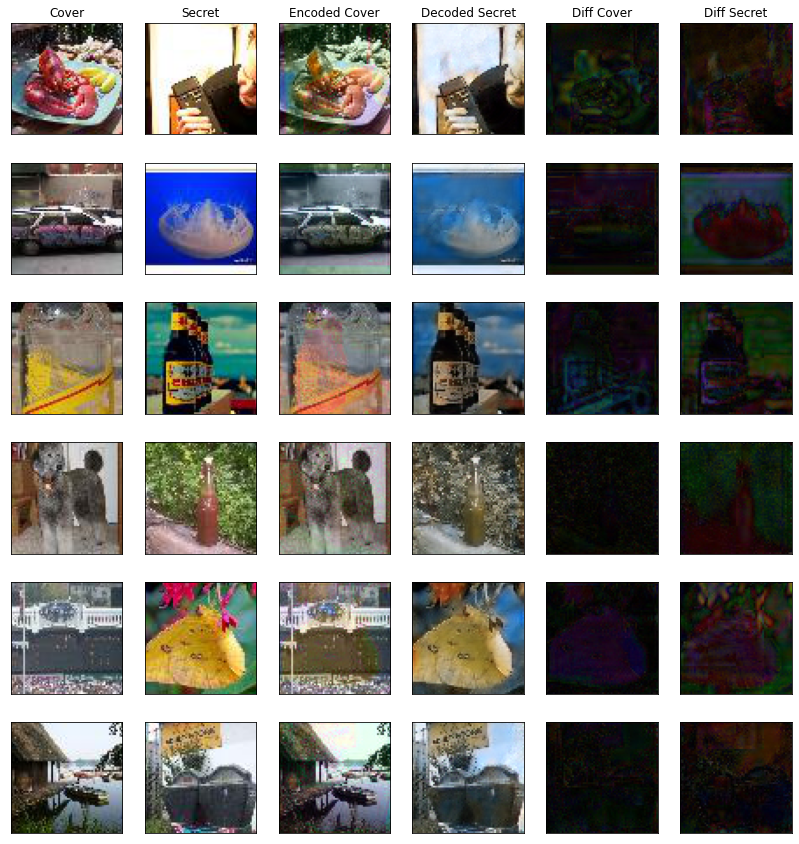

  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 81 | Batch:   0 of 1000. Loss AE    4086.90 | Loss Rev    2729.05:   3%|▎         | 1/32 [00:00<00:17,  1.78it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 81 | Batch:  32 of 1000. Loss AE    4794.97 | Loss Rev    3302.44:   6%|▋         | 2/32 [00:01<00:15,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 81 | Batch:  64 of 1000. Loss AE    5020.51 | Loss Rev    3491.23:   9%|▉         | 3/32 [00:01<00:14,  1.96it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 81 | Batch:  96 of 1000. Loss AE    4809.68 | Loss Rev    3292.74:  12%|█▎        | 4/32 [00:02<00:14,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 81 | Batch: 128 of 1000. Loss AE    5157.25 | Loss Rev    3683.99:  16%|█▌        | 5/32 [00:02<00:13,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 81 | Batch: 160 of 1000. Loss AE    5085.90 | Loss Rev    3649.14:  19%|█▉        | 6/32 [00:03<00:12,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 81 | Batch: 192 of 1000. Loss AE    5048.28 | Loss Rev    3572.38:  22%|██▏       | 7/32 [00:03<00:12,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 81 | Batch: 224 of 1000. Loss AE    5317.33 | Loss Rev    3820.15:  25%|██▌       | 8/32 [00:03<00:11,  2.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 81 | Batch: 256 of 1000. Loss AE    5435.62 | Loss Rev    3911.50:  28%|██▊       | 9/32 [00:04<00:11,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 81 | Batch: 288 of 1000. Loss AE    5366.01 | Loss Rev    3818.24:  31%|███▏      | 10/32 [00:04<00:10,  2.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 81 | Batch: 320 of 1000. Loss AE    5506.30 | Loss Rev    3945.30:  34%|███▍      | 11/32 [00:05<00:10,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 81 | Batch: 352 of 1000. Loss AE    5416.63 | Loss Rev    3814.91:  38%|███▊      | 12/32 [00:05<00:10,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 81 | Batch: 384 of 1000. Loss AE    5416.08 | Loss Rev    3755.96:  41%|████      | 13/32 [00:06<00:09,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 81 | Batch: 416 of 1000. Loss AE    5329.69 | Loss Rev    3652.20:  44%|████▍     | 14/32 [00:06<00:08,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 81 | Batch: 448 of 1000. Loss AE    5253.30 | Loss Rev    3577.73:  47%|████▋     | 15/32 [00:07<00:08,  2.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 81 | Batch: 480 of 1000. Loss AE    5169.36 | Loss Rev    3490.13:  50%|█████     | 16/32 [00:07<00:07,  2.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 81 | Batch: 512 of 1000. Loss AE    5124.43 | Loss Rev    3433.34:  53%|█████▎    | 17/32 [00:08<00:07,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 81 | Batch: 544 of 1000. Loss AE    5060.64 | Loss Rev    3383.94:  56%|█████▋    | 18/32 [00:08<00:07,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 81 | Batch: 576 of 1000. Loss AE    5008.33 | Loss Rev    3315.14:  59%|█████▉    | 19/32 [00:09<00:06,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 81 | Batch: 608 of 1000. Loss AE    4972.77 | Loss Rev    3271.24:  62%|██████▎   | 20/32 [00:10<00:06,  1.93it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 81 | Batch: 640 of 1000. Loss AE    4890.64 | Loss Rev    3192.34:  66%|██████▌   | 21/32 [00:10<00:05,  1.97it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 81 | Batch: 672 of 1000. Loss AE    4843.70 | Loss Rev    3129.49:  69%|██████▉   | 22/32 [00:11<00:05,  1.97it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 81 | Batch: 704 of 1000. Loss AE    4806.24 | Loss Rev    3078.17:  72%|███████▏  | 23/32 [00:11<00:04,  1.93it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 81 | Batch: 736 of 1000. Loss AE    4776.79 | Loss Rev    3038.28:  75%|███████▌  | 24/32 [00:12<00:04,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 81 | Batch: 768 of 1000. Loss AE    4767.10 | Loss Rev    3009.70:  78%|███████▊  | 25/32 [00:12<00:03,  1.97it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 81 | Batch: 800 of 1000. Loss AE    4748.45 | Loss Rev    2979.01:  81%|████████▏ | 26/32 [00:13<00:02,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 81 | Batch: 832 of 1000. Loss AE    4697.11 | Loss Rev    2936.52:  84%|████████▍ | 27/32 [00:13<00:02,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 81 | Batch: 864 of 1000. Loss AE    4650.04 | Loss Rev    2893.97:  88%|████████▊ | 28/32 [00:14<00:02,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 81 | Batch: 896 of 1000. Loss AE    4615.28 | Loss Rev    2861.50:  91%|█████████ | 29/32 [00:14<00:01,  1.97it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 81 | Batch: 928 of 1000. Loss AE    4583.41 | Loss Rev    2835.25:  94%|█████████▍| 30/32 [00:15<00:01,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 81 | Batch: 960 of 1000. Loss AE    4557.68 | Loss Rev    2812.91:  97%|█████████▋| 31/32 [00:15<00:00,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 81 | Batch: 992 of 1000. Loss AE    4439.44 | Loss Rev    2736.36: 100%|██████████| 32/32 [00:15<00:00,  2.03it/s]

81



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 82 | Batch:   0 of 1000. Loss AE    4104.74 | Loss Rev    2497.39:   3%|▎         | 1/32 [00:00<00:15,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 82 | Batch:  32 of 1000. Loss AE    3723.17 | Loss Rev    2136.89:   6%|▋         | 2/32 [00:00<00:14,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 82 | Batch:  64 of 1000. Loss AE    3758.80 | Loss Rev    2168.41:   9%|▉         | 3/32 [00:01<00:14,  2.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 82 | Batch:  96 of 1000. Loss AE    3786.44 | Loss Rev    2204.82:  12%|█▎        | 4/32 [00:01<00:13,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 82 | Batch: 128 of 1000. Loss AE    3867.16 | Loss Rev    2253.94:  16%|█▌        | 5/32 [00:02<00:13,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 82 | Batch: 160 of 1000. Loss AE    3844.20 | Loss Rev    2175.17:  19%|█▉        | 6/32 [00:02<00:12,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 82 | Batch: 192 of 1000. Loss AE    3815.34 | Loss Rev    2137.94:  22%|██▏       | 7/32 [00:03<00:12,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 82 | Batch: 224 of 1000. Loss AE    3795.66 | Loss Rev    2126.65:  25%|██▌       | 8/32 [00:03<00:11,  2.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 82 | Batch: 256 of 1000. Loss AE    3706.28 | Loss Rev    2054.39:  28%|██▊       | 9/32 [00:04<00:11,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 82 | Batch: 288 of 1000. Loss AE    3628.84 | Loss Rev    2033.05:  31%|███▏      | 10/32 [00:04<00:10,  2.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 82 | Batch: 320 of 1000. Loss AE    3576.33 | Loss Rev    1985.32:  34%|███▍      | 11/32 [00:05<00:10,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 82 | Batch: 352 of 1000. Loss AE    3585.71 | Loss Rev    1978.85:  38%|███▊      | 12/32 [00:05<00:09,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 82 | Batch: 384 of 1000. Loss AE    3528.37 | Loss Rev    1929.03:  41%|████      | 13/32 [00:06<00:09,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 82 | Batch: 416 of 1000. Loss AE    3513.07 | Loss Rev    1934.17:  44%|████▍     | 14/32 [00:06<00:08,  2.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 82 | Batch: 448 of 1000. Loss AE    3495.37 | Loss Rev    1921.21:  47%|████▋     | 15/32 [00:07<00:08,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 82 | Batch: 480 of 1000. Loss AE    3490.38 | Loss Rev    1909.93:  50%|█████     | 16/32 [00:07<00:08,  1.96it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 82 | Batch: 512 of 1000. Loss AE    3457.42 | Loss Rev    1896.66:  53%|█████▎    | 17/32 [00:08<00:07,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 82 | Batch: 544 of 1000. Loss AE    3482.83 | Loss Rev    1914.66:  56%|█████▋    | 18/32 [00:08<00:06,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 82 | Batch: 576 of 1000. Loss AE    3498.69 | Loss Rev    1923.53:  59%|█████▉    | 19/32 [00:09<00:06,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 82 | Batch: 608 of 1000. Loss AE    3494.82 | Loss Rev    1912.73:  62%|██████▎   | 20/32 [00:09<00:05,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 82 | Batch: 640 of 1000. Loss AE    3488.13 | Loss Rev    1910.21:  66%|██████▌   | 21/32 [00:10<00:05,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 82 | Batch: 672 of 1000. Loss AE    3507.23 | Loss Rev    1905.44:  69%|██████▉   | 22/32 [00:10<00:04,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 82 | Batch: 704 of 1000. Loss AE    3502.24 | Loss Rev    1908.77:  72%|███████▏  | 23/32 [00:11<00:04,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 82 | Batch: 736 of 1000. Loss AE    3527.70 | Loss Rev    1927.08:  75%|███████▌  | 24/32 [00:11<00:03,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 82 | Batch: 768 of 1000. Loss AE    3510.27 | Loss Rev    1913.21:  78%|███████▊  | 25/32 [00:12<00:03,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 82 | Batch: 800 of 1000. Loss AE    3501.69 | Loss Rev    1902.28:  81%|████████▏ | 26/32 [00:12<00:03,  1.99it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 82 | Batch: 832 of 1000. Loss AE    3470.58 | Loss Rev    1882.61:  84%|████████▍ | 27/32 [00:13<00:02,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 82 | Batch: 864 of 1000. Loss AE    3445.64 | Loss Rev    1871.50:  88%|████████▊ | 28/32 [00:13<00:01,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 82 | Batch: 896 of 1000. Loss AE    3449.21 | Loss Rev    1867.01:  91%|█████████ | 29/32 [00:14<00:01,  2.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 82 | Batch: 928 of 1000. Loss AE    3428.34 | Loss Rev    1853.16:  94%|█████████▍| 30/32 [00:14<00:01,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 82 | Batch: 960 of 1000. Loss AE    3427.31 | Loss Rev    1854.23:  97%|█████████▋| 31/32 [00:15<00:00,  2.00it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 82 | Batch: 992 of 1000. Loss AE    3339.94 | Loss Rev    1807.67: 100%|██████████| 32/32 [00:15<00:00,  2.05it/s]


82


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 83 | Batch:   0 of 1000. Loss AE    3049.38 | Loss Rev    1631.65:   3%|▎         | 1/32 [00:00<00:15,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 83 | Batch:  32 of 1000. Loss AE    3122.10 | Loss Rev    1625.76:   6%|▋         | 2/32 [00:00<00:14,  2.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 83 | Batch:  64 of 1000. Loss AE    3178.73 | Loss Rev    1577.07:   9%|▉         | 3/32 [00:01<00:14,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 83 | Batch:  96 of 1000. Loss AE    3238.21 | Loss Rev    1689.69:  12%|█▎        | 4/32 [00:01<00:13,  2.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 83 | Batch: 128 of 1000. Loss AE    3201.35 | Loss Rev    1632.36:  16%|█▌        | 5/32 [00:02<00:13,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 83 | Batch: 160 of 1000. Loss AE    3164.52 | Loss Rev    1645.41:  19%|█▉        | 6/32 [00:02<00:12,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 83 | Batch: 192 of 1000. Loss AE    3107.22 | Loss Rev    1604.29:  22%|██▏       | 7/32 [00:03<00:12,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 83 | Batch: 224 of 1000. Loss AE    3091.61 | Loss Rev    1594.88:  25%|██▌       | 8/32 [00:03<00:11,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 83 | Batch: 256 of 1000. Loss AE    3168.49 | Loss Rev    1607.87:  28%|██▊       | 9/32 [00:04<00:11,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 83 | Batch: 288 of 1000. Loss AE    3136.46 | Loss Rev    1580.33:  31%|███▏      | 10/32 [00:04<00:10,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 83 | Batch: 320 of 1000. Loss AE    3097.25 | Loss Rev    1572.42:  34%|███▍      | 11/32 [00:05<00:10,  2.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 83 | Batch: 352 of 1000. Loss AE    3153.71 | Loss Rev    1606.22:  38%|███▊      | 12/32 [00:05<00:09,  2.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 83 | Batch: 384 of 1000. Loss AE    3125.32 | Loss Rev    1586.57:  41%|████      | 13/32 [00:06<00:09,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 83 | Batch: 416 of 1000. Loss AE    3103.08 | Loss Rev    1578.33:  44%|████▍     | 14/32 [00:06<00:08,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 83 | Batch: 448 of 1000. Loss AE    3103.46 | Loss Rev    1566.17:  47%|████▋     | 15/32 [00:07<00:08,  2.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 83 | Batch: 480 of 1000. Loss AE    3095.95 | Loss Rev    1565.04:  50%|█████     | 16/32 [00:07<00:07,  2.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 83 | Batch: 512 of 1000. Loss AE    3100.89 | Loss Rev    1569.67:  53%|█████▎    | 17/32 [00:08<00:07,  2.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 83 | Batch: 544 of 1000. Loss AE    3103.81 | Loss Rev    1584.45:  56%|█████▋    | 18/32 [00:08<00:06,  2.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 83 | Batch: 576 of 1000. Loss AE    3121.87 | Loss Rev    1591.92:  59%|█████▉    | 19/32 [00:09<00:06,  2.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 83 | Batch: 608 of 1000. Loss AE    3078.34 | Loss Rev    1570.89:  62%|██████▎   | 20/32 [00:09<00:05,  2.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 83 | Batch: 640 of 1000. Loss AE    3066.09 | Loss Rev    1565.17:  66%|██████▌   | 21/32 [00:10<00:05,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 83 | Batch: 672 of 1000. Loss AE    3060.59 | Loss Rev    1566.57:  69%|██████▉   | 22/32 [00:10<00:04,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 83 | Batch: 704 of 1000. Loss AE    3031.78 | Loss Rev    1555.59:  72%|███████▏  | 23/32 [00:11<00:04,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 83 | Batch: 736 of 1000. Loss AE    3028.99 | Loss Rev    1552.76:  75%|███████▌  | 24/32 [00:11<00:03,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 83 | Batch: 768 of 1000. Loss AE    3029.23 | Loss Rev    1552.18:  78%|███████▊  | 25/32 [00:12<00:03,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 83 | Batch: 800 of 1000. Loss AE    3029.85 | Loss Rev    1554.80:  81%|████████▏ | 26/32 [00:12<00:02,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 83 | Batch: 832 of 1000. Loss AE    3020.57 | Loss Rev    1556.93:  84%|████████▍ | 27/32 [00:13<00:02,  2.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 83 | Batch: 864 of 1000. Loss AE    3012.96 | Loss Rev    1559.11:  88%|████████▊ | 28/32 [00:13<00:01,  2.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 83 | Batch: 896 of 1000. Loss AE    3019.03 | Loss Rev    1559.02:  91%|█████████ | 29/32 [00:14<00:01,  2.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 83 | Batch: 928 of 1000. Loss AE    3028.54 | Loss Rev    1562.14:  94%|█████████▍| 30/32 [00:14<00:00,  2.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 83 | Batch: 960 of 1000. Loss AE    3056.63 | Loss Rev    1588.57:  97%|█████████▋| 31/32 [00:15<00:00,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 83 | Batch: 992 of 1000. Loss AE    2991.57 | Loss Rev    1551.23: 100%|██████████| 32/32 [00:15<00:00,  2.08it/s]

83



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 84 | Batch:   0 of 1000. Loss AE    2974.68 | Loss Rev    1744.16:   3%|▎         | 1/32 [00:00<00:15,  1.98it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 84 | Batch:  32 of 1000. Loss AE    3716.83 | Loss Rev    2225.13:   6%|▋         | 2/32 [00:01<00:15,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 84 | Batch:  64 of 1000. Loss AE    3491.56 | Loss Rev    2052.74:   9%|▉         | 3/32 [00:01<00:14,  2.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 84 | Batch:  96 of 1000. Loss AE    3297.46 | Loss Rev    1877.79:  12%|█▎        | 4/32 [00:02<00:14,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 84 | Batch: 128 of 1000. Loss AE    3456.31 | Loss Rev    1963.00:  16%|█▌        | 5/32 [00:02<00:13,  2.00it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 84 | Batch: 160 of 1000. Loss AE    3509.17 | Loss Rev    2043.17:  19%|█▉        | 6/32 [00:03<00:12,  2.00it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 84 | Batch: 192 of 1000. Loss AE    3425.19 | Loss Rev    1991.97:  22%|██▏       | 7/32 [00:03<00:13,  1.92it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 84 | Batch: 224 of 1000. Loss AE    3326.24 | Loss Rev    1931.45:  25%|██▌       | 8/32 [00:04<00:12,  1.97it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 84 | Batch: 256 of 1000. Loss AE    3309.83 | Loss Rev    1935.81:  28%|██▊       | 9/32 [00:04<00:11,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 84 | Batch: 288 of 1000. Loss AE    3271.34 | Loss Rev    1903.00:  31%|███▏      | 10/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 84 | Batch: 320 of 1000. Loss AE    3264.01 | Loss Rev    1880.01:  34%|███▍      | 11/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 84 | Batch: 352 of 1000. Loss AE    3270.57 | Loss Rev    1878.08:  38%|███▊      | 12/32 [00:06<00:09,  2.00it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 84 | Batch: 384 of 1000. Loss AE    3287.44 | Loss Rev    1887.16:  41%|████      | 13/32 [00:06<00:09,  2.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 84 | Batch: 416 of 1000. Loss AE    3263.48 | Loss Rev    1873.21:  44%|████▍     | 14/32 [00:06<00:08,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 84 | Batch: 448 of 1000. Loss AE    3263.60 | Loss Rev    1875.37:  47%|████▋     | 15/32 [00:07<00:08,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 84 | Batch: 480 of 1000. Loss AE    3259.36 | Loss Rev    1874.69:  50%|█████     | 16/32 [00:08<00:08,  1.94it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 84 | Batch: 512 of 1000. Loss AE    3225.68 | Loss Rev    1849.17:  53%|█████▎    | 17/32 [00:08<00:07,  1.96it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 84 | Batch: 544 of 1000. Loss AE    3236.72 | Loss Rev    1847.74:  56%|█████▋    | 18/32 [00:09<00:07,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 84 | Batch: 576 of 1000. Loss AE    3267.34 | Loss Rev    1854.19:  59%|█████▉    | 19/32 [00:09<00:06,  1.99it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 84 | Batch: 608 of 1000. Loss AE    3253.55 | Loss Rev    1842.96:  62%|██████▎   | 20/32 [00:10<00:06,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 84 | Batch: 640 of 1000. Loss AE    3259.71 | Loss Rev    1839.09:  66%|██████▌   | 21/32 [00:10<00:05,  1.97it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 84 | Batch: 672 of 1000. Loss AE    3269.27 | Loss Rev    1840.44:  69%|██████▉   | 22/32 [00:11<00:05,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 84 | Batch: 704 of 1000. Loss AE    3256.15 | Loss Rev    1832.72:  72%|███████▏  | 23/32 [00:11<00:04,  2.00it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 84 | Batch: 736 of 1000. Loss AE    3256.27 | Loss Rev    1822.88:  75%|███████▌  | 24/32 [00:12<00:04,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 84 | Batch: 768 of 1000. Loss AE    3257.11 | Loss Rev    1813.50:  78%|███████▊  | 25/32 [00:12<00:03,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 84 | Batch: 800 of 1000. Loss AE    3252.63 | Loss Rev    1803.23:  81%|████████▏ | 26/32 [00:13<00:02,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 84 | Batch: 832 of 1000. Loss AE    3237.24 | Loss Rev    1787.18:  84%|████████▍ | 27/32 [00:13<00:02,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 84 | Batch: 864 of 1000. Loss AE    3241.02 | Loss Rev    1781.38:  88%|████████▊ | 28/32 [00:13<00:01,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 84 | Batch: 896 of 1000. Loss AE    3217.96 | Loss Rev    1766.64:  91%|█████████ | 29/32 [00:14<00:01,  2.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 84 | Batch: 928 of 1000. Loss AE    3209.68 | Loss Rev    1758.31:  94%|█████████▍| 30/32 [00:14<00:00,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 84 | Batch: 960 of 1000. Loss AE    3202.29 | Loss Rev    1757.95:  97%|█████████▋| 31/32 [00:15<00:00,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 84 | Batch: 992 of 1000. Loss AE    3125.73 | Loss Rev    1717.59: 100%|██████████| 32/32 [00:15<00:00,  2.04it/s]


84


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 85 | Batch:   0 of 1000. Loss AE    3178.00 | Loss Rev    1812.34:   3%|▎         | 1/32 [00:00<00:15,  1.95it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 85 | Batch:  32 of 1000. Loss AE    3178.30 | Loss Rev    1945.82:   6%|▋         | 2/32 [00:00<00:14,  2.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 85 | Batch:  64 of 1000. Loss AE    3233.07 | Loss Rev    1881.30:   9%|▉         | 3/32 [00:01<00:14,  2.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 85 | Batch:  96 of 1000. Loss AE    3087.91 | Loss Rev    1781.62:  12%|█▎        | 4/32 [00:01<00:13,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 85 | Batch: 128 of 1000. Loss AE    3172.67 | Loss Rev    1887.43:  16%|█▌        | 5/32 [00:02<00:13,  2.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 85 | Batch: 160 of 1000. Loss AE    3230.62 | Loss Rev    1803.28:  19%|█▉        | 6/32 [00:02<00:12,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 85 | Batch: 192 of 1000. Loss AE    3236.17 | Loss Rev    1829.96:  22%|██▏       | 7/32 [00:03<00:12,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 85 | Batch: 224 of 1000. Loss AE    3256.06 | Loss Rev    1860.24:  25%|██▌       | 8/32 [00:03<00:11,  2.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 85 | Batch: 256 of 1000. Loss AE    3233.31 | Loss Rev    1835.57:  28%|██▊       | 9/32 [00:04<00:11,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 85 | Batch: 288 of 1000. Loss AE    3194.31 | Loss Rev    1793.70:  31%|███▏      | 10/32 [00:04<00:10,  2.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 85 | Batch: 320 of 1000. Loss AE    3160.88 | Loss Rev    1780.77:  34%|███▍      | 11/32 [00:05<00:10,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 85 | Batch: 352 of 1000. Loss AE    3160.79 | Loss Rev    1775.88:  38%|███▊      | 12/32 [00:05<00:09,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 85 | Batch: 384 of 1000. Loss AE    3121.49 | Loss Rev    1746.29:  41%|████      | 13/32 [00:06<00:09,  1.91it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 85 | Batch: 416 of 1000. Loss AE    3150.96 | Loss Rev    1745.73:  44%|████▍     | 14/32 [00:07<00:09,  1.97it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 85 | Batch: 448 of 1000. Loss AE    3142.37 | Loss Rev    1738.90:  47%|████▋     | 15/32 [00:07<00:08,  1.97it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 85 | Batch: 480 of 1000. Loss AE    3136.25 | Loss Rev    1725.18:  50%|█████     | 16/32 [00:08<00:08,  1.98it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 85 | Batch: 512 of 1000. Loss AE    3117.86 | Loss Rev    1714.01:  53%|█████▎    | 17/32 [00:08<00:07,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 85 | Batch: 544 of 1000. Loss AE    3127.52 | Loss Rev    1713.42:  56%|█████▋    | 18/32 [00:09<00:07,  1.97it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 85 | Batch: 576 of 1000. Loss AE    3131.51 | Loss Rev    1706.75:  59%|█████▉    | 19/32 [00:09<00:06,  1.97it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 85 | Batch: 608 of 1000. Loss AE    3131.31 | Loss Rev    1699.78:  62%|██████▎   | 20/32 [00:10<00:06,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 85 | Batch: 640 of 1000. Loss AE    3128.24 | Loss Rev    1702.20:  66%|██████▌   | 21/32 [00:10<00:05,  2.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 85 | Batch: 672 of 1000. Loss AE    3104.17 | Loss Rev    1684.69:  69%|██████▉   | 22/32 [00:11<00:04,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 85 | Batch: 704 of 1000. Loss AE    3086.26 | Loss Rev    1676.90:  72%|███████▏  | 23/32 [00:11<00:04,  2.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 85 | Batch: 736 of 1000. Loss AE    3104.83 | Loss Rev    1680.53:  75%|███████▌  | 24/32 [00:12<00:03,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 85 | Batch: 768 of 1000. Loss AE    3100.72 | Loss Rev    1678.98:  78%|███████▊  | 25/32 [00:12<00:03,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 85 | Batch: 800 of 1000. Loss AE    3071.93 | Loss Rev    1662.10:  81%|████████▏ | 26/32 [00:12<00:02,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 85 | Batch: 832 of 1000. Loss AE    3078.55 | Loss Rev    1656.75:  84%|████████▍ | 27/32 [00:13<00:02,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 85 | Batch: 864 of 1000. Loss AE    3073.57 | Loss Rev    1655.97:  88%|████████▊ | 28/32 [00:13<00:01,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 85 | Batch: 896 of 1000. Loss AE    3076.94 | Loss Rev    1657.09:  91%|█████████ | 29/32 [00:14<00:01,  2.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 85 | Batch: 928 of 1000. Loss AE    3088.34 | Loss Rev    1660.02:  94%|█████████▍| 30/32 [00:14<00:00,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 85 | Batch: 960 of 1000. Loss AE    3097.54 | Loss Rev    1661.85:  97%|█████████▋| 31/32 [00:15<00:00,  2.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 85 | Batch: 992 of 1000. Loss AE    3016.48 | Loss Rev    1619.51: 100%|██████████| 32/32 [00:15<00:00,  2.03it/s]


85


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 86 | Batch:   0 of 1000. Loss AE    3231.85 | Loss Rev    1709.04:   3%|▎         | 1/32 [00:00<00:17,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 86 | Batch:  32 of 1000. Loss AE    3123.55 | Loss Rev    1557.94:   6%|▋         | 2/32 [00:01<00:15,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 86 | Batch:  64 of 1000. Loss AE    3178.59 | Loss Rev    1589.47:   9%|▉         | 3/32 [00:01<00:14,  1.96it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 86 | Batch:  96 of 1000. Loss AE    3170.51 | Loss Rev    1589.10:  12%|█▎        | 4/32 [00:02<00:14,  1.98it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 86 | Batch: 128 of 1000. Loss AE    3223.80 | Loss Rev    1637.69:  16%|█▌        | 5/32 [00:02<00:13,  1.97it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 86 | Batch: 160 of 1000. Loss AE    3153.00 | Loss Rev    1591.57:  19%|█▉        | 6/32 [00:03<00:13,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 86 | Batch: 192 of 1000. Loss AE    3178.70 | Loss Rev    1619.71:  22%|██▏       | 7/32 [00:03<00:12,  2.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 86 | Batch: 224 of 1000. Loss AE    3122.86 | Loss Rev    1586.26:  25%|██▌       | 8/32 [00:04<00:11,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 86 | Batch: 256 of 1000. Loss AE    3228.62 | Loss Rev    1649.25:  28%|██▊       | 9/32 [00:04<00:11,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 86 | Batch: 288 of 1000. Loss AE    3214.46 | Loss Rev    1639.79:  31%|███▏      | 10/32 [00:05<00:10,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 86 | Batch: 320 of 1000. Loss AE    3163.91 | Loss Rev    1612.51:  34%|███▍      | 11/32 [00:05<00:10,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 86 | Batch: 352 of 1000. Loss AE    3102.74 | Loss Rev    1589.73:  38%|███▊      | 12/32 [00:05<00:09,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 86 | Batch: 384 of 1000. Loss AE    3124.61 | Loss Rev    1596.99:  41%|████      | 13/32 [00:06<00:09,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 86 | Batch: 416 of 1000. Loss AE    3094.85 | Loss Rev    1588.10:  44%|████▍     | 14/32 [00:06<00:08,  2.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 86 | Batch: 448 of 1000. Loss AE    3072.16 | Loss Rev    1568.60:  47%|████▋     | 15/32 [00:07<00:08,  2.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 86 | Batch: 480 of 1000. Loss AE    3035.01 | Loss Rev    1558.32:  50%|█████     | 16/32 [00:08<00:08,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 86 | Batch: 512 of 1000. Loss AE    3014.14 | Loss Rev    1557.53:  53%|█████▎    | 17/32 [00:08<00:07,  2.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 86 | Batch: 544 of 1000. Loss AE    2985.74 | Loss Rev    1549.41:  56%|█████▋    | 18/32 [00:08<00:06,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 86 | Batch: 576 of 1000. Loss AE    2967.26 | Loss Rev    1541.41:  59%|█████▉    | 19/32 [00:09<00:06,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 86 | Batch: 608 of 1000. Loss AE    2968.64 | Loss Rev    1537.82:  62%|██████▎   | 20/32 [00:09<00:05,  2.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 86 | Batch: 640 of 1000. Loss AE    2985.64 | Loss Rev    1558.39:  66%|██████▌   | 21/32 [00:10<00:05,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 86 | Batch: 672 of 1000. Loss AE    2990.88 | Loss Rev    1569.37:  69%|██████▉   | 22/32 [00:10<00:04,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 86 | Batch: 704 of 1000. Loss AE    3002.80 | Loss Rev    1577.35:  72%|███████▏  | 23/32 [00:11<00:04,  2.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 86 | Batch: 736 of 1000. Loss AE    3001.72 | Loss Rev    1571.61:  75%|███████▌  | 24/32 [00:11<00:03,  2.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 86 | Batch: 768 of 1000. Loss AE    3006.42 | Loss Rev    1572.31:  78%|███████▊  | 25/32 [00:12<00:03,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 86 | Batch: 800 of 1000. Loss AE    2992.73 | Loss Rev    1565.76:  81%|████████▏ | 26/32 [00:13<00:03,  1.95it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 86 | Batch: 832 of 1000. Loss AE    2992.71 | Loss Rev    1569.77:  84%|████████▍ | 27/32 [00:13<00:02,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 86 | Batch: 864 of 1000. Loss AE    2982.87 | Loss Rev    1563.93:  88%|████████▊ | 28/32 [00:14<00:02,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 86 | Batch: 896 of 1000. Loss AE    2981.35 | Loss Rev    1565.81:  91%|█████████ | 29/32 [00:14<00:01,  1.96it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 86 | Batch: 928 of 1000. Loss AE    2986.21 | Loss Rev    1573.99:  94%|█████████▍| 30/32 [00:15<00:00,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 86 | Batch: 960 of 1000. Loss AE    2986.20 | Loss Rev    1586.08:  97%|█████████▋| 31/32 [00:15<00:00,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 86 | Batch: 992 of 1000. Loss AE    2923.31 | Loss Rev    1553.53: 100%|██████████| 32/32 [00:15<00:00,  2.04it/s]


86


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 87 | Batch:   0 of 1000. Loss AE    3892.45 | Loss Rev    2726.68:   3%|▎         | 1/32 [00:00<00:18,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 87 | Batch:  32 of 1000. Loss AE    7256.35 | Loss Rev    5997.73:   6%|▋         | 2/32 [00:01<00:16,  1.86it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 87 | Batch:  64 of 1000. Loss AE   10197.67 | Loss Rev    8698.06:   9%|▉         | 3/32 [00:01<00:14,  1.94it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 87 | Batch:  96 of 1000. Loss AE    8897.64 | Loss Rev    7249.06:  12%|█▎        | 4/32 [00:02<00:14,  1.92it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 87 | Batch: 128 of 1000. Loss AE   10208.84 | Loss Rev    8483.55:  16%|█▌        | 5/32 [00:02<00:13,  1.97it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 87 | Batch: 160 of 1000. Loss AE   10095.19 | Loss Rev    8317.51:  19%|█▉        | 6/32 [00:03<00:13,  1.98it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 87 | Batch: 192 of 1000. Loss AE    9962.44 | Loss Rev    8103.92:  22%|██▏       | 7/32 [00:03<00:12,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 87 | Batch: 224 of 1000. Loss AE    9516.50 | Loss Rev    7538.20:  25%|██▌       | 8/32 [00:04<00:11,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 87 | Batch: 256 of 1000. Loss AE    9297.32 | Loss Rev    7282.16:  28%|██▊       | 9/32 [00:04<00:11,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 87 | Batch: 288 of 1000. Loss AE    8966.99 | Loss Rev    6920.26:  31%|███▏      | 10/32 [00:05<00:10,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 87 | Batch: 320 of 1000. Loss AE    9028.04 | Loss Rev    6895.12:  34%|███▍      | 11/32 [00:05<00:10,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 87 | Batch: 352 of 1000. Loss AE    8751.53 | Loss Rev    6585.47:  38%|███▊      | 12/32 [00:06<00:09,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 87 | Batch: 384 of 1000. Loss AE    8783.97 | Loss Rev    6547.25:  41%|████      | 13/32 [00:06<00:09,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 87 | Batch: 416 of 1000. Loss AE    8541.51 | Loss Rev    6282.44:  44%|████▍     | 14/32 [00:07<00:08,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 87 | Batch: 448 of 1000. Loss AE    8484.65 | Loss Rev    6195.22:  47%|████▋     | 15/32 [00:07<00:08,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 87 | Batch: 480 of 1000. Loss AE    8384.06 | Loss Rev    6055.11:  50%|█████     | 16/32 [00:07<00:07,  2.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 87 | Batch: 512 of 1000. Loss AE    8186.99 | Loss Rev    5847.66:  53%|█████▎    | 17/32 [00:08<00:07,  2.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 87 | Batch: 544 of 1000. Loss AE    8112.52 | Loss Rev    5725.10:  56%|█████▋    | 18/32 [00:08<00:06,  2.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 87 | Batch: 576 of 1000. Loss AE    7960.93 | Loss Rev    5555.68:  59%|█████▉    | 19/32 [00:09<00:06,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 87 | Batch: 608 of 1000. Loss AE    7897.84 | Loss Rev    5491.73:  62%|██████▎   | 20/32 [00:09<00:05,  2.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 87 | Batch: 640 of 1000. Loss AE    7753.10 | Loss Rev    5355.92:  66%|██████▌   | 21/32 [00:10<00:05,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 87 | Batch: 672 of 1000. Loss AE    7670.44 | Loss Rev    5259.12:  69%|██████▉   | 22/32 [00:10<00:04,  2.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 87 | Batch: 704 of 1000. Loss AE    7520.92 | Loss Rev    5126.71:  72%|███████▏  | 23/32 [00:11<00:04,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 87 | Batch: 736 of 1000. Loss AE    7377.23 | Loss Rev    5001.82:  75%|███████▌  | 24/32 [00:11<00:04,  1.97it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 87 | Batch: 768 of 1000. Loss AE    7257.60 | Loss Rev    4892.33:  78%|███████▊  | 25/32 [00:12<00:03,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 87 | Batch: 800 of 1000. Loss AE    7166.17 | Loss Rev    4797.05:  81%|████████▏ | 26/32 [00:13<00:03,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 87 | Batch: 832 of 1000. Loss AE    7064.16 | Loss Rev    4701.82:  84%|████████▍ | 27/32 [00:13<00:02,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 87 | Batch: 864 of 1000. Loss AE    6954.59 | Loss Rev    4614.09:  88%|████████▊ | 28/32 [00:13<00:01,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 87 | Batch: 896 of 1000. Loss AE    6890.50 | Loss Rev    4554.80:  91%|█████████ | 29/32 [00:14<00:01,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 87 | Batch: 928 of 1000. Loss AE    6835.49 | Loss Rev    4504.86:  94%|█████████▍| 30/32 [00:14<00:00,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 87 | Batch: 960 of 1000. Loss AE    6755.28 | Loss Rev    4440.24:  97%|█████████▋| 31/32 [00:15<00:00,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 87 | Batch: 992 of 1000. Loss AE    6568.20 | Loss Rev    4313.06: 100%|██████████| 32/32 [00:15<00:00,  2.04it/s]


87


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 88 | Batch:   0 of 1000. Loss AE    4414.05 | Loss Rev    2013.26:   3%|▎         | 1/32 [00:00<00:18,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 88 | Batch:  32 of 1000. Loss AE    4019.86 | Loss Rev    1864.39:   6%|▋         | 2/32 [00:01<00:16,  1.86it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 88 | Batch:  64 of 1000. Loss AE    4072.46 | Loss Rev    1961.90:   9%|▉         | 3/32 [00:01<00:15,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 88 | Batch:  96 of 1000. Loss AE    4070.32 | Loss Rev    2001.03:  12%|█▎        | 4/32 [00:02<00:14,  1.99it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 88 | Batch: 128 of 1000. Loss AE    4086.53 | Loss Rev    1986.95:  16%|█▌        | 5/32 [00:02<00:13,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 88 | Batch: 160 of 1000. Loss AE    3983.83 | Loss Rev    1906.60:  19%|█▉        | 6/32 [00:03<00:12,  2.00it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 88 | Batch: 192 of 1000. Loss AE    3939.68 | Loss Rev    1906.65:  22%|██▏       | 7/32 [00:03<00:12,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 88 | Batch: 224 of 1000. Loss AE    3907.68 | Loss Rev    1912.61:  25%|██▌       | 8/32 [00:04<00:11,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 88 | Batch: 256 of 1000. Loss AE    3911.54 | Loss Rev    1893.75:  28%|██▊       | 9/32 [00:04<00:11,  2.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 88 | Batch: 288 of 1000. Loss AE    3900.37 | Loss Rev    1912.70:  31%|███▏      | 10/32 [00:05<00:10,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 88 | Batch: 320 of 1000. Loss AE    3914.36 | Loss Rev    1898.18:  34%|███▍      | 11/32 [00:05<00:10,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 88 | Batch: 352 of 1000. Loss AE    3933.53 | Loss Rev    1922.29:  38%|███▊      | 12/32 [00:06<00:09,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 88 | Batch: 384 of 1000. Loss AE    3950.34 | Loss Rev    1911.42:  41%|████      | 13/32 [00:06<00:09,  2.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 88 | Batch: 416 of 1000. Loss AE    3895.30 | Loss Rev    1879.50:  44%|████▍     | 14/32 [00:07<00:09,  1.92it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 88 | Batch: 448 of 1000. Loss AE    3839.46 | Loss Rev    1850.23:  47%|████▋     | 15/32 [00:07<00:08,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 88 | Batch: 480 of 1000. Loss AE    3800.82 | Loss Rev    1825.38:  50%|█████     | 16/32 [00:08<00:08,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 88 | Batch: 512 of 1000. Loss AE    3783.69 | Loss Rev    1818.72:  53%|█████▎    | 17/32 [00:08<00:07,  1.98it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 88 | Batch: 544 of 1000. Loss AE    3767.16 | Loss Rev    1818.27:  56%|█████▋    | 18/32 [00:09<00:07,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 88 | Batch: 576 of 1000. Loss AE    3749.02 | Loss Rev    1796.59:  59%|█████▉    | 19/32 [00:09<00:06,  1.99it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 88 | Batch: 608 of 1000. Loss AE    3738.12 | Loss Rev    1799.26:  62%|██████▎   | 20/32 [00:10<00:06,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 88 | Batch: 640 of 1000. Loss AE    3712.66 | Loss Rev    1786.13:  66%|██████▌   | 21/32 [00:10<00:05,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 88 | Batch: 672 of 1000. Loss AE    3687.92 | Loss Rev    1778.45:  69%|██████▉   | 22/32 [00:11<00:05,  1.98it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 88 | Batch: 704 of 1000. Loss AE    3664.51 | Loss Rev    1771.31:  72%|███████▏  | 23/32 [00:11<00:04,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 88 | Batch: 736 of 1000. Loss AE    3653.53 | Loss Rev    1763.89:  75%|███████▌  | 24/32 [00:12<00:04,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 88 | Batch: 768 of 1000. Loss AE    3635.89 | Loss Rev    1755.92:  78%|███████▊  | 25/32 [00:12<00:03,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 88 | Batch: 800 of 1000. Loss AE    3599.83 | Loss Rev    1746.38:  81%|████████▏ | 26/32 [00:13<00:02,  2.00it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 88 | Batch: 832 of 1000. Loss AE    3583.17 | Loss Rev    1738.95:  84%|████████▍ | 27/32 [00:13<00:02,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 88 | Batch: 864 of 1000. Loss AE    3561.88 | Loss Rev    1737.81:  88%|████████▊ | 28/32 [00:14<00:01,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 88 | Batch: 896 of 1000. Loss AE    3558.77 | Loss Rev    1743.04:  91%|█████████ | 29/32 [00:14<00:01,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 88 | Batch: 928 of 1000. Loss AE    3530.37 | Loss Rev    1729.36:  94%|█████████▍| 30/32 [00:15<00:00,  2.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 88 | Batch: 960 of 1000. Loss AE    3512.50 | Loss Rev    1719.26:  97%|█████████▋| 31/32 [00:15<00:00,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 88 | Batch: 992 of 1000. Loss AE    3430.84 | Loss Rev    1683.05: 100%|██████████| 32/32 [00:15<00:00,  2.02it/s]


88


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 89 | Batch:   0 of 1000. Loss AE    2856.05 | Loss Rev    1594.93:   3%|▎         | 1/32 [00:00<00:17,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 89 | Batch:  32 of 1000. Loss AE    2815.16 | Loss Rev    1505.97:   6%|▋         | 2/32 [00:01<00:15,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 89 | Batch:  64 of 1000. Loss AE    2938.20 | Loss Rev    1546.07:   9%|▉         | 3/32 [00:01<00:14,  1.95it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 89 | Batch:  96 of 1000. Loss AE    2991.84 | Loss Rev    1560.06:  12%|█▎        | 4/32 [00:02<00:14,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 89 | Batch: 128 of 1000. Loss AE    3086.83 | Loss Rev    1615.80:  16%|█▌        | 5/32 [00:02<00:13,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 89 | Batch: 160 of 1000. Loss AE    3050.36 | Loss Rev    1571.26:  19%|█▉        | 6/32 [00:03<00:12,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 89 | Batch: 192 of 1000. Loss AE    3093.74 | Loss Rev    1603.17:  22%|██▏       | 7/32 [00:03<00:12,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 89 | Batch: 224 of 1000. Loss AE    3170.79 | Loss Rev    1617.73:  25%|██▌       | 8/32 [00:04<00:11,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 89 | Batch: 256 of 1000. Loss AE    3192.99 | Loss Rev    1659.34:  28%|██▊       | 9/32 [00:04<00:11,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 89 | Batch: 288 of 1000. Loss AE    3190.63 | Loss Rev    1670.43:  31%|███▏      | 10/32 [00:05<00:10,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 89 | Batch: 320 of 1000. Loss AE    3227.68 | Loss Rev    1709.93:  34%|███▍      | 11/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 89 | Batch: 352 of 1000. Loss AE    3194.38 | Loss Rev    1690.85:  38%|███▊      | 12/32 [00:05<00:09,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 89 | Batch: 384 of 1000. Loss AE    3183.93 | Loss Rev    1682.30:  41%|████      | 13/32 [00:06<00:09,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 89 | Batch: 416 of 1000. Loss AE    3172.19 | Loss Rev    1678.85:  44%|████▍     | 14/32 [00:06<00:08,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 89 | Batch: 448 of 1000. Loss AE    3162.48 | Loss Rev    1669.96:  47%|████▋     | 15/32 [00:07<00:08,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 89 | Batch: 480 of 1000. Loss AE    3145.20 | Loss Rev    1661.40:  50%|█████     | 16/32 [00:07<00:07,  2.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 89 | Batch: 512 of 1000. Loss AE    3154.05 | Loss Rev    1648.80:  53%|█████▎    | 17/32 [00:08<00:07,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 89 | Batch: 544 of 1000. Loss AE    3152.52 | Loss Rev    1638.95:  56%|█████▋    | 18/32 [00:08<00:06,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 89 | Batch: 576 of 1000. Loss AE    3167.67 | Loss Rev    1640.82:  59%|█████▉    | 19/32 [00:09<00:06,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 89 | Batch: 608 of 1000. Loss AE    3138.89 | Loss Rev    1626.54:  62%|██████▎   | 20/32 [00:09<00:06,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 89 | Batch: 640 of 1000. Loss AE    3163.67 | Loss Rev    1650.06:  66%|██████▌   | 21/32 [00:10<00:05,  2.00it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 89 | Batch: 672 of 1000. Loss AE    3174.01 | Loss Rev    1655.17:  69%|██████▉   | 22/32 [00:11<00:05,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 89 | Batch: 704 of 1000. Loss AE    3156.84 | Loss Rev    1641.54:  72%|███████▏  | 23/32 [00:11<00:04,  1.94it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 89 | Batch: 736 of 1000. Loss AE    3159.74 | Loss Rev    1650.80:  75%|███████▌  | 24/32 [00:12<00:04,  1.97it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 89 | Batch: 768 of 1000. Loss AE    3145.34 | Loss Rev    1636.09:  78%|███████▊  | 25/32 [00:12<00:03,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 89 | Batch: 800 of 1000. Loss AE    3174.49 | Loss Rev    1659.64:  81%|████████▏ | 26/32 [00:13<00:03,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 89 | Batch: 832 of 1000. Loss AE    3179.75 | Loss Rev    1661.38:  84%|████████▍ | 27/32 [00:13<00:02,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 89 | Batch: 864 of 1000. Loss AE    3182.58 | Loss Rev    1663.00:  88%|████████▊ | 28/32 [00:14<00:02,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 89 | Batch: 896 of 1000. Loss AE    3192.73 | Loss Rev    1657.35:  91%|█████████ | 29/32 [00:14<00:01,  1.93it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 89 | Batch: 928 of 1000. Loss AE    3183.43 | Loss Rev    1652.01:  94%|█████████▍| 30/32 [00:15<00:01,  1.98it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 89 | Batch: 960 of 1000. Loss AE    3177.55 | Loss Rev    1642.49:  97%|█████████▋| 31/32 [00:15<00:00,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 89 | Batch: 992 of 1000. Loss AE    3099.82 | Loss Rev    1604.89: 100%|██████████| 32/32 [00:15<00:00,  2.03it/s]


89


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 90 | Batch:   0 of 1000. Loss AE    2824.62 | Loss Rev    1566.75:   3%|▎         | 1/32 [00:00<00:14,  2.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 90 | Batch:  32 of 1000. Loss AE    2956.47 | Loss Rev    1574.07:   6%|▋         | 2/32 [00:00<00:14,  2.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 90 | Batch:  64 of 1000. Loss AE    2937.18 | Loss Rev    1548.74:   9%|▉         | 3/32 [00:01<00:14,  2.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 90 | Batch:  96 of 1000. Loss AE    2943.58 | Loss Rev    1525.16:  12%|█▎        | 4/32 [00:01<00:13,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 90 | Batch: 128 of 1000. Loss AE    3085.09 | Loss Rev    1614.31:  16%|█▌        | 5/32 [00:02<00:13,  2.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 90 | Batch: 160 of 1000. Loss AE    3101.08 | Loss Rev    1669.94:  19%|█▉        | 6/32 [00:02<00:12,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 90 | Batch: 192 of 1000. Loss AE    3104.10 | Loss Rev    1665.16:  22%|██▏       | 7/32 [00:03<00:12,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 90 | Batch: 224 of 1000. Loss AE    3069.22 | Loss Rev    1654.52:  25%|██▌       | 8/32 [00:03<00:11,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 90 | Batch: 256 of 1000. Loss AE    3091.59 | Loss Rev    1664.51:  28%|██▊       | 9/32 [00:04<00:11,  2.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 90 | Batch: 288 of 1000. Loss AE    3049.56 | Loss Rev    1649.22:  31%|███▏      | 10/32 [00:04<00:11,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 90 | Batch: 320 of 1000. Loss AE    3040.40 | Loss Rev    1638.64:  34%|███▍      | 11/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 90 | Batch: 352 of 1000. Loss AE    3025.72 | Loss Rev    1621.14:  38%|███▊      | 12/32 [00:05<00:09,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 90 | Batch: 384 of 1000. Loss AE    3049.72 | Loss Rev    1638.32:  41%|████      | 13/32 [00:06<00:09,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 90 | Batch: 416 of 1000. Loss AE    3035.21 | Loss Rev    1624.50:  44%|████▍     | 14/32 [00:06<00:08,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 90 | Batch: 448 of 1000. Loss AE    2992.38 | Loss Rev    1600.88:  47%|████▋     | 15/32 [00:07<00:08,  2.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 90 | Batch: 480 of 1000. Loss AE    3000.93 | Loss Rev    1604.68:  50%|█████     | 16/32 [00:07<00:07,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 90 | Batch: 512 of 1000. Loss AE    3039.33 | Loss Rev    1609.63:  53%|█████▎    | 17/32 [00:08<00:07,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 90 | Batch: 544 of 1000. Loss AE    3015.30 | Loss Rev    1602.13:  56%|█████▋    | 18/32 [00:08<00:06,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 90 | Batch: 576 of 1000. Loss AE    3011.51 | Loss Rev    1596.18:  59%|█████▉    | 19/32 [00:09<00:06,  2.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 90 | Batch: 608 of 1000. Loss AE    2984.21 | Loss Rev    1580.12:  62%|██████▎   | 20/32 [00:09<00:06,  1.96it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 90 | Batch: 640 of 1000. Loss AE    2999.26 | Loss Rev    1581.53:  66%|██████▌   | 21/32 [00:10<00:05,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 90 | Batch: 672 of 1000. Loss AE    2993.95 | Loss Rev    1588.46:  69%|██████▉   | 22/32 [00:10<00:05,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 90 | Batch: 704 of 1000. Loss AE    3006.99 | Loss Rev    1591.69:  72%|███████▏  | 23/32 [00:11<00:04,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 90 | Batch: 736 of 1000. Loss AE    3016.90 | Loss Rev    1604.23:  75%|███████▌  | 24/32 [00:11<00:03,  2.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 90 | Batch: 768 of 1000. Loss AE    3005.69 | Loss Rev    1599.51:  78%|███████▊  | 25/32 [00:12<00:03,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 90 | Batch: 800 of 1000. Loss AE    3000.64 | Loss Rev    1589.41:  81%|████████▏ | 26/32 [00:12<00:02,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 90 | Batch: 832 of 1000. Loss AE    2995.39 | Loss Rev    1583.31:  84%|████████▍ | 27/32 [00:13<00:02,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 90 | Batch: 864 of 1000. Loss AE    2997.85 | Loss Rev    1577.73:  88%|████████▊ | 28/32 [00:13<00:01,  2.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 90 | Batch: 896 of 1000. Loss AE    3009.45 | Loss Rev    1580.88:  91%|█████████ | 29/32 [00:14<00:01,  2.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 90 | Batch: 928 of 1000. Loss AE    3018.73 | Loss Rev    1590.96:  94%|█████████▍| 30/32 [00:14<00:00,  2.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 90 | Batch: 960 of 1000. Loss AE    3024.33 | Loss Rev    1591.55:  97%|█████████▋| 31/32 [00:15<00:00,  2.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 90 | Batch: 992 of 1000. Loss AE    2955.46 | Loss Rev    1555.82: 100%|██████████| 32/32 [00:15<00:00,  2.05it/s]

90



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 91 | Batch:   0 of 1000. Loss AE    2689.94 | Loss Rev    1372.12:   3%|▎         | 1/32 [00:00<00:17,  1.77it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 91 | Batch:  32 of 1000. Loss AE    3059.73 | Loss Rev    1743.32:   6%|▋         | 2/32 [00:01<00:15,  1.88it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 91 | Batch:  64 of 1000. Loss AE    2908.37 | Loss Rev    1623.66:   9%|▉         | 3/32 [00:01<00:14,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 91 | Batch:  96 of 1000. Loss AE    2839.39 | Loss Rev    1568.69:  12%|█▎        | 4/32 [00:02<00:14,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 91 | Batch: 128 of 1000. Loss AE    2810.31 | Loss Rev    1565.11:  16%|█▌        | 5/32 [00:02<00:13,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 91 | Batch: 160 of 1000. Loss AE    2945.58 | Loss Rev    1626.78:  19%|█▉        | 6/32 [00:03<00:12,  2.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 91 | Batch: 192 of 1000. Loss AE    3053.68 | Loss Rev    1693.18:  22%|██▏       | 7/32 [00:03<00:12,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 91 | Batch: 224 of 1000. Loss AE    3102.90 | Loss Rev    1731.07:  25%|██▌       | 8/32 [00:03<00:11,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 91 | Batch: 256 of 1000. Loss AE    3162.12 | Loss Rev    1731.65:  28%|██▊       | 9/32 [00:04<00:11,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 91 | Batch: 288 of 1000. Loss AE    3101.20 | Loss Rev    1697.73:  31%|███▏      | 10/32 [00:04<00:10,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 91 | Batch: 320 of 1000. Loss AE    3083.53 | Loss Rev    1684.11:  34%|███▍      | 11/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 91 | Batch: 352 of 1000. Loss AE    3084.88 | Loss Rev    1695.80:  38%|███▊      | 12/32 [00:05<00:09,  2.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 91 | Batch: 384 of 1000. Loss AE    3065.24 | Loss Rev    1697.95:  41%|████      | 13/32 [00:06<00:09,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 91 | Batch: 416 of 1000. Loss AE    3041.38 | Loss Rev    1681.35:  44%|████▍     | 14/32 [00:06<00:08,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 91 | Batch: 448 of 1000. Loss AE    3031.44 | Loss Rev    1672.15:  47%|████▋     | 15/32 [00:07<00:08,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 91 | Batch: 480 of 1000. Loss AE    3014.35 | Loss Rev    1667.17:  50%|█████     | 16/32 [00:07<00:07,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 91 | Batch: 512 of 1000. Loss AE    3045.24 | Loss Rev    1673.14:  53%|█████▎    | 17/32 [00:08<00:07,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 91 | Batch: 544 of 1000. Loss AE    3019.76 | Loss Rev    1651.76:  56%|█████▋    | 18/32 [00:08<00:06,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 91 | Batch: 576 of 1000. Loss AE    3078.74 | Loss Rev    1701.25:  59%|█████▉    | 19/32 [00:09<00:06,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 91 | Batch: 608 of 1000. Loss AE    3080.76 | Loss Rev    1705.92:  62%|██████▎   | 20/32 [00:09<00:05,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 91 | Batch: 640 of 1000. Loss AE    3083.88 | Loss Rev    1700.53:  66%|██████▌   | 21/32 [00:10<00:05,  1.97it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 91 | Batch: 672 of 1000. Loss AE    3063.27 | Loss Rev    1687.52:  69%|██████▉   | 22/32 [00:10<00:05,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 91 | Batch: 704 of 1000. Loss AE    3084.23 | Loss Rev    1707.75:  72%|███████▏  | 23/32 [00:11<00:04,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 91 | Batch: 736 of 1000. Loss AE    3092.93 | Loss Rev    1709.08:  75%|███████▌  | 24/32 [00:11<00:03,  2.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 91 | Batch: 768 of 1000. Loss AE    3085.60 | Loss Rev    1705.83:  78%|███████▊  | 25/32 [00:12<00:03,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 91 | Batch: 800 of 1000. Loss AE    3079.80 | Loss Rev    1700.57:  81%|████████▏ | 26/32 [00:12<00:02,  2.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 91 | Batch: 832 of 1000. Loss AE    3095.85 | Loss Rev    1707.12:  84%|████████▍ | 27/32 [00:13<00:02,  2.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 91 | Batch: 864 of 1000. Loss AE    3122.01 | Loss Rev    1716.04:  88%|████████▊ | 28/32 [00:13<00:01,  2.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 91 | Batch: 896 of 1000. Loss AE    3098.29 | Loss Rev    1699.99:  91%|█████████ | 29/32 [00:14<00:01,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 91 | Batch: 928 of 1000. Loss AE    3096.36 | Loss Rev    1694.58:  94%|█████████▍| 30/32 [00:14<00:00,  2.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 91 | Batch: 960 of 1000. Loss AE    3088.37 | Loss Rev    1687.38:  97%|█████████▋| 31/32 [00:15<00:00,  2.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 91 | Batch: 992 of 1000. Loss AE    3012.16 | Loss Rev    1646.01: 100%|██████████| 32/32 [00:15<00:00,  2.05it/s]


91


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 92 | Batch:   0 of 1000. Loss AE    3085.13 | Loss Rev    1468.50:   3%|▎         | 1/32 [00:00<00:18,  1.70it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 92 | Batch:  32 of 1000. Loss AE    3049.08 | Loss Rev    1511.17:   6%|▋         | 2/32 [00:01<00:15,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 92 | Batch:  64 of 1000. Loss AE    2860.33 | Loss Rev    1402.60:   9%|▉         | 3/32 [00:01<00:15,  1.93it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 92 | Batch:  96 of 1000. Loss AE    3018.57 | Loss Rev    1395.87:  12%|█▎        | 4/32 [00:02<00:14,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 92 | Batch: 128 of 1000. Loss AE    2990.60 | Loss Rev    1420.19:  16%|█▌        | 5/32 [00:02<00:13,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 92 | Batch: 160 of 1000. Loss AE    2971.82 | Loss Rev    1419.76:  19%|█▉        | 6/32 [00:03<00:13,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 92 | Batch: 192 of 1000. Loss AE    3004.23 | Loss Rev    1433.30:  22%|██▏       | 7/32 [00:03<00:12,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 92 | Batch: 224 of 1000. Loss AE    2984.93 | Loss Rev    1428.00:  25%|██▌       | 8/32 [00:04<00:11,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 92 | Batch: 256 of 1000. Loss AE    2937.49 | Loss Rev    1416.15:  28%|██▊       | 9/32 [00:04<00:11,  2.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 92 | Batch: 288 of 1000. Loss AE    2932.75 | Loss Rev    1412.18:  31%|███▏      | 10/32 [00:05<00:11,  2.00it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 92 | Batch: 320 of 1000. Loss AE    2958.92 | Loss Rev    1466.80:  34%|███▍      | 11/32 [00:05<00:10,  2.00it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 92 | Batch: 352 of 1000. Loss AE    2957.76 | Loss Rev    1492.15:  38%|███▊      | 12/32 [00:06<00:10,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 92 | Batch: 384 of 1000. Loss AE    2938.51 | Loss Rev    1490.55:  41%|████      | 13/32 [00:06<00:09,  1.97it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 92 | Batch: 416 of 1000. Loss AE    2938.16 | Loss Rev    1487.76:  44%|████▍     | 14/32 [00:07<00:09,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 92 | Batch: 448 of 1000. Loss AE    2929.78 | Loss Rev    1495.27:  47%|████▋     | 15/32 [00:07<00:08,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 92 | Batch: 480 of 1000. Loss AE    2917.67 | Loss Rev    1493.32:  50%|█████     | 16/32 [00:08<00:07,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 92 | Batch: 512 of 1000. Loss AE    2916.04 | Loss Rev    1493.97:  53%|█████▎    | 17/32 [00:08<00:07,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 92 | Batch: 544 of 1000. Loss AE    2894.72 | Loss Rev    1481.64:  56%|█████▋    | 18/32 [00:09<00:06,  2.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 92 | Batch: 576 of 1000. Loss AE    2881.20 | Loss Rev    1474.20:  59%|█████▉    | 19/32 [00:09<00:06,  2.00it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 92 | Batch: 608 of 1000. Loss AE    2901.70 | Loss Rev    1491.41:  62%|██████▎   | 20/32 [00:10<00:05,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 92 | Batch: 640 of 1000. Loss AE    2887.09 | Loss Rev    1490.19:  66%|██████▌   | 21/32 [00:10<00:05,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 92 | Batch: 672 of 1000. Loss AE    2888.80 | Loss Rev    1489.37:  69%|██████▉   | 22/32 [00:11<00:04,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 92 | Batch: 704 of 1000. Loss AE    2895.67 | Loss Rev    1498.84:  72%|███████▏  | 23/32 [00:11<00:04,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 92 | Batch: 736 of 1000. Loss AE    2894.55 | Loss Rev    1502.53:  75%|███████▌  | 24/32 [00:12<00:03,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 92 | Batch: 768 of 1000. Loss AE    2899.83 | Loss Rev    1504.45:  78%|███████▊  | 25/32 [00:12<00:03,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 92 | Batch: 800 of 1000. Loss AE    2917.05 | Loss Rev    1521.66:  81%|████████▏ | 26/32 [00:12<00:02,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 92 | Batch: 832 of 1000. Loss AE    2923.63 | Loss Rev    1527.86:  84%|████████▍ | 27/32 [00:13<00:02,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 92 | Batch: 864 of 1000. Loss AE    2922.31 | Loss Rev    1525.19:  88%|████████▊ | 28/32 [00:13<00:01,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 92 | Batch: 896 of 1000. Loss AE    2916.17 | Loss Rev    1519.82:  91%|█████████ | 29/32 [00:14<00:01,  2.00it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 92 | Batch: 928 of 1000. Loss AE    2908.70 | Loss Rev    1505.70:  94%|█████████▍| 30/32 [00:14<00:00,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 92 | Batch: 960 of 1000. Loss AE    2917.77 | Loss Rev    1516.24:  97%|█████████▋| 31/32 [00:15<00:00,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 92 | Batch: 992 of 1000. Loss AE    2847.44 | Loss Rev    1481.61: 100%|██████████| 32/32 [00:15<00:00,  2.04it/s]

92



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 93 | Batch:   0 of 1000. Loss AE    3631.50 | Loss Rev    2342.26:   3%|▎         | 1/32 [00:00<00:15,  1.99it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 93 | Batch:  32 of 1000. Loss AE    5237.48 | Loss Rev    3849.30:   6%|▋         | 2/32 [00:00<00:14,  2.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 93 | Batch:  64 of 1000. Loss AE    6581.61 | Loss Rev    5044.42:   9%|▉         | 3/32 [00:01<00:14,  2.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 93 | Batch:  96 of 1000. Loss AE    6150.92 | Loss Rev    4584.73:  12%|█▎        | 4/32 [00:01<00:13,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 93 | Batch: 128 of 1000. Loss AE    5704.48 | Loss Rev    4115.76:  16%|█▌        | 5/32 [00:02<00:13,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 93 | Batch: 160 of 1000. Loss AE    5680.52 | Loss Rev    4097.08:  19%|█▉        | 6/32 [00:02<00:12,  2.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 93 | Batch: 192 of 1000. Loss AE    5407.92 | Loss Rev    3839.87:  22%|██▏       | 7/32 [00:03<00:12,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 93 | Batch: 224 of 1000. Loss AE    5212.99 | Loss Rev    3693.83:  25%|██▌       | 8/32 [00:03<00:11,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 93 | Batch: 256 of 1000. Loss AE    5121.77 | Loss Rev    3611.87:  28%|██▊       | 9/32 [00:04<00:11,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 93 | Batch: 288 of 1000. Loss AE    4970.41 | Loss Rev    3450.35:  31%|███▏      | 10/32 [00:04<00:10,  2.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 93 | Batch: 320 of 1000. Loss AE    4926.07 | Loss Rev    3424.62:  34%|███▍      | 11/32 [00:05<00:10,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 93 | Batch: 352 of 1000. Loss AE    4846.83 | Loss Rev    3354.95:  38%|███▊      | 12/32 [00:05<00:09,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 93 | Batch: 384 of 1000. Loss AE    4800.72 | Loss Rev    3310.63:  41%|████      | 13/32 [00:06<00:09,  2.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 93 | Batch: 416 of 1000. Loss AE    4822.19 | Loss Rev    3314.55:  44%|████▍     | 14/32 [00:06<00:08,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 93 | Batch: 448 of 1000. Loss AE    4685.82 | Loss Rev    3188.73:  47%|████▋     | 15/32 [00:07<00:08,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 93 | Batch: 480 of 1000. Loss AE    4646.25 | Loss Rev    3143.41:  50%|█████     | 16/32 [00:07<00:07,  2.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 93 | Batch: 512 of 1000. Loss AE    4548.30 | Loss Rev    3050.25:  53%|█████▎    | 17/32 [00:08<00:07,  2.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 93 | Batch: 544 of 1000. Loss AE    4540.97 | Loss Rev    3005.19:  56%|█████▋    | 18/32 [00:08<00:06,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 93 | Batch: 576 of 1000. Loss AE    4475.58 | Loss Rev    2936.14:  59%|█████▉    | 19/32 [00:09<00:06,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 93 | Batch: 608 of 1000. Loss AE    4429.91 | Loss Rev    2887.71:  62%|██████▎   | 20/32 [00:09<00:05,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 93 | Batch: 640 of 1000. Loss AE    4378.29 | Loss Rev    2841.24:  66%|██████▌   | 21/32 [00:10<00:05,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 93 | Batch: 672 of 1000. Loss AE    4309.72 | Loss Rev    2772.90:  69%|██████▉   | 22/32 [00:10<00:04,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 93 | Batch: 704 of 1000. Loss AE    4295.68 | Loss Rev    2739.34:  72%|███████▏  | 23/32 [00:11<00:04,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 93 | Batch: 736 of 1000. Loss AE    4256.96 | Loss Rev    2697.18:  75%|███████▌  | 24/32 [00:11<00:03,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 93 | Batch: 768 of 1000. Loss AE    4228.67 | Loss Rev    2664.03:  78%|███████▊  | 25/32 [00:12<00:03,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 93 | Batch: 800 of 1000. Loss AE    4180.68 | Loss Rev    2622.29:  81%|████████▏ | 26/32 [00:12<00:02,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 93 | Batch: 832 of 1000. Loss AE    4139.18 | Loss Rev    2584.73:  84%|████████▍ | 27/32 [00:13<00:02,  2.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 93 | Batch: 864 of 1000. Loss AE    4110.20 | Loss Rev    2554.68:  88%|████████▊ | 28/32 [00:13<00:01,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 93 | Batch: 896 of 1000. Loss AE    4087.88 | Loss Rev    2534.67:  91%|█████████ | 29/32 [00:14<00:01,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 93 | Batch: 928 of 1000. Loss AE    4062.84 | Loss Rev    2509.28:  94%|█████████▍| 30/32 [00:14<00:00,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 93 | Batch: 960 of 1000. Loss AE    4037.37 | Loss Rev    2486.80:  97%|█████████▋| 31/32 [00:15<00:00,  2.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 93 | Batch: 992 of 1000. Loss AE    3944.41 | Loss Rev    2424.49: 100%|██████████| 32/32 [00:15<00:00,  2.06it/s]


93


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 94 | Batch:   0 of 1000. Loss AE    4382.97 | Loss Rev    2672.87:   3%|▎         | 1/32 [00:00<00:17,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 94 | Batch:  32 of 1000. Loss AE    3696.87 | Loss Rev    2162.06:   6%|▋         | 2/32 [00:01<00:15,  1.94it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 94 | Batch:  64 of 1000. Loss AE    3696.09 | Loss Rev    2143.99:   9%|▉         | 3/32 [00:01<00:15,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 94 | Batch:  96 of 1000. Loss AE    3545.96 | Loss Rev    2053.08:  12%|█▎        | 4/32 [00:02<00:14,  1.92it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 94 | Batch: 128 of 1000. Loss AE    3546.60 | Loss Rev    2030.47:  16%|█▌        | 5/32 [00:02<00:13,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 94 | Batch: 160 of 1000. Loss AE    3529.00 | Loss Rev    1995.91:  19%|█▉        | 6/32 [00:03<00:13,  1.98it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 94 | Batch: 192 of 1000. Loss AE    3547.64 | Loss Rev    2027.63:  22%|██▏       | 7/32 [00:03<00:12,  1.97it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 94 | Batch: 224 of 1000. Loss AE    3553.88 | Loss Rev    1980.66:  25%|██▌       | 8/32 [00:04<00:12,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 94 | Batch: 256 of 1000. Loss AE    3524.77 | Loss Rev    1966.25:  28%|██▊       | 9/32 [00:04<00:11,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 94 | Batch: 288 of 1000. Loss AE    3520.21 | Loss Rev    1927.66:  31%|███▏      | 10/32 [00:05<00:10,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 94 | Batch: 320 of 1000. Loss AE    3571.02 | Loss Rev    1983.24:  34%|███▍      | 11/32 [00:05<00:10,  2.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 94 | Batch: 352 of 1000. Loss AE    3518.54 | Loss Rev    1945.35:  38%|███▊      | 12/32 [00:06<00:10,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 94 | Batch: 384 of 1000. Loss AE    3483.49 | Loss Rev    1928.99:  41%|████      | 13/32 [00:06<00:09,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 94 | Batch: 416 of 1000. Loss AE    3475.70 | Loss Rev    1918.30:  44%|████▍     | 14/32 [00:07<00:09,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 94 | Batch: 448 of 1000. Loss AE    3437.62 | Loss Rev    1874.81:  47%|████▋     | 15/32 [00:07<00:08,  2.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 94 | Batch: 480 of 1000. Loss AE    3396.34 | Loss Rev    1852.71:  50%|█████     | 16/32 [00:08<00:07,  2.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 94 | Batch: 512 of 1000. Loss AE    3383.80 | Loss Rev    1836.62:  53%|█████▎    | 17/32 [00:08<00:07,  2.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 94 | Batch: 544 of 1000. Loss AE    3364.25 | Loss Rev    1832.62:  56%|█████▋    | 18/32 [00:09<00:06,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 94 | Batch: 576 of 1000. Loss AE    3359.39 | Loss Rev    1828.76:  59%|█████▉    | 19/32 [00:09<00:06,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 94 | Batch: 608 of 1000. Loss AE    3364.65 | Loss Rev    1819.17:  62%|██████▎   | 20/32 [00:10<00:05,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 94 | Batch: 640 of 1000. Loss AE    3348.92 | Loss Rev    1808.02:  66%|██████▌   | 21/32 [00:10<00:05,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 94 | Batch: 672 of 1000. Loss AE    3325.78 | Loss Rev    1786.32:  69%|██████▉   | 22/32 [00:11<00:04,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 94 | Batch: 704 of 1000. Loss AE    3296.12 | Loss Rev    1763.62:  72%|███████▏  | 23/32 [00:11<00:04,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 94 | Batch: 736 of 1000. Loss AE    3319.20 | Loss Rev    1771.59:  75%|███████▌  | 24/32 [00:12<00:03,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 94 | Batch: 768 of 1000. Loss AE    3296.24 | Loss Rev    1750.78:  78%|███████▊  | 25/32 [00:12<00:03,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 94 | Batch: 800 of 1000. Loss AE    3287.16 | Loss Rev    1754.10:  81%|████████▏ | 26/32 [00:13<00:02,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 94 | Batch: 832 of 1000. Loss AE    3268.67 | Loss Rev    1747.63:  84%|████████▍ | 27/32 [00:13<00:02,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 94 | Batch: 864 of 1000. Loss AE    3254.23 | Loss Rev    1739.40:  88%|████████▊ | 28/32 [00:14<00:01,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 94 | Batch: 896 of 1000. Loss AE    3239.32 | Loss Rev    1729.15:  91%|█████████ | 29/32 [00:14<00:01,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 94 | Batch: 928 of 1000. Loss AE    3232.21 | Loss Rev    1722.28:  94%|█████████▍| 30/32 [00:15<00:01,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 94 | Batch: 960 of 1000. Loss AE    3213.57 | Loss Rev    1714.82:  97%|█████████▋| 31/32 [00:15<00:00,  1.99it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 94 | Batch: 992 of 1000. Loss AE    3129.99 | Loss Rev    1669.59: 100%|██████████| 32/32 [00:15<00:00,  2.03it/s]

94



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 95 | Batch:   0 of 1000. Loss AE    3197.92 | Loss Rev    1692.56:   3%|▎         | 1/32 [00:00<00:17,  1.77it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 95 | Batch:  32 of 1000. Loss AE    3143.65 | Loss Rev    1689.68:   6%|▋         | 2/32 [00:01<00:15,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 95 | Batch:  64 of 1000. Loss AE    3207.51 | Loss Rev    1660.62:   9%|▉         | 3/32 [00:01<00:14,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 95 | Batch:  96 of 1000. Loss AE    3291.49 | Loss Rev    1680.32:  12%|█▎        | 4/32 [00:02<00:14,  1.97it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 95 | Batch: 128 of 1000. Loss AE    3283.19 | Loss Rev    1673.49:  16%|█▌        | 5/32 [00:02<00:13,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 95 | Batch: 160 of 1000. Loss AE    3113.94 | Loss Rev    1618.50:  19%|█▉        | 6/32 [00:03<00:13,  2.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 95 | Batch: 192 of 1000. Loss AE    3148.79 | Loss Rev    1702.17:  22%|██▏       | 7/32 [00:03<00:12,  1.99it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 95 | Batch: 224 of 1000. Loss AE    3199.09 | Loss Rev    1745.27:  25%|██▌       | 8/32 [00:04<00:12,  1.90it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 95 | Batch: 256 of 1000. Loss AE    3182.93 | Loss Rev    1750.19:  28%|██▊       | 9/32 [00:04<00:11,  1.93it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 95 | Batch: 288 of 1000. Loss AE    3181.55 | Loss Rev    1752.75:  31%|███▏      | 10/32 [00:05<00:11,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 95 | Batch: 320 of 1000. Loss AE    3165.88 | Loss Rev    1721.08:  34%|███▍      | 11/32 [00:05<00:10,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 95 | Batch: 352 of 1000. Loss AE    3117.95 | Loss Rev    1674.81:  38%|███▊      | 12/32 [00:06<00:10,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 95 | Batch: 384 of 1000. Loss AE    3068.62 | Loss Rev    1646.61:  41%|████      | 13/32 [00:06<00:09,  1.99it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 95 | Batch: 416 of 1000. Loss AE    3058.45 | Loss Rev    1643.69:  44%|████▍     | 14/32 [00:07<00:09,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 95 | Batch: 448 of 1000. Loss AE    3076.98 | Loss Rev    1661.96:  47%|████▋     | 15/32 [00:07<00:08,  2.00it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 95 | Batch: 480 of 1000. Loss AE    3083.62 | Loss Rev    1669.41:  50%|█████     | 16/32 [00:08<00:07,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 95 | Batch: 512 of 1000. Loss AE    3055.94 | Loss Rev    1652.55:  53%|█████▎    | 17/32 [00:08<00:07,  2.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 95 | Batch: 544 of 1000. Loss AE    3032.10 | Loss Rev    1646.85:  56%|█████▋    | 18/32 [00:09<00:06,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 95 | Batch: 576 of 1000. Loss AE    2998.03 | Loss Rev    1615.79:  59%|█████▉    | 19/32 [00:09<00:06,  2.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 95 | Batch: 608 of 1000. Loss AE    2986.94 | Loss Rev    1607.14:  62%|██████▎   | 20/32 [00:10<00:05,  2.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 95 | Batch: 640 of 1000. Loss AE    2975.68 | Loss Rev    1605.23:  66%|██████▌   | 21/32 [00:10<00:05,  2.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 95 | Batch: 672 of 1000. Loss AE    2994.51 | Loss Rev    1613.86:  69%|██████▉   | 22/32 [00:11<00:05,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 95 | Batch: 704 of 1000. Loss AE    2975.98 | Loss Rev    1599.84:  72%|███████▏  | 23/32 [00:11<00:04,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 95 | Batch: 736 of 1000. Loss AE    2989.08 | Loss Rev    1606.37:  75%|███████▌  | 24/32 [00:12<00:03,  2.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 95 | Batch: 768 of 1000. Loss AE    2962.31 | Loss Rev    1593.64:  78%|███████▊  | 25/32 [00:12<00:03,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 95 | Batch: 800 of 1000. Loss AE    2987.58 | Loss Rev    1614.37:  81%|████████▏ | 26/32 [00:13<00:03,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 95 | Batch: 832 of 1000. Loss AE    2984.67 | Loss Rev    1604.84:  84%|████████▍ | 27/32 [00:13<00:02,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 95 | Batch: 864 of 1000. Loss AE    2987.81 | Loss Rev    1601.47:  88%|████████▊ | 28/32 [00:14<00:01,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 95 | Batch: 896 of 1000. Loss AE    2988.75 | Loss Rev    1595.02:  91%|█████████ | 29/32 [00:14<00:01,  1.94it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 95 | Batch: 928 of 1000. Loss AE    2975.13 | Loss Rev    1591.17:  94%|█████████▍| 30/32 [00:15<00:01,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 95 | Batch: 960 of 1000. Loss AE    2980.63 | Loss Rev    1592.10:  97%|█████████▋| 31/32 [00:15<00:00,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 95 | Batch: 992 of 1000. Loss AE    2907.19 | Loss Rev    1554.26: 100%|██████████| 32/32 [00:15<00:00,  2.02it/s]

95



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 96 | Batch:   0 of 1000. Loss AE    2540.19 | Loss Rev    1406.81:   3%|▎         | 1/32 [00:00<00:17,  1.76it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 96 | Batch:  32 of 1000. Loss AE    2454.33 | Loss Rev    1402.37:   6%|▋         | 2/32 [00:01<00:15,  1.96it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 96 | Batch:  64 of 1000. Loss AE    2635.15 | Loss Rev    1471.73:   9%|▉         | 3/32 [00:01<00:14,  1.99it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 96 | Batch:  96 of 1000. Loss AE    2656.75 | Loss Rev    1504.00:  12%|█▎        | 4/32 [00:02<00:13,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 96 | Batch: 128 of 1000. Loss AE    2631.64 | Loss Rev    1483.08:  16%|█▌        | 5/32 [00:02<00:13,  2.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 96 | Batch: 160 of 1000. Loss AE    2573.54 | Loss Rev    1441.15:  19%|█▉        | 6/32 [00:02<00:12,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 96 | Batch: 192 of 1000. Loss AE    2717.87 | Loss Rev    1468.08:  22%|██▏       | 7/32 [00:03<00:12,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 96 | Batch: 224 of 1000. Loss AE    2679.54 | Loss Rev    1450.13:  25%|██▌       | 8/32 [00:03<00:11,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 96 | Batch: 256 of 1000. Loss AE    2695.45 | Loss Rev    1437.77:  28%|██▊       | 9/32 [00:04<00:11,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 96 | Batch: 288 of 1000. Loss AE    2706.52 | Loss Rev    1456.50:  31%|███▏      | 10/32 [00:04<00:10,  2.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 96 | Batch: 320 of 1000. Loss AE    2745.20 | Loss Rev    1463.41:  34%|███▍      | 11/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 96 | Batch: 352 of 1000. Loss AE    2825.90 | Loss Rev    1509.59:  38%|███▊      | 12/32 [00:05<00:09,  2.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 96 | Batch: 384 of 1000. Loss AE    2835.22 | Loss Rev    1514.23:  41%|████      | 13/32 [00:06<00:09,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 96 | Batch: 416 of 1000. Loss AE    2820.35 | Loss Rev    1511.20:  44%|████▍     | 14/32 [00:06<00:08,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 96 | Batch: 448 of 1000. Loss AE    2805.51 | Loss Rev    1510.90:  47%|████▋     | 15/32 [00:07<00:08,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 96 | Batch: 480 of 1000. Loss AE    2815.27 | Loss Rev    1506.25:  50%|█████     | 16/32 [00:07<00:08,  1.95it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 96 | Batch: 512 of 1000. Loss AE    2812.94 | Loss Rev    1506.63:  53%|█████▎    | 17/32 [00:08<00:07,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 96 | Batch: 544 of 1000. Loss AE    2801.85 | Loss Rev    1496.21:  56%|█████▋    | 18/32 [00:08<00:07,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 96 | Batch: 576 of 1000. Loss AE    2796.23 | Loss Rev    1481.46:  59%|█████▉    | 19/32 [00:09<00:06,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 96 | Batch: 608 of 1000. Loss AE    2817.65 | Loss Rev    1475.58:  62%|██████▎   | 20/32 [00:09<00:06,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 96 | Batch: 640 of 1000. Loss AE    2846.31 | Loss Rev    1485.71:  66%|██████▌   | 21/32 [00:10<00:05,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 96 | Batch: 672 of 1000. Loss AE    2840.63 | Loss Rev    1488.61:  69%|██████▉   | 22/32 [00:10<00:05,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 96 | Batch: 704 of 1000. Loss AE    2827.88 | Loss Rev    1481.25:  72%|███████▏  | 23/32 [00:11<00:04,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 96 | Batch: 736 of 1000. Loss AE    2820.16 | Loss Rev    1474.57:  75%|███████▌  | 24/32 [00:11<00:04,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 96 | Batch: 768 of 1000. Loss AE    2832.33 | Loss Rev    1478.30:  78%|███████▊  | 25/32 [00:12<00:03,  1.99it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 96 | Batch: 800 of 1000. Loss AE    2830.20 | Loss Rev    1474.09:  81%|████████▏ | 26/32 [00:13<00:03,  1.99it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 96 | Batch: 832 of 1000. Loss AE    2817.20 | Loss Rev    1473.13:  84%|████████▍ | 27/32 [00:13<00:02,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 96 | Batch: 864 of 1000. Loss AE    2828.83 | Loss Rev    1478.52:  88%|████████▊ | 28/32 [00:14<00:02,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 96 | Batch: 896 of 1000. Loss AE    2844.68 | Loss Rev    1499.68:  91%|█████████ | 29/32 [00:14<00:01,  1.94it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 96 | Batch: 928 of 1000. Loss AE    2848.96 | Loss Rev    1495.99:  94%|█████████▍| 30/32 [00:15<00:01,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 96 | Batch: 960 of 1000. Loss AE    2858.30 | Loss Rev    1497.71:  97%|█████████▋| 31/32 [00:15<00:00,  1.99it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 96 | Batch: 992 of 1000. Loss AE    2788.55 | Loss Rev    1461.49: 100%|██████████| 32/32 [00:15<00:00,  2.02it/s]


96


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 97 | Batch:   0 of 1000. Loss AE    3236.89 | Loss Rev    2198.51:   3%|▎         | 1/32 [00:00<00:17,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 97 | Batch:  32 of 1000. Loss AE    5330.22 | Loss Rev    4001.30:   6%|▋         | 2/32 [00:01<00:15,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 97 | Batch:  64 of 1000. Loss AE    8266.15 | Loss Rev    6820.32:   9%|▉         | 3/32 [00:01<00:14,  1.97it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 97 | Batch:  96 of 1000. Loss AE    7214.27 | Loss Rev    5657.83:  12%|█▎        | 4/32 [00:02<00:13,  2.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 97 | Batch: 128 of 1000. Loss AE    7826.30 | Loss Rev    6273.01:  16%|█▌        | 5/32 [00:02<00:13,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 97 | Batch: 160 of 1000. Loss AE    8405.75 | Loss Rev    6876.89:  19%|█▉        | 6/32 [00:03<00:12,  2.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 97 | Batch: 192 of 1000. Loss AE    8058.99 | Loss Rev    6519.86:  22%|██▏       | 7/32 [00:03<00:12,  2.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 97 | Batch: 224 of 1000. Loss AE    8338.55 | Loss Rev    6757.73:  25%|██▌       | 8/32 [00:04<00:12,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 97 | Batch: 256 of 1000. Loss AE    7881.54 | Loss Rev    6259.51:  28%|██▊       | 9/32 [00:04<00:11,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 97 | Batch: 288 of 1000. Loss AE    7943.36 | Loss Rev    6270.45:  31%|███▏      | 10/32 [00:05<00:11,  1.94it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 97 | Batch: 320 of 1000. Loss AE    7643.73 | Loss Rev    5958.33:  34%|███▍      | 11/32 [00:05<00:10,  1.97it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 97 | Batch: 352 of 1000. Loss AE    7734.81 | Loss Rev    6017.26:  38%|███▊      | 12/32 [00:06<00:10,  1.98it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 97 | Batch: 384 of 1000. Loss AE    7617.14 | Loss Rev    5856.20:  41%|████      | 13/32 [00:06<00:09,  1.97it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 97 | Batch: 416 of 1000. Loss AE    7548.28 | Loss Rev    5736.04:  44%|████▍     | 14/32 [00:07<00:09,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 97 | Batch: 448 of 1000. Loss AE    7365.84 | Loss Rev    5497.86:  47%|████▋     | 15/32 [00:07<00:08,  1.98it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 97 | Batch: 480 of 1000. Loss AE    7226.06 | Loss Rev    5325.76:  50%|█████     | 16/32 [00:08<00:08,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 97 | Batch: 512 of 1000. Loss AE    7091.28 | Loss Rev    5138.67:  53%|█████▎    | 17/32 [00:08<00:07,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 97 | Batch: 544 of 1000. Loss AE    7027.17 | Loss Rev    5015.81:  56%|█████▋    | 18/32 [00:09<00:07,  1.96it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 97 | Batch: 576 of 1000. Loss AE    6941.29 | Loss Rev    4929.25:  59%|█████▉    | 19/32 [00:09<00:06,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 97 | Batch: 608 of 1000. Loss AE    6898.83 | Loss Rev    4858.44:  62%|██████▎   | 20/32 [00:10<00:05,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 97 | Batch: 640 of 1000. Loss AE    6817.38 | Loss Rev    4790.51:  66%|██████▌   | 21/32 [00:10<00:05,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 97 | Batch: 672 of 1000. Loss AE    6719.36 | Loss Rev    4686.93:  69%|██████▉   | 22/32 [00:11<00:04,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 97 | Batch: 704 of 1000. Loss AE    6678.86 | Loss Rev    4638.34:  72%|███████▏  | 23/32 [00:11<00:04,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 97 | Batch: 736 of 1000. Loss AE    6581.43 | Loss Rev    4531.39:  75%|███████▌  | 24/32 [00:12<00:03,  2.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 97 | Batch: 768 of 1000. Loss AE    6538.28 | Loss Rev    4495.54:  78%|███████▊  | 25/32 [00:12<00:03,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 97 | Batch: 800 of 1000. Loss AE    6456.33 | Loss Rev    4401.64:  81%|████████▏ | 26/32 [00:12<00:02,  2.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 97 | Batch: 832 of 1000. Loss AE    6388.86 | Loss Rev    4322.95:  84%|████████▍ | 27/32 [00:13<00:02,  2.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 97 | Batch: 864 of 1000. Loss AE    6319.80 | Loss Rev    4247.86:  88%|████████▊ | 28/32 [00:13<00:01,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 97 | Batch: 896 of 1000. Loss AE    6224.18 | Loss Rev    4161.18:  91%|█████████ | 29/32 [00:14<00:01,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 97 | Batch: 928 of 1000. Loss AE    6145.74 | Loss Rev    4085.43:  94%|█████████▍| 30/32 [00:14<00:00,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 97 | Batch: 960 of 1000. Loss AE    6056.21 | Loss Rev    4005.76:  97%|█████████▋| 31/32 [00:15<00:00,  2.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 97 | Batch: 992 of 1000. Loss AE    5890.16 | Loss Rev    3890.63: 100%|██████████| 32/32 [00:15<00:00,  2.04it/s]

97



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 98 | Batch:   0 of 1000. Loss AE    4675.75 | Loss Rev    2391.60:   3%|▎         | 1/32 [00:00<00:18,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 98 | Batch:  32 of 1000. Loss AE    4339.79 | Loss Rev    2243.24:   6%|▋         | 2/32 [00:01<00:16,  1.87it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 98 | Batch:  64 of 1000. Loss AE    4043.84 | Loss Rev    2093.53:   9%|▉         | 3/32 [00:01<00:14,  1.95it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 98 | Batch:  96 of 1000. Loss AE    3916.08 | Loss Rev    2016.13:  12%|█▎        | 4/32 [00:02<00:14,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 98 | Batch: 128 of 1000. Loss AE    3737.97 | Loss Rev    1887.30:  16%|█▌        | 5/32 [00:02<00:13,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 98 | Batch: 160 of 1000. Loss AE    3756.69 | Loss Rev    1917.32:  19%|█▉        | 6/32 [00:03<00:12,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 98 | Batch: 192 of 1000. Loss AE    3690.86 | Loss Rev    1873.74:  22%|██▏       | 7/32 [00:03<00:12,  2.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 98 | Batch: 224 of 1000. Loss AE    3643.05 | Loss Rev    1845.80:  25%|██▌       | 8/32 [00:04<00:11,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 98 | Batch: 256 of 1000. Loss AE    3642.10 | Loss Rev    1855.21:  28%|██▊       | 9/32 [00:04<00:11,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 98 | Batch: 288 of 1000. Loss AE    3677.27 | Loss Rev    1855.13:  31%|███▏      | 10/32 [00:04<00:10,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 98 | Batch: 320 of 1000. Loss AE    3690.20 | Loss Rev    1840.98:  34%|███▍      | 11/32 [00:05<00:10,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 98 | Batch: 352 of 1000. Loss AE    3680.63 | Loss Rev    1819.77:  38%|███▊      | 12/32 [00:05<00:09,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 98 | Batch: 384 of 1000. Loss AE    3658.38 | Loss Rev    1819.37:  41%|████      | 13/32 [00:06<00:09,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 98 | Batch: 416 of 1000. Loss AE    3652.82 | Loss Rev    1810.93:  44%|████▍     | 14/32 [00:06<00:08,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 98 | Batch: 448 of 1000. Loss AE    3590.13 | Loss Rev    1778.42:  47%|████▋     | 15/32 [00:07<00:08,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 98 | Batch: 480 of 1000. Loss AE    3553.01 | Loss Rev    1759.36:  50%|█████     | 16/32 [00:07<00:07,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 98 | Batch: 512 of 1000. Loss AE    3546.32 | Loss Rev    1756.86:  53%|█████▎    | 17/32 [00:08<00:07,  2.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 98 | Batch: 544 of 1000. Loss AE    3531.92 | Loss Rev    1750.05:  56%|█████▋    | 18/32 [00:08<00:06,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 98 | Batch: 576 of 1000. Loss AE    3523.70 | Loss Rev    1732.05:  59%|█████▉    | 19/32 [00:09<00:06,  2.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 98 | Batch: 608 of 1000. Loss AE    3501.43 | Loss Rev    1717.78:  62%|██████▎   | 20/32 [00:09<00:05,  2.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 98 | Batch: 640 of 1000. Loss AE    3539.27 | Loss Rev    1751.99:  66%|██████▌   | 21/32 [00:10<00:05,  2.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 98 | Batch: 672 of 1000. Loss AE    3505.76 | Loss Rev    1735.08:  69%|██████▉   | 22/32 [00:10<00:04,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 98 | Batch: 704 of 1000. Loss AE    3461.90 | Loss Rev    1715.19:  72%|███████▏  | 23/32 [00:11<00:04,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 98 | Batch: 736 of 1000. Loss AE    3456.99 | Loss Rev    1717.55:  75%|███████▌  | 24/32 [00:11<00:03,  2.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 98 | Batch: 768 of 1000. Loss AE    3456.08 | Loss Rev    1722.15:  78%|███████▊  | 25/32 [00:12<00:03,  2.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 98 | Batch: 800 of 1000. Loss AE    3439.19 | Loss Rev    1706.15:  81%|████████▏ | 26/32 [00:12<00:02,  2.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 98 | Batch: 832 of 1000. Loss AE    3415.33 | Loss Rev    1695.47:  84%|████████▍ | 27/32 [00:13<00:02,  2.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 98 | Batch: 864 of 1000. Loss AE    3396.71 | Loss Rev    1690.19:  88%|████████▊ | 28/32 [00:13<00:01,  2.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 98 | Batch: 896 of 1000. Loss AE    3380.13 | Loss Rev    1689.46:  91%|█████████ | 29/32 [00:14<00:01,  2.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 98 | Batch: 928 of 1000. Loss AE    3370.48 | Loss Rev    1678.42:  94%|█████████▍| 30/32 [00:14<00:00,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 98 | Batch: 960 of 1000. Loss AE    3338.43 | Loss Rev    1663.93:  97%|█████████▋| 31/32 [00:15<00:00,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 98 | Batch: 992 of 1000. Loss AE    3264.47 | Loss Rev    1627.90: 100%|██████████| 32/32 [00:15<00:00,  2.07it/s]


98


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 99 | Batch:   0 of 1000. Loss AE    2692.56 | Loss Rev    1450.99:   3%|▎         | 1/32 [00:00<00:18,  1.71it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 99 | Batch:  32 of 1000. Loss AE    2601.98 | Loss Rev    1373.02:   6%|▋         | 2/32 [00:01<00:16,  1.79it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 99 | Batch:  64 of 1000. Loss AE    2651.49 | Loss Rev    1427.19:   9%|▉         | 3/32 [00:01<00:17,  1.70it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 99 | Batch:  96 of 1000. Loss AE    2894.59 | Loss Rev    1579.10:  12%|█▎        | 4/32 [00:02<00:15,  1.75it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 99 | Batch: 128 of 1000. Loss AE    2935.67 | Loss Rev    1624.18:  16%|█▌        | 5/32 [00:02<00:14,  1.81it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 99 | Batch: 160 of 1000. Loss AE    2953.45 | Loss Rev    1615.68:  19%|█▉        | 6/32 [00:03<00:15,  1.71it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 99 | Batch: 192 of 1000. Loss AE    2922.95 | Loss Rev    1571.33:  22%|██▏       | 7/32 [00:04<00:14,  1.73it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 99 | Batch: 224 of 1000. Loss AE    2870.42 | Loss Rev    1535.11:  25%|██▌       | 8/32 [00:04<00:13,  1.78it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 99 | Batch: 256 of 1000. Loss AE    2891.14 | Loss Rev    1544.05:  28%|██▊       | 9/32 [00:05<00:13,  1.74it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 99 | Batch: 288 of 1000. Loss AE    2860.78 | Loss Rev    1519.86:  31%|███▏      | 10/32 [00:05<00:12,  1.72it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 99 | Batch: 320 of 1000. Loss AE    2914.58 | Loss Rev    1534.23:  34%|███▍      | 11/32 [00:06<00:12,  1.67it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 99 | Batch: 352 of 1000. Loss AE    2885.89 | Loss Rev    1515.20:  38%|███▊      | 12/32 [00:07<00:12,  1.62it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 99 | Batch: 384 of 1000. Loss AE    2864.11 | Loss Rev    1498.57:  41%|████      | 13/32 [00:07<00:11,  1.62it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 99 | Batch: 416 of 1000. Loss AE    2876.71 | Loss Rev    1500.52:  44%|████▍     | 14/32 [00:08<00:10,  1.65it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 99 | Batch: 448 of 1000. Loss AE    2864.87 | Loss Rev    1486.95:  47%|████▋     | 15/32 [00:08<00:09,  1.75it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 99 | Batch: 480 of 1000. Loss AE    2869.49 | Loss Rev    1492.40:  50%|█████     | 16/32 [00:09<00:08,  1.83it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 99 | Batch: 512 of 1000. Loss AE    2876.67 | Loss Rev    1495.06:  53%|█████▎    | 17/32 [00:09<00:07,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 99 | Batch: 544 of 1000. Loss AE    2908.30 | Loss Rev    1513.75:  56%|█████▋    | 18/32 [00:10<00:07,  1.93it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 99 | Batch: 576 of 1000. Loss AE    2901.69 | Loss Rev    1508.89:  59%|█████▉    | 19/32 [00:10<00:06,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 99 | Batch: 608 of 1000. Loss AE    2885.51 | Loss Rev    1498.18:  62%|██████▎   | 20/32 [00:11<00:06,  1.97it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 99 | Batch: 640 of 1000. Loss AE    2890.26 | Loss Rev    1507.48:  66%|██████▌   | 21/32 [00:11<00:05,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 99 | Batch: 672 of 1000. Loss AE    2899.40 | Loss Rev    1503.45:  69%|██████▉   | 22/32 [00:12<00:05,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 99 | Batch: 704 of 1000. Loss AE    2907.31 | Loss Rev    1510.72:  72%|███████▏  | 23/32 [00:12<00:04,  1.98it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 99 | Batch: 736 of 1000. Loss AE    2922.93 | Loss Rev    1515.46:  75%|███████▌  | 24/32 [00:13<00:04,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 99 | Batch: 768 of 1000. Loss AE    2929.07 | Loss Rev    1522.09:  78%|███████▊  | 25/32 [00:13<00:03,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 99 | Batch: 800 of 1000. Loss AE    2911.01 | Loss Rev    1512.66:  81%|████████▏ | 26/32 [00:14<00:02,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 99 | Batch: 832 of 1000. Loss AE    2928.45 | Loss Rev    1512.79:  84%|████████▍ | 27/32 [00:14<00:02,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 99 | Batch: 864 of 1000. Loss AE    2928.27 | Loss Rev    1523.97:  88%|████████▊ | 28/32 [00:15<00:01,  2.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 99 | Batch: 896 of 1000. Loss AE    2927.09 | Loss Rev    1524.01:  91%|█████████ | 29/32 [00:15<00:01,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 99 | Batch: 928 of 1000. Loss AE    2921.99 | Loss Rev    1521.35:  94%|█████████▍| 30/32 [00:16<00:00,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 99 | Batch: 960 of 1000. Loss AE    2910.59 | Loss Rev    1511.50:  97%|█████████▋| 31/32 [00:16<00:00,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 99 | Batch: 992 of 1000. Loss AE    2845.46 | Loss Rev    1477.29: 100%|██████████| 32/32 [00:16<00:00,  1.89it/s]

99



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 100 | Batch:   0 of 1000. Loss AE    2885.81 | Loss Rev    1525.44:   3%|▎         | 1/32 [00:00<00:16,  1.94it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 100 | Batch:  32 of 1000. Loss AE    3130.31 | Loss Rev    1566.02:   6%|▋         | 2/32 [00:01<00:16,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 100 | Batch:  64 of 1000. Loss AE    3063.88 | Loss Rev    1558.73:   9%|▉         | 3/32 [00:01<00:15,  1.90it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 100 | Batch:  96 of 1000. Loss AE    3017.90 | Loss Rev    1553.62:  12%|█▎        | 4/32 [00:02<00:15,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 100 | Batch: 128 of 1000. Loss AE    2904.63 | Loss Rev    1494.52:  16%|█▌        | 5/32 [00:02<00:14,  1.89it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 100 | Batch: 160 of 1000. Loss AE    2798.24 | Loss Rev    1416.25:  19%|█▉        | 6/32 [00:03<00:13,  1.93it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 100 | Batch: 192 of 1000. Loss AE    2819.61 | Loss Rev    1468.70:  22%|██▏       | 7/32 [00:03<00:12,  1.96it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 100 | Batch: 224 of 1000. Loss AE    2885.99 | Loss Rev    1486.54:  25%|██▌       | 8/32 [00:04<00:12,  1.99it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 100 | Batch: 256 of 1000. Loss AE    2876.26 | Loss Rev    1473.83:  28%|██▊       | 9/32 [00:04<00:11,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 100 | Batch: 288 of 1000. Loss AE    2930.90 | Loss Rev    1491.20:  31%|███▏      | 10/32 [00:05<00:11,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 100 | Batch: 320 of 1000. Loss AE    2983.78 | Loss Rev    1523.73:  34%|███▍      | 11/32 [00:05<00:10,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 100 | Batch: 352 of 1000. Loss AE    2990.94 | Loss Rev    1518.46:  38%|███▊      | 12/32 [00:06<00:09,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 100 | Batch: 384 of 1000. Loss AE    3012.12 | Loss Rev    1543.19:  41%|████      | 13/32 [00:06<00:09,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 100 | Batch: 416 of 1000. Loss AE    2964.38 | Loss Rev    1518.42:  44%|████▍     | 14/32 [00:07<00:08,  2.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 100 | Batch: 448 of 1000. Loss AE    2935.20 | Loss Rev    1501.00:  47%|████▋     | 15/32 [00:07<00:08,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 100 | Batch: 480 of 1000. Loss AE    2929.50 | Loss Rev    1498.47:  50%|█████     | 16/32 [00:08<00:07,  2.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 100 | Batch: 512 of 1000. Loss AE    2906.83 | Loss Rev    1481.77:  53%|█████▎    | 17/32 [00:08<00:07,  2.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 100 | Batch: 544 of 1000. Loss AE    2899.99 | Loss Rev    1488.56:  56%|█████▋    | 18/32 [00:09<00:06,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 100 | Batch: 576 of 1000. Loss AE    2893.37 | Loss Rev    1486.82:  59%|█████▉    | 19/32 [00:09<00:06,  2.03it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 100 | Batch: 608 of 1000. Loss AE    2878.83 | Loss Rev    1480.45:  62%|██████▎   | 20/32 [00:10<00:05,  2.01it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 100 | Batch: 640 of 1000. Loss AE    2864.30 | Loss Rev    1477.86:  66%|██████▌   | 21/32 [00:10<00:05,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 100 | Batch: 672 of 1000. Loss AE    2881.44 | Loss Rev    1483.48:  69%|██████▉   | 22/32 [00:11<00:05,  2.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 100 | Batch: 704 of 1000. Loss AE    2899.74 | Loss Rev    1493.78:  72%|███████▏  | 23/32 [00:11<00:04,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 100 | Batch: 736 of 1000. Loss AE    2898.55 | Loss Rev    1488.90:  75%|███████▌  | 24/32 [00:12<00:03,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 100 | Batch: 768 of 1000. Loss AE    2880.59 | Loss Rev    1480.90:  78%|███████▊  | 25/32 [00:12<00:03,  2.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 100 | Batch: 800 of 1000. Loss AE    2873.47 | Loss Rev    1478.76:  81%|████████▏ | 26/32 [00:13<00:02,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 100 | Batch: 832 of 1000. Loss AE    2870.21 | Loss Rev    1482.67:  84%|████████▍ | 27/32 [00:13<00:02,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 100 | Batch: 864 of 1000. Loss AE    2863.08 | Loss Rev    1479.11:  88%|████████▊ | 28/32 [00:14<00:01,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 100 | Batch: 896 of 1000. Loss AE    2865.75 | Loss Rev    1476.00:  91%|█████████ | 29/32 [00:14<00:01,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 100 | Batch: 928 of 1000. Loss AE    2872.36 | Loss Rev    1486.05:  94%|█████████▍| 30/32 [00:15<00:01,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 100 | Batch: 960 of 1000. Loss AE    2865.80 | Loss Rev    1483.63:  97%|█████████▋| 31/32 [00:15<00:00,  1.78it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 100 | Batch: 992 of 1000. Loss AE    2804.42 | Loss Rev    1448.62: 100%|██████████| 32/32 [00:16<00:00,  1.99it/s]


100


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 101 | Batch:   0 of 1000. Loss AE    3130.53 | Loss Rev    1610.03:   3%|▎         | 1/32 [00:00<00:15,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 101 | Batch:  32 of 1000. Loss AE    2863.43 | Loss Rev    1499.74:   6%|▋         | 2/32 [00:01<00:15,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 101 | Batch:  64 of 1000. Loss AE    2842.11 | Loss Rev    1569.54:   9%|▉         | 3/32 [00:01<00:14,  1.96it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 101 | Batch:  96 of 1000. Loss AE    2811.15 | Loss Rev    1523.34:  12%|█▎        | 4/32 [00:02<00:13,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 101 | Batch: 128 of 1000. Loss AE    2909.24 | Loss Rev    1527.88:  16%|█▌        | 5/32 [00:02<00:13,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 101 | Batch: 160 of 1000. Loss AE    2867.31 | Loss Rev    1490.32:  19%|█▉        | 6/32 [00:02<00:12,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 101 | Batch: 192 of 1000. Loss AE    2855.75 | Loss Rev    1444.18:  22%|██▏       | 7/32 [00:03<00:12,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 101 | Batch: 224 of 1000. Loss AE    2803.94 | Loss Rev    1425.26:  25%|██▌       | 8/32 [00:04<00:11,  2.00it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 101 | Batch: 256 of 1000. Loss AE    2850.36 | Loss Rev    1469.84:  28%|██▊       | 9/32 [00:04<00:11,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 101 | Batch: 288 of 1000. Loss AE    2782.39 | Loss Rev    1439.42:  31%|███▏      | 10/32 [00:04<00:10,  2.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 101 | Batch: 320 of 1000. Loss AE    2774.50 | Loss Rev    1427.39:  34%|███▍      | 11/32 [00:05<00:10,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 101 | Batch: 352 of 1000. Loss AE    2796.39 | Loss Rev    1436.71:  38%|███▊      | 12/32 [00:05<00:09,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 101 | Batch: 384 of 1000. Loss AE    2808.03 | Loss Rev    1443.24:  41%|████      | 13/32 [00:06<00:09,  2.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 101 | Batch: 416 of 1000. Loss AE    2826.20 | Loss Rev    1459.66:  44%|████▍     | 14/32 [00:06<00:09,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 101 | Batch: 448 of 1000. Loss AE    2821.59 | Loss Rev    1457.30:  47%|████▋     | 15/32 [00:07<00:08,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 101 | Batch: 480 of 1000. Loss AE    2813.67 | Loss Rev    1459.34:  50%|█████     | 16/32 [00:07<00:07,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 101 | Batch: 512 of 1000. Loss AE    2829.03 | Loss Rev    1476.73:  53%|█████▎    | 17/32 [00:08<00:07,  1.97it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 101 | Batch: 544 of 1000. Loss AE    2831.39 | Loss Rev    1484.77:  56%|█████▋    | 18/32 [00:09<00:07,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 101 | Batch: 576 of 1000. Loss AE    2820.02 | Loss Rev    1484.57:  59%|█████▉    | 19/32 [00:09<00:06,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 101 | Batch: 608 of 1000. Loss AE    2831.19 | Loss Rev    1484.32:  62%|██████▎   | 20/32 [00:10<00:06,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 101 | Batch: 640 of 1000. Loss AE    2841.05 | Loss Rev    1500.81:  66%|██████▌   | 21/32 [00:10<00:05,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 101 | Batch: 672 of 1000. Loss AE    2839.80 | Loss Rev    1504.69:  69%|██████▉   | 22/32 [00:11<00:04,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 101 | Batch: 704 of 1000. Loss AE    2838.38 | Loss Rev    1499.57:  72%|███████▏  | 23/32 [00:11<00:04,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 101 | Batch: 736 of 1000. Loss AE    2845.82 | Loss Rev    1502.27:  75%|███████▌  | 24/32 [00:11<00:03,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 101 | Batch: 768 of 1000. Loss AE    2847.43 | Loss Rev    1504.32:  78%|███████▊  | 25/32 [00:12<00:03,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 101 | Batch: 800 of 1000. Loss AE    2839.72 | Loss Rev    1492.27:  81%|████████▏ | 26/32 [00:12<00:02,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 101 | Batch: 832 of 1000. Loss AE    2846.31 | Loss Rev    1504.08:  84%|████████▍ | 27/32 [00:13<00:02,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 101 | Batch: 864 of 1000. Loss AE    2874.37 | Loss Rev    1519.58:  88%|████████▊ | 28/32 [00:13<00:01,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 101 | Batch: 896 of 1000. Loss AE    2901.26 | Loss Rev    1535.56:  91%|█████████ | 29/32 [00:14<00:01,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 101 | Batch: 928 of 1000. Loss AE    2890.37 | Loss Rev    1531.35:  94%|█████████▍| 30/32 [00:14<00:00,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 101 | Batch: 960 of 1000. Loss AE    2869.47 | Loss Rev    1522.34:  97%|█████████▋| 31/32 [00:15<00:00,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 101 | Batch: 992 of 1000. Loss AE    2799.82 | Loss Rev    1483.28: 100%|██████████| 32/32 [00:15<00:00,  2.04it/s]


101


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 102 | Batch:   0 of 1000. Loss AE    3160.15 | Loss Rev    1348.38:   3%|▎         | 1/32 [00:00<00:15,  2.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 102 | Batch:  32 of 1000. Loss AE    3004.41 | Loss Rev    1362.33:   6%|▋         | 2/32 [00:00<00:14,  2.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 102 | Batch:  64 of 1000. Loss AE    2866.09 | Loss Rev    1400.23:   9%|▉         | 3/32 [00:01<00:14,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 102 | Batch:  96 of 1000. Loss AE    2829.76 | Loss Rev    1461.33:  12%|█▎        | 4/32 [00:01<00:14,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 102 | Batch: 128 of 1000. Loss AE    2971.35 | Loss Rev    1573.28:  16%|█▌        | 5/32 [00:02<00:13,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 102 | Batch: 160 of 1000. Loss AE    3046.92 | Loss Rev    1582.71:  19%|█▉        | 6/32 [00:02<00:12,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 102 | Batch: 192 of 1000. Loss AE    2998.72 | Loss Rev    1553.86:  22%|██▏       | 7/32 [00:03<00:12,  2.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 102 | Batch: 224 of 1000. Loss AE    2974.16 | Loss Rev    1558.41:  25%|██▌       | 8/32 [00:03<00:11,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 102 | Batch: 256 of 1000. Loss AE    3066.69 | Loss Rev    1653.37:  28%|██▊       | 9/32 [00:04<00:11,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 102 | Batch: 288 of 1000. Loss AE    3065.69 | Loss Rev    1705.37:  31%|███▏      | 10/32 [00:04<00:10,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 102 | Batch: 320 of 1000. Loss AE    3160.71 | Loss Rev    1793.03:  34%|███▍      | 11/32 [00:05<00:10,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 102 | Batch: 352 of 1000. Loss AE    3185.19 | Loss Rev    1815.61:  38%|███▊      | 12/32 [00:05<00:09,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 102 | Batch: 384 of 1000. Loss AE    3150.04 | Loss Rev    1783.41:  41%|████      | 13/32 [00:06<00:09,  2.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 102 | Batch: 416 of 1000. Loss AE    3122.21 | Loss Rev    1767.80:  44%|████▍     | 14/32 [00:06<00:09,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 102 | Batch: 448 of 1000. Loss AE    3132.97 | Loss Rev    1787.76:  47%|████▋     | 15/32 [00:07<00:08,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 102 | Batch: 480 of 1000. Loss AE    3154.81 | Loss Rev    1817.41:  50%|█████     | 16/32 [00:07<00:07,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 102 | Batch: 512 of 1000. Loss AE    3139.75 | Loss Rev    1799.73:  53%|█████▎    | 17/32 [00:08<00:07,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 102 | Batch: 544 of 1000. Loss AE    3148.00 | Loss Rev    1791.19:  56%|█████▋    | 18/32 [00:08<00:06,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 102 | Batch: 576 of 1000. Loss AE    3145.55 | Loss Rev    1784.04:  59%|█████▉    | 19/32 [00:09<00:06,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 102 | Batch: 608 of 1000. Loss AE    3144.74 | Loss Rev    1784.31:  62%|██████▎   | 20/32 [00:10<00:06,  1.90it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 102 | Batch: 640 of 1000. Loss AE    3204.24 | Loss Rev    1800.29:  66%|██████▌   | 21/32 [00:10<00:05,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 102 | Batch: 672 of 1000. Loss AE    3189.54 | Loss Rev    1779.14:  69%|██████▉   | 22/32 [00:11<00:05,  1.95it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 102 | Batch: 704 of 1000. Loss AE    3158.24 | Loss Rev    1760.49:  72%|███████▏  | 23/32 [00:11<00:04,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 102 | Batch: 736 of 1000. Loss AE    3152.92 | Loss Rev    1762.97:  75%|███████▌  | 24/32 [00:12<00:04,  1.96it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 102 | Batch: 768 of 1000. Loss AE    3124.43 | Loss Rev    1741.64:  78%|███████▊  | 25/32 [00:12<00:03,  1.98it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 102 | Batch: 800 of 1000. Loss AE    3122.60 | Loss Rev    1746.85:  81%|████████▏ | 26/32 [00:13<00:03,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 102 | Batch: 832 of 1000. Loss AE    3109.73 | Loss Rev    1734.18:  84%|████████▍ | 27/32 [00:13<00:02,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 102 | Batch: 864 of 1000. Loss AE    3119.20 | Loss Rev    1735.19:  88%|████████▊ | 28/32 [00:14<00:02,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 102 | Batch: 896 of 1000. Loss AE    3086.87 | Loss Rev    1714.85:  91%|█████████ | 29/32 [00:14<00:01,  2.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 102 | Batch: 928 of 1000. Loss AE    3072.19 | Loss Rev    1699.00:  94%|█████████▍| 30/32 [00:15<00:01,  1.93it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 102 | Batch: 960 of 1000. Loss AE    3069.93 | Loss Rev    1700.47:  97%|█████████▋| 31/32 [00:15<00:00,  1.97it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 102 | Batch: 992 of 1000. Loss AE    2995.49 | Loss Rev    1659.14: 100%|██████████| 32/32 [00:15<00:00,  2.03it/s]


102


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 103 | Batch:   0 of 1000. Loss AE    3356.25 | Loss Rev    1954.20:   3%|▎         | 1/32 [00:00<00:17,  1.75it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 103 | Batch:  32 of 1000. Loss AE    3321.88 | Loss Rev    1998.23:   6%|▋         | 2/32 [00:01<00:15,  1.89it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 103 | Batch:  64 of 1000. Loss AE    3145.71 | Loss Rev    1868.08:   9%|▉         | 3/32 [00:01<00:16,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 103 | Batch:  96 of 1000. Loss AE    3128.62 | Loss Rev    1785.33:  12%|█▎        | 4/32 [00:02<00:14,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 103 | Batch: 128 of 1000. Loss AE    3173.52 | Loss Rev    1806.90:  16%|█▌        | 5/32 [00:02<00:14,  1.92it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 103 | Batch: 160 of 1000. Loss AE    3167.21 | Loss Rev    1801.89:  19%|█▉        | 6/32 [00:03<00:13,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 103 | Batch: 192 of 1000. Loss AE    3129.61 | Loss Rev    1803.18:  22%|██▏       | 7/32 [00:03<00:12,  1.96it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 103 | Batch: 224 of 1000. Loss AE    3168.51 | Loss Rev    1835.97:  25%|██▌       | 8/32 [00:04<00:11,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 103 | Batch: 256 of 1000. Loss AE    3263.07 | Loss Rev    1876.22:  28%|██▊       | 9/32 [00:04<00:11,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 103 | Batch: 288 of 1000. Loss AE    3233.31 | Loss Rev    1827.14:  31%|███▏      | 10/32 [00:05<00:11,  1.99it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 103 | Batch: 320 of 1000. Loss AE    3287.99 | Loss Rev    1861.65:  34%|███▍      | 11/32 [00:05<00:10,  1.98it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 103 | Batch: 352 of 1000. Loss AE    3348.54 | Loss Rev    1918.84:  38%|███▊      | 12/32 [00:06<00:10,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 103 | Batch: 384 of 1000. Loss AE    3355.31 | Loss Rev    1912.50:  41%|████      | 13/32 [00:06<00:09,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 103 | Batch: 416 of 1000. Loss AE    3316.28 | Loss Rev    1883.12:  44%|████▍     | 14/32 [00:07<00:08,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 103 | Batch: 448 of 1000. Loss AE    3263.93 | Loss Rev    1849.58:  47%|████▋     | 15/32 [00:07<00:08,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 103 | Batch: 480 of 1000. Loss AE    3306.50 | Loss Rev    1877.62:  50%|█████     | 16/32 [00:08<00:07,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 103 | Batch: 512 of 1000. Loss AE    3305.83 | Loss Rev    1869.88:  53%|█████▎    | 17/32 [00:08<00:07,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 103 | Batch: 544 of 1000. Loss AE    3311.45 | Loss Rev    1856.66:  56%|█████▋    | 18/32 [00:09<00:06,  2.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 103 | Batch: 576 of 1000. Loss AE    3316.93 | Loss Rev    1852.36:  59%|█████▉    | 19/32 [00:09<00:06,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 103 | Batch: 608 of 1000. Loss AE    3344.89 | Loss Rev    1877.13:  62%|██████▎   | 20/32 [00:10<00:05,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 103 | Batch: 640 of 1000. Loss AE    3334.31 | Loss Rev    1870.37:  66%|██████▌   | 21/32 [00:10<00:05,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 103 | Batch: 672 of 1000. Loss AE    3340.10 | Loss Rev    1890.23:  69%|██████▉   | 22/32 [00:11<00:04,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 103 | Batch: 704 of 1000. Loss AE    3333.65 | Loss Rev    1885.48:  72%|███████▏  | 23/32 [00:11<00:04,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 103 | Batch: 736 of 1000. Loss AE    3332.23 | Loss Rev    1880.72:  75%|███████▌  | 24/32 [00:12<00:04,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 103 | Batch: 768 of 1000. Loss AE    3337.13 | Loss Rev    1880.09:  78%|███████▊  | 25/32 [00:12<00:03,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 103 | Batch: 800 of 1000. Loss AE    3327.20 | Loss Rev    1876.56:  81%|████████▏ | 26/32 [00:13<00:03,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 103 | Batch: 832 of 1000. Loss AE    3309.89 | Loss Rev    1858.17:  84%|████████▍ | 27/32 [00:13<00:02,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 103 | Batch: 864 of 1000. Loss AE    3303.42 | Loss Rev    1854.77:  88%|████████▊ | 28/32 [00:14<00:01,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 103 | Batch: 896 of 1000. Loss AE    3293.81 | Loss Rev    1850.27:  91%|█████████ | 29/32 [00:14<00:01,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 103 | Batch: 928 of 1000. Loss AE    3288.32 | Loss Rev    1841.47:  94%|█████████▍| 30/32 [00:15<00:00,  2.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 103 | Batch: 960 of 1000. Loss AE    3278.74 | Loss Rev    1836.66:  97%|█████████▋| 31/32 [00:15<00:00,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 103 | Batch: 992 of 1000. Loss AE    3200.84 | Loss Rev    1791.31: 100%|██████████| 32/32 [00:15<00:00,  2.02it/s]

103



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 104 | Batch:   0 of 1000. Loss AE    3775.85 | Loss Rev    2339.53:   3%|▎         | 1/32 [00:00<00:18,  1.71it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 104 | Batch:  32 of 1000. Loss AE    4290.09 | Loss Rev    2830.89:   6%|▋         | 2/32 [00:01<00:16,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 104 | Batch:  64 of 1000. Loss AE    3920.47 | Loss Rev    2431.43:   9%|▉         | 3/32 [00:01<00:15,  1.92it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 104 | Batch:  96 of 1000. Loss AE    3747.38 | Loss Rev    2251.13:  12%|█▎        | 4/32 [00:02<00:14,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 104 | Batch: 128 of 1000. Loss AE    3849.33 | Loss Rev    2386.74:  16%|█▌        | 5/32 [00:02<00:13,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 104 | Batch: 160 of 1000. Loss AE    3818.97 | Loss Rev    2375.65:  19%|█▉        | 6/32 [00:03<00:12,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 104 | Batch: 192 of 1000. Loss AE    3687.89 | Loss Rev    2253.00:  22%|██▏       | 7/32 [00:03<00:12,  2.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 104 | Batch: 224 of 1000. Loss AE    3753.44 | Loss Rev    2349.93:  25%|██▌       | 8/32 [00:04<00:12,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 104 | Batch: 256 of 1000. Loss AE    3755.31 | Loss Rev    2333.01:  28%|██▊       | 9/32 [00:04<00:11,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 104 | Batch: 288 of 1000. Loss AE    3739.19 | Loss Rev    2291.40:  31%|███▏      | 10/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 104 | Batch: 320 of 1000. Loss AE    3819.60 | Loss Rev    2362.96:  34%|███▍      | 11/32 [00:05<00:10,  2.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 104 | Batch: 352 of 1000. Loss AE    3737.66 | Loss Rev    2303.13:  38%|███▊      | 12/32 [00:06<00:09,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 104 | Batch: 384 of 1000. Loss AE    3787.63 | Loss Rev    2333.60:  41%|████      | 13/32 [00:06<00:09,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 104 | Batch: 416 of 1000. Loss AE    3749.60 | Loss Rev    2302.85:  44%|████▍     | 14/32 [00:07<00:08,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 104 | Batch: 448 of 1000. Loss AE    3698.46 | Loss Rev    2260.12:  47%|████▋     | 15/32 [00:07<00:08,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 104 | Batch: 480 of 1000. Loss AE    3713.69 | Loss Rev    2283.43:  50%|█████     | 16/32 [00:08<00:07,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 104 | Batch: 512 of 1000. Loss AE    3656.77 | Loss Rev    2229.88:  53%|█████▎    | 17/32 [00:08<00:07,  2.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 104 | Batch: 544 of 1000. Loss AE    3667.90 | Loss Rev    2252.63:  56%|█████▋    | 18/32 [00:09<00:06,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 104 | Batch: 576 of 1000. Loss AE    3640.97 | Loss Rev    2224.66:  59%|█████▉    | 19/32 [00:09<00:06,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 104 | Batch: 608 of 1000. Loss AE    3679.39 | Loss Rev    2251.49:  62%|██████▎   | 20/32 [00:09<00:05,  2.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 104 | Batch: 640 of 1000. Loss AE    3681.13 | Loss Rev    2249.27:  66%|██████▌   | 21/32 [00:10<00:05,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 104 | Batch: 672 of 1000. Loss AE    3658.27 | Loss Rev    2225.91:  69%|██████▉   | 22/32 [00:10<00:04,  2.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 104 | Batch: 704 of 1000. Loss AE    3670.02 | Loss Rev    2232.59:  72%|███████▏  | 23/32 [00:11<00:04,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 104 | Batch: 736 of 1000. Loss AE    3646.90 | Loss Rev    2200.60:  75%|███████▌  | 24/32 [00:11<00:03,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 104 | Batch: 768 of 1000. Loss AE    3632.38 | Loss Rev    2188.24:  78%|███████▊  | 25/32 [00:12<00:03,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 104 | Batch: 800 of 1000. Loss AE    3635.00 | Loss Rev    2165.34:  81%|████████▏ | 26/32 [00:12<00:02,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 104 | Batch: 832 of 1000. Loss AE    3628.72 | Loss Rev    2147.16:  84%|████████▍ | 27/32 [00:13<00:02,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 104 | Batch: 864 of 1000. Loss AE    3659.80 | Loss Rev    2163.03:  88%|████████▊ | 28/32 [00:13<00:02,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 104 | Batch: 896 of 1000. Loss AE    3643.86 | Loss Rev    2147.15:  91%|█████████ | 29/32 [00:14<00:01,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 104 | Batch: 928 of 1000. Loss AE    3644.51 | Loss Rev    2141.45:  94%|█████████▍| 30/32 [00:14<00:01,  1.96it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 104 | Batch: 960 of 1000. Loss AE    3631.14 | Loss Rev    2125.27:  97%|█████████▋| 31/32 [00:15<00:00,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 104 | Batch: 992 of 1000. Loss AE    3547.37 | Loss Rev    2073.98: 100%|██████████| 32/32 [00:15<00:00,  2.03it/s]

104



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 105 | Batch:   0 of 1000. Loss AE    2548.66 | Loss Rev    1263.31:   3%|▎         | 1/32 [00:00<00:15,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 105 | Batch:  32 of 1000. Loss AE    2814.20 | Loss Rev    1313.32:   6%|▋         | 2/32 [00:00<00:14,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 105 | Batch:  64 of 1000. Loss AE    2864.89 | Loss Rev    1338.29:   9%|▉         | 3/32 [00:01<00:14,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 105 | Batch:  96 of 1000. Loss AE    3143.10 | Loss Rev    1535.97:  12%|█▎        | 4/32 [00:01<00:13,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 105 | Batch: 128 of 1000. Loss AE    3150.03 | Loss Rev    1501.56:  16%|█▌        | 5/32 [00:02<00:13,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 105 | Batch: 160 of 1000. Loss AE    3202.36 | Loss Rev    1554.61:  19%|█▉        | 6/32 [00:02<00:12,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 105 | Batch: 192 of 1000. Loss AE    3225.84 | Loss Rev    1540.03:  22%|██▏       | 7/32 [00:03<00:12,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 105 | Batch: 224 of 1000. Loss AE    3306.69 | Loss Rev    1623.99:  25%|██▌       | 8/32 [00:03<00:11,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 105 | Batch: 256 of 1000. Loss AE    3296.31 | Loss Rev    1616.65:  28%|██▊       | 9/32 [00:04<00:11,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 105 | Batch: 288 of 1000. Loss AE    3277.27 | Loss Rev    1614.29:  31%|███▏      | 10/32 [00:04<00:10,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 105 | Batch: 320 of 1000. Loss AE    3223.01 | Loss Rev    1594.06:  34%|███▍      | 11/32 [00:05<00:10,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 105 | Batch: 352 of 1000. Loss AE    3214.00 | Loss Rev    1600.93:  38%|███▊      | 12/32 [00:06<00:10,  1.95it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 105 | Batch: 384 of 1000. Loss AE    3185.98 | Loss Rev    1577.24:  41%|████      | 13/32 [00:06<00:09,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 105 | Batch: 416 of 1000. Loss AE    3130.71 | Loss Rev    1551.03:  44%|████▍     | 14/32 [00:07<00:09,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 105 | Batch: 448 of 1000. Loss AE    3108.12 | Loss Rev    1540.10:  47%|████▋     | 15/32 [00:07<00:08,  1.97it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 105 | Batch: 480 of 1000. Loss AE    3104.62 | Loss Rev    1529.55:  50%|█████     | 16/32 [00:08<00:08,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 105 | Batch: 512 of 1000. Loss AE    3104.10 | Loss Rev    1537.46:  53%|█████▎    | 17/32 [00:08<00:07,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 105 | Batch: 544 of 1000. Loss AE    3074.08 | Loss Rev    1532.54:  56%|█████▋    | 18/32 [00:09<00:07,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 105 | Batch: 576 of 1000. Loss AE    3060.68 | Loss Rev    1535.11:  59%|█████▉    | 19/32 [00:09<00:06,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 105 | Batch: 608 of 1000. Loss AE    3046.42 | Loss Rev    1532.07:  62%|██████▎   | 20/32 [00:10<00:06,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 105 | Batch: 640 of 1000. Loss AE    3049.54 | Loss Rev    1538.24:  66%|██████▌   | 21/32 [00:10<00:05,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 105 | Batch: 672 of 1000. Loss AE    3049.51 | Loss Rev    1532.25:  69%|██████▉   | 22/32 [00:10<00:04,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 105 | Batch: 704 of 1000. Loss AE    3042.44 | Loss Rev    1530.32:  72%|███████▏  | 23/32 [00:11<00:04,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 105 | Batch: 736 of 1000. Loss AE    3012.54 | Loss Rev    1520.50:  75%|███████▌  | 24/32 [00:11<00:03,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 105 | Batch: 768 of 1000. Loss AE    3001.53 | Loss Rev    1522.89:  78%|███████▊  | 25/32 [00:12<00:03,  2.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 105 | Batch: 800 of 1000. Loss AE    3005.81 | Loss Rev    1516.09:  81%|████████▏ | 26/32 [00:12<00:02,  2.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 105 | Batch: 832 of 1000. Loss AE    2998.92 | Loss Rev    1513.82:  84%|████████▍ | 27/32 [00:13<00:02,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 105 | Batch: 864 of 1000. Loss AE    3002.88 | Loss Rev    1517.10:  88%|████████▊ | 28/32 [00:13<00:01,  2.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 105 | Batch: 896 of 1000. Loss AE    3001.19 | Loss Rev    1518.57:  91%|█████████ | 29/32 [00:14<00:01,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 105 | Batch: 928 of 1000. Loss AE    3003.46 | Loss Rev    1519.64:  94%|█████████▍| 30/32 [00:14<00:00,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 105 | Batch: 960 of 1000. Loss AE    2988.46 | Loss Rev    1520.11:  97%|█████████▋| 31/32 [00:15<00:00,  2.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 105 | Batch: 992 of 1000. Loss AE    2914.60 | Loss Rev    1484.09: 100%|██████████| 32/32 [00:15<00:00,  2.04it/s]


105


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 106 | Batch:   0 of 1000. Loss AE    2349.43 | Loss Rev    1331.23:   3%|▎         | 1/32 [00:00<00:17,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 106 | Batch:  32 of 1000. Loss AE    2675.70 | Loss Rev    1426.35:   6%|▋         | 2/32 [00:01<00:15,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 106 | Batch:  64 of 1000. Loss AE    2806.16 | Loss Rev    1440.23:   9%|▉         | 3/32 [00:01<00:14,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 106 | Batch:  96 of 1000. Loss AE    2842.89 | Loss Rev    1500.05:  12%|█▎        | 4/32 [00:02<00:14,  1.96it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 106 | Batch: 128 of 1000. Loss AE    2801.30 | Loss Rev    1460.16:  16%|█▌        | 5/32 [00:02<00:13,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 106 | Batch: 160 of 1000. Loss AE    2974.37 | Loss Rev    1559.87:  19%|█▉        | 6/32 [00:03<00:13,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 106 | Batch: 192 of 1000. Loss AE    3043.81 | Loss Rev    1573.60:  22%|██▏       | 7/32 [00:03<00:12,  1.96it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 106 | Batch: 224 of 1000. Loss AE    3062.34 | Loss Rev    1582.30:  25%|██▌       | 8/32 [00:04<00:11,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 106 | Batch: 256 of 1000. Loss AE    3059.47 | Loss Rev    1570.16:  28%|██▊       | 9/32 [00:04<00:11,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 106 | Batch: 288 of 1000. Loss AE    3034.87 | Loss Rev    1553.13:  31%|███▏      | 10/32 [00:05<00:11,  1.94it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 106 | Batch: 320 of 1000. Loss AE    3068.41 | Loss Rev    1558.12:  34%|███▍      | 11/32 [00:05<00:10,  1.96it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 106 | Batch: 352 of 1000. Loss AE    3028.12 | Loss Rev    1556.49:  38%|███▊      | 12/32 [00:06<00:10,  1.95it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 106 | Batch: 384 of 1000. Loss AE    3005.09 | Loss Rev    1533.53:  41%|████      | 13/32 [00:06<00:09,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 106 | Batch: 416 of 1000. Loss AE    2977.21 | Loss Rev    1523.58:  44%|████▍     | 14/32 [00:07<00:08,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 106 | Batch: 448 of 1000. Loss AE    2934.35 | Loss Rev    1504.93:  47%|████▋     | 15/32 [00:07<00:08,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 106 | Batch: 480 of 1000. Loss AE    2903.70 | Loss Rev    1483.95:  50%|█████     | 16/32 [00:08<00:08,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 106 | Batch: 512 of 1000. Loss AE    2898.48 | Loss Rev    1472.84:  53%|█████▎    | 17/32 [00:08<00:08,  1.86it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 106 | Batch: 544 of 1000. Loss AE    2893.94 | Loss Rev    1469.49:  56%|█████▋    | 18/32 [00:09<00:07,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 106 | Batch: 576 of 1000. Loss AE    2894.52 | Loss Rev    1471.72:  59%|█████▉    | 19/32 [00:09<00:07,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 106 | Batch: 608 of 1000. Loss AE    2873.84 | Loss Rev    1465.58:  62%|██████▎   | 20/32 [00:10<00:06,  1.91it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 106 | Batch: 640 of 1000. Loss AE    2871.67 | Loss Rev    1471.98:  66%|██████▌   | 21/32 [00:10<00:05,  1.94it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 106 | Batch: 672 of 1000. Loss AE    2883.49 | Loss Rev    1484.89:  69%|██████▉   | 22/32 [00:11<00:05,  1.95it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 106 | Batch: 704 of 1000. Loss AE    2871.08 | Loss Rev    1481.24:  72%|███████▏  | 23/32 [00:11<00:04,  1.97it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 106 | Batch: 736 of 1000. Loss AE    2871.05 | Loss Rev    1478.05:  75%|███████▌  | 24/32 [00:12<00:04,  1.98it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 106 | Batch: 768 of 1000. Loss AE    2848.52 | Loss Rev    1466.10:  78%|███████▊  | 25/32 [00:12<00:03,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 106 | Batch: 800 of 1000. Loss AE    2849.21 | Loss Rev    1466.35:  81%|████████▏ | 26/32 [00:13<00:03,  1.99it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 106 | Batch: 832 of 1000. Loss AE    2842.84 | Loss Rev    1467.36:  84%|████████▍ | 27/32 [00:13<00:02,  2.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 106 | Batch: 864 of 1000. Loss AE    2835.74 | Loss Rev    1465.06:  88%|████████▊ | 28/32 [00:14<00:01,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 106 | Batch: 896 of 1000. Loss AE    2824.64 | Loss Rev    1454.45:  91%|█████████ | 29/32 [00:14<00:01,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 106 | Batch: 928 of 1000. Loss AE    2824.56 | Loss Rev    1464.13:  94%|█████████▍| 30/32 [00:15<00:00,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 106 | Batch: 960 of 1000. Loss AE    2811.24 | Loss Rev    1461.30:  97%|█████████▋| 31/32 [00:15<00:00,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 106 | Batch: 992 of 1000. Loss AE    2746.38 | Loss Rev    1427.53: 100%|██████████| 32/32 [00:16<00:00,  2.00it/s]

106



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 107 | Batch:   0 of 1000. Loss AE    3188.09 | Loss Rev    1528.38:   3%|▎         | 1/32 [00:00<00:18,  1.71it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 107 | Batch:  32 of 1000. Loss AE    3653.31 | Loss Rev    1984.14:   6%|▋         | 2/32 [00:01<00:16,  1.86it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 107 | Batch:  64 of 1000. Loss AE    3791.16 | Loss Rev    2270.47:   9%|▉         | 3/32 [00:01<00:16,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 107 | Batch:  96 of 1000. Loss AE    3878.20 | Loss Rev    2388.66:  12%|█▎        | 4/32 [00:02<00:15,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 107 | Batch: 128 of 1000. Loss AE    3775.46 | Loss Rev    2323.06:  16%|█▌        | 5/32 [00:02<00:14,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 107 | Batch: 160 of 1000. Loss AE    3644.61 | Loss Rev    2198.55:  19%|█▉        | 6/32 [00:03<00:13,  1.87it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 107 | Batch: 192 of 1000. Loss AE    3641.94 | Loss Rev    2207.70:  22%|██▏       | 7/32 [00:03<00:13,  1.91it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 107 | Batch: 224 of 1000. Loss AE    3646.56 | Loss Rev    2216.52:  25%|██▌       | 8/32 [00:04<00:12,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 107 | Batch: 256 of 1000. Loss AE    3629.59 | Loss Rev    2212.98:  28%|██▊       | 9/32 [00:04<00:11,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 107 | Batch: 288 of 1000. Loss AE    3566.18 | Loss Rev    2148.63:  31%|███▏      | 10/32 [00:05<00:11,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 107 | Batch: 320 of 1000. Loss AE    3551.83 | Loss Rev    2148.28:  34%|███▍      | 11/32 [00:05<00:10,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 107 | Batch: 352 of 1000. Loss AE    3565.83 | Loss Rev    2154.77:  38%|███▊      | 12/32 [00:06<00:10,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 107 | Batch: 384 of 1000. Loss AE    3496.58 | Loss Rev    2102.20:  41%|████      | 13/32 [00:06<00:09,  1.95it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 107 | Batch: 416 of 1000. Loss AE    3449.36 | Loss Rev    2053.88:  44%|████▍     | 14/32 [00:07<00:09,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 107 | Batch: 448 of 1000. Loss AE    3425.36 | Loss Rev    2035.51:  47%|████▋     | 15/32 [00:07<00:08,  1.98it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 107 | Batch: 480 of 1000. Loss AE    3364.34 | Loss Rev    1980.22:  50%|█████     | 16/32 [00:08<00:08,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 107 | Batch: 512 of 1000. Loss AE    3359.32 | Loss Rev    1958.51:  53%|█████▎    | 17/32 [00:08<00:07,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 107 | Batch: 544 of 1000. Loss AE    3338.30 | Loss Rev    1940.29:  56%|█████▋    | 18/32 [00:09<00:06,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 107 | Batch: 576 of 1000. Loss AE    3302.96 | Loss Rev    1911.08:  59%|█████▉    | 19/32 [00:09<00:06,  2.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 107 | Batch: 608 of 1000. Loss AE    3268.93 | Loss Rev    1885.41:  62%|██████▎   | 20/32 [00:10<00:05,  2.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 107 | Batch: 640 of 1000. Loss AE    3262.18 | Loss Rev    1880.69:  66%|██████▌   | 21/32 [00:10<00:05,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 107 | Batch: 672 of 1000. Loss AE    3235.59 | Loss Rev    1854.82:  69%|██████▉   | 22/32 [00:11<00:05,  1.92it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 107 | Batch: 704 of 1000. Loss AE    3235.47 | Loss Rev    1847.11:  72%|███████▏  | 23/32 [00:11<00:04,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 107 | Batch: 736 of 1000. Loss AE    3222.74 | Loss Rev    1839.56:  75%|███████▌  | 24/32 [00:12<00:04,  1.95it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 107 | Batch: 768 of 1000. Loss AE    3205.23 | Loss Rev    1820.37:  78%|███████▊  | 25/32 [00:12<00:03,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 107 | Batch: 800 of 1000. Loss AE    3182.79 | Loss Rev    1797.10:  81%|████████▏ | 26/32 [00:13<00:03,  1.97it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 107 | Batch: 832 of 1000. Loss AE    3200.17 | Loss Rev    1811.66:  84%|████████▍ | 27/32 [00:13<00:02,  2.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 107 | Batch: 864 of 1000. Loss AE    3171.44 | Loss Rev    1788.94:  88%|████████▊ | 28/32 [00:14<00:02,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 107 | Batch: 896 of 1000. Loss AE    3170.22 | Loss Rev    1781.95:  91%|█████████ | 29/32 [00:14<00:01,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 107 | Batch: 928 of 1000. Loss AE    3179.76 | Loss Rev    1784.59:  94%|█████████▍| 30/32 [00:15<00:01,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 107 | Batch: 960 of 1000. Loss AE    3167.97 | Loss Rev    1775.70:  97%|█████████▋| 31/32 [00:15<00:00,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 107 | Batch: 992 of 1000. Loss AE    3090.40 | Loss Rev    1731.86: 100%|██████████| 32/32 [00:16<00:00,  1.99it/s]

107



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 108 | Batch:   0 of 1000. Loss AE    3800.90 | Loss Rev    2440.91:   3%|▎         | 1/32 [00:00<00:17,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 108 | Batch:  32 of 1000. Loss AE    3615.60 | Loss Rev    2227.42:   6%|▋         | 2/32 [00:01<00:15,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 108 | Batch:  64 of 1000. Loss AE    3618.73 | Loss Rev    2062.02:   9%|▉         | 3/32 [00:01<00:14,  1.96it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 108 | Batch:  96 of 1000. Loss AE    3457.15 | Loss Rev    1976.21:  12%|█▎        | 4/32 [00:02<00:14,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 108 | Batch: 128 of 1000. Loss AE    3473.52 | Loss Rev    1861.83:  16%|█▌        | 5/32 [00:02<00:13,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 108 | Batch: 160 of 1000. Loss AE    3326.45 | Loss Rev    1774.44:  19%|█▉        | 6/32 [00:03<00:12,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 108 | Batch: 192 of 1000. Loss AE    3281.22 | Loss Rev    1733.94:  22%|██▏       | 7/32 [00:03<00:12,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 108 | Batch: 224 of 1000. Loss AE    3235.51 | Loss Rev    1721.35:  25%|██▌       | 8/32 [00:04<00:11,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 108 | Batch: 256 of 1000. Loss AE    3172.92 | Loss Rev    1692.42:  28%|██▊       | 9/32 [00:04<00:11,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 108 | Batch: 288 of 1000. Loss AE    3221.26 | Loss Rev    1707.58:  31%|███▏      | 10/32 [00:04<00:10,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 108 | Batch: 320 of 1000. Loss AE    3225.93 | Loss Rev    1736.74:  34%|███▍      | 11/32 [00:05<00:10,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 108 | Batch: 352 of 1000. Loss AE    3180.09 | Loss Rev    1706.45:  38%|███▊      | 12/32 [00:05<00:09,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 108 | Batch: 384 of 1000. Loss AE    3217.44 | Loss Rev    1723.05:  41%|████      | 13/32 [00:06<00:09,  1.99it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 108 | Batch: 416 of 1000. Loss AE    3201.28 | Loss Rev    1712.47:  44%|████▍     | 14/32 [00:07<00:09,  2.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 108 | Batch: 448 of 1000. Loss AE    3187.41 | Loss Rev    1716.03:  47%|████▋     | 15/32 [00:07<00:08,  2.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 108 | Batch: 480 of 1000. Loss AE    3193.01 | Loss Rev    1729.83:  50%|█████     | 16/32 [00:07<00:07,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 108 | Batch: 512 of 1000. Loss AE    3176.65 | Loss Rev    1730.16:  53%|█████▎    | 17/32 [00:08<00:07,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 108 | Batch: 544 of 1000. Loss AE    3161.06 | Loss Rev    1723.04:  56%|█████▋    | 18/32 [00:08<00:06,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 108 | Batch: 576 of 1000. Loss AE    3128.63 | Loss Rev    1708.35:  59%|█████▉    | 19/32 [00:09<00:06,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 108 | Batch: 608 of 1000. Loss AE    3127.13 | Loss Rev    1709.48:  62%|██████▎   | 20/32 [00:09<00:05,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 108 | Batch: 640 of 1000. Loss AE    3158.87 | Loss Rev    1724.17:  66%|██████▌   | 21/32 [00:10<00:05,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 108 | Batch: 672 of 1000. Loss AE    3155.00 | Loss Rev    1718.92:  69%|██████▉   | 22/32 [00:10<00:04,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 108 | Batch: 704 of 1000. Loss AE    3153.76 | Loss Rev    1710.28:  72%|███████▏  | 23/32 [00:11<00:04,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 108 | Batch: 736 of 1000. Loss AE    3158.30 | Loss Rev    1711.05:  75%|███████▌  | 24/32 [00:11<00:03,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 108 | Batch: 768 of 1000. Loss AE    3149.45 | Loss Rev    1714.90:  78%|███████▊  | 25/32 [00:12<00:03,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 108 | Batch: 800 of 1000. Loss AE    3143.96 | Loss Rev    1702.36:  81%|████████▏ | 26/32 [00:12<00:02,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 108 | Batch: 832 of 1000. Loss AE    3187.88 | Loss Rev    1715.32:  84%|████████▍ | 27/32 [00:13<00:02,  2.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 108 | Batch: 864 of 1000. Loss AE    3162.38 | Loss Rev    1702.85:  88%|████████▊ | 28/32 [00:13<00:02,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 108 | Batch: 896 of 1000. Loss AE    3146.99 | Loss Rev    1695.29:  91%|█████████ | 29/32 [00:14<00:01,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 108 | Batch: 928 of 1000. Loss AE    3162.63 | Loss Rev    1714.91:  94%|█████████▍| 30/32 [00:14<00:01,  1.99it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 108 | Batch: 960 of 1000. Loss AE    3141.06 | Loss Rev    1703.17:  97%|█████████▋| 31/32 [00:15<00:00,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 108 | Batch: 992 of 1000. Loss AE    3070.18 | Loss Rev    1666.52: 100%|██████████| 32/32 [00:15<00:00,  2.04it/s]


108


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 109 | Batch:   0 of 1000. Loss AE    3061.48 | Loss Rev    1404.59:   3%|▎         | 1/32 [00:00<00:16,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 109 | Batch:  32 of 1000. Loss AE    3047.99 | Loss Rev    1519.89:   6%|▋         | 2/32 [00:01<00:15,  1.89it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 109 | Batch:  64 of 1000. Loss AE    2987.91 | Loss Rev    1489.50:   9%|▉         | 3/32 [00:01<00:15,  1.93it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 109 | Batch:  96 of 1000. Loss AE    3171.57 | Loss Rev    1600.37:  12%|█▎        | 4/32 [00:02<00:14,  1.96it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 109 | Batch: 128 of 1000. Loss AE    3195.64 | Loss Rev    1594.26:  16%|█▌        | 5/32 [00:02<00:13,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 109 | Batch: 160 of 1000. Loss AE    3123.48 | Loss Rev    1557.60:  19%|█▉        | 6/32 [00:03<00:13,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 109 | Batch: 192 of 1000. Loss AE    3193.13 | Loss Rev    1677.56:  22%|██▏       | 7/32 [00:03<00:12,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 109 | Batch: 224 of 1000. Loss AE    3114.36 | Loss Rev    1639.76:  25%|██▌       | 8/32 [00:04<00:12,  2.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 109 | Batch: 256 of 1000. Loss AE    3127.59 | Loss Rev    1644.10:  28%|██▊       | 9/32 [00:04<00:11,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 109 | Batch: 288 of 1000. Loss AE    3059.68 | Loss Rev    1617.03:  31%|███▏      | 10/32 [00:05<00:11,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 109 | Batch: 320 of 1000. Loss AE    3056.17 | Loss Rev    1632.88:  34%|███▍      | 11/32 [00:05<00:10,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 109 | Batch: 352 of 1000. Loss AE    3042.50 | Loss Rev    1612.87:  38%|███▊      | 12/32 [00:06<00:10,  2.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 109 | Batch: 384 of 1000. Loss AE    3013.40 | Loss Rev    1611.01:  41%|████      | 13/32 [00:06<00:09,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 109 | Batch: 416 of 1000. Loss AE    3058.60 | Loss Rev    1655.38:  44%|████▍     | 14/32 [00:07<00:08,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 109 | Batch: 448 of 1000. Loss AE    3123.45 | Loss Rev    1726.20:  47%|████▋     | 15/32 [00:07<00:08,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 109 | Batch: 480 of 1000. Loss AE    3132.08 | Loss Rev    1741.84:  50%|█████     | 16/32 [00:08<00:07,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 109 | Batch: 512 of 1000. Loss AE    3123.82 | Loss Rev    1731.17:  53%|█████▎    | 17/32 [00:08<00:07,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 109 | Batch: 544 of 1000. Loss AE    3118.94 | Loss Rev    1720.46:  56%|█████▋    | 18/32 [00:09<00:06,  2.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 109 | Batch: 576 of 1000. Loss AE    3138.44 | Loss Rev    1725.92:  59%|█████▉    | 19/32 [00:09<00:06,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 109 | Batch: 608 of 1000. Loss AE    3114.37 | Loss Rev    1724.55:  62%|██████▎   | 20/32 [00:10<00:05,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 109 | Batch: 640 of 1000. Loss AE    3095.66 | Loss Rev    1717.28:  66%|██████▌   | 21/32 [00:10<00:05,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 109 | Batch: 672 of 1000. Loss AE    3088.87 | Loss Rev    1709.02:  69%|██████▉   | 22/32 [00:11<00:04,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 109 | Batch: 704 of 1000. Loss AE    3070.33 | Loss Rev    1693.50:  72%|███████▏  | 23/32 [00:11<00:04,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 109 | Batch: 736 of 1000. Loss AE    3069.23 | Loss Rev    1692.67:  75%|███████▌  | 24/32 [00:12<00:03,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 109 | Batch: 768 of 1000. Loss AE    3060.78 | Loss Rev    1688.61:  78%|███████▊  | 25/32 [00:12<00:03,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 109 | Batch: 800 of 1000. Loss AE    3057.92 | Loss Rev    1679.44:  81%|████████▏ | 26/32 [00:13<00:02,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 109 | Batch: 832 of 1000. Loss AE    3032.64 | Loss Rev    1665.77:  84%|████████▍ | 27/32 [00:13<00:02,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 109 | Batch: 864 of 1000. Loss AE    3046.13 | Loss Rev    1674.74:  88%|████████▊ | 28/32 [00:14<00:01,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 109 | Batch: 896 of 1000. Loss AE    3036.77 | Loss Rev    1666.09:  91%|█████████ | 29/32 [00:14<00:01,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 109 | Batch: 928 of 1000. Loss AE    3034.00 | Loss Rev    1660.11:  94%|█████████▍| 30/32 [00:15<00:00,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 109 | Batch: 960 of 1000. Loss AE    3018.17 | Loss Rev    1652.53:  97%|█████████▋| 31/32 [00:15<00:00,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 109 | Batch: 992 of 1000. Loss AE    2944.50 | Loss Rev    1607.96: 100%|██████████| 32/32 [00:15<00:00,  2.03it/s]

109



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 110 | Batch:   0 of 1000. Loss AE    2942.10 | Loss Rev    1567.20:   3%|▎         | 1/32 [00:00<00:15,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 110 | Batch:  32 of 1000. Loss AE    2887.60 | Loss Rev    1476.11:   6%|▋         | 2/32 [00:01<00:15,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 110 | Batch:  64 of 1000. Loss AE    2732.28 | Loss Rev    1433.38:   9%|▉         | 3/32 [00:01<00:14,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 110 | Batch:  96 of 1000. Loss AE    2665.98 | Loss Rev    1424.30:  12%|█▎        | 4/32 [00:02<00:14,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 110 | Batch: 128 of 1000. Loss AE    2626.98 | Loss Rev    1412.61:  16%|█▌        | 5/32 [00:02<00:13,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 110 | Batch: 160 of 1000. Loss AE    2675.62 | Loss Rev    1410.09:  19%|█▉        | 6/32 [00:02<00:12,  2.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 110 | Batch: 192 of 1000. Loss AE    2781.52 | Loss Rev    1447.94:  22%|██▏       | 7/32 [00:03<00:12,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 110 | Batch: 224 of 1000. Loss AE    2751.73 | Loss Rev    1422.71:  25%|██▌       | 8/32 [00:03<00:11,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 110 | Batch: 256 of 1000. Loss AE    2755.62 | Loss Rev    1438.95:  28%|██▊       | 9/32 [00:04<00:11,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 110 | Batch: 288 of 1000. Loss AE    2706.69 | Loss Rev    1417.47:  31%|███▏      | 10/32 [00:04<00:10,  2.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 110 | Batch: 320 of 1000. Loss AE    2662.78 | Loss Rev    1384.96:  34%|███▍      | 11/32 [00:05<00:10,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 110 | Batch: 352 of 1000. Loss AE    2663.93 | Loss Rev    1383.54:  38%|███▊      | 12/32 [00:05<00:09,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 110 | Batch: 384 of 1000. Loss AE    2656.38 | Loss Rev    1378.84:  41%|████      | 13/32 [00:06<00:09,  2.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 110 | Batch: 416 of 1000. Loss AE    2672.35 | Loss Rev    1391.75:  44%|████▍     | 14/32 [00:06<00:08,  2.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 110 | Batch: 448 of 1000. Loss AE    2683.30 | Loss Rev    1399.85:  47%|████▋     | 15/32 [00:07<00:08,  1.98it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 110 | Batch: 480 of 1000. Loss AE    2700.19 | Loss Rev    1403.17:  50%|█████     | 16/32 [00:07<00:08,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 110 | Batch: 512 of 1000. Loss AE    2684.12 | Loss Rev    1395.31:  53%|█████▎    | 17/32 [00:08<00:07,  1.99it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 110 | Batch: 544 of 1000. Loss AE    2670.38 | Loss Rev    1393.40:  56%|█████▋    | 18/32 [00:08<00:07,  1.98it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 110 | Batch: 576 of 1000. Loss AE    2671.34 | Loss Rev    1388.09:  59%|█████▉    | 19/32 [00:09<00:06,  2.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 110 | Batch: 608 of 1000. Loss AE    2672.92 | Loss Rev    1379.38:  62%|██████▎   | 20/32 [00:09<00:06,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 110 | Batch: 640 of 1000. Loss AE    2688.32 | Loss Rev    1392.67:  66%|██████▌   | 21/32 [00:10<00:05,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 110 | Batch: 672 of 1000. Loss AE    2685.17 | Loss Rev    1396.77:  69%|██████▉   | 22/32 [00:10<00:04,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 110 | Batch: 704 of 1000. Loss AE    2701.52 | Loss Rev    1409.15:  72%|███████▏  | 23/32 [00:11<00:04,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 110 | Batch: 736 of 1000. Loss AE    2707.41 | Loss Rev    1418.72:  75%|███████▌  | 24/32 [00:11<00:04,  1.99it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 110 | Batch: 768 of 1000. Loss AE    2727.50 | Loss Rev    1433.25:  78%|███████▊  | 25/32 [00:12<00:03,  1.99it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 110 | Batch: 800 of 1000. Loss AE    2747.42 | Loss Rev    1435.13:  81%|████████▏ | 26/32 [00:12<00:02,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 110 | Batch: 832 of 1000. Loss AE    2768.25 | Loss Rev    1441.81:  84%|████████▍ | 27/32 [00:13<00:02,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 110 | Batch: 864 of 1000. Loss AE    2764.74 | Loss Rev    1440.46:  88%|████████▊ | 28/32 [00:13<00:02,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 110 | Batch: 896 of 1000. Loss AE    2759.72 | Loss Rev    1441.94:  91%|█████████ | 29/32 [00:14<00:01,  2.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 110 | Batch: 928 of 1000. Loss AE    2746.14 | Loss Rev    1432.29:  94%|█████████▍| 30/32 [00:14<00:00,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 110 | Batch: 960 of 1000. Loss AE    2738.93 | Loss Rev    1429.70:  97%|█████████▋| 31/32 [00:15<00:00,  1.92it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 110 | Batch: 992 of 1000. Loss AE    2679.57 | Loss Rev    1401.45: 100%|██████████| 32/32 [00:15<00:00,  2.03it/s]

110



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 111 | Batch:   0 of 1000. Loss AE    3153.80 | Loss Rev    1620.72:   3%|▎         | 1/32 [00:00<00:15,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 111 | Batch:  32 of 1000. Loss AE    2697.74 | Loss Rev    1310.36:   6%|▋         | 2/32 [00:00<00:14,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 111 | Batch:  64 of 1000. Loss AE    2606.26 | Loss Rev    1293.02:   9%|▉         | 3/32 [00:01<00:14,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 111 | Batch:  96 of 1000. Loss AE    2506.86 | Loss Rev    1272.83:  12%|█▎        | 4/32 [00:01<00:13,  2.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 111 | Batch: 128 of 1000. Loss AE    2517.14 | Loss Rev    1263.42:  16%|█▌        | 5/32 [00:02<00:13,  2.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 111 | Batch: 160 of 1000. Loss AE    2549.60 | Loss Rev    1289.08:  19%|█▉        | 6/32 [00:02<00:12,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 111 | Batch: 192 of 1000. Loss AE    2610.64 | Loss Rev    1341.51:  22%|██▏       | 7/32 [00:03<00:12,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 111 | Batch: 224 of 1000. Loss AE    2684.38 | Loss Rev    1406.21:  25%|██▌       | 8/32 [00:03<00:11,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 111 | Batch: 256 of 1000. Loss AE    2794.26 | Loss Rev    1497.69:  28%|██▊       | 9/32 [00:04<00:11,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 111 | Batch: 288 of 1000. Loss AE    2975.65 | Loss Rev    1663.81:  31%|███▏      | 10/32 [00:04<00:10,  2.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 111 | Batch: 320 of 1000. Loss AE    3069.12 | Loss Rev    1787.12:  34%|███▍      | 11/32 [00:05<00:10,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 111 | Batch: 352 of 1000. Loss AE    3157.77 | Loss Rev    1851.57:  38%|███▊      | 12/32 [00:05<00:09,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 111 | Batch: 384 of 1000. Loss AE    3150.79 | Loss Rev    1823.09:  41%|████      | 13/32 [00:06<00:09,  2.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 111 | Batch: 416 of 1000. Loss AE    3180.78 | Loss Rev    1849.22:  44%|████▍     | 14/32 [00:06<00:08,  2.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 111 | Batch: 448 of 1000. Loss AE    3304.81 | Loss Rev    1972.70:  47%|████▋     | 15/32 [00:07<00:08,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 111 | Batch: 480 of 1000. Loss AE    3387.13 | Loss Rev    2052.58:  50%|█████     | 16/32 [00:07<00:07,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 111 | Batch: 512 of 1000. Loss AE    3375.51 | Loss Rev    2041.11:  53%|█████▎    | 17/32 [00:08<00:07,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 111 | Batch: 544 of 1000. Loss AE    3383.68 | Loss Rev    2038.05:  56%|█████▋    | 18/32 [00:08<00:06,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 111 | Batch: 576 of 1000. Loss AE    3466.60 | Loss Rev    2111.60:  59%|█████▉    | 19/32 [00:09<00:06,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 111 | Batch: 608 of 1000. Loss AE    3481.53 | Loss Rev    2121.83:  62%|██████▎   | 20/32 [00:09<00:05,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 111 | Batch: 640 of 1000. Loss AE    3473.86 | Loss Rev    2113.51:  66%|██████▌   | 21/32 [00:10<00:05,  2.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 111 | Batch: 672 of 1000. Loss AE    3512.45 | Loss Rev    2144.54:  69%|██████▉   | 22/32 [00:10<00:05,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 111 | Batch: 704 of 1000. Loss AE    3500.36 | Loss Rev    2133.53:  72%|███████▏  | 23/32 [00:11<00:04,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 111 | Batch: 736 of 1000. Loss AE    3506.51 | Loss Rev    2142.94:  75%|███████▌  | 24/32 [00:11<00:03,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 111 | Batch: 768 of 1000. Loss AE    3520.16 | Loss Rev    2134.84:  78%|███████▊  | 25/32 [00:12<00:03,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 111 | Batch: 800 of 1000. Loss AE    3483.12 | Loss Rev    2105.89:  81%|████████▏ | 26/32 [00:12<00:02,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 111 | Batch: 832 of 1000. Loss AE    3485.31 | Loss Rev    2098.42:  84%|████████▍ | 27/32 [00:13<00:02,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 111 | Batch: 864 of 1000. Loss AE    3496.66 | Loss Rev    2101.92:  88%|████████▊ | 28/32 [00:13<00:02,  1.93it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 111 | Batch: 896 of 1000. Loss AE    3478.78 | Loss Rev    2087.97:  91%|█████████ | 29/32 [00:14<00:01,  1.96it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 111 | Batch: 928 of 1000. Loss AE    3488.71 | Loss Rev    2088.42:  94%|█████████▍| 30/32 [00:14<00:01,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 111 | Batch: 960 of 1000. Loss AE    3473.72 | Loss Rev    2072.65:  97%|█████████▋| 31/32 [00:15<00:00,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 111 | Batch: 992 of 1000. Loss AE    3394.70 | Loss Rev    2026.43: 100%|██████████| 32/32 [00:15<00:00,  2.05it/s]


111


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 112 | Batch:   0 of 1000. Loss AE    2894.66 | Loss Rev    1623.38:   3%|▎         | 1/32 [00:00<00:14,  2.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 112 | Batch:  32 of 1000. Loss AE    3460.80 | Loss Rev    1999.65:   6%|▋         | 2/32 [00:01<00:15,  1.88it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 112 | Batch:  64 of 1000. Loss AE    3470.47 | Loss Rev    2006.14:   9%|▉         | 3/32 [00:01<00:14,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 112 | Batch:  96 of 1000. Loss AE    3349.13 | Loss Rev    1947.65:  12%|█▎        | 4/32 [00:02<00:14,  1.97it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 112 | Batch: 128 of 1000. Loss AE    3318.98 | Loss Rev    1904.28:  16%|█▌        | 5/32 [00:02<00:13,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 112 | Batch: 160 of 1000. Loss AE    3278.31 | Loss Rev    1871.65:  19%|█▉        | 6/32 [00:03<00:13,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 112 | Batch: 192 of 1000. Loss AE    3265.50 | Loss Rev    1862.85:  22%|██▏       | 7/32 [00:03<00:12,  1.98it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 112 | Batch: 224 of 1000. Loss AE    3206.85 | Loss Rev    1814.74:  25%|██▌       | 8/32 [00:04<00:12,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 112 | Batch: 256 of 1000. Loss AE    3270.96 | Loss Rev    1855.21:  28%|██▊       | 9/32 [00:04<00:11,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 112 | Batch: 288 of 1000. Loss AE    3271.62 | Loss Rev    1849.15:  31%|███▏      | 10/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 112 | Batch: 320 of 1000. Loss AE    3276.76 | Loss Rev    1848.25:  34%|███▍      | 11/32 [00:05<00:10,  2.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 112 | Batch: 352 of 1000. Loss AE    3298.18 | Loss Rev    1838.46:  38%|███▊      | 12/32 [00:06<00:09,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 112 | Batch: 384 of 1000. Loss AE    3240.12 | Loss Rev    1806.37:  41%|████      | 13/32 [00:06<00:09,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 112 | Batch: 416 of 1000. Loss AE    3251.12 | Loss Rev    1802.73:  44%|████▍     | 14/32 [00:06<00:08,  2.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 112 | Batch: 448 of 1000. Loss AE    3267.00 | Loss Rev    1800.86:  47%|████▋     | 15/32 [00:07<00:08,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 112 | Batch: 480 of 1000. Loss AE    3245.41 | Loss Rev    1790.91:  50%|█████     | 16/32 [00:07<00:07,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 112 | Batch: 512 of 1000. Loss AE    3245.92 | Loss Rev    1782.28:  53%|█████▎    | 17/32 [00:08<00:07,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 112 | Batch: 544 of 1000. Loss AE    3220.02 | Loss Rev    1770.65:  56%|█████▋    | 18/32 [00:08<00:06,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 112 | Batch: 576 of 1000. Loss AE    3194.87 | Loss Rev    1758.61:  59%|█████▉    | 19/32 [00:09<00:06,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 112 | Batch: 608 of 1000. Loss AE    3174.47 | Loss Rev    1743.06:  62%|██████▎   | 20/32 [00:09<00:05,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 112 | Batch: 640 of 1000. Loss AE    3168.28 | Loss Rev    1724.84:  66%|██████▌   | 21/32 [00:10<00:05,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 112 | Batch: 672 of 1000. Loss AE    3136.49 | Loss Rev    1713.01:  69%|██████▉   | 22/32 [00:10<00:05,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 112 | Batch: 704 of 1000. Loss AE    3136.98 | Loss Rev    1703.42:  72%|███████▏  | 23/32 [00:11<00:04,  1.93it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 112 | Batch: 736 of 1000. Loss AE    3122.47 | Loss Rev    1683.12:  75%|███████▌  | 24/32 [00:11<00:04,  1.97it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 112 | Batch: 768 of 1000. Loss AE    3098.63 | Loss Rev    1669.86:  78%|███████▊  | 25/32 [00:12<00:03,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 112 | Batch: 800 of 1000. Loss AE    3089.57 | Loss Rev    1662.58:  81%|████████▏ | 26/32 [00:12<00:02,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 112 | Batch: 832 of 1000. Loss AE    3084.35 | Loss Rev    1654.87:  84%|████████▍ | 27/32 [00:13<00:02,  2.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 112 | Batch: 864 of 1000. Loss AE    3080.34 | Loss Rev    1654.41:  88%|████████▊ | 28/32 [00:13<00:01,  2.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 112 | Batch: 896 of 1000. Loss AE    3076.63 | Loss Rev    1647.13:  91%|█████████ | 29/32 [00:14<00:01,  1.92it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 112 | Batch: 928 of 1000. Loss AE    3070.63 | Loss Rev    1640.50:  94%|█████████▍| 30/32 [00:15<00:01,  1.94it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 112 | Batch: 960 of 1000. Loss AE    3065.61 | Loss Rev    1631.67:  97%|█████████▋| 31/32 [00:15<00:00,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 112 | Batch: 992 of 1000. Loss AE    2997.01 | Loss Rev    1594.17: 100%|██████████| 32/32 [00:15<00:00,  2.03it/s]


112


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 113 | Batch:   0 of 1000. Loss AE    2726.39 | Loss Rev    1575.76:   3%|▎         | 1/32 [00:00<00:17,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 113 | Batch:  32 of 1000. Loss AE    3341.87 | Loss Rev    1928.44:   6%|▋         | 2/32 [00:01<00:15,  1.95it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 113 | Batch:  64 of 1000. Loss AE    3034.81 | Loss Rev    1695.90:   9%|▉         | 3/32 [00:01<00:14,  1.96it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 113 | Batch:  96 of 1000. Loss AE    3004.19 | Loss Rev    1641.71:  12%|█▎        | 4/32 [00:02<00:14,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 113 | Batch: 128 of 1000. Loss AE    3021.89 | Loss Rev    1624.45:  16%|█▌        | 5/32 [00:02<00:13,  2.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 113 | Batch: 160 of 1000. Loss AE    3020.32 | Loss Rev    1604.55:  19%|█▉        | 6/32 [00:03<00:12,  2.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 113 | Batch: 192 of 1000. Loss AE    2954.55 | Loss Rev    1575.72:  22%|██▏       | 7/32 [00:03<00:12,  2.00it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 113 | Batch: 224 of 1000. Loss AE    2966.79 | Loss Rev    1611.83:  25%|██▌       | 8/32 [00:04<00:11,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 113 | Batch: 256 of 1000. Loss AE    3051.80 | Loss Rev    1696.26:  28%|██▊       | 9/32 [00:04<00:11,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 113 | Batch: 288 of 1000. Loss AE    3046.69 | Loss Rev    1709.14:  31%|███▏      | 10/32 [00:05<00:10,  2.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 113 | Batch: 320 of 1000. Loss AE    3069.57 | Loss Rev    1745.72:  34%|███▍      | 11/32 [00:05<00:10,  1.99it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 113 | Batch: 352 of 1000. Loss AE    3109.02 | Loss Rev    1794.96:  38%|███▊      | 12/32 [00:06<00:10,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 113 | Batch: 384 of 1000. Loss AE    3154.69 | Loss Rev    1826.72:  41%|████      | 13/32 [00:06<00:09,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 113 | Batch: 416 of 1000. Loss AE    3136.49 | Loss Rev    1811.59:  44%|████▍     | 14/32 [00:07<00:08,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 113 | Batch: 448 of 1000. Loss AE    3144.59 | Loss Rev    1827.42:  47%|████▋     | 15/32 [00:07<00:08,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 113 | Batch: 480 of 1000. Loss AE    3217.13 | Loss Rev    1871.48:  50%|█████     | 16/32 [00:08<00:07,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 113 | Batch: 512 of 1000. Loss AE    3226.61 | Loss Rev    1862.95:  53%|█████▎    | 17/32 [00:08<00:07,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 113 | Batch: 544 of 1000. Loss AE    3255.58 | Loss Rev    1874.04:  56%|█████▋    | 18/32 [00:09<00:07,  2.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 113 | Batch: 576 of 1000. Loss AE    3268.30 | Loss Rev    1885.37:  59%|█████▉    | 19/32 [00:09<00:06,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 113 | Batch: 608 of 1000. Loss AE    3265.42 | Loss Rev    1876.24:  62%|██████▎   | 20/32 [00:10<00:05,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 113 | Batch: 640 of 1000. Loss AE    3250.43 | Loss Rev    1872.20:  66%|██████▌   | 21/32 [00:10<00:05,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 113 | Batch: 672 of 1000. Loss AE    3243.17 | Loss Rev    1853.50:  69%|██████▉   | 22/32 [00:10<00:04,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 113 | Batch: 704 of 1000. Loss AE    3241.50 | Loss Rev    1857.69:  72%|███████▏  | 23/32 [00:11<00:04,  2.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 113 | Batch: 736 of 1000. Loss AE    3230.00 | Loss Rev    1856.09:  75%|███████▌  | 24/32 [00:11<00:03,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 113 | Batch: 768 of 1000. Loss AE    3215.28 | Loss Rev    1843.34:  78%|███████▊  | 25/32 [00:12<00:03,  2.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 113 | Batch: 800 of 1000. Loss AE    3203.27 | Loss Rev    1826.41:  81%|████████▏ | 26/32 [00:12<00:02,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 113 | Batch: 832 of 1000. Loss AE    3197.39 | Loss Rev    1828.34:  84%|████████▍ | 27/32 [00:13<00:02,  2.00it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 113 | Batch: 864 of 1000. Loss AE    3208.50 | Loss Rev    1835.45:  88%|████████▊ | 28/32 [00:14<00:02,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 113 | Batch: 896 of 1000. Loss AE    3202.01 | Loss Rev    1820.41:  91%|█████████ | 29/32 [00:14<00:01,  1.95it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 113 | Batch: 928 of 1000. Loss AE    3206.71 | Loss Rev    1816.14:  94%|█████████▍| 30/32 [00:15<00:01,  1.96it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 113 | Batch: 960 of 1000. Loss AE    3236.55 | Loss Rev    1827.21:  97%|█████████▋| 31/32 [00:15<00:00,  1.98it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 113 | Batch: 992 of 1000. Loss AE    3160.60 | Loss Rev    1780.59: 100%|██████████| 32/32 [00:15<00:00,  2.03it/s]


113


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 114 | Batch:   0 of 1000. Loss AE    3954.44 | Loss Rev    2585.06:   3%|▎         | 1/32 [00:00<00:17,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 114 | Batch:  32 of 1000. Loss AE    3932.12 | Loss Rev    2581.30:   6%|▋         | 2/32 [00:01<00:15,  1.92it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 114 | Batch:  64 of 1000. Loss AE    3507.00 | Loss Rev    2153.53:   9%|▉         | 3/32 [00:01<00:14,  1.98it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 114 | Batch:  96 of 1000. Loss AE    3562.34 | Loss Rev    2191.49:  12%|█▎        | 4/32 [00:02<00:13,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 114 | Batch: 128 of 1000. Loss AE    3633.47 | Loss Rev    2251.05:  16%|█▌        | 5/32 [00:02<00:13,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 114 | Batch: 160 of 1000. Loss AE    3494.18 | Loss Rev    2106.80:  19%|█▉        | 6/32 [00:03<00:12,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 114 | Batch: 192 of 1000. Loss AE    3518.26 | Loss Rev    2160.80:  22%|██▏       | 7/32 [00:03<00:12,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 114 | Batch: 224 of 1000. Loss AE    3498.85 | Loss Rev    2160.58:  25%|██▌       | 8/32 [00:03<00:11,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 114 | Batch: 256 of 1000. Loss AE    3425.24 | Loss Rev    2059.71:  28%|██▊       | 9/32 [00:04<00:11,  2.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 114 | Batch: 288 of 1000. Loss AE    3394.63 | Loss Rev    2027.67:  31%|███▏      | 10/32 [00:04<00:10,  2.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 114 | Batch: 320 of 1000. Loss AE    3347.84 | Loss Rev    1983.00:  34%|███▍      | 11/32 [00:05<00:10,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 114 | Batch: 352 of 1000. Loss AE    3329.05 | Loss Rev    1957.96:  38%|███▊      | 12/32 [00:05<00:09,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 114 | Batch: 384 of 1000. Loss AE    3364.96 | Loss Rev    1951.28:  41%|████      | 13/32 [00:06<00:09,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 114 | Batch: 416 of 1000. Loss AE    3309.40 | Loss Rev    1911.04:  44%|████▍     | 14/32 [00:06<00:08,  2.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 114 | Batch: 448 of 1000. Loss AE    3312.13 | Loss Rev    1895.65:  47%|████▋     | 15/32 [00:07<00:08,  2.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 114 | Batch: 480 of 1000. Loss AE    3278.95 | Loss Rev    1861.75:  50%|█████     | 16/32 [00:07<00:07,  2.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 114 | Batch: 512 of 1000. Loss AE    3263.77 | Loss Rev    1842.56:  53%|█████▎    | 17/32 [00:08<00:07,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 114 | Batch: 544 of 1000. Loss AE    3282.74 | Loss Rev    1859.76:  56%|█████▋    | 18/32 [00:08<00:06,  2.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 114 | Batch: 576 of 1000. Loss AE    3295.38 | Loss Rev    1872.28:  59%|█████▉    | 19/32 [00:09<00:06,  1.93it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 114 | Batch: 608 of 1000. Loss AE    3311.05 | Loss Rev    1863.96:  62%|██████▎   | 20/32 [00:09<00:06,  1.95it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 114 | Batch: 640 of 1000. Loss AE    3285.42 | Loss Rev    1858.40:  66%|██████▌   | 21/32 [00:10<00:05,  1.98it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 114 | Batch: 672 of 1000. Loss AE    3305.68 | Loss Rev    1858.55:  69%|██████▉   | 22/32 [00:10<00:04,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 114 | Batch: 704 of 1000. Loss AE    3298.07 | Loss Rev    1854.22:  72%|███████▏  | 23/32 [00:11<00:04,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 114 | Batch: 736 of 1000. Loss AE    3306.58 | Loss Rev    1849.93:  75%|███████▌  | 24/32 [00:11<00:04,  1.99it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 114 | Batch: 768 of 1000. Loss AE    3283.47 | Loss Rev    1826.76:  78%|███████▊  | 25/32 [00:12<00:03,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 114 | Batch: 800 of 1000. Loss AE    3270.94 | Loss Rev    1816.79:  81%|████████▏ | 26/32 [00:12<00:03,  2.00it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 114 | Batch: 832 of 1000. Loss AE    3252.70 | Loss Rev    1799.84:  84%|████████▍ | 27/32 [00:13<00:02,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 114 | Batch: 864 of 1000. Loss AE    3238.48 | Loss Rev    1789.26:  88%|████████▊ | 28/32 [00:13<00:02,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 114 | Batch: 896 of 1000. Loss AE    3248.34 | Loss Rev    1789.70:  91%|█████████ | 29/32 [00:14<00:01,  1.93it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 114 | Batch: 928 of 1000. Loss AE    3215.66 | Loss Rev    1762.00:  94%|█████████▍| 30/32 [00:14<00:01,  1.95it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 114 | Batch: 960 of 1000. Loss AE    3187.70 | Loss Rev    1739.69:  97%|█████████▋| 31/32 [00:15<00:00,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 114 | Batch: 992 of 1000. Loss AE    3111.33 | Loss Rev    1696.93: 100%|██████████| 32/32 [00:15<00:00,  2.03it/s]


114


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 115 | Batch:   0 of 1000. Loss AE    2549.82 | Loss Rev    1331.29:   3%|▎         | 1/32 [00:00<00:14,  2.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 115 | Batch:  32 of 1000. Loss AE    2752.66 | Loss Rev    1395.94:   6%|▋         | 2/32 [00:00<00:14,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 115 | Batch:  64 of 1000. Loss AE    2816.65 | Loss Rev    1447.39:   9%|▉         | 3/32 [00:01<00:14,  2.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 115 | Batch:  96 of 1000. Loss AE    2778.65 | Loss Rev    1421.19:  12%|█▎        | 4/32 [00:01<00:13,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 115 | Batch: 128 of 1000. Loss AE    2754.99 | Loss Rev    1419.63:  16%|█▌        | 5/32 [00:02<00:13,  2.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 115 | Batch: 160 of 1000. Loss AE    2648.01 | Loss Rev    1345.27:  19%|█▉        | 6/32 [00:02<00:12,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 115 | Batch: 192 of 1000. Loss AE    2665.64 | Loss Rev    1353.91:  22%|██▏       | 7/32 [00:03<00:12,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 115 | Batch: 224 of 1000. Loss AE    2649.45 | Loss Rev    1345.20:  25%|██▌       | 8/32 [00:03<00:11,  2.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 115 | Batch: 256 of 1000. Loss AE    2613.60 | Loss Rev    1335.75:  28%|██▊       | 9/32 [00:04<00:11,  2.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 115 | Batch: 288 of 1000. Loss AE    2629.70 | Loss Rev    1340.96:  31%|███▏      | 10/32 [00:04<00:10,  2.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 115 | Batch: 320 of 1000. Loss AE    2646.95 | Loss Rev    1348.16:  34%|███▍      | 11/32 [00:05<00:10,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 115 | Batch: 352 of 1000. Loss AE    2695.31 | Loss Rev    1388.94:  38%|███▊      | 12/32 [00:05<00:09,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 115 | Batch: 384 of 1000. Loss AE    2734.21 | Loss Rev    1411.88:  41%|████      | 13/32 [00:06<00:09,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 115 | Batch: 416 of 1000. Loss AE    2743.34 | Loss Rev    1417.11:  44%|████▍     | 14/32 [00:06<00:08,  2.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 115 | Batch: 448 of 1000. Loss AE    2721.10 | Loss Rev    1412.74:  47%|████▋     | 15/32 [00:07<00:08,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 115 | Batch: 480 of 1000. Loss AE    2700.36 | Loss Rev    1400.70:  50%|█████     | 16/32 [00:07<00:07,  2.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 115 | Batch: 512 of 1000. Loss AE    2747.20 | Loss Rev    1439.74:  53%|█████▎    | 17/32 [00:08<00:07,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 115 | Batch: 544 of 1000. Loss AE    2771.89 | Loss Rev    1452.80:  56%|█████▋    | 18/32 [00:08<00:06,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 115 | Batch: 576 of 1000. Loss AE    2766.07 | Loss Rev    1442.66:  59%|█████▉    | 19/32 [00:09<00:06,  2.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 115 | Batch: 608 of 1000. Loss AE    2788.04 | Loss Rev    1446.19:  62%|██████▎   | 20/32 [00:09<00:05,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 115 | Batch: 640 of 1000. Loss AE    2794.23 | Loss Rev    1453.23:  66%|██████▌   | 21/32 [00:10<00:05,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 115 | Batch: 672 of 1000. Loss AE    2783.01 | Loss Rev    1449.16:  69%|██████▉   | 22/32 [00:10<00:05,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 115 | Batch: 704 of 1000. Loss AE    2780.38 | Loss Rev    1456.45:  72%|███████▏  | 23/32 [00:11<00:04,  1.98it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 115 | Batch: 736 of 1000. Loss AE    2774.36 | Loss Rev    1451.99:  75%|███████▌  | 24/32 [00:12<00:04,  1.89it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 115 | Batch: 768 of 1000. Loss AE    2757.28 | Loss Rev    1441.17:  78%|███████▊  | 25/32 [00:12<00:03,  1.94it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 115 | Batch: 800 of 1000. Loss AE    2758.99 | Loss Rev    1449.32:  81%|████████▏ | 26/32 [00:13<00:03,  1.96it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 115 | Batch: 832 of 1000. Loss AE    2777.40 | Loss Rev    1474.03:  84%|████████▍ | 27/32 [00:13<00:02,  1.97it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 115 | Batch: 864 of 1000. Loss AE    2765.12 | Loss Rev    1474.12:  88%|████████▊ | 28/32 [00:14<00:02,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 115 | Batch: 896 of 1000. Loss AE    2781.27 | Loss Rev    1484.12:  91%|█████████ | 29/32 [00:14<00:01,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 115 | Batch: 928 of 1000. Loss AE    2777.88 | Loss Rev    1485.54:  94%|█████████▍| 30/32 [00:15<00:01,  1.99it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 115 | Batch: 960 of 1000. Loss AE    2780.74 | Loss Rev    1478.83:  97%|█████████▋| 31/32 [00:15<00:00,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 115 | Batch: 992 of 1000. Loss AE    2711.75 | Loss Rev    1441.31: 100%|██████████| 32/32 [00:15<00:00,  2.04it/s]


115


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 116 | Batch:   0 of 1000. Loss AE    3386.34 | Loss Rev    1673.68:   3%|▎         | 1/32 [00:00<00:15,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 116 | Batch:  32 of 1000. Loss AE    3125.13 | Loss Rev    1585.71:   6%|▋         | 2/32 [00:01<00:16,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 116 | Batch:  64 of 1000. Loss AE    3160.83 | Loss Rev    1580.85:   9%|▉         | 3/32 [00:01<00:14,  1.94it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 116 | Batch:  96 of 1000. Loss AE    3000.12 | Loss Rev    1568.27:  12%|█▎        | 4/32 [00:02<00:14,  1.98it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 116 | Batch: 128 of 1000. Loss AE    2840.16 | Loss Rev    1476.47:  16%|█▌        | 5/32 [00:02<00:13,  2.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 116 | Batch: 160 of 1000. Loss AE    2824.59 | Loss Rev    1476.81:  19%|█▉        | 6/32 [00:03<00:13,  1.96it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 116 | Batch: 192 of 1000. Loss AE    2781.47 | Loss Rev    1448.67:  22%|██▏       | 7/32 [00:03<00:12,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 116 | Batch: 224 of 1000. Loss AE    2790.40 | Loss Rev    1448.66:  25%|██▌       | 8/32 [00:04<00:12,  2.00it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 116 | Batch: 256 of 1000. Loss AE    2750.03 | Loss Rev    1436.95:  28%|██▊       | 9/32 [00:04<00:11,  1.96it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 116 | Batch: 288 of 1000. Loss AE    2728.71 | Loss Rev    1433.52:  31%|███▏      | 10/32 [00:05<00:11,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 116 | Batch: 320 of 1000. Loss AE    2748.43 | Loss Rev    1464.53:  34%|███▍      | 11/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 116 | Batch: 352 of 1000. Loss AE    2793.49 | Loss Rev    1478.81:  38%|███▊      | 12/32 [00:06<00:09,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 116 | Batch: 384 of 1000. Loss AE    2776.47 | Loss Rev    1457.72:  41%|████      | 13/32 [00:06<00:09,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 116 | Batch: 416 of 1000. Loss AE    2770.29 | Loss Rev    1447.58:  44%|████▍     | 14/32 [00:07<00:09,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 116 | Batch: 448 of 1000. Loss AE    2790.88 | Loss Rev    1456.33:  47%|████▋     | 15/32 [00:07<00:08,  1.92it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 116 | Batch: 480 of 1000. Loss AE    2797.50 | Loss Rev    1460.78:  50%|█████     | 16/32 [00:08<00:08,  1.94it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 116 | Batch: 512 of 1000. Loss AE    2792.29 | Loss Rev    1458.66:  53%|█████▎    | 17/32 [00:08<00:07,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 116 | Batch: 544 of 1000. Loss AE    2805.72 | Loss Rev    1454.76:  56%|█████▋    | 18/32 [00:09<00:07,  1.98it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 116 | Batch: 576 of 1000. Loss AE    2775.87 | Loss Rev    1439.34:  59%|█████▉    | 19/32 [00:09<00:06,  1.91it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 116 | Batch: 608 of 1000. Loss AE    2781.93 | Loss Rev    1443.27:  62%|██████▎   | 20/32 [00:10<00:06,  1.94it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 116 | Batch: 640 of 1000. Loss AE    2792.44 | Loss Rev    1466.67:  66%|██████▌   | 21/32 [00:10<00:05,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 116 | Batch: 672 of 1000. Loss AE    2776.05 | Loss Rev    1452.02:  69%|██████▉   | 22/32 [00:11<00:05,  1.97it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 116 | Batch: 704 of 1000. Loss AE    2771.22 | Loss Rev    1444.55:  72%|███████▏  | 23/32 [00:11<00:04,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 116 | Batch: 736 of 1000. Loss AE    2776.72 | Loss Rev    1445.95:  75%|███████▌  | 24/32 [00:12<00:04,  1.98it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 116 | Batch: 768 of 1000. Loss AE    2769.40 | Loss Rev    1451.07:  78%|███████▊  | 25/32 [00:12<00:03,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 116 | Batch: 800 of 1000. Loss AE    2764.17 | Loss Rev    1447.07:  81%|████████▏ | 26/32 [00:13<00:03,  1.93it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 116 | Batch: 832 of 1000. Loss AE    2769.92 | Loss Rev    1450.01:  84%|████████▍ | 27/32 [00:13<00:02,  1.97it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 116 | Batch: 864 of 1000. Loss AE    2768.25 | Loss Rev    1449.39:  88%|████████▊ | 28/32 [00:14<00:02,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 116 | Batch: 896 of 1000. Loss AE    2755.46 | Loss Rev    1440.91:  91%|█████████ | 29/32 [00:14<00:01,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 116 | Batch: 928 of 1000. Loss AE    2741.76 | Loss Rev    1431.84:  94%|█████████▍| 30/32 [00:15<00:00,  2.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 116 | Batch: 960 of 1000. Loss AE    2734.75 | Loss Rev    1432.05:  97%|█████████▋| 31/32 [00:15<00:00,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 116 | Batch: 992 of 1000. Loss AE    2669.40 | Loss Rev    1399.01: 100%|██████████| 32/32 [00:15<00:00,  2.01it/s]


116


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 117 | Batch:   0 of 1000. Loss AE    3023.98 | Loss Rev    1922.42:   3%|▎         | 1/32 [00:00<00:18,  1.65it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 117 | Batch:  32 of 1000. Loss AE    3762.58 | Loss Rev    2572.59:   6%|▋         | 2/32 [00:01<00:16,  1.85it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 117 | Batch:  64 of 1000. Loss AE    3905.01 | Loss Rev    2664.53:   9%|▉         | 3/32 [00:01<00:15,  1.92it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 117 | Batch:  96 of 1000. Loss AE    3661.17 | Loss Rev    2411.25:  12%|█▎        | 4/32 [00:02<00:14,  1.93it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 117 | Batch: 128 of 1000. Loss AE    3401.68 | Loss Rev    2200.38:  16%|█▌        | 5/32 [00:02<00:13,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 117 | Batch: 160 of 1000. Loss AE    3342.00 | Loss Rev    2135.07:  19%|█▉        | 6/32 [00:03<00:13,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 117 | Batch: 192 of 1000. Loss AE    3414.64 | Loss Rev    2191.03:  22%|██▏       | 7/32 [00:03<00:12,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 117 | Batch: 224 of 1000. Loss AE    3548.46 | Loss Rev    2299.64:  25%|██▌       | 8/32 [00:04<00:12,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 117 | Batch: 256 of 1000. Loss AE    3489.68 | Loss Rev    2249.40:  28%|██▊       | 9/32 [00:04<00:11,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 117 | Batch: 288 of 1000. Loss AE    3450.74 | Loss Rev    2205.53:  31%|███▏      | 10/32 [00:05<00:10,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 117 | Batch: 320 of 1000. Loss AE    3461.99 | Loss Rev    2202.48:  34%|███▍      | 11/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 117 | Batch: 352 of 1000. Loss AE    3441.16 | Loss Rev    2176.57:  38%|███▊      | 12/32 [00:06<00:09,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 117 | Batch: 384 of 1000. Loss AE    3369.30 | Loss Rev    2108.98:  41%|████      | 13/32 [00:06<00:09,  1.94it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 117 | Batch: 416 of 1000. Loss AE    3359.61 | Loss Rev    2080.04:  44%|████▍     | 14/32 [00:07<00:09,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 117 | Batch: 448 of 1000. Loss AE    3347.44 | Loss Rev    2038.02:  47%|████▋     | 15/32 [00:07<00:08,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 117 | Batch: 480 of 1000. Loss AE    3297.59 | Loss Rev    1995.62:  50%|█████     | 16/32 [00:08<00:07,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 117 | Batch: 512 of 1000. Loss AE    3283.20 | Loss Rev    1970.32:  53%|█████▎    | 17/32 [00:08<00:07,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 117 | Batch: 544 of 1000. Loss AE    3318.85 | Loss Rev    1969.35:  56%|█████▋    | 18/32 [00:09<00:06,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 117 | Batch: 576 of 1000. Loss AE    3267.07 | Loss Rev    1925.02:  59%|█████▉    | 19/32 [00:09<00:06,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 117 | Batch: 608 of 1000. Loss AE    3256.79 | Loss Rev    1908.66:  62%|██████▎   | 20/32 [00:10<00:05,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 117 | Batch: 640 of 1000. Loss AE    3258.60 | Loss Rev    1889.61:  66%|██████▌   | 21/32 [00:10<00:05,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 117 | Batch: 672 of 1000. Loss AE    3273.39 | Loss Rev    1909.48:  69%|██████▉   | 22/32 [00:11<00:04,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 117 | Batch: 704 of 1000. Loss AE    3230.18 | Loss Rev    1876.95:  72%|███████▏  | 23/32 [00:11<00:04,  2.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 117 | Batch: 736 of 1000. Loss AE    3216.85 | Loss Rev    1861.87:  75%|███████▌  | 24/32 [00:12<00:03,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 117 | Batch: 768 of 1000. Loss AE    3205.49 | Loss Rev    1848.98:  78%|███████▊  | 25/32 [00:12<00:03,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 117 | Batch: 800 of 1000. Loss AE    3203.44 | Loss Rev    1836.18:  81%|████████▏ | 26/32 [00:13<00:02,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 117 | Batch: 832 of 1000. Loss AE    3180.32 | Loss Rev    1823.74:  84%|████████▍ | 27/32 [00:13<00:02,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 117 | Batch: 864 of 1000. Loss AE    3158.47 | Loss Rev    1803.72:  88%|████████▊ | 28/32 [00:14<00:02,  1.95it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 117 | Batch: 896 of 1000. Loss AE    3141.48 | Loss Rev    1784.22:  91%|█████████ | 29/32 [00:14<00:01,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 117 | Batch: 928 of 1000. Loss AE    3122.85 | Loss Rev    1773.31:  94%|█████████▍| 30/32 [00:15<00:01,  1.99it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 117 | Batch: 960 of 1000. Loss AE    3127.24 | Loss Rev    1761.38:  97%|█████████▋| 31/32 [00:15<00:00,  1.99it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 117 | Batch: 992 of 1000. Loss AE    3059.09 | Loss Rev    1721.22: 100%|██████████| 32/32 [00:15<00:00,  2.03it/s]

117



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 118 | Batch:   0 of 1000. Loss AE    2777.91 | Loss Rev    1617.20:   3%|▎         | 1/32 [00:00<00:18,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 118 | Batch:  32 of 1000. Loss AE    3161.64 | Loss Rev    1974.72:   6%|▋         | 2/32 [00:01<00:16,  1.86it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 118 | Batch:  64 of 1000. Loss AE    3170.81 | Loss Rev    1868.30:   9%|▉         | 3/32 [00:01<00:15,  1.92it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 118 | Batch:  96 of 1000. Loss AE    3150.38 | Loss Rev    1818.85:  12%|█▎        | 4/32 [00:02<00:14,  1.87it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 118 | Batch: 128 of 1000. Loss AE    3065.54 | Loss Rev    1783.58:  16%|█▌        | 5/32 [00:02<00:14,  1.91it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 118 | Batch: 160 of 1000. Loss AE    3072.57 | Loss Rev    1789.05:  19%|█▉        | 6/32 [00:03<00:13,  1.97it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 118 | Batch: 192 of 1000. Loss AE    3030.29 | Loss Rev    1717.15:  22%|██▏       | 7/32 [00:03<00:12,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 118 | Batch: 224 of 1000. Loss AE    3005.30 | Loss Rev    1690.83:  25%|██▌       | 8/32 [00:04<00:11,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 118 | Batch: 256 of 1000. Loss AE    2962.61 | Loss Rev    1656.39:  28%|██▊       | 9/32 [00:04<00:11,  2.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 118 | Batch: 288 of 1000. Loss AE    2933.93 | Loss Rev    1639.55:  31%|███▏      | 10/32 [00:05<00:10,  2.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 118 | Batch: 320 of 1000. Loss AE    2937.73 | Loss Rev    1636.20:  34%|███▍      | 11/32 [00:05<00:10,  2.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 118 | Batch: 352 of 1000. Loss AE    2917.91 | Loss Rev    1637.08:  38%|███▊      | 12/32 [00:06<00:09,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 118 | Batch: 384 of 1000. Loss AE    2896.88 | Loss Rev    1614.12:  41%|████      | 13/32 [00:06<00:09,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 118 | Batch: 416 of 1000. Loss AE    2880.90 | Loss Rev    1592.31:  44%|████▍     | 14/32 [00:06<00:08,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 118 | Batch: 448 of 1000. Loss AE    2874.97 | Loss Rev    1587.75:  47%|████▋     | 15/32 [00:07<00:08,  2.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 118 | Batch: 480 of 1000. Loss AE    2875.47 | Loss Rev    1595.15:  50%|█████     | 16/32 [00:07<00:07,  2.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 118 | Batch: 512 of 1000. Loss AE    2863.46 | Loss Rev    1572.52:  53%|█████▎    | 17/32 [00:08<00:07,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 118 | Batch: 544 of 1000. Loss AE    2853.13 | Loss Rev    1565.68:  56%|█████▋    | 18/32 [00:08<00:06,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 118 | Batch: 576 of 1000. Loss AE    2850.62 | Loss Rev    1556.77:  59%|█████▉    | 19/32 [00:09<00:06,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 118 | Batch: 608 of 1000. Loss AE    2857.51 | Loss Rev    1551.94:  62%|██████▎   | 20/32 [00:10<00:06,  1.91it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 118 | Batch: 640 of 1000. Loss AE    2844.86 | Loss Rev    1546.59:  66%|██████▌   | 21/32 [00:10<00:05,  1.93it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 118 | Batch: 672 of 1000. Loss AE    2870.23 | Loss Rev    1560.43:  69%|██████▉   | 22/32 [00:11<00:05,  1.94it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 118 | Batch: 704 of 1000. Loss AE    2870.46 | Loss Rev    1545.89:  72%|███████▏  | 23/32 [00:11<00:04,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 118 | Batch: 736 of 1000. Loss AE    2862.50 | Loss Rev    1541.16:  75%|███████▌  | 24/32 [00:12<00:04,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 118 | Batch: 768 of 1000. Loss AE    2875.26 | Loss Rev    1543.50:  78%|███████▊  | 25/32 [00:12<00:03,  2.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 118 | Batch: 800 of 1000. Loss AE    2886.98 | Loss Rev    1545.06:  81%|████████▏ | 26/32 [00:13<00:03,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 118 | Batch: 832 of 1000. Loss AE    2885.26 | Loss Rev    1537.18:  84%|████████▍ | 27/32 [00:13<00:02,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 118 | Batch: 864 of 1000. Loss AE    2905.71 | Loss Rev    1560.94:  88%|████████▊ | 28/32 [00:14<00:01,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 118 | Batch: 896 of 1000. Loss AE    2884.56 | Loss Rev    1549.38:  91%|█████████ | 29/32 [00:14<00:01,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 118 | Batch: 928 of 1000. Loss AE    2872.04 | Loss Rev    1544.43:  94%|█████████▍| 30/32 [00:15<00:00,  2.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 118 | Batch: 960 of 1000. Loss AE    2877.19 | Loss Rev    1530.19:  97%|█████████▋| 31/32 [00:15<00:00,  2.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 118 | Batch: 992 of 1000. Loss AE    2810.40 | Loss Rev    1496.44: 100%|██████████| 32/32 [00:15<00:00,  2.03it/s]


118


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 119 | Batch:   0 of 1000. Loss AE    3750.70 | Loss Rev    2277.51:   3%|▎         | 1/32 [00:00<00:15,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 119 | Batch:  32 of 1000. Loss AE    4909.04 | Loss Rev    3426.68:   6%|▋         | 2/32 [00:01<00:16,  1.81it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 119 | Batch:  64 of 1000. Loss AE    4903.66 | Loss Rev    3452.24:   9%|▉         | 3/32 [00:01<00:15,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 119 | Batch:  96 of 1000. Loss AE    4396.67 | Loss Rev    2949.52:  12%|█▎        | 4/32 [00:02<00:14,  1.97it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 119 | Batch: 128 of 1000. Loss AE    4360.73 | Loss Rev    2893.51:  16%|█▌        | 5/32 [00:02<00:13,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 119 | Batch: 160 of 1000. Loss AE    4318.07 | Loss Rev    2875.66:  19%|█▉        | 6/32 [00:03<00:13,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 119 | Batch: 192 of 1000. Loss AE    4075.40 | Loss Rev    2669.94:  22%|██▏       | 7/32 [00:03<00:12,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 119 | Batch: 224 of 1000. Loss AE    3962.69 | Loss Rev    2542.75:  25%|██▌       | 8/32 [00:04<00:12,  1.95it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 119 | Batch: 256 of 1000. Loss AE    4108.11 | Loss Rev    2646.79:  28%|██▊       | 9/32 [00:04<00:11,  1.94it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 119 | Batch: 288 of 1000. Loss AE    4001.54 | Loss Rev    2558.01:  31%|███▏      | 10/32 [00:05<00:11,  1.96it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 119 | Batch: 320 of 1000. Loss AE    3953.36 | Loss Rev    2485.20:  34%|███▍      | 11/32 [00:05<00:10,  1.98it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 119 | Batch: 352 of 1000. Loss AE    3942.94 | Loss Rev    2433.47:  38%|███▊      | 12/32 [00:06<00:10,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 119 | Batch: 384 of 1000. Loss AE    3859.68 | Loss Rev    2354.51:  41%|████      | 13/32 [00:06<00:09,  1.97it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 119 | Batch: 416 of 1000. Loss AE    3773.47 | Loss Rev    2290.82:  44%|████▍     | 14/32 [00:07<00:09,  2.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 119 | Batch: 448 of 1000. Loss AE    3720.76 | Loss Rev    2233.86:  47%|████▋     | 15/32 [00:07<00:08,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 119 | Batch: 480 of 1000. Loss AE    3722.11 | Loss Rev    2205.81:  50%|█████     | 16/32 [00:08<00:07,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 119 | Batch: 512 of 1000. Loss AE    3657.00 | Loss Rev    2159.65:  53%|█████▎    | 17/32 [00:08<00:07,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 119 | Batch: 544 of 1000. Loss AE    3614.51 | Loss Rev    2119.43:  56%|█████▋    | 18/32 [00:09<00:06,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 119 | Batch: 576 of 1000. Loss AE    3550.60 | Loss Rev    2068.10:  59%|█████▉    | 19/32 [00:09<00:06,  2.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 119 | Batch: 608 of 1000. Loss AE    3514.87 | Loss Rev    2034.39:  62%|██████▎   | 20/32 [00:10<00:05,  2.00it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 119 | Batch: 640 of 1000. Loss AE    3469.79 | Loss Rev    2001.52:  66%|██████▌   | 21/32 [00:10<00:05,  2.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 119 | Batch: 672 of 1000. Loss AE    3437.02 | Loss Rev    1969.34:  69%|██████▉   | 22/32 [00:11<00:04,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 119 | Batch: 704 of 1000. Loss AE    3408.78 | Loss Rev    1938.47:  72%|███████▏  | 23/32 [00:11<00:04,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 119 | Batch: 736 of 1000. Loss AE    3394.07 | Loss Rev    1922.36:  75%|███████▌  | 24/32 [00:12<00:03,  2.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 119 | Batch: 768 of 1000. Loss AE    3368.03 | Loss Rev    1904.17:  78%|███████▊  | 25/32 [00:12<00:03,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 119 | Batch: 800 of 1000. Loss AE    3338.15 | Loss Rev    1871.00:  81%|████████▏ | 26/32 [00:13<00:02,  2.04it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 119 | Batch: 832 of 1000. Loss AE    3316.91 | Loss Rev    1850.30:  84%|████████▍ | 27/32 [00:13<00:02,  2.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 119 | Batch: 864 of 1000. Loss AE    3308.61 | Loss Rev    1834.09:  88%|████████▊ | 28/32 [00:14<00:02,  1.99it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 119 | Batch: 896 of 1000. Loss AE    3296.25 | Loss Rev    1816.59:  91%|█████████ | 29/32 [00:14<00:01,  1.98it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 119 | Batch: 928 of 1000. Loss AE    3283.75 | Loss Rev    1809.39:  94%|█████████▍| 30/32 [00:15<00:01,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 119 | Batch: 960 of 1000. Loss AE    3258.88 | Loss Rev    1791.59:  97%|█████████▋| 31/32 [00:15<00:00,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 119 | Batch: 992 of 1000. Loss AE    3178.88 | Loss Rev    1747.88: 100%|██████████| 32/32 [00:15<00:00,  2.03it/s]


119


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 120 | Batch:   0 of 1000. Loss AE    3585.67 | Loss Rev    1948.00:   3%|▎         | 1/32 [00:00<00:18,  1.71it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 120 | Batch:  32 of 1000. Loss AE    3137.24 | Loss Rev    1634.46:   6%|▋         | 2/32 [00:01<00:16,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 120 | Batch:  64 of 1000. Loss AE    3273.90 | Loss Rev    1640.16:   9%|▉         | 3/32 [00:01<00:15,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 120 | Batch:  96 of 1000. Loss AE    3122.02 | Loss Rev    1574.66:  12%|█▎        | 4/32 [00:02<00:14,  1.89it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 120 | Batch: 128 of 1000. Loss AE    3088.71 | Loss Rev    1561.79:  16%|█▌        | 5/32 [00:02<00:14,  1.84it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 120 | Batch: 160 of 1000. Loss AE    2948.72 | Loss Rev    1503.73:  19%|█▉        | 6/32 [00:03<00:13,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 120 | Batch: 192 of 1000. Loss AE    2935.27 | Loss Rev    1492.50:  22%|██▏       | 7/32 [00:03<00:12,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 120 | Batch: 224 of 1000. Loss AE    2942.68 | Loss Rev    1470.86:  25%|██▌       | 8/32 [00:04<00:12,  1.97it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 120 | Batch: 256 of 1000. Loss AE    2916.40 | Loss Rev    1468.40:  28%|██▊       | 9/32 [00:04<00:11,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 120 | Batch: 288 of 1000. Loss AE    2906.39 | Loss Rev    1437.26:  31%|███▏      | 10/32 [00:05<00:11,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 120 | Batch: 320 of 1000. Loss AE    2906.24 | Loss Rev    1424.72:  34%|███▍      | 11/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 120 | Batch: 352 of 1000. Loss AE    2886.15 | Loss Rev    1432.30:  38%|███▊      | 12/32 [00:06<00:09,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 120 | Batch: 384 of 1000. Loss AE    2870.72 | Loss Rev    1438.94:  41%|████      | 13/32 [00:06<00:09,  2.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 120 | Batch: 416 of 1000. Loss AE    2871.74 | Loss Rev    1441.36:  44%|████▍     | 14/32 [00:07<00:08,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 120 | Batch: 448 of 1000. Loss AE    2856.18 | Loss Rev    1437.97:  47%|████▋     | 15/32 [00:07<00:08,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 120 | Batch: 480 of 1000. Loss AE    2833.65 | Loss Rev    1428.98:  50%|█████     | 16/32 [00:08<00:08,  1.98it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 120 | Batch: 512 of 1000. Loss AE    2805.39 | Loss Rev    1419.14:  53%|█████▎    | 17/32 [00:08<00:07,  1.99it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 120 | Batch: 544 of 1000. Loss AE    2792.70 | Loss Rev    1415.65:  56%|█████▋    | 18/32 [00:09<00:07,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 120 | Batch: 576 of 1000. Loss AE    2778.09 | Loss Rev    1402.02:  59%|█████▉    | 19/32 [00:09<00:06,  1.97it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 120 | Batch: 608 of 1000. Loss AE    2771.34 | Loss Rev    1396.23:  62%|██████▎   | 20/32 [00:10<00:06,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 120 | Batch: 640 of 1000. Loss AE    2779.81 | Loss Rev    1407.62:  66%|██████▌   | 21/32 [00:10<00:05,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 120 | Batch: 672 of 1000. Loss AE    2768.43 | Loss Rev    1417.27:  69%|██████▉   | 22/32 [00:11<00:04,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 120 | Batch: 704 of 1000. Loss AE    2771.29 | Loss Rev    1426.81:  72%|███████▏  | 23/32 [00:11<00:04,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 120 | Batch: 736 of 1000. Loss AE    2776.40 | Loss Rev    1425.22:  75%|███████▌  | 24/32 [00:12<00:03,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 120 | Batch: 768 of 1000. Loss AE    2788.02 | Loss Rev    1428.80:  78%|███████▊  | 25/32 [00:12<00:03,  2.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 120 | Batch: 800 of 1000. Loss AE    2790.17 | Loss Rev    1441.41:  81%|████████▏ | 26/32 [00:13<00:02,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 120 | Batch: 832 of 1000. Loss AE    2795.31 | Loss Rev    1449.37:  84%|████████▍ | 27/32 [00:13<00:02,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 120 | Batch: 864 of 1000. Loss AE    2804.08 | Loss Rev    1458.64:  88%|████████▊ | 28/32 [00:14<00:01,  2.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 120 | Batch: 896 of 1000. Loss AE    2802.33 | Loss Rev    1454.85:  91%|█████████ | 29/32 [00:14<00:01,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 120 | Batch: 928 of 1000. Loss AE    2822.24 | Loss Rev    1476.67:  94%|█████████▍| 30/32 [00:15<00:00,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 120 | Batch: 960 of 1000. Loss AE    2807.64 | Loss Rev    1472.32:  97%|█████████▋| 31/32 [00:15<00:00,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 120 | Batch: 992 of 1000. Loss AE    2742.75 | Loss Rev    1442.58: 100%|██████████| 32/32 [00:15<00:00,  2.02it/s]

120
 1/32 [..............................] - ETA: 1s

32/32 [==============================] - 2s 71ms/step


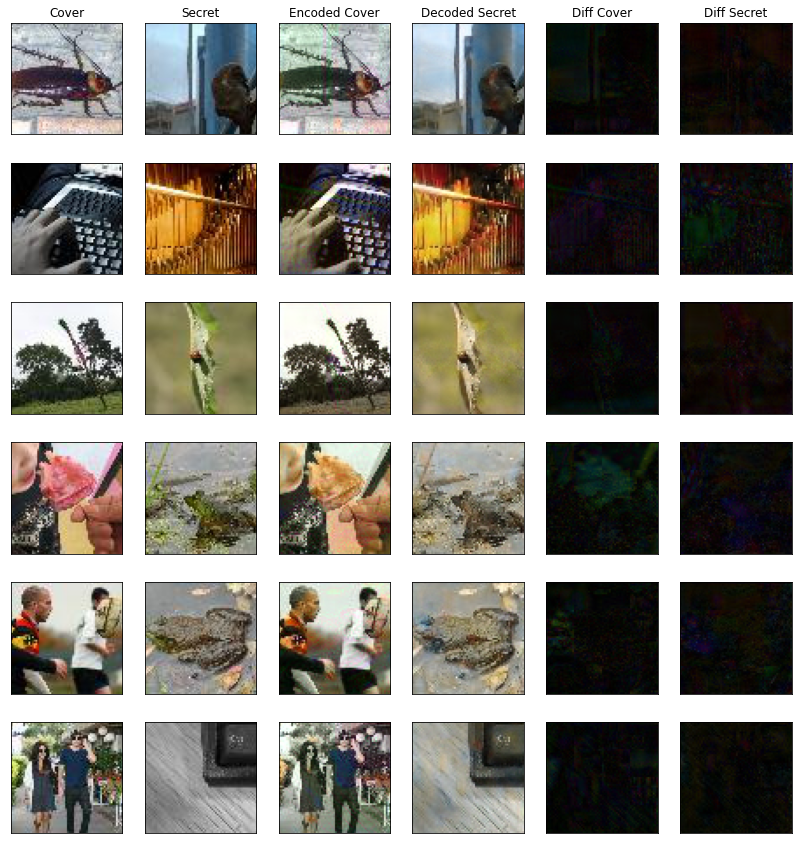

  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 121 | Batch:   0 of 1000. Loss AE    3278.45 | Loss Rev    1872.77:   3%|▎         | 1/32 [00:00<00:20,  1.50it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 121 | Batch:  32 of 1000. Loss AE    3869.02 | Loss Rev    2296.30:   6%|▋         | 2/32 [00:01<00:17,  1.75it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 121 | Batch:  64 of 1000. Loss AE    3832.55 | Loss Rev    2353.19:   9%|▉         | 3/32 [00:01<00:15,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 121 | Batch:  96 of 1000. Loss AE    3664.78 | Loss Rev    2225.24:  12%|█▎        | 4/32 [00:02<00:14,  1.93it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 121 | Batch: 128 of 1000. Loss AE    3474.50 | Loss Rev    2105.38:  16%|█▌        | 5/32 [00:02<00:13,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 121 | Batch: 160 of 1000. Loss AE    3595.21 | Loss Rev    2288.87:  19%|█▉        | 6/32 [00:03<00:13,  1.96it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 121 | Batch: 192 of 1000. Loss AE    3754.39 | Loss Rev    2406.19:  22%|██▏       | 7/32 [00:03<00:12,  1.97it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 121 | Batch: 224 of 1000. Loss AE    3721.73 | Loss Rev    2364.12:  25%|██▌       | 8/32 [00:04<00:12,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 121 | Batch: 256 of 1000. Loss AE    3918.13 | Loss Rev    2578.34:  28%|██▊       | 9/32 [00:04<00:12,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 121 | Batch: 288 of 1000. Loss AE    4112.20 | Loss Rev    2775.41:  31%|███▏      | 10/32 [00:05<00:11,  1.95it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 121 | Batch: 320 of 1000. Loss AE    4075.50 | Loss Rev    2711.54:  34%|███▍      | 11/32 [00:05<00:10,  1.97it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 121 | Batch: 352 of 1000. Loss AE    4240.68 | Loss Rev    2846.31:  38%|███▊      | 12/32 [00:06<00:10,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 121 | Batch: 384 of 1000. Loss AE    4283.87 | Loss Rev    2868.70:  41%|████      | 13/32 [00:06<00:09,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 121 | Batch: 416 of 1000. Loss AE    4256.16 | Loss Rev    2815.12:  44%|████▍     | 14/32 [00:07<00:09,  1.96it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 121 | Batch: 448 of 1000. Loss AE    4250.58 | Loss Rev    2808.22:  47%|████▋     | 15/32 [00:07<00:08,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 121 | Batch: 480 of 1000. Loss AE    4167.03 | Loss Rev    2717.66:  50%|█████     | 16/32 [00:08<00:08,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 121 | Batch: 512 of 1000. Loss AE    4227.17 | Loss Rev    2770.20:  53%|█████▎    | 17/32 [00:08<00:07,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 121 | Batch: 544 of 1000. Loss AE    4200.33 | Loss Rev    2704.23:  56%|█████▋    | 18/32 [00:09<00:06,  2.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 121 | Batch: 576 of 1000. Loss AE    4221.15 | Loss Rev    2718.26:  59%|█████▉    | 19/32 [00:09<00:06,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 121 | Batch: 608 of 1000. Loss AE    4195.94 | Loss Rev    2694.69:  62%|██████▎   | 20/32 [00:10<00:05,  2.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 121 | Batch: 640 of 1000. Loss AE    4171.69 | Loss Rev    2665.49:  66%|██████▌   | 21/32 [00:10<00:05,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 121 | Batch: 672 of 1000. Loss AE    4183.66 | Loss Rev    2673.96:  69%|██████▉   | 22/32 [00:11<00:04,  2.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 121 | Batch: 704 of 1000. Loss AE    4117.33 | Loss Rev    2614.76:  72%|███████▏  | 23/32 [00:11<00:04,  2.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 121 | Batch: 736 of 1000. Loss AE    4097.49 | Loss Rev    2601.64:  75%|███████▌  | 24/32 [00:12<00:03,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 121 | Batch: 768 of 1000. Loss AE    4084.11 | Loss Rev    2594.00:  78%|███████▊  | 25/32 [00:12<00:03,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 121 | Batch: 800 of 1000. Loss AE    4117.16 | Loss Rev    2623.69:  81%|████████▏ | 26/32 [00:13<00:02,  2.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 121 | Batch: 832 of 1000. Loss AE    4069.04 | Loss Rev    2577.73:  84%|████████▍ | 27/32 [00:13<00:02,  2.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 121 | Batch: 864 of 1000. Loss AE    4067.52 | Loss Rev    2578.51:  88%|████████▊ | 28/32 [00:14<00:01,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 121 | Batch: 896 of 1000. Loss AE    4028.68 | Loss Rev    2546.61:  91%|█████████ | 29/32 [00:14<00:01,  2.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 121 | Batch: 928 of 1000. Loss AE    4021.91 | Loss Rev    2543.21:  94%|█████████▍| 30/32 [00:15<00:00,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 121 | Batch: 960 of 1000. Loss AE    4000.46 | Loss Rev    2512.36:  97%|█████████▋| 31/32 [00:15<00:00,  2.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 121 | Batch: 992 of 1000. Loss AE    3898.59 | Loss Rev    2447.74: 100%|██████████| 32/32 [00:15<00:00,  2.02it/s]


121


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 122 | Batch:   0 of 1000. Loss AE    3805.42 | Loss Rev    2505.84:   3%|▎         | 1/32 [00:00<00:15,  1.95it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 122 | Batch:  32 of 1000. Loss AE    3372.51 | Loss Rev    2101.63:   6%|▋         | 2/32 [00:01<00:15,  1.92it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 122 | Batch:  64 of 1000. Loss AE    3495.34 | Loss Rev    2075.52:   9%|▉         | 3/32 [00:01<00:14,  1.97it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 122 | Batch:  96 of 1000. Loss AE    3619.68 | Loss Rev    2104.27:  12%|█▎        | 4/32 [00:02<00:14,  1.88it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 122 | Batch: 128 of 1000. Loss AE    3694.49 | Loss Rev    2129.91:  16%|█▌        | 5/32 [00:02<00:14,  1.91it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 122 | Batch: 160 of 1000. Loss AE    3657.45 | Loss Rev    2105.15:  19%|█▉        | 6/32 [00:03<00:13,  1.94it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 122 | Batch: 192 of 1000. Loss AE    3619.06 | Loss Rev    2070.99:  22%|██▏       | 7/32 [00:03<00:12,  1.95it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 122 | Batch: 224 of 1000. Loss AE    3663.66 | Loss Rev    2023.13:  25%|██▌       | 8/32 [00:04<00:12,  1.97it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 122 | Batch: 256 of 1000. Loss AE    3599.32 | Loss Rev    1971.85:  28%|██▊       | 9/32 [00:04<00:12,  1.89it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 122 | Batch: 288 of 1000. Loss AE    3593.34 | Loss Rev    1963.04:  31%|███▏      | 10/32 [00:05<00:11,  1.85it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 122 | Batch: 320 of 1000. Loss AE    3594.02 | Loss Rev    1983.74:  34%|███▍      | 11/32 [00:05<00:11,  1.90it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 122 | Batch: 352 of 1000. Loss AE    3548.35 | Loss Rev    1955.53:  38%|███▊      | 12/32 [00:06<00:10,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 122 | Batch: 384 of 1000. Loss AE    3468.36 | Loss Rev    1900.13:  41%|████      | 13/32 [00:06<00:09,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 122 | Batch: 416 of 1000. Loss AE    3486.58 | Loss Rev    1889.81:  44%|████▍     | 14/32 [00:07<00:09,  1.96it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 122 | Batch: 448 of 1000. Loss AE    3440.51 | Loss Rev    1856.55:  47%|████▋     | 15/32 [00:07<00:08,  1.96it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 122 | Batch: 480 of 1000. Loss AE    3404.30 | Loss Rev    1829.35:  50%|█████     | 16/32 [00:08<00:08,  1.97it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 122 | Batch: 512 of 1000. Loss AE    3386.51 | Loss Rev    1811.48:  53%|█████▎    | 17/32 [00:08<00:07,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 122 | Batch: 544 of 1000. Loss AE    3334.06 | Loss Rev    1787.93:  56%|█████▋    | 18/32 [00:09<00:07,  1.99it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 122 | Batch: 576 of 1000. Loss AE    3327.33 | Loss Rev    1770.99:  59%|█████▉    | 19/32 [00:09<00:06,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 122 | Batch: 608 of 1000. Loss AE    3331.17 | Loss Rev    1758.59:  62%|██████▎   | 20/32 [00:10<00:06,  2.00it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 122 | Batch: 640 of 1000. Loss AE    3299.56 | Loss Rev    1737.66:  66%|██████▌   | 21/32 [00:10<00:05,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 122 | Batch: 672 of 1000. Loss AE    3263.89 | Loss Rev    1707.87:  69%|██████▉   | 22/32 [00:11<00:05,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 122 | Batch: 704 of 1000. Loss AE    3239.30 | Loss Rev    1684.02:  72%|███████▏  | 23/32 [00:11<00:04,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 122 | Batch: 736 of 1000. Loss AE    3204.54 | Loss Rev    1663.10:  75%|███████▌  | 24/32 [00:12<00:04,  1.98it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 122 | Batch: 768 of 1000. Loss AE    3197.23 | Loss Rev    1653.18:  78%|███████▊  | 25/32 [00:12<00:03,  1.98it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 122 | Batch: 800 of 1000. Loss AE    3185.65 | Loss Rev    1651.53:  81%|████████▏ | 26/32 [00:13<00:03,  1.98it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 122 | Batch: 832 of 1000. Loss AE    3158.21 | Loss Rev    1636.03:  84%|████████▍ | 27/32 [00:13<00:02,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 122 | Batch: 864 of 1000. Loss AE    3147.68 | Loss Rev    1627.73:  88%|████████▊ | 28/32 [00:14<00:01,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 122 | Batch: 896 of 1000. Loss AE    3116.57 | Loss Rev    1611.97:  91%|█████████ | 29/32 [00:14<00:01,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 122 | Batch: 928 of 1000. Loss AE    3112.49 | Loss Rev    1603.89:  94%|█████████▍| 30/32 [00:15<00:00,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 122 | Batch: 960 of 1000. Loss AE    3095.35 | Loss Rev    1598.40:  97%|█████████▋| 31/32 [00:15<00:00,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 122 | Batch: 992 of 1000. Loss AE    3019.44 | Loss Rev    1561.54: 100%|██████████| 32/32 [00:16<00:00,  2.00it/s]


122


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 123 | Batch:   0 of 1000. Loss AE    2769.80 | Loss Rev    1266.88:   3%|▎         | 1/32 [00:00<00:18,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 123 | Batch:  32 of 1000. Loss AE    2815.38 | Loss Rev    1398.42:   6%|▋         | 2/32 [00:01<00:15,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 123 | Batch:  64 of 1000. Loss AE    2929.06 | Loss Rev    1412.93:   9%|▉         | 3/32 [00:01<00:15,  1.82it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 123 | Batch:  96 of 1000. Loss AE    2836.83 | Loss Rev    1376.56:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 123 | Batch: 128 of 1000. Loss AE    2795.32 | Loss Rev    1341.01:  16%|█▌        | 5/32 [00:02<00:15,  1.69it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 123 | Batch: 160 of 1000. Loss AE    2752.01 | Loss Rev    1358.06:  19%|█▉        | 6/32 [00:03<00:14,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 123 | Batch: 192 of 1000. Loss AE    2695.39 | Loss Rev    1342.76:  22%|██▏       | 7/32 [00:03<00:13,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 123 | Batch: 224 of 1000. Loss AE    2667.95 | Loss Rev    1343.33:  25%|██▌       | 8/32 [00:04<00:12,  1.94it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 123 | Batch: 256 of 1000. Loss AE    2630.27 | Loss Rev    1346.60:  28%|██▊       | 9/32 [00:04<00:12,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 123 | Batch: 288 of 1000. Loss AE    2645.09 | Loss Rev    1358.19:  31%|███▏      | 10/32 [00:05<00:11,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 123 | Batch: 320 of 1000. Loss AE    2624.12 | Loss Rev    1351.53:  34%|███▍      | 11/32 [00:06<00:11,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 123 | Batch: 352 of 1000. Loss AE    2628.41 | Loss Rev    1339.19:  38%|███▊      | 12/32 [00:06<00:10,  1.92it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 123 | Batch: 384 of 1000. Loss AE    2645.03 | Loss Rev    1341.25:  41%|████      | 13/32 [00:07<00:10,  1.86it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 123 | Batch: 416 of 1000. Loss AE    2655.73 | Loss Rev    1327.90:  44%|████▍     | 14/32 [00:07<00:09,  1.83it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 123 | Batch: 448 of 1000. Loss AE    2667.81 | Loss Rev    1350.10:  47%|████▋     | 15/32 [00:08<00:08,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 123 | Batch: 480 of 1000. Loss AE    2650.37 | Loss Rev    1346.44:  50%|█████     | 16/32 [00:08<00:08,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 123 | Batch: 512 of 1000. Loss AE    2613.10 | Loss Rev    1332.32:  53%|█████▎    | 17/32 [00:09<00:07,  1.88it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 123 | Batch: 544 of 1000. Loss AE    2597.18 | Loss Rev    1332.49:  56%|█████▋    | 18/32 [00:09<00:07,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 123 | Batch: 576 of 1000. Loss AE    2597.95 | Loss Rev    1338.73:  59%|█████▉    | 19/32 [00:10<00:06,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 123 | Batch: 608 of 1000. Loss AE    2628.55 | Loss Rev    1345.04:  62%|██████▎   | 20/32 [00:10<00:06,  1.94it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 123 | Batch: 640 of 1000. Loss AE    2616.18 | Loss Rev    1338.64:  66%|██████▌   | 21/32 [00:11<00:05,  1.95it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 123 | Batch: 672 of 1000. Loss AE    2630.76 | Loss Rev    1346.56:  69%|██████▉   | 22/32 [00:11<00:05,  1.96it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 123 | Batch: 704 of 1000. Loss AE    2626.35 | Loss Rev    1337.78:  72%|███████▏  | 23/32 [00:12<00:04,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 123 | Batch: 736 of 1000. Loss AE    2624.95 | Loss Rev    1342.12:  75%|███████▌  | 24/32 [00:12<00:04,  1.97it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 123 | Batch: 768 of 1000. Loss AE    2634.65 | Loss Rev    1348.69:  78%|███████▊  | 25/32 [00:13<00:03,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 123 | Batch: 800 of 1000. Loss AE    2644.82 | Loss Rev    1346.89:  81%|████████▏ | 26/32 [00:13<00:03,  1.89it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 123 | Batch: 832 of 1000. Loss AE    2638.64 | Loss Rev    1352.63:  84%|████████▍ | 27/32 [00:14<00:02,  1.91it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 123 | Batch: 864 of 1000. Loss AE    2653.40 | Loss Rev    1363.85:  88%|████████▊ | 28/32 [00:14<00:02,  1.94it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 123 | Batch: 896 of 1000. Loss AE    2647.14 | Loss Rev    1366.22:  91%|█████████ | 29/32 [00:15<00:01,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 123 | Batch: 928 of 1000. Loss AE    2659.31 | Loss Rev    1373.30:  94%|█████████▍| 30/32 [00:15<00:01,  1.95it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 123 | Batch: 960 of 1000. Loss AE    2651.48 | Loss Rev    1368.17:  97%|█████████▋| 31/32 [00:16<00:00,  1.95it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 123 | Batch: 992 of 1000. Loss AE    2610.65 | Loss Rev    1341.13: 100%|██████████| 32/32 [00:16<00:00,  1.92it/s]


123


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 124 | Batch:   0 of 1000. Loss AE    2805.75 | Loss Rev    1547.84:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 124 | Batch:  32 of 1000. Loss AE    3195.65 | Loss Rev    1539.43:   6%|▋         | 2/32 [00:01<00:18,  1.66it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 124 | Batch:  64 of 1000. Loss AE    3025.10 | Loss Rev    1543.70:   9%|▉         | 3/32 [00:01<00:18,  1.61it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 124 | Batch:  96 of 1000. Loss AE    2867.35 | Loss Rev    1477.92:  12%|█▎        | 4/32 [00:02<00:17,  1.63it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 124 | Batch: 128 of 1000. Loss AE    2903.95 | Loss Rev    1509.32:  16%|█▌        | 5/32 [00:03<00:16,  1.60it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 124 | Batch: 160 of 1000. Loss AE    2873.63 | Loss Rev    1495.08:  19%|█▉        | 6/32 [00:03<00:16,  1.61it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 124 | Batch: 192 of 1000. Loss AE    2848.31 | Loss Rev    1496.77:  22%|██▏       | 7/32 [00:04<00:15,  1.61it/s]

1/1 [==============================] - 0s 80ms/step


Epoch 124 | Batch: 224 of 1000. Loss AE    2855.85 | Loss Rev    1505.47:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 124 | Batch: 256 of 1000. Loss AE    2789.31 | Loss Rev    1456.95:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 124 | Batch: 288 of 1000. Loss AE    2783.73 | Loss Rev    1455.28:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 124 | Batch: 320 of 1000. Loss AE    2774.64 | Loss Rev    1445.32:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 124 | Batch: 352 of 1000. Loss AE    2765.48 | Loss Rev    1448.99:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 124 | Batch: 384 of 1000. Loss AE    2746.72 | Loss Rev    1438.91:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 124 | Batch: 416 of 1000. Loss AE    2771.58 | Loss Rev    1447.06:  44%|████▍     | 14/32 [00:08<00:11,  1.59it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 124 | Batch: 448 of 1000. Loss AE    2756.73 | Loss Rev    1439.28:  47%|████▋     | 15/32 [00:09<00:10,  1.65it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 124 | Batch: 480 of 1000. Loss AE    2760.37 | Loss Rev    1455.63:  50%|█████     | 16/32 [00:09<00:09,  1.67it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 124 | Batch: 512 of 1000. Loss AE    2741.53 | Loss Rev    1451.26:  53%|█████▎    | 17/32 [00:10<00:08,  1.76it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 124 | Batch: 544 of 1000. Loss AE    2751.51 | Loss Rev    1451.24:  56%|█████▋    | 18/32 [00:10<00:07,  1.82it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 124 | Batch: 576 of 1000. Loss AE    2740.60 | Loss Rev    1441.76:  59%|█████▉    | 19/32 [00:11<00:07,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 124 | Batch: 608 of 1000. Loss AE    2724.87 | Loss Rev    1421.61:  62%|██████▎   | 20/32 [00:12<00:06,  1.85it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 124 | Batch: 640 of 1000. Loss AE    2725.71 | Loss Rev    1425.47:  66%|██████▌   | 21/32 [00:12<00:06,  1.83it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 124 | Batch: 672 of 1000. Loss AE    2734.33 | Loss Rev    1432.42:  69%|██████▉   | 22/32 [00:13<00:05,  1.89it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 124 | Batch: 704 of 1000. Loss AE    2718.65 | Loss Rev    1433.58:  72%|███████▏  | 23/32 [00:13<00:04,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 124 | Batch: 736 of 1000. Loss AE    2699.70 | Loss Rev    1420.21:  75%|███████▌  | 24/32 [00:14<00:04,  1.98it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 124 | Batch: 768 of 1000. Loss AE    2690.82 | Loss Rev    1412.00:  78%|███████▊  | 25/32 [00:14<00:03,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 124 | Batch: 800 of 1000. Loss AE    2683.04 | Loss Rev    1410.66:  81%|████████▏ | 26/32 [00:15<00:03,  1.98it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 124 | Batch: 832 of 1000. Loss AE    2670.93 | Loss Rev    1400.96:  84%|████████▍ | 27/32 [00:15<00:02,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 124 | Batch: 864 of 1000. Loss AE    2671.11 | Loss Rev    1401.43:  88%|████████▊ | 28/32 [00:16<00:02,  1.97it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 124 | Batch: 896 of 1000. Loss AE    2664.08 | Loss Rev    1399.65:  91%|█████████ | 29/32 [00:16<00:01,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 124 | Batch: 928 of 1000. Loss AE    2648.88 | Loss Rev    1393.60:  94%|█████████▍| 30/32 [00:17<00:01,  1.96it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 124 | Batch: 960 of 1000. Loss AE    2649.26 | Loss Rev    1391.27:  97%|█████████▋| 31/32 [00:17<00:00,  1.97it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 124 | Batch: 992 of 1000. Loss AE    2588.63 | Loss Rev    1361.53: 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]


124


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 125 | Batch:   0 of 1000. Loss AE    2391.68 | Loss Rev    1323.16:   3%|▎         | 1/32 [00:00<00:16,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 125 | Batch:  32 of 1000. Loss AE    2515.35 | Loss Rev    1368.21:   6%|▋         | 2/32 [00:01<00:16,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 125 | Batch:  64 of 1000. Loss AE    2571.09 | Loss Rev    1373.68:   9%|▉         | 3/32 [00:01<00:15,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 125 | Batch:  96 of 1000. Loss AE    2650.96 | Loss Rev    1458.45:  12%|█▎        | 4/32 [00:02<00:15,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 125 | Batch: 128 of 1000. Loss AE    2611.98 | Loss Rev    1421.70:  16%|█▌        | 5/32 [00:02<00:14,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 125 | Batch: 160 of 1000. Loss AE    2615.24 | Loss Rev    1434.33:  19%|█▉        | 6/32 [00:03<00:13,  1.92it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 125 | Batch: 192 of 1000. Loss AE    2582.81 | Loss Rev    1403.46:  22%|██▏       | 7/32 [00:03<00:12,  1.94it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 125 | Batch: 224 of 1000. Loss AE    2563.59 | Loss Rev    1386.28:  25%|██▌       | 8/32 [00:04<00:12,  1.90it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 125 | Batch: 256 of 1000. Loss AE    2556.38 | Loss Rev    1384.34:  28%|██▊       | 9/32 [00:04<00:11,  1.93it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 125 | Batch: 288 of 1000. Loss AE    2514.32 | Loss Rev    1371.97:  31%|███▏      | 10/32 [00:05<00:11,  1.96it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 125 | Batch: 320 of 1000. Loss AE    2521.01 | Loss Rev    1356.69:  34%|███▍      | 11/32 [00:05<00:10,  1.97it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 125 | Batch: 352 of 1000. Loss AE    2528.93 | Loss Rev    1374.97:  38%|███▊      | 12/32 [00:06<00:10,  1.98it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 125 | Batch: 384 of 1000. Loss AE    2560.48 | Loss Rev    1388.57:  41%|████      | 13/32 [00:06<00:09,  2.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 125 | Batch: 416 of 1000. Loss AE    2595.62 | Loss Rev    1386.39:  44%|████▍     | 14/32 [00:07<00:08,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 125 | Batch: 448 of 1000. Loss AE    2576.98 | Loss Rev    1368.72:  47%|████▋     | 15/32 [00:07<00:08,  1.93it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 125 | Batch: 480 of 1000. Loss AE    2584.46 | Loss Rev    1371.82:  50%|█████     | 16/32 [00:08<00:08,  1.95it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 125 | Batch: 512 of 1000. Loss AE    2617.91 | Loss Rev    1376.84:  53%|█████▎    | 17/32 [00:08<00:07,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 125 | Batch: 544 of 1000. Loss AE    2639.18 | Loss Rev    1390.58:  56%|█████▋    | 18/32 [00:09<00:07,  1.89it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 125 | Batch: 576 of 1000. Loss AE    2663.48 | Loss Rev    1400.71:  59%|█████▉    | 19/32 [00:09<00:07,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 125 | Batch: 608 of 1000. Loss AE    2681.44 | Loss Rev    1404.56:  62%|██████▎   | 20/32 [00:10<00:06,  1.92it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 125 | Batch: 640 of 1000. Loss AE    2685.27 | Loss Rev    1419.39:  66%|██████▌   | 21/32 [00:10<00:05,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 125 | Batch: 672 of 1000. Loss AE    2725.40 | Loss Rev    1455.17:  69%|██████▉   | 22/32 [00:11<00:05,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 125 | Batch: 704 of 1000. Loss AE    2778.59 | Loss Rev    1522.59:  72%|███████▏  | 23/32 [00:12<00:04,  1.83it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 125 | Batch: 736 of 1000. Loss AE    2877.00 | Loss Rev    1627.16:  75%|███████▌  | 24/32 [00:12<00:04,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 125 | Batch: 768 of 1000. Loss AE    3062.67 | Loss Rev    1802.88:  78%|███████▊  | 25/32 [00:13<00:03,  1.91it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 125 | Batch: 800 of 1000. Loss AE    3055.13 | Loss Rev    1803.30:  81%|████████▏ | 26/32 [00:13<00:03,  1.84it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 125 | Batch: 832 of 1000. Loss AE    3072.26 | Loss Rev    1823.25:  84%|████████▍ | 27/32 [00:14<00:02,  1.89it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 125 | Batch: 864 of 1000. Loss AE    3138.74 | Loss Rev    1884.93:  88%|████████▊ | 28/32 [00:14<00:02,  1.92it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 125 | Batch: 896 of 1000. Loss AE    3130.43 | Loss Rev    1867.78:  91%|█████████ | 29/32 [00:15<00:01,  1.94it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 125 | Batch: 928 of 1000. Loss AE    3167.67 | Loss Rev    1898.70:  94%|█████████▍| 30/32 [00:15<00:01,  1.95it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 125 | Batch: 960 of 1000. Loss AE    3232.60 | Loss Rev    1953.58:  97%|█████████▋| 31/32 [00:16<00:00,  1.97it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 125 | Batch: 992 of 1000. Loss AE    3150.69 | Loss Rev    1901.54: 100%|██████████| 32/32 [00:16<00:00,  1.95it/s]

125



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 126 | Batch:   0 of 1000. Loss AE    4858.58 | Loss Rev    2931.66:   3%|▎         | 1/32 [00:00<00:19,  1.61it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 126 | Batch:  32 of 1000. Loss AE    4156.58 | Loss Rev    2628.73:   6%|▋         | 2/32 [00:01<00:16,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 126 | Batch:  64 of 1000. Loss AE    3803.50 | Loss Rev    2263.34:   9%|▉         | 3/32 [00:01<00:15,  1.91it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 126 | Batch:  96 of 1000. Loss AE    3740.04 | Loss Rev    2231.73:  12%|█▎        | 4/32 [00:02<00:14,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 126 | Batch: 128 of 1000. Loss AE    3618.42 | Loss Rev    2137.55:  16%|█▌        | 5/32 [00:02<00:14,  1.92it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 126 | Batch: 160 of 1000. Loss AE    3538.51 | Loss Rev    2087.29:  19%|█▉        | 6/32 [00:03<00:13,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 126 | Batch: 192 of 1000. Loss AE    3436.65 | Loss Rev    1993.96:  22%|██▏       | 7/32 [00:03<00:13,  1.87it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 126 | Batch: 224 of 1000. Loss AE    3497.51 | Loss Rev    2021.81:  25%|██▌       | 8/32 [00:04<00:12,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 126 | Batch: 256 of 1000. Loss AE    3559.21 | Loss Rev    2047.78:  28%|██▊       | 9/32 [00:04<00:11,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 126 | Batch: 288 of 1000. Loss AE    3564.61 | Loss Rev    2020.56:  31%|███▏      | 10/32 [00:05<00:11,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 126 | Batch: 320 of 1000. Loss AE    3498.87 | Loss Rev    1970.15:  34%|███▍      | 11/32 [00:05<00:10,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 126 | Batch: 352 of 1000. Loss AE    3461.28 | Loss Rev    1942.27:  38%|███▊      | 12/32 [00:06<00:10,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 126 | Batch: 384 of 1000. Loss AE    3406.56 | Loss Rev    1904.25:  41%|████      | 13/32 [00:06<00:09,  1.91it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 126 | Batch: 416 of 1000. Loss AE    3388.83 | Loss Rev    1883.88:  44%|████▍     | 14/32 [00:07<00:09,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 126 | Batch: 448 of 1000. Loss AE    3348.36 | Loss Rev    1849.20:  47%|████▋     | 15/32 [00:07<00:08,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 126 | Batch: 480 of 1000. Loss AE    3294.99 | Loss Rev    1814.04:  50%|█████     | 16/32 [00:08<00:08,  1.95it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 126 | Batch: 512 of 1000. Loss AE    3273.03 | Loss Rev    1798.86:  53%|█████▎    | 17/32 [00:08<00:07,  1.96it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 126 | Batch: 544 of 1000. Loss AE    3227.16 | Loss Rev    1769.64:  56%|█████▋    | 18/32 [00:09<00:07,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 126 | Batch: 576 of 1000. Loss AE    3206.98 | Loss Rev    1750.32:  59%|█████▉    | 19/32 [00:09<00:06,  1.99it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 126 | Batch: 608 of 1000. Loss AE    3201.04 | Loss Rev    1744.41:  62%|██████▎   | 20/32 [00:10<00:06,  1.98it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 126 | Batch: 640 of 1000. Loss AE    3179.94 | Loss Rev    1727.40:  66%|██████▌   | 21/32 [00:10<00:05,  2.00it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 126 | Batch: 672 of 1000. Loss AE    3179.10 | Loss Rev    1723.99:  69%|██████▉   | 22/32 [00:11<00:05,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 126 | Batch: 704 of 1000. Loss AE    3167.10 | Loss Rev    1701.87:  72%|███████▏  | 23/32 [00:11<00:04,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 126 | Batch: 736 of 1000. Loss AE    3151.72 | Loss Rev    1690.11:  75%|███████▌  | 24/32 [00:12<00:04,  1.93it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 126 | Batch: 768 of 1000. Loss AE    3139.42 | Loss Rev    1681.46:  78%|███████▊  | 25/32 [00:12<00:03,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 126 | Batch: 800 of 1000. Loss AE    3129.48 | Loss Rev    1677.37:  81%|████████▏ | 26/32 [00:13<00:03,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 126 | Batch: 832 of 1000. Loss AE    3121.59 | Loss Rev    1662.47:  84%|████████▍ | 27/32 [00:14<00:02,  1.83it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 126 | Batch: 864 of 1000. Loss AE    3095.84 | Loss Rev    1645.21:  88%|████████▊ | 28/32 [00:14<00:02,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 126 | Batch: 896 of 1000. Loss AE    3099.36 | Loss Rev    1640.46:  91%|█████████ | 29/32 [00:15<00:01,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 126 | Batch: 928 of 1000. Loss AE    3084.61 | Loss Rev    1629.09:  94%|█████████▍| 30/32 [00:15<00:01,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 126 | Batch: 960 of 1000. Loss AE    3088.51 | Loss Rev    1618.37:  97%|█████████▋| 31/32 [00:16<00:00,  1.91it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 126 | Batch: 992 of 1000. Loss AE    3014.97 | Loss Rev    1577.36: 100%|██████████| 32/32 [00:16<00:00,  1.95it/s]

126



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 127 | Batch:   0 of 1000. Loss AE    2412.50 | Loss Rev    1127.88:   3%|▎         | 1/32 [00:00<00:18,  1.67it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 127 | Batch:  32 of 1000. Loss AE    2651.54 | Loss Rev    1268.71:   6%|▋         | 2/32 [00:01<00:17,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 127 | Batch:  64 of 1000. Loss AE    2728.01 | Loss Rev    1308.01:   9%|▉         | 3/32 [00:01<00:15,  1.83it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 127 | Batch:  96 of 1000. Loss AE    2724.10 | Loss Rev    1326.71:  12%|█▎        | 4/32 [00:02<00:15,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 127 | Batch: 128 of 1000. Loss AE    2641.85 | Loss Rev    1269.49:  16%|█▌        | 5/32 [00:02<00:14,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 127 | Batch: 160 of 1000. Loss AE    2671.79 | Loss Rev    1230.26:  19%|█▉        | 6/32 [00:03<00:13,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 127 | Batch: 192 of 1000. Loss AE    2647.42 | Loss Rev    1252.34:  22%|██▏       | 7/32 [00:03<00:12,  1.96it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 127 | Batch: 224 of 1000. Loss AE    2689.44 | Loss Rev    1255.80:  25%|██▌       | 8/32 [00:04<00:12,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 127 | Batch: 256 of 1000. Loss AE    2660.88 | Loss Rev    1266.01:  28%|██▊       | 9/32 [00:04<00:11,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 127 | Batch: 288 of 1000. Loss AE    2691.57 | Loss Rev    1264.22:  31%|███▏      | 10/32 [00:05<00:11,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 127 | Batch: 320 of 1000. Loss AE    2682.22 | Loss Rev    1258.42:  34%|███▍      | 11/32 [00:05<00:10,  2.00it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 127 | Batch: 352 of 1000. Loss AE    2669.94 | Loss Rev    1261.17:  38%|███▊      | 12/32 [00:06<00:10,  1.92it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 127 | Batch: 384 of 1000. Loss AE    2692.91 | Loss Rev    1307.14:  41%|████      | 13/32 [00:06<00:09,  1.95it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 127 | Batch: 416 of 1000. Loss AE    2705.86 | Loss Rev    1334.23:  44%|████▍     | 14/32 [00:07<00:09,  1.97it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 127 | Batch: 448 of 1000. Loss AE    2666.74 | Loss Rev    1320.87:  47%|████▋     | 15/32 [00:07<00:08,  1.98it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 127 | Batch: 480 of 1000. Loss AE    2671.19 | Loss Rev    1336.61:  50%|█████     | 16/32 [00:08<00:08,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 127 | Batch: 512 of 1000. Loss AE    2669.38 | Loss Rev    1334.47:  53%|█████▎    | 17/32 [00:08<00:07,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 127 | Batch: 544 of 1000. Loss AE    2657.30 | Loss Rev    1330.05:  56%|█████▋    | 18/32 [00:09<00:06,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 127 | Batch: 576 of 1000. Loss AE    2673.95 | Loss Rev    1341.92:  59%|█████▉    | 19/32 [00:09<00:06,  2.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 127 | Batch: 608 of 1000. Loss AE    2677.27 | Loss Rev    1345.75:  62%|██████▎   | 20/32 [00:10<00:05,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 127 | Batch: 640 of 1000. Loss AE    2681.90 | Loss Rev    1360.14:  66%|██████▌   | 21/32 [00:10<00:05,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 127 | Batch: 672 of 1000. Loss AE    2675.91 | Loss Rev    1357.08:  69%|██████▉   | 22/32 [00:11<00:04,  2.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 127 | Batch: 704 of 1000. Loss AE    2665.93 | Loss Rev    1348.41:  72%|███████▏  | 23/32 [00:11<00:04,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 127 | Batch: 736 of 1000. Loss AE    2655.08 | Loss Rev    1349.28:  75%|███████▌  | 24/32 [00:12<00:03,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 127 | Batch: 768 of 1000. Loss AE    2656.79 | Loss Rev    1353.83:  78%|███████▊  | 25/32 [00:12<00:03,  1.93it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 127 | Batch: 800 of 1000. Loss AE    2647.64 | Loss Rev    1354.90:  81%|████████▏ | 26/32 [00:13<00:03,  1.96it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 127 | Batch: 832 of 1000. Loss AE    2642.66 | Loss Rev    1353.75:  84%|████████▍ | 27/32 [00:13<00:02,  1.90it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 127 | Batch: 864 of 1000. Loss AE    2641.77 | Loss Rev    1353.56:  88%|████████▊ | 28/32 [00:14<00:02,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 127 | Batch: 896 of 1000. Loss AE    2643.55 | Loss Rev    1355.41:  91%|█████████ | 29/32 [00:14<00:01,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 127 | Batch: 928 of 1000. Loss AE    2635.95 | Loss Rev    1354.65:  94%|█████████▍| 30/32 [00:15<00:01,  1.96it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 127 | Batch: 960 of 1000. Loss AE    2642.52 | Loss Rev    1356.78:  97%|█████████▋| 31/32 [00:15<00:00,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 127 | Batch: 992 of 1000. Loss AE    2582.45 | Loss Rev    1327.27: 100%|██████████| 32/32 [00:16<00:00,  1.99it/s]

127



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 128 | Batch:   0 of 1000. Loss AE    2828.01 | Loss Rev    1427.16:   3%|▎         | 1/32 [00:00<00:18,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 128 | Batch:  32 of 1000. Loss AE    2873.42 | Loss Rev    1461.79:   6%|▋         | 2/32 [00:01<00:16,  1.85it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 128 | Batch:  64 of 1000. Loss AE    2913.75 | Loss Rev    1589.42:   9%|▉         | 3/32 [00:01<00:16,  1.81it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 128 | Batch:  96 of 1000. Loss AE    3041.08 | Loss Rev    1768.25:  12%|█▎        | 4/32 [00:02<00:16,  1.75it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 128 | Batch: 128 of 1000. Loss AE    3409.67 | Loss Rev    1943.26:  16%|█▌        | 5/32 [00:02<00:14,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 128 | Batch: 160 of 1000. Loss AE    3256.18 | Loss Rev    1848.79:  19%|█▉        | 6/32 [00:03<00:14,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 128 | Batch: 192 of 1000. Loss AE    3107.92 | Loss Rev    1764.59:  22%|██▏       | 7/32 [00:03<00:13,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 128 | Batch: 224 of 1000. Loss AE    3035.75 | Loss Rev    1718.85:  25%|██▌       | 8/32 [00:04<00:12,  1.91it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 128 | Batch: 256 of 1000. Loss AE    2997.98 | Loss Rev    1686.41:  28%|██▊       | 9/32 [00:04<00:12,  1.86it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 128 | Batch: 288 of 1000. Loss AE    3018.17 | Loss Rev    1698.91:  31%|███▏      | 10/32 [00:05<00:11,  1.92it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 128 | Batch: 320 of 1000. Loss AE    2980.00 | Loss Rev    1672.91:  34%|███▍      | 11/32 [00:05<00:10,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 128 | Batch: 352 of 1000. Loss AE    2954.28 | Loss Rev    1645.49:  38%|███▊      | 12/32 [00:06<00:10,  1.97it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 128 | Batch: 384 of 1000. Loss AE    2956.64 | Loss Rev    1649.17:  41%|████      | 13/32 [00:06<00:09,  1.99it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 128 | Batch: 416 of 1000. Loss AE    2937.18 | Loss Rev    1635.61:  44%|████▍     | 14/32 [00:07<00:08,  2.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 128 | Batch: 448 of 1000. Loss AE    2913.39 | Loss Rev    1627.94:  47%|████▋     | 15/32 [00:07<00:08,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 128 | Batch: 480 of 1000. Loss AE    2883.56 | Loss Rev    1612.16:  50%|█████     | 16/32 [00:08<00:07,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 128 | Batch: 512 of 1000. Loss AE    2879.11 | Loss Rev    1611.55:  53%|█████▎    | 17/32 [00:08<00:07,  1.93it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 128 | Batch: 544 of 1000. Loss AE    2848.79 | Loss Rev    1593.78:  56%|█████▋    | 18/32 [00:09<00:07,  1.92it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 128 | Batch: 576 of 1000. Loss AE    2823.95 | Loss Rev    1576.35:  59%|█████▉    | 19/32 [00:09<00:06,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 128 | Batch: 608 of 1000. Loss AE    2840.00 | Loss Rev    1589.83:  62%|██████▎   | 20/32 [00:10<00:06,  1.90it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 128 | Batch: 640 of 1000. Loss AE    2814.16 | Loss Rev    1576.94:  66%|██████▌   | 21/32 [00:11<00:05,  1.86it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 128 | Batch: 672 of 1000. Loss AE    2816.51 | Loss Rev    1567.89:  69%|██████▉   | 22/32 [00:11<00:05,  1.80it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 128 | Batch: 704 of 1000. Loss AE    2794.42 | Loss Rev    1550.94:  72%|███████▏  | 23/32 [00:12<00:04,  1.85it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 128 | Batch: 736 of 1000. Loss AE    2793.50 | Loss Rev    1546.97:  75%|███████▌  | 24/32 [00:12<00:04,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 128 | Batch: 768 of 1000. Loss AE    2798.37 | Loss Rev    1549.80:  78%|███████▊  | 25/32 [00:13<00:03,  1.92it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 128 | Batch: 800 of 1000. Loss AE    2794.00 | Loss Rev    1538.86:  81%|████████▏ | 26/32 [00:13<00:03,  1.96it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 128 | Batch: 832 of 1000. Loss AE    2774.35 | Loss Rev    1523.36:  84%|████████▍ | 27/32 [00:14<00:02,  1.97it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 128 | Batch: 864 of 1000. Loss AE    2781.62 | Loss Rev    1521.49:  88%|████████▊ | 28/32 [00:14<00:02,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 128 | Batch: 896 of 1000. Loss AE    2770.34 | Loss Rev    1507.21:  91%|█████████ | 29/32 [00:15<00:01,  1.99it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 128 | Batch: 928 of 1000. Loss AE    2763.88 | Loss Rev    1501.97:  94%|█████████▍| 30/32 [00:15<00:01,  1.92it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 128 | Batch: 960 of 1000. Loss AE    2753.69 | Loss Rev    1494.68:  97%|█████████▋| 31/32 [00:16<00:00,  1.95it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 128 | Batch: 992 of 1000. Loss AE    2696.52 | Loss Rev    1459.26: 100%|██████████| 32/32 [00:16<00:00,  1.95it/s]


128


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 129 | Batch:   0 of 1000. Loss AE    2610.75 | Loss Rev    1312.13:   3%|▎         | 1/32 [00:00<00:16,  1.88it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 129 | Batch:  32 of 1000. Loss AE    2496.59 | Loss Rev    1238.73:   6%|▋         | 2/32 [00:01<00:16,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 129 | Batch:  64 of 1000. Loss AE    2617.63 | Loss Rev    1287.40:   9%|▉         | 3/32 [00:01<00:15,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 129 | Batch:  96 of 1000. Loss AE    2565.31 | Loss Rev    1282.08:  12%|█▎        | 4/32 [00:02<00:14,  1.95it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 129 | Batch: 128 of 1000. Loss AE    2758.27 | Loss Rev    1377.80:  16%|█▌        | 5/32 [00:02<00:13,  1.96it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 129 | Batch: 160 of 1000. Loss AE    2778.49 | Loss Rev    1441.76:  19%|█▉        | 6/32 [00:03<00:13,  1.98it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 129 | Batch: 192 of 1000. Loss AE    2693.37 | Loss Rev    1401.36:  22%|██▏       | 7/32 [00:03<00:12,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 129 | Batch: 224 of 1000. Loss AE    2730.90 | Loss Rev    1427.57:  25%|██▌       | 8/32 [00:04<00:12,  1.99it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 129 | Batch: 256 of 1000. Loss AE    2706.10 | Loss Rev    1397.31:  28%|██▊       | 9/32 [00:04<00:11,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 129 | Batch: 288 of 1000. Loss AE    2698.91 | Loss Rev    1395.92:  31%|███▏      | 10/32 [00:05<00:10,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 129 | Batch: 320 of 1000. Loss AE    2702.32 | Loss Rev    1387.46:  34%|███▍      | 11/32 [00:05<00:10,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 129 | Batch: 352 of 1000. Loss AE    2672.53 | Loss Rev    1386.24:  38%|███▊      | 12/32 [00:06<00:09,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 129 | Batch: 384 of 1000. Loss AE    2672.34 | Loss Rev    1387.86:  41%|████      | 13/32 [00:06<00:09,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 129 | Batch: 416 of 1000. Loss AE    2694.84 | Loss Rev    1396.51:  44%|████▍     | 14/32 [00:07<00:08,  2.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 129 | Batch: 448 of 1000. Loss AE    2696.64 | Loss Rev    1413.63:  47%|████▋     | 15/32 [00:07<00:08,  1.95it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 129 | Batch: 480 of 1000. Loss AE    2700.06 | Loss Rev    1412.01:  50%|█████     | 16/32 [00:08<00:08,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 129 | Batch: 512 of 1000. Loss AE    2674.85 | Loss Rev    1399.39:  53%|█████▎    | 17/32 [00:08<00:08,  1.87it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 129 | Batch: 544 of 1000. Loss AE    2672.54 | Loss Rev    1407.51:  56%|█████▋    | 18/32 [00:09<00:07,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 129 | Batch: 576 of 1000. Loss AE    2671.86 | Loss Rev    1404.93:  59%|█████▉    | 19/32 [00:09<00:06,  1.93it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 129 | Batch: 608 of 1000. Loss AE    2711.78 | Loss Rev    1413.80:  62%|██████▎   | 20/32 [00:10<00:06,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 129 | Batch: 640 of 1000. Loss AE    2688.03 | Loss Rev    1409.59:  66%|██████▌   | 21/32 [00:10<00:05,  1.89it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 129 | Batch: 672 of 1000. Loss AE    2712.51 | Loss Rev    1442.49:  69%|██████▉   | 22/32 [00:11<00:05,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 129 | Batch: 704 of 1000. Loss AE    2744.19 | Loss Rev    1477.17:  72%|███████▏  | 23/32 [00:11<00:04,  1.87it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 129 | Batch: 736 of 1000. Loss AE    2746.95 | Loss Rev    1477.61:  75%|███████▌  | 24/32 [00:12<00:04,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 129 | Batch: 768 of 1000. Loss AE    2745.48 | Loss Rev    1484.39:  78%|███████▊  | 25/32 [00:12<00:03,  1.88it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 129 | Batch: 800 of 1000. Loss AE    2726.74 | Loss Rev    1467.44:  81%|████████▏ | 26/32 [00:13<00:03,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 129 | Batch: 832 of 1000. Loss AE    2735.79 | Loss Rev    1476.41:  84%|████████▍ | 27/32 [00:13<00:02,  1.86it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 129 | Batch: 864 of 1000. Loss AE    2721.02 | Loss Rev    1468.13:  88%|████████▊ | 28/32 [00:14<00:02,  1.82it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 129 | Batch: 896 of 1000. Loss AE    2712.24 | Loss Rev    1463.49:  91%|█████████ | 29/32 [00:15<00:01,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 129 | Batch: 928 of 1000. Loss AE    2708.18 | Loss Rev    1463.93:  94%|█████████▍| 30/32 [00:15<00:01,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 129 | Batch: 960 of 1000. Loss AE    2701.52 | Loss Rev    1460.24:  97%|█████████▋| 31/32 [00:16<00:00,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 129 | Batch: 992 of 1000. Loss AE    2637.70 | Loss Rev    1426.34: 100%|██████████| 32/32 [00:16<00:00,  1.95it/s]

129



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 130 | Batch:   0 of 1000. Loss AE    2562.54 | Loss Rev    1583.55:   3%|▎         | 1/32 [00:00<00:18,  1.65it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 130 | Batch:  32 of 1000. Loss AE    3117.13 | Loss Rev    2042.35:   6%|▋         | 2/32 [00:01<00:17,  1.69it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 130 | Batch:  64 of 1000. Loss AE    3571.11 | Loss Rev    2405.94:   9%|▉         | 3/32 [00:01<00:16,  1.79it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 130 | Batch:  96 of 1000. Loss AE    3498.03 | Loss Rev    2303.97:  12%|█▎        | 4/32 [00:02<00:15,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 130 | Batch: 128 of 1000. Loss AE    3495.25 | Loss Rev    2199.88:  16%|█▌        | 5/32 [00:02<00:14,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 130 | Batch: 160 of 1000. Loss AE    3474.38 | Loss Rev    2186.16:  19%|█▉        | 6/32 [00:03<00:13,  1.92it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 130 | Batch: 192 of 1000. Loss AE    3401.01 | Loss Rev    2132.65:  22%|██▏       | 7/32 [00:03<00:12,  1.93it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 130 | Batch: 224 of 1000. Loss AE    3341.62 | Loss Rev    2042.27:  25%|██▌       | 8/32 [00:04<00:12,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 130 | Batch: 256 of 1000. Loss AE    3304.12 | Loss Rev    2032.26:  28%|██▊       | 9/32 [00:04<00:11,  1.92it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 130 | Batch: 288 of 1000. Loss AE    3344.91 | Loss Rev    2088.30:  31%|███▏      | 10/32 [00:05<00:11,  1.95it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 130 | Batch: 320 of 1000. Loss AE    3309.57 | Loss Rev    2067.41:  34%|███▍      | 11/32 [00:05<00:11,  1.86it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 130 | Batch: 352 of 1000. Loss AE    3287.85 | Loss Rev    2014.74:  38%|███▊      | 12/32 [00:06<00:10,  1.91it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 130 | Batch: 384 of 1000. Loss AE    3280.28 | Loss Rev    2000.01:  41%|████      | 13/32 [00:06<00:09,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 130 | Batch: 416 of 1000. Loss AE    3260.92 | Loss Rev    1987.45:  44%|████▍     | 14/32 [00:07<00:09,  1.86it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 130 | Batch: 448 of 1000. Loss AE    3237.11 | Loss Rev    1941.25:  47%|████▋     | 15/32 [00:07<00:08,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 130 | Batch: 480 of 1000. Loss AE    3256.58 | Loss Rev    1940.52:  50%|█████     | 16/32 [00:08<00:08,  1.85it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 130 | Batch: 512 of 1000. Loss AE    3233.45 | Loss Rev    1923.38:  53%|█████▎    | 17/32 [00:09<00:07,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 130 | Batch: 544 of 1000. Loss AE    3209.86 | Loss Rev    1900.45:  56%|█████▋    | 18/32 [00:09<00:07,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 130 | Batch: 576 of 1000. Loss AE    3198.00 | Loss Rev    1887.57:  59%|█████▉    | 19/32 [00:10<00:06,  1.96it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 130 | Batch: 608 of 1000. Loss AE    3220.45 | Loss Rev    1893.86:  62%|██████▎   | 20/32 [00:10<00:06,  1.97it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 130 | Batch: 640 of 1000. Loss AE    3206.32 | Loss Rev    1883.01:  66%|██████▌   | 21/32 [00:11<00:05,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 130 | Batch: 672 of 1000. Loss AE    3196.18 | Loss Rev    1860.66:  69%|██████▉   | 22/32 [00:11<00:05,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 130 | Batch: 704 of 1000. Loss AE    3178.40 | Loss Rev    1838.93:  72%|███████▏  | 23/32 [00:12<00:04,  1.91it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 130 | Batch: 736 of 1000. Loss AE    3146.08 | Loss Rev    1809.55:  75%|███████▌  | 24/32 [00:12<00:04,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 130 | Batch: 768 of 1000. Loss AE    3158.22 | Loss Rev    1813.44:  78%|███████▊  | 25/32 [00:13<00:03,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 130 | Batch: 800 of 1000. Loss AE    3137.41 | Loss Rev    1790.94:  81%|████████▏ | 26/32 [00:13<00:03,  1.89it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 130 | Batch: 832 of 1000. Loss AE    3120.03 | Loss Rev    1769.41:  84%|████████▍ | 27/32 [00:14<00:02,  1.93it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 130 | Batch: 864 of 1000. Loss AE    3100.94 | Loss Rev    1750.55:  88%|████████▊ | 28/32 [00:14<00:02,  1.95it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 130 | Batch: 896 of 1000. Loss AE    3081.65 | Loss Rev    1733.41:  91%|█████████ | 29/32 [00:15<00:01,  1.97it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 130 | Batch: 928 of 1000. Loss AE    3065.04 | Loss Rev    1725.03:  94%|█████████▍| 30/32 [00:15<00:00,  2.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 130 | Batch: 960 of 1000. Loss AE    3048.00 | Loss Rev    1708.10:  97%|█████████▋| 31/32 [00:16<00:00,  1.92it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 130 | Batch: 992 of 1000. Loss AE    2986.13 | Loss Rev    1670.83: 100%|██████████| 32/32 [00:16<00:00,  1.94it/s]


130


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 131 | Batch:   0 of 1000. Loss AE    3017.15 | Loss Rev    1614.62:   3%|▎         | 1/32 [00:00<00:15,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 131 | Batch:  32 of 1000. Loss AE    2815.31 | Loss Rev    1447.23:   6%|▋         | 2/32 [00:01<00:16,  1.83it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 131 | Batch:  64 of 1000. Loss AE    2742.25 | Loss Rev    1391.46:   9%|▉         | 3/32 [00:01<00:15,  1.91it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 131 | Batch:  96 of 1000. Loss AE    2868.56 | Loss Rev    1369.72:  12%|█▎        | 4/32 [00:02<00:14,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 131 | Batch: 128 of 1000. Loss AE    2966.70 | Loss Rev    1414.11:  16%|█▌        | 5/32 [00:02<00:14,  1.84it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 131 | Batch: 160 of 1000. Loss AE    2954.38 | Loss Rev    1421.42:  19%|█▉        | 6/32 [00:03<00:13,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 131 | Batch: 192 of 1000. Loss AE    2886.95 | Loss Rev    1399.92:  22%|██▏       | 7/32 [00:03<00:12,  1.94it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 131 | Batch: 224 of 1000. Loss AE    2949.89 | Loss Rev    1443.61:  25%|██▌       | 8/32 [00:04<00:12,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 131 | Batch: 256 of 1000. Loss AE    2898.23 | Loss Rev    1430.62:  28%|██▊       | 9/32 [00:04<00:11,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 131 | Batch: 288 of 1000. Loss AE    2851.11 | Loss Rev    1406.72:  31%|███▏      | 10/32 [00:05<00:11,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 131 | Batch: 320 of 1000. Loss AE    2846.39 | Loss Rev    1407.88:  34%|███▍      | 11/32 [00:05<00:10,  1.95it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 131 | Batch: 352 of 1000. Loss AE    2840.38 | Loss Rev    1404.78:  38%|███▊      | 12/32 [00:06<00:10,  1.97it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 131 | Batch: 384 of 1000. Loss AE    2815.76 | Loss Rev    1396.38:  41%|████      | 13/32 [00:06<00:10,  1.88it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 131 | Batch: 416 of 1000. Loss AE    2772.11 | Loss Rev    1379.41:  44%|████▍     | 14/32 [00:07<00:09,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 131 | Batch: 448 of 1000. Loss AE    2781.90 | Loss Rev    1406.50:  47%|████▋     | 15/32 [00:07<00:09,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 131 | Batch: 480 of 1000. Loss AE    2769.06 | Loss Rev    1413.83:  50%|█████     | 16/32 [00:08<00:08,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 131 | Batch: 512 of 1000. Loss AE    2767.62 | Loss Rev    1411.69:  53%|█████▎    | 17/32 [00:09<00:08,  1.78it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 131 | Batch: 544 of 1000. Loss AE    2754.05 | Loss Rev    1410.46:  56%|█████▋    | 18/32 [00:09<00:07,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 131 | Batch: 576 of 1000. Loss AE    2766.84 | Loss Rev    1410.05:  59%|█████▉    | 19/32 [00:10<00:07,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 131 | Batch: 608 of 1000. Loss AE    2735.98 | Loss Rev    1391.83:  62%|██████▎   | 20/32 [00:10<00:06,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 131 | Batch: 640 of 1000. Loss AE    2706.99 | Loss Rev    1375.56:  66%|██████▌   | 21/32 [00:11<00:05,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 131 | Batch: 672 of 1000. Loss AE    2700.74 | Loss Rev    1374.94:  69%|██████▉   | 22/32 [00:11<00:05,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 131 | Batch: 704 of 1000. Loss AE    2696.42 | Loss Rev    1376.53:  72%|███████▏  | 23/32 [00:12<00:04,  1.88it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 131 | Batch: 736 of 1000. Loss AE    2679.33 | Loss Rev    1374.82:  75%|███████▌  | 24/32 [00:12<00:04,  1.84it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 131 | Batch: 768 of 1000. Loss AE    2709.68 | Loss Rev    1389.14:  78%|███████▊  | 25/32 [00:13<00:03,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 131 | Batch: 800 of 1000. Loss AE    2701.60 | Loss Rev    1379.61:  81%|████████▏ | 26/32 [00:13<00:03,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 131 | Batch: 832 of 1000. Loss AE    2689.36 | Loss Rev    1376.47:  84%|████████▍ | 27/32 [00:14<00:02,  1.96it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 131 | Batch: 864 of 1000. Loss AE    2662.08 | Loss Rev    1364.10:  88%|████████▊ | 28/32 [00:14<00:02,  1.96it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 131 | Batch: 896 of 1000. Loss AE    2657.54 | Loss Rev    1356.34:  91%|█████████ | 29/32 [00:15<00:01,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 131 | Batch: 928 of 1000. Loss AE    2660.83 | Loss Rev    1359.29:  94%|█████████▍| 30/32 [00:15<00:01,  1.85it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 131 | Batch: 960 of 1000. Loss AE    2663.21 | Loss Rev    1360.78:  97%|█████████▋| 31/32 [00:16<00:00,  1.81it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 131 | Batch: 992 of 1000. Loss AE    2603.73 | Loss Rev    1330.76: 100%|██████████| 32/32 [00:16<00:00,  1.90it/s]

131



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 132 | Batch:   0 of 1000. Loss AE    3217.47 | Loss Rev    2224.00:   3%|▎         | 1/32 [00:00<00:19,  1.63it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 132 | Batch:  32 of 1000. Loss AE    5728.97 | Loss Rev    4589.20:   6%|▋         | 2/32 [00:01<00:17,  1.67it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 132 | Batch:  64 of 1000. Loss AE    7446.45 | Loss Rev    6104.82:   9%|▉         | 3/32 [00:01<00:15,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 132 | Batch:  96 of 1000. Loss AE    6449.40 | Loss Rev    5113.31:  12%|█▎        | 4/32 [00:02<00:14,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 132 | Batch: 128 of 1000. Loss AE    8057.42 | Loss Rev    6634.83:  16%|█▌        | 5/32 [00:02<00:13,  1.93it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 132 | Batch: 160 of 1000. Loss AE    8921.45 | Loss Rev    7321.28:  19%|█▉        | 6/32 [00:03<00:13,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 132 | Batch: 192 of 1000. Loss AE    9516.59 | Loss Rev    7626.96:  22%|██▏       | 7/32 [00:03<00:13,  1.91it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 132 | Batch: 224 of 1000. Loss AE    9518.05 | Loss Rev    7521.31:  25%|██▌       | 8/32 [00:04<00:12,  1.86it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 132 | Batch: 256 of 1000. Loss AE    9477.15 | Loss Rev    7259.29:  28%|██▊       | 9/32 [00:04<00:12,  1.90it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 132 | Batch: 288 of 1000. Loss AE    9636.44 | Loss Rev    7390.64:  31%|███▏      | 10/32 [00:05<00:11,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 132 | Batch: 320 of 1000. Loss AE    9878.08 | Loss Rev    7408.60:  34%|███▍      | 11/32 [00:05<00:10,  1.98it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 132 | Batch: 352 of 1000. Loss AE    9636.33 | Loss Rev    7041.54:  38%|███▊      | 12/32 [00:06<00:10,  1.90it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 132 | Batch: 384 of 1000. Loss AE    9815.28 | Loss Rev    7051.05:  41%|████      | 13/32 [00:06<00:10,  1.87it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 132 | Batch: 416 of 1000. Loss AE    9736.56 | Loss Rev    6959.69:  44%|████▍     | 14/32 [00:07<00:09,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 132 | Batch: 448 of 1000. Loss AE    9705.72 | Loss Rev    6863.18:  47%|████▋     | 15/32 [00:07<00:08,  1.94it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 132 | Batch: 480 of 1000. Loss AE    9423.53 | Loss Rev    6600.21:  50%|█████     | 16/32 [00:08<00:08,  1.94it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 132 | Batch: 512 of 1000. Loss AE    9396.20 | Loss Rev    6499.34:  53%|█████▎    | 17/32 [00:08<00:07,  1.97it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 132 | Batch: 544 of 1000. Loss AE    9224.40 | Loss Rev    6336.86:  56%|█████▋    | 18/32 [00:09<00:07,  1.97it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 132 | Batch: 576 of 1000. Loss AE    9114.76 | Loss Rev    6189.16:  59%|█████▉    | 19/32 [00:10<00:06,  1.90it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 132 | Batch: 608 of 1000. Loss AE    8943.40 | Loss Rev    6041.39:  62%|██████▎   | 20/32 [00:10<00:06,  1.92it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 132 | Batch: 640 of 1000. Loss AE    8821.74 | Loss Rev    5935.34:  66%|██████▌   | 21/32 [00:11<00:05,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 132 | Batch: 672 of 1000. Loss AE    8719.15 | Loss Rev    5831.79:  69%|██████▉   | 22/32 [00:11<00:05,  1.96it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 132 | Batch: 704 of 1000. Loss AE    8550.14 | Loss Rev    5674.48:  72%|███████▏  | 23/32 [00:12<00:04,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 132 | Batch: 736 of 1000. Loss AE    8430.77 | Loss Rev    5576.76:  75%|███████▌  | 24/32 [00:12<00:04,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 132 | Batch: 768 of 1000. Loss AE    8290.15 | Loss Rev    5469.88:  78%|███████▊  | 25/32 [00:13<00:03,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 132 | Batch: 800 of 1000. Loss AE    8140.69 | Loss Rev    5360.46:  81%|████████▏ | 26/32 [00:13<00:03,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 132 | Batch: 832 of 1000. Loss AE    8030.11 | Loss Rev    5269.69:  84%|████████▍ | 27/32 [00:14<00:02,  1.93it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 132 | Batch: 864 of 1000. Loss AE    7922.76 | Loss Rev    5167.68:  88%|████████▊ | 28/32 [00:14<00:02,  1.94it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 132 | Batch: 896 of 1000. Loss AE    7812.72 | Loss Rev    5069.34:  91%|█████████ | 29/32 [00:15<00:01,  1.96it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 132 | Batch: 928 of 1000. Loss AE    7697.45 | Loss Rev    4978.38:  94%|█████████▍| 30/32 [00:15<00:01,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 132 | Batch: 960 of 1000. Loss AE    7592.41 | Loss Rev    4885.27:  97%|█████████▋| 31/32 [00:16<00:00,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 132 | Batch: 992 of 1000. Loss AE    7384.19 | Loss Rev    4748.05: 100%|██████████| 32/32 [00:16<00:00,  1.95it/s]


132


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 133 | Batch:   0 of 1000. Loss AE    5266.15 | Loss Rev    2987.32:   3%|▎         | 1/32 [00:00<00:14,  2.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 133 | Batch:  32 of 1000. Loss AE    4974.55 | Loss Rev    2829.81:   6%|▋         | 2/32 [00:01<00:15,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 133 | Batch:  64 of 1000. Loss AE    4865.27 | Loss Rev    2715.46:   9%|▉         | 3/32 [00:01<00:15,  1.86it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 133 | Batch:  96 of 1000. Loss AE    4683.85 | Loss Rev    2531.95:  12%|█▎        | 4/32 [00:02<00:15,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 133 | Batch: 128 of 1000. Loss AE    4494.00 | Loss Rev    2379.35:  16%|█▌        | 5/32 [00:02<00:15,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 133 | Batch: 160 of 1000. Loss AE    4373.95 | Loss Rev    2343.21:  19%|█▉        | 6/32 [00:03<00:13,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 133 | Batch: 192 of 1000. Loss AE    4393.82 | Loss Rev    2323.18:  22%|██▏       | 7/32 [00:03<00:13,  1.91it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 133 | Batch: 224 of 1000. Loss AE    4283.77 | Loss Rev    2244.93:  25%|██▌       | 8/32 [00:04<00:12,  1.96it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 133 | Batch: 256 of 1000. Loss AE    4241.04 | Loss Rev    2194.67:  28%|██▊       | 9/32 [00:04<00:11,  1.97it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 133 | Batch: 288 of 1000. Loss AE    4165.13 | Loss Rev    2136.61:  31%|███▏      | 10/32 [00:05<00:11,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 133 | Batch: 320 of 1000. Loss AE    4103.05 | Loss Rev    2100.54:  34%|███▍      | 11/32 [00:05<00:10,  1.97it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 133 | Batch: 352 of 1000. Loss AE    4039.31 | Loss Rev    2055.14:  38%|███▊      | 12/32 [00:06<00:10,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 133 | Batch: 384 of 1000. Loss AE    4039.89 | Loss Rev    2018.33:  41%|████      | 13/32 [00:06<00:09,  1.93it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 133 | Batch: 416 of 1000. Loss AE    4013.35 | Loss Rev    1994.76:  44%|████▍     | 14/32 [00:07<00:09,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 133 | Batch: 448 of 1000. Loss AE    3955.90 | Loss Rev    1966.92:  47%|████▋     | 15/32 [00:07<00:09,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 133 | Batch: 480 of 1000. Loss AE    3885.20 | Loss Rev    1932.84:  50%|█████     | 16/32 [00:08<00:08,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 133 | Batch: 512 of 1000. Loss AE    3849.99 | Loss Rev    1911.52:  53%|█████▎    | 17/32 [00:08<00:07,  1.98it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 133 | Batch: 544 of 1000. Loss AE    3824.64 | Loss Rev    1905.37:  56%|█████▋    | 18/32 [00:09<00:07,  1.91it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 133 | Batch: 576 of 1000. Loss AE    3806.18 | Loss Rev    1908.63:  59%|█████▉    | 19/32 [00:09<00:06,  1.93it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 133 | Batch: 608 of 1000. Loss AE    3766.72 | Loss Rev    1895.78:  62%|██████▎   | 20/32 [00:10<00:06,  1.96it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 133 | Batch: 640 of 1000. Loss AE    3736.06 | Loss Rev    1875.71:  66%|██████▌   | 21/32 [00:10<00:05,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 133 | Batch: 672 of 1000. Loss AE    3698.11 | Loss Rev    1855.26:  69%|██████▉   | 22/32 [00:11<00:05,  1.93it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 133 | Batch: 704 of 1000. Loss AE    3689.93 | Loss Rev    1852.77:  72%|███████▏  | 23/32 [00:11<00:04,  1.97it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 133 | Batch: 736 of 1000. Loss AE    3660.74 | Loss Rev    1839.51:  75%|███████▌  | 24/32 [00:12<00:04,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 133 | Batch: 768 of 1000. Loss AE    3605.08 | Loss Rev    1807.71:  78%|███████▊  | 25/32 [00:12<00:03,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 133 | Batch: 800 of 1000. Loss AE    3578.86 | Loss Rev    1792.10:  81%|████████▏ | 26/32 [00:13<00:03,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 133 | Batch: 832 of 1000. Loss AE    3542.60 | Loss Rev    1768.27:  84%|████████▍ | 27/32 [00:13<00:02,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 133 | Batch: 864 of 1000. Loss AE    3528.84 | Loss Rev    1765.24:  88%|████████▊ | 28/32 [00:14<00:01,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 133 | Batch: 896 of 1000. Loss AE    3532.53 | Loss Rev    1767.35:  91%|█████████ | 29/32 [00:14<00:01,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 133 | Batch: 928 of 1000. Loss AE    3515.08 | Loss Rev    1761.05:  94%|█████████▍| 30/32 [00:15<00:00,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 133 | Batch: 960 of 1000. Loss AE    3497.64 | Loss Rev    1747.42:  97%|█████████▋| 31/32 [00:15<00:00,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 133 | Batch: 992 of 1000. Loss AE    3412.51 | Loss Rev    1706.83: 100%|██████████| 32/32 [00:16<00:00,  1.98it/s]


133


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 134 | Batch:   0 of 1000. Loss AE    3119.77 | Loss Rev    1445.19:   3%|▎         | 1/32 [00:00<00:17,  1.76it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 134 | Batch:  32 of 1000. Loss AE    2919.54 | Loss Rev    1339.38:   6%|▋         | 2/32 [00:01<00:16,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 134 | Batch:  64 of 1000. Loss AE    2871.75 | Loss Rev    1319.76:   9%|▉         | 3/32 [00:01<00:15,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 134 | Batch:  96 of 1000. Loss AE    2876.74 | Loss Rev    1342.25:  12%|█▎        | 4/32 [00:02<00:14,  1.89it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 134 | Batch: 128 of 1000. Loss AE    2844.35 | Loss Rev    1377.73:  16%|█▌        | 5/32 [00:02<00:13,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 134 | Batch: 160 of 1000. Loss AE    2918.56 | Loss Rev    1423.77:  19%|█▉        | 6/32 [00:03<00:13,  1.97it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 134 | Batch: 192 of 1000. Loss AE    2846.97 | Loss Rev    1389.45:  22%|██▏       | 7/32 [00:03<00:13,  1.90it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 134 | Batch: 224 of 1000. Loss AE    2873.92 | Loss Rev    1414.01:  25%|██▌       | 8/32 [00:04<00:12,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 134 | Batch: 256 of 1000. Loss AE    2893.42 | Loss Rev    1408.79:  28%|██▊       | 9/32 [00:04<00:12,  1.91it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 134 | Batch: 288 of 1000. Loss AE    2845.65 | Loss Rev    1382.41:  31%|███▏      | 10/32 [00:05<00:11,  1.94it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 134 | Batch: 320 of 1000. Loss AE    2892.62 | Loss Rev    1426.42:  34%|███▍      | 11/32 [00:05<00:11,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 134 | Batch: 352 of 1000. Loss AE    2845.15 | Loss Rev    1400.37:  38%|███▊      | 12/32 [00:06<00:10,  1.91it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 134 | Batch: 384 of 1000. Loss AE    2850.77 | Loss Rev    1396.73:  41%|████      | 13/32 [00:06<00:09,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 134 | Batch: 416 of 1000. Loss AE    2817.60 | Loss Rev    1372.64:  44%|████▍     | 14/32 [00:07<00:09,  1.97it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 134 | Batch: 448 of 1000. Loss AE    2826.57 | Loss Rev    1401.48:  47%|████▋     | 15/32 [00:07<00:08,  1.97it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 134 | Batch: 480 of 1000. Loss AE    2806.21 | Loss Rev    1398.11:  50%|█████     | 16/32 [00:08<00:08,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 134 | Batch: 512 of 1000. Loss AE    2821.51 | Loss Rev    1388.13:  53%|█████▎    | 17/32 [00:08<00:07,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 134 | Batch: 544 of 1000. Loss AE    2796.61 | Loss Rev    1375.74:  56%|█████▋    | 18/32 [00:09<00:07,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 134 | Batch: 576 of 1000. Loss AE    2820.03 | Loss Rev    1402.38:  59%|█████▉    | 19/32 [00:09<00:06,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 134 | Batch: 608 of 1000. Loss AE    2816.75 | Loss Rev    1402.82:  62%|██████▎   | 20/32 [00:10<00:06,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 134 | Batch: 640 of 1000. Loss AE    2799.58 | Loss Rev    1395.11:  66%|██████▌   | 21/32 [00:11<00:05,  1.89it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 134 | Batch: 672 of 1000. Loss AE    2803.94 | Loss Rev    1406.96:  69%|██████▉   | 22/32 [00:11<00:05,  1.91it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 134 | Batch: 704 of 1000. Loss AE    2816.34 | Loss Rev    1412.89:  72%|███████▏  | 23/32 [00:12<00:04,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 134 | Batch: 736 of 1000. Loss AE    2804.21 | Loss Rev    1407.43:  75%|███████▌  | 24/32 [00:12<00:04,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 134 | Batch: 768 of 1000. Loss AE    2790.44 | Loss Rev    1402.46:  78%|███████▊  | 25/32 [00:13<00:03,  1.96it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 134 | Batch: 800 of 1000. Loss AE    2794.86 | Loss Rev    1392.28:  81%|████████▏ | 26/32 [00:13<00:03,  1.98it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 134 | Batch: 832 of 1000. Loss AE    2790.30 | Loss Rev    1393.30:  84%|████████▍ | 27/32 [00:14<00:02,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 134 | Batch: 864 of 1000. Loss AE    2795.68 | Loss Rev    1393.08:  88%|████████▊ | 28/32 [00:14<00:02,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 134 | Batch: 896 of 1000. Loss AE    2779.30 | Loss Rev    1385.38:  91%|█████████ | 29/32 [00:15<00:01,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 134 | Batch: 928 of 1000. Loss AE    2778.08 | Loss Rev    1384.94:  94%|█████████▍| 30/32 [00:15<00:01,  1.84it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 134 | Batch: 960 of 1000. Loss AE    2768.82 | Loss Rev    1381.81:  97%|█████████▋| 31/32 [00:16<00:00,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 134 | Batch: 992 of 1000. Loss AE    2707.51 | Loss Rev    1355.01: 100%|██████████| 32/32 [00:16<00:00,  1.95it/s]


134


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 135 | Batch:   0 of 1000. Loss AE    3591.88 | Loss Rev    2099.51:   3%|▎         | 1/32 [00:00<00:17,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 135 | Batch:  32 of 1000. Loss AE    3164.59 | Loss Rev    1873.04:   6%|▋         | 2/32 [00:01<00:17,  1.67it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 135 | Batch:  64 of 1000. Loss AE    3130.93 | Loss Rev    1688.70:   9%|▉         | 3/32 [00:01<00:16,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 135 | Batch:  96 of 1000. Loss AE    3043.17 | Loss Rev    1650.07:  12%|█▎        | 4/32 [00:02<00:15,  1.83it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 135 | Batch: 128 of 1000. Loss AE    3100.48 | Loss Rev    1652.14:  16%|█▌        | 5/32 [00:02<00:15,  1.80it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 135 | Batch: 160 of 1000. Loss AE    3185.17 | Loss Rev    1782.77:  19%|█▉        | 6/32 [00:03<00:14,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 135 | Batch: 192 of 1000. Loss AE    3103.54 | Loss Rev    1754.28:  22%|██▏       | 7/32 [00:03<00:13,  1.84it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 135 | Batch: 224 of 1000. Loss AE    3036.48 | Loss Rev    1693.74:  25%|██▌       | 8/32 [00:04<00:13,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 135 | Batch: 256 of 1000. Loss AE    2970.12 | Loss Rev    1627.63:  28%|██▊       | 9/32 [00:04<00:12,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 135 | Batch: 288 of 1000. Loss AE    2958.59 | Loss Rev    1628.53:  31%|███▏      | 10/32 [00:05<00:11,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 135 | Batch: 320 of 1000. Loss AE    2951.07 | Loss Rev    1614.25:  34%|███▍      | 11/32 [00:06<00:11,  1.88it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 135 | Batch: 352 of 1000. Loss AE    2907.66 | Loss Rev    1571.18:  38%|███▊      | 12/32 [00:06<00:10,  1.84it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 135 | Batch: 384 of 1000. Loss AE    2899.42 | Loss Rev    1569.02:  41%|████      | 13/32 [00:07<00:10,  1.90it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 135 | Batch: 416 of 1000. Loss AE    2862.99 | Loss Rev    1545.88:  44%|████▍     | 14/32 [00:07<00:09,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 135 | Batch: 448 of 1000. Loss AE    2863.99 | Loss Rev    1538.30:  47%|████▋     | 15/32 [00:08<00:08,  1.95it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 135 | Batch: 480 of 1000. Loss AE    2854.00 | Loss Rev    1530.53:  50%|█████     | 16/32 [00:08<00:08,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 135 | Batch: 512 of 1000. Loss AE    2859.12 | Loss Rev    1542.87:  53%|█████▎    | 17/32 [00:09<00:07,  1.92it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 135 | Batch: 544 of 1000. Loss AE    2865.08 | Loss Rev    1539.42:  56%|█████▋    | 18/32 [00:09<00:07,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 135 | Batch: 576 of 1000. Loss AE    2839.21 | Loss Rev    1526.06:  59%|█████▉    | 19/32 [00:10<00:06,  1.97it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 135 | Batch: 608 of 1000. Loss AE    2839.66 | Loss Rev    1530.53:  62%|██████▎   | 20/32 [00:10<00:06,  1.97it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 135 | Batch: 640 of 1000. Loss AE    2824.74 | Loss Rev    1521.78:  66%|██████▌   | 21/32 [00:11<00:05,  1.99it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 135 | Batch: 672 of 1000. Loss AE    2816.67 | Loss Rev    1511.52:  69%|██████▉   | 22/32 [00:11<00:05,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 135 | Batch: 704 of 1000. Loss AE    2787.32 | Loss Rev    1491.39:  72%|███████▏  | 23/32 [00:12<00:04,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 135 | Batch: 736 of 1000. Loss AE    2771.78 | Loss Rev    1481.63:  75%|███████▌  | 24/32 [00:12<00:04,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 135 | Batch: 768 of 1000. Loss AE    2798.13 | Loss Rev    1488.77:  78%|███████▊  | 25/32 [00:13<00:03,  1.92it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 135 | Batch: 800 of 1000. Loss AE    2785.32 | Loss Rev    1478.91:  81%|████████▏ | 26/32 [00:13<00:03,  1.96it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 135 | Batch: 832 of 1000. Loss AE    2777.03 | Loss Rev    1469.63:  84%|████████▍ | 27/32 [00:14<00:02,  1.99it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 135 | Batch: 864 of 1000. Loss AE    2777.06 | Loss Rev    1463.51:  88%|████████▊ | 28/32 [00:14<00:02,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 135 | Batch: 896 of 1000. Loss AE    2778.63 | Loss Rev    1466.55:  91%|█████████ | 29/32 [00:15<00:01,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 135 | Batch: 928 of 1000. Loss AE    2758.76 | Loss Rev    1459.28:  94%|█████████▍| 30/32 [00:15<00:01,  1.94it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 135 | Batch: 960 of 1000. Loss AE    2744.11 | Loss Rev    1452.94:  97%|█████████▋| 31/32 [00:16<00:00,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 135 | Batch: 992 of 1000. Loss AE    2677.95 | Loss Rev    1418.96: 100%|██████████| 32/32 [00:16<00:00,  1.94it/s]


135


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 136 | Batch:   0 of 1000. Loss AE    3395.92 | Loss Rev    2218.51:   3%|▎         | 1/32 [00:00<00:18,  1.68it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 136 | Batch:  32 of 1000. Loss AE    4436.61 | Loss Rev    3250.67:   6%|▋         | 2/32 [00:01<00:18,  1.67it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 136 | Batch:  64 of 1000. Loss AE    4301.09 | Loss Rev    3127.07:   9%|▉         | 3/32 [00:01<00:15,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 136 | Batch:  96 of 1000. Loss AE    3872.60 | Loss Rev    2678.10:  12%|█▎        | 4/32 [00:02<00:14,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 136 | Batch: 128 of 1000. Loss AE    3805.86 | Loss Rev    2612.49:  16%|█▌        | 5/32 [00:02<00:14,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 136 | Batch: 160 of 1000. Loss AE    3768.23 | Loss Rev    2574.36:  19%|█▉        | 6/32 [00:03<00:13,  1.91it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 136 | Batch: 192 of 1000. Loss AE    3681.16 | Loss Rev    2486.33:  22%|██▏       | 7/32 [00:03<00:13,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 136 | Batch: 224 of 1000. Loss AE    3621.66 | Loss Rev    2420.47:  25%|██▌       | 8/32 [00:04<00:12,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 136 | Batch: 256 of 1000. Loss AE    3633.57 | Loss Rev    2406.41:  28%|██▊       | 9/32 [00:04<00:11,  1.92it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 136 | Batch: 288 of 1000. Loss AE    3584.71 | Loss Rev    2322.62:  31%|███▏      | 10/32 [00:05<00:11,  1.96it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 136 | Batch: 320 of 1000. Loss AE    3563.87 | Loss Rev    2294.54:  34%|███▍      | 11/32 [00:05<00:11,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 136 | Batch: 352 of 1000. Loss AE    3439.01 | Loss Rev    2194.15:  38%|███▊      | 12/32 [00:06<00:10,  1.91it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 136 | Batch: 384 of 1000. Loss AE    3387.60 | Loss Rev    2140.41:  41%|████      | 13/32 [00:06<00:09,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 136 | Batch: 416 of 1000. Loss AE    3376.93 | Loss Rev    2116.76:  44%|████▍     | 14/32 [00:07<00:09,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 136 | Batch: 448 of 1000. Loss AE    3345.18 | Loss Rev    2074.14:  47%|████▋     | 15/32 [00:07<00:08,  1.97it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 136 | Batch: 480 of 1000. Loss AE    3324.15 | Loss Rev    2066.25:  50%|█████     | 16/32 [00:08<00:08,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 136 | Batch: 512 of 1000. Loss AE    3316.13 | Loss Rev    2067.33:  53%|█████▎    | 17/32 [00:09<00:08,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 136 | Batch: 544 of 1000. Loss AE    3283.61 | Loss Rev    2015.02:  56%|█████▋    | 18/32 [00:09<00:07,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 136 | Batch: 576 of 1000. Loss AE    3269.85 | Loss Rev    2003.08:  59%|█████▉    | 19/32 [00:10<00:06,  1.92it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 136 | Batch: 608 of 1000. Loss AE    3244.25 | Loss Rev    1972.14:  62%|██████▎   | 20/32 [00:10<00:06,  1.97it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 136 | Batch: 640 of 1000. Loss AE    3201.77 | Loss Rev    1943.78:  66%|██████▌   | 21/32 [00:11<00:05,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 136 | Batch: 672 of 1000. Loss AE    3178.43 | Loss Rev    1907.20:  69%|██████▉   | 22/32 [00:11<00:05,  1.94it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 136 | Batch: 704 of 1000. Loss AE    3179.17 | Loss Rev    1876.42:  72%|███████▏  | 23/32 [00:12<00:04,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 136 | Batch: 736 of 1000. Loss AE    3158.30 | Loss Rev    1850.01:  75%|███████▌  | 24/32 [00:12<00:04,  1.88it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 136 | Batch: 768 of 1000. Loss AE    3137.37 | Loss Rev    1827.94:  78%|███████▊  | 25/32 [00:13<00:03,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 136 | Batch: 800 of 1000. Loss AE    3122.75 | Loss Rev    1811.67:  81%|████████▏ | 26/32 [00:13<00:03,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 136 | Batch: 832 of 1000. Loss AE    3114.60 | Loss Rev    1795.19:  84%|████████▍ | 27/32 [00:14<00:02,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 136 | Batch: 864 of 1000. Loss AE    3108.35 | Loss Rev    1789.30:  88%|████████▊ | 28/32 [00:14<00:01,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 136 | Batch: 896 of 1000. Loss AE    3103.43 | Loss Rev    1767.16:  91%|█████████ | 29/32 [00:15<00:01,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 136 | Batch: 928 of 1000. Loss AE    3092.63 | Loss Rev    1754.19:  94%|█████████▍| 30/32 [00:15<00:01,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 136 | Batch: 960 of 1000. Loss AE    3064.88 | Loss Rev    1735.49:  97%|█████████▋| 31/32 [00:16<00:00,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 136 | Batch: 992 of 1000. Loss AE    2985.31 | Loss Rev    1690.10: 100%|██████████| 32/32 [00:16<00:00,  1.96it/s]


136


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 137 | Batch:   0 of 1000. Loss AE    2230.74 | Loss Rev    1218.55:   3%|▎         | 1/32 [00:00<00:16,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 137 | Batch:  32 of 1000. Loss AE    2519.00 | Loss Rev    1392.64:   6%|▋         | 2/32 [00:01<00:16,  1.85it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 137 | Batch:  64 of 1000. Loss AE    2544.39 | Loss Rev    1336.10:   9%|▉         | 3/32 [00:01<00:16,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 137 | Batch:  96 of 1000. Loss AE    2499.56 | Loss Rev    1258.11:  12%|█▎        | 4/32 [00:02<00:15,  1.87it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 137 | Batch: 128 of 1000. Loss AE    2502.72 | Loss Rev    1269.00:  16%|█▌        | 5/32 [00:02<00:14,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 137 | Batch: 160 of 1000. Loss AE    2504.30 | Loss Rev    1250.84:  19%|█▉        | 6/32 [00:03<00:14,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 137 | Batch: 192 of 1000. Loss AE    2470.80 | Loss Rev    1239.41:  22%|██▏       | 7/32 [00:03<00:13,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 137 | Batch: 224 of 1000. Loss AE    2538.46 | Loss Rev    1265.12:  25%|██▌       | 8/32 [00:04<00:12,  1.94it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 137 | Batch: 256 of 1000. Loss AE    2560.16 | Loss Rev    1273.37:  28%|██▊       | 9/32 [00:04<00:11,  1.96it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 137 | Batch: 288 of 1000. Loss AE    2559.94 | Loss Rev    1285.36:  31%|███▏      | 10/32 [00:05<00:11,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 137 | Batch: 320 of 1000. Loss AE    2558.97 | Loss Rev    1299.05:  34%|███▍      | 11/32 [00:05<00:10,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 137 | Batch: 352 of 1000. Loss AE    2562.22 | Loss Rev    1290.62:  38%|███▊      | 12/32 [00:06<00:09,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 137 | Batch: 384 of 1000. Loss AE    2574.30 | Loss Rev    1295.48:  41%|████      | 13/32 [00:06<00:09,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 137 | Batch: 416 of 1000. Loss AE    2625.17 | Loss Rev    1329.45:  44%|████▍     | 14/32 [00:07<00:08,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 137 | Batch: 448 of 1000. Loss AE    2651.95 | Loss Rev    1352.80:  47%|████▋     | 15/32 [00:07<00:08,  1.93it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 137 | Batch: 480 of 1000. Loss AE    2630.86 | Loss Rev    1346.96:  50%|█████     | 16/32 [00:08<00:08,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 137 | Batch: 512 of 1000. Loss AE    2613.01 | Loss Rev    1333.00:  53%|█████▎    | 17/32 [00:08<00:07,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 137 | Batch: 544 of 1000. Loss AE    2644.74 | Loss Rev    1339.97:  56%|█████▋    | 18/32 [00:09<00:07,  1.92it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 137 | Batch: 576 of 1000. Loss AE    2637.77 | Loss Rev    1339.20:  59%|█████▉    | 19/32 [00:09<00:06,  1.95it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 137 | Batch: 608 of 1000. Loss AE    2633.99 | Loss Rev    1336.50:  62%|██████▎   | 20/32 [00:10<00:06,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 137 | Batch: 640 of 1000. Loss AE    2633.58 | Loss Rev    1335.80:  66%|██████▌   | 21/32 [00:10<00:06,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 137 | Batch: 672 of 1000. Loss AE    2609.21 | Loss Rev    1323.27:  69%|██████▉   | 22/32 [00:11<00:05,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 137 | Batch: 704 of 1000. Loss AE    2611.56 | Loss Rev    1326.27:  72%|███████▏  | 23/32 [00:12<00:04,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 137 | Batch: 736 of 1000. Loss AE    2632.07 | Loss Rev    1335.33:  75%|███████▌  | 24/32 [00:12<00:04,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 137 | Batch: 768 of 1000. Loss AE    2646.86 | Loss Rev    1344.43:  78%|███████▊  | 25/32 [00:13<00:03,  1.91it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 137 | Batch: 800 of 1000. Loss AE    2643.08 | Loss Rev    1348.21:  81%|████████▏ | 26/32 [00:13<00:03,  1.84it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 137 | Batch: 832 of 1000. Loss AE    2623.90 | Loss Rev    1337.78:  84%|████████▍ | 27/32 [00:14<00:02,  1.89it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 137 | Batch: 864 of 1000. Loss AE    2631.17 | Loss Rev    1342.39:  88%|████████▊ | 28/32 [00:14<00:02,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 137 | Batch: 896 of 1000. Loss AE    2627.34 | Loss Rev    1338.29:  91%|█████████ | 29/32 [00:15<00:01,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 137 | Batch: 928 of 1000. Loss AE    2625.73 | Loss Rev    1339.96:  94%|█████████▍| 30/32 [00:15<00:01,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 137 | Batch: 960 of 1000. Loss AE    2630.62 | Loss Rev    1342.84:  97%|█████████▋| 31/32 [00:16<00:00,  1.88it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 137 | Batch: 992 of 1000. Loss AE    2567.37 | Loss Rev    1312.27: 100%|██████████| 32/32 [00:16<00:00,  1.93it/s]

137



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 138 | Batch:   0 of 1000. Loss AE    2177.92 | Loss Rev    1253.67:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 138 | Batch:  32 of 1000. Loss AE    2754.76 | Loss Rev    1573.40:   6%|▋         | 2/32 [00:01<00:18,  1.66it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 138 | Batch:  64 of 1000. Loss AE    2663.73 | Loss Rev    1492.65:   9%|▉         | 3/32 [00:01<00:16,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 138 | Batch:  96 of 1000. Loss AE    2674.82 | Loss Rev    1514.31:  12%|█▎        | 4/32 [00:02<00:14,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 138 | Batch: 128 of 1000. Loss AE    2603.57 | Loss Rev    1475.12:  16%|█▌        | 5/32 [00:02<00:14,  1.92it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 138 | Batch: 160 of 1000. Loss AE    2697.26 | Loss Rev    1514.75:  19%|█▉        | 6/32 [00:03<00:13,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 138 | Batch: 192 of 1000. Loss AE    2696.85 | Loss Rev    1502.97:  22%|██▏       | 7/32 [00:03<00:12,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 138 | Batch: 224 of 1000. Loss AE    2653.89 | Loss Rev    1475.65:  25%|██▌       | 8/32 [00:04<00:12,  1.87it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 138 | Batch: 256 of 1000. Loss AE    2752.20 | Loss Rev    1519.22:  28%|██▊       | 9/32 [00:04<00:11,  1.93it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 138 | Batch: 288 of 1000. Loss AE    2725.02 | Loss Rev    1495.82:  31%|███▏      | 10/32 [00:05<00:11,  1.94it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 138 | Batch: 320 of 1000. Loss AE    2709.55 | Loss Rev    1475.29:  34%|███▍      | 11/32 [00:05<00:10,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 138 | Batch: 352 of 1000. Loss AE    2694.57 | Loss Rev    1454.93:  38%|███▊      | 12/32 [00:06<00:10,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 138 | Batch: 384 of 1000. Loss AE    2677.58 | Loss Rev    1444.95:  41%|████      | 13/32 [00:06<00:10,  1.87it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 138 | Batch: 416 of 1000. Loss AE    2669.72 | Loss Rev    1446.09:  44%|████▍     | 14/32 [00:07<00:09,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 138 | Batch: 448 of 1000. Loss AE    2670.47 | Loss Rev    1447.90:  47%|████▋     | 15/32 [00:07<00:09,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 138 | Batch: 480 of 1000. Loss AE    2662.03 | Loss Rev    1447.18:  50%|█████     | 16/32 [00:08<00:08,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 138 | Batch: 512 of 1000. Loss AE    2648.08 | Loss Rev    1435.52:  53%|█████▎    | 17/32 [00:09<00:07,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 138 | Batch: 544 of 1000. Loss AE    2621.92 | Loss Rev    1423.55:  56%|█████▋    | 18/32 [00:09<00:07,  1.92it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 138 | Batch: 576 of 1000. Loss AE    2635.91 | Loss Rev    1420.05:  59%|█████▉    | 19/32 [00:10<00:06,  1.94it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 138 | Batch: 608 of 1000. Loss AE    2638.91 | Loss Rev    1419.13:  62%|██████▎   | 20/32 [00:10<00:06,  1.95it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 138 | Batch: 640 of 1000. Loss AE    2643.03 | Loss Rev    1424.32:  66%|██████▌   | 21/32 [00:11<00:05,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 138 | Batch: 672 of 1000. Loss AE    2651.98 | Loss Rev    1424.87:  69%|██████▉   | 22/32 [00:11<00:05,  1.84it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 138 | Batch: 704 of 1000. Loss AE    2638.69 | Loss Rev    1415.36:  72%|███████▏  | 23/32 [00:12<00:04,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 138 | Batch: 736 of 1000. Loss AE    2627.89 | Loss Rev    1408.02:  75%|███████▌  | 24/32 [00:12<00:04,  1.85it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 138 | Batch: 768 of 1000. Loss AE    2631.61 | Loss Rev    1407.62:  78%|███████▊  | 25/32 [00:13<00:03,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 138 | Batch: 800 of 1000. Loss AE    2619.63 | Loss Rev    1404.02:  81%|████████▏ | 26/32 [00:13<00:03,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 138 | Batch: 832 of 1000. Loss AE    2609.88 | Loss Rev    1401.25:  84%|████████▍ | 27/32 [00:14<00:02,  1.84it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 138 | Batch: 864 of 1000. Loss AE    2595.51 | Loss Rev    1388.51:  88%|████████▊ | 28/32 [00:14<00:02,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 138 | Batch: 896 of 1000. Loss AE    2580.79 | Loss Rev    1380.80:  91%|█████████ | 29/32 [00:15<00:01,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 138 | Batch: 928 of 1000. Loss AE    2602.26 | Loss Rev    1386.29:  94%|█████████▍| 30/32 [00:16<00:01,  1.73it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 138 | Batch: 960 of 1000. Loss AE    2607.04 | Loss Rev    1380.96:  97%|█████████▋| 31/32 [00:16<00:00,  1.81it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 138 | Batch: 992 of 1000. Loss AE    2545.74 | Loss Rev    1345.93: 100%|██████████| 32/32 [00:16<00:00,  1.90it/s]


138


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 139 | Batch:   0 of 1000. Loss AE    3028.81 | Loss Rev    1804.48:   3%|▎         | 1/32 [00:00<00:17,  1.80it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 139 | Batch:  32 of 1000. Loss AE    3442.97 | Loss Rev    2217.11:   6%|▋         | 2/32 [00:01<00:15,  1.91it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 139 | Batch:  64 of 1000. Loss AE    3896.69 | Loss Rev    2761.31:   9%|▉         | 3/32 [00:01<00:16,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 139 | Batch:  96 of 1000. Loss AE    3852.13 | Loss Rev    2629.48:  12%|█▎        | 4/32 [00:02<00:15,  1.79it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 139 | Batch: 128 of 1000. Loss AE    3670.19 | Loss Rev    2442.06:  16%|█▌        | 5/32 [00:02<00:15,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 139 | Batch: 160 of 1000. Loss AE    3582.18 | Loss Rev    2338.37:  19%|█▉        | 6/32 [00:03<00:14,  1.86it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 139 | Batch: 192 of 1000. Loss AE    3565.73 | Loss Rev    2294.26:  22%|██▏       | 7/32 [00:03<00:13,  1.82it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 139 | Batch: 224 of 1000. Loss AE    3455.88 | Loss Rev    2198.65:  25%|██▌       | 8/32 [00:04<00:12,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 139 | Batch: 256 of 1000. Loss AE    3391.66 | Loss Rev    2118.78:  28%|██▊       | 9/32 [00:04<00:12,  1.91it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 139 | Batch: 288 of 1000. Loss AE    3359.10 | Loss Rev    2075.12:  31%|███▏      | 10/32 [00:05<00:11,  1.94it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 139 | Batch: 320 of 1000. Loss AE    3259.41 | Loss Rev    2006.45:  34%|███▍      | 11/32 [00:05<00:11,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 139 | Batch: 352 of 1000. Loss AE    3188.92 | Loss Rev    1930.11:  38%|███▊      | 12/32 [00:06<00:10,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 139 | Batch: 384 of 1000. Loss AE    3154.02 | Loss Rev    1908.49:  41%|████      | 13/32 [00:06<00:10,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 139 | Batch: 416 of 1000. Loss AE    3123.01 | Loss Rev    1881.26:  44%|████▍     | 14/32 [00:07<00:09,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 139 | Batch: 448 of 1000. Loss AE    3091.40 | Loss Rev    1843.05:  47%|████▋     | 15/32 [00:08<00:09,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 139 | Batch: 480 of 1000. Loss AE    3066.94 | Loss Rev    1828.37:  50%|█████     | 16/32 [00:08<00:08,  1.92it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 139 | Batch: 512 of 1000. Loss AE    3058.48 | Loss Rev    1799.55:  53%|█████▎    | 17/32 [00:09<00:08,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 139 | Batch: 544 of 1000. Loss AE    3038.28 | Loss Rev    1768.09:  56%|█████▋    | 18/32 [00:09<00:07,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 139 | Batch: 576 of 1000. Loss AE    3021.43 | Loss Rev    1753.08:  59%|█████▉    | 19/32 [00:10<00:06,  1.96it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 139 | Batch: 608 of 1000. Loss AE    2996.51 | Loss Rev    1736.16:  62%|██████▎   | 20/32 [00:10<00:06,  1.96it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 139 | Batch: 640 of 1000. Loss AE    2969.15 | Loss Rev    1707.71:  66%|██████▌   | 21/32 [00:11<00:05,  1.98it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 139 | Batch: 672 of 1000. Loss AE    2951.01 | Loss Rev    1696.75:  69%|██████▉   | 22/32 [00:11<00:05,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 139 | Batch: 704 of 1000. Loss AE    2957.28 | Loss Rev    1710.99:  72%|███████▏  | 23/32 [00:12<00:04,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 139 | Batch: 736 of 1000. Loss AE    2957.95 | Loss Rev    1701.81:  75%|███████▌  | 24/32 [00:12<00:04,  1.92it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 139 | Batch: 768 of 1000. Loss AE    2931.92 | Loss Rev    1676.55:  78%|███████▊  | 25/32 [00:13<00:03,  1.96it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 139 | Batch: 800 of 1000. Loss AE    2924.61 | Loss Rev    1671.44:  81%|████████▏ | 26/32 [00:13<00:03,  1.91it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 139 | Batch: 832 of 1000. Loss AE    2931.74 | Loss Rev    1660.66:  84%|████████▍ | 27/32 [00:14<00:02,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 139 | Batch: 864 of 1000. Loss AE    2915.09 | Loss Rev    1642.91:  88%|████████▊ | 28/32 [00:14<00:02,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 139 | Batch: 896 of 1000. Loss AE    2880.57 | Loss Rev    1620.38:  91%|█████████ | 29/32 [00:15<00:01,  1.85it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 139 | Batch: 928 of 1000. Loss AE    2866.99 | Loss Rev    1608.39:  94%|█████████▍| 30/32 [00:15<00:01,  1.81it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 139 | Batch: 960 of 1000. Loss AE    2873.17 | Loss Rev    1604.02:  97%|█████████▋| 31/32 [00:16<00:00,  1.86it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 139 | Batch: 992 of 1000. Loss AE    2799.13 | Loss Rev    1562.83: 100%|██████████| 32/32 [00:16<00:00,  1.92it/s]


139


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 140 | Batch:   0 of 1000. Loss AE    2577.65 | Loss Rev    1331.66:   3%|▎         | 1/32 [00:00<00:18,  1.66it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 140 | Batch:  32 of 1000. Loss AE    2832.45 | Loss Rev    1415.74:   6%|▋         | 2/32 [00:01<00:18,  1.61it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 140 | Batch:  64 of 1000. Loss AE    2765.49 | Loss Rev    1339.24:   9%|▉         | 3/32 [00:01<00:16,  1.77it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 140 | Batch:  96 of 1000. Loss AE    2738.02 | Loss Rev    1366.70:  12%|█▎        | 4/32 [00:02<00:15,  1.85it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 140 | Batch: 128 of 1000. Loss AE    2742.56 | Loss Rev    1419.40:  16%|█▌        | 5/32 [00:02<00:15,  1.80it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 140 | Batch: 160 of 1000. Loss AE    2815.80 | Loss Rev    1420.57:  19%|█▉        | 6/32 [00:03<00:14,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 140 | Batch: 192 of 1000. Loss AE    2749.72 | Loss Rev    1412.20:  22%|██▏       | 7/32 [00:04<00:14,  1.74it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 140 | Batch: 224 of 1000. Loss AE    2718.54 | Loss Rev    1397.89:  25%|██▌       | 8/32 [00:04<00:13,  1.82it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 140 | Batch: 256 of 1000. Loss AE    2740.06 | Loss Rev    1443.86:  28%|██▊       | 9/32 [00:05<00:12,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 140 | Batch: 288 of 1000. Loss AE    2736.28 | Loss Rev    1449.01:  31%|███▏      | 10/32 [00:05<00:11,  1.86it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 140 | Batch: 320 of 1000. Loss AE    2808.98 | Loss Rev    1486.66:  34%|███▍      | 11/32 [00:06<00:10,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 140 | Batch: 352 of 1000. Loss AE    2804.03 | Loss Rev    1492.40:  38%|███▊      | 12/32 [00:06<00:10,  1.94it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 140 | Batch: 384 of 1000. Loss AE    2775.37 | Loss Rev    1477.19:  41%|████      | 13/32 [00:07<00:09,  1.94it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 140 | Batch: 416 of 1000. Loss AE    2740.20 | Loss Rev    1457.98:  44%|████▍     | 14/32 [00:07<00:09,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 140 | Batch: 448 of 1000. Loss AE    2755.13 | Loss Rev    1475.62:  47%|████▋     | 15/32 [00:08<00:08,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 140 | Batch: 480 of 1000. Loss AE    2744.56 | Loss Rev    1470.22:  50%|█████     | 16/32 [00:08<00:08,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 140 | Batch: 512 of 1000. Loss AE    2713.82 | Loss Rev    1458.37:  53%|█████▎    | 17/32 [00:09<00:07,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 140 | Batch: 544 of 1000. Loss AE    2706.70 | Loss Rev    1454.11:  56%|█████▋    | 18/32 [00:09<00:07,  1.91it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 140 | Batch: 576 of 1000. Loss AE    2730.82 | Loss Rev    1476.85:  59%|█████▉    | 19/32 [00:10<00:07,  1.83it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 140 | Batch: 608 of 1000. Loss AE    2718.63 | Loss Rev    1465.54:  62%|██████▎   | 20/32 [00:10<00:06,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 140 | Batch: 640 of 1000. Loss AE    2721.04 | Loss Rev    1459.89:  66%|██████▌   | 21/32 [00:11<00:05,  1.91it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 140 | Batch: 672 of 1000. Loss AE    2717.85 | Loss Rev    1465.19:  69%|██████▉   | 22/32 [00:11<00:05,  1.94it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 140 | Batch: 704 of 1000. Loss AE    2705.79 | Loss Rev    1456.99:  72%|███████▏  | 23/32 [00:12<00:04,  1.95it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 140 | Batch: 736 of 1000. Loss AE    2703.35 | Loss Rev    1444.47:  75%|███████▌  | 24/32 [00:12<00:04,  1.94it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 140 | Batch: 768 of 1000. Loss AE    2708.63 | Loss Rev    1442.28:  78%|███████▊  | 25/32 [00:13<00:03,  1.88it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 140 | Batch: 800 of 1000. Loss AE    2679.43 | Loss Rev    1426.31:  81%|████████▏ | 26/32 [00:13<00:03,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 140 | Batch: 832 of 1000. Loss AE    2671.20 | Loss Rev    1421.09:  84%|████████▍ | 27/32 [00:14<00:02,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 140 | Batch: 864 of 1000. Loss AE    2664.41 | Loss Rev    1413.93:  88%|████████▊ | 28/32 [00:15<00:02,  1.77it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 140 | Batch: 896 of 1000. Loss AE    2654.64 | Loss Rev    1404.71:  91%|█████████ | 29/32 [00:15<00:01,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 140 | Batch: 928 of 1000. Loss AE    2649.61 | Loss Rev    1397.63:  94%|█████████▍| 30/32 [00:16<00:01,  1.89it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 140 | Batch: 960 of 1000. Loss AE    2640.30 | Loss Rev    1394.83:  97%|█████████▋| 31/32 [00:16<00:00,  1.92it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 140 | Batch: 992 of 1000. Loss AE    2571.51 | Loss Rev    1358.06: 100%|██████████| 32/32 [00:16<00:00,  1.90it/s]

140



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 141 | Batch:   0 of 1000. Loss AE    2317.31 | Loss Rev    1254.72:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch:  32 of 1000. Loss AE    2495.80 | Loss Rev    1256.58:   6%|▋         | 2/32 [00:01<00:16,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch:  64 of 1000. Loss AE    2528.87 | Loss Rev    1293.51:   9%|▉         | 3/32 [00:01<00:16,  1.77it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 141 | Batch:  96 of 1000. Loss AE    2672.09 | Loss Rev    1359.29:  12%|█▎        | 4/32 [00:02<00:16,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch: 128 of 1000. Loss AE    2660.76 | Loss Rev    1374.50:  16%|█▌        | 5/32 [00:02<00:14,  1.81it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 141 | Batch: 160 of 1000. Loss AE    2612.58 | Loss Rev    1371.78:  19%|█▉        | 6/32 [00:03<00:14,  1.77it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 141 | Batch: 192 of 1000. Loss AE    2581.09 | Loss Rev    1379.74:  22%|██▏       | 7/32 [00:03<00:13,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 141 | Batch: 224 of 1000. Loss AE    2546.41 | Loss Rev    1365.21:  25%|██▌       | 8/32 [00:04<00:13,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch: 256 of 1000. Loss AE    2511.58 | Loss Rev    1332.67:  28%|██▊       | 9/32 [00:05<00:12,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 141 | Batch: 288 of 1000. Loss AE    2488.27 | Loss Rev    1337.42:  31%|███▏      | 10/32 [00:05<00:12,  1.75it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 141 | Batch: 320 of 1000. Loss AE    2491.53 | Loss Rev    1330.18:  34%|███▍      | 11/32 [00:06<00:11,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 141 | Batch: 352 of 1000. Loss AE    2527.01 | Loss Rev    1366.31:  38%|███▊      | 12/32 [00:06<00:11,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch: 384 of 1000. Loss AE    2551.99 | Loss Rev    1390.02:  41%|████      | 13/32 [00:07<00:10,  1.84it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 141 | Batch: 416 of 1000. Loss AE    2559.26 | Loss Rev    1415.88:  44%|████▍     | 14/32 [00:07<00:09,  1.81it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 141 | Batch: 448 of 1000. Loss AE    2555.23 | Loss Rev    1413.51:  47%|████▋     | 15/32 [00:08<00:09,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 141 | Batch: 480 of 1000. Loss AE    2542.05 | Loss Rev    1403.98:  50%|█████     | 16/32 [00:08<00:08,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch: 512 of 1000. Loss AE    2585.40 | Loss Rev    1427.73:  53%|█████▎    | 17/32 [00:09<00:08,  1.80it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 141 | Batch: 544 of 1000. Loss AE    2549.59 | Loss Rev    1408.50:  56%|█████▋    | 18/32 [00:09<00:07,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 141 | Batch: 576 of 1000. Loss AE    2567.88 | Loss Rev    1401.30:  59%|█████▉    | 19/32 [00:10<00:07,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch: 608 of 1000. Loss AE    2545.17 | Loss Rev    1381.26:  62%|██████▎   | 20/32 [00:11<00:06,  1.85it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 141 | Batch: 640 of 1000. Loss AE    2564.28 | Loss Rev    1383.88:  66%|██████▌   | 21/32 [00:11<00:05,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch: 672 of 1000. Loss AE    2557.56 | Loss Rev    1376.43:  69%|██████▉   | 22/32 [00:12<00:05,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 141 | Batch: 704 of 1000. Loss AE    2551.38 | Loss Rev    1365.15:  72%|███████▏  | 23/32 [00:12<00:04,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch: 736 of 1000. Loss AE    2558.32 | Loss Rev    1360.23:  75%|███████▌  | 24/32 [00:13<00:04,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch: 768 of 1000. Loss AE    2551.53 | Loss Rev    1354.47:  78%|███████▊  | 25/32 [00:13<00:03,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 141 | Batch: 800 of 1000. Loss AE    2567.15 | Loss Rev    1359.71:  81%|████████▏ | 26/32 [00:14<00:03,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch: 832 of 1000. Loss AE    2554.21 | Loss Rev    1357.00:  84%|████████▍ | 27/32 [00:14<00:02,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch: 864 of 1000. Loss AE    2550.52 | Loss Rev    1360.17:  88%|████████▊ | 28/32 [00:15<00:02,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch: 896 of 1000. Loss AE    2562.66 | Loss Rev    1366.36:  91%|█████████ | 29/32 [00:15<00:01,  1.79it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 141 | Batch: 928 of 1000. Loss AE    2568.42 | Loss Rev    1370.66:  94%|█████████▍| 30/32 [00:16<00:01,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 141 | Batch: 960 of 1000. Loss AE    2556.12 | Loss Rev    1364.22:  97%|█████████▋| 31/32 [00:16<00:00,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 141 | Batch: 992 of 1000. Loss AE    2493.21 | Loss Rev    1331.80: 100%|██████████| 32/32 [00:17<00:00,  1.86it/s]


141


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 142 | Batch:   0 of 1000. Loss AE    2651.26 | Loss Rev    1491.58:   3%|▎         | 1/32 [00:00<00:17,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 142 | Batch:  32 of 1000. Loss AE    2801.22 | Loss Rev    1570.08:   6%|▋         | 2/32 [00:01<00:17,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 142 | Batch:  64 of 1000. Loss AE    2861.01 | Loss Rev    1623.86:   9%|▉         | 3/32 [00:01<00:16,  1.72it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 142 | Batch:  96 of 1000. Loss AE    2837.67 | Loss Rev    1602.36:  12%|█▎        | 4/32 [00:02<00:15,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 142 | Batch: 128 of 1000. Loss AE    2760.69 | Loss Rev    1554.54:  16%|█▌        | 5/32 [00:02<00:14,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 142 | Batch: 160 of 1000. Loss AE    2789.56 | Loss Rev    1533.30:  19%|█▉        | 6/32 [00:03<00:14,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 142 | Batch: 192 of 1000. Loss AE    2784.79 | Loss Rev    1493.73:  22%|██▏       | 7/32 [00:03<00:13,  1.87it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 142 | Batch: 224 of 1000. Loss AE    2760.26 | Loss Rev    1505.20:  25%|██▌       | 8/32 [00:04<00:12,  1.93it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 142 | Batch: 256 of 1000. Loss AE    2885.98 | Loss Rev    1565.52:  28%|██▊       | 9/32 [00:04<00:11,  1.96it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 142 | Batch: 288 of 1000. Loss AE    2827.39 | Loss Rev    1517.64:  31%|███▏      | 10/32 [00:05<00:11,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 142 | Batch: 320 of 1000. Loss AE    2758.41 | Loss Rev    1485.69:  34%|███▍      | 11/32 [00:05<00:10,  1.92it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 142 | Batch: 352 of 1000. Loss AE    2764.83 | Loss Rev    1507.18:  38%|███▊      | 12/32 [00:06<00:10,  1.95it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 142 | Batch: 384 of 1000. Loss AE    2738.98 | Loss Rev    1510.47:  41%|████      | 13/32 [00:06<00:10,  1.85it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 142 | Batch: 416 of 1000. Loss AE    2768.79 | Loss Rev    1515.96:  44%|████▍     | 14/32 [00:07<00:10,  1.76it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 142 | Batch: 448 of 1000. Loss AE    2756.94 | Loss Rev    1497.36:  47%|████▋     | 15/32 [00:08<00:09,  1.75it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 142 | Batch: 480 of 1000. Loss AE    2760.02 | Loss Rev    1505.80:  50%|█████     | 16/32 [00:08<00:09,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 142 | Batch: 512 of 1000. Loss AE    2793.27 | Loss Rev    1532.14:  53%|█████▎    | 17/32 [00:09<00:08,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 142 | Batch: 544 of 1000. Loss AE    2790.02 | Loss Rev    1544.15:  56%|█████▋    | 18/32 [00:09<00:07,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 142 | Batch: 576 of 1000. Loss AE    2755.71 | Loss Rev    1523.86:  59%|█████▉    | 19/32 [00:10<00:06,  1.91it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 142 | Batch: 608 of 1000. Loss AE    2733.55 | Loss Rev    1515.53:  62%|██████▎   | 20/32 [00:10<00:06,  1.84it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 142 | Batch: 640 of 1000. Loss AE    2758.61 | Loss Rev    1544.38:  66%|██████▌   | 21/32 [00:11<00:05,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 142 | Batch: 672 of 1000. Loss AE    2775.14 | Loss Rev    1555.60:  69%|██████▉   | 22/32 [00:11<00:05,  1.86it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 142 | Batch: 704 of 1000. Loss AE    2805.27 | Loss Rev    1570.54:  72%|███████▏  | 23/32 [00:12<00:04,  1.90it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 142 | Batch: 736 of 1000. Loss AE    2794.42 | Loss Rev    1575.23:  75%|███████▌  | 24/32 [00:12<00:04,  1.86it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 142 | Batch: 768 of 1000. Loss AE    2802.05 | Loss Rev    1591.83:  78%|███████▊  | 25/32 [00:13<00:03,  1.83it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 142 | Batch: 800 of 1000. Loss AE    2797.84 | Loss Rev    1580.60:  81%|████████▏ | 26/32 [00:14<00:03,  1.80it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 142 | Batch: 832 of 1000. Loss AE    2780.32 | Loss Rev    1565.11:  84%|████████▍ | 27/32 [00:14<00:02,  1.79it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 142 | Batch: 864 of 1000. Loss AE    2784.04 | Loss Rev    1566.82:  88%|████████▊ | 28/32 [00:15<00:02,  1.84it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 142 | Batch: 896 of 1000. Loss AE    2780.32 | Loss Rev    1565.62:  91%|█████████ | 29/32 [00:15<00:01,  1.87it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 142 | Batch: 928 of 1000. Loss AE    2774.06 | Loss Rev    1557.36:  94%|█████████▍| 30/32 [00:16<00:01,  1.81it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 142 | Batch: 960 of 1000. Loss AE    2773.37 | Loss Rev    1560.53:  97%|█████████▋| 31/32 [00:16<00:00,  1.79it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 142 | Batch: 992 of 1000. Loss AE    2707.69 | Loss Rev    1523.63: 100%|██████████| 32/32 [00:17<00:00,  1.87it/s]


142


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 143 | Batch:   0 of 1000. Loss AE    4650.86 | Loss Rev    2977.81:   3%|▎         | 1/32 [00:00<00:15,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 143 | Batch:  32 of 1000. Loss AE    5952.52 | Loss Rev    4195.07:   6%|▋         | 2/32 [00:01<00:16,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 143 | Batch:  64 of 1000. Loss AE    4905.43 | Loss Rev    3251.01:   9%|▉         | 3/32 [00:01<00:16,  1.75it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 143 | Batch:  96 of 1000. Loss AE    4980.13 | Loss Rev    3449.40:  12%|█▎        | 4/32 [00:02<00:15,  1.84it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 143 | Batch: 128 of 1000. Loss AE    5108.46 | Loss Rev    3521.11:  16%|█▌        | 5/32 [00:02<00:15,  1.79it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 143 | Batch: 160 of 1000. Loss AE    4816.95 | Loss Rev    3230.79:  19%|█▉        | 6/32 [00:03<00:14,  1.73it/s]

1/1 [==============================] - 0s 94ms/step


Epoch 143 | Batch: 192 of 1000. Loss AE    4918.63 | Loss Rev    3343.45:  22%|██▏       | 7/32 [00:04<00:15,  1.61it/s]

1/1 [==============================] - 0s 80ms/step


Epoch 143 | Batch: 224 of 1000. Loss AE    4847.05 | Loss Rev    3257.34:  25%|██▌       | 8/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 143 | Batch: 256 of 1000. Loss AE    4768.36 | Loss Rev    3209.37:  28%|██▊       | 9/32 [00:05<00:15,  1.48it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 143 | Batch: 288 of 1000. Loss AE    4590.36 | Loss Rev    3043.24:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 143 | Batch: 320 of 1000. Loss AE    4539.10 | Loss Rev    2992.48:  34%|███▍      | 11/32 [00:06<00:13,  1.60it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 143 | Batch: 352 of 1000. Loss AE    4416.82 | Loss Rev    2871.55:  38%|███▊      | 12/32 [00:07<00:11,  1.70it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 143 | Batch: 384 of 1000. Loss AE    4305.60 | Loss Rev    2778.66:  41%|████      | 13/32 [00:07<00:11,  1.72it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 143 | Batch: 416 of 1000. Loss AE    4271.05 | Loss Rev    2735.98:  44%|████▍     | 14/32 [00:08<00:10,  1.64it/s]

1/1 [==============================] - 0s 90ms/step


Epoch 143 | Batch: 448 of 1000. Loss AE    4185.99 | Loss Rev    2643.99:  47%|████▋     | 15/32 [00:09<00:11,  1.50it/s]

1/1 [==============================] - 0s 95ms/step


Epoch 143 | Batch: 480 of 1000. Loss AE    4177.75 | Loss Rev    2629.22:  50%|█████     | 16/32 [00:10<00:11,  1.40it/s]

1/1 [==============================] - 0s 78ms/step


Epoch 143 | Batch: 512 of 1000. Loss AE    4075.40 | Loss Rev    2545.82:  53%|█████▎    | 17/32 [00:10<00:10,  1.37it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 143 | Batch: 544 of 1000. Loss AE    4003.36 | Loss Rev    2486.65:  56%|█████▋    | 18/32 [00:11<00:10,  1.33it/s]

1/1 [==============================] - 0s 88ms/step


Epoch 143 | Batch: 576 of 1000. Loss AE    3962.95 | Loss Rev    2439.62:  59%|█████▉    | 19/32 [00:12<00:09,  1.32it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 143 | Batch: 608 of 1000. Loss AE    3942.01 | Loss Rev    2424.15:  62%|██████▎   | 20/32 [00:13<00:09,  1.28it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 143 | Batch: 640 of 1000. Loss AE    3906.99 | Loss Rev    2385.96:  66%|██████▌   | 21/32 [00:13<00:07,  1.43it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 143 | Batch: 672 of 1000. Loss AE    3845.98 | Loss Rev    2337.06:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 143 | Batch: 704 of 1000. Loss AE    3804.27 | Loss Rev    2293.85:  72%|███████▏  | 23/32 [00:14<00:05,  1.61it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 143 | Batch: 736 of 1000. Loss AE    3744.54 | Loss Rev    2241.01:  75%|███████▌  | 24/32 [00:15<00:04,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 143 | Batch: 768 of 1000. Loss AE    3696.45 | Loss Rev    2198.92:  78%|███████▊  | 25/32 [00:15<00:03,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 143 | Batch: 800 of 1000. Loss AE    3661.86 | Loss Rev    2167.88:  81%|████████▏ | 26/32 [00:16<00:03,  1.86it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 143 | Batch: 832 of 1000. Loss AE    3637.84 | Loss Rev    2136.73:  84%|████████▍ | 27/32 [00:16<00:02,  1.90it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 143 | Batch: 864 of 1000. Loss AE    3624.85 | Loss Rev    2112.80:  88%|████████▊ | 28/32 [00:17<00:02,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 143 | Batch: 896 of 1000. Loss AE    3594.34 | Loss Rev    2089.08:  91%|█████████ | 29/32 [00:17<00:01,  1.89it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 143 | Batch: 928 of 1000. Loss AE    3559.82 | Loss Rev    2057.61:  94%|█████████▍| 30/32 [00:18<00:01,  1.92it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 143 | Batch: 960 of 1000. Loss AE    3533.88 | Loss Rev    2040.05:  97%|█████████▋| 31/32 [00:18<00:00,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 143 | Batch: 992 of 1000. Loss AE    3443.52 | Loss Rev    1987.73: 100%|██████████| 32/32 [00:19<00:00,  1.67it/s]


143


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 144 | Batch:   0 of 1000. Loss AE    2522.20 | Loss Rev    1299.64:   3%|▎         | 1/32 [00:00<00:18,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 144 | Batch:  32 of 1000. Loss AE    2853.34 | Loss Rev    1322.97:   6%|▋         | 2/32 [00:01<00:16,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 144 | Batch:  64 of 1000. Loss AE    2825.09 | Loss Rev    1348.15:   9%|▉         | 3/32 [00:01<00:15,  1.91it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 144 | Batch:  96 of 1000. Loss AE    2743.93 | Loss Rev    1334.02:  12%|█▎        | 4/32 [00:02<00:15,  1.84it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 144 | Batch: 128 of 1000. Loss AE    2699.89 | Loss Rev    1367.02:  16%|█▌        | 5/32 [00:02<00:14,  1.89it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 144 | Batch: 160 of 1000. Loss AE    2732.61 | Loss Rev    1350.00:  19%|█▉        | 6/32 [00:03<00:13,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 144 | Batch: 192 of 1000. Loss AE    2715.13 | Loss Rev    1323.79:  22%|██▏       | 7/32 [00:03<00:12,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 144 | Batch: 224 of 1000. Loss AE    2625.73 | Loss Rev    1267.58:  25%|██▌       | 8/32 [00:04<00:12,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 144 | Batch: 256 of 1000. Loss AE    2607.00 | Loss Rev    1253.22:  28%|██▊       | 9/32 [00:04<00:11,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 144 | Batch: 288 of 1000. Loss AE    2633.50 | Loss Rev    1278.74:  31%|███▏      | 10/32 [00:05<00:11,  1.91it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 144 | Batch: 320 of 1000. Loss AE    2631.89 | Loss Rev    1280.89:  34%|███▍      | 11/32 [00:05<00:11,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 144 | Batch: 352 of 1000. Loss AE    2605.44 | Loss Rev    1272.68:  38%|███▊      | 12/32 [00:06<00:10,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 144 | Batch: 384 of 1000. Loss AE    2646.46 | Loss Rev    1307.54:  41%|████      | 13/32 [00:06<00:10,  1.80it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 144 | Batch: 416 of 1000. Loss AE    2662.09 | Loss Rev    1333.77:  44%|████▍     | 14/32 [00:07<00:09,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 144 | Batch: 448 of 1000. Loss AE    2649.49 | Loss Rev    1337.14:  47%|████▋     | 15/32 [00:07<00:08,  1.91it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 144 | Batch: 480 of 1000. Loss AE    2629.42 | Loss Rev    1314.48:  50%|█████     | 16/32 [00:08<00:08,  1.84it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 144 | Batch: 512 of 1000. Loss AE    2641.97 | Loss Rev    1331.05:  53%|█████▎    | 17/32 [00:09<00:08,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 144 | Batch: 544 of 1000. Loss AE    2622.57 | Loss Rev    1315.15:  56%|█████▋    | 18/32 [00:09<00:07,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 144 | Batch: 576 of 1000. Loss AE    2644.06 | Loss Rev    1322.94:  59%|█████▉    | 19/32 [00:10<00:07,  1.77it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 144 | Batch: 608 of 1000. Loss AE    2638.37 | Loss Rev    1321.73:  62%|██████▎   | 20/32 [00:10<00:06,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 144 | Batch: 640 of 1000. Loss AE    2621.71 | Loss Rev    1322.79:  66%|██████▌   | 21/32 [00:11<00:06,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 144 | Batch: 672 of 1000. Loss AE    2650.72 | Loss Rev    1340.34:  69%|██████▉   | 22/32 [00:11<00:05,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 144 | Batch: 704 of 1000. Loss AE    2650.12 | Loss Rev    1341.43:  72%|███████▏  | 23/32 [00:12<00:04,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 144 | Batch: 736 of 1000. Loss AE    2639.17 | Loss Rev    1336.18:  75%|███████▌  | 24/32 [00:12<00:04,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 144 | Batch: 768 of 1000. Loss AE    2642.55 | Loss Rev    1342.53:  78%|███████▊  | 25/32 [00:13<00:03,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 144 | Batch: 800 of 1000. Loss AE    2632.15 | Loss Rev    1337.32:  81%|████████▏ | 26/32 [00:13<00:03,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 144 | Batch: 832 of 1000. Loss AE    2633.13 | Loss Rev    1336.60:  84%|████████▍ | 27/32 [00:14<00:02,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 144 | Batch: 864 of 1000. Loss AE    2613.08 | Loss Rev    1326.87:  88%|████████▊ | 28/32 [00:15<00:02,  1.83it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 144 | Batch: 896 of 1000. Loss AE    2595.26 | Loss Rev    1323.84:  91%|█████████ | 29/32 [00:15<00:01,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 144 | Batch: 928 of 1000. Loss AE    2598.53 | Loss Rev    1326.74:  94%|█████████▍| 30/32 [00:16<00:01,  1.86it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 144 | Batch: 960 of 1000. Loss AE    2618.50 | Loss Rev    1331.23:  97%|█████████▋| 31/32 [00:16<00:00,  1.81it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 144 | Batch: 992 of 1000. Loss AE    2555.28 | Loss Rev    1301.10: 100%|██████████| 32/32 [00:16<00:00,  1.89it/s]


144


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 145 | Batch:   0 of 1000. Loss AE    2756.24 | Loss Rev    1383.63:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 145 | Batch:  32 of 1000. Loss AE    2441.88 | Loss Rev    1260.68:   6%|▋         | 2/32 [00:01<00:17,  1.75it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 145 | Batch:  64 of 1000. Loss AE    2398.69 | Loss Rev    1223.12:   9%|▉         | 3/32 [00:01<00:15,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 145 | Batch:  96 of 1000. Loss AE    2400.62 | Loss Rev    1237.74:  12%|█▎        | 4/32 [00:02<00:14,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 145 | Batch: 128 of 1000. Loss AE    2510.40 | Loss Rev    1304.88:  16%|█▌        | 5/32 [00:02<00:13,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 145 | Batch: 160 of 1000. Loss AE    2482.15 | Loss Rev    1283.85:  19%|█▉        | 6/32 [00:03<00:13,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 145 | Batch: 192 of 1000. Loss AE    2474.65 | Loss Rev    1306.56:  22%|██▏       | 7/32 [00:03<00:13,  1.82it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 145 | Batch: 224 of 1000. Loss AE    2477.22 | Loss Rev    1299.69:  25%|██▌       | 8/32 [00:04<00:12,  1.88it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 145 | Batch: 256 of 1000. Loss AE    2508.81 | Loss Rev    1309.35:  28%|██▊       | 9/32 [00:04<00:11,  1.93it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 145 | Batch: 288 of 1000. Loss AE    2534.38 | Loss Rev    1293.18:  31%|███▏      | 10/32 [00:05<00:11,  1.85it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 145 | Batch: 320 of 1000. Loss AE    2521.85 | Loss Rev    1301.36:  34%|███▍      | 11/32 [00:05<00:11,  1.90it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 145 | Batch: 352 of 1000. Loss AE    2503.96 | Loss Rev    1294.15:  38%|███▊      | 12/32 [00:06<00:10,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 145 | Batch: 384 of 1000. Loss AE    2457.92 | Loss Rev    1280.28:  41%|████      | 13/32 [00:07<00:10,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 145 | Batch: 416 of 1000. Loss AE    2450.22 | Loss Rev    1279.58:  44%|████▍     | 14/32 [00:07<00:09,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 145 | Batch: 448 of 1000. Loss AE    2477.96 | Loss Rev    1283.46:  47%|████▋     | 15/32 [00:08<00:09,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 145 | Batch: 480 of 1000. Loss AE    2489.91 | Loss Rev    1300.10:  50%|█████     | 16/32 [00:08<00:08,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 145 | Batch: 512 of 1000. Loss AE    2510.14 | Loss Rev    1310.67:  53%|█████▎    | 17/32 [00:09<00:07,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 145 | Batch: 544 of 1000. Loss AE    2516.88 | Loss Rev    1314.82:  56%|█████▋    | 18/32 [00:09<00:07,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 145 | Batch: 576 of 1000. Loss AE    2530.88 | Loss Rev    1324.38:  59%|█████▉    | 19/32 [00:10<00:06,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 145 | Batch: 608 of 1000. Loss AE    2512.97 | Loss Rev    1315.59:  62%|██████▎   | 20/32 [00:10<00:06,  1.94it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 145 | Batch: 640 of 1000. Loss AE    2521.42 | Loss Rev    1325.16:  66%|██████▌   | 21/32 [00:11<00:05,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 145 | Batch: 672 of 1000. Loss AE    2510.53 | Loss Rev    1322.38:  69%|██████▉   | 22/32 [00:11<00:05,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 145 | Batch: 704 of 1000. Loss AE    2526.23 | Loss Rev    1326.33:  72%|███████▏  | 23/32 [00:12<00:04,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 145 | Batch: 736 of 1000. Loss AE    2508.25 | Loss Rev    1315.37:  75%|███████▌  | 24/32 [00:12<00:04,  1.86it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 145 | Batch: 768 of 1000. Loss AE    2494.20 | Loss Rev    1305.85:  78%|███████▊  | 25/32 [00:13<00:03,  1.89it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 145 | Batch: 800 of 1000. Loss AE    2503.58 | Loss Rev    1313.31:  81%|████████▏ | 26/32 [00:13<00:03,  1.93it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 145 | Batch: 832 of 1000. Loss AE    2491.65 | Loss Rev    1311.24:  84%|████████▍ | 27/32 [00:14<00:02,  1.95it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 145 | Batch: 864 of 1000. Loss AE    2517.15 | Loss Rev    1320.45:  88%|████████▊ | 28/32 [00:14<00:02,  1.95it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 145 | Batch: 896 of 1000. Loss AE    2522.68 | Loss Rev    1323.46:  91%|█████████ | 29/32 [00:15<00:01,  1.86it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 145 | Batch: 928 of 1000. Loss AE    2512.76 | Loss Rev    1320.83:  94%|█████████▍| 30/32 [00:15<00:01,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 145 | Batch: 960 of 1000. Loss AE    2512.39 | Loss Rev    1327.68:  97%|█████████▋| 31/32 [00:16<00:00,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 145 | Batch: 992 of 1000. Loss AE    2450.80 | Loss Rev    1295.70: 100%|██████████| 32/32 [00:16<00:00,  1.91it/s]

145



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 146 | Batch:   0 of 1000. Loss AE    2453.88 | Loss Rev    1205.59:   3%|▎         | 1/32 [00:00<00:14,  2.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 146 | Batch:  32 of 1000. Loss AE    2471.18 | Loss Rev    1270.59:   6%|▋         | 2/32 [00:01<00:15,  1.97it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 146 | Batch:  64 of 1000. Loss AE    2553.68 | Loss Rev    1352.15:   9%|▉         | 3/32 [00:01<00:15,  1.84it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 146 | Batch:  96 of 1000. Loss AE    2627.42 | Loss Rev    1408.49:  12%|█▎        | 4/32 [00:02<00:14,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 146 | Batch: 128 of 1000. Loss AE    2665.40 | Loss Rev    1419.75:  16%|█▌        | 5/32 [00:02<00:13,  1.97it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 146 | Batch: 160 of 1000. Loss AE    2641.89 | Loss Rev    1426.49:  19%|█▉        | 6/32 [00:03<00:13,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 146 | Batch: 192 of 1000. Loss AE    2641.26 | Loss Rev    1393.16:  22%|██▏       | 7/32 [00:03<00:13,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 146 | Batch: 224 of 1000. Loss AE    2610.82 | Loss Rev    1381.52:  25%|██▌       | 8/32 [00:04<00:12,  1.88it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 146 | Batch: 256 of 1000. Loss AE    2633.64 | Loss Rev    1390.92:  28%|██▊       | 9/32 [00:04<00:12,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 146 | Batch: 288 of 1000. Loss AE    2613.89 | Loss Rev    1408.67:  31%|███▏      | 10/32 [00:05<00:11,  1.93it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 146 | Batch: 320 of 1000. Loss AE    2604.10 | Loss Rev    1402.71:  34%|███▍      | 11/32 [00:05<00:11,  1.85it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 146 | Batch: 352 of 1000. Loss AE    2563.65 | Loss Rev    1377.48:  38%|███▊      | 12/32 [00:06<00:10,  1.89it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 146 | Batch: 384 of 1000. Loss AE    2571.81 | Loss Rev    1373.69:  41%|████      | 13/32 [00:06<00:09,  1.94it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 146 | Batch: 416 of 1000. Loss AE    2570.00 | Loss Rev    1372.59:  44%|████▍     | 14/32 [00:07<00:09,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 146 | Batch: 448 of 1000. Loss AE    2546.09 | Loss Rev    1359.40:  47%|████▋     | 15/32 [00:07<00:08,  1.91it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 146 | Batch: 480 of 1000. Loss AE    2556.84 | Loss Rev    1371.60:  50%|█████     | 16/32 [00:08<00:08,  1.96it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 146 | Batch: 512 of 1000. Loss AE    2547.98 | Loss Rev    1371.35:  53%|█████▎    | 17/32 [00:08<00:07,  1.91it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 146 | Batch: 544 of 1000. Loss AE    2558.47 | Loss Rev    1365.44:  56%|█████▋    | 18/32 [00:09<00:07,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 146 | Batch: 576 of 1000. Loss AE    2564.57 | Loss Rev    1367.91:  59%|█████▉    | 19/32 [00:10<00:07,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 146 | Batch: 608 of 1000. Loss AE    2559.24 | Loss Rev    1359.41:  62%|██████▎   | 20/32 [00:10<00:06,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 146 | Batch: 640 of 1000. Loss AE    2551.46 | Loss Rev    1357.79:  66%|██████▌   | 21/32 [00:11<00:06,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 146 | Batch: 672 of 1000. Loss AE    2572.88 | Loss Rev    1357.44:  69%|██████▉   | 22/32 [00:11<00:05,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 146 | Batch: 704 of 1000. Loss AE    2567.43 | Loss Rev    1359.07:  72%|███████▏  | 23/32 [00:12<00:05,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 146 | Batch: 736 of 1000. Loss AE    2570.04 | Loss Rev    1361.33:  75%|███████▌  | 24/32 [00:12<00:04,  1.76it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 146 | Batch: 768 of 1000. Loss AE    2565.52 | Loss Rev    1349.55:  78%|███████▊  | 25/32 [00:13<00:03,  1.83it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 146 | Batch: 800 of 1000. Loss AE    2561.19 | Loss Rev    1348.51:  81%|████████▏ | 26/32 [00:13<00:03,  1.89it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 146 | Batch: 832 of 1000. Loss AE    2568.59 | Loss Rev    1353.09:  84%|████████▍ | 27/32 [00:14<00:02,  1.83it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 146 | Batch: 864 of 1000. Loss AE    2560.69 | Loss Rev    1359.49:  88%|████████▊ | 28/32 [00:15<00:02,  1.79it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 146 | Batch: 896 of 1000. Loss AE    2554.12 | Loss Rev    1362.05:  91%|█████████ | 29/32 [00:15<00:01,  1.86it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 146 | Batch: 928 of 1000. Loss AE    2547.50 | Loss Rev    1360.20:  94%|█████████▍| 30/32 [00:16<00:01,  1.89it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 146 | Batch: 960 of 1000. Loss AE    2552.91 | Loss Rev    1365.35:  97%|█████████▋| 31/32 [00:16<00:00,  1.94it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 146 | Batch: 992 of 1000. Loss AE    2495.51 | Loss Rev    1332.17: 100%|██████████| 32/32 [00:16<00:00,  1.91it/s]


146


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 147 | Batch:   0 of 1000. Loss AE    2606.92 | Loss Rev    1491.48:   3%|▎         | 1/32 [00:00<00:18,  1.66it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 147 | Batch:  32 of 1000. Loss AE    2698.83 | Loss Rev    1529.75:   6%|▋         | 2/32 [00:01<00:17,  1.69it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 147 | Batch:  64 of 1000. Loss AE    2845.79 | Loss Rev    1706.70:   9%|▉         | 3/32 [00:01<00:17,  1.69it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 147 | Batch:  96 of 1000. Loss AE    2885.58 | Loss Rev    1758.89:  12%|█▎        | 4/32 [00:02<00:15,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 147 | Batch: 128 of 1000. Loss AE    2900.53 | Loss Rev    1711.65:  16%|█▌        | 5/32 [00:02<00:14,  1.87it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 147 | Batch: 160 of 1000. Loss AE    2949.20 | Loss Rev    1691.21:  19%|█▉        | 6/32 [00:03<00:13,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 147 | Batch: 192 of 1000. Loss AE    2959.55 | Loss Rev    1725.27:  22%|██▏       | 7/32 [00:03<00:13,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 147 | Batch: 224 of 1000. Loss AE    3081.91 | Loss Rev    1843.90:  25%|██▌       | 8/32 [00:04<00:12,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 147 | Batch: 256 of 1000. Loss AE    3194.20 | Loss Rev    1955.17:  28%|██▊       | 9/32 [00:04<00:11,  1.95it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 147 | Batch: 288 of 1000. Loss AE    3136.87 | Loss Rev    1883.22:  31%|███▏      | 10/32 [00:05<00:11,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 147 | Batch: 320 of 1000. Loss AE    3100.04 | Loss Rev    1861.19:  34%|███▍      | 11/32 [00:05<00:10,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 147 | Batch: 352 of 1000. Loss AE    3082.98 | Loss Rev    1851.38:  38%|███▊      | 12/32 [00:06<00:09,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 147 | Batch: 384 of 1000. Loss AE    3054.02 | Loss Rev    1810.61:  41%|████      | 13/32 [00:06<00:09,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 147 | Batch: 416 of 1000. Loss AE    3076.58 | Loss Rev    1807.56:  44%|████▍     | 14/32 [00:07<00:08,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 147 | Batch: 448 of 1000. Loss AE    3049.00 | Loss Rev    1796.05:  47%|████▋     | 15/32 [00:07<00:08,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 147 | Batch: 480 of 1000. Loss AE    3009.76 | Loss Rev    1762.86:  50%|█████     | 16/32 [00:08<00:08,  1.91it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 147 | Batch: 512 of 1000. Loss AE    3016.49 | Loss Rev    1762.51:  53%|█████▎    | 17/32 [00:08<00:08,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 147 | Batch: 544 of 1000. Loss AE    3003.70 | Loss Rev    1753.12:  56%|█████▋    | 18/32 [00:09<00:07,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 147 | Batch: 576 of 1000. Loss AE    2954.89 | Loss Rev    1716.03:  59%|█████▉    | 19/32 [00:10<00:07,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 147 | Batch: 608 of 1000. Loss AE    2933.17 | Loss Rev    1699.28:  62%|██████▎   | 20/32 [00:10<00:06,  1.85it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 147 | Batch: 640 of 1000. Loss AE    2896.05 | Loss Rev    1670.46:  66%|██████▌   | 21/32 [00:11<00:05,  1.90it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 147 | Batch: 672 of 1000. Loss AE    2891.47 | Loss Rev    1659.49:  69%|██████▉   | 22/32 [00:11<00:05,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 147 | Batch: 704 of 1000. Loss AE    2878.09 | Loss Rev    1650.52:  72%|███████▏  | 23/32 [00:12<00:04,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 147 | Batch: 736 of 1000. Loss AE    2873.33 | Loss Rev    1644.41:  75%|███████▌  | 24/32 [00:12<00:04,  1.78it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 147 | Batch: 768 of 1000. Loss AE    2866.42 | Loss Rev    1625.02:  78%|███████▊  | 25/32 [00:13<00:03,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 147 | Batch: 800 of 1000. Loss AE    2853.35 | Loss Rev    1613.94:  81%|████████▏ | 26/32 [00:13<00:03,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 147 | Batch: 832 of 1000. Loss AE    2839.01 | Loss Rev    1609.25:  84%|████████▍ | 27/32 [00:14<00:02,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 147 | Batch: 864 of 1000. Loss AE    2832.00 | Loss Rev    1596.73:  88%|████████▊ | 28/32 [00:14<00:02,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 147 | Batch: 896 of 1000. Loss AE    2823.36 | Loss Rev    1589.28:  91%|█████████ | 29/32 [00:15<00:01,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 147 | Batch: 928 of 1000. Loss AE    2835.61 | Loss Rev    1591.33:  94%|█████████▍| 30/32 [00:15<00:01,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 147 | Batch: 960 of 1000. Loss AE    2817.61 | Loss Rev    1580.37:  97%|█████████▋| 31/32 [00:16<00:00,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 147 | Batch: 992 of 1000. Loss AE    2748.09 | Loss Rev    1542.69: 100%|██████████| 32/32 [00:16<00:00,  1.91it/s]


147


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 148 | Batch:   0 of 1000. Loss AE    3004.78 | Loss Rev    1608.02:   3%|▎         | 1/32 [00:00<00:15,  1.96it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 148 | Batch:  32 of 1000. Loss AE    3283.25 | Loss Rev    2067.34:   6%|▋         | 2/32 [00:01<00:15,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 148 | Batch:  64 of 1000. Loss AE    2973.79 | Loss Rev    1827.17:   9%|▉         | 3/32 [00:01<00:15,  1.88it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 148 | Batch:  96 of 1000. Loss AE    2882.63 | Loss Rev    1720.68:  12%|█▎        | 4/32 [00:02<00:14,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 148 | Batch: 128 of 1000. Loss AE    3007.83 | Loss Rev    1829.86:  16%|█▌        | 5/32 [00:02<00:13,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 148 | Batch: 160 of 1000. Loss AE    2961.02 | Loss Rev    1794.24:  19%|█▉        | 6/32 [00:03<00:13,  1.98it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 148 | Batch: 192 of 1000. Loss AE    2970.04 | Loss Rev    1764.29:  22%|██▏       | 7/32 [00:03<00:12,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 148 | Batch: 224 of 1000. Loss AE    3075.43 | Loss Rev    1864.97:  25%|██▌       | 8/32 [00:04<00:11,  2.01it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 148 | Batch: 256 of 1000. Loss AE    3005.03 | Loss Rev    1776.70:  28%|██▊       | 9/32 [00:04<00:12,  1.90it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 148 | Batch: 288 of 1000. Loss AE    2969.49 | Loss Rev    1748.68:  31%|███▏      | 10/32 [00:05<00:11,  1.93it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 148 | Batch: 320 of 1000. Loss AE    2997.59 | Loss Rev    1772.26:  34%|███▍      | 11/32 [00:05<00:11,  1.86it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 148 | Batch: 352 of 1000. Loss AE    3001.30 | Loss Rev    1724.50:  38%|███▊      | 12/32 [00:06<00:10,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 148 | Batch: 384 of 1000. Loss AE    3024.02 | Loss Rev    1749.05:  41%|████      | 13/32 [00:06<00:10,  1.86it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 148 | Batch: 416 of 1000. Loss AE    3001.77 | Loss Rev    1754.86:  44%|████▍     | 14/32 [00:07<00:09,  1.88it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 148 | Batch: 448 of 1000. Loss AE    3029.44 | Loss Rev    1766.04:  47%|████▋     | 15/32 [00:07<00:08,  1.89it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 148 | Batch: 480 of 1000. Loss AE    3091.74 | Loss Rev    1838.02:  50%|█████     | 16/32 [00:08<00:08,  1.81it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 148 | Batch: 512 of 1000. Loss AE    3075.83 | Loss Rev    1815.63:  53%|█████▎    | 17/32 [00:09<00:08,  1.74it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 148 | Batch: 544 of 1000. Loss AE    3099.03 | Loss Rev    1835.61:  56%|█████▋    | 18/32 [00:09<00:08,  1.68it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 148 | Batch: 576 of 1000. Loss AE    3131.26 | Loss Rev    1858.06:  59%|█████▉    | 19/32 [00:10<00:07,  1.73it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 148 | Batch: 608 of 1000. Loss AE    3117.97 | Loss Rev    1852.01:  62%|██████▎   | 20/32 [00:10<00:07,  1.66it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 148 | Batch: 640 of 1000. Loss AE    3109.54 | Loss Rev    1857.71:  66%|██████▌   | 21/32 [00:11<00:06,  1.62it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 148 | Batch: 672 of 1000. Loss AE    3084.61 | Loss Rev    1841.96:  69%|██████▉   | 22/32 [00:12<00:06,  1.60it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 148 | Batch: 704 of 1000. Loss AE    3115.32 | Loss Rev    1852.62:  72%|███████▏  | 23/32 [00:12<00:05,  1.66it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 148 | Batch: 736 of 1000. Loss AE    3117.53 | Loss Rev    1855.51:  75%|███████▌  | 24/32 [00:13<00:04,  1.67it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 148 | Batch: 768 of 1000. Loss AE    3110.48 | Loss Rev    1841.23:  78%|███████▊  | 25/32 [00:14<00:04,  1.62it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 148 | Batch: 800 of 1000. Loss AE    3133.79 | Loss Rev    1857.48:  81%|████████▏ | 26/32 [00:14<00:03,  1.68it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 148 | Batch: 832 of 1000. Loss AE    3137.78 | Loss Rev    1860.32:  84%|████████▍ | 27/32 [00:15<00:02,  1.72it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 148 | Batch: 864 of 1000. Loss AE    3111.74 | Loss Rev    1839.20:  88%|████████▊ | 28/32 [00:15<00:02,  1.68it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 148 | Batch: 896 of 1000. Loss AE    3100.41 | Loss Rev    1822.65:  91%|█████████ | 29/32 [00:16<00:01,  1.64it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 148 | Batch: 928 of 1000. Loss AE    3074.68 | Loss Rev    1796.52:  94%|█████████▍| 30/32 [00:16<00:01,  1.66it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 148 | Batch: 960 of 1000. Loss AE    3065.03 | Loss Rev    1790.70:  97%|█████████▋| 31/32 [00:17<00:00,  1.68it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 148 | Batch: 992 of 1000. Loss AE    2990.15 | Loss Rev    1746.41: 100%|██████████| 32/32 [00:17<00:00,  1.80it/s]


148


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 149 | Batch:   0 of 1000. Loss AE    2716.70 | Loss Rev    1523.77:   3%|▎         | 1/32 [00:00<00:18,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 149 | Batch:  32 of 1000. Loss AE    2650.57 | Loss Rev    1415.57:   6%|▋         | 2/32 [00:01<00:17,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 149 | Batch:  64 of 1000. Loss AE    2710.35 | Loss Rev    1408.75:   9%|▉         | 3/32 [00:01<00:16,  1.72it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 149 | Batch:  96 of 1000. Loss AE    2785.40 | Loss Rev    1459.88:  12%|█▎        | 4/32 [00:02<00:16,  1.70it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 149 | Batch: 128 of 1000. Loss AE    2766.23 | Loss Rev    1412.23:  16%|█▌        | 5/32 [00:02<00:15,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 149 | Batch: 160 of 1000. Loss AE    2769.38 | Loss Rev    1402.71:  19%|█▉        | 6/32 [00:03<00:15,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 149 | Batch: 192 of 1000. Loss AE    2840.98 | Loss Rev    1435.02:  22%|██▏       | 7/32 [00:03<00:13,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 149 | Batch: 224 of 1000. Loss AE    2824.98 | Loss Rev    1429.00:  25%|██▌       | 8/32 [00:04<00:12,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 149 | Batch: 256 of 1000. Loss AE    2790.22 | Loss Rev    1405.45:  28%|██▊       | 9/32 [00:04<00:12,  1.92it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 149 | Batch: 288 of 1000. Loss AE    2739.74 | Loss Rev    1369.01:  31%|███▏      | 10/32 [00:05<00:11,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 149 | Batch: 320 of 1000. Loss AE    2733.64 | Loss Rev    1370.88:  34%|███▍      | 11/32 [00:05<00:10,  1.96it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 149 | Batch: 352 of 1000. Loss AE    2731.95 | Loss Rev    1374.47:  38%|███▊      | 12/32 [00:06<00:10,  1.91it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 149 | Batch: 384 of 1000. Loss AE    2737.33 | Loss Rev    1363.53:  41%|████      | 13/32 [00:07<00:10,  1.84it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 149 | Batch: 416 of 1000. Loss AE    2762.56 | Loss Rev    1375.55:  44%|████▍     | 14/32 [00:07<00:10,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 149 | Batch: 448 of 1000. Loss AE    2784.01 | Loss Rev    1381.19:  47%|████▋     | 15/32 [00:08<00:09,  1.76it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 149 | Batch: 480 of 1000. Loss AE    2798.72 | Loss Rev    1389.51:  50%|█████     | 16/32 [00:08<00:09,  1.72it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 149 | Batch: 512 of 1000. Loss AE    2791.84 | Loss Rev    1401.90:  53%|█████▎    | 17/32 [00:09<00:08,  1.71it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 149 | Batch: 544 of 1000. Loss AE    2788.59 | Loss Rev    1400.18:  56%|█████▋    | 18/32 [00:09<00:07,  1.80it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 149 | Batch: 576 of 1000. Loss AE    2775.14 | Loss Rev    1397.59:  59%|█████▉    | 19/32 [00:10<00:07,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 149 | Batch: 608 of 1000. Loss AE    2773.71 | Loss Rev    1390.34:  62%|██████▎   | 20/32 [00:11<00:06,  1.75it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 149 | Batch: 640 of 1000. Loss AE    2751.18 | Loss Rev    1379.84:  66%|██████▌   | 21/32 [00:11<00:06,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 149 | Batch: 672 of 1000. Loss AE    2728.03 | Loss Rev    1369.67:  69%|██████▉   | 22/32 [00:12<00:05,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 149 | Batch: 704 of 1000. Loss AE    2735.52 | Loss Rev    1382.10:  72%|███████▏  | 23/32 [00:12<00:04,  1.88it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 149 | Batch: 736 of 1000. Loss AE    2722.61 | Loss Rev    1376.55:  75%|███████▌  | 24/32 [00:13<00:04,  1.93it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 149 | Batch: 768 of 1000. Loss AE    2719.19 | Loss Rev    1389.08:  78%|███████▊  | 25/32 [00:13<00:03,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 149 | Batch: 800 of 1000. Loss AE    2707.41 | Loss Rev    1386.83:  81%|████████▏ | 26/32 [00:14<00:03,  1.96it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 149 | Batch: 832 of 1000. Loss AE    2700.59 | Loss Rev    1387.83:  84%|████████▍ | 27/32 [00:14<00:02,  1.96it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 149 | Batch: 864 of 1000. Loss AE    2687.78 | Loss Rev    1383.86:  88%|████████▊ | 28/32 [00:15<00:02,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 149 | Batch: 896 of 1000. Loss AE    2662.97 | Loss Rev    1373.01:  91%|█████████ | 29/32 [00:15<00:01,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 149 | Batch: 928 of 1000. Loss AE    2661.82 | Loss Rev    1374.43:  94%|█████████▍| 30/32 [00:16<00:01,  1.87it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 149 | Batch: 960 of 1000. Loss AE    2654.68 | Loss Rev    1377.27:  97%|█████████▋| 31/32 [00:16<00:00,  1.91it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 149 | Batch: 992 of 1000. Loss AE    2585.23 | Loss Rev    1340.48: 100%|██████████| 32/32 [00:17<00:00,  1.87it/s]


149


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 150 | Batch:   0 of 1000. Loss AE    2955.40 | Loss Rev    1537.93:   3%|▎         | 1/32 [00:00<00:14,  2.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 150 | Batch:  32 of 1000. Loss AE    3379.25 | Loss Rev    1955.07:   6%|▋         | 2/32 [00:01<00:15,  1.91it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 150 | Batch:  64 of 1000. Loss AE    2999.65 | Loss Rev    1698.90:   9%|▉         | 3/32 [00:01<00:15,  1.86it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 150 | Batch:  96 of 1000. Loss AE    3038.09 | Loss Rev    1794.86:  12%|█▎        | 4/32 [00:02<00:15,  1.81it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 150 | Batch: 128 of 1000. Loss AE    3179.55 | Loss Rev    1930.03:  16%|█▌        | 5/32 [00:02<00:15,  1.77it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 150 | Batch: 160 of 1000. Loss AE    2988.16 | Loss Rev    1796.21:  19%|█▉        | 6/32 [00:03<00:14,  1.82it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 150 | Batch: 192 of 1000. Loss AE    3042.06 | Loss Rev    1860.71:  22%|██▏       | 7/32 [00:03<00:13,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 150 | Batch: 224 of 1000. Loss AE    3263.47 | Loss Rev    2020.94:  25%|██▌       | 8/32 [00:04<00:12,  1.92it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 150 | Batch: 256 of 1000. Loss AE    3191.39 | Loss Rev    1941.77:  28%|██▊       | 9/32 [00:04<00:12,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 150 | Batch: 288 of 1000. Loss AE    3338.61 | Loss Rev    2067.72:  31%|███▏      | 10/32 [00:05<00:12,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 150 | Batch: 320 of 1000. Loss AE    3485.97 | Loss Rev    2211.59:  34%|███▍      | 11/32 [00:06<00:11,  1.75it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 150 | Batch: 352 of 1000. Loss AE    3396.52 | Loss Rev    2118.59:  38%|███▊      | 12/32 [00:06<00:11,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 150 | Batch: 384 of 1000. Loss AE    3516.80 | Loss Rev    2238.03:  41%|████      | 13/32 [00:07<00:10,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 150 | Batch: 416 of 1000. Loss AE    3524.62 | Loss Rev    2249.63:  44%|████▍     | 14/32 [00:07<00:09,  1.87it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 150 | Batch: 448 of 1000. Loss AE    3536.42 | Loss Rev    2258.29:  47%|████▋     | 15/32 [00:08<00:09,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 150 | Batch: 480 of 1000. Loss AE    3609.55 | Loss Rev    2322.02:  50%|█████     | 16/32 [00:08<00:08,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 150 | Batch: 512 of 1000. Loss AE    3566.06 | Loss Rev    2278.76:  53%|█████▎    | 17/32 [00:09<00:07,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 150 | Batch: 544 of 1000. Loss AE    3598.17 | Loss Rev    2320.88:  56%|█████▋    | 18/32 [00:09<00:07,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 150 | Batch: 576 of 1000. Loss AE    3558.09 | Loss Rev    2274.54:  59%|█████▉    | 19/32 [00:10<00:06,  1.98it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 150 | Batch: 608 of 1000. Loss AE    3586.09 | Loss Rev    2301.45:  62%|██████▎   | 20/32 [00:10<00:06,  1.89it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 150 | Batch: 640 of 1000. Loss AE    3543.67 | Loss Rev    2257.68:  66%|██████▌   | 21/32 [00:11<00:05,  1.84it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 150 | Batch: 672 of 1000. Loss AE    3560.38 | Loss Rev    2267.88:  69%|██████▉   | 22/32 [00:11<00:05,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 150 | Batch: 704 of 1000. Loss AE    3531.87 | Loss Rev    2227.35:  72%|███████▏  | 23/32 [00:12<00:04,  1.91it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 150 | Batch: 736 of 1000. Loss AE    3541.26 | Loss Rev    2218.91:  75%|███████▌  | 24/32 [00:12<00:04,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 150 | Batch: 768 of 1000. Loss AE    3538.59 | Loss Rev    2211.75:  78%|███████▊  | 25/32 [00:13<00:03,  1.89it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 150 | Batch: 800 of 1000. Loss AE    3515.10 | Loss Rev    2187.69:  81%|████████▏ | 26/32 [00:13<00:03,  1.86it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 150 | Batch: 832 of 1000. Loss AE    3487.22 | Loss Rev    2161.37:  84%|████████▍ | 27/32 [00:14<00:02,  1.91it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 150 | Batch: 864 of 1000. Loss AE    3466.90 | Loss Rev    2140.51:  88%|████████▊ | 28/32 [00:15<00:02,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 150 | Batch: 896 of 1000. Loss AE    3455.01 | Loss Rev    2120.11:  91%|█████████ | 29/32 [00:15<00:01,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 150 | Batch: 928 of 1000. Loss AE    3422.42 | Loss Rev    2090.96:  94%|█████████▍| 30/32 [00:16<00:01,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 150 | Batch: 960 of 1000. Loss AE    3391.37 | Loss Rev    2061.62:  97%|█████████▋| 31/32 [00:16<00:00,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 150 | Batch: 992 of 1000. Loss AE    3307.14 | Loss Rev    2006.41: 100%|██████████| 32/32 [00:16<00:00,  1.91it/s]

150



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 151 | Batch:   0 of 1000. Loss AE    2479.32 | Loss Rev    1192.65:   3%|▎         | 1/32 [00:00<00:15,  1.95it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 151 | Batch:  32 of 1000. Loss AE    2468.42 | Loss Rev    1154.84:   6%|▋         | 2/32 [00:01<00:16,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 151 | Batch:  64 of 1000. Loss AE    2485.39 | Loss Rev    1243.69:   9%|▉         | 3/32 [00:01<00:15,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 151 | Batch:  96 of 1000. Loss AE    2563.78 | Loss Rev    1293.87:  12%|█▎        | 4/32 [00:02<00:15,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 151 | Batch: 128 of 1000. Loss AE    2475.69 | Loss Rev    1244.28:  16%|█▌        | 5/32 [00:02<00:15,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 151 | Batch: 160 of 1000. Loss AE    2533.88 | Loss Rev    1288.39:  19%|█▉        | 6/32 [00:03<00:14,  1.76it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 151 | Batch: 192 of 1000. Loss AE    2515.05 | Loss Rev    1266.97:  22%|██▏       | 7/32 [00:03<00:14,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 151 | Batch: 224 of 1000. Loss AE    2584.73 | Loss Rev    1270.59:  25%|██▌       | 8/32 [00:04<00:13,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 151 | Batch: 256 of 1000. Loss AE    2590.32 | Loss Rev    1277.83:  28%|██▊       | 9/32 [00:05<00:13,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 151 | Batch: 288 of 1000. Loss AE    2553.79 | Loss Rev    1257.00:  31%|███▏      | 10/32 [00:05<00:12,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 151 | Batch: 320 of 1000. Loss AE    2537.82 | Loss Rev    1255.53:  34%|███▍      | 11/32 [00:06<00:11,  1.89it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 151 | Batch: 352 of 1000. Loss AE    2516.59 | Loss Rev    1241.25:  38%|███▊      | 12/32 [00:06<00:10,  1.91it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 151 | Batch: 384 of 1000. Loss AE    2513.55 | Loss Rev    1232.08:  41%|████      | 13/32 [00:07<00:10,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 151 | Batch: 416 of 1000. Loss AE    2493.34 | Loss Rev    1219.09:  44%|████▍     | 14/32 [00:07<00:09,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 151 | Batch: 448 of 1000. Loss AE    2504.66 | Loss Rev    1223.25:  47%|████▋     | 15/32 [00:08<00:09,  1.86it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 151 | Batch: 480 of 1000. Loss AE    2525.31 | Loss Rev    1239.54:  50%|█████     | 16/32 [00:08<00:08,  1.89it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 151 | Batch: 512 of 1000. Loss AE    2530.11 | Loss Rev    1248.52:  53%|█████▎    | 17/32 [00:09<00:07,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 151 | Batch: 544 of 1000. Loss AE    2540.98 | Loss Rev    1251.92:  56%|█████▋    | 18/32 [00:09<00:07,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 151 | Batch: 576 of 1000. Loss AE    2526.04 | Loss Rev    1249.45:  59%|█████▉    | 19/32 [00:10<00:06,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 151 | Batch: 608 of 1000. Loss AE    2586.37 | Loss Rev    1279.56:  62%|██████▎   | 20/32 [00:10<00:06,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 151 | Batch: 640 of 1000. Loss AE    2588.17 | Loss Rev    1280.44:  66%|██████▌   | 21/32 [00:11<00:06,  1.79it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 151 | Batch: 672 of 1000. Loss AE    2587.94 | Loss Rev    1281.32:  69%|██████▉   | 22/32 [00:11<00:05,  1.85it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 151 | Batch: 704 of 1000. Loss AE    2574.73 | Loss Rev    1275.03:  72%|███████▏  | 23/32 [00:12<00:05,  1.80it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 151 | Batch: 736 of 1000. Loss AE    2585.41 | Loss Rev    1282.56:  75%|███████▌  | 24/32 [00:13<00:04,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 151 | Batch: 768 of 1000. Loss AE    2564.15 | Loss Rev    1271.74:  78%|███████▊  | 25/32 [00:13<00:03,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 151 | Batch: 800 of 1000. Loss AE    2557.46 | Loss Rev    1266.19:  81%|████████▏ | 26/32 [00:14<00:03,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 151 | Batch: 832 of 1000. Loss AE    2536.86 | Loss Rev    1260.64:  84%|████████▍ | 27/32 [00:14<00:02,  1.79it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 151 | Batch: 864 of 1000. Loss AE    2536.97 | Loss Rev    1270.49:  88%|████████▊ | 28/32 [00:15<00:02,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 151 | Batch: 896 of 1000. Loss AE    2538.57 | Loss Rev    1273.02:  91%|█████████ | 29/32 [00:15<00:01,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 151 | Batch: 928 of 1000. Loss AE    2540.08 | Loss Rev    1273.00:  94%|█████████▍| 30/32 [00:16<00:01,  1.84it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 151 | Batch: 960 of 1000. Loss AE    2534.19 | Loss Rev    1269.14:  97%|█████████▋| 31/32 [00:16<00:00,  1.88it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 151 | Batch: 992 of 1000. Loss AE    2475.14 | Loss Rev    1237.61: 100%|██████████| 32/32 [00:17<00:00,  1.86it/s]


151


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 152 | Batch:   0 of 1000. Loss AE    2736.73 | Loss Rev    1638.16:   3%|▎         | 1/32 [00:00<00:16,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 152 | Batch:  32 of 1000. Loss AE    2414.88 | Loss Rev    1363.46:   6%|▋         | 2/32 [00:01<00:16,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 152 | Batch:  64 of 1000. Loss AE    2475.00 | Loss Rev    1403.74:   9%|▉         | 3/32 [00:01<00:15,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 152 | Batch:  96 of 1000. Loss AE    2483.40 | Loss Rev    1364.99:  12%|█▎        | 4/32 [00:02<00:14,  1.96it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 152 | Batch: 128 of 1000. Loss AE    2438.47 | Loss Rev    1345.79:  16%|█▌        | 5/32 [00:02<00:13,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 152 | Batch: 160 of 1000. Loss AE    2461.14 | Loss Rev    1339.33:  19%|█▉        | 6/32 [00:03<00:13,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 152 | Batch: 192 of 1000. Loss AE    2454.10 | Loss Rev    1348.04:  22%|██▏       | 7/32 [00:03<00:13,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 152 | Batch: 224 of 1000. Loss AE    2444.08 | Loss Rev    1319.89:  25%|██▌       | 8/32 [00:04<00:13,  1.84it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 152 | Batch: 256 of 1000. Loss AE    2426.94 | Loss Rev    1296.79:  28%|██▊       | 9/32 [00:04<00:12,  1.90it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 152 | Batch: 288 of 1000. Loss AE    2450.28 | Loss Rev    1296.86:  31%|███▏      | 10/32 [00:05<00:11,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 152 | Batch: 320 of 1000. Loss AE    2436.16 | Loss Rev    1275.97:  34%|███▍      | 11/32 [00:05<00:11,  1.89it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 152 | Batch: 352 of 1000. Loss AE    2437.19 | Loss Rev    1271.89:  38%|███▊      | 12/32 [00:06<00:10,  1.94it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 152 | Batch: 384 of 1000. Loss AE    2397.74 | Loss Rev    1253.35:  41%|████      | 13/32 [00:06<00:09,  1.95it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 152 | Batch: 416 of 1000. Loss AE    2402.12 | Loss Rev    1267.79:  44%|████▍     | 14/32 [00:07<00:09,  1.97it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 152 | Batch: 448 of 1000. Loss AE    2383.88 | Loss Rev    1250.39:  47%|████▋     | 15/32 [00:07<00:08,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 152 | Batch: 480 of 1000. Loss AE    2393.15 | Loss Rev    1254.42:  50%|█████     | 16/32 [00:08<00:08,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 152 | Batch: 512 of 1000. Loss AE    2389.60 | Loss Rev    1252.45:  53%|█████▎    | 17/32 [00:08<00:07,  1.92it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 152 | Batch: 544 of 1000. Loss AE    2390.76 | Loss Rev    1251.69:  56%|█████▋    | 18/32 [00:09<00:07,  1.84it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 152 | Batch: 576 of 1000. Loss AE    2406.75 | Loss Rev    1247.96:  59%|█████▉    | 19/32 [00:09<00:06,  1.88it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 152 | Batch: 608 of 1000. Loss AE    2437.91 | Loss Rev    1256.24:  62%|██████▎   | 20/32 [00:10<00:06,  1.92it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 152 | Batch: 640 of 1000. Loss AE    2434.85 | Loss Rev    1253.38:  66%|██████▌   | 21/32 [00:11<00:05,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 152 | Batch: 672 of 1000. Loss AE    2451.82 | Loss Rev    1265.33:  69%|██████▉   | 22/32 [00:11<00:05,  1.90it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 152 | Batch: 704 of 1000. Loss AE    2452.08 | Loss Rev    1265.61:  72%|███████▏  | 23/32 [00:12<00:04,  1.94it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 152 | Batch: 736 of 1000. Loss AE    2452.98 | Loss Rev    1262.66:  75%|███████▌  | 24/32 [00:12<00:04,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 152 | Batch: 768 of 1000. Loss AE    2442.06 | Loss Rev    1255.58:  78%|███████▊  | 25/32 [00:13<00:03,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 152 | Batch: 800 of 1000. Loss AE    2443.43 | Loss Rev    1260.02:  81%|████████▏ | 26/32 [00:13<00:03,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 152 | Batch: 832 of 1000. Loss AE    2438.69 | Loss Rev    1257.92:  84%|████████▍ | 27/32 [00:14<00:02,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 152 | Batch: 864 of 1000. Loss AE    2437.95 | Loss Rev    1253.20:  88%|████████▊ | 28/32 [00:14<00:02,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 152 | Batch: 896 of 1000. Loss AE    2456.46 | Loss Rev    1273.60:  91%|█████████ | 29/32 [00:15<00:01,  1.86it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 152 | Batch: 928 of 1000. Loss AE    2449.25 | Loss Rev    1277.72:  94%|█████████▍| 30/32 [00:15<00:01,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 152 | Batch: 960 of 1000. Loss AE    2459.09 | Loss Rev    1284.99:  97%|█████████▋| 31/32 [00:16<00:00,  1.87it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 152 | Batch: 992 of 1000. Loss AE    2397.47 | Loss Rev    1253.40: 100%|██████████| 32/32 [00:16<00:00,  1.93it/s]


152


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 153 | Batch:   0 of 1000. Loss AE    2784.65 | Loss Rev    1694.05:   3%|▎         | 1/32 [00:00<00:19,  1.61it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 153 | Batch:  32 of 1000. Loss AE    2816.61 | Loss Rev    1614.10:   6%|▋         | 2/32 [00:01<00:17,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 153 | Batch:  64 of 1000. Loss AE    2899.13 | Loss Rev    1649.18:   9%|▉         | 3/32 [00:01<00:16,  1.79it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 153 | Batch:  96 of 1000. Loss AE    2835.38 | Loss Rev    1701.79:  12%|█▎        | 4/32 [00:02<00:16,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 153 | Batch: 128 of 1000. Loss AE    2889.78 | Loss Rev    1778.30:  16%|█▌        | 5/32 [00:02<00:14,  1.83it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 153 | Batch: 160 of 1000. Loss AE    2891.63 | Loss Rev    1741.04:  19%|█▉        | 6/32 [00:03<00:13,  1.89it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 153 | Batch: 192 of 1000. Loss AE    2950.73 | Loss Rev    1754.21:  22%|██▏       | 7/32 [00:03<00:12,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 153 | Batch: 224 of 1000. Loss AE    2888.02 | Loss Rev    1704.14:  25%|██▌       | 8/32 [00:04<00:12,  1.98it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 153 | Batch: 256 of 1000. Loss AE    2890.37 | Loss Rev    1732.15:  28%|██▊       | 9/32 [00:04<00:12,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 153 | Batch: 288 of 1000. Loss AE    2876.21 | Loss Rev    1716.15:  31%|███▏      | 10/32 [00:05<00:11,  1.93it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 153 | Batch: 320 of 1000. Loss AE    2818.26 | Loss Rev    1671.00:  34%|███▍      | 11/32 [00:05<00:10,  1.92it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 153 | Batch: 352 of 1000. Loss AE    2794.71 | Loss Rev    1664.79:  38%|███▊      | 12/32 [00:06<00:10,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 153 | Batch: 384 of 1000. Loss AE    2797.60 | Loss Rev    1673.97:  41%|████      | 13/32 [00:06<00:10,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 153 | Batch: 416 of 1000. Loss AE    2767.63 | Loss Rev    1629.92:  44%|████▍     | 14/32 [00:07<00:09,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 153 | Batch: 448 of 1000. Loss AE    2753.86 | Loss Rev    1610.51:  47%|████▋     | 15/32 [00:08<00:08,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 153 | Batch: 480 of 1000. Loss AE    2780.76 | Loss Rev    1623.88:  50%|█████     | 16/32 [00:08<00:08,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 153 | Batch: 512 of 1000. Loss AE    2756.04 | Loss Rev    1599.90:  53%|█████▎    | 17/32 [00:09<00:07,  1.97it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 153 | Batch: 544 of 1000. Loss AE    2756.64 | Loss Rev    1597.44:  56%|█████▋    | 18/32 [00:09<00:07,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 153 | Batch: 576 of 1000. Loss AE    2760.73 | Loss Rev    1599.27:  59%|█████▉    | 19/32 [00:10<00:07,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 153 | Batch: 608 of 1000. Loss AE    2737.22 | Loss Rev    1578.38:  62%|██████▎   | 20/32 [00:10<00:06,  1.80it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 153 | Batch: 640 of 1000. Loss AE    2728.63 | Loss Rev    1575.68:  66%|██████▌   | 21/32 [00:11<00:05,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 153 | Batch: 672 of 1000. Loss AE    2746.80 | Loss Rev    1576.02:  69%|██████▉   | 22/32 [00:11<00:05,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 153 | Batch: 704 of 1000. Loss AE    2733.59 | Loss Rev    1564.79:  72%|███████▏  | 23/32 [00:12<00:04,  1.91it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 153 | Batch: 736 of 1000. Loss AE    2734.05 | Loss Rev    1566.29:  75%|███████▌  | 24/32 [00:12<00:04,  1.87it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 153 | Batch: 768 of 1000. Loss AE    2750.37 | Loss Rev    1575.80:  78%|███████▊  | 25/32 [00:13<00:03,  1.83it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 153 | Batch: 800 of 1000. Loss AE    2724.42 | Loss Rev    1552.34:  81%|████████▏ | 26/32 [00:13<00:03,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 153 | Batch: 832 of 1000. Loss AE    2728.44 | Loss Rev    1555.22:  84%|████████▍ | 27/32 [00:14<00:02,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 153 | Batch: 864 of 1000. Loss AE    2741.82 | Loss Rev    1546.11:  88%|████████▊ | 28/32 [00:15<00:02,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 153 | Batch: 896 of 1000. Loss AE    2715.71 | Loss Rev    1532.94:  91%|█████████ | 29/32 [00:15<00:01,  1.84it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 153 | Batch: 928 of 1000. Loss AE    2704.67 | Loss Rev    1523.02:  94%|█████████▍| 30/32 [00:16<00:01,  1.90it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 153 | Batch: 960 of 1000. Loss AE    2704.84 | Loss Rev    1522.44:  97%|█████████▋| 31/32 [00:16<00:00,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 153 | Batch: 992 of 1000. Loss AE    2639.87 | Loss Rev    1480.98: 100%|██████████| 32/32 [00:16<00:00,  1.90it/s]


153


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 154 | Batch:   0 of 1000. Loss AE    3247.64 | Loss Rev    1719.48:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch:  32 of 1000. Loss AE    3077.87 | Loss Rev    1595.73:   6%|▋         | 2/32 [00:01<00:17,  1.75it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 154 | Batch:  64 of 1000. Loss AE    2911.86 | Loss Rev    1488.93:   9%|▉         | 3/32 [00:01<00:16,  1.74it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 154 | Batch:  96 of 1000. Loss AE    2897.18 | Loss Rev    1507.25:  12%|█▎        | 4/32 [00:02<00:15,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 154 | Batch: 128 of 1000. Loss AE    2960.99 | Loss Rev    1562.89:  16%|█▌        | 5/32 [00:02<00:14,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch: 160 of 1000. Loss AE    2892.18 | Loss Rev    1520.28:  19%|█▉        | 6/32 [00:03<00:13,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch: 192 of 1000. Loss AE    3028.12 | Loss Rev    1607.86:  22%|██▏       | 7/32 [00:03<00:13,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 154 | Batch: 224 of 1000. Loss AE    3012.86 | Loss Rev    1603.31:  25%|██▌       | 8/32 [00:04<00:12,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 154 | Batch: 256 of 1000. Loss AE    2926.78 | Loss Rev    1556.62:  28%|██▊       | 9/32 [00:04<00:11,  1.97it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 154 | Batch: 288 of 1000. Loss AE    2910.32 | Loss Rev    1556.91:  31%|███▏      | 10/32 [00:05<00:11,  1.97it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 154 | Batch: 320 of 1000. Loss AE    2896.26 | Loss Rev    1574.59:  34%|███▍      | 11/32 [00:05<00:11,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch: 352 of 1000. Loss AE    2851.10 | Loss Rev    1531.68:  38%|███▊      | 12/32 [00:06<00:10,  1.91it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 154 | Batch: 384 of 1000. Loss AE    2838.35 | Loss Rev    1537.63:  41%|████      | 13/32 [00:06<00:09,  1.91it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch: 416 of 1000. Loss AE    2830.45 | Loss Rev    1542.05:  44%|████▍     | 14/32 [00:07<00:09,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch: 448 of 1000. Loss AE    2788.90 | Loss Rev    1508.91:  47%|████▋     | 15/32 [00:07<00:08,  1.96it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 154 | Batch: 480 of 1000. Loss AE    2776.95 | Loss Rev    1516.47:  50%|█████     | 16/32 [00:08<00:08,  1.91it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 154 | Batch: 512 of 1000. Loss AE    2756.33 | Loss Rev    1505.51:  53%|█████▎    | 17/32 [00:08<00:07,  1.92it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 154 | Batch: 544 of 1000. Loss AE    2736.47 | Loss Rev    1498.51:  56%|█████▋    | 18/32 [00:09<00:07,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch: 576 of 1000. Loss AE    2763.75 | Loss Rev    1536.81:  59%|█████▉    | 19/32 [00:10<00:07,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 154 | Batch: 608 of 1000. Loss AE    2786.98 | Loss Rev    1541.41:  62%|██████▎   | 20/32 [00:10<00:06,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch: 640 of 1000. Loss AE    2783.31 | Loss Rev    1546.17:  66%|██████▌   | 21/32 [00:11<00:06,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 154 | Batch: 672 of 1000. Loss AE    2774.71 | Loss Rev    1555.20:  69%|██████▉   | 22/32 [00:11<00:05,  1.79it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 154 | Batch: 704 of 1000. Loss AE    2772.34 | Loss Rev    1546.55:  72%|███████▏  | 23/32 [00:12<00:05,  1.77it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 154 | Batch: 736 of 1000. Loss AE    2749.74 | Loss Rev    1532.59:  75%|███████▌  | 24/32 [00:12<00:04,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 154 | Batch: 768 of 1000. Loss AE    2741.25 | Loss Rev    1529.87:  78%|███████▊  | 25/32 [00:13<00:03,  1.90it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 154 | Batch: 800 of 1000. Loss AE    2757.39 | Loss Rev    1541.82:  81%|████████▏ | 26/32 [00:13<00:03,  1.93it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 154 | Batch: 832 of 1000. Loss AE    2742.84 | Loss Rev    1531.02:  84%|████████▍ | 27/32 [00:14<00:02,  1.86it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 154 | Batch: 864 of 1000. Loss AE    2737.99 | Loss Rev    1533.27:  88%|████████▊ | 28/32 [00:14<00:02,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 154 | Batch: 896 of 1000. Loss AE    2735.00 | Loss Rev    1530.02:  91%|█████████ | 29/32 [00:15<00:01,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 154 | Batch: 928 of 1000. Loss AE    2738.92 | Loss Rev    1536.48:  94%|█████████▍| 30/32 [00:16<00:01,  1.81it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 154 | Batch: 960 of 1000. Loss AE    2743.02 | Loss Rev    1535.41:  97%|█████████▋| 31/32 [00:16<00:00,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch: 992 of 1000. Loss AE    2673.27 | Loss Rev    1495.01: 100%|██████████| 32/32 [00:16<00:00,  1.91it/s]


154


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 155 | Batch:   0 of 1000. Loss AE    3151.88 | Loss Rev    1652.67:   3%|▎         | 1/32 [00:00<00:16,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 155 | Batch:  32 of 1000. Loss AE    2781.64 | Loss Rev    1350.08:   6%|▋         | 2/32 [00:01<00:17,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 155 | Batch:  64 of 1000. Loss AE    2770.49 | Loss Rev    1401.18:   9%|▉         | 3/32 [00:01<00:16,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 155 | Batch:  96 of 1000. Loss AE    2813.12 | Loss Rev    1435.45:  12%|█▎        | 4/32 [00:02<00:15,  1.84it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 155 | Batch: 128 of 1000. Loss AE    2851.52 | Loss Rev    1475.94:  16%|█▌        | 5/32 [00:02<00:14,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 155 | Batch: 160 of 1000. Loss AE    2864.89 | Loss Rev    1510.43:  19%|█▉        | 6/32 [00:03<00:14,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 155 | Batch: 192 of 1000. Loss AE    2881.49 | Loss Rev    1526.03:  22%|██▏       | 7/32 [00:03<00:14,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 155 | Batch: 224 of 1000. Loss AE    2909.93 | Loss Rev    1554.67:  25%|██▌       | 8/32 [00:04<00:13,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 155 | Batch: 256 of 1000. Loss AE    2941.46 | Loss Rev    1581.96:  28%|██▊       | 9/32 [00:04<00:12,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 155 | Batch: 288 of 1000. Loss AE    2915.97 | Loss Rev    1557.24:  31%|███▏      | 10/32 [00:05<00:11,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 155 | Batch: 320 of 1000. Loss AE    2884.87 | Loss Rev    1553.44:  34%|███▍      | 11/32 [00:05<00:11,  1.89it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 155 | Batch: 352 of 1000. Loss AE    2866.09 | Loss Rev    1543.60:  38%|███▊      | 12/32 [00:06<00:10,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 155 | Batch: 384 of 1000. Loss AE    2833.97 | Loss Rev    1527.94:  41%|████      | 13/32 [00:07<00:10,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 155 | Batch: 416 of 1000. Loss AE    2854.05 | Loss Rev    1539.61:  44%|████▍     | 14/32 [00:07<00:09,  1.92it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 155 | Batch: 448 of 1000. Loss AE    2860.17 | Loss Rev    1551.73:  47%|████▋     | 15/32 [00:08<00:08,  1.94it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 155 | Batch: 480 of 1000. Loss AE    2891.07 | Loss Rev    1568.44:  50%|█████     | 16/32 [00:08<00:08,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 155 | Batch: 512 of 1000. Loss AE    2856.81 | Loss Rev    1540.56:  53%|█████▎    | 17/32 [00:09<00:07,  1.91it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 155 | Batch: 544 of 1000. Loss AE    2825.74 | Loss Rev    1521.71:  56%|█████▋    | 18/32 [00:09<00:07,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 155 | Batch: 576 of 1000. Loss AE    2786.74 | Loss Rev    1496.83:  59%|█████▉    | 19/32 [00:10<00:06,  1.91it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 155 | Batch: 608 of 1000. Loss AE    2764.28 | Loss Rev    1484.80:  62%|██████▎   | 20/32 [00:10<00:06,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 155 | Batch: 640 of 1000. Loss AE    2761.48 | Loss Rev    1476.23:  66%|██████▌   | 21/32 [00:11<00:05,  1.97it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 155 | Batch: 672 of 1000. Loss AE    2757.74 | Loss Rev    1483.57:  69%|██████▉   | 22/32 [00:11<00:05,  1.88it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 155 | Batch: 704 of 1000. Loss AE    2744.57 | Loss Rev    1470.45:  72%|███████▏  | 23/32 [00:12<00:04,  1.91it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 155 | Batch: 736 of 1000. Loss AE    2736.70 | Loss Rev    1462.66:  75%|███████▌  | 24/32 [00:12<00:04,  1.93it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 155 | Batch: 768 of 1000. Loss AE    2729.30 | Loss Rev    1460.93:  78%|███████▊  | 25/32 [00:13<00:03,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 155 | Batch: 800 of 1000. Loss AE    2718.35 | Loss Rev    1446.74:  81%|████████▏ | 26/32 [00:13<00:03,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 155 | Batch: 832 of 1000. Loss AE    2700.55 | Loss Rev    1439.13:  84%|████████▍ | 27/32 [00:14<00:02,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 155 | Batch: 864 of 1000. Loss AE    2714.37 | Loss Rev    1453.05:  88%|████████▊ | 28/32 [00:14<00:02,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 155 | Batch: 896 of 1000. Loss AE    2692.75 | Loss Rev    1444.41:  91%|█████████ | 29/32 [00:15<00:01,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 155 | Batch: 928 of 1000. Loss AE    2693.87 | Loss Rev    1453.29:  94%|█████████▍| 30/32 [00:16<00:01,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 155 | Batch: 960 of 1000. Loss AE    2688.62 | Loss Rev    1450.05:  97%|█████████▋| 31/32 [00:16<00:00,  1.80it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 155 | Batch: 992 of 1000. Loss AE    2646.71 | Loss Rev    1421.28: 100%|██████████| 32/32 [00:16<00:00,  1.89it/s]


155


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 156 | Batch:   0 of 1000. Loss AE    3550.61 | Loss Rev    1903.11:   3%|▎         | 1/32 [00:00<00:18,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 156 | Batch:  32 of 1000. Loss AE    3954.74 | Loss Rev    2674.11:   6%|▋         | 2/32 [00:01<00:17,  1.68it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 156 | Batch:  64 of 1000. Loss AE    3915.50 | Loss Rev    2404.24:   9%|▉         | 3/32 [00:01<00:16,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 156 | Batch:  96 of 1000. Loss AE    3659.92 | Loss Rev    2286.75:  12%|█▎        | 4/32 [00:02<00:15,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 156 | Batch: 128 of 1000. Loss AE    3654.04 | Loss Rev    2361.52:  16%|█▌        | 5/32 [00:02<00:14,  1.85it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 156 | Batch: 160 of 1000. Loss AE    3537.50 | Loss Rev    2208.03:  19%|█▉        | 6/32 [00:03<00:14,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 156 | Batch: 192 of 1000. Loss AE    3524.42 | Loss Rev    2210.89:  22%|██▏       | 7/32 [00:03<00:14,  1.77it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 156 | Batch: 224 of 1000. Loss AE    3510.68 | Loss Rev    2185.14:  25%|██▌       | 8/32 [00:04<00:12,  1.86it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 156 | Batch: 256 of 1000. Loss AE    3457.85 | Loss Rev    2166.18:  28%|██▊       | 9/32 [00:04<00:12,  1.89it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 156 | Batch: 288 of 1000. Loss AE    3461.03 | Loss Rev    2183.24:  31%|███▏      | 10/32 [00:05<00:11,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 156 | Batch: 320 of 1000. Loss AE    3381.32 | Loss Rev    2131.31:  34%|███▍      | 11/32 [00:05<00:10,  1.93it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 156 | Batch: 352 of 1000. Loss AE    3351.39 | Loss Rev    2103.97:  38%|███▊      | 12/32 [00:06<00:10,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 156 | Batch: 384 of 1000. Loss AE    3323.03 | Loss Rev    2072.99:  41%|████      | 13/32 [00:07<00:10,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 156 | Batch: 416 of 1000. Loss AE    3302.10 | Loss Rev    2033.08:  44%|████▍     | 14/32 [00:07<00:09,  1.93it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 156 | Batch: 448 of 1000. Loss AE    3299.33 | Loss Rev    2011.42:  47%|████▋     | 15/32 [00:08<00:09,  1.86it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 156 | Batch: 480 of 1000. Loss AE    3249.03 | Loss Rev    1960.62:  50%|█████     | 16/32 [00:08<00:08,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 156 | Batch: 512 of 1000. Loss AE    3260.79 | Loss Rev    1967.78:  53%|█████▎    | 17/32 [00:09<00:08,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 156 | Batch: 544 of 1000. Loss AE    3225.82 | Loss Rev    1936.71:  56%|█████▋    | 18/32 [00:09<00:07,  1.84it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 156 | Batch: 576 of 1000. Loss AE    3190.06 | Loss Rev    1914.89:  59%|█████▉    | 19/32 [00:10<00:07,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 156 | Batch: 608 of 1000. Loss AE    3152.14 | Loss Rev    1892.49:  62%|██████▎   | 20/32 [00:10<00:06,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 156 | Batch: 640 of 1000. Loss AE    3110.50 | Loss Rev    1854.58:  66%|██████▌   | 21/32 [00:11<00:05,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 156 | Batch: 672 of 1000. Loss AE    3112.21 | Loss Rev    1857.27:  69%|██████▉   | 22/32 [00:11<00:05,  1.88it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 156 | Batch: 704 of 1000. Loss AE    3088.23 | Loss Rev    1838.52:  72%|███████▏  | 23/32 [00:12<00:04,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 156 | Batch: 736 of 1000. Loss AE    3063.92 | Loss Rev    1807.84:  75%|███████▌  | 24/32 [00:12<00:04,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 156 | Batch: 768 of 1000. Loss AE    3041.83 | Loss Rev    1799.61:  78%|███████▊  | 25/32 [00:13<00:03,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 156 | Batch: 800 of 1000. Loss AE    3034.64 | Loss Rev    1792.40:  81%|████████▏ | 26/32 [00:14<00:03,  1.79it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 156 | Batch: 832 of 1000. Loss AE    3017.09 | Loss Rev    1782.43:  84%|████████▍ | 27/32 [00:14<00:02,  1.85it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 156 | Batch: 864 of 1000. Loss AE    3000.64 | Loss Rev    1760.58:  88%|████████▊ | 28/32 [00:15<00:02,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 156 | Batch: 896 of 1000. Loss AE    2980.19 | Loss Rev    1741.89:  91%|█████████ | 29/32 [00:15<00:01,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 156 | Batch: 928 of 1000. Loss AE    2962.23 | Loss Rev    1719.41:  94%|█████████▍| 30/32 [00:16<00:01,  1.94it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 156 | Batch: 960 of 1000. Loss AE    2960.92 | Loss Rev    1711.81:  97%|█████████▋| 31/32 [00:16<00:00,  1.95it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 156 | Batch: 992 of 1000. Loss AE    2887.85 | Loss Rev    1666.69: 100%|██████████| 32/32 [00:16<00:00,  1.89it/s]


156


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 157 | Batch:   0 of 1000. Loss AE    2579.93 | Loss Rev    1654.99:   3%|▎         | 1/32 [00:00<00:19,  1.62it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 157 | Batch:  32 of 1000. Loss AE    2906.45 | Loss Rev    1610.59:   6%|▋         | 2/32 [00:01<00:18,  1.65it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 157 | Batch:  64 of 1000. Loss AE    2715.60 | Loss Rev    1493.59:   9%|▉         | 3/32 [00:01<00:15,  1.81it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 157 | Batch:  96 of 1000. Loss AE    2855.52 | Loss Rev    1592.47:  12%|█▎        | 4/32 [00:02<00:15,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 157 | Batch: 128 of 1000. Loss AE    2730.57 | Loss Rev    1526.04:  16%|█▌        | 5/32 [00:02<00:15,  1.76it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 157 | Batch: 160 of 1000. Loss AE    2656.11 | Loss Rev    1492.70:  19%|█▉        | 6/32 [00:03<00:14,  1.83it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 157 | Batch: 192 of 1000. Loss AE    2631.27 | Loss Rev    1504.00:  22%|██▏       | 7/32 [00:03<00:13,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 157 | Batch: 224 of 1000. Loss AE    2582.65 | Loss Rev    1462.25:  25%|██▌       | 8/32 [00:04<00:13,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 157 | Batch: 256 of 1000. Loss AE    2569.36 | Loss Rev    1458.14:  28%|██▊       | 9/32 [00:05<00:13,  1.76it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 157 | Batch: 288 of 1000. Loss AE    2571.57 | Loss Rev    1428.92:  31%|███▏      | 10/32 [00:05<00:12,  1.83it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 157 | Batch: 320 of 1000. Loss AE    2605.69 | Loss Rev    1449.20:  34%|███▍      | 11/32 [00:06<00:11,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 157 | Batch: 352 of 1000. Loss AE    2634.71 | Loss Rev    1462.48:  38%|███▊      | 12/32 [00:06<00:11,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 157 | Batch: 384 of 1000. Loss AE    2609.68 | Loss Rev    1435.27:  41%|████      | 13/32 [00:07<00:10,  1.88it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 157 | Batch: 416 of 1000. Loss AE    2642.62 | Loss Rev    1468.97:  44%|████▍     | 14/32 [00:07<00:09,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 157 | Batch: 448 of 1000. Loss AE    2646.50 | Loss Rev    1455.38:  47%|████▋     | 15/32 [00:08<00:08,  1.93it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 157 | Batch: 480 of 1000. Loss AE    2634.97 | Loss Rev    1446.48:  50%|█████     | 16/32 [00:08<00:08,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 157 | Batch: 512 of 1000. Loss AE    2638.85 | Loss Rev    1442.98:  53%|█████▎    | 17/32 [00:09<00:08,  1.81it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 157 | Batch: 544 of 1000. Loss AE    2615.50 | Loss Rev    1425.46:  56%|█████▋    | 18/32 [00:09<00:07,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 157 | Batch: 576 of 1000. Loss AE    2593.15 | Loss Rev    1409.07:  59%|█████▉    | 19/32 [00:10<00:06,  1.86it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 157 | Batch: 608 of 1000. Loss AE    2595.09 | Loss Rev    1408.03:  62%|██████▎   | 20/32 [00:10<00:06,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 157 | Batch: 640 of 1000. Loss AE    2597.94 | Loss Rev    1396.97:  66%|██████▌   | 21/32 [00:11<00:06,  1.80it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 157 | Batch: 672 of 1000. Loss AE    2615.22 | Loss Rev    1395.92:  69%|██████▉   | 22/32 [00:12<00:05,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 157 | Batch: 704 of 1000. Loss AE    2624.48 | Loss Rev    1395.92:  72%|███████▏  | 23/32 [00:12<00:04,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 157 | Batch: 736 of 1000. Loss AE    2611.13 | Loss Rev    1379.75:  75%|███████▌  | 24/32 [00:13<00:04,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 157 | Batch: 768 of 1000. Loss AE    2603.62 | Loss Rev    1373.55:  78%|███████▊  | 25/32 [00:13<00:03,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 157 | Batch: 800 of 1000. Loss AE    2591.47 | Loss Rev    1368.48:  81%|████████▏ | 26/32 [00:14<00:03,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 157 | Batch: 832 of 1000. Loss AE    2589.62 | Loss Rev    1365.69:  84%|████████▍ | 27/32 [00:14<00:02,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 157 | Batch: 864 of 1000. Loss AE    2582.11 | Loss Rev    1358.40:  88%|████████▊ | 28/32 [00:15<00:02,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 157 | Batch: 896 of 1000. Loss AE    2577.01 | Loss Rev    1354.71:  91%|█████████ | 29/32 [00:15<00:01,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 157 | Batch: 928 of 1000. Loss AE    2580.31 | Loss Rev    1353.06:  94%|█████████▍| 30/32 [00:16<00:01,  1.93it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 157 | Batch: 960 of 1000. Loss AE    2563.03 | Loss Rev    1343.15:  97%|█████████▋| 31/32 [00:17<00:00,  1.89it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 157 | Batch: 992 of 1000. Loss AE    2503.99 | Loss Rev    1309.14: 100%|██████████| 32/32 [00:17<00:00,  1.86it/s]


157


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 158 | Batch:   0 of 1000. Loss AE    2897.31 | Loss Rev    1216.16:   3%|▎         | 1/32 [00:00<00:19,  1.62it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 158 | Batch:  32 of 1000. Loss AE    2807.90 | Loss Rev    1356.66:   6%|▋         | 2/32 [00:01<00:17,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 158 | Batch:  64 of 1000. Loss AE    2659.71 | Loss Rev    1242.75:   9%|▉         | 3/32 [00:01<00:15,  1.86it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 158 | Batch:  96 of 1000. Loss AE    2641.67 | Loss Rev    1253.49:  12%|█▎        | 4/32 [00:02<00:14,  1.92it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 158 | Batch: 128 of 1000. Loss AE    2508.88 | Loss Rev    1225.44:  16%|█▌        | 5/32 [00:02<00:14,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 158 | Batch: 160 of 1000. Loss AE    2487.09 | Loss Rev    1247.56:  19%|█▉        | 6/32 [00:03<00:14,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 158 | Batch: 192 of 1000. Loss AE    2521.98 | Loss Rev    1259.05:  22%|██▏       | 7/32 [00:03<00:13,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 158 | Batch: 224 of 1000. Loss AE    2506.59 | Loss Rev    1288.45:  25%|██▌       | 8/32 [00:04<00:12,  1.90it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 158 | Batch: 256 of 1000. Loss AE    2476.20 | Loss Rev    1284.59:  28%|██▊       | 9/32 [00:04<00:11,  1.92it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 158 | Batch: 288 of 1000. Loss AE    2474.99 | Loss Rev    1289.12:  31%|███▏      | 10/32 [00:05<00:11,  1.84it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 158 | Batch: 320 of 1000. Loss AE    2478.06 | Loss Rev    1291.35:  34%|███▍      | 11/32 [00:05<00:11,  1.88it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 158 | Batch: 352 of 1000. Loss AE    2480.42 | Loss Rev    1289.77:  38%|███▊      | 12/32 [00:06<00:10,  1.83it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 158 | Batch: 384 of 1000. Loss AE    2486.40 | Loss Rev    1300.79:  41%|████      | 13/32 [00:07<00:10,  1.88it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 158 | Batch: 416 of 1000. Loss AE    2456.09 | Loss Rev    1280.33:  44%|████▍     | 14/32 [00:07<00:09,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 158 | Batch: 448 of 1000. Loss AE    2459.18 | Loss Rev    1302.08:  47%|████▋     | 15/32 [00:07<00:08,  1.95it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 158 | Batch: 480 of 1000. Loss AE    2455.98 | Loss Rev    1294.93:  50%|█████     | 16/32 [00:08<00:08,  1.88it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 158 | Batch: 512 of 1000. Loss AE    2480.01 | Loss Rev    1317.54:  53%|█████▎    | 17/32 [00:09<00:08,  1.82it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 158 | Batch: 544 of 1000. Loss AE    2463.49 | Loss Rev    1309.13:  56%|█████▋    | 18/32 [00:09<00:07,  1.81it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 158 | Batch: 576 of 1000. Loss AE    2474.27 | Loss Rev    1312.17:  59%|█████▉    | 19/32 [00:10<00:07,  1.78it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 158 | Batch: 608 of 1000. Loss AE    2482.59 | Loss Rev    1313.70:  62%|██████▎   | 20/32 [00:10<00:06,  1.77it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 158 | Batch: 640 of 1000. Loss AE    2459.28 | Loss Rev    1301.62:  66%|██████▌   | 21/32 [00:11<00:06,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 158 | Batch: 672 of 1000. Loss AE    2449.62 | Loss Rev    1291.94:  69%|██████▉   | 22/32 [00:12<00:05,  1.77it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 158 | Batch: 704 of 1000. Loss AE    2437.42 | Loss Rev    1279.41:  72%|███████▏  | 23/32 [00:12<00:04,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 158 | Batch: 736 of 1000. Loss AE    2432.55 | Loss Rev    1278.89:  75%|███████▌  | 24/32 [00:13<00:04,  1.79it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 158 | Batch: 768 of 1000. Loss AE    2422.28 | Loss Rev    1268.50:  78%|███████▊  | 25/32 [00:13<00:03,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 158 | Batch: 800 of 1000. Loss AE    2439.85 | Loss Rev    1262.89:  81%|████████▏ | 26/32 [00:14<00:03,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 158 | Batch: 832 of 1000. Loss AE    2424.05 | Loss Rev    1254.96:  84%|████████▍ | 27/32 [00:14<00:02,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 158 | Batch: 864 of 1000. Loss AE    2425.15 | Loss Rev    1256.84:  88%|████████▊ | 28/32 [00:15<00:02,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 158 | Batch: 896 of 1000. Loss AE    2410.20 | Loss Rev    1250.52:  91%|█████████ | 29/32 [00:15<00:01,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 158 | Batch: 928 of 1000. Loss AE    2423.88 | Loss Rev    1255.84:  94%|█████████▍| 30/32 [00:16<00:01,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 158 | Batch: 960 of 1000. Loss AE    2454.20 | Loss Rev    1273.56:  97%|█████████▋| 31/32 [00:17<00:00,  1.74it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 158 | Batch: 992 of 1000. Loss AE    2398.34 | Loss Rev    1244.99: 100%|██████████| 32/32 [00:17<00:00,  1.85it/s]


158


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 159 | Batch:   0 of 1000. Loss AE    2744.86 | Loss Rev    1334.87:   3%|▎         | 1/32 [00:00<00:18,  1.69it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 159 | Batch:  32 of 1000. Loss AE    2518.98 | Loss Rev    1257.66:   6%|▋         | 2/32 [00:01<00:16,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 159 | Batch:  64 of 1000. Loss AE    2478.60 | Loss Rev    1222.08:   9%|▉         | 3/32 [00:01<00:16,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 159 | Batch:  96 of 1000. Loss AE    2429.03 | Loss Rev    1257.48:  12%|█▎        | 4/32 [00:02<00:15,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 159 | Batch: 128 of 1000. Loss AE    2501.93 | Loss Rev    1310.56:  16%|█▌        | 5/32 [00:02<00:15,  1.77it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 159 | Batch: 160 of 1000. Loss AE    2504.43 | Loss Rev    1305.18:  19%|█▉        | 6/32 [00:03<00:14,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 159 | Batch: 192 of 1000. Loss AE    2433.97 | Loss Rev    1277.55:  22%|██▏       | 7/32 [00:03<00:13,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 159 | Batch: 224 of 1000. Loss AE    2426.40 | Loss Rev    1277.75:  25%|██▌       | 8/32 [00:04<00:12,  1.87it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 159 | Batch: 256 of 1000. Loss AE    2450.97 | Loss Rev    1276.14:  28%|██▊       | 9/32 [00:04<00:12,  1.89it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 159 | Batch: 288 of 1000. Loss AE    2374.81 | Loss Rev    1242.21:  31%|███▏      | 10/32 [00:05<00:11,  1.91it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 159 | Batch: 320 of 1000. Loss AE    2348.68 | Loss Rev    1234.69:  34%|███▍      | 11/32 [00:06<00:11,  1.83it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 159 | Batch: 352 of 1000. Loss AE    2402.81 | Loss Rev    1247.54:  38%|███▊      | 12/32 [00:06<00:10,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 159 | Batch: 384 of 1000. Loss AE    2404.76 | Loss Rev    1268.76:  41%|████      | 13/32 [00:07<00:10,  1.88it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 159 | Batch: 416 of 1000. Loss AE    2443.65 | Loss Rev    1302.78:  44%|████▍     | 14/32 [00:07<00:09,  1.92it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 159 | Batch: 448 of 1000. Loss AE    2487.57 | Loss Rev    1358.30:  47%|████▋     | 15/32 [00:08<00:08,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 159 | Batch: 480 of 1000. Loss AE    2533.43 | Loss Rev    1416.91:  50%|█████     | 16/32 [00:08<00:08,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 159 | Batch: 512 of 1000. Loss AE    2558.09 | Loss Rev    1443.49:  53%|█████▎    | 17/32 [00:09<00:07,  1.89it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 159 | Batch: 544 of 1000. Loss AE    2585.50 | Loss Rev    1466.85:  56%|█████▋    | 18/32 [00:09<00:07,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 159 | Batch: 576 of 1000. Loss AE    2575.30 | Loss Rev    1460.49:  59%|█████▉    | 19/32 [00:10<00:06,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 159 | Batch: 608 of 1000. Loss AE    2604.68 | Loss Rev    1492.65:  62%|██████▎   | 20/32 [00:10<00:06,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 159 | Batch: 640 of 1000. Loss AE    2674.63 | Loss Rev    1567.16:  66%|██████▌   | 21/32 [00:11<00:06,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 159 | Batch: 672 of 1000. Loss AE    2657.12 | Loss Rev    1551.22:  69%|██████▉   | 22/32 [00:11<00:05,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 159 | Batch: 704 of 1000. Loss AE    2664.95 | Loss Rev    1562.60:  72%|███████▏  | 23/32 [00:12<00:04,  1.87it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 159 | Batch: 736 of 1000. Loss AE    2755.71 | Loss Rev    1634.70:  75%|███████▌  | 24/32 [00:12<00:04,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 159 | Batch: 768 of 1000. Loss AE    2823.22 | Loss Rev    1657.67:  78%|███████▊  | 25/32 [00:13<00:03,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 159 | Batch: 800 of 1000. Loss AE    2822.22 | Loss Rev    1653.40:  81%|████████▏ | 26/32 [00:13<00:03,  1.89it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 159 | Batch: 832 of 1000. Loss AE    2864.46 | Loss Rev    1687.47:  84%|████████▍ | 27/32 [00:14<00:02,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 159 | Batch: 864 of 1000. Loss AE    2848.59 | Loss Rev    1669.79:  88%|████████▊ | 28/32 [00:14<00:02,  1.97it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 159 | Batch: 896 of 1000. Loss AE    2888.67 | Loss Rev    1705.53:  91%|█████████ | 29/32 [00:15<00:01,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 159 | Batch: 928 of 1000. Loss AE    2891.86 | Loss Rev    1714.00:  94%|█████████▍| 30/32 [00:15<00:01,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 159 | Batch: 960 of 1000. Loss AE    2885.71 | Loss Rev    1710.78:  97%|█████████▋| 31/32 [00:16<00:00,  1.86it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 159 | Batch: 992 of 1000. Loss AE    2828.05 | Loss Rev    1673.77: 100%|██████████| 32/32 [00:16<00:00,  1.91it/s]


159


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 160 | Batch:   0 of 1000. Loss AE    5747.21 | Loss Rev    4054.27:   3%|▎         | 1/32 [00:00<00:16,  1.86it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 160 | Batch:  32 of 1000. Loss AE    5595.98 | Loss Rev    3975.90:   6%|▋         | 2/32 [00:01<00:15,  1.92it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 160 | Batch:  64 of 1000. Loss AE    5482.70 | Loss Rev    3798.67:   9%|▉         | 3/32 [00:01<00:15,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 160 | Batch:  96 of 1000. Loss AE    5403.84 | Loss Rev    3773.49:  12%|█▎        | 4/32 [00:02<00:14,  1.95it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 160 | Batch: 128 of 1000. Loss AE    5224.75 | Loss Rev    3441.73:  16%|█▌        | 5/32 [00:02<00:14,  1.86it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 160 | Batch: 160 of 1000. Loss AE    4976.04 | Loss Rev    3258.13:  19%|█▉        | 6/32 [00:03<00:13,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 160 | Batch: 192 of 1000. Loss AE    4933.37 | Loss Rev    3178.25:  22%|██▏       | 7/32 [00:03<00:13,  1.84it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 160 | Batch: 224 of 1000. Loss AE    4742.82 | Loss Rev    3030.85:  25%|██▌       | 8/32 [00:04<00:12,  1.91it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 160 | Batch: 256 of 1000. Loss AE    4635.94 | Loss Rev    2913.45:  28%|██▊       | 9/32 [00:04<00:11,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 160 | Batch: 288 of 1000. Loss AE    4581.88 | Loss Rev    2853.77:  31%|███▏      | 10/32 [00:05<00:11,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 160 | Batch: 320 of 1000. Loss AE    4486.03 | Loss Rev    2749.48:  34%|███▍      | 11/32 [00:05<00:10,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 160 | Batch: 352 of 1000. Loss AE    4384.68 | Loss Rev    2648.35:  38%|███▊      | 12/32 [00:06<00:10,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 160 | Batch: 384 of 1000. Loss AE    4306.49 | Loss Rev    2578.55:  41%|████      | 13/32 [00:06<00:09,  1.92it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 160 | Batch: 416 of 1000. Loss AE    4263.13 | Loss Rev    2514.36:  44%|████▍     | 14/32 [00:07<00:09,  1.94it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 160 | Batch: 448 of 1000. Loss AE    4209.05 | Loss Rev    2467.76:  47%|████▋     | 15/32 [00:07<00:08,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 160 | Batch: 480 of 1000. Loss AE    4139.26 | Loss Rev    2409.06:  50%|█████     | 16/32 [00:08<00:08,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 160 | Batch: 512 of 1000. Loss AE    4074.63 | Loss Rev    2359.65:  53%|█████▎    | 17/32 [00:08<00:07,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 160 | Batch: 544 of 1000. Loss AE    4015.07 | Loss Rev    2313.15:  56%|█████▋    | 18/32 [00:09<00:07,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 160 | Batch: 576 of 1000. Loss AE    3973.94 | Loss Rev    2283.23:  59%|█████▉    | 19/32 [00:09<00:06,  1.97it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 160 | Batch: 608 of 1000. Loss AE    3899.78 | Loss Rev    2225.91:  62%|██████▎   | 20/32 [00:10<00:06,  1.89it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 160 | Batch: 640 of 1000. Loss AE    3876.99 | Loss Rev    2211.15:  66%|██████▌   | 21/32 [00:10<00:05,  1.90it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 160 | Batch: 672 of 1000. Loss AE    3825.96 | Loss Rev    2175.59:  69%|██████▉   | 22/32 [00:11<00:05,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 160 | Batch: 704 of 1000. Loss AE    3793.42 | Loss Rev    2149.42:  72%|███████▏  | 23/32 [00:12<00:05,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 160 | Batch: 736 of 1000. Loss AE    3735.43 | Loss Rev    2109.45:  75%|███████▌  | 24/32 [00:12<00:04,  1.78it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 160 | Batch: 768 of 1000. Loss AE    3697.08 | Loss Rev    2087.02:  78%|███████▊  | 25/32 [00:13<00:03,  1.82it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 160 | Batch: 800 of 1000. Loss AE    3653.69 | Loss Rev    2058.56:  81%|████████▏ | 26/32 [00:13<00:03,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 160 | Batch: 832 of 1000. Loss AE    3628.07 | Loss Rev    2041.89:  84%|████████▍ | 27/32 [00:14<00:02,  1.88it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 160 | Batch: 864 of 1000. Loss AE    3615.94 | Loss Rev    2031.14:  88%|████████▊ | 28/32 [00:14<00:02,  1.91it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 160 | Batch: 896 of 1000. Loss AE    3588.75 | Loss Rev    2004.18:  91%|█████████ | 29/32 [00:15<00:01,  1.91it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 160 | Batch: 928 of 1000. Loss AE    3550.36 | Loss Rev    1982.71:  94%|█████████▍| 30/32 [00:15<00:01,  1.91it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 160 | Batch: 960 of 1000. Loss AE    3505.61 | Loss Rev    1955.78:  97%|█████████▋| 31/32 [00:16<00:00,  1.95it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 160 | Batch: 992 of 1000. Loss AE    3410.94 | Loss Rev    1902.33: 100%|██████████| 32/32 [00:16<00:00,  1.94it/s]

160
 1/32 [..............................] - ETA: 1s

32/32 [==============================] - 2s 71ms/step


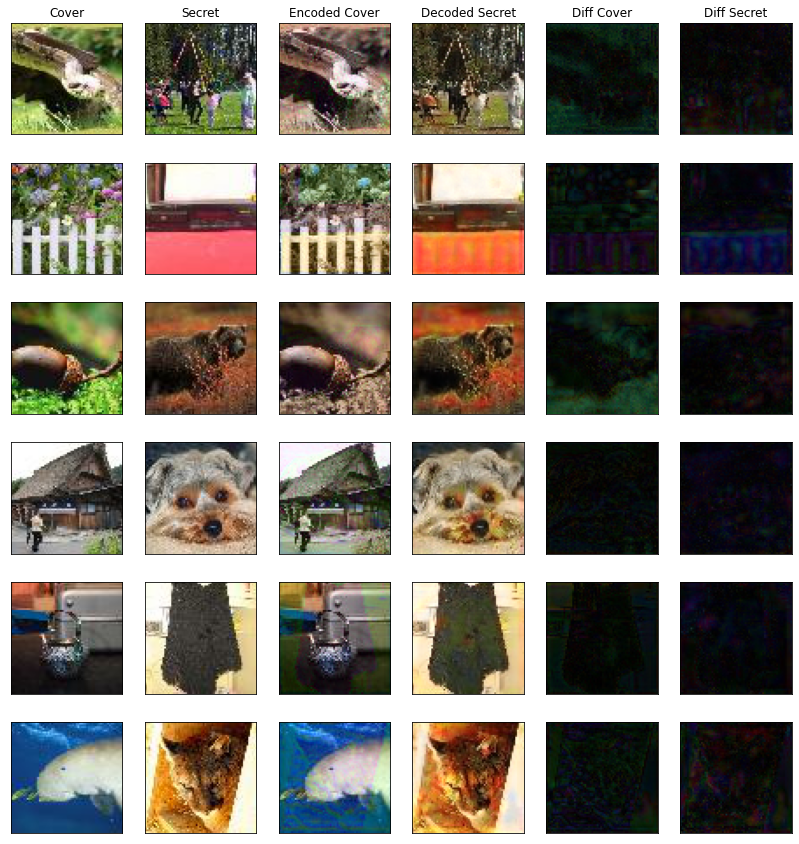

  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 161 | Batch:   0 of 1000. Loss AE    2923.23 | Loss Rev    1808.12:   3%|▎         | 1/32 [00:00<00:18,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 161 | Batch:  32 of 1000. Loss AE    2658.57 | Loss Rev    1541.32:   6%|▋         | 2/32 [00:01<00:17,  1.73it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 161 | Batch:  64 of 1000. Loss AE    2755.20 | Loss Rev    1556.59:   9%|▉         | 3/32 [00:01<00:15,  1.88it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 161 | Batch:  96 of 1000. Loss AE    2874.84 | Loss Rev    1500.82:  12%|█▎        | 4/32 [00:02<00:15,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 161 | Batch: 128 of 1000. Loss AE    2828.14 | Loss Rev    1452.55:  16%|█▌        | 5/32 [00:02<00:14,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 161 | Batch: 160 of 1000. Loss AE    2758.28 | Loss Rev    1414.06:  19%|█▉        | 6/32 [00:03<00:14,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 161 | Batch: 192 of 1000. Loss AE    2773.53 | Loss Rev    1436.44:  22%|██▏       | 7/32 [00:03<00:13,  1.86it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 161 | Batch: 224 of 1000. Loss AE    2717.25 | Loss Rev    1412.90:  25%|██▌       | 8/32 [00:04<00:13,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 161 | Batch: 256 of 1000. Loss AE    2704.75 | Loss Rev    1404.41:  28%|██▊       | 9/32 [00:04<00:12,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 161 | Batch: 288 of 1000. Loss AE    2715.30 | Loss Rev    1372.44:  31%|███▏      | 10/32 [00:05<00:11,  1.86it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 161 | Batch: 320 of 1000. Loss AE    2716.14 | Loss Rev    1374.29:  34%|███▍      | 11/32 [00:06<00:11,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 161 | Batch: 352 of 1000. Loss AE    2729.89 | Loss Rev    1379.33:  38%|███▊      | 12/32 [00:06<00:10,  1.92it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 161 | Batch: 384 of 1000. Loss AE    2750.72 | Loss Rev    1390.66:  41%|████      | 13/32 [00:07<00:09,  1.93it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 161 | Batch: 416 of 1000. Loss AE    2724.75 | Loss Rev    1377.12:  44%|████▍     | 14/32 [00:07<00:09,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 161 | Batch: 448 of 1000. Loss AE    2714.59 | Loss Rev    1383.18:  47%|████▋     | 15/32 [00:08<00:09,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 161 | Batch: 480 of 1000. Loss AE    2736.36 | Loss Rev    1389.29:  50%|█████     | 16/32 [00:08<00:08,  1.82it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 161 | Batch: 512 of 1000. Loss AE    2718.26 | Loss Rev    1377.36:  53%|█████▎    | 17/32 [00:09<00:08,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 161 | Batch: 544 of 1000. Loss AE    2716.19 | Loss Rev    1366.51:  56%|█████▋    | 18/32 [00:09<00:07,  1.90it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 161 | Batch: 576 of 1000. Loss AE    2691.65 | Loss Rev    1358.50:  59%|█████▉    | 19/32 [00:10<00:07,  1.86it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 161 | Batch: 608 of 1000. Loss AE    2674.34 | Loss Rev    1351.47:  62%|██████▎   | 20/32 [00:10<00:06,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 161 | Batch: 640 of 1000. Loss AE    2640.38 | Loss Rev    1334.53:  66%|██████▌   | 21/32 [00:11<00:06,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 161 | Batch: 672 of 1000. Loss AE    2628.34 | Loss Rev    1328.90:  69%|██████▉   | 22/32 [00:11<00:05,  1.84it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 161 | Batch: 704 of 1000. Loss AE    2613.85 | Loss Rev    1323.79:  72%|███████▏  | 23/32 [00:12<00:04,  1.83it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 161 | Batch: 736 of 1000. Loss AE    2599.33 | Loss Rev    1315.56:  75%|███████▌  | 24/32 [00:13<00:04,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 161 | Batch: 768 of 1000. Loss AE    2587.34 | Loss Rev    1309.66:  78%|███████▊  | 25/32 [00:13<00:03,  1.90it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 161 | Batch: 800 of 1000. Loss AE    2572.20 | Loss Rev    1301.06:  81%|████████▏ | 26/32 [00:14<00:03,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 161 | Batch: 832 of 1000. Loss AE    2571.27 | Loss Rev    1304.45:  84%|████████▍ | 27/32 [00:14<00:02,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 161 | Batch: 864 of 1000. Loss AE    2573.10 | Loss Rev    1302.87:  88%|████████▊ | 28/32 [00:15<00:02,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 161 | Batch: 896 of 1000. Loss AE    2568.95 | Loss Rev    1296.15:  91%|█████████ | 29/32 [00:15<00:01,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 161 | Batch: 928 of 1000. Loss AE    2558.96 | Loss Rev    1294.51:  94%|█████████▍| 30/32 [00:16<00:01,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 161 | Batch: 960 of 1000. Loss AE    2548.04 | Loss Rev    1289.88:  97%|█████████▋| 31/32 [00:16<00:00,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 161 | Batch: 992 of 1000. Loss AE    2479.09 | Loss Rev    1254.73: 100%|██████████| 32/32 [00:17<00:00,  1.87it/s]


161


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 162 | Batch:   0 of 1000. Loss AE    2127.86 | Loss Rev    1150.95:   3%|▎         | 1/32 [00:00<00:17,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 162 | Batch:  32 of 1000. Loss AE    2191.20 | Loss Rev    1188.08:   6%|▋         | 2/32 [00:01<00:17,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 162 | Batch:  64 of 1000. Loss AE    2203.68 | Loss Rev    1167.17:   9%|▉         | 3/32 [00:01<00:17,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 162 | Batch:  96 of 1000. Loss AE    2241.24 | Loss Rev    1164.86:  12%|█▎        | 4/32 [00:02<00:16,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 162 | Batch: 128 of 1000. Loss AE    2351.18 | Loss Rev    1242.83:  16%|█▌        | 5/32 [00:02<00:15,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 162 | Batch: 160 of 1000. Loss AE    2347.78 | Loss Rev    1245.34:  19%|█▉        | 6/32 [00:03<00:14,  1.79it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 162 | Batch: 192 of 1000. Loss AE    2366.55 | Loss Rev    1242.87:  22%|██▏       | 7/32 [00:03<00:13,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 162 | Batch: 224 of 1000. Loss AE    2491.98 | Loss Rev    1245.26:  25%|██▌       | 8/32 [00:04<00:13,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 162 | Batch: 256 of 1000. Loss AE    2528.94 | Loss Rev    1268.21:  28%|██▊       | 9/32 [00:05<00:12,  1.80it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 162 | Batch: 288 of 1000. Loss AE    2513.34 | Loss Rev    1265.59:  31%|███▏      | 10/32 [00:05<00:11,  1.84it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 162 | Batch: 320 of 1000. Loss AE    2472.61 | Loss Rev    1259.65:  34%|███▍      | 11/32 [00:06<00:11,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 162 | Batch: 352 of 1000. Loss AE    2499.66 | Loss Rev    1272.21:  38%|███▊      | 12/32 [00:06<00:10,  1.87it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 162 | Batch: 384 of 1000. Loss AE    2485.24 | Loss Rev    1283.79:  41%|████      | 13/32 [00:07<00:10,  1.83it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 162 | Batch: 416 of 1000. Loss AE    2484.37 | Loss Rev    1281.02:  44%|████▍     | 14/32 [00:07<00:09,  1.87it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 162 | Batch: 448 of 1000. Loss AE    2468.88 | Loss Rev    1271.65:  47%|████▋     | 15/32 [00:08<00:08,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 162 | Batch: 480 of 1000. Loss AE    2460.08 | Loss Rev    1257.97:  50%|█████     | 16/32 [00:08<00:08,  1.93it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 162 | Batch: 512 of 1000. Loss AE    2463.24 | Loss Rev    1266.18:  53%|█████▎    | 17/32 [00:09<00:07,  1.94it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 162 | Batch: 544 of 1000. Loss AE    2451.13 | Loss Rev    1268.02:  56%|█████▋    | 18/32 [00:09<00:07,  1.93it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 162 | Batch: 576 of 1000. Loss AE    2447.14 | Loss Rev    1260.52:  59%|█████▉    | 19/32 [00:10<00:06,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 162 | Batch: 608 of 1000. Loss AE    2453.82 | Loss Rev    1266.70:  62%|██████▎   | 20/32 [00:10<00:06,  1.91it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 162 | Batch: 640 of 1000. Loss AE    2470.81 | Loss Rev    1267.12:  66%|██████▌   | 21/32 [00:11<00:05,  1.85it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 162 | Batch: 672 of 1000. Loss AE    2462.57 | Loss Rev    1268.28:  69%|██████▉   | 22/32 [00:11<00:05,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 162 | Batch: 704 of 1000. Loss AE    2457.84 | Loss Rev    1261.95:  72%|███████▏  | 23/32 [00:12<00:04,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 162 | Batch: 736 of 1000. Loss AE    2444.83 | Loss Rev    1257.92:  75%|███████▌  | 24/32 [00:13<00:04,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 162 | Batch: 768 of 1000. Loss AE    2425.03 | Loss Rev    1250.57:  78%|███████▊  | 25/32 [00:13<00:03,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 162 | Batch: 800 of 1000. Loss AE    2414.15 | Loss Rev    1252.47:  81%|████████▏ | 26/32 [00:14<00:03,  1.85it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 162 | Batch: 832 of 1000. Loss AE    2427.50 | Loss Rev    1269.89:  84%|████████▍ | 27/32 [00:14<00:02,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 162 | Batch: 864 of 1000. Loss AE    2435.57 | Loss Rev    1282.23:  88%|████████▊ | 28/32 [00:15<00:02,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 162 | Batch: 896 of 1000. Loss AE    2432.71 | Loss Rev    1288.05:  91%|█████████ | 29/32 [00:15<00:01,  1.83it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 162 | Batch: 928 of 1000. Loss AE    2424.99 | Loss Rev    1289.85:  94%|█████████▍| 30/32 [00:16<00:01,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 162 | Batch: 960 of 1000. Loss AE    2436.28 | Loss Rev    1299.77:  97%|█████████▋| 31/32 [00:16<00:00,  1.89it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 162 | Batch: 992 of 1000. Loss AE    2384.38 | Loss Rev    1274.76: 100%|██████████| 32/32 [00:17<00:00,  1.87it/s]

162



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 163 | Batch:   0 of 1000. Loss AE    4533.15 | Loss Rev    3254.79:   3%|▎         | 1/32 [00:00<00:18,  1.71it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 163 | Batch:  32 of 1000. Loss AE    6692.07 | Loss Rev    5633.33:   6%|▋         | 2/32 [00:01<00:17,  1.69it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 163 | Batch:  64 of 1000. Loss AE    5290.34 | Loss Rev    4227.49:   9%|▉         | 3/32 [00:01<00:16,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 163 | Batch:  96 of 1000. Loss AE    5393.24 | Loss Rev    4298.43:  12%|█▎        | 4/32 [00:02<00:14,  1.90it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 163 | Batch: 128 of 1000. Loss AE    5672.30 | Loss Rev    4573.66:  16%|█▌        | 5/32 [00:02<00:14,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 163 | Batch: 160 of 1000. Loss AE    5245.55 | Loss Rev    4077.79:  19%|█▉        | 6/32 [00:03<00:13,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 163 | Batch: 192 of 1000. Loss AE    5340.68 | Loss Rev    4152.10:  22%|██▏       | 7/32 [00:03<00:13,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 163 | Batch: 224 of 1000. Loss AE    5013.56 | Loss Rev    3797.71:  25%|██▌       | 8/32 [00:04<00:13,  1.78it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 163 | Batch: 256 of 1000. Loss AE    5025.94 | Loss Rev    3749.21:  28%|██▊       | 9/32 [00:05<00:13,  1.76it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 163 | Batch: 288 of 1000. Loss AE    4812.37 | Loss Rev    3536.26:  31%|███▏      | 10/32 [00:05<00:12,  1.80it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 163 | Batch: 320 of 1000. Loss AE    4834.45 | Loss Rev    3519.94:  34%|███▍      | 11/32 [00:06<00:11,  1.77it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 163 | Batch: 352 of 1000. Loss AE    4698.19 | Loss Rev    3387.50:  38%|███▊      | 12/32 [00:06<00:11,  1.74it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 163 | Batch: 384 of 1000. Loss AE    4635.67 | Loss Rev    3310.60:  41%|████      | 13/32 [00:07<00:10,  1.79it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 163 | Batch: 416 of 1000. Loss AE    4493.60 | Loss Rev    3171.37:  44%|████▍     | 14/32 [00:07<00:09,  1.85it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 163 | Batch: 448 of 1000. Loss AE    4421.04 | Loss Rev    3097.69:  47%|████▋     | 15/32 [00:08<00:09,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 163 | Batch: 480 of 1000. Loss AE    4328.07 | Loss Rev    2998.66:  50%|█████     | 16/32 [00:08<00:08,  1.88it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 163 | Batch: 512 of 1000. Loss AE    4252.98 | Loss Rev    2939.66:  53%|█████▎    | 17/32 [00:09<00:08,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 163 | Batch: 544 of 1000. Loss AE    4185.05 | Loss Rev    2872.90:  56%|█████▋    | 18/32 [00:09<00:07,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 163 | Batch: 576 of 1000. Loss AE    4146.89 | Loss Rev    2833.00:  59%|█████▉    | 19/32 [00:10<00:06,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 163 | Batch: 608 of 1000. Loss AE    4070.51 | Loss Rev    2752.84:  62%|██████▎   | 20/32 [00:11<00:06,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 163 | Batch: 640 of 1000. Loss AE    4029.05 | Loss Rev    2696.97:  66%|██████▌   | 21/32 [00:11<00:05,  1.84it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 163 | Batch: 672 of 1000. Loss AE    3946.80 | Loss Rev    2622.67:  69%|██████▉   | 22/32 [00:12<00:05,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 163 | Batch: 704 of 1000. Loss AE    3927.36 | Loss Rev    2587.63:  72%|███████▏  | 23/32 [00:12<00:05,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 163 | Batch: 736 of 1000. Loss AE    3887.31 | Loss Rev    2534.41:  75%|███████▌  | 24/32 [00:13<00:04,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 163 | Batch: 768 of 1000. Loss AE    3860.69 | Loss Rev    2507.16:  78%|███████▊  | 25/32 [00:13<00:03,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 163 | Batch: 800 of 1000. Loss AE    3818.59 | Loss Rev    2466.12:  81%|████████▏ | 26/32 [00:14<00:03,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 163 | Batch: 832 of 1000. Loss AE    3804.28 | Loss Rev    2454.64:  84%|████████▍ | 27/32 [00:14<00:02,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 163 | Batch: 864 of 1000. Loss AE    3774.21 | Loss Rev    2427.87:  88%|████████▊ | 28/32 [00:15<00:02,  1.93it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 163 | Batch: 896 of 1000. Loss AE    3756.65 | Loss Rev    2402.07:  91%|█████████ | 29/32 [00:15<00:01,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 163 | Batch: 928 of 1000. Loss AE    3711.23 | Loss Rev    2364.35:  94%|█████████▍| 30/32 [00:16<00:01,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 163 | Batch: 960 of 1000. Loss AE    3688.76 | Loss Rev    2336.75:  97%|█████████▋| 31/32 [00:17<00:00,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 163 | Batch: 992 of 1000. Loss AE    3594.15 | Loss Rev    2274.53: 100%|██████████| 32/32 [00:17<00:00,  1.85it/s]

163



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 164 | Batch:   0 of 1000. Loss AE    3426.16 | Loss Rev    1688.84:   3%|▎         | 1/32 [00:00<00:15,  1.95it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 164 | Batch:  32 of 1000. Loss AE    2943.66 | Loss Rev    1368.97:   6%|▋         | 2/32 [00:01<00:16,  1.82it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 164 | Batch:  64 of 1000. Loss AE    3005.52 | Loss Rev    1503.71:   9%|▉         | 3/32 [00:01<00:16,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 164 | Batch:  96 of 1000. Loss AE    2912.46 | Loss Rev    1496.24:  12%|█▎        | 4/32 [00:02<00:15,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 164 | Batch: 128 of 1000. Loss AE    2817.31 | Loss Rev    1484.15:  16%|█▌        | 5/32 [00:02<00:14,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 164 | Batch: 160 of 1000. Loss AE    2770.91 | Loss Rev    1446.49:  19%|█▉        | 6/32 [00:03<00:14,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 164 | Batch: 192 of 1000. Loss AE    2820.85 | Loss Rev    1482.16:  22%|██▏       | 7/32 [00:03<00:13,  1.87it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 164 | Batch: 224 of 1000. Loss AE    2733.68 | Loss Rev    1436.85:  25%|██▌       | 8/32 [00:04<00:13,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 164 | Batch: 256 of 1000. Loss AE    2746.37 | Loss Rev    1441.17:  28%|██▊       | 9/32 [00:04<00:12,  1.80it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 164 | Batch: 288 of 1000. Loss AE    2702.40 | Loss Rev    1417.73:  31%|███▏      | 10/32 [00:05<00:11,  1.87it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 164 | Batch: 320 of 1000. Loss AE    2710.92 | Loss Rev    1407.60:  34%|███▍      | 11/32 [00:06<00:11,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 164 | Batch: 352 of 1000. Loss AE    2721.66 | Loss Rev    1406.13:  38%|███▊      | 12/32 [00:06<00:10,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 164 | Batch: 384 of 1000. Loss AE    2737.14 | Loss Rev    1401.65:  41%|████      | 13/32 [00:06<00:09,  1.93it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 164 | Batch: 416 of 1000. Loss AE    2719.20 | Loss Rev    1384.75:  44%|████▍     | 14/32 [00:07<00:09,  1.86it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 164 | Batch: 448 of 1000. Loss AE    2716.47 | Loss Rev    1383.45:  47%|████▋     | 15/32 [00:08<00:09,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 164 | Batch: 480 of 1000. Loss AE    2691.45 | Loss Rev    1384.01:  50%|█████     | 16/32 [00:08<00:08,  1.92it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 164 | Batch: 512 of 1000. Loss AE    2657.94 | Loss Rev    1369.87:  53%|█████▎    | 17/32 [00:09<00:08,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 164 | Batch: 544 of 1000. Loss AE    2637.08 | Loss Rev    1355.98:  56%|█████▋    | 18/32 [00:09<00:07,  1.90it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 164 | Batch: 576 of 1000. Loss AE    2618.70 | Loss Rev    1344.28:  59%|█████▉    | 19/32 [00:10<00:06,  1.89it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 164 | Batch: 608 of 1000. Loss AE    2614.48 | Loss Rev    1343.71:  62%|██████▎   | 20/32 [00:10<00:06,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 164 | Batch: 640 of 1000. Loss AE    2593.68 | Loss Rev    1329.80:  66%|██████▌   | 21/32 [00:11<00:05,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 164 | Batch: 672 of 1000. Loss AE    2592.99 | Loss Rev    1326.67:  69%|██████▉   | 22/32 [00:11<00:05,  1.82it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 164 | Batch: 704 of 1000. Loss AE    2579.58 | Loss Rev    1324.13:  72%|███████▏  | 23/32 [00:12<00:04,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 164 | Batch: 736 of 1000. Loss AE    2570.95 | Loss Rev    1317.02:  75%|███████▌  | 24/32 [00:12<00:04,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 164 | Batch: 768 of 1000. Loss AE    2567.56 | Loss Rev    1320.11:  78%|███████▊  | 25/32 [00:13<00:03,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 164 | Batch: 800 of 1000. Loss AE    2554.03 | Loss Rev    1312.52:  81%|████████▏ | 26/32 [00:14<00:03,  1.85it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 164 | Batch: 832 of 1000. Loss AE    2553.37 | Loss Rev    1310.43:  84%|████████▍ | 27/32 [00:14<00:02,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 164 | Batch: 864 of 1000. Loss AE    2560.93 | Loss Rev    1310.92:  88%|████████▊ | 28/32 [00:15<00:02,  1.92it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 164 | Batch: 896 of 1000. Loss AE    2578.36 | Loss Rev    1322.53:  91%|█████████ | 29/32 [00:15<00:01,  1.85it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 164 | Batch: 928 of 1000. Loss AE    2564.73 | Loss Rev    1315.11:  94%|█████████▍| 30/32 [00:16<00:01,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 164 | Batch: 960 of 1000. Loss AE    2554.01 | Loss Rev    1308.78:  97%|█████████▋| 31/32 [00:16<00:00,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 164 | Batch: 992 of 1000. Loss AE    2489.77 | Loss Rev    1275.05: 100%|██████████| 32/32 [00:16<00:00,  1.89it/s]


164


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 165 | Batch:   0 of 1000. Loss AE    2143.53 | Loss Rev    1095.61:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 165 | Batch:  32 of 1000. Loss AE    2061.42 | Loss Rev    1069.20:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 165 | Batch:  64 of 1000. Loss AE    2350.09 | Loss Rev    1213.93:   9%|▉         | 3/32 [00:01<00:17,  1.64it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 165 | Batch:  96 of 1000. Loss AE    2314.29 | Loss Rev    1161.81:  12%|█▎        | 4/32 [00:02<00:16,  1.68it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 165 | Batch: 128 of 1000. Loss AE    2343.33 | Loss Rev    1179.04:  16%|█▌        | 5/32 [00:02<00:15,  1.77it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 165 | Batch: 160 of 1000. Loss AE    2306.61 | Loss Rev    1154.90:  19%|█▉        | 6/32 [00:03<00:14,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 165 | Batch: 192 of 1000. Loss AE    2332.14 | Loss Rev    1179.34:  22%|██▏       | 7/32 [00:03<00:13,  1.88it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 165 | Batch: 224 of 1000. Loss AE    2284.65 | Loss Rev    1155.33:  25%|██▌       | 8/32 [00:04<00:13,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 165 | Batch: 256 of 1000. Loss AE    2282.76 | Loss Rev    1173.84:  28%|██▊       | 9/32 [00:05<00:12,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 165 | Batch: 288 of 1000. Loss AE    2307.69 | Loss Rev    1155.06:  31%|███▏      | 10/32 [00:05<00:12,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 165 | Batch: 320 of 1000. Loss AE    2315.48 | Loss Rev    1174.07:  34%|███▍      | 11/32 [00:06<00:11,  1.76it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 165 | Batch: 352 of 1000. Loss AE    2326.20 | Loss Rev    1161.66:  38%|███▊      | 12/32 [00:06<00:11,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 165 | Batch: 384 of 1000. Loss AE    2324.81 | Loss Rev    1168.87:  41%|████      | 13/32 [00:07<00:10,  1.79it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 165 | Batch: 416 of 1000. Loss AE    2310.35 | Loss Rev    1160.38:  44%|████▍     | 14/32 [00:07<00:09,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 165 | Batch: 448 of 1000. Loss AE    2307.72 | Loss Rev    1162.86:  47%|████▋     | 15/32 [00:08<00:08,  1.92it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 165 | Batch: 480 of 1000. Loss AE    2317.27 | Loss Rev    1170.69:  50%|█████     | 16/32 [00:08<00:08,  1.85it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 165 | Batch: 512 of 1000. Loss AE    2364.53 | Loss Rev    1189.82:  53%|█████▎    | 17/32 [00:09<00:08,  1.82it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 165 | Batch: 544 of 1000. Loss AE    2354.56 | Loss Rev    1181.40:  56%|█████▋    | 18/32 [00:10<00:07,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 165 | Batch: 576 of 1000. Loss AE    2343.11 | Loss Rev    1179.40:  59%|█████▉    | 19/32 [00:10<00:07,  1.77it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 165 | Batch: 608 of 1000. Loss AE    2339.85 | Loss Rev    1183.84:  62%|██████▎   | 20/32 [00:11<00:06,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 165 | Batch: 640 of 1000. Loss AE    2347.78 | Loss Rev    1188.17:  66%|██████▌   | 21/32 [00:11<00:06,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 165 | Batch: 672 of 1000. Loss AE    2372.83 | Loss Rev    1200.66:  69%|██████▉   | 22/32 [00:12<00:05,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 165 | Batch: 704 of 1000. Loss AE    2357.03 | Loss Rev    1196.67:  72%|███████▏  | 23/32 [00:12<00:04,  1.91it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 165 | Batch: 736 of 1000. Loss AE    2339.65 | Loss Rev    1188.99:  75%|███████▌  | 24/32 [00:13<00:04,  1.95it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 165 | Batch: 768 of 1000. Loss AE    2331.47 | Loss Rev    1186.47:  78%|███████▊  | 25/32 [00:13<00:03,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 165 | Batch: 800 of 1000. Loss AE    2316.90 | Loss Rev    1181.28:  81%|████████▏ | 26/32 [00:14<00:03,  1.84it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 165 | Batch: 832 of 1000. Loss AE    2314.81 | Loss Rev    1174.14:  84%|████████▍ | 27/32 [00:14<00:02,  1.80it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 165 | Batch: 864 of 1000. Loss AE    2304.58 | Loss Rev    1169.97:  88%|████████▊ | 28/32 [00:15<00:02,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 165 | Batch: 896 of 1000. Loss AE    2321.26 | Loss Rev    1179.80:  91%|█████████ | 29/32 [00:16<00:01,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 165 | Batch: 928 of 1000. Loss AE    2322.00 | Loss Rev    1183.39:  94%|█████████▍| 30/32 [00:16<00:01,  1.90it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 165 | Batch: 960 of 1000. Loss AE    2319.18 | Loss Rev    1183.78:  97%|█████████▋| 31/32 [00:17<00:00,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 165 | Batch: 992 of 1000. Loss AE    2262.57 | Loss Rev    1154.86: 100%|██████████| 32/32 [00:17<00:00,  1.86it/s]


165


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 166 | Batch:   0 of 1000. Loss AE    2458.02 | Loss Rev    1330.81:   3%|▎         | 1/32 [00:00<00:18,  1.69it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 166 | Batch:  32 of 1000. Loss AE    2485.07 | Loss Rev    1251.18:   6%|▋         | 2/32 [00:01<00:17,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 166 | Batch:  64 of 1000. Loss AE    2480.90 | Loss Rev    1219.12:   9%|▉         | 3/32 [00:01<00:16,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 166 | Batch:  96 of 1000. Loss AE    2410.52 | Loss Rev    1207.97:  12%|█▎        | 4/32 [00:02<00:16,  1.74it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 166 | Batch: 128 of 1000. Loss AE    2347.63 | Loss Rev    1164.95:  16%|█▌        | 5/32 [00:02<00:15,  1.71it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 166 | Batch: 160 of 1000. Loss AE    2329.49 | Loss Rev    1172.46:  19%|█▉        | 6/32 [00:03<00:15,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 166 | Batch: 192 of 1000. Loss AE    2296.97 | Loss Rev    1162.18:  22%|██▏       | 7/32 [00:04<00:14,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 166 | Batch: 224 of 1000. Loss AE    2241.20 | Loss Rev    1135.20:  25%|██▌       | 8/32 [00:04<00:13,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 166 | Batch: 256 of 1000. Loss AE    2233.77 | Loss Rev    1152.82:  28%|██▊       | 9/32 [00:05<00:13,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 166 | Batch: 288 of 1000. Loss AE    2194.90 | Loss Rev    1135.22:  31%|███▏      | 10/32 [00:05<00:12,  1.81it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 166 | Batch: 320 of 1000. Loss AE    2183.02 | Loss Rev    1119.58:  34%|███▍      | 11/32 [00:06<00:11,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 166 | Batch: 352 of 1000. Loss AE    2210.73 | Loss Rev    1137.43:  38%|███▊      | 12/32 [00:06<00:10,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 166 | Batch: 384 of 1000. Loss AE    2208.62 | Loss Rev    1148.11:  41%|████      | 13/32 [00:07<00:10,  1.82it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 166 | Batch: 416 of 1000. Loss AE    2193.00 | Loss Rev    1138.42:  44%|████▍     | 14/32 [00:07<00:10,  1.79it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 166 | Batch: 448 of 1000. Loss AE    2217.18 | Loss Rev    1141.02:  47%|████▋     | 15/32 [00:08<00:09,  1.76it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 166 | Batch: 480 of 1000. Loss AE    2229.69 | Loss Rev    1146.23:  50%|█████     | 16/32 [00:09<00:08,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 166 | Batch: 512 of 1000. Loss AE    2262.02 | Loss Rev    1161.71:  53%|█████▎    | 17/32 [00:09<00:08,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 166 | Batch: 544 of 1000. Loss AE    2252.01 | Loss Rev    1155.44:  56%|█████▋    | 18/32 [00:10<00:07,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 166 | Batch: 576 of 1000. Loss AE    2261.22 | Loss Rev    1159.62:  59%|█████▉    | 19/32 [00:10<00:06,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 166 | Batch: 608 of 1000. Loss AE    2251.51 | Loss Rev    1159.15:  62%|██████▎   | 20/32 [00:11<00:06,  1.88it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 166 | Batch: 640 of 1000. Loss AE    2239.12 | Loss Rev    1153.41:  66%|██████▌   | 21/32 [00:11<00:06,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 166 | Batch: 672 of 1000. Loss AE    2263.40 | Loss Rev    1166.64:  69%|██████▉   | 22/32 [00:12<00:05,  1.80it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 166 | Batch: 704 of 1000. Loss AE    2278.90 | Loss Rev    1185.41:  72%|███████▏  | 23/32 [00:12<00:05,  1.77it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 166 | Batch: 736 of 1000. Loss AE    2281.66 | Loss Rev    1186.19:  75%|███████▌  | 24/32 [00:13<00:04,  1.75it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 166 | Batch: 768 of 1000. Loss AE    2281.05 | Loss Rev    1191.50:  78%|███████▊  | 25/32 [00:14<00:04,  1.74it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 166 | Batch: 800 of 1000. Loss AE    2291.17 | Loss Rev    1206.29:  81%|████████▏ | 26/32 [00:14<00:03,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 166 | Batch: 832 of 1000. Loss AE    2314.12 | Loss Rev    1222.79:  84%|████████▍ | 27/32 [00:15<00:02,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 166 | Batch: 864 of 1000. Loss AE    2309.14 | Loss Rev    1220.85:  88%|████████▊ | 28/32 [00:15<00:02,  1.87it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 166 | Batch: 896 of 1000. Loss AE    2308.60 | Loss Rev    1220.55:  91%|█████████ | 29/32 [00:16<00:01,  1.92it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 166 | Batch: 928 of 1000. Loss AE    2322.66 | Loss Rev    1220.21:  94%|█████████▍| 30/32 [00:16<00:01,  1.87it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 166 | Batch: 960 of 1000. Loss AE    2328.35 | Loss Rev    1225.03:  97%|█████████▋| 31/32 [00:17<00:00,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 166 | Batch: 992 of 1000. Loss AE    2269.39 | Loss Rev    1195.75: 100%|██████████| 32/32 [00:17<00:00,  1.83it/s]


166


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 167 | Batch:   0 of 1000. Loss AE    3211.03 | Loss Rev    2116.27:   3%|▎         | 1/32 [00:00<00:15,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 167 | Batch:  32 of 1000. Loss AE    4721.74 | Loss Rev    3587.89:   6%|▋         | 2/32 [00:01<00:15,  1.99it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 167 | Batch:  64 of 1000. Loss AE    4119.05 | Loss Rev    3020.64:   9%|▉         | 3/32 [00:01<00:15,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 167 | Batch:  96 of 1000. Loss AE    3940.64 | Loss Rev    2852.65:  12%|█▎        | 4/32 [00:02<00:15,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 167 | Batch: 128 of 1000. Loss AE    4190.93 | Loss Rev    3086.33:  16%|█▌        | 5/32 [00:02<00:14,  1.83it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 167 | Batch: 160 of 1000. Loss AE    3896.45 | Loss Rev    2805.21:  19%|█▉        | 6/32 [00:03<00:14,  1.80it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 167 | Batch: 192 of 1000. Loss AE    3862.85 | Loss Rev    2737.37:  22%|██▏       | 7/32 [00:03<00:14,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 167 | Batch: 224 of 1000. Loss AE    3932.46 | Loss Rev    2764.73:  25%|██▌       | 8/32 [00:04<00:13,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 167 | Batch: 256 of 1000. Loss AE    3773.70 | Loss Rev    2634.57:  28%|██▊       | 9/32 [00:04<00:12,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 167 | Batch: 288 of 1000. Loss AE    3931.38 | Loss Rev    2764.80:  31%|███▏      | 10/32 [00:05<00:11,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 167 | Batch: 320 of 1000. Loss AE    3868.58 | Loss Rev    2700.59:  34%|███▍      | 11/32 [00:05<00:11,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 167 | Batch: 352 of 1000. Loss AE    3868.87 | Loss Rev    2682.38:  38%|███▊      | 12/32 [00:06<00:11,  1.79it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 167 | Batch: 384 of 1000. Loss AE    3829.42 | Loss Rev    2636.93:  41%|████      | 13/32 [00:07<00:10,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 167 | Batch: 416 of 1000. Loss AE    3766.44 | Loss Rev    2570.69:  44%|████▍     | 14/32 [00:07<00:10,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 167 | Batch: 448 of 1000. Loss AE    3735.69 | Loss Rev    2519.09:  47%|████▋     | 15/32 [00:08<00:09,  1.75it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 167 | Batch: 480 of 1000. Loss AE    3704.83 | Loss Rev    2472.96:  50%|█████     | 16/32 [00:08<00:08,  1.82it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 167 | Batch: 512 of 1000. Loss AE    3662.87 | Loss Rev    2429.47:  53%|█████▎    | 17/32 [00:09<00:08,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 167 | Batch: 544 of 1000. Loss AE    3607.57 | Loss Rev    2363.26:  56%|█████▋    | 18/32 [00:09<00:07,  1.86it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 167 | Batch: 576 of 1000. Loss AE    3594.67 | Loss Rev    2340.18:  59%|█████▉    | 19/32 [00:10<00:06,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 167 | Batch: 608 of 1000. Loss AE    3536.16 | Loss Rev    2287.83:  62%|██████▎   | 20/32 [00:10<00:06,  1.96it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 167 | Batch: 640 of 1000. Loss AE    3541.57 | Loss Rev    2270.51:  66%|██████▌   | 21/32 [00:11<00:05,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 167 | Batch: 672 of 1000. Loss AE    3493.18 | Loss Rev    2219.96:  69%|██████▉   | 22/32 [00:12<00:05,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 167 | Batch: 704 of 1000. Loss AE    3467.24 | Loss Rev    2194.15:  72%|███████▏  | 23/32 [00:12<00:04,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 167 | Batch: 736 of 1000. Loss AE    3427.21 | Loss Rev    2154.77:  75%|███████▌  | 24/32 [00:13<00:04,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 167 | Batch: 768 of 1000. Loss AE    3408.69 | Loss Rev    2128.44:  78%|███████▊  | 25/32 [00:13<00:03,  1.89it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 167 | Batch: 800 of 1000. Loss AE    3366.94 | Loss Rev    2083.51:  81%|████████▏ | 26/32 [00:14<00:03,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 167 | Batch: 832 of 1000. Loss AE    3346.93 | Loss Rev    2066.13:  84%|████████▍ | 27/32 [00:14<00:02,  1.84it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 167 | Batch: 864 of 1000. Loss AE    3320.77 | Loss Rev    2034.48:  88%|████████▊ | 28/32 [00:15<00:02,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 167 | Batch: 896 of 1000. Loss AE    3333.41 | Loss Rev    2016.68:  91%|█████████ | 29/32 [00:15<00:01,  1.86it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 167 | Batch: 928 of 1000. Loss AE    3310.64 | Loss Rev    1996.25:  94%|█████████▍| 30/32 [00:16<00:01,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 167 | Batch: 960 of 1000. Loss AE    3296.57 | Loss Rev    1977.20:  97%|█████████▋| 31/32 [00:16<00:00,  1.80it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 167 | Batch: 992 of 1000. Loss AE    3219.34 | Loss Rev    1929.98: 100%|██████████| 32/32 [00:17<00:00,  1.87it/s]


167


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 168 | Batch:   0 of 1000. Loss AE    2299.56 | Loss Rev    1214.23:   3%|▎         | 1/32 [00:00<00:18,  1.69it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 168 | Batch:  32 of 1000. Loss AE    2372.70 | Loss Rev    1125.89:   6%|▋         | 2/32 [00:01<00:18,  1.64it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 168 | Batch:  64 of 1000. Loss AE    2512.95 | Loss Rev    1312.03:   9%|▉         | 3/32 [00:01<00:17,  1.62it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 168 | Batch:  96 of 1000. Loss AE    2569.15 | Loss Rev    1353.57:  12%|█▎        | 4/32 [00:02<00:16,  1.68it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 168 | Batch: 128 of 1000. Loss AE    2512.00 | Loss Rev    1262.86:  16%|█▌        | 5/32 [00:02<00:15,  1.69it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 168 | Batch: 160 of 1000. Loss AE    2491.85 | Loss Rev    1238.36:  19%|█▉        | 6/32 [00:03<00:15,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 168 | Batch: 192 of 1000. Loss AE    2443.21 | Loss Rev    1211.21:  22%|██▏       | 7/32 [00:04<00:14,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 168 | Batch: 224 of 1000. Loss AE    2451.68 | Loss Rev    1221.01:  25%|██▌       | 8/32 [00:04<00:13,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 168 | Batch: 256 of 1000. Loss AE    2448.11 | Loss Rev    1223.94:  28%|██▊       | 9/32 [00:05<00:13,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 168 | Batch: 288 of 1000. Loss AE    2562.34 | Loss Rev    1239.28:  31%|███▏      | 10/32 [00:05<00:12,  1.83it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 168 | Batch: 320 of 1000. Loss AE    2560.03 | Loss Rev    1254.97:  34%|███▍      | 11/32 [00:06<00:11,  1.77it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 168 | Batch: 352 of 1000. Loss AE    2593.14 | Loss Rev    1254.46:  38%|███▊      | 12/32 [00:06<00:11,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 168 | Batch: 384 of 1000. Loss AE    2575.71 | Loss Rev    1254.34:  41%|████      | 13/32 [00:07<00:10,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 168 | Batch: 416 of 1000. Loss AE    2571.20 | Loss Rev    1239.24:  44%|████▍     | 14/32 [00:07<00:09,  1.85it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 168 | Batch: 448 of 1000. Loss AE    2572.81 | Loss Rev    1244.21:  47%|████▋     | 15/32 [00:08<00:09,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 168 | Batch: 480 of 1000. Loss AE    2567.21 | Loss Rev    1250.30:  50%|█████     | 16/32 [00:09<00:08,  1.85it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 168 | Batch: 512 of 1000. Loss AE    2553.61 | Loss Rev    1249.15:  53%|█████▎    | 17/32 [00:09<00:08,  1.78it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 168 | Batch: 544 of 1000. Loss AE    2553.26 | Loss Rev    1252.70:  56%|█████▋    | 18/32 [00:10<00:07,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 168 | Batch: 576 of 1000. Loss AE    2540.62 | Loss Rev    1249.45:  59%|█████▉    | 19/32 [00:10<00:06,  1.91it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 168 | Batch: 608 of 1000. Loss AE    2511.97 | Loss Rev    1237.85:  62%|██████▎   | 20/32 [00:11<00:06,  1.93it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 168 | Batch: 640 of 1000. Loss AE    2503.95 | Loss Rev    1244.27:  66%|██████▌   | 21/32 [00:11<00:05,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 168 | Batch: 672 of 1000. Loss AE    2500.58 | Loss Rev    1245.25:  69%|██████▉   | 22/32 [00:12<00:05,  1.90it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 168 | Batch: 704 of 1000. Loss AE    2489.30 | Loss Rev    1242.17:  72%|███████▏  | 23/32 [00:12<00:04,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 168 | Batch: 736 of 1000. Loss AE    2502.12 | Loss Rev    1246.47:  75%|███████▌  | 24/32 [00:13<00:04,  1.83it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 168 | Batch: 768 of 1000. Loss AE    2484.57 | Loss Rev    1245.55:  78%|███████▊  | 25/32 [00:13<00:03,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 168 | Batch: 800 of 1000. Loss AE    2504.84 | Loss Rev    1256.13:  81%|████████▏ | 26/32 [00:14<00:03,  1.79it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 168 | Batch: 832 of 1000. Loss AE    2495.02 | Loss Rev    1248.94:  84%|████████▍ | 27/32 [00:15<00:02,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 168 | Batch: 864 of 1000. Loss AE    2486.20 | Loss Rev    1248.41:  88%|████████▊ | 28/32 [00:15<00:02,  1.83it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 168 | Batch: 896 of 1000. Loss AE    2478.77 | Loss Rev    1244.52:  91%|█████████ | 29/32 [00:16<00:01,  1.80it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 168 | Batch: 928 of 1000. Loss AE    2466.02 | Loss Rev    1237.18:  94%|█████████▍| 30/32 [00:16<00:01,  1.84it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 168 | Batch: 960 of 1000. Loss AE    2449.46 | Loss Rev    1231.44:  97%|█████████▋| 31/32 [00:17<00:00,  1.81it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 168 | Batch: 992 of 1000. Loss AE    2402.97 | Loss Rev    1214.03: 100%|██████████| 32/32 [00:17<00:00,  1.83it/s]


168


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 169 | Batch:   0 of 1000. Loss AE    3045.00 | Loss Rev    1829.75:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 169 | Batch:  32 of 1000. Loss AE    3153.42 | Loss Rev    1693.84:   6%|▋         | 2/32 [00:01<00:16,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 169 | Batch:  64 of 1000. Loss AE    2915.39 | Loss Rev    1576.25:   9%|▉         | 3/32 [00:01<00:15,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 169 | Batch:  96 of 1000. Loss AE    2903.88 | Loss Rev    1640.83:  12%|█▎        | 4/32 [00:02<00:14,  1.97it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 169 | Batch: 128 of 1000. Loss AE    2831.07 | Loss Rev    1568.86:  16%|█▌        | 5/32 [00:02<00:14,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 169 | Batch: 160 of 1000. Loss AE    2803.44 | Loss Rev    1558.02:  19%|█▉        | 6/32 [00:03<00:14,  1.85it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 169 | Batch: 192 of 1000. Loss AE    2751.31 | Loss Rev    1540.99:  22%|██▏       | 7/32 [00:03<00:13,  1.90it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 169 | Batch: 224 of 1000. Loss AE    2762.80 | Loss Rev    1500.05:  25%|██▌       | 8/32 [00:04<00:12,  1.92it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 169 | Batch: 256 of 1000. Loss AE    2747.79 | Loss Rev    1498.65:  28%|██▊       | 9/32 [00:04<00:12,  1.86it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 169 | Batch: 288 of 1000. Loss AE    2741.00 | Loss Rev    1461.67:  31%|███▏      | 10/32 [00:05<00:11,  1.90it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 169 | Batch: 320 of 1000. Loss AE    2671.93 | Loss Rev    1421.61:  34%|███▍      | 11/32 [00:05<00:10,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 169 | Batch: 352 of 1000. Loss AE    2638.57 | Loss Rev    1408.94:  38%|███▊      | 12/32 [00:06<00:10,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 169 | Batch: 384 of 1000. Loss AE    2607.06 | Loss Rev    1388.65:  41%|████      | 13/32 [00:06<00:09,  1.97it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 169 | Batch: 416 of 1000. Loss AE    2606.14 | Loss Rev    1388.76:  44%|████▍     | 14/32 [00:07<00:09,  1.90it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 169 | Batch: 448 of 1000. Loss AE    2553.74 | Loss Rev    1359.48:  47%|████▋     | 15/32 [00:07<00:09,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 169 | Batch: 480 of 1000. Loss AE    2548.26 | Loss Rev    1363.64:  50%|█████     | 16/32 [00:08<00:08,  1.89it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 169 | Batch: 512 of 1000. Loss AE    2529.11 | Loss Rev    1340.86:  53%|█████▎    | 17/32 [00:09<00:08,  1.85it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 169 | Batch: 544 of 1000. Loss AE    2557.63 | Loss Rev    1337.24:  56%|█████▋    | 18/32 [00:09<00:07,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 169 | Batch: 576 of 1000. Loss AE    2547.25 | Loss Rev    1336.03:  59%|█████▉    | 19/32 [00:10<00:07,  1.82it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 169 | Batch: 608 of 1000. Loss AE    2535.99 | Loss Rev    1327.14:  62%|██████▎   | 20/32 [00:10<00:06,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 169 | Batch: 640 of 1000. Loss AE    2512.52 | Loss Rev    1318.37:  66%|██████▌   | 21/32 [00:11<00:06,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 169 | Batch: 672 of 1000. Loss AE    2492.39 | Loss Rev    1307.69:  69%|██████▉   | 22/32 [00:11<00:05,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 169 | Batch: 704 of 1000. Loss AE    2488.45 | Loss Rev    1302.90:  72%|███████▏  | 23/32 [00:12<00:05,  1.79it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 169 | Batch: 736 of 1000. Loss AE    2479.40 | Loss Rev    1301.59:  75%|███████▌  | 24/32 [00:12<00:04,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 169 | Batch: 768 of 1000. Loss AE    2467.45 | Loss Rev    1299.87:  78%|███████▊  | 25/32 [00:13<00:03,  1.85it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 169 | Batch: 800 of 1000. Loss AE    2455.24 | Loss Rev    1286.49:  81%|████████▏ | 26/32 [00:13<00:03,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 169 | Batch: 832 of 1000. Loss AE    2460.85 | Loss Rev    1281.49:  84%|████████▍ | 27/32 [00:14<00:02,  1.82it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 169 | Batch: 864 of 1000. Loss AE    2449.79 | Loss Rev    1276.89:  88%|████████▊ | 28/32 [00:15<00:02,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 169 | Batch: 896 of 1000. Loss AE    2450.42 | Loss Rev    1280.04:  91%|█████████ | 29/32 [00:15<00:01,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 169 | Batch: 928 of 1000. Loss AE    2429.98 | Loss Rev    1271.75:  94%|█████████▍| 30/32 [00:16<00:01,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 169 | Batch: 960 of 1000. Loss AE    2429.35 | Loss Rev    1278.13:  97%|█████████▋| 31/32 [00:16<00:00,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 169 | Batch: 992 of 1000. Loss AE    2369.93 | Loss Rev    1246.80: 100%|██████████| 32/32 [00:16<00:00,  1.90it/s]


169


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 170 | Batch:   0 of 1000. Loss AE    2316.22 | Loss Rev    1118.28:   3%|▎         | 1/32 [00:00<00:17,  1.76it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 170 | Batch:  32 of 1000. Loss AE    2199.05 | Loss Rev    1164.32:   6%|▋         | 2/32 [00:01<00:16,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 170 | Batch:  64 of 1000. Loss AE    2199.72 | Loss Rev    1173.19:   9%|▉         | 3/32 [00:01<00:16,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 170 | Batch:  96 of 1000. Loss AE    2127.78 | Loss Rev    1142.83:  12%|█▎        | 4/32 [00:02<00:15,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 170 | Batch: 128 of 1000. Loss AE    2146.48 | Loss Rev    1158.84:  16%|█▌        | 5/32 [00:02<00:15,  1.80it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 170 | Batch: 160 of 1000. Loss AE    2180.86 | Loss Rev    1151.24:  19%|█▉        | 6/32 [00:03<00:14,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 170 | Batch: 192 of 1000. Loss AE    2196.99 | Loss Rev    1147.09:  22%|██▏       | 7/32 [00:03<00:13,  1.85it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 170 | Batch: 224 of 1000. Loss AE    2220.27 | Loss Rev    1167.61:  25%|██▌       | 8/32 [00:04<00:12,  1.89it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 170 | Batch: 256 of 1000. Loss AE    2264.06 | Loss Rev    1164.58:  28%|██▊       | 9/32 [00:04<00:11,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 170 | Batch: 288 of 1000. Loss AE    2245.07 | Loss Rev    1176.51:  31%|███▏      | 10/32 [00:05<00:11,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 170 | Batch: 320 of 1000. Loss AE    2244.85 | Loss Rev    1170.35:  34%|███▍      | 11/32 [00:05<00:11,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 170 | Batch: 352 of 1000. Loss AE    2233.19 | Loss Rev    1164.52:  38%|███▊      | 12/32 [00:06<00:10,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 170 | Batch: 384 of 1000. Loss AE    2248.66 | Loss Rev    1176.64:  41%|████      | 13/32 [00:07<00:10,  1.80it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 170 | Batch: 416 of 1000. Loss AE    2269.22 | Loss Rev    1172.25:  44%|████▍     | 14/32 [00:07<00:10,  1.77it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 170 | Batch: 448 of 1000. Loss AE    2248.12 | Loss Rev    1162.88:  47%|████▋     | 15/32 [00:08<00:09,  1.77it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 170 | Batch: 480 of 1000. Loss AE    2280.62 | Loss Rev    1164.83:  50%|█████     | 16/32 [00:08<00:09,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 170 | Batch: 512 of 1000. Loss AE    2302.41 | Loss Rev    1167.39:  53%|█████▎    | 17/32 [00:09<00:08,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 170 | Batch: 544 of 1000. Loss AE    2298.47 | Loss Rev    1167.10:  56%|█████▋    | 18/32 [00:09<00:07,  1.75it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 170 | Batch: 576 of 1000. Loss AE    2295.07 | Loss Rev    1174.03:  59%|█████▉    | 19/32 [00:10<00:07,  1.75it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 170 | Batch: 608 of 1000. Loss AE    2336.25 | Loss Rev    1193.24:  62%|██████▎   | 20/32 [00:11<00:06,  1.73it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 170 | Batch: 640 of 1000. Loss AE    2357.56 | Loss Rev    1215.71:  66%|██████▌   | 21/32 [00:11<00:06,  1.70it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 170 | Batch: 672 of 1000. Loss AE    2362.69 | Loss Rev    1232.11:  69%|██████▉   | 22/32 [00:12<00:05,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 170 | Batch: 704 of 1000. Loss AE    2381.48 | Loss Rev    1245.30:  72%|███████▏  | 23/32 [00:12<00:05,  1.71it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 170 | Batch: 736 of 1000. Loss AE    2360.40 | Loss Rev    1236.89:  75%|███████▌  | 24/32 [00:13<00:04,  1.69it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 170 | Batch: 768 of 1000. Loss AE    2373.33 | Loss Rev    1244.53:  78%|███████▊  | 25/32 [00:14<00:04,  1.69it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 170 | Batch: 800 of 1000. Loss AE    2399.84 | Loss Rev    1270.23:  81%|████████▏ | 26/32 [00:14<00:03,  1.73it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 170 | Batch: 832 of 1000. Loss AE    2404.99 | Loss Rev    1276.33:  84%|████████▍ | 27/32 [00:15<00:02,  1.72it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 170 | Batch: 864 of 1000. Loss AE    2403.17 | Loss Rev    1282.65:  88%|████████▊ | 28/32 [00:15<00:02,  1.69it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 170 | Batch: 896 of 1000. Loss AE    2407.36 | Loss Rev    1290.31:  91%|█████████ | 29/32 [00:16<00:01,  1.73it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 170 | Batch: 928 of 1000. Loss AE    2398.58 | Loss Rev    1286.22:  94%|█████████▍| 30/32 [00:17<00:01,  1.68it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 170 | Batch: 960 of 1000. Loss AE    2406.92 | Loss Rev    1293.72:  97%|█████████▋| 31/32 [00:17<00:00,  1.66it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 170 | Batch: 992 of 1000. Loss AE    2345.79 | Loss Rev    1261.39: 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]


170


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 171 | Batch:   0 of 1000. Loss AE    2857.71 | Loss Rev    1541.85:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 171 | Batch:  32 of 1000. Loss AE    3449.03 | Loss Rev    2022.78:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 171 | Batch:  64 of 1000. Loss AE    3220.41 | Loss Rev    1878.34:   9%|▉         | 3/32 [00:01<00:17,  1.66it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 171 | Batch:  96 of 1000. Loss AE    2995.69 | Loss Rev    1727.77:  12%|█▎        | 4/32 [00:02<00:17,  1.64it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 171 | Batch: 128 of 1000. Loss AE    3097.12 | Loss Rev    1874.03:  16%|█▌        | 5/32 [00:03<00:16,  1.64it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 171 | Batch: 160 of 1000. Loss AE    3103.60 | Loss Rev    1815.31:  19%|█▉        | 6/32 [00:03<00:16,  1.62it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 171 | Batch: 192 of 1000. Loss AE    3039.84 | Loss Rev    1743.83:  22%|██▏       | 7/32 [00:04<00:15,  1.64it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 171 | Batch: 224 of 1000. Loss AE    2973.81 | Loss Rev    1682.30:  25%|██▌       | 8/32 [00:04<00:14,  1.70it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 171 | Batch: 256 of 1000. Loss AE    3020.68 | Loss Rev    1732.32:  28%|██▊       | 9/32 [00:05<00:13,  1.66it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 171 | Batch: 288 of 1000. Loss AE    2992.47 | Loss Rev    1727.80:  31%|███▏      | 10/32 [00:06<00:13,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 171 | Batch: 320 of 1000. Loss AE    2914.03 | Loss Rev    1670.48:  34%|███▍      | 11/32 [00:06<00:12,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 171 | Batch: 352 of 1000. Loss AE    2885.84 | Loss Rev    1657.17:  38%|███▊      | 12/32 [00:07<00:11,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 171 | Batch: 384 of 1000. Loss AE    2910.75 | Loss Rev    1644.68:  41%|████      | 13/32 [00:07<00:10,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 171 | Batch: 416 of 1000. Loss AE    2876.33 | Loss Rev    1610.59:  44%|████▍     | 14/32 [00:08<00:09,  1.82it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 171 | Batch: 448 of 1000. Loss AE    2848.40 | Loss Rev    1608.32:  47%|████▋     | 15/32 [00:08<00:09,  1.77it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 171 | Batch: 480 of 1000. Loss AE    2851.54 | Loss Rev    1612.45:  50%|█████     | 16/32 [00:09<00:09,  1.77it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 171 | Batch: 512 of 1000. Loss AE    2798.63 | Loss Rev    1580.63:  53%|█████▎    | 17/32 [00:10<00:08,  1.70it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 171 | Batch: 544 of 1000. Loss AE    2787.81 | Loss Rev    1569.83:  56%|█████▋    | 18/32 [00:10<00:08,  1.72it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 171 | Batch: 576 of 1000. Loss AE    2770.58 | Loss Rev    1555.40:  59%|█████▉    | 19/32 [00:11<00:07,  1.72it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 171 | Batch: 608 of 1000. Loss AE    2765.73 | Loss Rev    1525.02:  62%|██████▎   | 20/32 [00:11<00:06,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 171 | Batch: 640 of 1000. Loss AE    2760.58 | Loss Rev    1524.04:  66%|██████▌   | 21/32 [00:12<00:06,  1.81it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 171 | Batch: 672 of 1000. Loss AE    2741.04 | Loss Rev    1510.39:  69%|██████▉   | 22/32 [00:12<00:05,  1.83it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 171 | Batch: 704 of 1000. Loss AE    2723.65 | Loss Rev    1498.36:  72%|███████▏  | 23/32 [00:13<00:04,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 171 | Batch: 736 of 1000. Loss AE    2695.83 | Loss Rev    1479.90:  75%|███████▌  | 24/32 [00:13<00:04,  1.93it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 171 | Batch: 768 of 1000. Loss AE    2687.18 | Loss Rev    1478.61:  78%|███████▊  | 25/32 [00:14<00:03,  1.97it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 171 | Batch: 800 of 1000. Loss AE    2667.02 | Loss Rev    1465.91:  81%|████████▏ | 26/32 [00:14<00:03,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 171 | Batch: 832 of 1000. Loss AE    2670.67 | Loss Rev    1464.79:  84%|████████▍ | 27/32 [00:15<00:02,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 171 | Batch: 864 of 1000. Loss AE    2673.04 | Loss Rev    1462.15:  88%|████████▊ | 28/32 [00:15<00:02,  1.97it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 171 | Batch: 896 of 1000. Loss AE    2656.23 | Loss Rev    1447.61:  91%|█████████ | 29/32 [00:16<00:01,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 171 | Batch: 928 of 1000. Loss AE    2650.59 | Loss Rev    1442.77:  94%|█████████▍| 30/32 [00:16<00:01,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 171 | Batch: 960 of 1000. Loss AE    2646.94 | Loss Rev    1440.25:  97%|█████████▋| 31/32 [00:17<00:00,  1.79it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 171 | Batch: 992 of 1000. Loss AE    2578.04 | Loss Rev    1403.54: 100%|██████████| 32/32 [00:17<00:00,  1.80it/s]

171



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 172 | Batch:   0 of 1000. Loss AE    2343.68 | Loss Rev    1255.45:   3%|▎         | 1/32 [00:00<00:16,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 172 | Batch:  32 of 1000. Loss AE    2526.13 | Loss Rev    1489.56:   6%|▋         | 2/32 [00:01<00:17,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 172 | Batch:  64 of 1000. Loss AE    2604.45 | Loss Rev    1461.61:   9%|▉         | 3/32 [00:01<00:17,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 172 | Batch:  96 of 1000. Loss AE    2570.41 | Loss Rev    1488.91:  12%|█▎        | 4/32 [00:02<00:16,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 172 | Batch: 128 of 1000. Loss AE    2465.34 | Loss Rev    1428.80:  16%|█▌        | 5/32 [00:02<00:15,  1.71it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 172 | Batch: 160 of 1000. Loss AE    2442.66 | Loss Rev    1391.17:  19%|█▉        | 6/32 [00:03<00:14,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 172 | Batch: 192 of 1000. Loss AE    2437.56 | Loss Rev    1381.99:  22%|██▏       | 7/32 [00:03<00:13,  1.86it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 172 | Batch: 224 of 1000. Loss AE    2483.39 | Loss Rev    1423.11:  25%|██▌       | 8/32 [00:04<00:13,  1.81it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 172 | Batch: 256 of 1000. Loss AE    2409.32 | Loss Rev    1374.01:  28%|██▊       | 9/32 [00:05<00:12,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 172 | Batch: 288 of 1000. Loss AE    2427.04 | Loss Rev    1396.83:  31%|███▏      | 10/32 [00:05<00:11,  1.90it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 172 | Batch: 320 of 1000. Loss AE    2489.59 | Loss Rev    1436.82:  34%|███▍      | 11/32 [00:06<00:11,  1.83it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 172 | Batch: 352 of 1000. Loss AE    2464.52 | Loss Rev    1419.96:  38%|███▊      | 12/32 [00:06<00:11,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 172 | Batch: 384 of 1000. Loss AE    2453.16 | Loss Rev    1413.07:  41%|████      | 13/32 [00:07<00:10,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 172 | Batch: 416 of 1000. Loss AE    2489.80 | Loss Rev    1455.15:  44%|████▍     | 14/32 [00:07<00:10,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 172 | Batch: 448 of 1000. Loss AE    2500.52 | Loss Rev    1444.53:  47%|████▋     | 15/32 [00:08<00:09,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 172 | Batch: 480 of 1000. Loss AE    2518.95 | Loss Rev    1442.72:  50%|█████     | 16/32 [00:08<00:08,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 172 | Batch: 512 of 1000. Loss AE    2550.89 | Loss Rev    1467.24:  53%|█████▎    | 17/32 [00:09<00:08,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 172 | Batch: 544 of 1000. Loss AE    2545.27 | Loss Rev    1459.90:  56%|█████▋    | 18/32 [00:10<00:07,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 172 | Batch: 576 of 1000. Loss AE    2544.71 | Loss Rev    1459.21:  59%|█████▉    | 19/32 [00:10<00:06,  1.87it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 172 | Batch: 608 of 1000. Loss AE    2561.83 | Loss Rev    1484.19:  62%|██████▎   | 20/32 [00:11<00:06,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 172 | Batch: 640 of 1000. Loss AE    2550.64 | Loss Rev    1477.16:  66%|██████▌   | 21/32 [00:11<00:06,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 172 | Batch: 672 of 1000. Loss AE    2551.76 | Loss Rev    1470.71:  69%|██████▉   | 22/32 [00:12<00:05,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 172 | Batch: 704 of 1000. Loss AE    2571.26 | Loss Rev    1472.51:  72%|███████▏  | 23/32 [00:12<00:04,  1.82it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 172 | Batch: 736 of 1000. Loss AE    2549.28 | Loss Rev    1454.76:  75%|███████▌  | 24/32 [00:13<00:04,  1.89it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 172 | Batch: 768 of 1000. Loss AE    2572.34 | Loss Rev    1466.40:  78%|███████▊  | 25/32 [00:13<00:03,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 172 | Batch: 800 of 1000. Loss AE    2608.36 | Loss Rev    1490.05:  81%|████████▏ | 26/32 [00:14<00:03,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 172 | Batch: 832 of 1000. Loss AE    2604.78 | Loss Rev    1475.76:  84%|████████▍ | 27/32 [00:14<00:02,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 172 | Batch: 864 of 1000. Loss AE    2631.00 | Loss Rev    1493.72:  88%|████████▊ | 28/32 [00:15<00:02,  1.82it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 172 | Batch: 896 of 1000. Loss AE    2649.89 | Loss Rev    1509.85:  91%|█████████ | 29/32 [00:16<00:01,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 172 | Batch: 928 of 1000. Loss AE    2637.97 | Loss Rev    1500.85:  94%|█████████▍| 30/32 [00:16<00:01,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 172 | Batch: 960 of 1000. Loss AE    2694.05 | Loss Rev    1549.39:  97%|█████████▋| 31/32 [00:17<00:00,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 172 | Batch: 992 of 1000. Loss AE    2628.63 | Loss Rev    1512.74: 100%|██████████| 32/32 [00:17<00:00,  1.84it/s]


172


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 173 | Batch:   0 of 1000. Loss AE    6531.13 | Loss Rev    5384.38:   3%|▎         | 1/32 [00:00<00:15,  1.97it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 173 | Batch:  32 of 1000. Loss AE    5381.06 | Loss Rev    3854.19:   6%|▋         | 2/32 [00:01<00:15,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 173 | Batch:  64 of 1000. Loss AE    4733.94 | Loss Rev    3336.32:   9%|▉         | 3/32 [00:01<00:15,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 173 | Batch:  96 of 1000. Loss AE    4544.73 | Loss Rev    3148.18:  12%|█▎        | 4/32 [00:02<00:16,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 173 | Batch: 128 of 1000. Loss AE    4394.80 | Loss Rev    3026.62:  16%|█▌        | 5/32 [00:02<00:14,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 173 | Batch: 160 of 1000. Loss AE    4346.98 | Loss Rev    2998.24:  19%|█▉        | 6/32 [00:03<00:13,  1.87it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 173 | Batch: 192 of 1000. Loss AE    4093.67 | Loss Rev    2761.64:  22%|██▏       | 7/32 [00:03<00:14,  1.77it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 173 | Batch: 224 of 1000. Loss AE    3987.61 | Loss Rev    2692.88:  25%|██▌       | 8/32 [00:04<00:13,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 173 | Batch: 256 of 1000. Loss AE    3821.87 | Loss Rev    2554.69:  28%|██▊       | 9/32 [00:05<00:13,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 173 | Batch: 288 of 1000. Loss AE    3811.55 | Loss Rev    2525.15:  31%|███▏      | 10/32 [00:05<00:12,  1.73it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 173 | Batch: 320 of 1000. Loss AE    3727.75 | Loss Rev    2423.42:  34%|███▍      | 11/32 [00:06<00:12,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 173 | Batch: 352 of 1000. Loss AE    3677.17 | Loss Rev    2387.22:  38%|███▊      | 12/32 [00:06<00:11,  1.80it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 173 | Batch: 384 of 1000. Loss AE    3589.53 | Loss Rev    2305.12:  41%|████      | 13/32 [00:07<00:10,  1.80it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 173 | Batch: 416 of 1000. Loss AE    3553.21 | Loss Rev    2277.66:  44%|████▍     | 14/32 [00:07<00:10,  1.76it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 173 | Batch: 448 of 1000. Loss AE    3493.01 | Loss Rev    2213.42:  47%|████▋     | 15/32 [00:08<00:09,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 173 | Batch: 480 of 1000. Loss AE    3502.96 | Loss Rev    2182.25:  50%|█████     | 16/32 [00:08<00:08,  1.87it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 173 | Batch: 512 of 1000. Loss AE    3457.52 | Loss Rev    2129.80:  53%|█████▎    | 17/32 [00:09<00:07,  1.91it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 173 | Batch: 544 of 1000. Loss AE    3409.52 | Loss Rev    2083.36:  56%|█████▋    | 18/32 [00:09<00:07,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 173 | Batch: 576 of 1000. Loss AE    3358.50 | Loss Rev    2033.42:  59%|█████▉    | 19/32 [00:10<00:07,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 173 | Batch: 608 of 1000. Loss AE    3348.47 | Loss Rev    2001.83:  62%|██████▎   | 20/32 [00:11<00:06,  1.78it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 173 | Batch: 640 of 1000. Loss AE    3302.07 | Loss Rev    1960.65:  66%|██████▌   | 21/32 [00:11<00:06,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 173 | Batch: 672 of 1000. Loss AE    3271.70 | Loss Rev    1934.02:  69%|██████▉   | 22/32 [00:12<00:05,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 173 | Batch: 704 of 1000. Loss AE    3250.50 | Loss Rev    1907.35:  72%|███████▏  | 23/32 [00:12<00:04,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 173 | Batch: 736 of 1000. Loss AE    3213.79 | Loss Rev    1882.03:  75%|███████▌  | 24/32 [00:13<00:04,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 173 | Batch: 768 of 1000. Loss AE    3186.17 | Loss Rev    1859.25:  78%|███████▊  | 25/32 [00:13<00:03,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 173 | Batch: 800 of 1000. Loss AE    3146.94 | Loss Rev    1826.62:  81%|████████▏ | 26/32 [00:14<00:03,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 173 | Batch: 832 of 1000. Loss AE    3125.56 | Loss Rev    1809.23:  84%|████████▍ | 27/32 [00:15<00:02,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 173 | Batch: 864 of 1000. Loss AE    3117.35 | Loss Rev    1793.31:  88%|████████▊ | 28/32 [00:15<00:02,  1.80it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 173 | Batch: 896 of 1000. Loss AE    3082.21 | Loss Rev    1768.17:  91%|█████████ | 29/32 [00:16<00:01,  1.76it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 173 | Batch: 928 of 1000. Loss AE    3061.46 | Loss Rev    1760.54:  94%|█████████▍| 30/32 [00:16<00:01,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 173 | Batch: 960 of 1000. Loss AE    3069.18 | Loss Rev    1764.19:  97%|█████████▋| 31/32 [00:17<00:00,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 173 | Batch: 992 of 1000. Loss AE    3001.48 | Loss Rev    1716.91: 100%|██████████| 32/32 [00:17<00:00,  1.83it/s]


173


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 174 | Batch:   0 of 1000. Loss AE    2879.11 | Loss Rev    1213.77:   3%|▎         | 1/32 [00:00<00:16,  1.87it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 174 | Batch:  32 of 1000. Loss AE    2488.98 | Loss Rev    1085.10:   6%|▋         | 2/32 [00:01<00:15,  1.94it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 174 | Batch:  64 of 1000. Loss AE    2598.86 | Loss Rev    1102.61:   9%|▉         | 3/32 [00:01<00:15,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 174 | Batch:  96 of 1000. Loss AE    2605.64 | Loss Rev    1147.21:  12%|█▎        | 4/32 [00:02<00:15,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 174 | Batch: 128 of 1000. Loss AE    2534.97 | Loss Rev    1114.35:  16%|█▌        | 5/32 [00:02<00:15,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 174 | Batch: 160 of 1000. Loss AE    2627.89 | Loss Rev    1131.92:  19%|█▉        | 6/32 [00:03<00:14,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 174 | Batch: 192 of 1000. Loss AE    2647.11 | Loss Rev    1184.79:  22%|██▏       | 7/32 [00:03<00:13,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 174 | Batch: 224 of 1000. Loss AE    2599.64 | Loss Rev    1158.80:  25%|██▌       | 8/32 [00:04<00:13,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 174 | Batch: 256 of 1000. Loss AE    2583.74 | Loss Rev    1172.97:  28%|██▊       | 9/32 [00:04<00:12,  1.83it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 174 | Batch: 288 of 1000. Loss AE    2563.86 | Loss Rev    1180.89:  31%|███▏      | 10/32 [00:05<00:12,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 174 | Batch: 320 of 1000. Loss AE    2570.45 | Loss Rev    1189.54:  34%|███▍      | 11/32 [00:06<00:11,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 174 | Batch: 352 of 1000. Loss AE    2578.22 | Loss Rev    1209.58:  38%|███▊      | 12/32 [00:06<00:10,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 174 | Batch: 384 of 1000. Loss AE    2572.61 | Loss Rev    1209.00:  41%|████      | 13/32 [00:07<00:10,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 174 | Batch: 416 of 1000. Loss AE    2561.85 | Loss Rev    1208.95:  44%|████▍     | 14/32 [00:07<00:09,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 174 | Batch: 448 of 1000. Loss AE    2550.23 | Loss Rev    1208.85:  47%|████▋     | 15/32 [00:08<00:09,  1.86it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 174 | Batch: 480 of 1000. Loss AE    2521.65 | Loss Rev    1208.14:  50%|█████     | 16/32 [00:08<00:08,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 174 | Batch: 512 of 1000. Loss AE    2522.74 | Loss Rev    1220.97:  53%|█████▎    | 17/32 [00:09<00:08,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 174 | Batch: 544 of 1000. Loss AE    2523.68 | Loss Rev    1214.45:  56%|█████▋    | 18/32 [00:09<00:07,  1.77it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 174 | Batch: 576 of 1000. Loss AE    2518.50 | Loss Rev    1221.24:  59%|█████▉    | 19/32 [00:10<00:07,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 174 | Batch: 608 of 1000. Loss AE    2558.16 | Loss Rev    1226.37:  62%|██████▎   | 20/32 [00:10<00:06,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 174 | Batch: 640 of 1000. Loss AE    2528.80 | Loss Rev    1215.93:  66%|██████▌   | 21/32 [00:11<00:05,  1.84it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 174 | Batch: 672 of 1000. Loss AE    2520.91 | Loss Rev    1223.05:  69%|██████▉   | 22/32 [00:12<00:05,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 174 | Batch: 704 of 1000. Loss AE    2508.06 | Loss Rev    1231.16:  72%|███████▏  | 23/32 [00:12<00:05,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 174 | Batch: 736 of 1000. Loss AE    2492.11 | Loss Rev    1219.88:  75%|███████▌  | 24/32 [00:13<00:04,  1.74it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 174 | Batch: 768 of 1000. Loss AE    2488.38 | Loss Rev    1220.71:  78%|███████▊  | 25/32 [00:13<00:04,  1.73it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 174 | Batch: 800 of 1000. Loss AE    2483.71 | Loss Rev    1217.63:  81%|████████▏ | 26/32 [00:14<00:03,  1.72it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 174 | Batch: 832 of 1000. Loss AE    2485.67 | Loss Rev    1218.00:  84%|████████▍ | 27/32 [00:15<00:02,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 174 | Batch: 864 of 1000. Loss AE    2465.12 | Loss Rev    1211.22:  88%|████████▊ | 28/32 [00:15<00:02,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 174 | Batch: 896 of 1000. Loss AE    2464.00 | Loss Rev    1218.50:  91%|█████████ | 29/32 [00:16<00:01,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 174 | Batch: 928 of 1000. Loss AE    2460.49 | Loss Rev    1216.71:  94%|█████████▍| 30/32 [00:16<00:01,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 174 | Batch: 960 of 1000. Loss AE    2451.85 | Loss Rev    1217.52:  97%|█████████▋| 31/32 [00:17<00:00,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 174 | Batch: 992 of 1000. Loss AE    2398.66 | Loss Rev    1191.53: 100%|██████████| 32/32 [00:17<00:00,  1.84it/s]

174



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 175 | Batch:   0 of 1000. Loss AE    2552.14 | Loss Rev    1483.79:   3%|▎         | 1/32 [00:00<00:18,  1.69it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 175 | Batch:  32 of 1000. Loss AE    2516.24 | Loss Rev    1544.42:   6%|▋         | 2/32 [00:01<00:17,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 175 | Batch:  64 of 1000. Loss AE    2403.24 | Loss Rev    1420.55:   9%|▉         | 3/32 [00:01<00:15,  1.83it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 175 | Batch:  96 of 1000. Loss AE    2303.41 | Loss Rev    1306.01:  12%|█▎        | 4/32 [00:02<00:15,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 175 | Batch: 128 of 1000. Loss AE    2391.36 | Loss Rev    1363.53:  16%|█▌        | 5/32 [00:02<00:14,  1.81it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 175 | Batch: 160 of 1000. Loss AE    2453.98 | Loss Rev    1363.51:  19%|█▉        | 6/32 [00:03<00:15,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 175 | Batch: 192 of 1000. Loss AE    2451.95 | Loss Rev    1359.98:  22%|██▏       | 7/32 [00:04<00:14,  1.72it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 175 | Batch: 224 of 1000. Loss AE    2501.67 | Loss Rev    1381.32:  25%|██▌       | 8/32 [00:04<00:13,  1.79it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 175 | Batch: 256 of 1000. Loss AE    2438.95 | Loss Rev    1344.47:  28%|██▊       | 9/32 [00:05<00:12,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 175 | Batch: 288 of 1000. Loss AE    2428.67 | Loss Rev    1341.00:  31%|███▏      | 10/32 [00:05<00:11,  1.84it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 175 | Batch: 320 of 1000. Loss AE    2429.32 | Loss Rev    1326.14:  34%|███▍      | 11/32 [00:06<00:11,  1.81it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 175 | Batch: 352 of 1000. Loss AE    2387.89 | Loss Rev    1315.93:  38%|███▊      | 12/32 [00:06<00:10,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 175 | Batch: 384 of 1000. Loss AE    2424.23 | Loss Rev    1316.54:  41%|████      | 13/32 [00:07<00:10,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 175 | Batch: 416 of 1000. Loss AE    2387.02 | Loss Rev    1291.34:  44%|████▍     | 14/32 [00:07<00:10,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 175 | Batch: 448 of 1000. Loss AE    2466.16 | Loss Rev    1299.79:  47%|████▋     | 15/32 [00:08<00:09,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 175 | Batch: 480 of 1000. Loss AE    2458.72 | Loss Rev    1290.49:  50%|█████     | 16/32 [00:08<00:08,  1.87it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 175 | Batch: 512 of 1000. Loss AE    2456.28 | Loss Rev    1300.98:  53%|█████▎    | 17/32 [00:09<00:08,  1.82it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 175 | Batch: 544 of 1000. Loss AE    2471.32 | Loss Rev    1300.98:  56%|█████▋    | 18/32 [00:09<00:07,  1.87it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 175 | Batch: 576 of 1000. Loss AE    2457.92 | Loss Rev    1290.03:  59%|█████▉    | 19/32 [00:10<00:07,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 175 | Batch: 608 of 1000. Loss AE    2467.45 | Loss Rev    1302.28:  62%|██████▎   | 20/32 [00:11<00:06,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 175 | Batch: 640 of 1000. Loss AE    2438.53 | Loss Rev    1284.32:  66%|██████▌   | 21/32 [00:11<00:05,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 175 | Batch: 672 of 1000. Loss AE    2426.19 | Loss Rev    1282.91:  69%|██████▉   | 22/32 [00:12<00:05,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 175 | Batch: 704 of 1000. Loss AE    2422.97 | Loss Rev    1279.04:  72%|███████▏  | 23/32 [00:12<00:04,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 175 | Batch: 736 of 1000. Loss AE    2421.13 | Loss Rev    1271.28:  75%|███████▌  | 24/32 [00:13<00:04,  1.80it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 175 | Batch: 768 of 1000. Loss AE    2397.60 | Loss Rev    1256.73:  78%|███████▊  | 25/32 [00:13<00:03,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 175 | Batch: 800 of 1000. Loss AE    2394.56 | Loss Rev    1253.71:  81%|████████▏ | 26/32 [00:14<00:03,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 175 | Batch: 832 of 1000. Loss AE    2384.72 | Loss Rev    1249.99:  84%|████████▍ | 27/32 [00:14<00:02,  1.87it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 175 | Batch: 864 of 1000. Loss AE    2373.56 | Loss Rev    1241.24:  88%|████████▊ | 28/32 [00:15<00:02,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 175 | Batch: 896 of 1000. Loss AE    2360.29 | Loss Rev    1235.78:  91%|█████████ | 29/32 [00:15<00:01,  1.83it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 175 | Batch: 928 of 1000. Loss AE    2353.73 | Loss Rev    1235.39:  94%|█████████▍| 30/32 [00:16<00:01,  1.81it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 175 | Batch: 960 of 1000. Loss AE    2347.80 | Loss Rev    1227.88:  97%|█████████▋| 31/32 [00:17<00:00,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 175 | Batch: 992 of 1000. Loss AE    2290.27 | Loss Rev    1197.24: 100%|██████████| 32/32 [00:17<00:00,  1.85it/s]


175


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 176 | Batch:   0 of 1000. Loss AE    1885.86 | Loss Rev    1078.96:   3%|▎         | 1/32 [00:00<00:16,  1.84it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 176 | Batch:  32 of 1000. Loss AE    2108.32 | Loss Rev    1171.59:   6%|▋         | 2/32 [00:01<00:16,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 176 | Batch:  64 of 1000. Loss AE    2127.27 | Loss Rev    1154.71:   9%|▉         | 3/32 [00:01<00:15,  1.93it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 176 | Batch:  96 of 1000. Loss AE    2166.68 | Loss Rev    1130.35:  12%|█▎        | 4/32 [00:02<00:14,  1.97it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 176 | Batch: 128 of 1000. Loss AE    2182.38 | Loss Rev    1121.12:  16%|█▌        | 5/32 [00:02<00:14,  1.89it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 176 | Batch: 160 of 1000. Loss AE    2192.15 | Loss Rev    1130.39:  19%|█▉        | 6/32 [00:03<00:13,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 176 | Batch: 192 of 1000. Loss AE    2213.77 | Loss Rev    1138.68:  22%|██▏       | 7/32 [00:03<00:13,  1.84it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 176 | Batch: 224 of 1000. Loss AE    2273.27 | Loss Rev    1138.99:  25%|██▌       | 8/32 [00:04<00:13,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 176 | Batch: 256 of 1000. Loss AE    2249.95 | Loss Rev    1131.10:  28%|██▊       | 9/32 [00:04<00:13,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 176 | Batch: 288 of 1000. Loss AE    2231.08 | Loss Rev    1124.32:  31%|███▏      | 10/32 [00:05<00:11,  1.83it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 176 | Batch: 320 of 1000. Loss AE    2209.37 | Loss Rev    1122.78:  34%|███▍      | 11/32 [00:05<00:11,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 176 | Batch: 352 of 1000. Loss AE    2204.81 | Loss Rev    1121.92:  38%|███▊      | 12/32 [00:06<00:10,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 176 | Batch: 384 of 1000. Loss AE    2209.17 | Loss Rev    1133.49:  41%|████      | 13/32 [00:07<00:10,  1.84it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 176 | Batch: 416 of 1000. Loss AE    2260.31 | Loss Rev    1140.97:  44%|████▍     | 14/32 [00:07<00:09,  1.91it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 176 | Batch: 448 of 1000. Loss AE    2262.70 | Loss Rev    1143.00:  47%|████▋     | 15/32 [00:08<00:08,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 176 | Batch: 480 of 1000. Loss AE    2280.32 | Loss Rev    1149.38:  50%|█████     | 16/32 [00:08<00:08,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 176 | Batch: 512 of 1000. Loss AE    2291.83 | Loss Rev    1165.00:  53%|█████▎    | 17/32 [00:09<00:08,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 176 | Batch: 544 of 1000. Loss AE    2291.89 | Loss Rev    1163.56:  56%|█████▋    | 18/32 [00:09<00:07,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 176 | Batch: 576 of 1000. Loss AE    2289.83 | Loss Rev    1162.76:  59%|█████▉    | 19/32 [00:10<00:07,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 176 | Batch: 608 of 1000. Loss AE    2299.70 | Loss Rev    1173.89:  62%|██████▎   | 20/32 [00:10<00:06,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 176 | Batch: 640 of 1000. Loss AE    2319.15 | Loss Rev    1194.87:  66%|██████▌   | 21/32 [00:11<00:05,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 176 | Batch: 672 of 1000. Loss AE    2346.75 | Loss Rev    1204.22:  69%|██████▉   | 22/32 [00:11<00:05,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 176 | Batch: 704 of 1000. Loss AE    2334.93 | Loss Rev    1203.82:  72%|███████▏  | 23/32 [00:12<00:04,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 176 | Batch: 736 of 1000. Loss AE    2323.83 | Loss Rev    1198.28:  75%|███████▌  | 24/32 [00:12<00:04,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 176 | Batch: 768 of 1000. Loss AE    2319.92 | Loss Rev    1199.11:  78%|███████▊  | 25/32 [00:13<00:03,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 176 | Batch: 800 of 1000. Loss AE    2308.74 | Loss Rev    1194.25:  81%|████████▏ | 26/32 [00:14<00:03,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 176 | Batch: 832 of 1000. Loss AE    2296.67 | Loss Rev    1192.61:  84%|████████▍ | 27/32 [00:14<00:02,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 176 | Batch: 864 of 1000. Loss AE    2300.68 | Loss Rev    1189.84:  88%|████████▊ | 28/32 [00:15<00:02,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 176 | Batch: 896 of 1000. Loss AE    2291.23 | Loss Rev    1186.80:  91%|█████████ | 29/32 [00:15<00:01,  1.80it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 176 | Batch: 928 of 1000. Loss AE    2298.53 | Loss Rev    1184.93:  94%|█████████▍| 30/32 [00:16<00:01,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 176 | Batch: 960 of 1000. Loss AE    2292.61 | Loss Rev    1182.42:  97%|█████████▋| 31/32 [00:16<00:00,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 176 | Batch: 992 of 1000. Loss AE    2240.47 | Loss Rev    1157.46: 100%|██████████| 32/32 [00:17<00:00,  1.87it/s]


176


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 177 | Batch:   0 of 1000. Loss AE    2238.42 | Loss Rev    1324.48:   3%|▎         | 1/32 [00:00<00:18,  1.68it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 177 | Batch:  32 of 1000. Loss AE    2197.49 | Loss Rev    1245.60:   6%|▋         | 2/32 [00:01<00:16,  1.79it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 177 | Batch:  64 of 1000. Loss AE    2249.97 | Loss Rev    1223.47:   9%|▉         | 3/32 [00:01<00:16,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 177 | Batch:  96 of 1000. Loss AE    2205.86 | Loss Rev    1200.42:  12%|█▎        | 4/32 [00:02<00:15,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 177 | Batch: 128 of 1000. Loss AE    2183.18 | Loss Rev    1157.25:  16%|█▌        | 5/32 [00:02<00:15,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 177 | Batch: 160 of 1000. Loss AE    2181.35 | Loss Rev    1113.62:  19%|█▉        | 6/32 [00:03<00:14,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 177 | Batch: 192 of 1000. Loss AE    2257.84 | Loss Rev    1184.86:  22%|██▏       | 7/32 [00:03<00:14,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 177 | Batch: 224 of 1000. Loss AE    2290.10 | Loss Rev    1198.96:  25%|██▌       | 8/32 [00:04<00:13,  1.82it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 177 | Batch: 256 of 1000. Loss AE    2293.59 | Loss Rev    1208.20:  28%|██▊       | 9/32 [00:04<00:12,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 177 | Batch: 288 of 1000. Loss AE    2345.46 | Loss Rev    1223.44:  31%|███▏      | 10/32 [00:05<00:11,  1.84it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 177 | Batch: 320 of 1000. Loss AE    2343.38 | Loss Rev    1243.21:  34%|███▍      | 11/32 [00:06<00:11,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 177 | Batch: 352 of 1000. Loss AE    2332.68 | Loss Rev    1240.73:  38%|███▊      | 12/32 [00:06<00:11,  1.80it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 177 | Batch: 384 of 1000. Loss AE    2354.93 | Loss Rev    1237.70:  41%|████      | 13/32 [00:07<00:10,  1.80it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 177 | Batch: 416 of 1000. Loss AE    2348.37 | Loss Rev    1230.65:  44%|████▍     | 14/32 [00:07<00:10,  1.75it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 177 | Batch: 448 of 1000. Loss AE    2344.80 | Loss Rev    1242.78:  47%|████▋     | 15/32 [00:08<00:09,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 177 | Batch: 480 of 1000. Loss AE    2376.85 | Loss Rev    1262.44:  50%|█████     | 16/32 [00:08<00:08,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 177 | Batch: 512 of 1000. Loss AE    2371.82 | Loss Rev    1258.53:  53%|█████▎    | 17/32 [00:09<00:08,  1.77it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 177 | Batch: 544 of 1000. Loss AE    2370.97 | Loss Rev    1254.87:  56%|█████▋    | 18/32 [00:10<00:07,  1.76it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 177 | Batch: 576 of 1000. Loss AE    2367.87 | Loss Rev    1256.50:  59%|█████▉    | 19/32 [00:10<00:07,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 177 | Batch: 608 of 1000. Loss AE    2362.96 | Loss Rev    1259.10:  62%|██████▎   | 20/32 [00:11<00:06,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 177 | Batch: 640 of 1000. Loss AE    2383.23 | Loss Rev    1270.61:  66%|██████▌   | 21/32 [00:11<00:05,  1.84it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 177 | Batch: 672 of 1000. Loss AE    2387.55 | Loss Rev    1269.36:  69%|██████▉   | 22/32 [00:12<00:05,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 177 | Batch: 704 of 1000. Loss AE    2374.45 | Loss Rev    1256.41:  72%|███████▏  | 23/32 [00:12<00:05,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 177 | Batch: 736 of 1000. Loss AE    2406.56 | Loss Rev    1265.00:  75%|███████▌  | 24/32 [00:13<00:04,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 177 | Batch: 768 of 1000. Loss AE    2403.79 | Loss Rev    1268.18:  78%|███████▊  | 25/32 [00:13<00:03,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 177 | Batch: 800 of 1000. Loss AE    2387.98 | Loss Rev    1258.78:  81%|████████▏ | 26/32 [00:14<00:03,  1.77it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 177 | Batch: 832 of 1000. Loss AE    2370.30 | Loss Rev    1253.78:  84%|████████▍ | 27/32 [00:15<00:02,  1.75it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 177 | Batch: 864 of 1000. Loss AE    2365.24 | Loss Rev    1249.87:  88%|████████▊ | 28/32 [00:15<00:02,  1.74it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 177 | Batch: 896 of 1000. Loss AE    2373.17 | Loss Rev    1249.97:  91%|█████████ | 29/32 [00:16<00:01,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 177 | Batch: 928 of 1000. Loss AE    2362.47 | Loss Rev    1244.75:  94%|█████████▍| 30/32 [00:16<00:01,  1.69it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 177 | Batch: 960 of 1000. Loss AE    2355.31 | Loss Rev    1238.34:  97%|█████████▋| 31/32 [00:17<00:00,  1.68it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 177 | Batch: 992 of 1000. Loss AE    2295.05 | Loss Rev    1207.68: 100%|██████████| 32/32 [00:17<00:00,  1.81it/s]


177


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 178 | Batch:   0 of 1000. Loss AE    2542.39 | Loss Rev    1549.30:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 178 | Batch:  32 of 1000. Loss AE    2347.65 | Loss Rev    1405.58:   6%|▋         | 2/32 [00:01<00:17,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 178 | Batch:  64 of 1000. Loss AE    2412.62 | Loss Rev    1420.71:   9%|▉         | 3/32 [00:01<00:17,  1.65it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 178 | Batch:  96 of 1000. Loss AE    2364.88 | Loss Rev    1346.70:  12%|█▎        | 4/32 [00:02<00:16,  1.65it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 178 | Batch: 128 of 1000. Loss AE    2387.19 | Loss Rev    1328.66:  16%|█▌        | 5/32 [00:02<00:16,  1.68it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 178 | Batch: 160 of 1000. Loss AE    2293.70 | Loss Rev    1274.31:  19%|█▉        | 6/32 [00:03<00:14,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 178 | Batch: 192 of 1000. Loss AE    2300.82 | Loss Rev    1271.10:  22%|██▏       | 7/32 [00:04<00:13,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 178 | Batch: 224 of 1000. Loss AE    2309.32 | Loss Rev    1260.82:  25%|██▌       | 8/32 [00:04<00:12,  1.91it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 178 | Batch: 256 of 1000. Loss AE    2302.41 | Loss Rev    1262.58:  28%|██▊       | 9/32 [00:05<00:12,  1.87it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 178 | Batch: 288 of 1000. Loss AE    2306.55 | Loss Rev    1240.82:  31%|███▏      | 10/32 [00:05<00:12,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 178 | Batch: 320 of 1000. Loss AE    2323.48 | Loss Rev    1247.28:  34%|███▍      | 11/32 [00:06<00:11,  1.86it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 178 | Batch: 352 of 1000. Loss AE    2333.90 | Loss Rev    1220.83:  38%|███▊      | 12/32 [00:06<00:11,  1.79it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 178 | Batch: 384 of 1000. Loss AE    2334.23 | Loss Rev    1225.30:  41%|████      | 13/32 [00:07<00:10,  1.84it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 178 | Batch: 416 of 1000. Loss AE    2349.11 | Loss Rev    1222.91:  44%|████▍     | 14/32 [00:07<00:09,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 178 | Batch: 448 of 1000. Loss AE    2342.35 | Loss Rev    1215.96:  47%|████▋     | 15/32 [00:08<00:08,  1.90it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 178 | Batch: 480 of 1000. Loss AE    2324.97 | Loss Rev    1203.81:  50%|█████     | 16/32 [00:08<00:08,  1.93it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 178 | Batch: 512 of 1000. Loss AE    2300.19 | Loss Rev    1199.91:  53%|█████▎    | 17/32 [00:09<00:07,  1.91it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 178 | Batch: 544 of 1000. Loss AE    2300.09 | Loss Rev    1203.09:  56%|█████▋    | 18/32 [00:09<00:07,  1.85it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 178 | Batch: 576 of 1000. Loss AE    2314.73 | Loss Rev    1204.15:  59%|█████▉    | 19/32 [00:10<00:07,  1.85it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 178 | Batch: 608 of 1000. Loss AE    2338.05 | Loss Rev    1228.58:  62%|██████▎   | 20/32 [00:10<00:06,  1.87it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 178 | Batch: 640 of 1000. Loss AE    2315.81 | Loss Rev    1215.69:  66%|██████▌   | 21/32 [00:11<00:05,  1.85it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 178 | Batch: 672 of 1000. Loss AE    2297.21 | Loss Rev    1207.26:  69%|██████▉   | 22/32 [00:12<00:05,  1.79it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 178 | Batch: 704 of 1000. Loss AE    2291.36 | Loss Rev    1200.22:  72%|███████▏  | 23/32 [00:12<00:05,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 178 | Batch: 736 of 1000. Loss AE    2268.58 | Loss Rev    1188.19:  75%|███████▌  | 24/32 [00:13<00:04,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 178 | Batch: 768 of 1000. Loss AE    2277.36 | Loss Rev    1197.05:  78%|███████▊  | 25/32 [00:13<00:03,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 178 | Batch: 800 of 1000. Loss AE    2262.36 | Loss Rev    1190.17:  81%|████████▏ | 26/32 [00:14<00:03,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 178 | Batch: 832 of 1000. Loss AE    2256.73 | Loss Rev    1182.64:  84%|████████▍ | 27/32 [00:14<00:02,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 178 | Batch: 864 of 1000. Loss AE    2261.82 | Loss Rev    1184.74:  88%|████████▊ | 28/32 [00:15<00:02,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 178 | Batch: 896 of 1000. Loss AE    2279.59 | Loss Rev    1185.02:  91%|█████████ | 29/32 [00:15<00:01,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 178 | Batch: 928 of 1000. Loss AE    2270.78 | Loss Rev    1177.52:  94%|█████████▍| 30/32 [00:16<00:01,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 178 | Batch: 960 of 1000. Loss AE    2266.92 | Loss Rev    1175.28:  97%|█████████▋| 31/32 [00:17<00:00,  1.83it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 178 | Batch: 992 of 1000. Loss AE    2208.96 | Loss Rev    1145.57: 100%|██████████| 32/32 [00:17<00:00,  1.85it/s]


178


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 179 | Batch:   0 of 1000. Loss AE    2065.70 | Loss Rev    1178.89:   3%|▎         | 1/32 [00:00<00:16,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 179 | Batch:  32 of 1000. Loss AE    2097.78 | Loss Rev    1153.88:   6%|▋         | 2/32 [00:01<00:15,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 179 | Batch:  64 of 1000. Loss AE    2106.64 | Loss Rev    1134.92:   9%|▉         | 3/32 [00:01<00:14,  1.97it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 179 | Batch:  96 of 1000. Loss AE    2107.25 | Loss Rev    1112.66:  12%|█▎        | 4/32 [00:02<00:14,  1.94it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 179 | Batch: 128 of 1000. Loss AE    2104.82 | Loss Rev    1137.94:  16%|█▌        | 5/32 [00:02<00:14,  1.88it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 179 | Batch: 160 of 1000. Loss AE    2198.43 | Loss Rev    1168.29:  19%|█▉        | 6/32 [00:03<00:13,  1.86it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 179 | Batch: 192 of 1000. Loss AE    2283.05 | Loss Rev    1209.70:  22%|██▏       | 7/32 [00:03<00:13,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 179 | Batch: 224 of 1000. Loss AE    2268.70 | Loss Rev    1217.74:  25%|██▌       | 8/32 [00:04<00:12,  1.93it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 179 | Batch: 256 of 1000. Loss AE    2276.09 | Loss Rev    1219.13:  28%|██▊       | 9/32 [00:04<00:12,  1.85it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 179 | Batch: 288 of 1000. Loss AE    2289.91 | Loss Rev    1224.96:  31%|███▏      | 10/32 [00:05<00:12,  1.76it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 179 | Batch: 320 of 1000. Loss AE    2306.76 | Loss Rev    1232.38:  34%|███▍      | 11/32 [00:06<00:12,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 179 | Batch: 352 of 1000. Loss AE    2361.47 | Loss Rev    1270.28:  38%|███▊      | 12/32 [00:06<00:11,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 179 | Batch: 384 of 1000. Loss AE    2385.03 | Loss Rev    1303.78:  41%|████      | 13/32 [00:07<00:10,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 179 | Batch: 416 of 1000. Loss AE    2416.39 | Loss Rev    1336.62:  44%|████▍     | 14/32 [00:07<00:09,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 179 | Batch: 448 of 1000. Loss AE    2453.77 | Loss Rev    1375.02:  47%|████▋     | 15/32 [00:08<00:09,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 179 | Batch: 480 of 1000. Loss AE    2492.37 | Loss Rev    1404.38:  50%|█████     | 16/32 [00:08<00:08,  1.85it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 179 | Batch: 512 of 1000. Loss AE    2474.21 | Loss Rev    1397.66:  53%|█████▎    | 17/32 [00:09<00:08,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 179 | Batch: 544 of 1000. Loss AE    2452.20 | Loss Rev    1379.83:  56%|█████▋    | 18/32 [00:09<00:07,  1.85it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 179 | Batch: 576 of 1000. Loss AE    2451.91 | Loss Rev    1384.03:  59%|█████▉    | 19/32 [00:10<00:06,  1.91it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 179 | Batch: 608 of 1000. Loss AE    2435.71 | Loss Rev    1378.31:  62%|██████▎   | 20/32 [00:10<00:06,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 179 | Batch: 640 of 1000. Loss AE    2420.30 | Loss Rev    1360.82:  66%|██████▌   | 21/32 [00:11<00:06,  1.82it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 179 | Batch: 672 of 1000. Loss AE    2434.14 | Loss Rev    1364.73:  69%|██████▉   | 22/32 [00:12<00:05,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 179 | Batch: 704 of 1000. Loss AE    2432.72 | Loss Rev    1374.16:  72%|███████▏  | 23/32 [00:12<00:05,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 179 | Batch: 736 of 1000. Loss AE    2459.83 | Loss Rev    1387.95:  75%|███████▌  | 24/32 [00:13<00:04,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 179 | Batch: 768 of 1000. Loss AE    2450.51 | Loss Rev    1375.21:  78%|███████▊  | 25/32 [00:13<00:03,  1.81it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 179 | Batch: 800 of 1000. Loss AE    2457.18 | Loss Rev    1382.34:  81%|████████▏ | 26/32 [00:14<00:03,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 179 | Batch: 832 of 1000. Loss AE    2450.05 | Loss Rev    1379.03:  84%|████████▍ | 27/32 [00:14<00:02,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 179 | Batch: 864 of 1000. Loss AE    2444.69 | Loss Rev    1369.13:  88%|████████▊ | 28/32 [00:15<00:02,  1.95it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 179 | Batch: 896 of 1000. Loss AE    2445.19 | Loss Rev    1362.75:  91%|█████████ | 29/32 [00:15<00:01,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 179 | Batch: 928 of 1000. Loss AE    2439.59 | Loss Rev    1357.46:  94%|█████████▍| 30/32 [00:16<00:01,  1.89it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 179 | Batch: 960 of 1000. Loss AE    2424.22 | Loss Rev    1342.65:  97%|█████████▋| 31/32 [00:16<00:00,  1.87it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 179 | Batch: 992 of 1000. Loss AE    2376.83 | Loss Rev    1314.10: 100%|██████████| 32/32 [00:17<00:00,  1.88it/s]


179


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 180 | Batch:   0 of 1000. Loss AE    2481.12 | Loss Rev    1152.81:   3%|▎         | 1/32 [00:00<00:16,  1.86it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 180 | Batch:  32 of 1000. Loss AE    2468.02 | Loss Rev    1300.09:   6%|▋         | 2/32 [00:01<00:15,  1.92it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 180 | Batch:  64 of 1000. Loss AE    2204.19 | Loss Rev    1134.70:   9%|▉         | 3/32 [00:01<00:14,  1.97it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 180 | Batch:  96 of 1000. Loss AE    2174.15 | Loss Rev    1108.35:  12%|█▎        | 4/32 [00:02<00:14,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 180 | Batch: 128 of 1000. Loss AE    2253.56 | Loss Rev    1186.11:  16%|█▌        | 5/32 [00:02<00:14,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 180 | Batch: 160 of 1000. Loss AE    2284.04 | Loss Rev    1189.91:  19%|█▉        | 6/32 [00:03<00:13,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 180 | Batch: 192 of 1000. Loss AE    2308.82 | Loss Rev    1201.14:  22%|██▏       | 7/32 [00:03<00:13,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 180 | Batch: 224 of 1000. Loss AE    2319.36 | Loss Rev    1188.60:  25%|██▌       | 8/32 [00:04<00:13,  1.82it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 180 | Batch: 256 of 1000. Loss AE    2384.20 | Loss Rev    1207.30:  28%|██▊       | 9/32 [00:04<00:12,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 180 | Batch: 288 of 1000. Loss AE    2378.50 | Loss Rev    1218.73:  31%|███▏      | 10/32 [00:05<00:12,  1.77it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 180 | Batch: 320 of 1000. Loss AE    2357.21 | Loss Rev    1207.16:  34%|███▍      | 11/32 [00:06<00:11,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 180 | Batch: 352 of 1000. Loss AE    2395.71 | Loss Rev    1236.44:  38%|███▊      | 12/32 [00:06<00:11,  1.75it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 180 | Batch: 384 of 1000. Loss AE    2421.98 | Loss Rev    1238.66:  41%|████      | 13/32 [00:07<00:10,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 180 | Batch: 416 of 1000. Loss AE    2392.29 | Loss Rev    1223.35:  44%|████▍     | 14/32 [00:07<00:09,  1.86it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 180 | Batch: 448 of 1000. Loss AE    2370.07 | Loss Rev    1203.33:  47%|████▋     | 15/32 [00:08<00:09,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 180 | Batch: 480 of 1000. Loss AE    2344.68 | Loss Rev    1189.10:  50%|█████     | 16/32 [00:08<00:08,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 180 | Batch: 512 of 1000. Loss AE    2334.10 | Loss Rev    1184.25:  53%|█████▎    | 17/32 [00:09<00:08,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 180 | Batch: 544 of 1000. Loss AE    2321.76 | Loss Rev    1184.38:  56%|█████▋    | 18/32 [00:09<00:07,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 180 | Batch: 576 of 1000. Loss AE    2327.56 | Loss Rev    1185.30:  59%|█████▉    | 19/32 [00:10<00:07,  1.83it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 180 | Batch: 608 of 1000. Loss AE    2313.56 | Loss Rev    1177.90:  62%|██████▎   | 20/32 [00:10<00:06,  1.88it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 180 | Batch: 640 of 1000. Loss AE    2306.80 | Loss Rev    1173.92:  66%|██████▌   | 21/32 [00:11<00:05,  1.91it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 180 | Batch: 672 of 1000. Loss AE    2318.64 | Loss Rev    1176.05:  69%|██████▉   | 22/32 [00:11<00:05,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 180 | Batch: 704 of 1000. Loss AE    2325.25 | Loss Rev    1175.62:  72%|███████▏  | 23/32 [00:12<00:04,  1.95it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 180 | Batch: 736 of 1000. Loss AE    2306.43 | Loss Rev    1172.30:  75%|███████▌  | 24/32 [00:12<00:04,  1.97it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 180 | Batch: 768 of 1000. Loss AE    2304.12 | Loss Rev    1171.67:  78%|███████▊  | 25/32 [00:13<00:03,  1.97it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 180 | Batch: 800 of 1000. Loss AE    2296.53 | Loss Rev    1170.01:  81%|████████▏ | 26/32 [00:13<00:03,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 180 | Batch: 832 of 1000. Loss AE    2282.26 | Loss Rev    1169.25:  84%|████████▍ | 27/32 [00:14<00:02,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 180 | Batch: 864 of 1000. Loss AE    2282.22 | Loss Rev    1168.83:  88%|████████▊ | 28/32 [00:14<00:01,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 180 | Batch: 896 of 1000. Loss AE    2281.24 | Loss Rev    1163.50:  91%|█████████ | 29/32 [00:15<00:01,  2.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 180 | Batch: 928 of 1000. Loss AE    2281.68 | Loss Rev    1156.67:  94%|█████████▍| 30/32 [00:15<00:00,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 180 | Batch: 960 of 1000. Loss AE    2274.71 | Loss Rev    1155.32:  97%|█████████▋| 31/32 [00:16<00:00,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 180 | Batch: 992 of 1000. Loss AE    2215.64 | Loss Rev    1126.85: 100%|██████████| 32/32 [00:16<00:00,  1.93it/s]

180



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 181 | Batch:   0 of 1000. Loss AE    2463.06 | Loss Rev    1351.06:   3%|▎         | 1/32 [00:00<00:15,  1.95it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 181 | Batch:  32 of 1000. Loss AE    2561.37 | Loss Rev    1548.90:   6%|▋         | 2/32 [00:01<00:16,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 181 | Batch:  64 of 1000. Loss AE    2773.94 | Loss Rev    1582.96:   9%|▉         | 3/32 [00:01<00:15,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 181 | Batch:  96 of 1000. Loss AE    2615.71 | Loss Rev    1520.46:  12%|█▎        | 4/32 [00:02<00:15,  1.85it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 181 | Batch: 128 of 1000. Loss AE    2545.90 | Loss Rev    1447.99:  16%|█▌        | 5/32 [00:02<00:14,  1.86it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 181 | Batch: 160 of 1000. Loss AE    2504.07 | Loss Rev    1400.48:  19%|█▉        | 6/32 [00:03<00:14,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 181 | Batch: 192 of 1000. Loss AE    2459.48 | Loss Rev    1372.04:  22%|██▏       | 7/32 [00:03<00:14,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 181 | Batch: 224 of 1000. Loss AE    2409.27 | Loss Rev    1338.30:  25%|██▌       | 8/32 [00:04<00:13,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 181 | Batch: 256 of 1000. Loss AE    2384.66 | Loss Rev    1308.75:  28%|██▊       | 9/32 [00:04<00:12,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 181 | Batch: 288 of 1000. Loss AE    2390.50 | Loss Rev    1297.37:  31%|███▏      | 10/32 [00:05<00:12,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 181 | Batch: 320 of 1000. Loss AE    2402.90 | Loss Rev    1309.70:  34%|███▍      | 11/32 [00:05<00:11,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 181 | Batch: 352 of 1000. Loss AE    2374.66 | Loss Rev    1281.36:  38%|███▊      | 12/32 [00:06<00:10,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 181 | Batch: 384 of 1000. Loss AE    2351.51 | Loss Rev    1251.67:  41%|████      | 13/32 [00:07<00:10,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 181 | Batch: 416 of 1000. Loss AE    2325.02 | Loss Rev    1233.06:  44%|████▍     | 14/32 [00:07<00:09,  1.88it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 181 | Batch: 448 of 1000. Loss AE    2319.73 | Loss Rev    1237.31:  47%|████▋     | 15/32 [00:08<00:09,  1.82it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 181 | Batch: 480 of 1000. Loss AE    2319.58 | Loss Rev    1232.23:  50%|█████     | 16/32 [00:08<00:08,  1.79it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 181 | Batch: 512 of 1000. Loss AE    2311.84 | Loss Rev    1218.58:  53%|█████▎    | 17/32 [00:09<00:08,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 181 | Batch: 544 of 1000. Loss AE    2302.19 | Loss Rev    1211.40:  56%|█████▋    | 18/32 [00:09<00:07,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 181 | Batch: 576 of 1000. Loss AE    2294.93 | Loss Rev    1210.17:  59%|█████▉    | 19/32 [00:10<00:07,  1.84it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 181 | Batch: 608 of 1000. Loss AE    2290.64 | Loss Rev    1200.19:  62%|██████▎   | 20/32 [00:10<00:06,  1.84it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 181 | Batch: 640 of 1000. Loss AE    2301.89 | Loss Rev    1204.19:  66%|██████▌   | 21/32 [00:11<00:06,  1.79it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 181 | Batch: 672 of 1000. Loss AE    2286.42 | Loss Rev    1194.00:  69%|██████▉   | 22/32 [00:12<00:05,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 181 | Batch: 704 of 1000. Loss AE    2289.56 | Loss Rev    1195.63:  72%|███████▏  | 23/32 [00:12<00:05,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 181 | Batch: 736 of 1000. Loss AE    2292.29 | Loss Rev    1193.81:  75%|███████▌  | 24/32 [00:13<00:04,  1.82it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 181 | Batch: 768 of 1000. Loss AE    2300.66 | Loss Rev    1191.53:  78%|███████▊  | 25/32 [00:13<00:03,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 181 | Batch: 800 of 1000. Loss AE    2304.56 | Loss Rev    1192.57:  81%|████████▏ | 26/32 [00:14<00:03,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 181 | Batch: 832 of 1000. Loss AE    2295.55 | Loss Rev    1186.46:  84%|████████▍ | 27/32 [00:14<00:02,  1.82it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 181 | Batch: 864 of 1000. Loss AE    2279.72 | Loss Rev    1179.97:  88%|████████▊ | 28/32 [00:15<00:02,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 181 | Batch: 896 of 1000. Loss AE    2272.53 | Loss Rev    1178.05:  91%|█████████ | 29/32 [00:15<00:01,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 181 | Batch: 928 of 1000. Loss AE    2258.11 | Loss Rev    1172.58:  94%|█████████▍| 30/32 [00:16<00:01,  1.80it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 181 | Batch: 960 of 1000. Loss AE    2254.48 | Loss Rev    1169.90:  97%|█████████▋| 31/32 [00:17<00:00,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 181 | Batch: 992 of 1000. Loss AE    2203.28 | Loss Rev    1143.97: 100%|██████████| 32/32 [00:17<00:00,  1.84it/s]

181



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 182 | Batch:   0 of 1000. Loss AE    2155.14 | Loss Rev    1180.45:   3%|▎         | 1/32 [00:00<00:19,  1.62it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 182 | Batch:  32 of 1000. Loss AE    2209.98 | Loss Rev    1262.15:   6%|▋         | 2/32 [00:01<00:17,  1.68it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 182 | Batch:  64 of 1000. Loss AE    2410.20 | Loss Rev    1421.86:   9%|▉         | 3/32 [00:01<00:17,  1.63it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 182 | Batch:  96 of 1000. Loss AE    2412.26 | Loss Rev    1511.84:  12%|█▎        | 4/32 [00:02<00:16,  1.67it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 182 | Batch: 128 of 1000. Loss AE    2420.77 | Loss Rev    1528.61:  16%|█▌        | 5/32 [00:03<00:16,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 182 | Batch: 160 of 1000. Loss AE    2393.01 | Loss Rev    1442.78:  19%|█▉        | 6/32 [00:03<00:14,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 182 | Batch: 192 of 1000. Loss AE    2385.42 | Loss Rev    1435.17:  22%|██▏       | 7/32 [00:04<00:14,  1.77it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 182 | Batch: 224 of 1000. Loss AE    2440.49 | Loss Rev    1464.25:  25%|██▌       | 8/32 [00:04<00:13,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 182 | Batch: 256 of 1000. Loss AE    2587.05 | Loss Rev    1545.02:  28%|██▊       | 9/32 [00:05<00:13,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 182 | Batch: 288 of 1000. Loss AE    2575.03 | Loss Rev    1533.18:  31%|███▏      | 10/32 [00:05<00:12,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 182 | Batch: 320 of 1000. Loss AE    2519.84 | Loss Rev    1486.36:  34%|███▍      | 11/32 [00:06<00:11,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 182 | Batch: 352 of 1000. Loss AE    2505.97 | Loss Rev    1476.60:  38%|███▊      | 12/32 [00:06<00:10,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 182 | Batch: 384 of 1000. Loss AE    2499.55 | Loss Rev    1472.72:  41%|████      | 13/32 [00:07<00:09,  1.95it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 182 | Batch: 416 of 1000. Loss AE    2491.40 | Loss Rev    1463.65:  44%|████▍     | 14/32 [00:07<00:09,  1.97it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 182 | Batch: 448 of 1000. Loss AE    2469.71 | Loss Rev    1447.99:  47%|████▋     | 15/32 [00:08<00:09,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 182 | Batch: 480 of 1000. Loss AE    2437.66 | Loss Rev    1418.47:  50%|█████     | 16/32 [00:08<00:08,  1.92it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 182 | Batch: 512 of 1000. Loss AE    2413.09 | Loss Rev    1396.31:  53%|█████▎    | 17/32 [00:09<00:08,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 182 | Batch: 544 of 1000. Loss AE    2412.84 | Loss Rev    1377.98:  56%|█████▋    | 18/32 [00:09<00:07,  1.91it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 182 | Batch: 576 of 1000. Loss AE    2409.72 | Loss Rev    1359.19:  59%|█████▉    | 19/32 [00:10<00:06,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 182 | Batch: 608 of 1000. Loss AE    2407.19 | Loss Rev    1354.11:  62%|██████▎   | 20/32 [00:10<00:06,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 182 | Batch: 640 of 1000. Loss AE    2387.54 | Loss Rev    1334.69:  66%|██████▌   | 21/32 [00:11<00:06,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 182 | Batch: 672 of 1000. Loss AE    2395.11 | Loss Rev    1326.36:  69%|██████▉   | 22/32 [00:12<00:05,  1.74it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 182 | Batch: 704 of 1000. Loss AE    2374.49 | Loss Rev    1309.66:  72%|███████▏  | 23/32 [00:12<00:05,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 182 | Batch: 736 of 1000. Loss AE    2354.99 | Loss Rev    1297.76:  75%|███████▌  | 24/32 [00:13<00:04,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 182 | Batch: 768 of 1000. Loss AE    2339.07 | Loss Rev    1287.58:  78%|███████▊  | 25/32 [00:13<00:04,  1.72it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 182 | Batch: 800 of 1000. Loss AE    2321.25 | Loss Rev    1274.46:  81%|████████▏ | 26/32 [00:14<00:03,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 182 | Batch: 832 of 1000. Loss AE    2359.74 | Loss Rev    1278.28:  84%|████████▍ | 27/32 [00:15<00:02,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 182 | Batch: 864 of 1000. Loss AE    2350.75 | Loss Rev    1267.35:  88%|████████▊ | 28/32 [00:15<00:02,  1.73it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 182 | Batch: 896 of 1000. Loss AE    2356.65 | Loss Rev    1268.41:  91%|█████████ | 29/32 [00:16<00:01,  1.81it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 182 | Batch: 928 of 1000. Loss AE    2341.39 | Loss Rev    1257.62:  94%|█████████▍| 30/32 [00:16<00:01,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 182 | Batch: 960 of 1000. Loss AE    2335.28 | Loss Rev    1247.10:  97%|█████████▋| 31/32 [00:17<00:00,  1.91it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 182 | Batch: 992 of 1000. Loss AE    2283.30 | Loss Rev    1217.41: 100%|██████████| 32/32 [00:17<00:00,  1.85it/s]


182


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 183 | Batch:   0 of 1000. Loss AE    2064.57 | Loss Rev    1043.62:   3%|▎         | 1/32 [00:00<00:15,  2.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 183 | Batch:  32 of 1000. Loss AE    2134.36 | Loss Rev    1144.77:   6%|▋         | 2/32 [00:00<00:14,  2.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 183 | Batch:  64 of 1000. Loss AE    2197.47 | Loss Rev    1220.00:   9%|▉         | 3/32 [00:01<00:14,  1.99it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 183 | Batch:  96 of 1000. Loss AE    2189.66 | Loss Rev    1202.00:  12%|█▎        | 4/32 [00:02<00:15,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 183 | Batch: 128 of 1000. Loss AE    2259.77 | Loss Rev    1215.76:  16%|█▌        | 5/32 [00:02<00:15,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 183 | Batch: 160 of 1000. Loss AE    2330.60 | Loss Rev    1277.55:  19%|█▉        | 6/32 [00:03<00:15,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 183 | Batch: 192 of 1000. Loss AE    2421.32 | Loss Rev    1339.61:  22%|██▏       | 7/32 [00:03<00:14,  1.76it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 183 | Batch: 224 of 1000. Loss AE    2555.97 | Loss Rev    1437.84:  25%|██▌       | 8/32 [00:04<00:13,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 183 | Batch: 256 of 1000. Loss AE    2633.01 | Loss Rev    1504.29:  28%|██▊       | 9/32 [00:05<00:13,  1.75it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 183 | Batch: 288 of 1000. Loss AE    2593.47 | Loss Rev    1475.47:  31%|███▏      | 10/32 [00:05<00:12,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 183 | Batch: 320 of 1000. Loss AE    2565.69 | Loss Rev    1455.61:  34%|███▍      | 11/32 [00:06<00:11,  1.78it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 183 | Batch: 352 of 1000. Loss AE    2561.83 | Loss Rev    1468.39:  38%|███▊      | 12/32 [00:06<00:11,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 183 | Batch: 384 of 1000. Loss AE    2565.01 | Loss Rev    1466.24:  41%|████      | 13/32 [00:07<00:10,  1.83it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 183 | Batch: 416 of 1000. Loss AE    2589.57 | Loss Rev    1453.85:  44%|████▍     | 14/32 [00:07<00:09,  1.90it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 183 | Batch: 448 of 1000. Loss AE    2590.35 | Loss Rev    1459.75:  47%|████▋     | 15/32 [00:08<00:08,  1.94it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 183 | Batch: 480 of 1000. Loss AE    2600.94 | Loss Rev    1478.18:  50%|█████     | 16/32 [00:08<00:08,  1.86it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 183 | Batch: 512 of 1000. Loss AE    2582.39 | Loss Rev    1462.43:  53%|█████▎    | 17/32 [00:09<00:07,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 183 | Batch: 544 of 1000. Loss AE    2570.80 | Loss Rev    1455.07:  56%|█████▋    | 18/32 [00:09<00:07,  1.96it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 183 | Batch: 576 of 1000. Loss AE    2591.45 | Loss Rev    1468.92:  59%|█████▉    | 19/32 [00:10<00:06,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 183 | Batch: 608 of 1000. Loss AE    2580.87 | Loss Rev    1460.15:  62%|██████▎   | 20/32 [00:10<00:06,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 183 | Batch: 640 of 1000. Loss AE    2556.10 | Loss Rev    1436.35:  66%|██████▌   | 21/32 [00:11<00:06,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 183 | Batch: 672 of 1000. Loss AE    2565.13 | Loss Rev    1445.90:  69%|██████▉   | 22/32 [00:11<00:05,  1.87it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 183 | Batch: 704 of 1000. Loss AE    2531.25 | Loss Rev    1424.37:  72%|███████▏  | 23/32 [00:12<00:05,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 183 | Batch: 736 of 1000. Loss AE    2522.18 | Loss Rev    1418.74:  75%|███████▌  | 24/32 [00:13<00:04,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 183 | Batch: 768 of 1000. Loss AE    2522.76 | Loss Rev    1414.68:  78%|███████▊  | 25/32 [00:13<00:03,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 183 | Batch: 800 of 1000. Loss AE    2501.26 | Loss Rev    1397.35:  81%|████████▏ | 26/32 [00:14<00:03,  1.78it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 183 | Batch: 832 of 1000. Loss AE    2501.15 | Loss Rev    1389.39:  84%|████████▍ | 27/32 [00:14<00:02,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 183 | Batch: 864 of 1000. Loss AE    2505.59 | Loss Rev    1398.87:  88%|████████▊ | 28/32 [00:15<00:02,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 183 | Batch: 896 of 1000. Loss AE    2533.14 | Loss Rev    1397.78:  91%|█████████ | 29/32 [00:15<00:01,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 183 | Batch: 928 of 1000. Loss AE    2544.73 | Loss Rev    1390.81:  94%|█████████▍| 30/32 [00:16<00:01,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 183 | Batch: 960 of 1000. Loss AE    2541.47 | Loss Rev    1389.52:  97%|█████████▋| 31/32 [00:16<00:00,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 183 | Batch: 992 of 1000. Loss AE    2478.25 | Loss Rev    1353.31: 100%|██████████| 32/32 [00:17<00:00,  1.88it/s]


183


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 184 | Batch:   0 of 1000. Loss AE    2710.55 | Loss Rev    1617.70:   3%|▎         | 1/32 [00:00<00:18,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 184 | Batch:  32 of 1000. Loss AE    2755.81 | Loss Rev    1821.12:   6%|▋         | 2/32 [00:01<00:17,  1.71it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 184 | Batch:  64 of 1000. Loss AE    2770.17 | Loss Rev    1650.50:   9%|▉         | 3/32 [00:01<00:16,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 184 | Batch:  96 of 1000. Loss AE    2866.30 | Loss Rev    1723.01:  12%|█▎        | 4/32 [00:02<00:15,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 184 | Batch: 128 of 1000. Loss AE    2965.31 | Loss Rev    1855.23:  16%|█▌        | 5/32 [00:02<00:15,  1.79it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 184 | Batch: 160 of 1000. Loss AE    2875.29 | Loss Rev    1781.02:  19%|█▉        | 6/32 [00:03<00:14,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 184 | Batch: 192 of 1000. Loss AE    2972.00 | Loss Rev    1865.55:  22%|██▏       | 7/32 [00:03<00:13,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 184 | Batch: 224 of 1000. Loss AE    3018.24 | Loss Rev    1936.09:  25%|██▌       | 8/32 [00:04<00:12,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 184 | Batch: 256 of 1000. Loss AE    2991.80 | Loss Rev    1881.41:  28%|██▊       | 9/32 [00:04<00:12,  1.83it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 184 | Batch: 288 of 1000. Loss AE    3029.37 | Loss Rev    1917.96:  31%|███▏      | 10/32 [00:05<00:12,  1.79it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 184 | Batch: 320 of 1000. Loss AE    3084.04 | Loss Rev    1964.65:  34%|███▍      | 11/32 [00:06<00:11,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 184 | Batch: 352 of 1000. Loss AE    3015.45 | Loss Rev    1894.48:  38%|███▊      | 12/32 [00:06<00:10,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 184 | Batch: 384 of 1000. Loss AE    2993.63 | Loss Rev    1881.85:  41%|████      | 13/32 [00:07<00:10,  1.88it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 184 | Batch: 416 of 1000. Loss AE    2973.62 | Loss Rev    1869.94:  44%|████▍     | 14/32 [00:07<00:09,  1.93it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 184 | Batch: 448 of 1000. Loss AE    2923.53 | Loss Rev    1826.97:  47%|████▋     | 15/32 [00:08<00:08,  1.96it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 184 | Batch: 480 of 1000. Loss AE    2939.55 | Loss Rev    1829.28:  50%|█████     | 16/32 [00:08<00:08,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 184 | Batch: 512 of 1000. Loss AE    2941.29 | Loss Rev    1814.44:  53%|█████▎    | 17/32 [00:09<00:07,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 184 | Batch: 544 of 1000. Loss AE    2918.69 | Loss Rev    1780.78:  56%|█████▋    | 18/32 [00:09<00:07,  1.98it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 184 | Batch: 576 of 1000. Loss AE    2902.12 | Loss Rev    1767.01:  59%|█████▉    | 19/32 [00:10<00:06,  1.97it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 184 | Batch: 608 of 1000. Loss AE    2881.92 | Loss Rev    1743.78:  62%|██████▎   | 20/32 [00:10<00:06,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 184 | Batch: 640 of 1000. Loss AE    2859.38 | Loss Rev    1720.63:  66%|██████▌   | 21/32 [00:11<00:05,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 184 | Batch: 672 of 1000. Loss AE    2846.15 | Loss Rev    1712.00:  69%|██████▉   | 22/32 [00:11<00:05,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 184 | Batch: 704 of 1000. Loss AE    2808.20 | Loss Rev    1679.66:  72%|███████▏  | 23/32 [00:12<00:04,  1.83it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 184 | Batch: 736 of 1000. Loss AE    2816.38 | Loss Rev    1667.74:  75%|███████▌  | 24/32 [00:12<00:04,  1.79it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 184 | Batch: 768 of 1000. Loss AE    2791.65 | Loss Rev    1645.24:  78%|███████▊  | 25/32 [00:13<00:03,  1.77it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 184 | Batch: 800 of 1000. Loss AE    2769.30 | Loss Rev    1623.28:  81%|████████▏ | 26/32 [00:14<00:03,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 184 | Batch: 832 of 1000. Loss AE    2757.97 | Loss Rev    1599.66:  84%|████████▍ | 27/32 [00:14<00:02,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 184 | Batch: 864 of 1000. Loss AE    2729.41 | Loss Rev    1578.32:  88%|████████▊ | 28/32 [00:15<00:02,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 184 | Batch: 896 of 1000. Loss AE    2738.20 | Loss Rev    1579.12:  91%|█████████ | 29/32 [00:15<00:01,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 184 | Batch: 928 of 1000. Loss AE    2727.31 | Loss Rev    1560.43:  94%|█████████▍| 30/32 [00:16<00:01,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 184 | Batch: 960 of 1000. Loss AE    2709.28 | Loss Rev    1548.47:  97%|█████████▋| 31/32 [00:16<00:00,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 184 | Batch: 992 of 1000. Loss AE    2645.05 | Loss Rev    1508.95: 100%|██████████| 32/32 [00:17<00:00,  1.87it/s]

184



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 185 | Batch:   0 of 1000. Loss AE    2939.49 | Loss Rev    1700.01:   3%|▎         | 1/32 [00:00<00:14,  2.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 185 | Batch:  32 of 1000. Loss AE    2853.50 | Loss Rev    1749.38:   6%|▋         | 2/32 [00:00<00:14,  2.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 185 | Batch:  64 of 1000. Loss AE    2592.02 | Loss Rev    1498.67:   9%|▉         | 3/32 [00:01<00:15,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 185 | Batch:  96 of 1000. Loss AE    2651.35 | Loss Rev    1578.38:  12%|█▎        | 4/32 [00:02<00:14,  1.89it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 185 | Batch: 128 of 1000. Loss AE    2747.16 | Loss Rev    1636.18:  16%|█▌        | 5/32 [00:02<00:14,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 185 | Batch: 160 of 1000. Loss AE    2711.12 | Loss Rev    1555.97:  19%|█▉        | 6/32 [00:03<00:13,  1.91it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 185 | Batch: 192 of 1000. Loss AE    2834.46 | Loss Rev    1665.17:  22%|██▏       | 7/32 [00:03<00:13,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 185 | Batch: 224 of 1000. Loss AE    2825.84 | Loss Rev    1656.56:  25%|██▌       | 8/32 [00:04<00:12,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 185 | Batch: 256 of 1000. Loss AE    2824.62 | Loss Rev    1619.73:  28%|██▊       | 9/32 [00:04<00:12,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 185 | Batch: 288 of 1000. Loss AE    2888.14 | Loss Rev    1661.29:  31%|███▏      | 10/32 [00:05<00:11,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 185 | Batch: 320 of 1000. Loss AE    2843.40 | Loss Rev    1631.53:  34%|███▍      | 11/32 [00:05<00:11,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 185 | Batch: 352 of 1000. Loss AE    2816.95 | Loss Rev    1594.21:  38%|███▊      | 12/32 [00:06<00:10,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 185 | Batch: 384 of 1000. Loss AE    2783.14 | Loss Rev    1575.36:  41%|████      | 13/32 [00:06<00:10,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 185 | Batch: 416 of 1000. Loss AE    2737.26 | Loss Rev    1541.39:  44%|████▍     | 14/32 [00:07<00:09,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 185 | Batch: 448 of 1000. Loss AE    2711.28 | Loss Rev    1526.37:  47%|████▋     | 15/32 [00:08<00:09,  1.83it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 185 | Batch: 480 of 1000. Loss AE    2701.98 | Loss Rev    1512.52:  50%|█████     | 16/32 [00:08<00:08,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 185 | Batch: 512 of 1000. Loss AE    2681.29 | Loss Rev    1492.54:  53%|█████▎    | 17/32 [00:09<00:08,  1.82it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 185 | Batch: 544 of 1000. Loss AE    2671.36 | Loss Rev    1483.15:  56%|█████▋    | 18/32 [00:09<00:07,  1.89it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 185 | Batch: 576 of 1000. Loss AE    2646.62 | Loss Rev    1456.75:  59%|█████▉    | 19/32 [00:10<00:06,  1.92it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 185 | Batch: 608 of 1000. Loss AE    2637.65 | Loss Rev    1433.97:  62%|██████▎   | 20/32 [00:10<00:06,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 185 | Batch: 640 of 1000. Loss AE    2620.02 | Loss Rev    1425.13:  66%|██████▌   | 21/32 [00:11<00:06,  1.83it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 185 | Batch: 672 of 1000. Loss AE    2613.20 | Loss Rev    1418.89:  69%|██████▉   | 22/32 [00:11<00:05,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 185 | Batch: 704 of 1000. Loss AE    2584.57 | Loss Rev    1401.98:  72%|███████▏  | 23/32 [00:12<00:04,  1.91it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 185 | Batch: 736 of 1000. Loss AE    2559.34 | Loss Rev    1379.18:  75%|███████▌  | 24/32 [00:12<00:04,  1.84it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 185 | Batch: 768 of 1000. Loss AE    2540.89 | Loss Rev    1358.33:  78%|███████▊  | 25/32 [00:13<00:03,  1.79it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 185 | Batch: 800 of 1000. Loss AE    2513.19 | Loss Rev    1341.63:  81%|████████▏ | 26/32 [00:14<00:03,  1.78it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 185 | Batch: 832 of 1000. Loss AE    2513.12 | Loss Rev    1334.02:  84%|████████▍ | 27/32 [00:14<00:02,  1.75it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 185 | Batch: 864 of 1000. Loss AE    2485.92 | Loss Rev    1318.82:  88%|████████▊ | 28/32 [00:15<00:02,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 185 | Batch: 896 of 1000. Loss AE    2465.40 | Loss Rev    1308.59:  91%|█████████ | 29/32 [00:15<00:01,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 185 | Batch: 928 of 1000. Loss AE    2467.35 | Loss Rev    1303.15:  94%|█████████▍| 30/32 [00:16<00:01,  1.73it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 185 | Batch: 960 of 1000. Loss AE    2445.89 | Loss Rev    1289.04:  97%|█████████▋| 31/32 [00:16<00:00,  1.74it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 185 | Batch: 992 of 1000. Loss AE    2391.43 | Loss Rev    1260.48: 100%|██████████| 32/32 [00:17<00:00,  1.86it/s]


185


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 186 | Batch:   0 of 1000. Loss AE    1826.84 | Loss Rev     823.19:   3%|▎         | 1/32 [00:00<00:15,  1.95it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 186 | Batch:  32 of 1000. Loss AE    2039.02 | Loss Rev     977.53:   6%|▋         | 2/32 [00:01<00:16,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 186 | Batch:  64 of 1000. Loss AE    2114.61 | Loss Rev     952.24:   9%|▉         | 3/32 [00:01<00:16,  1.75it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 186 | Batch:  96 of 1000. Loss AE    2183.30 | Loss Rev     997.89:  12%|█▎        | 4/32 [00:02<00:16,  1.70it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 186 | Batch: 128 of 1000. Loss AE    2172.75 | Loss Rev     983.67:  16%|█▌        | 5/32 [00:02<00:14,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 186 | Batch: 160 of 1000. Loss AE    2093.52 | Loss Rev     982.82:  19%|█▉        | 6/32 [00:03<00:14,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 186 | Batch: 192 of 1000. Loss AE    2161.43 | Loss Rev     993.92:  22%|██▏       | 7/32 [00:03<00:13,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 186 | Batch: 224 of 1000. Loss AE    2126.02 | Loss Rev     976.78:  25%|██▌       | 8/32 [00:04<00:13,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 186 | Batch: 256 of 1000. Loss AE    2129.51 | Loss Rev     977.50:  28%|██▊       | 9/32 [00:05<00:12,  1.79it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 186 | Batch: 288 of 1000. Loss AE    2141.91 | Loss Rev     981.70:  31%|███▏      | 10/32 [00:05<00:12,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 186 | Batch: 320 of 1000. Loss AE    2149.91 | Loss Rev     979.92:  34%|███▍      | 11/32 [00:06<00:11,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 186 | Batch: 352 of 1000. Loss AE    2130.46 | Loss Rev     984.50:  38%|███▊      | 12/32 [00:06<00:11,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 186 | Batch: 384 of 1000. Loss AE    2125.43 | Loss Rev     980.18:  41%|████      | 13/32 [00:07<00:10,  1.75it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 186 | Batch: 416 of 1000. Loss AE    2134.49 | Loss Rev     993.65:  44%|████▍     | 14/32 [00:07<00:10,  1.74it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 186 | Batch: 448 of 1000. Loss AE    2122.52 | Loss Rev     993.61:  47%|████▋     | 15/32 [00:08<00:09,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 186 | Batch: 480 of 1000. Loss AE    2117.32 | Loss Rev    1007.58:  50%|█████     | 16/32 [00:09<00:08,  1.80it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 186 | Batch: 512 of 1000. Loss AE    2124.40 | Loss Rev    1004.69:  53%|█████▎    | 17/32 [00:09<00:08,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 186 | Batch: 544 of 1000. Loss AE    2107.16 | Loss Rev     997.44:  56%|█████▋    | 18/32 [00:10<00:07,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 186 | Batch: 576 of 1000. Loss AE    2103.65 | Loss Rev     993.15:  59%|█████▉    | 19/32 [00:10<00:06,  1.90it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 186 | Batch: 608 of 1000. Loss AE    2090.54 | Loss Rev     991.00:  62%|██████▎   | 20/32 [00:11<00:06,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 186 | Batch: 640 of 1000. Loss AE    2089.63 | Loss Rev     998.29:  66%|██████▌   | 21/32 [00:11<00:05,  1.91it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 186 | Batch: 672 of 1000. Loss AE    2079.79 | Loss Rev     997.23:  69%|██████▉   | 22/32 [00:12<00:05,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 186 | Batch: 704 of 1000. Loss AE    2081.99 | Loss Rev     998.49:  72%|███████▏  | 23/32 [00:12<00:04,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 186 | Batch: 736 of 1000. Loss AE    2086.79 | Loss Rev    1002.49:  75%|███████▌  | 24/32 [00:13<00:04,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 186 | Batch: 768 of 1000. Loss AE    2109.89 | Loss Rev    1007.35:  78%|███████▊  | 25/32 [00:13<00:03,  1.87it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 186 | Batch: 800 of 1000. Loss AE    2115.32 | Loss Rev    1008.86:  81%|████████▏ | 26/32 [00:14<00:03,  1.81it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 186 | Batch: 832 of 1000. Loss AE    2119.53 | Loss Rev    1012.92:  84%|████████▍ | 27/32 [00:14<00:02,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 186 | Batch: 864 of 1000. Loss AE    2120.99 | Loss Rev    1018.75:  88%|████████▊ | 28/32 [00:15<00:02,  1.80it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 186 | Batch: 896 of 1000. Loss AE    2112.74 | Loss Rev    1017.60:  91%|█████████ | 29/32 [00:16<00:01,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 186 | Batch: 928 of 1000. Loss AE    2108.43 | Loss Rev    1019.34:  94%|█████████▍| 30/32 [00:16<00:01,  1.76it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 186 | Batch: 960 of 1000. Loss AE    2111.11 | Loss Rev    1018.18:  97%|█████████▋| 31/32 [00:17<00:00,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 186 | Batch: 992 of 1000. Loss AE    2059.00 | Loss Rev     994.42: 100%|██████████| 32/32 [00:17<00:00,  1.84it/s]


186


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 187 | Batch:   0 of 1000. Loss AE    2308.91 | Loss Rev    1165.01:   3%|▎         | 1/32 [00:00<00:18,  1.69it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 187 | Batch:  32 of 1000. Loss AE    2153.66 | Loss Rev    1050.96:   6%|▋         | 2/32 [00:01<00:16,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 187 | Batch:  64 of 1000. Loss AE    2082.86 | Loss Rev    1045.55:   9%|▉         | 3/32 [00:01<00:15,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 187 | Batch:  96 of 1000. Loss AE    2081.43 | Loss Rev    1042.33:  12%|█▎        | 4/32 [00:02<00:16,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 187 | Batch: 128 of 1000. Loss AE    2147.93 | Loss Rev    1059.98:  16%|█▌        | 5/32 [00:02<00:16,  1.68it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 187 | Batch: 160 of 1000. Loss AE    2206.09 | Loss Rev    1053.39:  19%|█▉        | 6/32 [00:03<00:15,  1.68it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 187 | Batch: 192 of 1000. Loss AE    2201.57 | Loss Rev    1053.72:  22%|██▏       | 7/32 [00:04<00:14,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 187 | Batch: 224 of 1000. Loss AE    2274.00 | Loss Rev    1073.95:  25%|██▌       | 8/32 [00:04<00:13,  1.80it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 187 | Batch: 256 of 1000. Loss AE    2246.84 | Loss Rev    1052.34:  28%|██▊       | 9/32 [00:05<00:12,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 187 | Batch: 288 of 1000. Loss AE    2278.91 | Loss Rev    1079.76:  31%|███▏      | 10/32 [00:05<00:11,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 187 | Batch: 320 of 1000. Loss AE    2241.98 | Loss Rev    1069.82:  34%|███▍      | 11/32 [00:06<00:11,  1.88it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 187 | Batch: 352 of 1000. Loss AE    2206.27 | Loss Rev    1057.78:  38%|███▊      | 12/32 [00:06<00:10,  1.83it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 187 | Batch: 384 of 1000. Loss AE    2189.72 | Loss Rev    1046.76:  41%|████      | 13/32 [00:07<00:10,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 187 | Batch: 416 of 1000. Loss AE    2217.76 | Loss Rev    1063.65:  44%|████▍     | 14/32 [00:07<00:09,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 187 | Batch: 448 of 1000. Loss AE    2205.06 | Loss Rev    1069.08:  47%|████▋     | 15/32 [00:08<00:08,  1.93it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 187 | Batch: 480 of 1000. Loss AE    2223.71 | Loss Rev    1110.65:  50%|█████     | 16/32 [00:08<00:08,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 187 | Batch: 512 of 1000. Loss AE    2277.47 | Loss Rev    1187.18:  53%|█████▎    | 17/32 [00:09<00:07,  1.90it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 187 | Batch: 544 of 1000. Loss AE    2475.65 | Loss Rev    1376.92:  56%|█████▋    | 18/32 [00:09<00:07,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 187 | Batch: 576 of 1000. Loss AE    2594.14 | Loss Rev    1490.92:  59%|█████▉    | 19/32 [00:10<00:06,  1.90it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 187 | Batch: 608 of 1000. Loss AE    2595.72 | Loss Rev    1497.69:  62%|██████▎   | 20/32 [00:10<00:06,  1.93it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 187 | Batch: 640 of 1000. Loss AE    2601.02 | Loss Rev    1479.74:  66%|██████▌   | 21/32 [00:11<00:05,  1.86it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 187 | Batch: 672 of 1000. Loss AE    2627.83 | Loss Rev    1502.99:  69%|██████▉   | 22/32 [00:12<00:05,  1.84it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 187 | Batch: 704 of 1000. Loss AE    2654.54 | Loss Rev    1499.43:  72%|███████▏  | 23/32 [00:12<00:04,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 187 | Batch: 736 of 1000. Loss AE    2635.65 | Loss Rev    1482.98:  75%|███████▌  | 24/32 [00:12<00:04,  1.94it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 187 | Batch: 768 of 1000. Loss AE    2646.25 | Loss Rev    1496.58:  78%|███████▊  | 25/32 [00:13<00:03,  1.90it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 187 | Batch: 800 of 1000. Loss AE    2659.58 | Loss Rev    1501.79:  81%|████████▏ | 26/32 [00:14<00:03,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 187 | Batch: 832 of 1000. Loss AE    2637.24 | Loss Rev    1486.93:  84%|████████▍ | 27/32 [00:14<00:02,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 187 | Batch: 864 of 1000. Loss AE    2639.43 | Loss Rev    1482.84:  88%|████████▊ | 28/32 [00:15<00:02,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 187 | Batch: 896 of 1000. Loss AE    2629.67 | Loss Rev    1470.28:  91%|█████████ | 29/32 [00:15<00:01,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 187 | Batch: 928 of 1000. Loss AE    2622.51 | Loss Rev    1465.38:  94%|█████████▍| 30/32 [00:16<00:01,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 187 | Batch: 960 of 1000. Loss AE    2609.34 | Loss Rev    1454.81:  97%|█████████▋| 31/32 [00:16<00:00,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 187 | Batch: 992 of 1000. Loss AE    2543.31 | Loss Rev    1417.64: 100%|██████████| 32/32 [00:17<00:00,  1.87it/s]


187


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 188 | Batch:   0 of 1000. Loss AE    3009.41 | Loss Rev    1366.43:   3%|▎         | 1/32 [00:00<00:19,  1.60it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 188 | Batch:  32 of 1000. Loss AE    2840.79 | Loss Rev    1380.96:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 188 | Batch:  64 of 1000. Loss AE    2668.15 | Loss Rev    1384.02:   9%|▉         | 3/32 [00:01<00:18,  1.59it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 188 | Batch:  96 of 1000. Loss AE    2572.57 | Loss Rev    1353.18:  12%|█▎        | 4/32 [00:02<00:17,  1.62it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 188 | Batch: 128 of 1000. Loss AE    2451.83 | Loss Rev    1267.04:  16%|█▌        | 5/32 [00:03<00:16,  1.68it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 188 | Batch: 160 of 1000. Loss AE    2531.12 | Loss Rev    1292.13:  19%|█▉        | 6/32 [00:03<00:15,  1.68it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 188 | Batch: 192 of 1000. Loss AE    2491.38 | Loss Rev    1276.90:  22%|██▏       | 7/32 [00:04<00:14,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 188 | Batch: 224 of 1000. Loss AE    2458.38 | Loss Rev    1262.47:  25%|██▌       | 8/32 [00:04<00:13,  1.72it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 188 | Batch: 256 of 1000. Loss AE    2433.74 | Loss Rev    1237.27:  28%|██▊       | 9/32 [00:05<00:12,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 188 | Batch: 288 of 1000. Loss AE    2417.10 | Loss Rev    1226.70:  31%|███▏      | 10/32 [00:05<00:12,  1.79it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 188 | Batch: 320 of 1000. Loss AE    2373.85 | Loss Rev    1195.16:  34%|███▍      | 11/32 [00:06<00:11,  1.85it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 188 | Batch: 352 of 1000. Loss AE    2373.82 | Loss Rev    1187.68:  38%|███▊      | 12/32 [00:06<00:11,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 188 | Batch: 384 of 1000. Loss AE    2381.67 | Loss Rev    1201.78:  41%|████      | 13/32 [00:07<00:10,  1.86it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 188 | Batch: 416 of 1000. Loss AE    2370.23 | Loss Rev    1194.72:  44%|████▍     | 14/32 [00:07<00:09,  1.86it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 188 | Batch: 448 of 1000. Loss AE    2368.92 | Loss Rev    1192.83:  47%|████▋     | 15/32 [00:08<00:08,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 188 | Batch: 480 of 1000. Loss AE    2371.83 | Loss Rev    1180.20:  50%|█████     | 16/32 [00:09<00:08,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 188 | Batch: 512 of 1000. Loss AE    2367.84 | Loss Rev    1170.85:  53%|█████▎    | 17/32 [00:09<00:08,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 188 | Batch: 544 of 1000. Loss AE    2384.93 | Loss Rev    1166.16:  56%|█████▋    | 18/32 [00:10<00:07,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 188 | Batch: 576 of 1000. Loss AE    2371.78 | Loss Rev    1159.91:  59%|█████▉    | 19/32 [00:10<00:07,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 188 | Batch: 608 of 1000. Loss AE    2360.29 | Loss Rev    1152.98:  62%|██████▎   | 20/32 [00:11<00:06,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 188 | Batch: 640 of 1000. Loss AE    2346.56 | Loss Rev    1141.15:  66%|██████▌   | 21/32 [00:11<00:06,  1.80it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 188 | Batch: 672 of 1000. Loss AE    2329.29 | Loss Rev    1132.67:  69%|██████▉   | 22/32 [00:12<00:05,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 188 | Batch: 704 of 1000. Loss AE    2340.85 | Loss Rev    1136.02:  72%|███████▏  | 23/32 [00:12<00:04,  1.83it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 188 | Batch: 736 of 1000. Loss AE    2348.81 | Loss Rev    1134.46:  75%|███████▌  | 24/32 [00:13<00:04,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 188 | Batch: 768 of 1000. Loss AE    2335.58 | Loss Rev    1128.46:  78%|███████▊  | 25/32 [00:14<00:03,  1.78it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 188 | Batch: 800 of 1000. Loss AE    2316.61 | Loss Rev    1117.92:  81%|████████▏ | 26/32 [00:14<00:03,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 188 | Batch: 832 of 1000. Loss AE    2302.18 | Loss Rev    1113.40:  84%|████████▍ | 27/32 [00:15<00:02,  1.87it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 188 | Batch: 864 of 1000. Loss AE    2301.59 | Loss Rev    1113.12:  88%|████████▊ | 28/32 [00:15<00:02,  1.58it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 188 | Batch: 896 of 1000. Loss AE    2301.02 | Loss Rev    1117.88:  91%|█████████ | 29/32 [00:16<00:01,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 188 | Batch: 928 of 1000. Loss AE    2321.34 | Loss Rev    1124.87:  94%|█████████▍| 30/32 [00:17<00:01,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 188 | Batch: 960 of 1000. Loss AE    2328.30 | Loss Rev    1131.90:  97%|█████████▋| 31/32 [00:17<00:00,  1.79it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 188 | Batch: 992 of 1000. Loss AE    2271.24 | Loss Rev    1104.22: 100%|██████████| 32/32 [00:17<00:00,  1.80it/s]


188


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 189 | Batch:   0 of 1000. Loss AE    2573.91 | Loss Rev    1459.99:   3%|▎         | 1/32 [00:00<00:17,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 189 | Batch:  32 of 1000. Loss AE    2462.58 | Loss Rev    1455.70:   6%|▋         | 2/32 [00:01<00:16,  1.82it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 189 | Batch:  64 of 1000. Loss AE    2551.50 | Loss Rev    1395.84:   9%|▉         | 3/32 [00:01<00:16,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 189 | Batch:  96 of 1000. Loss AE    2443.12 | Loss Rev    1350.60:  12%|█▎        | 4/32 [00:02<00:16,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 189 | Batch: 128 of 1000. Loss AE    2518.70 | Loss Rev    1317.50:  16%|█▌        | 5/32 [00:02<00:16,  1.68it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 189 | Batch: 160 of 1000. Loss AE    2495.02 | Loss Rev    1303.66:  19%|█▉        | 6/32 [00:03<00:15,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 189 | Batch: 192 of 1000. Loss AE    2508.29 | Loss Rev    1306.55:  22%|██▏       | 7/32 [00:04<00:14,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 189 | Batch: 224 of 1000. Loss AE    2475.62 | Loss Rev    1287.88:  25%|██▌       | 8/32 [00:04<00:14,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 189 | Batch: 256 of 1000. Loss AE    2414.51 | Loss Rev    1252.34:  28%|██▊       | 9/32 [00:05<00:12,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 189 | Batch: 288 of 1000. Loss AE    2377.81 | Loss Rev    1232.48:  31%|███▏      | 10/32 [00:05<00:12,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 189 | Batch: 320 of 1000. Loss AE    2345.62 | Loss Rev    1205.18:  34%|███▍      | 11/32 [00:06<00:11,  1.85it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 189 | Batch: 352 of 1000. Loss AE    2305.16 | Loss Rev    1186.43:  38%|███▊      | 12/32 [00:06<00:10,  1.91it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 189 | Batch: 384 of 1000. Loss AE    2292.49 | Loss Rev    1172.57:  41%|████      | 13/32 [00:07<00:10,  1.83it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 189 | Batch: 416 of 1000. Loss AE    2262.15 | Loss Rev    1163.72:  44%|████▍     | 14/32 [00:07<00:10,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 189 | Batch: 448 of 1000. Loss AE    2258.76 | Loss Rev    1157.76:  47%|████▋     | 15/32 [00:08<00:09,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 189 | Batch: 480 of 1000. Loss AE    2266.21 | Loss Rev    1155.01:  50%|█████     | 16/32 [00:08<00:08,  1.85it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 189 | Batch: 512 of 1000. Loss AE    2253.21 | Loss Rev    1141.61:  53%|█████▎    | 17/32 [00:09<00:08,  1.83it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 189 | Batch: 544 of 1000. Loss AE    2256.38 | Loss Rev    1136.57:  56%|█████▋    | 18/32 [00:10<00:07,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 189 | Batch: 576 of 1000. Loss AE    2244.91 | Loss Rev    1132.37:  59%|█████▉    | 19/32 [00:10<00:06,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 189 | Batch: 608 of 1000. Loss AE    2239.80 | Loss Rev    1123.66:  62%|██████▎   | 20/32 [00:11<00:06,  1.93it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 189 | Batch: 640 of 1000. Loss AE    2226.31 | Loss Rev    1117.49:  66%|██████▌   | 21/32 [00:11<00:05,  1.95it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 189 | Batch: 672 of 1000. Loss AE    2210.99 | Loss Rev    1108.78:  69%|██████▉   | 22/32 [00:12<00:05,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 189 | Batch: 704 of 1000. Loss AE    2208.47 | Loss Rev    1111.16:  72%|███████▏  | 23/32 [00:12<00:04,  1.90it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 189 | Batch: 736 of 1000. Loss AE    2249.90 | Loss Rev    1119.50:  75%|███████▌  | 24/32 [00:13<00:04,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 189 | Batch: 768 of 1000. Loss AE    2242.90 | Loss Rev    1118.06:  78%|███████▊  | 25/32 [00:13<00:03,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 189 | Batch: 800 of 1000. Loss AE    2223.68 | Loss Rev    1106.62:  81%|████████▏ | 26/32 [00:14<00:03,  1.76it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 189 | Batch: 832 of 1000. Loss AE    2213.05 | Loss Rev    1103.05:  84%|████████▍ | 27/32 [00:14<00:02,  1.77it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 189 | Batch: 864 of 1000. Loss AE    2208.50 | Loss Rev    1100.08:  88%|████████▊ | 28/32 [00:15<00:02,  1.76it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 189 | Batch: 896 of 1000. Loss AE    2198.49 | Loss Rev    1094.83:  91%|█████████ | 29/32 [00:16<00:01,  1.83it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 189 | Batch: 928 of 1000. Loss AE    2187.44 | Loss Rev    1086.80:  94%|█████████▍| 30/32 [00:16<00:01,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 189 | Batch: 960 of 1000. Loss AE    2179.50 | Loss Rev    1083.63:  97%|█████████▋| 31/32 [00:16<00:00,  1.94it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 189 | Batch: 992 of 1000. Loss AE    2123.27 | Loss Rev    1055.82: 100%|██████████| 32/32 [00:17<00:00,  1.86it/s]

189



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 190 | Batch:   0 of 1000. Loss AE    2595.65 | Loss Rev    1492.95:   3%|▎         | 1/32 [00:00<00:17,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 190 | Batch:  32 of 1000. Loss AE    2629.19 | Loss Rev    1594.45:   6%|▋         | 2/32 [00:01<00:16,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 190 | Batch:  64 of 1000. Loss AE    3279.57 | Loss Rev    2266.05:   9%|▉         | 3/32 [00:01<00:15,  1.87it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 190 | Batch:  96 of 1000. Loss AE    4592.77 | Loss Rev    3574.53:  12%|█▎        | 4/32 [00:02<00:16,  1.75it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 190 | Batch: 128 of 1000. Loss AE    4260.50 | Loss Rev    3216.63:  16%|█▌        | 5/32 [00:02<00:14,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 190 | Batch: 160 of 1000. Loss AE    4145.05 | Loss Rev    3018.56:  19%|█▉        | 6/32 [00:03<00:14,  1.80it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 190 | Batch: 192 of 1000. Loss AE    4500.90 | Loss Rev    3312.44:  22%|██▏       | 7/32 [00:03<00:13,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 190 | Batch: 224 of 1000. Loss AE    4384.28 | Loss Rev    3109.83:  25%|██▌       | 8/32 [00:04<00:13,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 190 | Batch: 256 of 1000. Loss AE    4289.58 | Loss Rev    3008.08:  28%|██▊       | 9/32 [00:04<00:12,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 190 | Batch: 288 of 1000. Loss AE    4282.47 | Loss Rev    2963.11:  31%|███▏      | 10/32 [00:05<00:11,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 190 | Batch: 320 of 1000. Loss AE    4150.41 | Loss Rev    2842.29:  34%|███▍      | 11/32 [00:05<00:10,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 190 | Batch: 352 of 1000. Loss AE    4128.39 | Loss Rev    2795.97:  38%|███▊      | 12/32 [00:06<00:11,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 190 | Batch: 384 of 1000. Loss AE    4039.67 | Loss Rev    2709.85:  41%|████      | 13/32 [00:07<00:10,  1.78it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 190 | Batch: 416 of 1000. Loss AE    3994.92 | Loss Rev    2669.97:  44%|████▍     | 14/32 [00:07<00:10,  1.74it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 190 | Batch: 448 of 1000. Loss AE    3903.18 | Loss Rev    2584.50:  47%|████▋     | 15/32 [00:08<00:09,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 190 | Batch: 480 of 1000. Loss AE    3868.96 | Loss Rev    2525.09:  50%|█████     | 16/32 [00:08<00:09,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 190 | Batch: 512 of 1000. Loss AE    3777.63 | Loss Rev    2448.77:  53%|█████▎    | 17/32 [00:09<00:08,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 190 | Batch: 544 of 1000. Loss AE    3717.55 | Loss Rev    2382.54:  56%|█████▋    | 18/32 [00:10<00:07,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 190 | Batch: 576 of 1000. Loss AE    3675.13 | Loss Rev    2330.01:  59%|█████▉    | 19/32 [00:10<00:07,  1.84it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 190 | Batch: 608 of 1000. Loss AE    3626.33 | Loss Rev    2277.49:  62%|██████▎   | 20/32 [00:11<00:06,  1.87it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 190 | Batch: 640 of 1000. Loss AE    3584.19 | Loss Rev    2228.48:  66%|██████▌   | 21/32 [00:11<00:06,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 190 | Batch: 672 of 1000. Loss AE    3531.25 | Loss Rev    2178.23:  69%|██████▉   | 22/32 [00:12<00:05,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 190 | Batch: 704 of 1000. Loss AE    3493.53 | Loss Rev    2139.11:  72%|███████▏  | 23/32 [00:12<00:05,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 190 | Batch: 736 of 1000. Loss AE    3457.90 | Loss Rev    2094.43:  75%|███████▌  | 24/32 [00:13<00:04,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 190 | Batch: 768 of 1000. Loss AE    3427.92 | Loss Rev    2068.12:  78%|███████▊  | 25/32 [00:13<00:04,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 190 | Batch: 800 of 1000. Loss AE    3394.23 | Loss Rev    2031.01:  81%|████████▏ | 26/32 [00:14<00:03,  1.75it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 190 | Batch: 832 of 1000. Loss AE    3376.84 | Loss Rev    2013.49:  84%|████████▍ | 27/32 [00:15<00:02,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 190 | Batch: 864 of 1000. Loss AE    3330.73 | Loss Rev    1973.85:  88%|████████▊ | 28/32 [00:15<00:02,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 190 | Batch: 896 of 1000. Loss AE    3302.72 | Loss Rev    1941.86:  91%|█████████ | 29/32 [00:16<00:01,  1.79it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 190 | Batch: 928 of 1000. Loss AE    3268.61 | Loss Rev    1909.56:  94%|█████████▍| 30/32 [00:16<00:01,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 190 | Batch: 960 of 1000. Loss AE    3235.98 | Loss Rev    1879.50:  97%|█████████▋| 31/32 [00:17<00:00,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 190 | Batch: 992 of 1000. Loss AE    3153.28 | Loss Rev    1829.04: 100%|██████████| 32/32 [00:17<00:00,  1.83it/s]


190


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 191 | Batch:   0 of 1000. Loss AE    2636.35 | Loss Rev    1165.33:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 191 | Batch:  32 of 1000. Loss AE    2396.85 | Loss Rev    1102.30:   6%|▋         | 2/32 [00:01<00:17,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 191 | Batch:  64 of 1000. Loss AE    2306.18 | Loss Rev    1101.91:   9%|▉         | 3/32 [00:01<00:17,  1.64it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 191 | Batch:  96 of 1000. Loss AE    2317.41 | Loss Rev    1140.59:  12%|█▎        | 4/32 [00:02<00:16,  1.65it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 191 | Batch: 128 of 1000. Loss AE    2205.15 | Loss Rev    1087.71:  16%|█▌        | 5/32 [00:03<00:16,  1.66it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 191 | Batch: 160 of 1000. Loss AE    2154.45 | Loss Rev    1058.45:  19%|█▉        | 6/32 [00:03<00:14,  1.77it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 191 | Batch: 192 of 1000. Loss AE    2139.37 | Loss Rev    1048.90:  22%|██▏       | 7/32 [00:04<00:14,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 191 | Batch: 224 of 1000. Loss AE    2210.54 | Loss Rev    1053.94:  25%|██▌       | 8/32 [00:04<00:13,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 191 | Batch: 256 of 1000. Loss AE    2210.77 | Loss Rev    1052.59:  28%|██▊       | 9/32 [00:05<00:12,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 191 | Batch: 288 of 1000. Loss AE    2191.62 | Loss Rev    1052.72:  31%|███▏      | 10/32 [00:05<00:12,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 191 | Batch: 320 of 1000. Loss AE    2189.31 | Loss Rev    1039.94:  34%|███▍      | 11/32 [00:06<00:11,  1.85it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 191 | Batch: 352 of 1000. Loss AE    2218.99 | Loss Rev    1048.15:  38%|███▊      | 12/32 [00:06<00:10,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 191 | Batch: 384 of 1000. Loss AE    2210.06 | Loss Rev    1048.05:  41%|████      | 13/32 [00:07<00:10,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 191 | Batch: 416 of 1000. Loss AE    2202.29 | Loss Rev    1042.67:  44%|████▍     | 14/32 [00:07<00:09,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 191 | Batch: 448 of 1000. Loss AE    2188.97 | Loss Rev    1039.61:  47%|████▋     | 15/32 [00:08<00:09,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 191 | Batch: 480 of 1000. Loss AE    2188.42 | Loss Rev    1038.06:  50%|█████     | 16/32 [00:08<00:08,  1.86it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 191 | Batch: 512 of 1000. Loss AE    2179.37 | Loss Rev    1034.28:  53%|█████▎    | 17/32 [00:09<00:08,  1.82it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 191 | Batch: 544 of 1000. Loss AE    2176.43 | Loss Rev    1036.84:  56%|█████▋    | 18/32 [00:10<00:07,  1.77it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 191 | Batch: 576 of 1000. Loss AE    2184.26 | Loss Rev    1032.74:  59%|█████▉    | 19/32 [00:10<00:07,  1.76it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 191 | Batch: 608 of 1000. Loss AE    2190.23 | Loss Rev    1032.91:  62%|██████▎   | 20/32 [00:11<00:06,  1.72it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 191 | Batch: 640 of 1000. Loss AE    2166.15 | Loss Rev    1023.85:  66%|██████▌   | 21/32 [00:11<00:06,  1.76it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 191 | Batch: 672 of 1000. Loss AE    2181.84 | Loss Rev    1028.22:  69%|██████▉   | 22/32 [00:12<00:05,  1.75it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 191 | Batch: 704 of 1000. Loss AE    2165.56 | Loss Rev    1022.03:  72%|███████▏  | 23/32 [00:12<00:04,  1.82it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 191 | Batch: 736 of 1000. Loss AE    2163.73 | Loss Rev    1015.19:  75%|███████▌  | 24/32 [00:13<00:04,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 191 | Batch: 768 of 1000. Loss AE    2147.01 | Loss Rev    1013.76:  78%|███████▊  | 25/32 [00:14<00:04,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 191 | Batch: 800 of 1000. Loss AE    2149.70 | Loss Rev    1014.63:  81%|████████▏ | 26/32 [00:14<00:03,  1.76it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 191 | Batch: 832 of 1000. Loss AE    2155.19 | Loss Rev    1022.13:  84%|████████▍ | 27/32 [00:15<00:02,  1.75it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 191 | Batch: 864 of 1000. Loss AE    2158.81 | Loss Rev    1020.47:  88%|████████▊ | 28/32 [00:15<00:02,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 191 | Batch: 896 of 1000. Loss AE    2179.40 | Loss Rev    1032.01:  91%|█████████ | 29/32 [00:16<00:01,  1.74it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 191 | Batch: 928 of 1000. Loss AE    2180.29 | Loss Rev    1037.40:  94%|█████████▍| 30/32 [00:17<00:01,  1.73it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 191 | Batch: 960 of 1000. Loss AE    2176.75 | Loss Rev    1032.05:  97%|█████████▋| 31/32 [00:17<00:00,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 191 | Batch: 992 of 1000. Loss AE    2122.82 | Loss Rev    1007.47: 100%|██████████| 32/32 [00:17<00:00,  1.80it/s]


191


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 192 | Batch:   0 of 1000. Loss AE    2680.72 | Loss Rev    1102.96:   3%|▎         | 1/32 [00:00<00:17,  1.73it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 192 | Batch:  32 of 1000. Loss AE    2514.84 | Loss Rev    1188.28:   6%|▋         | 2/32 [00:01<00:16,  1.82it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 192 | Batch:  64 of 1000. Loss AE    2325.99 | Loss Rev    1109.37:   9%|▉         | 3/32 [00:01<00:17,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 192 | Batch:  96 of 1000. Loss AE    2181.37 | Loss Rev    1078.12:  12%|█▎        | 4/32 [00:02<00:15,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 192 | Batch: 128 of 1000. Loss AE    2118.94 | Loss Rev    1068.76:  16%|█▌        | 5/32 [00:02<00:14,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 192 | Batch: 160 of 1000. Loss AE    2167.58 | Loss Rev    1106.62:  19%|█▉        | 6/32 [00:03<00:13,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 192 | Batch: 192 of 1000. Loss AE    2190.10 | Loss Rev    1094.39:  22%|██▏       | 7/32 [00:03<00:13,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 192 | Batch: 224 of 1000. Loss AE    2115.70 | Loss Rev    1066.50:  25%|██▌       | 8/32 [00:04<00:13,  1.76it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 192 | Batch: 256 of 1000. Loss AE    2095.56 | Loss Rev    1037.74:  28%|██▊       | 9/32 [00:05<00:12,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 192 | Batch: 288 of 1000. Loss AE    2072.25 | Loss Rev    1034.91:  31%|███▏      | 10/32 [00:05<00:12,  1.77it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 192 | Batch: 320 of 1000. Loss AE    2056.14 | Loss Rev    1024.90:  34%|███▍      | 11/32 [00:06<00:12,  1.73it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 192 | Batch: 352 of 1000. Loss AE    2051.87 | Loss Rev    1015.10:  38%|███▊      | 12/32 [00:06<00:11,  1.73it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 192 | Batch: 384 of 1000. Loss AE    2087.80 | Loss Rev    1027.10:  41%|████      | 13/32 [00:07<00:11,  1.70it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 192 | Batch: 416 of 1000. Loss AE    2084.20 | Loss Rev    1036.09:  44%|████▍     | 14/32 [00:07<00:10,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 192 | Batch: 448 of 1000. Loss AE    2094.49 | Loss Rev    1047.81:  47%|████▋     | 15/32 [00:08<00:09,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 192 | Batch: 480 of 1000. Loss AE    2119.90 | Loss Rev    1060.51:  50%|█████     | 16/32 [00:08<00:08,  1.81it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 192 | Batch: 512 of 1000. Loss AE    2121.46 | Loss Rev    1049.74:  53%|█████▎    | 17/32 [00:09<00:08,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 192 | Batch: 544 of 1000. Loss AE    2111.75 | Loss Rev    1046.46:  56%|█████▋    | 18/32 [00:10<00:07,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 192 | Batch: 576 of 1000. Loss AE    2116.88 | Loss Rev    1047.86:  59%|█████▉    | 19/32 [00:10<00:07,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 192 | Batch: 608 of 1000. Loss AE    2112.40 | Loss Rev    1046.28:  62%|██████▎   | 20/32 [00:11<00:06,  1.76it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 192 | Batch: 640 of 1000. Loss AE    2105.44 | Loss Rev    1044.26:  66%|██████▌   | 21/32 [00:11<00:06,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 192 | Batch: 672 of 1000. Loss AE    2099.66 | Loss Rev    1044.50:  69%|██████▉   | 22/32 [00:12<00:05,  1.78it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 192 | Batch: 704 of 1000. Loss AE    2095.71 | Loss Rev    1044.63:  72%|███████▏  | 23/32 [00:12<00:05,  1.76it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 192 | Batch: 736 of 1000. Loss AE    2084.54 | Loss Rev    1035.32:  75%|███████▌  | 24/32 [00:13<00:04,  1.72it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 192 | Batch: 768 of 1000. Loss AE    2078.99 | Loss Rev    1033.12:  78%|███████▊  | 25/32 [00:14<00:04,  1.67it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 192 | Batch: 800 of 1000. Loss AE    2089.37 | Loss Rev    1035.80:  81%|████████▏ | 26/32 [00:14<00:03,  1.66it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 192 | Batch: 832 of 1000. Loss AE    2088.71 | Loss Rev    1032.77:  84%|████████▍ | 27/32 [00:15<00:02,  1.74it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 192 | Batch: 864 of 1000. Loss AE    2083.48 | Loss Rev    1030.33:  88%|████████▊ | 28/32 [00:15<00:02,  1.70it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 192 | Batch: 896 of 1000. Loss AE    2076.54 | Loss Rev    1027.25:  91%|█████████ | 29/32 [00:16<00:01,  1.72it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 192 | Batch: 928 of 1000. Loss AE    2083.13 | Loss Rev    1021.62:  94%|█████████▍| 30/32 [00:17<00:01,  1.66it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 192 | Batch: 960 of 1000. Loss AE    2078.59 | Loss Rev    1022.59:  97%|█████████▋| 31/32 [00:17<00:00,  1.74it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 192 | Batch: 992 of 1000. Loss AE    2024.80 | Loss Rev     995.63: 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]

192



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 193 | Batch:   0 of 1000. Loss AE    1874.00 | Loss Rev     960.66:   3%|▎         | 1/32 [00:00<00:16,  1.91it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 193 | Batch:  32 of 1000. Loss AE    1935.44 | Loss Rev     948.72:   6%|▋         | 2/32 [00:01<00:16,  1.77it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 193 | Batch:  64 of 1000. Loss AE    1928.67 | Loss Rev     974.57:   9%|▉         | 3/32 [00:01<00:16,  1.78it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 193 | Batch:  96 of 1000. Loss AE    1951.99 | Loss Rev     967.09:  12%|█▎        | 4/32 [00:02<00:16,  1.68it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 193 | Batch: 128 of 1000. Loss AE    1941.28 | Loss Rev     945.58:  16%|█▌        | 5/32 [00:02<00:15,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 193 | Batch: 160 of 1000. Loss AE    1949.37 | Loss Rev     964.99:  19%|█▉        | 6/32 [00:03<00:15,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 193 | Batch: 192 of 1000. Loss AE    2016.07 | Loss Rev    1009.48:  22%|██▏       | 7/32 [00:04<00:14,  1.77it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 193 | Batch: 224 of 1000. Loss AE    2059.91 | Loss Rev    1011.61:  25%|██▌       | 8/32 [00:04<00:12,  1.86it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 193 | Batch: 256 of 1000. Loss AE    2079.38 | Loss Rev     999.26:  28%|██▊       | 9/32 [00:05<00:12,  1.84it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 193 | Batch: 288 of 1000. Loss AE    2082.90 | Loss Rev    1011.04:  31%|███▏      | 10/32 [00:05<00:12,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 193 | Batch: 320 of 1000. Loss AE    2081.47 | Loss Rev    1006.46:  34%|███▍      | 11/32 [00:06<00:12,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 193 | Batch: 352 of 1000. Loss AE    2092.50 | Loss Rev    1022.98:  38%|███▊      | 12/32 [00:06<00:12,  1.66it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 193 | Batch: 384 of 1000. Loss AE    2142.30 | Loss Rev    1036.14:  41%|████      | 13/32 [00:07<00:11,  1.64it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 193 | Batch: 416 of 1000. Loss AE    2113.21 | Loss Rev    1036.83:  44%|████▍     | 14/32 [00:08<00:10,  1.70it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 193 | Batch: 448 of 1000. Loss AE    2112.82 | Loss Rev    1037.00:  47%|████▋     | 15/32 [00:08<00:09,  1.78it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 193 | Batch: 480 of 1000. Loss AE    2104.08 | Loss Rev    1032.53:  50%|█████     | 16/32 [00:09<00:09,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 193 | Batch: 512 of 1000. Loss AE    2104.13 | Loss Rev    1044.40:  53%|█████▎    | 17/32 [00:09<00:08,  1.74it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 193 | Batch: 544 of 1000. Loss AE    2093.37 | Loss Rev    1037.22:  56%|█████▋    | 18/32 [00:10<00:08,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 193 | Batch: 576 of 1000. Loss AE    2115.41 | Loss Rev    1051.31:  59%|█████▉    | 19/32 [00:10<00:07,  1.80it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 193 | Batch: 608 of 1000. Loss AE    2110.25 | Loss Rev    1047.54:  62%|██████▎   | 20/32 [00:11<00:06,  1.85it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 193 | Batch: 640 of 1000. Loss AE    2096.60 | Loss Rev    1040.53:  66%|██████▌   | 21/32 [00:11<00:06,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 193 | Batch: 672 of 1000. Loss AE    2104.00 | Loss Rev    1037.09:  69%|██████▉   | 22/32 [00:12<00:05,  1.85it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 193 | Batch: 704 of 1000. Loss AE    2102.94 | Loss Rev    1043.02:  72%|███████▏  | 23/32 [00:12<00:04,  1.88it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 193 | Batch: 736 of 1000. Loss AE    2099.37 | Loss Rev    1038.44:  75%|███████▌  | 24/32 [00:13<00:04,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 193 | Batch: 768 of 1000. Loss AE    2092.59 | Loss Rev    1035.09:  78%|███████▊  | 25/32 [00:14<00:04,  1.74it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 193 | Batch: 800 of 1000. Loss AE    2078.14 | Loss Rev    1026.26:  81%|████████▏ | 26/32 [00:14<00:03,  1.74it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 193 | Batch: 832 of 1000. Loss AE    2101.04 | Loss Rev    1028.88:  84%|████████▍ | 27/32 [00:15<00:02,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 193 | Batch: 864 of 1000. Loss AE    2088.38 | Loss Rev    1024.41:  88%|████████▊ | 28/32 [00:15<00:02,  1.72it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 193 | Batch: 896 of 1000. Loss AE    2077.71 | Loss Rev    1024.09:  91%|█████████ | 29/32 [00:16<00:01,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 193 | Batch: 928 of 1000. Loss AE    2074.17 | Loss Rev    1021.69:  94%|█████████▍| 30/32 [00:16<00:01,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 193 | Batch: 960 of 1000. Loss AE    2076.42 | Loss Rev    1020.36:  97%|█████████▋| 31/32 [00:17<00:00,  1.77it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 193 | Batch: 992 of 1000. Loss AE    2029.90 | Loss Rev     999.05: 100%|██████████| 32/32 [00:17<00:00,  1.80it/s]


193


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 194 | Batch:   0 of 1000. Loss AE    2285.01 | Loss Rev    1216.30:   3%|▎         | 1/32 [00:00<00:17,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 194 | Batch:  32 of 1000. Loss AE    2366.55 | Loss Rev    1326.95:   6%|▋         | 2/32 [00:01<00:17,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 194 | Batch:  64 of 1000. Loss AE    2417.62 | Loss Rev    1441.01:   9%|▉         | 3/32 [00:01<00:16,  1.74it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 194 | Batch:  96 of 1000. Loss AE    2655.23 | Loss Rev    1578.67:  12%|█▎        | 4/32 [00:02<00:15,  1.85it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 194 | Batch: 128 of 1000. Loss AE    2809.00 | Loss Rev    1746.08:  16%|█▌        | 5/32 [00:02<00:15,  1.73it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 194 | Batch: 160 of 1000. Loss AE    2858.51 | Loss Rev    1794.39:  19%|█▉        | 6/32 [00:03<00:14,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 194 | Batch: 192 of 1000. Loss AE    2876.67 | Loss Rev    1785.99:  22%|██▏       | 7/32 [00:03<00:14,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 194 | Batch: 224 of 1000. Loss AE    2704.75 | Loss Rev    1652.89:  25%|██▌       | 8/32 [00:04<00:13,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 194 | Batch: 256 of 1000. Loss AE    2745.46 | Loss Rev    1662.22:  28%|██▊       | 9/32 [00:04<00:12,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 194 | Batch: 288 of 1000. Loss AE    2849.78 | Loss Rev    1777.87:  31%|███▏      | 10/32 [00:05<00:12,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 194 | Batch: 320 of 1000. Loss AE    2793.49 | Loss Rev    1725.56:  34%|███▍      | 11/32 [00:06<00:11,  1.77it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 194 | Batch: 352 of 1000. Loss AE    2836.29 | Loss Rev    1744.34:  38%|███▊      | 12/32 [00:06<00:10,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 194 | Batch: 384 of 1000. Loss AE    2956.21 | Loss Rev    1860.85:  41%|████      | 13/32 [00:07<00:10,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 194 | Batch: 416 of 1000. Loss AE    2955.41 | Loss Rev    1832.40:  44%|████▍     | 14/32 [00:07<00:09,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 194 | Batch: 448 of 1000. Loss AE    2964.33 | Loss Rev    1827.17:  47%|████▋     | 15/32 [00:08<00:09,  1.77it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 194 | Batch: 480 of 1000. Loss AE    3023.43 | Loss Rev    1870.24:  50%|█████     | 16/32 [00:08<00:09,  1.74it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 194 | Batch: 512 of 1000. Loss AE    2967.01 | Loss Rev    1818.68:  53%|█████▎    | 17/32 [00:09<00:08,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 194 | Batch: 544 of 1000. Loss AE    2942.52 | Loss Rev    1797.34:  56%|█████▋    | 18/32 [00:10<00:07,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 194 | Batch: 576 of 1000. Loss AE    2928.98 | Loss Rev    1782.38:  59%|█████▉    | 19/32 [00:10<00:07,  1.86it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 194 | Batch: 608 of 1000. Loss AE    2888.43 | Loss Rev    1738.98:  62%|██████▎   | 20/32 [00:11<00:06,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 194 | Batch: 640 of 1000. Loss AE    2871.15 | Loss Rev    1722.30:  66%|██████▌   | 21/32 [00:11<00:05,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 194 | Batch: 672 of 1000. Loss AE    2848.92 | Loss Rev    1692.19:  69%|██████▉   | 22/32 [00:12<00:05,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 194 | Batch: 704 of 1000. Loss AE    2840.15 | Loss Rev    1679.70:  72%|███████▏  | 23/32 [00:12<00:04,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 194 | Batch: 736 of 1000. Loss AE    2833.38 | Loss Rev    1665.02:  75%|███████▌  | 24/32 [00:13<00:04,  1.93it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 194 | Batch: 768 of 1000. Loss AE    2804.76 | Loss Rev    1636.65:  78%|███████▊  | 25/32 [00:13<00:03,  1.90it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 194 | Batch: 800 of 1000. Loss AE    2821.03 | Loss Rev    1638.84:  81%|████████▏ | 26/32 [00:14<00:03,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 194 | Batch: 832 of 1000. Loss AE    2808.05 | Loss Rev    1624.17:  84%|████████▍ | 27/32 [00:14<00:02,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 194 | Batch: 864 of 1000. Loss AE    2787.15 | Loss Rev    1607.12:  88%|████████▊ | 28/32 [00:15<00:02,  1.87it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 194 | Batch: 896 of 1000. Loss AE    2773.84 | Loss Rev    1585.25:  91%|█████████ | 29/32 [00:15<00:01,  1.89it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 194 | Batch: 928 of 1000. Loss AE    2752.87 | Loss Rev    1566.57:  94%|█████████▍| 30/32 [00:16<00:01,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 194 | Batch: 960 of 1000. Loss AE    2743.78 | Loss Rev    1555.63:  97%|█████████▋| 31/32 [00:16<00:00,  1.85it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 194 | Batch: 992 of 1000. Loss AE    2676.29 | Loss Rev    1514.62: 100%|██████████| 32/32 [00:17<00:00,  1.86it/s]


194


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 195 | Batch:   0 of 1000. Loss AE    2563.39 | Loss Rev    1334.36:   3%|▎         | 1/32 [00:00<00:17,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 195 | Batch:  32 of 1000. Loss AE    2367.70 | Loss Rev    1138.86:   6%|▋         | 2/32 [00:01<00:16,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 195 | Batch:  64 of 1000. Loss AE    2337.14 | Loss Rev    1070.96:   9%|▉         | 3/32 [00:01<00:15,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 195 | Batch:  96 of 1000. Loss AE    2393.09 | Loss Rev    1181.78:  12%|█▎        | 4/32 [00:02<00:14,  1.91it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 195 | Batch: 128 of 1000. Loss AE    2382.02 | Loss Rev    1152.66:  16%|█▌        | 5/32 [00:02<00:14,  1.87it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 195 | Batch: 160 of 1000. Loss AE    2376.11 | Loss Rev    1140.77:  19%|█▉        | 6/32 [00:03<00:14,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 195 | Batch: 192 of 1000. Loss AE    2316.28 | Loss Rev    1106.20:  22%|██▏       | 7/32 [00:03<00:14,  1.78it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 195 | Batch: 224 of 1000. Loss AE    2348.62 | Loss Rev    1102.69:  25%|██▌       | 8/32 [00:04<00:13,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 195 | Batch: 256 of 1000. Loss AE    2368.62 | Loss Rev    1085.82:  28%|██▊       | 9/32 [00:04<00:13,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 195 | Batch: 288 of 1000. Loss AE    2378.25 | Loss Rev    1124.68:  31%|███▏      | 10/32 [00:05<00:12,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 195 | Batch: 320 of 1000. Loss AE    2349.10 | Loss Rev    1115.05:  34%|███▍      | 11/32 [00:06<00:12,  1.73it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 195 | Batch: 352 of 1000. Loss AE    2327.89 | Loss Rev    1108.39:  38%|███▊      | 12/32 [00:06<00:11,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 195 | Batch: 384 of 1000. Loss AE    2331.22 | Loss Rev    1107.58:  41%|████      | 13/32 [00:07<00:11,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 195 | Batch: 416 of 1000. Loss AE    2310.41 | Loss Rev    1104.06:  44%|████▍     | 14/32 [00:07<00:10,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 195 | Batch: 448 of 1000. Loss AE    2357.25 | Loss Rev    1110.44:  47%|████▋     | 15/32 [00:08<00:09,  1.75it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 195 | Batch: 480 of 1000. Loss AE    2321.56 | Loss Rev    1099.74:  50%|█████     | 16/32 [00:09<00:09,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 195 | Batch: 512 of 1000. Loss AE    2328.27 | Loss Rev    1100.18:  53%|█████▎    | 17/32 [00:09<00:08,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 195 | Batch: 544 of 1000. Loss AE    2316.33 | Loss Rev    1091.43:  56%|█████▋    | 18/32 [00:10<00:07,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 195 | Batch: 576 of 1000. Loss AE    2311.44 | Loss Rev    1104.90:  59%|█████▉    | 19/32 [00:10<00:07,  1.77it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 195 | Batch: 608 of 1000. Loss AE    2313.00 | Loss Rev    1115.84:  62%|██████▎   | 20/32 [00:11<00:06,  1.84it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 195 | Batch: 640 of 1000. Loss AE    2307.84 | Loss Rev    1118.29:  66%|██████▌   | 21/32 [00:11<00:05,  1.90it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 195 | Batch: 672 of 1000. Loss AE    2293.40 | Loss Rev    1108.98:  69%|██████▉   | 22/32 [00:12<00:05,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 195 | Batch: 704 of 1000. Loss AE    2282.46 | Loss Rev    1105.73:  72%|███████▏  | 23/32 [00:12<00:04,  1.86it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 195 | Batch: 736 of 1000. Loss AE    2268.90 | Loss Rev    1096.95:  75%|███████▌  | 24/32 [00:13<00:04,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 195 | Batch: 768 of 1000. Loss AE    2254.85 | Loss Rev    1089.82:  78%|███████▊  | 25/32 [00:13<00:03,  1.89it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 195 | Batch: 800 of 1000. Loss AE    2253.66 | Loss Rev    1092.96:  81%|████████▏ | 26/32 [00:14<00:03,  1.82it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 195 | Batch: 832 of 1000. Loss AE    2243.24 | Loss Rev    1087.48:  84%|████████▍ | 27/32 [00:14<00:02,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 195 | Batch: 864 of 1000. Loss AE    2234.65 | Loss Rev    1084.33:  88%|████████▊ | 28/32 [00:15<00:02,  1.77it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 195 | Batch: 896 of 1000. Loss AE    2244.46 | Loss Rev    1078.71:  91%|█████████ | 29/32 [00:16<00:01,  1.79it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 195 | Batch: 928 of 1000. Loss AE    2256.20 | Loss Rev    1075.88:  94%|█████████▍| 30/32 [00:16<00:01,  1.77it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 195 | Batch: 960 of 1000. Loss AE    2245.97 | Loss Rev    1071.08:  97%|█████████▋| 31/32 [00:17<00:00,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 195 | Batch: 992 of 1000. Loss AE    2189.66 | Loss Rev    1045.27: 100%|██████████| 32/32 [00:17<00:00,  1.83it/s]


195


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 196 | Batch:   0 of 1000. Loss AE    2211.67 | Loss Rev     993.00:   3%|▎         | 1/32 [00:00<00:19,  1.61it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 196 | Batch:  32 of 1000. Loss AE    2261.55 | Loss Rev    1082.17:   6%|▋         | 2/32 [00:01<00:18,  1.59it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 196 | Batch:  64 of 1000. Loss AE    2102.50 | Loss Rev    1036.02:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 196 | Batch:  96 of 1000. Loss AE    2083.29 | Loss Rev    1035.76:  12%|█▎        | 4/32 [00:02<00:16,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 196 | Batch: 128 of 1000. Loss AE    2053.84 | Loss Rev    1025.43:  16%|█▌        | 5/32 [00:03<00:16,  1.68it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 196 | Batch: 160 of 1000. Loss AE    2076.95 | Loss Rev     992.97:  19%|█▉        | 6/32 [00:03<00:15,  1.70it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 196 | Batch: 192 of 1000. Loss AE    2100.43 | Loss Rev    1006.86:  22%|██▏       | 7/32 [00:04<00:13,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 196 | Batch: 224 of 1000. Loss AE    2125.54 | Loss Rev    1010.51:  25%|██▌       | 8/32 [00:04<00:13,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 196 | Batch: 256 of 1000. Loss AE    2120.47 | Loss Rev    1014.78:  28%|██▊       | 9/32 [00:05<00:12,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 196 | Batch: 288 of 1000. Loss AE    2104.83 | Loss Rev    1002.50:  31%|███▏      | 10/32 [00:05<00:11,  1.83it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 196 | Batch: 320 of 1000. Loss AE    2076.35 | Loss Rev     995.93:  34%|███▍      | 11/32 [00:06<00:11,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 196 | Batch: 352 of 1000. Loss AE    2091.70 | Loss Rev    1005.50:  38%|███▊      | 12/32 [00:06<00:10,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 196 | Batch: 384 of 1000. Loss AE    2073.85 | Loss Rev     989.34:  41%|████      | 13/32 [00:07<00:10,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 196 | Batch: 416 of 1000. Loss AE    2050.59 | Loss Rev     981.55:  44%|████▍     | 14/32 [00:07<00:09,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 196 | Batch: 448 of 1000. Loss AE    2032.27 | Loss Rev     964.83:  47%|████▋     | 15/32 [00:08<00:09,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 196 | Batch: 480 of 1000. Loss AE    2076.85 | Loss Rev     961.07:  50%|█████     | 16/32 [00:09<00:08,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 196 | Batch: 512 of 1000. Loss AE    2094.53 | Loss Rev     975.74:  53%|█████▎    | 17/32 [00:09<00:08,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 196 | Batch: 544 of 1000. Loss AE    2077.33 | Loss Rev     964.34:  56%|█████▋    | 18/32 [00:09<00:07,  1.90it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 196 | Batch: 576 of 1000. Loss AE    2044.65 | Loss Rev     951.68:  59%|█████▉    | 19/32 [00:10<00:07,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 196 | Batch: 608 of 1000. Loss AE    2037.83 | Loss Rev     947.69:  62%|██████▎   | 20/32 [00:11<00:06,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 196 | Batch: 640 of 1000. Loss AE    2049.63 | Loss Rev     952.10:  66%|██████▌   | 21/32 [00:11<00:05,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 196 | Batch: 672 of 1000. Loss AE    2045.78 | Loss Rev     956.41:  69%|██████▉   | 22/32 [00:12<00:05,  1.90it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 196 | Batch: 704 of 1000. Loss AE    2060.15 | Loss Rev     958.66:  72%|███████▏  | 23/32 [00:12<00:04,  1.83it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 196 | Batch: 736 of 1000. Loss AE    2055.71 | Loss Rev     961.59:  75%|███████▌  | 24/32 [00:13<00:04,  1.86it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 196 | Batch: 768 of 1000. Loss AE    2057.11 | Loss Rev     969.31:  78%|███████▊  | 25/32 [00:13<00:03,  1.89it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 196 | Batch: 800 of 1000. Loss AE    2052.10 | Loss Rev     970.85:  81%|████████▏ | 26/32 [00:14<00:03,  1.92it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 196 | Batch: 832 of 1000. Loss AE    2062.45 | Loss Rev     968.62:  84%|████████▍ | 27/32 [00:14<00:02,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 196 | Batch: 864 of 1000. Loss AE    2061.73 | Loss Rev     970.23:  88%|████████▊ | 28/32 [00:15<00:02,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 196 | Batch: 896 of 1000. Loss AE    2057.77 | Loss Rev     973.06:  91%|█████████ | 29/32 [00:16<00:01,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 196 | Batch: 928 of 1000. Loss AE    2043.09 | Loss Rev     966.32:  94%|█████████▍| 30/32 [00:16<00:01,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 196 | Batch: 960 of 1000. Loss AE    2042.80 | Loss Rev     964.28:  97%|█████████▋| 31/32 [00:17<00:00,  1.75it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 196 | Batch: 992 of 1000. Loss AE    1992.49 | Loss Rev     940.82: 100%|██████████| 32/32 [00:17<00:00,  1.83it/s]


196


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 197 | Batch:   0 of 1000. Loss AE    2121.18 | Loss Rev     937.28:   3%|▎         | 1/32 [00:00<00:18,  1.65it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 197 | Batch:  32 of 1000. Loss AE    2044.92 | Loss Rev    1022.59:   6%|▋         | 2/32 [00:01<00:17,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 197 | Batch:  64 of 1000. Loss AE    2113.08 | Loss Rev    1090.77:   9%|▉         | 3/32 [00:01<00:16,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 197 | Batch:  96 of 1000. Loss AE    2195.58 | Loss Rev    1196.36:  12%|█▎        | 4/32 [00:02<00:15,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 197 | Batch: 128 of 1000. Loss AE    2477.08 | Loss Rev    1467.19:  16%|█▌        | 5/32 [00:02<00:15,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 197 | Batch: 160 of 1000. Loss AE    2816.10 | Loss Rev    1739.07:  19%|█▉        | 6/32 [00:03<00:14,  1.80it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 197 | Batch: 192 of 1000. Loss AE    3181.87 | Loss Rev    2081.08:  22%|██▏       | 7/32 [00:03<00:14,  1.77it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 197 | Batch: 224 of 1000. Loss AE    3085.94 | Loss Rev    1991.63:  25%|██▌       | 8/32 [00:04<00:13,  1.83it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 197 | Batch: 256 of 1000. Loss AE    3046.41 | Loss Rev    1934.81:  28%|██▊       | 9/32 [00:05<00:12,  1.80it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 197 | Batch: 288 of 1000. Loss AE    3082.92 | Loss Rev    1974.59:  31%|███▏      | 10/32 [00:05<00:12,  1.75it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 197 | Batch: 320 of 1000. Loss AE    3031.85 | Loss Rev    1905.05:  34%|███▍      | 11/32 [00:06<00:12,  1.75it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 197 | Batch: 352 of 1000. Loss AE    3034.39 | Loss Rev    1916.42:  38%|███▊      | 12/32 [00:06<00:11,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 197 | Batch: 384 of 1000. Loss AE    3152.65 | Loss Rev    2036.25:  41%|████      | 13/32 [00:07<00:10,  1.77it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 197 | Batch: 416 of 1000. Loss AE    3102.28 | Loss Rev    1962.06:  44%|████▍     | 14/32 [00:07<00:10,  1.76it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 197 | Batch: 448 of 1000. Loss AE    3181.00 | Loss Rev    2027.54:  47%|████▋     | 15/32 [00:08<00:09,  1.83it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 197 | Batch: 480 of 1000. Loss AE    3209.51 | Loss Rev    2046.36:  50%|█████     | 16/32 [00:08<00:08,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 197 | Batch: 512 of 1000. Loss AE    3242.37 | Loss Rev    2063.29:  53%|█████▎    | 17/32 [00:09<00:08,  1.82it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 197 | Batch: 544 of 1000. Loss AE    3319.77 | Loss Rev    2107.87:  56%|█████▋    | 18/32 [00:10<00:07,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 197 | Batch: 576 of 1000. Loss AE    3291.27 | Loss Rev    2057.43:  59%|█████▉    | 19/32 [00:10<00:07,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 197 | Batch: 608 of 1000. Loss AE    3296.18 | Loss Rev    2074.29:  62%|██████▎   | 20/32 [00:11<00:06,  1.76it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 197 | Batch: 640 of 1000. Loss AE    3244.34 | Loss Rev    2023.57:  66%|██████▌   | 21/32 [00:11<00:06,  1.75it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 197 | Batch: 672 of 1000. Loss AE    3247.48 | Loss Rev    2020.91:  69%|██████▉   | 22/32 [00:12<00:05,  1.77it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 197 | Batch: 704 of 1000. Loss AE    3221.31 | Loss Rev    1990.55:  72%|███████▏  | 23/32 [00:12<00:05,  1.75it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 197 | Batch: 736 of 1000. Loss AE    3229.73 | Loss Rev    1979.73:  75%|███████▌  | 24/32 [00:13<00:04,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 197 | Batch: 768 of 1000. Loss AE    3214.72 | Loss Rev    1954.44:  78%|███████▊  | 25/32 [00:14<00:03,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 197 | Batch: 800 of 1000. Loss AE    3195.50 | Loss Rev    1933.79:  81%|████████▏ | 26/32 [00:14<00:03,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 197 | Batch: 832 of 1000. Loss AE    3186.74 | Loss Rev    1923.96:  84%|████████▍ | 27/32 [00:15<00:02,  1.80it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 197 | Batch: 864 of 1000. Loss AE    3162.63 | Loss Rev    1896.91:  88%|████████▊ | 28/32 [00:15<00:02,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 197 | Batch: 896 of 1000. Loss AE    3149.44 | Loss Rev    1883.13:  91%|█████████ | 29/32 [00:16<00:01,  1.86it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 197 | Batch: 928 of 1000. Loss AE    3124.63 | Loss Rev    1858.43:  94%|█████████▍| 30/32 [00:16<00:01,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 197 | Batch: 960 of 1000. Loss AE    3110.79 | Loss Rev    1848.06:  97%|█████████▋| 31/32 [00:17<00:00,  1.84it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 197 | Batch: 992 of 1000. Loss AE    3033.53 | Loss Rev    1798.98: 100%|██████████| 32/32 [00:17<00:00,  1.82it/s]


197


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 198 | Batch:   0 of 1000. Loss AE    3472.42 | Loss Rev    1318.49:   3%|▎         | 1/32 [00:00<00:16,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 198 | Batch:  32 of 1000. Loss AE    3077.89 | Loss Rev    1222.37:   6%|▋         | 2/32 [00:01<00:16,  1.86it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 198 | Batch:  64 of 1000. Loss AE    2897.99 | Loss Rev    1204.10:   9%|▉         | 3/32 [00:01<00:16,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 198 | Batch:  96 of 1000. Loss AE    2739.45 | Loss Rev    1133.05:  12%|█▎        | 4/32 [00:02<00:16,  1.68it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 198 | Batch: 128 of 1000. Loss AE    2659.49 | Loss Rev    1120.21:  16%|█▌        | 5/32 [00:02<00:15,  1.75it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 198 | Batch: 160 of 1000. Loss AE    2606.04 | Loss Rev    1102.89:  19%|█▉        | 6/32 [00:03<00:14,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 198 | Batch: 192 of 1000. Loss AE    2560.54 | Loss Rev    1090.14:  22%|██▏       | 7/32 [00:03<00:13,  1.85it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 198 | Batch: 224 of 1000. Loss AE    2518.74 | Loss Rev    1059.15:  25%|██▌       | 8/32 [00:04<00:13,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 198 | Batch: 256 of 1000. Loss AE    2486.75 | Loss Rev    1049.17:  28%|██▊       | 9/32 [00:05<00:12,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 198 | Batch: 288 of 1000. Loss AE    2435.39 | Loss Rev    1031.62:  31%|███▏      | 10/32 [00:05<00:12,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 198 | Batch: 320 of 1000. Loss AE    2390.85 | Loss Rev    1028.10:  34%|███▍      | 11/32 [00:06<00:11,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 198 | Batch: 352 of 1000. Loss AE    2392.68 | Loss Rev    1014.18:  38%|███▊      | 12/32 [00:06<00:11,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 198 | Batch: 384 of 1000. Loss AE    2386.12 | Loss Rev    1008.32:  41%|████      | 13/32 [00:07<00:10,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 198 | Batch: 416 of 1000. Loss AE    2368.87 | Loss Rev    1006.78:  44%|████▍     | 14/32 [00:07<00:10,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 198 | Batch: 448 of 1000. Loss AE    2389.25 | Loss Rev    1017.86:  47%|████▋     | 15/32 [00:08<00:09,  1.77it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 198 | Batch: 480 of 1000. Loss AE    2352.37 | Loss Rev    1007.99:  50%|█████     | 16/32 [00:08<00:09,  1.75it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 198 | Batch: 512 of 1000. Loss AE    2334.65 | Loss Rev    1003.27:  53%|█████▎    | 17/32 [00:09<00:08,  1.72it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 198 | Batch: 544 of 1000. Loss AE    2332.34 | Loss Rev    1011.34:  56%|█████▋    | 18/32 [00:10<00:08,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 198 | Batch: 576 of 1000. Loss AE    2335.77 | Loss Rev    1025.50:  59%|█████▉    | 19/32 [00:10<00:07,  1.70it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 198 | Batch: 608 of 1000. Loss AE    2338.55 | Loss Rev    1026.61:  62%|██████▎   | 20/32 [00:11<00:06,  1.75it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 198 | Batch: 640 of 1000. Loss AE    2320.74 | Loss Rev    1020.42:  66%|██████▌   | 21/32 [00:11<00:06,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 198 | Batch: 672 of 1000. Loss AE    2302.31 | Loss Rev    1020.37:  69%|██████▉   | 22/32 [00:12<00:05,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 198 | Batch: 704 of 1000. Loss AE    2308.28 | Loss Rev    1021.40:  72%|███████▏  | 23/32 [00:12<00:05,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 198 | Batch: 736 of 1000. Loss AE    2301.72 | Loss Rev    1023.00:  75%|███████▌  | 24/32 [00:13<00:04,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 198 | Batch: 768 of 1000. Loss AE    2295.88 | Loss Rev    1020.62:  78%|███████▊  | 25/32 [00:14<00:03,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 198 | Batch: 800 of 1000. Loss AE    2299.25 | Loss Rev    1024.94:  81%|████████▏ | 26/32 [00:14<00:03,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 198 | Batch: 832 of 1000. Loss AE    2315.88 | Loss Rev    1030.75:  84%|████████▍ | 27/32 [00:15<00:02,  1.79it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 198 | Batch: 864 of 1000. Loss AE    2312.86 | Loss Rev    1034.32:  88%|████████▊ | 28/32 [00:15<00:02,  1.82it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 198 | Batch: 896 of 1000. Loss AE    2314.85 | Loss Rev    1031.08:  91%|█████████ | 29/32 [00:16<00:01,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 198 | Batch: 928 of 1000. Loss AE    2303.54 | Loss Rev    1029.68:  94%|█████████▍| 30/32 [00:16<00:01,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 198 | Batch: 960 of 1000. Loss AE    2299.04 | Loss Rev    1023.58:  97%|█████████▋| 31/32 [00:17<00:00,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 198 | Batch: 992 of 1000. Loss AE    2240.04 | Loss Rev     997.08: 100%|██████████| 32/32 [00:17<00:00,  1.82it/s]


198


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 199 | Batch:   0 of 1000. Loss AE    2153.75 | Loss Rev     872.82:   3%|▎         | 1/32 [00:00<00:15,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 199 | Batch:  32 of 1000. Loss AE    2046.60 | Loss Rev     966.31:   6%|▋         | 2/32 [00:01<00:16,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 199 | Batch:  64 of 1000. Loss AE    1860.62 | Loss Rev     909.38:   9%|▉         | 3/32 [00:01<00:17,  1.68it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 199 | Batch:  96 of 1000. Loss AE    1925.15 | Loss Rev     941.67:  12%|█▎        | 4/32 [00:02<00:17,  1.64it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 199 | Batch: 128 of 1000. Loss AE    1911.39 | Loss Rev     924.27:  16%|█▌        | 5/32 [00:02<00:15,  1.74it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 199 | Batch: 160 of 1000. Loss AE    1901.34 | Loss Rev     920.57:  19%|█▉        | 6/32 [00:03<00:15,  1.73it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 199 | Batch: 192 of 1000. Loss AE    1904.47 | Loss Rev     936.07:  22%|██▏       | 7/32 [00:04<00:14,  1.74it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 199 | Batch: 224 of 1000. Loss AE    1907.92 | Loss Rev     945.34:  25%|██▌       | 8/32 [00:04<00:13,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 199 | Batch: 256 of 1000. Loss AE    1908.44 | Loss Rev     940.65:  28%|██▊       | 9/32 [00:05<00:12,  1.83it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 199 | Batch: 288 of 1000. Loss AE    1902.05 | Loss Rev     930.58:  31%|███▏      | 10/32 [00:05<00:11,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 199 | Batch: 320 of 1000. Loss AE    1899.22 | Loss Rev     922.15:  34%|███▍      | 11/32 [00:06<00:11,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 199 | Batch: 352 of 1000. Loss AE    1922.03 | Loss Rev     930.40:  38%|███▊      | 12/32 [00:06<00:10,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 199 | Batch: 384 of 1000. Loss AE    1922.28 | Loss Rev     928.85:  41%|████      | 13/32 [00:07<00:10,  1.89it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 199 | Batch: 416 of 1000. Loss AE    1913.23 | Loss Rev     923.46:  44%|████▍     | 14/32 [00:07<00:09,  1.84it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 199 | Batch: 448 of 1000. Loss AE    1908.21 | Loss Rev     926.29:  47%|████▋     | 15/32 [00:08<00:09,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 199 | Batch: 480 of 1000. Loss AE    1925.77 | Loss Rev     931.10:  50%|█████     | 16/32 [00:08<00:08,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 199 | Batch: 512 of 1000. Loss AE    1932.02 | Loss Rev     924.65:  53%|█████▎    | 17/32 [00:09<00:08,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 199 | Batch: 544 of 1000. Loss AE    1951.07 | Loss Rev     920.31:  56%|█████▋    | 18/32 [00:09<00:07,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 199 | Batch: 576 of 1000. Loss AE    1948.75 | Loss Rev     923.85:  59%|█████▉    | 19/32 [00:10<00:06,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 199 | Batch: 608 of 1000. Loss AE    1954.79 | Loss Rev     922.89:  62%|██████▎   | 20/32 [00:10<00:06,  1.98it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 199 | Batch: 640 of 1000. Loss AE    1977.42 | Loss Rev     934.79:  66%|██████▌   | 21/32 [00:11<00:05,  1.88it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 199 | Batch: 672 of 1000. Loss AE    1990.52 | Loss Rev     937.45:  69%|██████▉   | 22/32 [00:11<00:05,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 199 | Batch: 704 of 1000. Loss AE    1976.88 | Loss Rev     934.67:  72%|███████▏  | 23/32 [00:12<00:04,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 199 | Batch: 736 of 1000. Loss AE    1986.25 | Loss Rev     935.29:  75%|███████▌  | 24/32 [00:13<00:04,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 199 | Batch: 768 of 1000. Loss AE    1997.23 | Loss Rev     938.55:  78%|███████▊  | 25/32 [00:13<00:03,  1.81it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 199 | Batch: 800 of 1000. Loss AE    2014.35 | Loss Rev     943.43:  81%|████████▏ | 26/32 [00:14<00:03,  1.75it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 199 | Batch: 832 of 1000. Loss AE    2007.53 | Loss Rev     940.23:  84%|████████▍ | 27/32 [00:14<00:02,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 199 | Batch: 864 of 1000. Loss AE    2008.38 | Loss Rev     945.84:  88%|████████▊ | 28/32 [00:15<00:02,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 199 | Batch: 896 of 1000. Loss AE    2017.41 | Loss Rev     945.56:  91%|█████████ | 29/32 [00:15<00:01,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 199 | Batch: 928 of 1000. Loss AE    2023.85 | Loss Rev     948.90:  94%|█████████▍| 30/32 [00:16<00:01,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 199 | Batch: 960 of 1000. Loss AE    2022.70 | Loss Rev     947.47:  97%|█████████▋| 31/32 [00:17<00:00,  1.75it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 199 | Batch: 992 of 1000. Loss AE    1977.82 | Loss Rev     925.10: 100%|██████████| 32/32 [00:17<00:00,  1.85it/s]


199


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 200 | Batch:   0 of 1000. Loss AE    2253.20 | Loss Rev     941.17:   3%|▎         | 1/32 [00:00<00:17,  1.78it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 200 | Batch:  32 of 1000. Loss AE    2392.87 | Loss Rev    1149.53:   6%|▋         | 2/32 [00:01<00:15,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 200 | Batch:  64 of 1000. Loss AE    2503.55 | Loss Rev    1405.78:   9%|▉         | 3/32 [00:01<00:16,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 200 | Batch:  96 of 1000. Loss AE    2684.70 | Loss Rev    1580.83:  12%|█▎        | 4/32 [00:02<00:15,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 200 | Batch: 128 of 1000. Loss AE    2698.08 | Loss Rev    1650.04:  16%|█▌        | 5/32 [00:02<00:14,  1.86it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 200 | Batch: 160 of 1000. Loss AE    2592.77 | Loss Rev    1525.71:  19%|█▉        | 6/32 [00:03<00:13,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 200 | Batch: 192 of 1000. Loss AE    2552.47 | Loss Rev    1492.50:  22%|██▏       | 7/32 [00:03<00:13,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 200 | Batch: 224 of 1000. Loss AE    2578.11 | Loss Rev    1516.69:  25%|██▌       | 8/32 [00:04<00:13,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 200 | Batch: 256 of 1000. Loss AE    2517.29 | Loss Rev    1466.59:  28%|██▊       | 9/32 [00:04<00:13,  1.74it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 200 | Batch: 288 of 1000. Loss AE    2447.71 | Loss Rev    1410.82:  31%|███▏      | 10/32 [00:05<00:12,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 200 | Batch: 320 of 1000. Loss AE    2421.65 | Loss Rev    1389.49:  34%|███▍      | 11/32 [00:06<00:12,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 200 | Batch: 352 of 1000. Loss AE    2409.95 | Loss Rev    1351.83:  38%|███▊      | 12/32 [00:06<00:11,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 200 | Batch: 384 of 1000. Loss AE    2404.81 | Loss Rev    1314.92:  41%|████      | 13/32 [00:07<00:10,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 200 | Batch: 416 of 1000. Loss AE    2384.76 | Loss Rev    1317.30:  44%|████▍     | 14/32 [00:07<00:10,  1.79it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 200 | Batch: 448 of 1000. Loss AE    2379.65 | Loss Rev    1303.85:  47%|████▋     | 15/32 [00:08<00:09,  1.81it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 200 | Batch: 480 of 1000. Loss AE    2362.57 | Loss Rev    1277.19:  50%|█████     | 16/32 [00:08<00:08,  1.84it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 200 | Batch: 512 of 1000. Loss AE    2362.32 | Loss Rev    1273.02:  53%|█████▎    | 17/32 [00:09<00:08,  1.80it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 200 | Batch: 544 of 1000. Loss AE    2352.24 | Loss Rev    1265.66:  56%|█████▋    | 18/32 [00:09<00:07,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 200 | Batch: 576 of 1000. Loss AE    2338.46 | Loss Rev    1253.43:  59%|█████▉    | 19/32 [00:10<00:07,  1.77it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 200 | Batch: 608 of 1000. Loss AE    2344.21 | Loss Rev    1258.49:  62%|██████▎   | 20/32 [00:11<00:06,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 200 | Batch: 640 of 1000. Loss AE    2342.65 | Loss Rev    1249.35:  66%|██████▌   | 21/32 [00:11<00:06,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 200 | Batch: 672 of 1000. Loss AE    2339.24 | Loss Rev    1240.13:  69%|██████▉   | 22/32 [00:12<00:05,  1.77it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 200 | Batch: 704 of 1000. Loss AE    2329.19 | Loss Rev    1230.40:  72%|███████▏  | 23/32 [00:12<00:05,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 200 | Batch: 736 of 1000. Loss AE    2318.90 | Loss Rev    1225.30:  75%|███████▌  | 24/32 [00:13<00:04,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 200 | Batch: 768 of 1000. Loss AE    2295.50 | Loss Rev    1211.80:  78%|███████▊  | 25/32 [00:13<00:03,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 200 | Batch: 800 of 1000. Loss AE    2280.98 | Loss Rev    1198.11:  81%|████████▏ | 26/32 [00:14<00:03,  1.77it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 200 | Batch: 832 of 1000. Loss AE    2271.80 | Loss Rev    1192.86:  84%|████████▍ | 27/32 [00:15<00:02,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 200 | Batch: 864 of 1000. Loss AE    2259.67 | Loss Rev    1180.59:  88%|████████▊ | 28/32 [00:15<00:02,  1.84it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 200 | Batch: 896 of 1000. Loss AE    2255.35 | Loss Rev    1173.56:  91%|█████████ | 29/32 [00:16<00:01,  1.90it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 200 | Batch: 928 of 1000. Loss AE    2242.96 | Loss Rev    1165.13:  94%|█████████▍| 30/32 [00:16<00:01,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 200 | Batch: 960 of 1000. Loss AE    2233.18 | Loss Rev    1154.98:  97%|█████████▋| 31/32 [00:17<00:00,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 200 | Batch: 992 of 1000. Loss AE    2179.33 | Loss Rev    1126.83: 100%|██████████| 32/32 [00:17<00:00,  1.83it/s]

200
 1/32 [..............................] - ETA: 0s

32/32 [==============================] - 2s 70ms/step


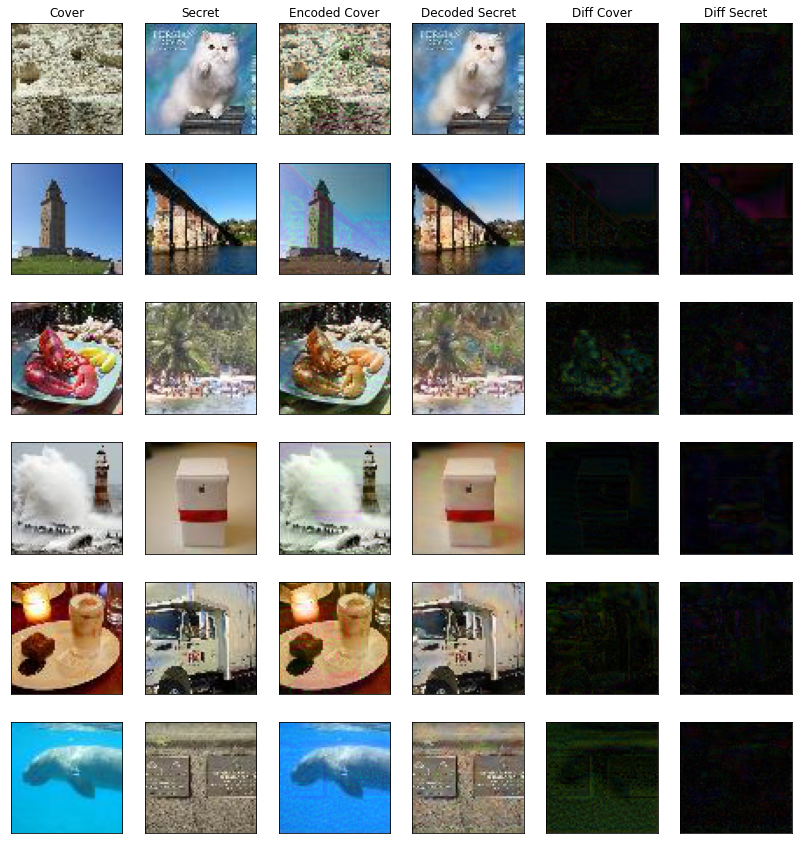

  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 201 | Batch:   0 of 1000. Loss AE    2376.59 | Loss Rev    1174.80:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 201 | Batch:  32 of 1000. Loss AE    2592.41 | Loss Rev    1229.44:   6%|▋         | 2/32 [00:01<00:18,  1.61it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 201 | Batch:  64 of 1000. Loss AE    2433.30 | Loss Rev    1168.78:   9%|▉         | 3/32 [00:01<00:18,  1.59it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 201 | Batch:  96 of 1000. Loss AE    2333.68 | Loss Rev    1112.10:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 201 | Batch: 128 of 1000. Loss AE    2291.44 | Loss Rev    1098.45:  16%|█▌        | 5/32 [00:03<00:15,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 201 | Batch: 160 of 1000. Loss AE    2263.93 | Loss Rev    1115.56:  19%|█▉        | 6/32 [00:03<00:14,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 201 | Batch: 192 of 1000. Loss AE    2201.52 | Loss Rev    1074.89:  22%|██▏       | 7/32 [00:04<00:13,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 201 | Batch: 224 of 1000. Loss AE    2122.42 | Loss Rev    1053.31:  25%|██▌       | 8/32 [00:04<00:13,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 201 | Batch: 256 of 1000. Loss AE    2094.71 | Loss Rev    1048.13:  28%|██▊       | 9/32 [00:05<00:12,  1.87it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 201 | Batch: 288 of 1000. Loss AE    2066.56 | Loss Rev    1032.62:  31%|███▏      | 10/32 [00:05<00:12,  1.77it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 201 | Batch: 320 of 1000. Loss AE    2085.55 | Loss Rev    1041.52:  34%|███▍      | 11/32 [00:06<00:12,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 201 | Batch: 352 of 1000. Loss AE    2110.12 | Loss Rev    1037.35:  38%|███▊      | 12/32 [00:06<00:11,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 201 | Batch: 384 of 1000. Loss AE    2133.98 | Loss Rev    1032.04:  41%|████      | 13/32 [00:07<00:10,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 201 | Batch: 416 of 1000. Loss AE    2112.42 | Loss Rev    1018.25:  44%|████▍     | 14/32 [00:08<00:10,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 201 | Batch: 448 of 1000. Loss AE    2125.43 | Loss Rev    1039.72:  47%|████▋     | 15/32 [00:08<00:09,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 201 | Batch: 480 of 1000. Loss AE    2100.09 | Loss Rev    1030.16:  50%|█████     | 16/32 [00:09<00:09,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 201 | Batch: 512 of 1000. Loss AE    2107.70 | Loss Rev    1029.98:  53%|█████▎    | 17/32 [00:09<00:08,  1.71it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 201 | Batch: 544 of 1000. Loss AE    2100.13 | Loss Rev    1036.62:  56%|█████▋    | 18/32 [00:10<00:08,  1.72it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 201 | Batch: 576 of 1000. Loss AE    2104.45 | Loss Rev    1043.44:  59%|█████▉    | 19/32 [00:10<00:07,  1.79it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 201 | Batch: 608 of 1000. Loss AE    2088.93 | Loss Rev    1034.29:  62%|██████▎   | 20/32 [00:11<00:06,  1.86it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 201 | Batch: 640 of 1000. Loss AE    2081.79 | Loss Rev    1031.25:  66%|██████▌   | 21/32 [00:11<00:06,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 201 | Batch: 672 of 1000. Loss AE    2073.82 | Loss Rev    1023.43:  69%|██████▉   | 22/32 [00:12<00:05,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 201 | Batch: 704 of 1000. Loss AE    2070.13 | Loss Rev    1011.63:  72%|███████▏  | 23/32 [00:13<00:04,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 201 | Batch: 736 of 1000. Loss AE    2060.48 | Loss Rev    1003.53:  75%|███████▌  | 24/32 [00:13<00:04,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 201 | Batch: 768 of 1000. Loss AE    2061.08 | Loss Rev    1002.48:  78%|███████▊  | 25/32 [00:14<00:03,  1.82it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 201 | Batch: 800 of 1000. Loss AE    2053.17 | Loss Rev     999.32:  81%|████████▏ | 26/32 [00:14<00:03,  1.75it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 201 | Batch: 832 of 1000. Loss AE    2049.90 | Loss Rev     999.42:  84%|████████▍ | 27/32 [00:15<00:02,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 201 | Batch: 864 of 1000. Loss AE    2053.15 | Loss Rev     995.91:  88%|████████▊ | 28/32 [00:15<00:02,  1.74it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 201 | Batch: 896 of 1000. Loss AE    2049.46 | Loss Rev     990.25:  91%|█████████ | 29/32 [00:16<00:01,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 201 | Batch: 928 of 1000. Loss AE    2047.71 | Loss Rev     988.74:  94%|█████████▍| 30/32 [00:16<00:01,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 201 | Batch: 960 of 1000. Loss AE    2037.07 | Loss Rev     985.23:  97%|█████████▋| 31/32 [00:17<00:00,  1.85it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 201 | Batch: 992 of 1000. Loss AE    1993.55 | Loss Rev     960.79: 100%|██████████| 32/32 [00:17<00:00,  1.80it/s]

201



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 202 | Batch:   0 of 1000. Loss AE    2067.01 | Loss Rev     891.14:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 202 | Batch:  32 of 1000. Loss AE    2144.29 | Loss Rev     997.08:   6%|▋         | 2/32 [00:01<00:17,  1.71it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 202 | Batch:  64 of 1000. Loss AE    2180.37 | Loss Rev    1092.00:   9%|▉         | 3/32 [00:01<00:16,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 202 | Batch:  96 of 1000. Loss AE    2176.36 | Loss Rev    1074.62:  12%|█▎        | 4/32 [00:02<00:16,  1.72it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 202 | Batch: 128 of 1000. Loss AE    2090.03 | Loss Rev    1038.51:  16%|█▌        | 5/32 [00:03<00:16,  1.64it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 202 | Batch: 160 of 1000. Loss AE    2046.28 | Loss Rev    1021.42:  19%|█▉        | 6/32 [00:03<00:16,  1.62it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 202 | Batch: 192 of 1000. Loss AE    2027.71 | Loss Rev    1010.55:  22%|██▏       | 7/32 [00:04<00:15,  1.65it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 202 | Batch: 224 of 1000. Loss AE    2055.63 | Loss Rev    1019.72:  25%|██▌       | 8/32 [00:04<00:13,  1.72it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 202 | Batch: 256 of 1000. Loss AE    2039.45 | Loss Rev    1009.95:  28%|██▊       | 9/32 [00:05<00:13,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 202 | Batch: 288 of 1000. Loss AE    2047.10 | Loss Rev     999.21:  31%|███▏      | 10/32 [00:05<00:12,  1.71it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 202 | Batch: 320 of 1000. Loss AE    2014.41 | Loss Rev     988.16:  34%|███▍      | 11/32 [00:06<00:11,  1.77it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 202 | Batch: 352 of 1000. Loss AE    2013.39 | Loss Rev     991.49:  38%|███▊      | 12/32 [00:06<00:10,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 202 | Batch: 384 of 1000. Loss AE    2005.64 | Loss Rev     990.05:  41%|████      | 13/32 [00:07<00:10,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 202 | Batch: 416 of 1000. Loss AE    2019.08 | Loss Rev     989.29:  44%|████▍     | 14/32 [00:08<00:10,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 202 | Batch: 448 of 1000. Loss AE    2019.52 | Loss Rev     991.23:  47%|████▋     | 15/32 [00:08<00:09,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 202 | Batch: 480 of 1000. Loss AE    2004.21 | Loss Rev     986.96:  50%|█████     | 16/32 [00:09<00:08,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 202 | Batch: 512 of 1000. Loss AE    2010.13 | Loss Rev     981.58:  53%|█████▎    | 17/32 [00:09<00:08,  1.76it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 202 | Batch: 544 of 1000. Loss AE    2013.50 | Loss Rev     985.44:  56%|█████▋    | 18/32 [00:10<00:08,  1.71it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 202 | Batch: 576 of 1000. Loss AE    2022.48 | Loss Rev     982.67:  59%|█████▉    | 19/32 [00:10<00:07,  1.78it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 202 | Batch: 608 of 1000. Loss AE    2026.94 | Loss Rev     979.58:  62%|██████▎   | 20/32 [00:11<00:07,  1.70it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 202 | Batch: 640 of 1000. Loss AE    2019.15 | Loss Rev     976.15:  66%|██████▌   | 21/32 [00:12<00:06,  1.73it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 202 | Batch: 672 of 1000. Loss AE    1999.98 | Loss Rev     968.86:  69%|██████▉   | 22/32 [00:12<00:05,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 202 | Batch: 704 of 1000. Loss AE    2019.18 | Loss Rev     976.41:  72%|███████▏  | 23/32 [00:13<00:05,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 202 | Batch: 736 of 1000. Loss AE    2024.51 | Loss Rev     980.32:  75%|███████▌  | 24/32 [00:13<00:04,  1.85it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 202 | Batch: 768 of 1000. Loss AE    2019.43 | Loss Rev     981.19:  78%|███████▊  | 25/32 [00:14<00:03,  1.86it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 202 | Batch: 800 of 1000. Loss AE    2006.89 | Loss Rev     973.48:  81%|████████▏ | 26/32 [00:14<00:03,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 202 | Batch: 832 of 1000. Loss AE    2002.21 | Loss Rev     968.76:  84%|████████▍ | 27/32 [00:15<00:02,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 202 | Batch: 864 of 1000. Loss AE    1990.36 | Loss Rev     963.61:  88%|████████▊ | 28/32 [00:15<00:02,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 202 | Batch: 896 of 1000. Loss AE    1983.34 | Loss Rev     959.64:  91%|█████████ | 29/32 [00:16<00:01,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 202 | Batch: 928 of 1000. Loss AE    2000.40 | Loss Rev     956.44:  94%|█████████▍| 30/32 [00:17<00:01,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 202 | Batch: 960 of 1000. Loss AE    1990.10 | Loss Rev     953.19:  97%|█████████▋| 31/32 [00:17<00:00,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 202 | Batch: 992 of 1000. Loss AE    1944.35 | Loss Rev     931.61: 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]


202


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 203 | Batch:   0 of 1000. Loss AE    1718.78 | Loss Rev     988.82:   3%|▎         | 1/32 [00:00<00:15,  1.95it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 203 | Batch:  32 of 1000. Loss AE    2452.47 | Loss Rev    1419.69:   6%|▋         | 2/32 [00:01<00:15,  1.98it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 203 | Batch:  64 of 1000. Loss AE    2468.35 | Loss Rev    1490.16:   9%|▉         | 3/32 [00:01<00:16,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 203 | Batch:  96 of 1000. Loss AE    2375.13 | Loss Rev    1357.17:  12%|█▎        | 4/32 [00:02<00:15,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 203 | Batch: 128 of 1000. Loss AE    2390.86 | Loss Rev    1307.62:  16%|█▌        | 5/32 [00:02<00:14,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 203 | Batch: 160 of 1000. Loss AE    2414.48 | Loss Rev    1367.24:  19%|█▉        | 6/32 [00:03<00:13,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 203 | Batch: 192 of 1000. Loss AE    2493.30 | Loss Rev    1454.78:  22%|██▏       | 7/32 [00:03<00:13,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 203 | Batch: 224 of 1000. Loss AE    2427.61 | Loss Rev    1415.91:  25%|██▌       | 8/32 [00:04<00:13,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 203 | Batch: 256 of 1000. Loss AE    2386.01 | Loss Rev    1365.29:  28%|██▊       | 9/32 [00:04<00:12,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 203 | Batch: 288 of 1000. Loss AE    2341.57 | Loss Rev    1320.92:  31%|███▏      | 10/32 [00:05<00:12,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 203 | Batch: 320 of 1000. Loss AE    2295.51 | Loss Rev    1294.99:  34%|███▍      | 11/32 [00:06<00:12,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 203 | Batch: 352 of 1000. Loss AE    2300.70 | Loss Rev    1262.17:  38%|███▊      | 12/32 [00:06<00:11,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 203 | Batch: 384 of 1000. Loss AE    2300.68 | Loss Rev    1249.19:  41%|████      | 13/32 [00:07<00:11,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 203 | Batch: 416 of 1000. Loss AE    2268.21 | Loss Rev    1234.58:  44%|████▍     | 14/32 [00:07<00:10,  1.65it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 203 | Batch: 448 of 1000. Loss AE    2286.92 | Loss Rev    1239.25:  47%|████▋     | 15/32 [00:08<00:09,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 203 | Batch: 480 of 1000. Loss AE    2260.81 | Loss Rev    1215.49:  50%|█████     | 16/32 [00:08<00:08,  1.80it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 203 | Batch: 512 of 1000. Loss AE    2274.06 | Loss Rev    1205.12:  53%|█████▎    | 17/32 [00:09<00:08,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 203 | Batch: 544 of 1000. Loss AE    2260.64 | Loss Rev    1199.90:  56%|█████▋    | 18/32 [00:10<00:07,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 203 | Batch: 576 of 1000. Loss AE    2229.75 | Loss Rev    1184.98:  59%|█████▉    | 19/32 [00:10<00:07,  1.83it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 203 | Batch: 608 of 1000. Loss AE    2218.00 | Loss Rev    1176.59:  62%|██████▎   | 20/32 [00:11<00:06,  1.75it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 203 | Batch: 640 of 1000. Loss AE    2207.90 | Loss Rev    1170.88:  66%|██████▌   | 21/32 [00:11<00:06,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 203 | Batch: 672 of 1000. Loss AE    2228.61 | Loss Rev    1163.65:  69%|██████▉   | 22/32 [00:12<00:05,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 203 | Batch: 704 of 1000. Loss AE    2211.79 | Loss Rev    1146.30:  72%|███████▏  | 23/32 [00:12<00:04,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 203 | Batch: 736 of 1000. Loss AE    2205.65 | Loss Rev    1139.63:  75%|███████▌  | 24/32 [00:13<00:04,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 203 | Batch: 768 of 1000. Loss AE    2197.17 | Loss Rev    1133.52:  78%|███████▊  | 25/32 [00:13<00:03,  1.83it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 203 | Batch: 800 of 1000. Loss AE    2180.56 | Loss Rev    1124.45:  81%|████████▏ | 26/32 [00:14<00:03,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 203 | Batch: 832 of 1000. Loss AE    2170.46 | Loss Rev    1114.09:  84%|████████▍ | 27/32 [00:15<00:02,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 203 | Batch: 864 of 1000. Loss AE    2163.60 | Loss Rev    1107.02:  88%|████████▊ | 28/32 [00:15<00:02,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 203 | Batch: 896 of 1000. Loss AE    2153.79 | Loss Rev    1097.10:  91%|█████████ | 29/32 [00:16<00:01,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 203 | Batch: 928 of 1000. Loss AE    2142.85 | Loss Rev    1090.79:  94%|█████████▍| 30/32 [00:16<00:01,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 203 | Batch: 960 of 1000. Loss AE    2144.80 | Loss Rev    1091.03:  97%|█████████▋| 31/32 [00:17<00:00,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 203 | Batch: 992 of 1000. Loss AE    2091.12 | Loss Rev    1064.56: 100%|██████████| 32/32 [00:17<00:00,  1.84it/s]


203


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 204 | Batch:   0 of 1000. Loss AE    2056.95 | Loss Rev     975.85:   3%|▎         | 1/32 [00:00<00:16,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 204 | Batch:  32 of 1000. Loss AE    2244.12 | Loss Rev    1226.91:   6%|▋         | 2/32 [00:01<00:15,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 204 | Batch:  64 of 1000. Loss AE    2220.81 | Loss Rev    1241.31:   9%|▉         | 3/32 [00:01<00:15,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 204 | Batch:  96 of 1000. Loss AE    2166.80 | Loss Rev    1150.05:  12%|█▎        | 4/32 [00:02<00:14,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 204 | Batch: 128 of 1000. Loss AE    2137.62 | Loss Rev    1148.05:  16%|█▌        | 5/32 [00:02<00:14,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 204 | Batch: 160 of 1000. Loss AE    2148.27 | Loss Rev    1150.92:  19%|█▉        | 6/32 [00:03<00:13,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 204 | Batch: 192 of 1000. Loss AE    2110.13 | Loss Rev    1114.73:  22%|██▏       | 7/32 [00:03<00:13,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 204 | Batch: 224 of 1000. Loss AE    2122.51 | Loss Rev    1132.35:  25%|██▌       | 8/32 [00:04<00:12,  1.94it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 204 | Batch: 256 of 1000. Loss AE    2117.61 | Loss Rev    1156.35:  28%|██▊       | 9/32 [00:04<00:12,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 204 | Batch: 288 of 1000. Loss AE    2091.62 | Loss Rev    1126.82:  31%|███▏      | 10/32 [00:05<00:11,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 204 | Batch: 320 of 1000. Loss AE    2113.03 | Loss Rev    1141.12:  34%|███▍      | 11/32 [00:05<00:10,  1.95it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 204 | Batch: 352 of 1000. Loss AE    2140.92 | Loss Rev    1181.04:  38%|███▊      | 12/32 [00:06<00:10,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 204 | Batch: 384 of 1000. Loss AE    2200.85 | Loss Rev    1165.30:  41%|████      | 13/32 [00:06<00:10,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 204 | Batch: 416 of 1000. Loss AE    2206.79 | Loss Rev    1156.61:  44%|████▍     | 14/32 [00:07<00:10,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 204 | Batch: 448 of 1000. Loss AE    2211.97 | Loss Rev    1176.01:  47%|████▋     | 15/32 [00:08<00:09,  1.81it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 204 | Batch: 480 of 1000. Loss AE    2213.41 | Loss Rev    1165.94:  50%|█████     | 16/32 [00:08<00:08,  1.79it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 204 | Batch: 512 of 1000. Loss AE    2190.51 | Loss Rev    1155.29:  53%|█████▎    | 17/32 [00:09<00:08,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 204 | Batch: 544 of 1000. Loss AE    2203.30 | Loss Rev    1168.80:  56%|█████▋    | 18/32 [00:09<00:08,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 204 | Batch: 576 of 1000. Loss AE    2201.76 | Loss Rev    1157.94:  59%|█████▉    | 19/32 [00:10<00:07,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 204 | Batch: 608 of 1000. Loss AE    2188.35 | Loss Rev    1142.56:  62%|██████▎   | 20/32 [00:11<00:07,  1.70it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 204 | Batch: 640 of 1000. Loss AE    2186.93 | Loss Rev    1132.58:  66%|██████▌   | 21/32 [00:11<00:06,  1.65it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 204 | Batch: 672 of 1000. Loss AE    2213.23 | Loss Rev    1126.42:  69%|██████▉   | 22/32 [00:12<00:05,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 204 | Batch: 704 of 1000. Loss AE    2198.11 | Loss Rev    1120.07:  72%|███████▏  | 23/32 [00:12<00:05,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 204 | Batch: 736 of 1000. Loss AE    2187.90 | Loss Rev    1112.69:  75%|███████▌  | 24/32 [00:13<00:04,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 204 | Batch: 768 of 1000. Loss AE    2173.36 | Loss Rev    1103.91:  78%|███████▊  | 25/32 [00:13<00:03,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 204 | Batch: 800 of 1000. Loss AE    2155.75 | Loss Rev    1096.24:  81%|████████▏ | 26/32 [00:14<00:03,  1.84it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 204 | Batch: 832 of 1000. Loss AE    2162.46 | Loss Rev    1097.65:  84%|████████▍ | 27/32 [00:14<00:02,  1.77it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 204 | Batch: 864 of 1000. Loss AE    2149.56 | Loss Rev    1090.06:  88%|████████▊ | 28/32 [00:15<00:02,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 204 | Batch: 896 of 1000. Loss AE    2144.17 | Loss Rev    1085.18:  91%|█████████ | 29/32 [00:16<00:01,  1.79it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 204 | Batch: 928 of 1000. Loss AE    2140.51 | Loss Rev    1075.99:  94%|█████████▍| 30/32 [00:16<00:01,  1.76it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 204 | Batch: 960 of 1000. Loss AE    2135.64 | Loss Rev    1067.49:  97%|█████████▋| 31/32 [00:17<00:00,  1.77it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 204 | Batch: 992 of 1000. Loss AE    2080.90 | Loss Rev    1040.55: 100%|██████████| 32/32 [00:17<00:00,  1.84it/s]


204


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 205 | Batch:   0 of 1000. Loss AE    2393.53 | Loss Rev    1190.91:   3%|▎         | 1/32 [00:00<00:16,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 205 | Batch:  32 of 1000. Loss AE    2270.71 | Loss Rev    1056.46:   6%|▋         | 2/32 [00:01<00:16,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 205 | Batch:  64 of 1000. Loss AE    2102.71 | Loss Rev     941.25:   9%|▉         | 3/32 [00:01<00:17,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 205 | Batch:  96 of 1000. Loss AE    2175.99 | Loss Rev     978.61:  12%|█▎        | 4/32 [00:02<00:15,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 205 | Batch: 128 of 1000. Loss AE    2060.33 | Loss Rev     940.74:  16%|█▌        | 5/32 [00:02<00:14,  1.83it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 205 | Batch: 160 of 1000. Loss AE    2098.22 | Loss Rev     998.02:  19%|█▉        | 6/32 [00:03<00:14,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 205 | Batch: 192 of 1000. Loss AE    2045.62 | Loss Rev     975.47:  22%|██▏       | 7/32 [00:03<00:13,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 205 | Batch: 224 of 1000. Loss AE    2042.54 | Loss Rev     993.58:  25%|██▌       | 8/32 [00:04<00:13,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 205 | Batch: 256 of 1000. Loss AE    2069.61 | Loss Rev    1004.99:  28%|██▊       | 9/32 [00:05<00:13,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 205 | Batch: 288 of 1000. Loss AE    2063.29 | Loss Rev    1011.75:  31%|███▏      | 10/32 [00:05<00:12,  1.80it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 205 | Batch: 320 of 1000. Loss AE    2150.44 | Loss Rev    1023.64:  34%|███▍      | 11/32 [00:06<00:12,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 205 | Batch: 352 of 1000. Loss AE    2141.60 | Loss Rev    1024.15:  38%|███▊      | 12/32 [00:06<00:11,  1.76it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 205 | Batch: 384 of 1000. Loss AE    2113.91 | Loss Rev    1012.63:  41%|████      | 13/32 [00:07<00:11,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 205 | Batch: 416 of 1000. Loss AE    2129.64 | Loss Rev    1021.21:  44%|████▍     | 14/32 [00:07<00:10,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 205 | Batch: 448 of 1000. Loss AE    2119.05 | Loss Rev    1025.31:  47%|████▋     | 15/32 [00:08<00:10,  1.69it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 205 | Batch: 480 of 1000. Loss AE    2134.97 | Loss Rev    1036.22:  50%|█████     | 16/32 [00:09<00:09,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 205 | Batch: 512 of 1000. Loss AE    2134.19 | Loss Rev    1037.34:  53%|█████▎    | 17/32 [00:09<00:08,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 205 | Batch: 544 of 1000. Loss AE    2166.02 | Loss Rev    1072.19:  56%|█████▋    | 18/32 [00:10<00:08,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 205 | Batch: 576 of 1000. Loss AE    2154.43 | Loss Rev    1065.57:  59%|█████▉    | 19/32 [00:10<00:07,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 205 | Batch: 608 of 1000. Loss AE    2173.45 | Loss Rev    1089.53:  62%|██████▎   | 20/32 [00:11<00:06,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 205 | Batch: 640 of 1000. Loss AE    2165.63 | Loss Rev    1084.29:  66%|██████▌   | 21/32 [00:11<00:05,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 205 | Batch: 672 of 1000. Loss AE    2176.41 | Loss Rev    1092.60:  69%|██████▉   | 22/32 [00:12<00:05,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 205 | Batch: 704 of 1000. Loss AE    2166.45 | Loss Rev    1088.62:  72%|███████▏  | 23/32 [00:13<00:05,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 205 | Batch: 736 of 1000. Loss AE    2181.08 | Loss Rev    1091.15:  75%|███████▌  | 24/32 [00:13<00:04,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 205 | Batch: 768 of 1000. Loss AE    2185.87 | Loss Rev    1090.19:  78%|███████▊  | 25/32 [00:14<00:03,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 205 | Batch: 800 of 1000. Loss AE    2196.42 | Loss Rev    1092.50:  81%|████████▏ | 26/32 [00:14<00:03,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 205 | Batch: 832 of 1000. Loss AE    2190.59 | Loss Rev    1083.77:  84%|████████▍ | 27/32 [00:15<00:02,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 205 | Batch: 864 of 1000. Loss AE    2184.58 | Loss Rev    1085.25:  88%|████████▊ | 28/32 [00:16<00:02,  1.67it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 205 | Batch: 896 of 1000. Loss AE    2168.50 | Loss Rev    1077.07:  91%|█████████ | 29/32 [00:16<00:01,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 205 | Batch: 928 of 1000. Loss AE    2159.17 | Loss Rev    1075.81:  94%|█████████▍| 30/32 [00:17<00:01,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 205 | Batch: 960 of 1000. Loss AE    2159.68 | Loss Rev    1072.85:  97%|█████████▋| 31/32 [00:17<00:00,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 205 | Batch: 992 of 1000. Loss AE    2105.87 | Loss Rev    1045.84: 100%|██████████| 32/32 [00:17<00:00,  1.78it/s]

205

  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 206 | Batch:   0 of 1000. Loss AE    2125.93 | Loss Rev    1103.71:   3%|▎         | 1/32 [00:00<00:16,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 206 | Batch:  32 of 1000. Loss AE    2020.21 | Loss Rev    1060.58:   6%|▋         | 2/32 [00:01<00:15,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 206 | Batch:  64 of 1000. Loss AE    2229.20 | Loss Rev    1142.69:   9%|▉         | 3/32 [00:01<00:16,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 206 | Batch:  96 of 1000. Loss AE    2102.91 | Loss Rev    1108.49:  12%|█▎        | 4/32 [00:02<00:16,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 206 | Batch: 128 of 1000. Loss AE    2119.00 | Loss Rev    1092.26:  16%|█▌        | 5/32 [00:02<00:14,  1.82it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 206 | Batch: 160 of 1000. Loss AE    2110.07 | Loss Rev    1100.61:  19%|█▉        | 6/32 [00:03<00:14,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 206 | Batch: 192 of 1000. Loss AE    2107.58 | Loss Rev    1086.04:  22%|██▏       | 7/32 [00:03<00:14,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 206 | Batch: 224 of 1000. Loss AE    2142.34 | Loss Rev    1103.62:  25%|██▌       | 8/32 [00:04<00:13,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 206 | Batch: 256 of 1000. Loss AE    2146.63 | Loss Rev    1070.17:  28%|██▊       | 9/32 [00:05<00:12,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 206 | Batch: 288 of 1000. Loss AE    2196.06 | Loss Rev    1054.83:  31%|███▏      | 10/32 [00:05<00:12,  1.82it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 206 | Batch: 320 of 1000. Loss AE    2191.83 | Loss Rev    1050.88:  34%|███▍      | 11/32 [00:06<00:12,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 206 | Batch: 352 of 1000. Loss AE    2171.25 | Loss Rev    1044.01:  38%|███▊      | 12/32 [00:06<00:10,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 206 | Batch: 384 of 1000. Loss AE    2159.32 | Loss Rev    1042.33:  41%|████      | 13/32 [00:07<00:10,  1.85it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 206 | Batch: 416 of 1000. Loss AE    2131.29 | Loss Rev    1024.77:  44%|████▍     | 14/32 [00:07<00:10,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 206 | Batch: 448 of 1000. Loss AE    2130.72 | Loss Rev    1024.77:  47%|████▋     | 15/32 [00:08<00:09,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 206 | Batch: 480 of 1000. Loss AE    2113.50 | Loss Rev    1016.58:  50%|█████     | 16/32 [00:08<00:08,  1.83it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 206 | Batch: 512 of 1000. Loss AE    2100.49 | Loss Rev    1014.82:  53%|█████▎    | 17/32 [00:09<00:08,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 206 | Batch: 544 of 1000. Loss AE    2082.33 | Loss Rev    1008.07:  56%|█████▋    | 18/32 [00:10<00:07,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 206 | Batch: 576 of 1000. Loss AE    2068.68 | Loss Rev    1003.77:  59%|█████▉    | 19/32 [00:10<00:07,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 206 | Batch: 608 of 1000. Loss AE    2084.33 | Loss Rev    1010.53:  62%|██████▎   | 20/32 [00:11<00:06,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 206 | Batch: 640 of 1000. Loss AE    2087.51 | Loss Rev    1018.49:  66%|██████▌   | 21/32 [00:11<00:06,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 206 | Batch: 672 of 1000. Loss AE    2109.25 | Loss Rev    1037.99:  69%|██████▉   | 22/32 [00:12<00:05,  1.77it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 206 | Batch: 704 of 1000. Loss AE    2153.83 | Loss Rev    1081.46:  72%|███████▏  | 23/32 [00:12<00:05,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 206 | Batch: 736 of 1000. Loss AE    2218.79 | Loss Rev    1144.68:  75%|███████▌  | 24/32 [00:13<00:04,  1.80it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 206 | Batch: 768 of 1000. Loss AE    2228.50 | Loss Rev    1161.98:  78%|███████▊  | 25/32 [00:13<00:03,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 206 | Batch: 800 of 1000. Loss AE    2249.06 | Loss Rev    1165.74:  81%|████████▏ | 26/32 [00:14<00:03,  1.89it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 206 | Batch: 832 of 1000. Loss AE    2301.46 | Loss Rev    1212.09:  84%|████████▍ | 27/32 [00:15<00:02,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 206 | Batch: 864 of 1000. Loss AE    2391.07 | Loss Rev    1298.49:  88%|████████▊ | 28/32 [00:15<00:02,  1.75it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 206 | Batch: 896 of 1000. Loss AE    2421.12 | Loss Rev    1328.59:  91%|█████████ | 29/32 [00:16<00:01,  1.75it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 206 | Batch: 928 of 1000. Loss AE    2430.58 | Loss Rev    1331.17:  94%|█████████▍| 30/32 [00:16<00:01,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 206 | Batch: 960 of 1000. Loss AE    2479.12 | Loss Rev    1380.68:  97%|█████████▋| 31/32 [00:17<00:00,  1.88it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 206 | Batch: 992 of 1000. Loss AE    2431.25 | Loss Rev    1356.59: 100%|██████████| 32/32 [00:17<00:00,  1.83it/s]


206


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 207 | Batch:   0 of 1000. Loss AE   11983.15 | Loss Rev    8743.35:   3%|▎         | 1/32 [00:00<00:18,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 207 | Batch:  32 of 1000. Loss AE    7508.56 | Loss Rev    5191.82:   6%|▋         | 2/32 [00:01<00:16,  1.86it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 207 | Batch:  64 of 1000. Loss AE    8556.79 | Loss Rev    5862.70:   9%|▉         | 3/32 [00:01<00:16,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 207 | Batch:  96 of 1000. Loss AE    9186.19 | Loss Rev    6703.33:  12%|█▎        | 4/32 [00:02<00:15,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 207 | Batch: 128 of 1000. Loss AE    9110.44 | Loss Rev    6169.12:  16%|█▌        | 5/32 [00:02<00:15,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 207 | Batch: 160 of 1000. Loss AE    8986.94 | Loss Rev    5910.95:  19%|█▉        | 6/32 [00:03<00:15,  1.68it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 207 | Batch: 192 of 1000. Loss AE    8886.45 | Loss Rev    5276.89:  22%|██▏       | 7/32 [00:04<00:14,  1.68it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 207 | Batch: 224 of 1000. Loss AE    8355.64 | Loss Rev    4938.55:  25%|██▌       | 8/32 [00:04<00:13,  1.73it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 207 | Batch: 256 of 1000. Loss AE    8345.16 | Loss Rev    4668.39:  28%|██▊       | 9/32 [00:05<00:13,  1.68it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 207 | Batch: 288 of 1000. Loss AE    7889.58 | Loss Rev    4427.85:  31%|███▏      | 10/32 [00:05<00:13,  1.65it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 207 | Batch: 320 of 1000. Loss AE    7831.93 | Loss Rev    4253.79:  34%|███▍      | 11/32 [00:06<00:12,  1.66it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 207 | Batch: 352 of 1000. Loss AE    7485.20 | Loss Rev    4043.62:  38%|███▊      | 12/32 [00:07<00:12,  1.64it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 207 | Batch: 384 of 1000. Loss AE    7369.37 | Loss Rev    3879.35:  41%|████      | 13/32 [00:07<00:11,  1.69it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 207 | Batch: 416 of 1000. Loss AE    7105.54 | Loss Rev    3728.75:  44%|████▍     | 14/32 [00:08<00:10,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 207 | Batch: 448 of 1000. Loss AE    6934.59 | Loss Rev    3574.38:  47%|████▋     | 15/32 [00:08<00:09,  1.83it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 207 | Batch: 480 of 1000. Loss AE    6726.17 | Loss Rev    3454.16:  50%|█████     | 16/32 [00:09<00:08,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 207 | Batch: 512 of 1000. Loss AE    6580.63 | Loss Rev    3342.84:  53%|█████▎    | 17/32 [00:09<00:08,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 207 | Batch: 544 of 1000. Loss AE    6502.87 | Loss Rev    3245.08:  56%|█████▋    | 18/32 [00:10<00:07,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 207 | Batch: 576 of 1000. Loss AE    6307.53 | Loss Rev    3148.85:  59%|█████▉    | 19/32 [00:10<00:07,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 207 | Batch: 608 of 1000. Loss AE    6178.39 | Loss Rev    3054.84:  62%|██████▎   | 20/32 [00:11<00:07,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 207 | Batch: 640 of 1000. Loss AE    6016.65 | Loss Rev    2965.76:  66%|██████▌   | 21/32 [00:12<00:06,  1.69it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 207 | Batch: 672 of 1000. Loss AE    5885.12 | Loss Rev    2883.24:  69%|██████▉   | 22/32 [00:12<00:05,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 207 | Batch: 704 of 1000. Loss AE    5764.26 | Loss Rev    2808.25:  72%|███████▏  | 23/32 [00:13<00:05,  1.69it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 207 | Batch: 736 of 1000. Loss AE    5645.03 | Loss Rev    2752.63:  75%|███████▌  | 24/32 [00:13<00:04,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 207 | Batch: 768 of 1000. Loss AE    5538.19 | Loss Rev    2687.12:  78%|███████▊  | 25/32 [00:14<00:03,  1.78it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 207 | Batch: 800 of 1000. Loss AE    5431.08 | Loss Rev    2632.95:  81%|████████▏ | 26/32 [00:15<00:03,  1.77it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 207 | Batch: 832 of 1000. Loss AE    5340.01 | Loss Rev    2584.65:  84%|████████▍ | 27/32 [00:15<00:02,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 207 | Batch: 864 of 1000. Loss AE    5260.35 | Loss Rev    2537.02:  88%|████████▊ | 28/32 [00:16<00:02,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 207 | Batch: 896 of 1000. Loss AE    5163.42 | Loss Rev    2487.62:  91%|█████████ | 29/32 [00:16<00:01,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 207 | Batch: 928 of 1000. Loss AE    5086.83 | Loss Rev    2444.34:  94%|█████████▍| 30/32 [00:17<00:01,  1.82it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 207 | Batch: 960 of 1000. Loss AE    5018.49 | Loss Rev    2409.22:  97%|█████████▋| 31/32 [00:17<00:00,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 207 | Batch: 992 of 1000. Loss AE    4885.44 | Loss Rev    2345.75: 100%|██████████| 32/32 [00:17<00:00,  1.78it/s]

207



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 208 | Batch:   0 of 1000. Loss AE    4020.96 | Loss Rev    2046.40:   3%|▎         | 1/32 [00:00<00:16,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 208 | Batch:  32 of 1000. Loss AE    3524.87 | Loss Rev    1974.54:   6%|▋         | 2/32 [00:01<00:15,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 208 | Batch:  64 of 1000. Loss AE    3304.39 | Loss Rev    1795.43:   9%|▉         | 3/32 [00:01<00:16,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 208 | Batch:  96 of 1000. Loss AE    3539.07 | Loss Rev    1903.76:  12%|█▎        | 4/32 [00:02<00:16,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 208 | Batch: 128 of 1000. Loss AE    3341.04 | Loss Rev    1777.90:  16%|█▌        | 5/32 [00:02<00:15,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 208 | Batch: 160 of 1000. Loss AE    3332.10 | Loss Rev    1716.46:  19%|█▉        | 6/32 [00:03<00:14,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 208 | Batch: 192 of 1000. Loss AE    3287.44 | Loss Rev    1723.12:  22%|██▏       | 7/32 [00:03<00:14,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 208 | Batch: 224 of 1000. Loss AE    3240.88 | Loss Rev    1663.89:  25%|██▌       | 8/32 [00:04<00:13,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 208 | Batch: 256 of 1000. Loss AE    3159.90 | Loss Rev    1632.14:  28%|██▊       | 9/32 [00:04<00:12,  1.86it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 208 | Batch: 288 of 1000. Loss AE    3138.52 | Loss Rev    1609.44:  31%|███▏      | 10/32 [00:05<00:12,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 208 | Batch: 320 of 1000. Loss AE    3082.07 | Loss Rev    1566.74:  34%|███▍      | 11/32 [00:06<00:12,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 208 | Batch: 352 of 1000. Loss AE    3036.15 | Loss Rev    1563.15:  38%|███▊      | 12/32 [00:06<00:11,  1.78it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 208 | Batch: 384 of 1000. Loss AE    2955.22 | Loss Rev    1520.98:  41%|████      | 13/32 [00:07<00:10,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 208 | Batch: 416 of 1000. Loss AE    2913.55 | Loss Rev    1497.99:  44%|████▍     | 14/32 [00:07<00:09,  1.91it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 208 | Batch: 448 of 1000. Loss AE    2898.86 | Loss Rev    1489.26:  47%|████▋     | 15/32 [00:08<00:09,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 208 | Batch: 480 of 1000. Loss AE    2841.94 | Loss Rev    1450.63:  50%|█████     | 16/32 [00:08<00:08,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 208 | Batch: 512 of 1000. Loss AE    2808.75 | Loss Rev    1428.46:  53%|█████▎    | 17/32 [00:09<00:08,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 208 | Batch: 544 of 1000. Loss AE    2761.52 | Loss Rev    1399.80:  56%|█████▋    | 18/32 [00:09<00:07,  1.85it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 208 | Batch: 576 of 1000. Loss AE    2727.44 | Loss Rev    1377.20:  59%|█████▉    | 19/32 [00:10<00:07,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 208 | Batch: 608 of 1000. Loss AE    2705.63 | Loss Rev    1362.97:  62%|██████▎   | 20/32 [00:11<00:06,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 208 | Batch: 640 of 1000. Loss AE    2678.03 | Loss Rev    1350.66:  66%|██████▌   | 21/32 [00:11<00:06,  1.69it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 208 | Batch: 672 of 1000. Loss AE    2663.03 | Loss Rev    1338.22:  69%|██████▉   | 22/32 [00:12<00:06,  1.65it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 208 | Batch: 704 of 1000. Loss AE    2636.18 | Loss Rev    1322.67:  72%|███████▏  | 23/32 [00:12<00:05,  1.67it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 208 | Batch: 736 of 1000. Loss AE    2630.69 | Loss Rev    1311.80:  75%|███████▌  | 24/32 [00:13<00:04,  1.74it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 208 | Batch: 768 of 1000. Loss AE    2615.59 | Loss Rev    1299.39:  78%|███████▊  | 25/32 [00:14<00:03,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 208 | Batch: 800 of 1000. Loss AE    2618.43 | Loss Rev    1295.48:  81%|████████▏ | 26/32 [00:14<00:03,  1.73it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 208 | Batch: 832 of 1000. Loss AE    2600.16 | Loss Rev    1288.56:  84%|████████▍ | 27/32 [00:15<00:02,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 208 | Batch: 864 of 1000. Loss AE    2580.52 | Loss Rev    1278.86:  88%|████████▊ | 28/32 [00:15<00:02,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 208 | Batch: 896 of 1000. Loss AE    2563.73 | Loss Rev    1260.42:  91%|█████████ | 29/32 [00:16<00:01,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 208 | Batch: 928 of 1000. Loss AE    2559.04 | Loss Rev    1254.90:  94%|█████████▍| 30/32 [00:16<00:01,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 208 | Batch: 960 of 1000. Loss AE    2539.76 | Loss Rev    1244.43:  97%|█████████▋| 31/32 [00:17<00:00,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 208 | Batch: 992 of 1000. Loss AE    2475.90 | Loss Rev    1214.13: 100%|██████████| 32/32 [00:17<00:00,  1.81it/s]


208


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 209 | Batch:   0 of 1000. Loss AE    1934.70 | Loss Rev     878.66:   3%|▎         | 1/32 [00:00<00:16,  1.93it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 209 | Batch:  32 of 1000. Loss AE    1925.28 | Loss Rev     921.20:   6%|▋         | 2/32 [00:01<00:15,  1.91it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 209 | Batch:  64 of 1000. Loss AE    1826.78 | Loss Rev     850.43:   9%|▉         | 3/32 [00:01<00:14,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 209 | Batch:  96 of 1000. Loss AE    1948.86 | Loss Rev     886.49:  12%|█▎        | 4/32 [00:01<00:13,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 209 | Batch: 128 of 1000. Loss AE    2011.06 | Loss Rev     920.86:  16%|█▌        | 5/32 [00:02<00:14,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 209 | Batch: 160 of 1000. Loss AE    2010.67 | Loss Rev     924.21:  19%|█▉        | 6/32 [00:03<00:13,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 209 | Batch: 192 of 1000. Loss AE    1990.49 | Loss Rev     919.99:  22%|██▏       | 7/32 [00:03<00:13,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 209 | Batch: 224 of 1000. Loss AE    2014.60 | Loss Rev     920.15:  25%|██▌       | 8/32 [00:04<00:13,  1.76it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 209 | Batch: 256 of 1000. Loss AE    2030.99 | Loss Rev     919.98:  28%|██▊       | 9/32 [00:04<00:13,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 209 | Batch: 288 of 1000. Loss AE    2031.47 | Loss Rev     911.48:  31%|███▏      | 10/32 [00:05<00:12,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 209 | Batch: 320 of 1000. Loss AE    2024.01 | Loss Rev     912.26:  34%|███▍      | 11/32 [00:05<00:11,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 209 | Batch: 352 of 1000. Loss AE    2014.28 | Loss Rev     918.47:  38%|███▊      | 12/32 [00:06<00:11,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 209 | Batch: 384 of 1000. Loss AE    2038.55 | Loss Rev     912.72:  41%|████      | 13/32 [00:07<00:10,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 209 | Batch: 416 of 1000. Loss AE    2038.24 | Loss Rev     905.05:  44%|████▍     | 14/32 [00:07<00:10,  1.69it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 209 | Batch: 448 of 1000. Loss AE    2030.73 | Loss Rev     900.16:  47%|████▋     | 15/32 [00:08<00:10,  1.64it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 209 | Batch: 480 of 1000. Loss AE    2059.95 | Loss Rev     908.98:  50%|█████     | 16/32 [00:08<00:09,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 209 | Batch: 512 of 1000. Loss AE    2056.02 | Loss Rev     907.30:  53%|█████▎    | 17/32 [00:09<00:08,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 209 | Batch: 544 of 1000. Loss AE    2045.88 | Loss Rev     899.49:  56%|█████▋    | 18/32 [00:10<00:08,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 209 | Batch: 576 of 1000. Loss AE    2049.80 | Loss Rev     905.80:  59%|█████▉    | 19/32 [00:10<00:07,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 209 | Batch: 608 of 1000. Loss AE    2036.39 | Loss Rev     904.46:  62%|██████▎   | 20/32 [00:11<00:06,  1.87it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 209 | Batch: 640 of 1000. Loss AE    2023.23 | Loss Rev     899.75:  66%|██████▌   | 21/32 [00:11<00:05,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 209 | Batch: 672 of 1000. Loss AE    2023.90 | Loss Rev     900.51:  69%|██████▉   | 22/32 [00:12<00:05,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 209 | Batch: 704 of 1000. Loss AE    2007.18 | Loss Rev     898.31:  72%|███████▏  | 23/32 [00:12<00:04,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 209 | Batch: 736 of 1000. Loss AE    1996.26 | Loss Rev     895.59:  75%|███████▌  | 24/32 [00:13<00:04,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 209 | Batch: 768 of 1000. Loss AE    1988.20 | Loss Rev     895.19:  78%|███████▊  | 25/32 [00:13<00:03,  1.78it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 209 | Batch: 800 of 1000. Loss AE    1968.50 | Loss Rev     890.11:  81%|████████▏ | 26/32 [00:14<00:03,  1.73it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 209 | Batch: 832 of 1000. Loss AE    1964.58 | Loss Rev     890.71:  84%|████████▍ | 27/32 [00:15<00:02,  1.78it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 209 | Batch: 864 of 1000. Loss AE    1960.56 | Loss Rev     884.71:  88%|████████▊ | 28/32 [00:15<00:02,  1.74it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 209 | Batch: 896 of 1000. Loss AE    1971.21 | Loss Rev     881.72:  91%|█████████ | 29/32 [00:16<00:01,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 209 | Batch: 928 of 1000. Loss AE    1965.89 | Loss Rev     881.93:  94%|█████████▍| 30/32 [00:16<00:01,  1.79it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 209 | Batch: 960 of 1000. Loss AE    1966.14 | Loss Rev     883.74:  97%|█████████▋| 31/32 [00:17<00:00,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 209 | Batch: 992 of 1000. Loss AE    1919.70 | Loss Rev     865.29: 100%|██████████| 32/32 [00:17<00:00,  1.84it/s]

209



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 210 | Batch:   0 of 1000. Loss AE    2256.26 | Loss Rev    1229.21:   3%|▎         | 1/32 [00:00<00:19,  1.62it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 210 | Batch:  32 of 1000. Loss AE    3005.46 | Loss Rev    1923.68:   6%|▋         | 2/32 [00:01<00:16,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 210 | Batch:  64 of 1000. Loss AE    3715.84 | Loss Rev    2504.89:   9%|▉         | 3/32 [00:01<00:16,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 210 | Batch:  96 of 1000. Loss AE    3452.16 | Loss Rev    2293.70:  12%|█▎        | 4/32 [00:02<00:16,  1.69it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 210 | Batch: 128 of 1000. Loss AE    3208.42 | Loss Rev    2102.31:  16%|█▌        | 5/32 [00:02<00:16,  1.65it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 210 | Batch: 160 of 1000. Loss AE    3439.95 | Loss Rev    2315.38:  19%|█▉        | 6/32 [00:03<00:15,  1.66it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 210 | Batch: 192 of 1000. Loss AE    3392.37 | Loss Rev    2270.44:  22%|██▏       | 7/32 [00:04<00:15,  1.67it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 210 | Batch: 224 of 1000. Loss AE    3279.71 | Loss Rev    2156.46:  25%|██▌       | 8/32 [00:04<00:14,  1.68it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 210 | Batch: 256 of 1000. Loss AE    3332.55 | Loss Rev    2230.35:  28%|██▊       | 9/32 [00:05<00:13,  1.70it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 210 | Batch: 288 of 1000. Loss AE    3204.11 | Loss Rev    2105.74:  31%|███▏      | 10/32 [00:05<00:12,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 210 | Batch: 320 of 1000. Loss AE    3223.16 | Loss Rev    2100.27:  34%|███▍      | 11/32 [00:06<00:12,  1.74it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 210 | Batch: 352 of 1000. Loss AE    3184.35 | Loss Rev    2071.45:  38%|███▊      | 12/32 [00:06<00:11,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 210 | Batch: 384 of 1000. Loss AE    3151.23 | Loss Rev    2042.82:  41%|████      | 13/32 [00:07<00:10,  1.77it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 210 | Batch: 416 of 1000. Loss AE    3210.30 | Loss Rev    2089.85:  44%|████▍     | 14/32 [00:08<00:10,  1.73it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 210 | Batch: 448 of 1000. Loss AE    3151.17 | Loss Rev    2013.22:  47%|████▋     | 15/32 [00:08<00:09,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 210 | Batch: 480 of 1000. Loss AE    3160.29 | Loss Rev    2023.05:  50%|█████     | 16/32 [00:09<00:09,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 210 | Batch: 512 of 1000. Loss AE    3104.50 | Loss Rev    1959.11:  53%|█████▎    | 17/32 [00:09<00:08,  1.75it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 210 | Batch: 544 of 1000. Loss AE    3107.09 | Loss Rev    1967.12:  56%|█████▋    | 18/32 [00:10<00:07,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 210 | Batch: 576 of 1000. Loss AE    3067.11 | Loss Rev    1933.67:  59%|█████▉    | 19/32 [00:10<00:07,  1.82it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 210 | Batch: 608 of 1000. Loss AE    3031.70 | Loss Rev    1907.65:  62%|██████▎   | 20/32 [00:11<00:06,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 210 | Batch: 640 of 1000. Loss AE    2998.47 | Loss Rev    1873.11:  66%|██████▌   | 21/32 [00:12<00:06,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 210 | Batch: 672 of 1000. Loss AE    2969.62 | Loss Rev    1844.87:  69%|██████▉   | 22/32 [00:12<00:05,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 210 | Batch: 704 of 1000. Loss AE    2952.97 | Loss Rev    1815.24:  72%|███████▏  | 23/32 [00:13<00:05,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 210 | Batch: 736 of 1000. Loss AE    2949.62 | Loss Rev    1790.35:  75%|███████▌  | 24/32 [00:13<00:04,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 210 | Batch: 768 of 1000. Loss AE    2933.79 | Loss Rev    1773.99:  78%|███████▊  | 25/32 [00:14<00:03,  1.88it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 210 | Batch: 800 of 1000. Loss AE    2908.66 | Loss Rev    1741.78:  81%|████████▏ | 26/32 [00:14<00:03,  1.92it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 210 | Batch: 832 of 1000. Loss AE    2879.08 | Loss Rev    1716.35:  84%|████████▍ | 27/32 [00:15<00:02,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 210 | Batch: 864 of 1000. Loss AE    2845.90 | Loss Rev    1690.75:  88%|████████▊ | 28/32 [00:15<00:02,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 210 | Batch: 896 of 1000. Loss AE    2824.95 | Loss Rev    1671.68:  91%|█████████ | 29/32 [00:16<00:01,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 210 | Batch: 928 of 1000. Loss AE    2799.70 | Loss Rev    1646.62:  94%|█████████▍| 30/32 [00:17<00:01,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 210 | Batch: 960 of 1000. Loss AE    2777.99 | Loss Rev    1623.84:  97%|█████████▋| 31/32 [00:17<00:00,  1.72it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 210 | Batch: 992 of 1000. Loss AE    2707.29 | Loss Rev    1579.67: 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]


210


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 211 | Batch:   0 of 1000. Loss AE    2191.05 | Loss Rev    1219.17:   3%|▎         | 1/32 [00:00<00:18,  1.65it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 211 | Batch:  32 of 1000. Loss AE    2318.35 | Loss Rev     984.42:   6%|▋         | 2/32 [00:01<00:18,  1.60it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 211 | Batch:  64 of 1000. Loss AE    2258.44 | Loss Rev     988.45:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 211 | Batch:  96 of 1000. Loss AE    2190.16 | Loss Rev     975.52:  12%|█▎        | 4/32 [00:02<00:17,  1.63it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 211 | Batch: 128 of 1000. Loss AE    2217.45 | Loss Rev     979.95:  16%|█▌        | 5/32 [00:02<00:15,  1.74it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 211 | Batch: 160 of 1000. Loss AE    2136.71 | Loss Rev     944.80:  19%|█▉        | 6/32 [00:03<00:14,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 211 | Batch: 192 of 1000. Loss AE    2099.90 | Loss Rev     938.02:  22%|██▏       | 7/32 [00:04<00:13,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 211 | Batch: 224 of 1000. Loss AE    2104.32 | Loss Rev     935.97:  25%|██▌       | 8/32 [00:04<00:13,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 211 | Batch: 256 of 1000. Loss AE    2084.68 | Loss Rev     941.94:  28%|██▊       | 9/32 [00:05<00:13,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 211 | Batch: 288 of 1000. Loss AE    2057.10 | Loss Rev     936.59:  31%|███▏      | 10/32 [00:05<00:13,  1.68it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 211 | Batch: 320 of 1000. Loss AE    2067.90 | Loss Rev     933.46:  34%|███▍      | 11/32 [00:06<00:11,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 211 | Batch: 352 of 1000. Loss AE    2070.60 | Loss Rev     927.64:  38%|███▊      | 12/32 [00:06<00:10,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 211 | Batch: 384 of 1000. Loss AE    2058.10 | Loss Rev     923.78:  41%|████      | 13/32 [00:07<00:10,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 211 | Batch: 416 of 1000. Loss AE    2046.52 | Loss Rev     917.58:  44%|████▍     | 14/32 [00:08<00:10,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 211 | Batch: 448 of 1000. Loss AE    2049.37 | Loss Rev     912.17:  47%|████▋     | 15/32 [00:08<00:09,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 211 | Batch: 480 of 1000. Loss AE    2032.34 | Loss Rev     907.30:  50%|█████     | 16/32 [00:09<00:08,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 211 | Batch: 512 of 1000. Loss AE    2017.93 | Loss Rev     906.52:  53%|█████▎    | 17/32 [00:09<00:08,  1.87it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 211 | Batch: 544 of 1000. Loss AE    2017.18 | Loss Rev     901.54:  56%|█████▋    | 18/32 [00:10<00:07,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 211 | Batch: 576 of 1000. Loss AE    2012.12 | Loss Rev     894.03:  59%|█████▉    | 19/32 [00:10<00:07,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 211 | Batch: 608 of 1000. Loss AE    1995.06 | Loss Rev     884.74:  62%|██████▎   | 20/32 [00:11<00:06,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 211 | Batch: 640 of 1000. Loss AE    2000.11 | Loss Rev     886.03:  66%|██████▌   | 21/32 [00:11<00:06,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 211 | Batch: 672 of 1000. Loss AE    1999.56 | Loss Rev     882.36:  69%|██████▉   | 22/32 [00:12<00:05,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 211 | Batch: 704 of 1000. Loss AE    1991.73 | Loss Rev     876.14:  72%|███████▏  | 23/32 [00:13<00:05,  1.75it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 211 | Batch: 736 of 1000. Loss AE    1986.00 | Loss Rev     876.66:  75%|███████▌  | 24/32 [00:13<00:04,  1.68it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 211 | Batch: 768 of 1000. Loss AE    1993.11 | Loss Rev     874.55:  78%|███████▊  | 25/32 [00:14<00:04,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 211 | Batch: 800 of 1000. Loss AE    1987.43 | Loss Rev     870.38:  81%|████████▏ | 26/32 [00:14<00:03,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 211 | Batch: 832 of 1000. Loss AE    1970.83 | Loss Rev     863.55:  84%|████████▍ | 27/32 [00:15<00:02,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 211 | Batch: 864 of 1000. Loss AE    1972.87 | Loss Rev     860.29:  88%|████████▊ | 28/32 [00:16<00:02,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 211 | Batch: 896 of 1000. Loss AE    1971.67 | Loss Rev     869.22:  91%|█████████ | 29/32 [00:16<00:01,  1.67it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 211 | Batch: 928 of 1000. Loss AE    1973.18 | Loss Rev     870.79:  94%|█████████▍| 30/32 [00:17<00:01,  1.64it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 211 | Batch: 960 of 1000. Loss AE    1979.41 | Loss Rev     872.66:  97%|█████████▋| 31/32 [00:17<00:00,  1.64it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 211 | Batch: 992 of 1000. Loss AE    1940.09 | Loss Rev     854.35: 100%|██████████| 32/32 [00:18<00:00,  1.76it/s]


211


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 212 | Batch:   0 of 1000. Loss AE    2297.24 | Loss Rev     959.18:   3%|▎         | 1/32 [00:00<00:18,  1.70it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 212 | Batch:  32 of 1000. Loss AE    2112.43 | Loss Rev     877.74:   6%|▋         | 2/32 [00:01<00:16,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 212 | Batch:  64 of 1000. Loss AE    2027.73 | Loss Rev     868.35:   9%|▉         | 3/32 [00:01<00:15,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 212 | Batch:  96 of 1000. Loss AE    2028.25 | Loss Rev     883.92:  12%|█▎        | 4/32 [00:02<00:14,  1.90it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 212 | Batch: 128 of 1000. Loss AE    1965.93 | Loss Rev     865.16:  16%|█▌        | 5/32 [00:02<00:14,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 212 | Batch: 160 of 1000. Loss AE    1919.87 | Loss Rev     857.57:  19%|█▉        | 6/32 [00:03<00:14,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 212 | Batch: 192 of 1000. Loss AE    1899.53 | Loss Rev     848.37:  22%|██▏       | 7/32 [00:03<00:13,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 212 | Batch: 224 of 1000. Loss AE    1885.81 | Loss Rev     837.99:  25%|██▌       | 8/32 [00:04<00:13,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 212 | Batch: 256 of 1000. Loss AE    1907.24 | Loss Rev     841.86:  28%|██▊       | 9/32 [00:04<00:12,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 212 | Batch: 288 of 1000. Loss AE    1892.71 | Loss Rev     842.21:  31%|███▏      | 10/32 [00:05<00:12,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 212 | Batch: 320 of 1000. Loss AE    1915.49 | Loss Rev     848.51:  34%|███▍      | 11/32 [00:06<00:11,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 212 | Batch: 352 of 1000. Loss AE    1917.93 | Loss Rev     847.20:  38%|███▊      | 12/32 [00:06<00:11,  1.73it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 212 | Batch: 384 of 1000. Loss AE    1921.07 | Loss Rev     837.94:  41%|████      | 13/32 [00:07<00:10,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 212 | Batch: 416 of 1000. Loss AE    1926.01 | Loss Rev     845.19:  44%|████▍     | 14/32 [00:07<00:10,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 212 | Batch: 448 of 1000. Loss AE    1920.21 | Loss Rev     844.89:  47%|████▋     | 15/32 [00:08<00:09,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 212 | Batch: 480 of 1000. Loss AE    1901.58 | Loss Rev     838.61:  50%|█████     | 16/32 [00:08<00:08,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 212 | Batch: 512 of 1000. Loss AE    1891.04 | Loss Rev     839.68:  53%|█████▎    | 17/32 [00:09<00:08,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 212 | Batch: 544 of 1000. Loss AE    1886.49 | Loss Rev     839.27:  56%|█████▋    | 18/32 [00:09<00:07,  1.84it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 212 | Batch: 576 of 1000. Loss AE    1881.85 | Loss Rev     837.88:  59%|█████▉    | 19/32 [00:10<00:07,  1.84it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 212 | Batch: 608 of 1000. Loss AE    1883.36 | Loss Rev     838.29:  62%|██████▎   | 20/32 [00:11<00:08,  1.47it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 212 | Batch: 640 of 1000. Loss AE    1901.20 | Loss Rev     840.72:  66%|██████▌   | 21/32 [00:12<00:07,  1.51it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 212 | Batch: 672 of 1000. Loss AE    1884.74 | Loss Rev     837.74:  69%|██████▉   | 22/32 [00:12<00:06,  1.63it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 212 | Batch: 704 of 1000. Loss AE    1882.47 | Loss Rev     838.56:  72%|███████▏  | 23/32 [00:13<00:05,  1.64it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 212 | Batch: 736 of 1000. Loss AE    1869.98 | Loss Rev     838.11:  75%|███████▌  | 24/32 [00:13<00:04,  1.62it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 212 | Batch: 768 of 1000. Loss AE    1870.96 | Loss Rev     841.93:  78%|███████▊  | 25/32 [00:14<00:04,  1.66it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 212 | Batch: 800 of 1000. Loss AE    1873.72 | Loss Rev     846.88:  81%|████████▏ | 26/32 [00:14<00:03,  1.70it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 212 | Batch: 832 of 1000. Loss AE    1874.48 | Loss Rev     850.92:  84%|████████▍ | 27/32 [00:15<00:02,  1.78it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 212 | Batch: 864 of 1000. Loss AE    1877.78 | Loss Rev     849.65:  88%|████████▊ | 28/32 [00:15<00:02,  1.83it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 212 | Batch: 896 of 1000. Loss AE    1876.19 | Loss Rev     850.94:  91%|█████████ | 29/32 [00:16<00:01,  1.75it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 212 | Batch: 928 of 1000. Loss AE    1896.06 | Loss Rev     857.69:  94%|█████████▍| 30/32 [00:17<00:01,  1.71it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 212 | Batch: 960 of 1000. Loss AE    1905.37 | Loss Rev     867.20:  97%|█████████▋| 31/32 [00:17<00:00,  1.72it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 212 | Batch: 992 of 1000. Loss AE    1858.61 | Loss Rev     846.77: 100%|██████████| 32/32 [00:18<00:00,  1.76it/s]


212


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 213 | Batch:   0 of 1000. Loss AE    2823.09 | Loss Rev    1535.09:   3%|▎         | 1/32 [00:00<00:20,  1.50it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 213 | Batch:  32 of 1000. Loss AE    3474.95 | Loss Rev    2327.61:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 213 | Batch:  64 of 1000. Loss AE    3128.29 | Loss Rev    1981.90:   9%|▉         | 3/32 [00:01<00:17,  1.70it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 213 | Batch:  96 of 1000. Loss AE    3092.06 | Loss Rev    1890.24:  12%|█▎        | 4/32 [00:02<00:16,  1.67it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 213 | Batch: 128 of 1000. Loss AE    3332.94 | Loss Rev    2194.59:  16%|█▌        | 5/32 [00:02<00:15,  1.75it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 213 | Batch: 160 of 1000. Loss AE    3187.40 | Loss Rev    2048.54:  19%|█▉        | 6/32 [00:03<00:14,  1.75it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 213 | Batch: 192 of 1000. Loss AE    3067.78 | Loss Rev    1962.28:  22%|██▏       | 7/32 [00:04<00:14,  1.75it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 213 | Batch: 224 of 1000. Loss AE    3114.51 | Loss Rev    2011.72:  25%|██▌       | 8/32 [00:04<00:13,  1.75it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 213 | Batch: 256 of 1000. Loss AE    2975.16 | Loss Rev    1890.48:  28%|██▊       | 9/32 [00:05<00:13,  1.70it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 213 | Batch: 288 of 1000. Loss AE    2986.12 | Loss Rev    1918.55:  31%|███▏      | 10/32 [00:05<00:12,  1.76it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 213 | Batch: 320 of 1000. Loss AE    3045.40 | Loss Rev    1933.50:  34%|███▍      | 11/32 [00:06<00:11,  1.77it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 213 | Batch: 352 of 1000. Loss AE    2981.21 | Loss Rev    1871.33:  38%|███▊      | 12/32 [00:06<00:11,  1.75it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 213 | Batch: 384 of 1000. Loss AE    3071.62 | Loss Rev    1948.31:  41%|████      | 13/32 [00:07<00:10,  1.74it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 213 | Batch: 416 of 1000. Loss AE    2998.75 | Loss Rev    1883.49:  44%|████▍     | 14/32 [00:08<00:10,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 213 | Batch: 448 of 1000. Loss AE    2996.43 | Loss Rev    1885.94:  47%|████▋     | 15/32 [00:08<00:10,  1.68it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 213 | Batch: 480 of 1000. Loss AE    2968.73 | Loss Rev    1843.53:  50%|█████     | 16/32 [00:09<00:09,  1.63it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 213 | Batch: 512 of 1000. Loss AE    2959.07 | Loss Rev    1825.37:  53%|█████▎    | 17/32 [00:09<00:09,  1.66it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 213 | Batch: 544 of 1000. Loss AE    2955.84 | Loss Rev    1829.25:  56%|█████▋    | 18/32 [00:10<00:08,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 213 | Batch: 576 of 1000. Loss AE    2936.47 | Loss Rev    1797.60:  59%|█████▉    | 19/32 [00:11<00:07,  1.66it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 213 | Batch: 608 of 1000. Loss AE    2907.50 | Loss Rev    1768.81:  62%|██████▎   | 20/32 [00:11<00:07,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 213 | Batch: 640 of 1000. Loss AE    2862.94 | Loss Rev    1727.49:  66%|██████▌   | 21/32 [00:12<00:06,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 213 | Batch: 672 of 1000. Loss AE    2845.23 | Loss Rev    1705.98:  69%|██████▉   | 22/32 [00:12<00:05,  1.72it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 213 | Batch: 704 of 1000. Loss AE    2822.83 | Loss Rev    1667.55:  72%|███████▏  | 23/32 [00:13<00:05,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 213 | Batch: 736 of 1000. Loss AE    2798.37 | Loss Rev    1650.59:  75%|███████▌  | 24/32 [00:14<00:04,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 213 | Batch: 768 of 1000. Loss AE    2768.69 | Loss Rev    1616.66:  78%|███████▊  | 25/32 [00:14<00:03,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 213 | Batch: 800 of 1000. Loss AE    2749.94 | Loss Rev    1602.96:  81%|████████▏ | 26/32 [00:15<00:03,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 213 | Batch: 832 of 1000. Loss AE    2724.25 | Loss Rev    1574.58:  84%|████████▍ | 27/32 [00:15<00:02,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 213 | Batch: 864 of 1000. Loss AE    2697.74 | Loss Rev    1554.46:  88%|████████▊ | 28/32 [00:16<00:02,  1.85it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 213 | Batch: 896 of 1000. Loss AE    2672.46 | Loss Rev    1527.29:  91%|█████████ | 29/32 [00:16<00:01,  1.76it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 213 | Batch: 928 of 1000. Loss AE    2662.75 | Loss Rev    1515.00:  94%|█████████▍| 30/32 [00:17<00:01,  1.73it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 213 | Batch: 960 of 1000. Loss AE    2647.50 | Loss Rev    1493.92:  97%|█████████▋| 31/32 [00:17<00:00,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 213 | Batch: 992 of 1000. Loss AE    2576.61 | Loss Rev    1452.88: 100%|██████████| 32/32 [00:18<00:00,  1.77it/s]


213


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 214 | Batch:   0 of 1000. Loss AE    2151.84 | Loss Rev     954.22:   3%|▎         | 1/32 [00:00<00:19,  1.61it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 214 | Batch:  32 of 1000. Loss AE    2197.16 | Loss Rev    1025.74:   6%|▋         | 2/32 [00:01<00:18,  1.65it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 214 | Batch:  64 of 1000. Loss AE    2149.85 | Loss Rev     956.55:   9%|▉         | 3/32 [00:01<00:16,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 214 | Batch:  96 of 1000. Loss AE    2171.27 | Loss Rev     935.86:  12%|█▎        | 4/32 [00:02<00:15,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 214 | Batch: 128 of 1000. Loss AE    2105.48 | Loss Rev     893.08:  16%|█▌        | 5/32 [00:02<00:15,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 214 | Batch: 160 of 1000. Loss AE    2082.92 | Loss Rev     896.34:  19%|█▉        | 6/32 [00:03<00:15,  1.69it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 214 | Batch: 192 of 1000. Loss AE    2053.03 | Loss Rev     881.08:  22%|██▏       | 7/32 [00:04<00:14,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 214 | Batch: 224 of 1000. Loss AE    2013.48 | Loss Rev     876.13:  25%|██▌       | 8/32 [00:04<00:13,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 214 | Batch: 256 of 1000. Loss AE    1968.75 | Loss Rev     869.89:  28%|██▊       | 9/32 [00:05<00:13,  1.72it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 214 | Batch: 288 of 1000. Loss AE    1995.02 | Loss Rev     867.58:  31%|███▏      | 10/32 [00:05<00:12,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 214 | Batch: 320 of 1000. Loss AE    1974.40 | Loss Rev     869.21:  34%|███▍      | 11/32 [00:06<00:12,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 214 | Batch: 352 of 1000. Loss AE    1956.28 | Loss Rev     852.55:  38%|███▊      | 12/32 [00:06<00:11,  1.74it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 214 | Batch: 384 of 1000. Loss AE    1957.51 | Loss Rev     867.20:  41%|████      | 13/32 [00:07<00:11,  1.67it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 214 | Batch: 416 of 1000. Loss AE    1949.11 | Loss Rev     859.89:  44%|████▍     | 14/32 [00:08<00:10,  1.65it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 214 | Batch: 448 of 1000. Loss AE    1974.76 | Loss Rev     871.19:  47%|████▋     | 15/32 [00:08<00:09,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 214 | Batch: 480 of 1000. Loss AE    1947.92 | Loss Rev     865.38:  50%|█████     | 16/32 [00:09<00:09,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 214 | Batch: 512 of 1000. Loss AE    1934.64 | Loss Rev     863.24:  53%|█████▎    | 17/32 [00:09<00:08,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 214 | Batch: 544 of 1000. Loss AE    1943.03 | Loss Rev     864.53:  56%|█████▋    | 18/32 [00:10<00:07,  1.80it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 214 | Batch: 576 of 1000. Loss AE    1946.95 | Loss Rev     866.13:  59%|█████▉    | 19/32 [00:10<00:06,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 214 | Batch: 608 of 1000. Loss AE    1943.79 | Loss Rev     860.84:  62%|██████▎   | 20/32 [00:11<00:06,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 214 | Batch: 640 of 1000. Loss AE    1937.80 | Loss Rev     859.41:  66%|██████▌   | 21/32 [00:11<00:05,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 214 | Batch: 672 of 1000. Loss AE    1934.13 | Loss Rev     861.77:  69%|██████▉   | 22/32 [00:12<00:05,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 214 | Batch: 704 of 1000. Loss AE    1957.22 | Loss Rev     863.77:  72%|███████▏  | 23/32 [00:13<00:05,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 214 | Batch: 736 of 1000. Loss AE    1946.63 | Loss Rev     865.39:  75%|███████▌  | 24/32 [00:13<00:04,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 214 | Batch: 768 of 1000. Loss AE    1947.36 | Loss Rev     862.09:  78%|███████▊  | 25/32 [00:14<00:04,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 214 | Batch: 800 of 1000. Loss AE    1955.07 | Loss Rev     860.45:  81%|████████▏ | 26/32 [00:14<00:03,  1.76it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 214 | Batch: 832 of 1000. Loss AE    1951.05 | Loss Rev     860.94:  84%|████████▍ | 27/32 [00:15<00:02,  1.75it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 214 | Batch: 864 of 1000. Loss AE    1963.10 | Loss Rev     863.18:  88%|████████▊ | 28/32 [00:15<00:02,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 214 | Batch: 896 of 1000. Loss AE    1958.94 | Loss Rev     864.85:  91%|█████████ | 29/32 [00:16<00:01,  1.84it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 214 | Batch: 928 of 1000. Loss AE    1958.39 | Loss Rev     865.26:  94%|█████████▍| 30/32 [00:17<00:01,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 214 | Batch: 960 of 1000. Loss AE    1952.99 | Loss Rev     862.84:  97%|█████████▋| 31/32 [00:17<00:00,  1.91it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 214 | Batch: 992 of 1000. Loss AE    1908.09 | Loss Rev     841.90: 100%|██████████| 32/32 [00:17<00:00,  1.80it/s]


214


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 215 | Batch:   0 of 1000. Loss AE    1933.89 | Loss Rev     827.83:   3%|▎         | 1/32 [00:00<00:15,  1.95it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 215 | Batch:  32 of 1000. Loss AE    1834.34 | Loss Rev     780.83:   6%|▋         | 2/32 [00:01<00:16,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 215 | Batch:  64 of 1000. Loss AE    1890.41 | Loss Rev     781.83:   9%|▉         | 3/32 [00:01<00:15,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 215 | Batch:  96 of 1000. Loss AE    1793.93 | Loss Rev     758.53:  12%|█▎        | 4/32 [00:02<00:16,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 215 | Batch: 128 of 1000. Loss AE    1820.57 | Loss Rev     755.06:  16%|█▌        | 5/32 [00:02<00:15,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 215 | Batch: 160 of 1000. Loss AE    1754.09 | Loss Rev     748.02:  19%|█▉        | 6/32 [00:03<00:14,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 215 | Batch: 192 of 1000. Loss AE    1877.94 | Loss Rev     762.50:  22%|██▏       | 7/32 [00:03<00:13,  1.85it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 215 | Batch: 224 of 1000. Loss AE    1907.68 | Loss Rev     776.05:  25%|██▌       | 8/32 [00:04<00:12,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 215 | Batch: 256 of 1000. Loss AE    1857.72 | Loss Rev     762.40:  28%|██▊       | 9/32 [00:04<00:12,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 215 | Batch: 288 of 1000. Loss AE    1828.13 | Loss Rev     760.68:  31%|███▏      | 10/32 [00:05<00:12,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 215 | Batch: 320 of 1000. Loss AE    1823.98 | Loss Rev     764.24:  34%|███▍      | 11/32 [00:06<00:11,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 215 | Batch: 352 of 1000. Loss AE    1806.45 | Loss Rev     767.95:  38%|███▊      | 12/32 [00:06<00:11,  1.74it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 215 | Batch: 384 of 1000. Loss AE    1809.78 | Loss Rev     767.82:  41%|████      | 13/32 [00:07<00:11,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 215 | Batch: 416 of 1000. Loss AE    1822.27 | Loss Rev     770.54:  44%|████▍     | 14/32 [00:07<00:10,  1.78it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 215 | Batch: 448 of 1000. Loss AE    1835.88 | Loss Rev     777.70:  47%|████▋     | 15/32 [00:08<00:09,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 215 | Batch: 480 of 1000. Loss AE    1848.07 | Loss Rev     776.42:  50%|█████     | 16/32 [00:08<00:09,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 215 | Batch: 512 of 1000. Loss AE    1848.75 | Loss Rev     783.30:  53%|█████▎    | 17/32 [00:09<00:08,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 215 | Batch: 544 of 1000. Loss AE    1837.21 | Loss Rev     782.84:  56%|█████▋    | 18/32 [00:09<00:07,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 215 | Batch: 576 of 1000. Loss AE    1850.39 | Loss Rev     786.52:  59%|█████▉    | 19/32 [00:10<00:07,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 215 | Batch: 608 of 1000. Loss AE    1856.94 | Loss Rev     795.26:  62%|██████▎   | 20/32 [00:11<00:06,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 215 | Batch: 640 of 1000. Loss AE    1864.78 | Loss Rev     801.52:  66%|██████▌   | 21/32 [00:11<00:05,  1.83it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 215 | Batch: 672 of 1000. Loss AE    1849.60 | Loss Rev     800.92:  69%|██████▉   | 22/32 [00:12<00:05,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 215 | Batch: 704 of 1000. Loss AE    1836.19 | Loss Rev     800.21:  72%|███████▏  | 23/32 [00:12<00:05,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 215 | Batch: 736 of 1000. Loss AE    1831.57 | Loss Rev     800.74:  75%|███████▌  | 24/32 [00:13<00:04,  1.81it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 215 | Batch: 768 of 1000. Loss AE    1848.82 | Loss Rev     806.95:  78%|███████▊  | 25/32 [00:13<00:03,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 215 | Batch: 800 of 1000. Loss AE    1841.12 | Loss Rev     806.89:  81%|████████▏ | 26/32 [00:14<00:03,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 215 | Batch: 832 of 1000. Loss AE    1860.24 | Loss Rev     816.72:  84%|████████▍ | 27/32 [00:15<00:02,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 215 | Batch: 864 of 1000. Loss AE    1864.34 | Loss Rev     819.12:  88%|████████▊ | 28/32 [00:15<00:02,  1.78it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 215 | Batch: 896 of 1000. Loss AE    1855.56 | Loss Rev     818.06:  91%|█████████ | 29/32 [00:16<00:01,  1.86it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 215 | Batch: 928 of 1000. Loss AE    1853.59 | Loss Rev     823.53:  94%|█████████▍| 30/32 [00:16<00:01,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 215 | Batch: 960 of 1000. Loss AE    1850.96 | Loss Rev     822.09:  97%|█████████▋| 31/32 [00:17<00:00,  1.76it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 215 | Batch: 992 of 1000. Loss AE    1806.86 | Loss Rev     803.05: 100%|██████████| 32/32 [00:17<00:00,  1.82it/s]

215



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 216 | Batch:   0 of 1000. Loss AE    1754.47 | Loss Rev    1028.42:   3%|▎         | 1/32 [00:00<00:18,  1.65it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 216 | Batch:  32 of 1000. Loss AE    1997.89 | Loss Rev     936.23:   6%|▋         | 2/32 [00:01<00:16,  1.84it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 216 | Batch:  64 of 1000. Loss AE    2018.43 | Loss Rev     952.74:   9%|▉         | 3/32 [00:01<00:16,  1.76it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 216 | Batch:  96 of 1000. Loss AE    2000.92 | Loss Rev     956.74:  12%|█▎        | 4/32 [00:02<00:16,  1.74it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 216 | Batch: 128 of 1000. Loss AE    1959.29 | Loss Rev     944.40:  16%|█▌        | 5/32 [00:02<00:15,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 216 | Batch: 160 of 1000. Loss AE    1923.86 | Loss Rev     911.98:  19%|█▉        | 6/32 [00:03<00:15,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 216 | Batch: 192 of 1000. Loss AE    1978.42 | Loss Rev     926.15:  22%|██▏       | 7/32 [00:04<00:14,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 216 | Batch: 224 of 1000. Loss AE    1952.63 | Loss Rev     911.90:  25%|██▌       | 8/32 [00:04<00:13,  1.73it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 216 | Batch: 256 of 1000. Loss AE    1986.30 | Loss Rev     896.88:  28%|██▊       | 9/32 [00:05<00:13,  1.76it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 216 | Batch: 288 of 1000. Loss AE    1974.17 | Loss Rev     893.00:  31%|███▏      | 10/32 [00:05<00:12,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 216 | Batch: 320 of 1000. Loss AE    1964.42 | Loss Rev     894.26:  34%|███▍      | 11/32 [00:06<00:11,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 216 | Batch: 352 of 1000. Loss AE    1920.62 | Loss Rev     878.61:  38%|███▊      | 12/32 [00:06<00:11,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 216 | Batch: 384 of 1000. Loss AE    1904.38 | Loss Rev     876.82:  41%|████      | 13/32 [00:07<00:10,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 216 | Batch: 416 of 1000. Loss AE    1883.31 | Loss Rev     874.60:  44%|████▍     | 14/32 [00:07<00:10,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 216 | Batch: 448 of 1000. Loss AE    1890.02 | Loss Rev     880.32:  47%|████▋     | 15/32 [00:08<00:09,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 216 | Batch: 480 of 1000. Loss AE    1883.56 | Loss Rev     879.45:  50%|█████     | 16/32 [00:09<00:09,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 216 | Batch: 512 of 1000. Loss AE    1886.55 | Loss Rev     889.70:  53%|█████▎    | 17/32 [00:09<00:08,  1.74it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 216 | Batch: 544 of 1000. Loss AE    1873.35 | Loss Rev     880.98:  56%|█████▋    | 18/32 [00:10<00:08,  1.73it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 216 | Batch: 576 of 1000. Loss AE    1869.90 | Loss Rev     875.64:  59%|█████▉    | 19/32 [00:10<00:07,  1.71it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 216 | Batch: 608 of 1000. Loss AE    1884.34 | Loss Rev     879.15:  62%|██████▎   | 20/32 [00:11<00:06,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 216 | Batch: 640 of 1000. Loss AE    1894.78 | Loss Rev     878.49:  66%|██████▌   | 21/32 [00:11<00:06,  1.78it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 216 | Batch: 672 of 1000. Loss AE    1893.21 | Loss Rev     877.83:  69%|██████▉   | 22/32 [00:12<00:05,  1.73it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 216 | Batch: 704 of 1000. Loss AE    1902.58 | Loss Rev     883.97:  72%|███████▏  | 23/32 [00:13<00:05,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 216 | Batch: 736 of 1000. Loss AE    1893.54 | Loss Rev     876.93:  75%|███████▌  | 24/32 [00:13<00:04,  1.70it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 216 | Batch: 768 of 1000. Loss AE    1894.38 | Loss Rev     874.95:  78%|███████▊  | 25/32 [00:14<00:04,  1.66it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 216 | Batch: 800 of 1000. Loss AE    1887.97 | Loss Rev     867.83:  81%|████████▏ | 26/32 [00:14<00:03,  1.74it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 216 | Batch: 832 of 1000. Loss AE    1894.44 | Loss Rev     870.87:  84%|████████▍ | 27/32 [00:15<00:02,  1.69it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 216 | Batch: 864 of 1000. Loss AE    1893.84 | Loss Rev     866.12:  88%|████████▊ | 28/32 [00:16<00:02,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 216 | Batch: 896 of 1000. Loss AE    1892.66 | Loss Rev     865.22:  91%|█████████ | 29/32 [00:16<00:01,  1.79it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 216 | Batch: 928 of 1000. Loss AE    1885.64 | Loss Rev     861.69:  94%|█████████▍| 30/32 [00:17<00:01,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 216 | Batch: 960 of 1000. Loss AE    1893.33 | Loss Rev     865.35:  97%|█████████▋| 31/32 [00:17<00:00,  1.86it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 216 | Batch: 992 of 1000. Loss AE    1846.08 | Loss Rev     844.98: 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]


216


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 217 | Batch:   0 of 1000. Loss AE    2403.97 | Loss Rev    1396.48:   3%|▎         | 1/32 [00:00<00:18,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 217 | Batch:  32 of 1000. Loss AE    4193.56 | Loss Rev    3108.14:   6%|▋         | 2/32 [00:01<00:16,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 217 | Batch:  64 of 1000. Loss AE    5001.34 | Loss Rev    3835.89:   9%|▉         | 3/32 [00:01<00:16,  1.74it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 217 | Batch:  96 of 1000. Loss AE    5098.19 | Loss Rev    3955.48:  12%|█▎        | 4/32 [00:02<00:15,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 217 | Batch: 128 of 1000. Loss AE    4522.92 | Loss Rev    3370.51:  16%|█▌        | 5/32 [00:02<00:15,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 217 | Batch: 160 of 1000. Loss AE    4490.27 | Loss Rev    3359.88:  19%|█▉        | 6/32 [00:03<00:15,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 217 | Batch: 192 of 1000. Loss AE    4400.34 | Loss Rev    3230.29:  22%|██▏       | 7/32 [00:04<00:14,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 217 | Batch: 224 of 1000. Loss AE    4188.81 | Loss Rev    3017.07:  25%|██▌       | 8/32 [00:04<00:13,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 217 | Batch: 256 of 1000. Loss AE    4115.71 | Loss Rev    2935.37:  28%|██▊       | 9/32 [00:05<00:13,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 217 | Batch: 288 of 1000. Loss AE    3943.15 | Loss Rev    2746.95:  31%|███▏      | 10/32 [00:05<00:13,  1.66it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 217 | Batch: 320 of 1000. Loss AE    3856.46 | Loss Rev    2656.19:  34%|███▍      | 11/32 [00:06<00:12,  1.66it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 217 | Batch: 352 of 1000. Loss AE    3739.98 | Loss Rev    2509.76:  38%|███▊      | 12/32 [00:06<00:11,  1.74it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 217 | Batch: 384 of 1000. Loss AE    3704.14 | Loss Rev    2443.39:  41%|████      | 13/32 [00:07<00:10,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 217 | Batch: 416 of 1000. Loss AE    3580.11 | Loss Rev    2337.41:  44%|████▍     | 14/32 [00:07<00:09,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 217 | Batch: 448 of 1000. Loss AE    3532.77 | Loss Rev    2277.08:  47%|████▋     | 15/32 [00:08<00:09,  1.80it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 217 | Batch: 480 of 1000. Loss AE    3440.56 | Loss Rev    2198.79:  50%|█████     | 16/32 [00:09<00:08,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 217 | Batch: 512 of 1000. Loss AE    3377.29 | Loss Rev    2134.75:  53%|█████▎    | 17/32 [00:09<00:08,  1.73it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 217 | Batch: 544 of 1000. Loss AE    3299.79 | Loss Rev    2065.93:  56%|█████▋    | 18/32 [00:10<00:07,  1.77it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 217 | Batch: 576 of 1000. Loss AE    3248.98 | Loss Rev    2012.85:  59%|█████▉    | 19/32 [00:10<00:07,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 217 | Batch: 608 of 1000. Loss AE    3179.30 | Loss Rev    1949.44:  62%|██████▎   | 20/32 [00:11<00:06,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 217 | Batch: 640 of 1000. Loss AE    3124.14 | Loss Rev    1901.66:  66%|██████▌   | 21/32 [00:11<00:05,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 217 | Batch: 672 of 1000. Loss AE    3071.06 | Loss Rev    1857.42:  69%|██████▉   | 22/32 [00:12<00:05,  1.84it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 217 | Batch: 704 of 1000. Loss AE    3028.48 | Loss Rev    1818.07:  72%|███████▏  | 23/32 [00:12<00:05,  1.80it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 217 | Batch: 736 of 1000. Loss AE    2982.17 | Loss Rev    1772.90:  75%|███████▌  | 24/32 [00:13<00:04,  1.76it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 217 | Batch: 768 of 1000. Loss AE    2942.99 | Loss Rev    1738.04:  78%|███████▊  | 25/32 [00:14<00:04,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 217 | Batch: 800 of 1000. Loss AE    2905.33 | Loss Rev    1701.57:  81%|████████▏ | 26/32 [00:14<00:03,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 217 | Batch: 832 of 1000. Loss AE    2870.75 | Loss Rev    1671.13:  84%|████████▍ | 27/32 [00:15<00:02,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 217 | Batch: 864 of 1000. Loss AE    2838.38 | Loss Rev    1643.19:  88%|████████▊ | 28/32 [00:15<00:02,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 217 | Batch: 896 of 1000. Loss AE    2806.63 | Loss Rev    1613.81:  91%|█████████ | 29/32 [00:16<00:01,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 217 | Batch: 928 of 1000. Loss AE    2787.85 | Loss Rev    1596.56:  94%|█████████▍| 30/32 [00:16<00:01,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 217 | Batch: 960 of 1000. Loss AE    2771.85 | Loss Rev    1575.70:  97%|█████████▋| 31/32 [00:17<00:00,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 217 | Batch: 992 of 1000. Loss AE    2702.62 | Loss Rev    1533.30: 100%|██████████| 32/32 [00:17<00:00,  1.80it/s]

217



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 218 | Batch:   0 of 1000. Loss AE    2732.04 | Loss Rev    1232.10:   3%|▎         | 1/32 [00:00<00:16,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 218 | Batch:  32 of 1000. Loss AE    2445.52 | Loss Rev    1204.43:   6%|▋         | 2/32 [00:01<00:17,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 218 | Batch:  64 of 1000. Loss AE    2565.91 | Loss Rev    1143.07:   9%|▉         | 3/32 [00:01<00:17,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 218 | Batch:  96 of 1000. Loss AE    2516.64 | Loss Rev    1153.87:  12%|█▎        | 4/32 [00:02<00:17,  1.62it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 218 | Batch: 128 of 1000. Loss AE    2392.96 | Loss Rev    1090.55:  16%|█▌        | 5/32 [00:02<00:15,  1.74it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 218 | Batch: 160 of 1000. Loss AE    2372.51 | Loss Rev    1106.51:  19%|█▉        | 6/32 [00:03<00:14,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 218 | Batch: 192 of 1000. Loss AE    2301.00 | Loss Rev    1066.90:  22%|██▏       | 7/32 [00:04<00:14,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 218 | Batch: 224 of 1000. Loss AE    2268.79 | Loss Rev    1071.44:  25%|██▌       | 8/32 [00:04<00:13,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 218 | Batch: 256 of 1000. Loss AE    2235.31 | Loss Rev    1052.15:  28%|██▊       | 9/32 [00:05<00:12,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 218 | Batch: 288 of 1000. Loss AE    2248.66 | Loss Rev    1048.82:  31%|███▏      | 10/32 [00:05<00:12,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 218 | Batch: 320 of 1000. Loss AE    2239.24 | Loss Rev    1057.84:  34%|███▍      | 11/32 [00:06<00:12,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 218 | Batch: 352 of 1000. Loss AE    2230.99 | Loss Rev    1043.82:  38%|███▊      | 12/32 [00:06<00:11,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 218 | Batch: 384 of 1000. Loss AE    2267.19 | Loss Rev    1048.35:  41%|████      | 13/32 [00:07<00:10,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 218 | Batch: 416 of 1000. Loss AE    2242.32 | Loss Rev    1042.61:  44%|████▍     | 14/32 [00:08<00:10,  1.73it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 218 | Batch: 448 of 1000. Loss AE    2238.27 | Loss Rev    1044.36:  47%|████▋     | 15/32 [00:08<00:09,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 218 | Batch: 480 of 1000. Loss AE    2213.32 | Loss Rev    1044.11:  50%|█████     | 16/32 [00:09<00:09,  1.71it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 218 | Batch: 512 of 1000. Loss AE    2197.03 | Loss Rev    1034.73:  53%|█████▎    | 17/32 [00:09<00:08,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 218 | Batch: 544 of 1000. Loss AE    2198.66 | Loss Rev    1043.57:  56%|█████▋    | 18/32 [00:10<00:08,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 218 | Batch: 576 of 1000. Loss AE    2185.44 | Loss Rev    1039.57:  59%|█████▉    | 19/32 [00:10<00:07,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 218 | Batch: 608 of 1000. Loss AE    2177.46 | Loss Rev    1035.57:  62%|██████▎   | 20/32 [00:11<00:07,  1.66it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 218 | Batch: 640 of 1000. Loss AE    2171.88 | Loss Rev    1033.10:  66%|██████▌   | 21/32 [00:12<00:06,  1.72it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 218 | Batch: 672 of 1000. Loss AE    2167.66 | Loss Rev    1027.54:  69%|██████▉   | 22/32 [00:12<00:05,  1.79it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 218 | Batch: 704 of 1000. Loss AE    2155.57 | Loss Rev    1025.06:  72%|███████▏  | 23/32 [00:13<00:04,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 218 | Batch: 736 of 1000. Loss AE    2142.67 | Loss Rev    1017.21:  75%|███████▌  | 24/32 [00:13<00:04,  1.80it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 218 | Batch: 768 of 1000. Loss AE    2137.79 | Loss Rev    1012.61:  78%|███████▊  | 25/32 [00:14<00:03,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 218 | Batch: 800 of 1000. Loss AE    2131.06 | Loss Rev    1007.69:  81%|████████▏ | 26/32 [00:14<00:03,  1.72it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 218 | Batch: 832 of 1000. Loss AE    2118.48 | Loss Rev    1005.65:  84%|████████▍ | 27/32 [00:15<00:02,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 218 | Batch: 864 of 1000. Loss AE    2108.51 | Loss Rev    1004.74:  88%|████████▊ | 28/32 [00:15<00:02,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 218 | Batch: 896 of 1000. Loss AE    2113.10 | Loss Rev    1000.56:  91%|█████████ | 29/32 [00:16<00:01,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 218 | Batch: 928 of 1000. Loss AE    2101.44 | Loss Rev     995.04:  94%|█████████▍| 30/32 [00:17<00:01,  1.71it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 218 | Batch: 960 of 1000. Loss AE    2097.42 | Loss Rev     994.44:  97%|█████████▋| 31/32 [00:17<00:00,  1.78it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 218 | Batch: 992 of 1000. Loss AE    2051.18 | Loss Rev     970.53: 100%|██████████| 32/32 [00:17<00:00,  1.78it/s]


218


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 219 | Batch:   0 of 1000. Loss AE    2049.01 | Loss Rev    1098.54:   3%|▎         | 1/32 [00:00<00:17,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 219 | Batch:  32 of 1000. Loss AE    1923.52 | Loss Rev     951.65:   6%|▋         | 2/32 [00:01<00:17,  1.72it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 219 | Batch:  64 of 1000. Loss AE    2018.55 | Loss Rev     929.36:   9%|▉         | 3/32 [00:01<00:17,  1.71it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 219 | Batch:  96 of 1000. Loss AE    1972.61 | Loss Rev     948.83:  12%|█▎        | 4/32 [00:02<00:16,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 219 | Batch: 128 of 1000. Loss AE    1963.21 | Loss Rev     931.39:  16%|█▌        | 5/32 [00:02<00:15,  1.70it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 219 | Batch: 160 of 1000. Loss AE    1931.17 | Loss Rev     903.54:  19%|█▉        | 6/32 [00:03<00:15,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 219 | Batch: 192 of 1000. Loss AE    1993.71 | Loss Rev     932.75:  22%|██▏       | 7/32 [00:04<00:15,  1.65it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 219 | Batch: 224 of 1000. Loss AE    1978.52 | Loss Rev     917.42:  25%|██▌       | 8/32 [00:04<00:13,  1.75it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 219 | Batch: 256 of 1000. Loss AE    1957.86 | Loss Rev     906.54:  28%|██▊       | 9/32 [00:05<00:13,  1.69it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 219 | Batch: 288 of 1000. Loss AE    2034.15 | Loss Rev     908.85:  31%|███▏      | 10/32 [00:05<00:12,  1.78it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 219 | Batch: 320 of 1000. Loss AE    2017.34 | Loss Rev     899.29:  34%|███▍      | 11/32 [00:06<00:12,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 219 | Batch: 352 of 1000. Loss AE    1988.90 | Loss Rev     889.28:  38%|███▊      | 12/32 [00:06<00:11,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 219 | Batch: 384 of 1000. Loss AE    1969.65 | Loss Rev     884.85:  41%|████      | 13/32 [00:07<00:11,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 219 | Batch: 416 of 1000. Loss AE    1941.65 | Loss Rev     876.59:  44%|████▍     | 14/32 [00:08<00:10,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 219 | Batch: 448 of 1000. Loss AE    1950.67 | Loss Rev     882.25:  47%|████▋     | 15/32 [00:08<00:09,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 219 | Batch: 480 of 1000. Loss AE    1973.48 | Loss Rev     881.91:  50%|█████     | 16/32 [00:09<00:09,  1.72it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 219 | Batch: 512 of 1000. Loss AE    1982.26 | Loss Rev     879.80:  53%|█████▎    | 17/32 [00:09<00:08,  1.76it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 219 | Batch: 544 of 1000. Loss AE    1968.83 | Loss Rev     878.10:  56%|█████▋    | 18/32 [00:10<00:07,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 219 | Batch: 576 of 1000. Loss AE    1949.47 | Loss Rev     872.51:  59%|█████▉    | 19/32 [00:10<00:07,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 219 | Batch: 608 of 1000. Loss AE    1942.52 | Loss Rev     870.56:  62%|██████▎   | 20/32 [00:11<00:06,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 219 | Batch: 640 of 1000. Loss AE    1925.90 | Loss Rev     865.64:  66%|██████▌   | 21/32 [00:11<00:06,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 219 | Batch: 672 of 1000. Loss AE    1915.51 | Loss Rev     866.37:  69%|██████▉   | 22/32 [00:12<00:05,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 219 | Batch: 704 of 1000. Loss AE    1908.10 | Loss Rev     867.21:  72%|███████▏  | 23/32 [00:13<00:04,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 219 | Batch: 736 of 1000. Loss AE    1901.73 | Loss Rev     866.25:  75%|███████▌  | 24/32 [00:13<00:04,  1.74it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 219 | Batch: 768 of 1000. Loss AE    1911.91 | Loss Rev     861.36:  78%|███████▊  | 25/32 [00:14<00:04,  1.68it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 219 | Batch: 800 of 1000. Loss AE    1904.79 | Loss Rev     855.38:  81%|████████▏ | 26/32 [00:14<00:03,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 219 | Batch: 832 of 1000. Loss AE    1895.63 | Loss Rev     854.96:  84%|████████▍ | 27/32 [00:15<00:03,  1.65it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 219 | Batch: 864 of 1000. Loss AE    1887.95 | Loss Rev     849.74:  88%|████████▊ | 28/32 [00:16<00:02,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 219 | Batch: 896 of 1000. Loss AE    1886.43 | Loss Rev     843.90:  91%|█████████ | 29/32 [00:16<00:01,  1.66it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 219 | Batch: 928 of 1000. Loss AE    1884.55 | Loss Rev     842.07:  94%|█████████▍| 30/32 [00:17<00:01,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 219 | Batch: 960 of 1000. Loss AE    1874.69 | Loss Rev     837.62:  97%|█████████▋| 31/32 [00:17<00:00,  1.67it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 219 | Batch: 992 of 1000. Loss AE    1829.41 | Loss Rev     817.42: 100%|██████████| 32/32 [00:18<00:00,  1.76it/s]

219



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 220 | Batch:   0 of 1000. Loss AE    2174.40 | Loss Rev     763.92:   3%|▎         | 1/32 [00:00<00:16,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 220 | Batch:  32 of 1000. Loss AE    1987.79 | Loss Rev     758.00:   6%|▋         | 2/32 [00:01<00:16,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 220 | Batch:  64 of 1000. Loss AE    1964.28 | Loss Rev     823.03:   9%|▉         | 3/32 [00:01<00:15,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 220 | Batch:  96 of 1000. Loss AE    1920.90 | Loss Rev     786.61:  12%|█▎        | 4/32 [00:02<00:15,  1.76it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 220 | Batch: 128 of 1000. Loss AE    1873.72 | Loss Rev     769.06:  16%|█▌        | 5/32 [00:02<00:15,  1.74it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 220 | Batch: 160 of 1000. Loss AE    1867.57 | Loss Rev     773.03:  19%|█▉        | 6/32 [00:03<00:14,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 220 | Batch: 192 of 1000. Loss AE    1806.85 | Loss Rev     776.17:  22%|██▏       | 7/32 [00:03<00:13,  1.85it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 220 | Batch: 224 of 1000. Loss AE    1797.05 | Loss Rev     786.07:  25%|██▌       | 8/32 [00:04<00:13,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 220 | Batch: 256 of 1000. Loss AE    1795.98 | Loss Rev     797.37:  28%|██▊       | 9/32 [00:05<00:12,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 220 | Batch: 288 of 1000. Loss AE    1779.25 | Loss Rev     797.77:  31%|███▏      | 10/32 [00:05<00:12,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 220 | Batch: 320 of 1000. Loss AE    1755.66 | Loss Rev     791.78:  34%|███▍      | 11/32 [00:06<00:12,  1.75it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 220 | Batch: 352 of 1000. Loss AE    1770.77 | Loss Rev     786.97:  38%|███▊      | 12/32 [00:06<00:10,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 220 | Batch: 384 of 1000. Loss AE    1774.51 | Loss Rev     792.25:  41%|████      | 13/32 [00:07<00:10,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 220 | Batch: 416 of 1000. Loss AE    1786.79 | Loss Rev     792.57:  44%|████▍     | 14/32 [00:07<00:10,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 220 | Batch: 448 of 1000. Loss AE    1785.31 | Loss Rev     793.57:  47%|████▋     | 15/32 [00:08<00:09,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 220 | Batch: 480 of 1000. Loss AE    1796.55 | Loss Rev     796.73:  50%|█████     | 16/32 [00:09<00:09,  1.72it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 220 | Batch: 512 of 1000. Loss AE    1792.19 | Loss Rev     797.08:  53%|█████▎    | 17/32 [00:09<00:08,  1.69it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 220 | Batch: 544 of 1000. Loss AE    1807.84 | Loss Rev     795.82:  56%|█████▋    | 18/32 [00:10<00:08,  1.66it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 220 | Batch: 576 of 1000. Loss AE    1826.29 | Loss Rev     795.30:  59%|█████▉    | 19/32 [00:10<00:07,  1.65it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 220 | Batch: 608 of 1000. Loss AE    1822.05 | Loss Rev     795.58:  62%|██████▎   | 20/32 [00:11<00:06,  1.74it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 220 | Batch: 640 of 1000. Loss AE    1811.44 | Loss Rev     794.81:  66%|██████▌   | 21/32 [00:11<00:06,  1.83it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 220 | Batch: 672 of 1000. Loss AE    1823.33 | Loss Rev     802.85:  69%|██████▉   | 22/32 [00:12<00:05,  1.88it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 220 | Batch: 704 of 1000. Loss AE    1854.41 | Loss Rev     816.77:  72%|███████▏  | 23/32 [00:12<00:04,  1.89it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 220 | Batch: 736 of 1000. Loss AE    1846.24 | Loss Rev     819.04:  75%|███████▌  | 24/32 [00:13<00:04,  1.78it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 220 | Batch: 768 of 1000. Loss AE    1846.33 | Loss Rev     822.51:  78%|███████▊  | 25/32 [00:14<00:04,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 220 | Batch: 800 of 1000. Loss AE    1846.64 | Loss Rev     827.99:  81%|████████▏ | 26/32 [00:14<00:03,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 220 | Batch: 832 of 1000. Loss AE    1854.77 | Loss Rev     835.28:  84%|████████▍ | 27/32 [00:15<00:02,  1.72it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 220 | Batch: 864 of 1000. Loss AE    1867.62 | Loss Rev     832.57:  88%|████████▊ | 28/32 [00:15<00:02,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 220 | Batch: 896 of 1000. Loss AE    1857.33 | Loss Rev     829.54:  91%|█████████ | 29/32 [00:16<00:01,  1.85it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 220 | Batch: 928 of 1000. Loss AE    1851.31 | Loss Rev     832.17:  94%|█████████▍| 30/32 [00:16<00:01,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 220 | Batch: 960 of 1000. Loss AE    1844.15 | Loss Rev     833.90:  97%|█████████▋| 31/32 [00:17<00:00,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 220 | Batch: 992 of 1000. Loss AE    1802.30 | Loss Rev     816.02: 100%|██████████| 32/32 [00:17<00:00,  1.81it/s]

220



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 221 | Batch:   0 of 1000. Loss AE    1707.56 | Loss Rev     751.51:   3%|▎         | 1/32 [00:00<00:17,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 221 | Batch:  32 of 1000. Loss AE    1649.35 | Loss Rev     770.43:   6%|▋         | 2/32 [00:01<00:16,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 221 | Batch:  64 of 1000. Loss AE    1728.39 | Loss Rev     785.75:   9%|▉         | 3/32 [00:01<00:16,  1.78it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 221 | Batch:  96 of 1000. Loss AE    1793.85 | Loss Rev     841.93:  12%|█▎        | 4/32 [00:02<00:16,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 221 | Batch: 128 of 1000. Loss AE    1753.81 | Loss Rev     806.89:  16%|█▌        | 5/32 [00:02<00:15,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 221 | Batch: 160 of 1000. Loss AE    1801.31 | Loss Rev     830.08:  19%|█▉        | 6/32 [00:03<00:14,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 221 | Batch: 192 of 1000. Loss AE    1800.36 | Loss Rev     820.97:  22%|██▏       | 7/32 [00:04<00:14,  1.67it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 221 | Batch: 224 of 1000. Loss AE    1851.32 | Loss Rev     842.02:  25%|██▌       | 8/32 [00:04<00:13,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 221 | Batch: 256 of 1000. Loss AE    1823.96 | Loss Rev     818.83:  28%|██▊       | 9/32 [00:05<00:13,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 221 | Batch: 288 of 1000. Loss AE    1876.44 | Loss Rev     845.72:  31%|███▏      | 10/32 [00:05<00:13,  1.68it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 221 | Batch: 320 of 1000. Loss AE    1839.55 | Loss Rev     824.52:  34%|███▍      | 11/32 [00:06<00:12,  1.65it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 221 | Batch: 352 of 1000. Loss AE    1876.86 | Loss Rev     843.86:  38%|███▊      | 12/32 [00:07<00:11,  1.68it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 221 | Batch: 384 of 1000. Loss AE    1880.57 | Loss Rev     849.17:  41%|████      | 13/32 [00:07<00:11,  1.65it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 221 | Batch: 416 of 1000. Loss AE    1887.35 | Loss Rev     855.10:  44%|████▍     | 14/32 [00:08<00:10,  1.71it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 221 | Batch: 448 of 1000. Loss AE    1882.14 | Loss Rev     855.05:  47%|████▋     | 15/32 [00:08<00:10,  1.66it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 221 | Batch: 480 of 1000. Loss AE    1892.64 | Loss Rev     856.19:  50%|█████     | 16/32 [00:09<00:09,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 221 | Batch: 512 of 1000. Loss AE    1894.32 | Loss Rev     863.78:  53%|█████▎    | 17/32 [00:09<00:08,  1.70it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 221 | Batch: 544 of 1000. Loss AE    1890.25 | Loss Rev     869.52:  56%|█████▋    | 18/32 [00:10<00:08,  1.67it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 221 | Batch: 576 of 1000. Loss AE    1880.32 | Loss Rev     868.78:  59%|█████▉    | 19/32 [00:11<00:07,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 221 | Batch: 608 of 1000. Loss AE    1877.84 | Loss Rev     869.32:  62%|██████▎   | 20/32 [00:11<00:06,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 221 | Batch: 640 of 1000. Loss AE    1890.47 | Loss Rev     866.67:  66%|██████▌   | 21/32 [00:12<00:05,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 221 | Batch: 672 of 1000. Loss AE    1886.11 | Loss Rev     865.36:  69%|██████▉   | 22/32 [00:12<00:05,  1.89it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 221 | Batch: 704 of 1000. Loss AE    1894.18 | Loss Rev     862.98:  72%|███████▏  | 23/32 [00:13<00:05,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 221 | Batch: 736 of 1000. Loss AE    1889.69 | Loss Rev     861.66:  75%|███████▌  | 24/32 [00:13<00:04,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 221 | Batch: 768 of 1000. Loss AE    1866.38 | Loss Rev     854.80:  78%|███████▊  | 25/32 [00:14<00:03,  1.82it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 221 | Batch: 800 of 1000. Loss AE    1870.65 | Loss Rev     854.76:  81%|████████▏ | 26/32 [00:14<00:03,  1.83it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 221 | Batch: 832 of 1000. Loss AE    1860.78 | Loss Rev     851.60:  84%|████████▍ | 27/32 [00:15<00:02,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 221 | Batch: 864 of 1000. Loss AE    1857.70 | Loss Rev     855.71:  88%|████████▊ | 28/32 [00:15<00:02,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 221 | Batch: 896 of 1000. Loss AE    1878.22 | Loss Rev     868.16:  91%|█████████ | 29/32 [00:16<00:01,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 221 | Batch: 928 of 1000. Loss AE    1879.43 | Loss Rev     870.89:  94%|█████████▍| 30/32 [00:17<00:01,  1.71it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 221 | Batch: 960 of 1000. Loss AE    1883.00 | Loss Rev     873.62:  97%|█████████▋| 31/32 [00:17<00:00,  1.70it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 221 | Batch: 992 of 1000. Loss AE    1835.90 | Loss Rev     852.59: 100%|██████████| 32/32 [00:18<00:00,  1.77it/s]

221



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 222 | Batch:   0 of 1000. Loss AE    1897.15 | Loss Rev     827.13:   3%|▎         | 1/32 [00:00<00:18,  1.64it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 222 | Batch:  32 of 1000. Loss AE    2057.44 | Loss Rev    1029.14:   6%|▋         | 2/32 [00:01<00:17,  1.72it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 222 | Batch:  64 of 1000. Loss AE    1956.62 | Loss Rev    1019.20:   9%|▉         | 3/32 [00:01<00:15,  1.82it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 222 | Batch:  96 of 1000. Loss AE    2011.33 | Loss Rev    1021.22:  12%|█▎        | 4/32 [00:02<00:15,  1.85it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 222 | Batch: 128 of 1000. Loss AE    1995.53 | Loss Rev     972.94:  16%|█▌        | 5/32 [00:02<00:15,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 222 | Batch: 160 of 1000. Loss AE    1956.24 | Loss Rev     942.42:  19%|█▉        | 6/32 [00:03<00:14,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 222 | Batch: 192 of 1000. Loss AE    1951.78 | Loss Rev     942.89:  22%|██▏       | 7/32 [00:03<00:13,  1.82it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 222 | Batch: 224 of 1000. Loss AE    1908.97 | Loss Rev     924.33:  25%|██▌       | 8/32 [00:04<00:13,  1.85it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 222 | Batch: 256 of 1000. Loss AE    1878.07 | Loss Rev     903.37:  28%|██▊       | 9/32 [00:04<00:12,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 222 | Batch: 288 of 1000. Loss AE    1879.39 | Loss Rev     891.76:  31%|███▏      | 10/32 [00:05<00:12,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 222 | Batch: 320 of 1000. Loss AE    1866.46 | Loss Rev     889.75:  34%|███▍      | 11/32 [00:06<00:12,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 222 | Batch: 352 of 1000. Loss AE    1895.24 | Loss Rev     885.55:  38%|███▊      | 12/32 [00:06<00:11,  1.82it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 222 | Batch: 384 of 1000. Loss AE    1882.19 | Loss Rev     871.35:  41%|████      | 13/32 [00:07<00:10,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 222 | Batch: 416 of 1000. Loss AE    1861.61 | Loss Rev     859.97:  44%|████▍     | 14/32 [00:07<00:10,  1.80it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 222 | Batch: 448 of 1000. Loss AE    1851.90 | Loss Rev     850.94:  47%|████▋     | 15/32 [00:08<00:09,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 222 | Batch: 480 of 1000. Loss AE    1844.78 | Loss Rev     847.05:  50%|█████     | 16/32 [00:08<00:09,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 222 | Batch: 512 of 1000. Loss AE    1856.48 | Loss Rev     845.57:  53%|█████▎    | 17/32 [00:09<00:08,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 222 | Batch: 544 of 1000. Loss AE    1841.30 | Loss Rev     840.55:  56%|█████▋    | 18/32 [00:10<00:08,  1.73it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 222 | Batch: 576 of 1000. Loss AE    1826.59 | Loss Rev     836.91:  59%|█████▉    | 19/32 [00:10<00:07,  1.68it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 222 | Batch: 608 of 1000. Loss AE    1821.34 | Loss Rev     839.47:  62%|██████▎   | 20/32 [00:11<00:07,  1.64it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 222 | Batch: 640 of 1000. Loss AE    1810.23 | Loss Rev     837.33:  66%|██████▌   | 21/32 [00:12<00:06,  1.63it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 222 | Batch: 672 of 1000. Loss AE    1820.65 | Loss Rev     839.63:  69%|██████▉   | 22/32 [00:12<00:05,  1.73it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 222 | Batch: 704 of 1000. Loss AE    1824.40 | Loss Rev     834.86:  72%|███████▏  | 23/32 [00:13<00:04,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 222 | Batch: 736 of 1000. Loss AE    1814.67 | Loss Rev     833.15:  75%|███████▌  | 24/32 [00:13<00:04,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 222 | Batch: 768 of 1000. Loss AE    1807.74 | Loss Rev     828.94:  78%|███████▊  | 25/32 [00:14<00:03,  1.85it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 222 | Batch: 800 of 1000. Loss AE    1803.77 | Loss Rev     829.67:  81%|████████▏ | 26/32 [00:14<00:03,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 222 | Batch: 832 of 1000. Loss AE    1812.43 | Loss Rev     831.48:  84%|████████▍ | 27/32 [00:15<00:02,  1.84it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 222 | Batch: 864 of 1000. Loss AE    1817.65 | Loss Rev     830.67:  88%|████████▊ | 28/32 [00:15<00:02,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 222 | Batch: 896 of 1000. Loss AE    1826.48 | Loss Rev     828.63:  91%|█████████ | 29/32 [00:16<00:01,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 222 | Batch: 928 of 1000. Loss AE    1834.74 | Loss Rev     826.63:  94%|█████████▍| 30/32 [00:16<00:01,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 222 | Batch: 960 of 1000. Loss AE    1825.57 | Loss Rev     822.45:  97%|█████████▋| 31/32 [00:17<00:00,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 222 | Batch: 992 of 1000. Loss AE    1778.94 | Loss Rev     802.54: 100%|██████████| 32/32 [00:17<00:00,  1.80it/s]


222


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 223 | Batch:   0 of 1000. Loss AE    1692.68 | Loss Rev     860.12:   3%|▎         | 1/32 [00:00<00:18,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 223 | Batch:  32 of 1000. Loss AE    2019.13 | Loss Rev    1037.32:   6%|▋         | 2/32 [00:01<00:18,  1.62it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 223 | Batch:  64 of 1000. Loss AE    2431.25 | Loss Rev    1294.35:   9%|▉         | 3/32 [00:01<00:16,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 223 | Batch:  96 of 1000. Loss AE    2533.03 | Loss Rev    1481.68:  12%|█▎        | 4/32 [00:02<00:16,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 223 | Batch: 128 of 1000. Loss AE    2666.94 | Loss Rev    1601.76:  16%|█▌        | 5/32 [00:02<00:16,  1.65it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 223 | Batch: 160 of 1000. Loss AE    2502.99 | Loss Rev    1494.01:  19%|█▉        | 6/32 [00:03<00:14,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 223 | Batch: 192 of 1000. Loss AE    2417.81 | Loss Rev    1404.00:  22%|██▏       | 7/32 [00:04<00:14,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 223 | Batch: 224 of 1000. Loss AE    2400.61 | Loss Rev    1403.96:  25%|██▌       | 8/32 [00:04<00:13,  1.73it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 223 | Batch: 256 of 1000. Loss AE    2433.04 | Loss Rev    1407.66:  28%|██▊       | 9/32 [00:05<00:13,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 223 | Batch: 288 of 1000. Loss AE    2373.08 | Loss Rev    1381.95:  31%|███▏      | 10/32 [00:05<00:13,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 223 | Batch: 320 of 1000. Loss AE    2325.65 | Loss Rev    1329.42:  34%|███▍      | 11/32 [00:06<00:12,  1.63it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 223 | Batch: 352 of 1000. Loss AE    2369.36 | Loss Rev    1356.75:  38%|███▊      | 12/32 [00:07<00:11,  1.74it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 223 | Batch: 384 of 1000. Loss AE    2397.82 | Loss Rev    1385.43:  41%|████      | 13/32 [00:07<00:11,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 223 | Batch: 416 of 1000. Loss AE    2356.00 | Loss Rev    1340.11:  44%|████▍     | 14/32 [00:08<00:10,  1.74it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 223 | Batch: 448 of 1000. Loss AE    2387.39 | Loss Rev    1343.57:  47%|████▋     | 15/32 [00:08<00:09,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 223 | Batch: 480 of 1000. Loss AE    2399.70 | Loss Rev    1367.49:  50%|█████     | 16/32 [00:09<00:08,  1.78it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 223 | Batch: 512 of 1000. Loss AE    2362.33 | Loss Rev    1330.72:  53%|█████▎    | 17/32 [00:09<00:08,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 223 | Batch: 544 of 1000. Loss AE    2404.53 | Loss Rev    1366.79:  56%|█████▋    | 18/32 [00:10<00:07,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 223 | Batch: 576 of 1000. Loss AE    2439.19 | Loss Rev    1380.84:  59%|█████▉    | 19/32 [00:10<00:06,  1.88it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 223 | Batch: 608 of 1000. Loss AE    2435.00 | Loss Rev    1369.45:  62%|██████▎   | 20/32 [00:11<00:06,  1.89it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 223 | Batch: 640 of 1000. Loss AE    2483.67 | Loss Rev    1418.18:  66%|██████▌   | 21/32 [00:11<00:05,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 223 | Batch: 672 of 1000. Loss AE    2463.00 | Loss Rev    1394.03:  69%|██████▉   | 22/32 [00:12<00:05,  1.95it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 223 | Batch: 704 of 1000. Loss AE    2483.36 | Loss Rev    1416.65:  72%|███████▏  | 23/32 [00:12<00:04,  1.95it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 223 | Batch: 736 of 1000. Loss AE    2473.73 | Loss Rev    1411.47:  75%|███████▌  | 24/32 [00:13<00:04,  1.91it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 223 | Batch: 768 of 1000. Loss AE    2469.80 | Loss Rev    1404.52:  78%|███████▊  | 25/32 [00:14<00:03,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 223 | Batch: 800 of 1000. Loss AE    2485.78 | Loss Rev    1419.55:  81%|████████▏ | 26/32 [00:14<00:03,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 223 | Batch: 832 of 1000. Loss AE    2464.99 | Loss Rev    1402.18:  84%|████████▍ | 27/32 [00:15<00:02,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 223 | Batch: 864 of 1000. Loss AE    2474.84 | Loss Rev    1408.74:  88%|████████▊ | 28/32 [00:15<00:02,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 223 | Batch: 896 of 1000. Loss AE    2470.54 | Loss Rev    1395.22:  91%|█████████ | 29/32 [00:16<00:01,  1.74it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 223 | Batch: 928 of 1000. Loss AE    2466.43 | Loss Rev    1394.41:  94%|█████████▍| 30/32 [00:16<00:01,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 223 | Batch: 960 of 1000. Loss AE    2453.20 | Loss Rev    1385.02:  97%|█████████▋| 31/32 [00:17<00:00,  1.73it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 223 | Batch: 992 of 1000. Loss AE    2391.75 | Loss Rev    1349.80: 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]


223


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 224 | Batch:   0 of 1000. Loss AE    2627.31 | Loss Rev    1234.26:   3%|▎         | 1/32 [00:00<00:15,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 224 | Batch:  32 of 1000. Loss AE    2379.55 | Loss Rev    1057.64:   6%|▋         | 2/32 [00:01<00:16,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 224 | Batch:  64 of 1000. Loss AE    2344.02 | Loss Rev    1127.53:   9%|▉         | 3/32 [00:01<00:15,  1.83it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 224 | Batch:  96 of 1000. Loss AE    2233.50 | Loss Rev    1055.21:  12%|█▎        | 4/32 [00:02<00:15,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 224 | Batch: 128 of 1000. Loss AE    2176.80 | Loss Rev    1052.31:  16%|█▌        | 5/32 [00:02<00:14,  1.82it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 224 | Batch: 160 of 1000. Loss AE    2117.01 | Loss Rev    1023.03:  19%|█▉        | 6/32 [00:03<00:14,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 224 | Batch: 192 of 1000. Loss AE    2124.34 | Loss Rev    1026.71:  22%|██▏       | 7/32 [00:03<00:14,  1.73it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 224 | Batch: 224 of 1000. Loss AE    2120.95 | Loss Rev    1011.47:  25%|██▌       | 8/32 [00:04<00:14,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 224 | Batch: 256 of 1000. Loss AE    2139.12 | Loss Rev    1024.26:  28%|██▊       | 9/32 [00:05<00:13,  1.66it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 224 | Batch: 288 of 1000. Loss AE    2097.17 | Loss Rev     998.16:  31%|███▏      | 10/32 [00:05<00:13,  1.63it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 224 | Batch: 320 of 1000. Loss AE    2102.99 | Loss Rev     999.89:  34%|███▍      | 11/32 [00:06<00:12,  1.62it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 224 | Batch: 352 of 1000. Loss AE    2089.19 | Loss Rev     978.29:  38%|███▊      | 12/32 [00:07<00:12,  1.61it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 224 | Batch: 384 of 1000. Loss AE    2081.95 | Loss Rev     966.13:  41%|████      | 13/32 [00:07<00:11,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 224 | Batch: 416 of 1000. Loss AE    2057.74 | Loss Rev     950.77:  44%|████▍     | 14/32 [00:08<00:10,  1.75it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 224 | Batch: 448 of 1000. Loss AE    2044.88 | Loss Rev     942.77:  47%|████▋     | 15/32 [00:08<00:10,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 224 | Batch: 480 of 1000. Loss AE    2038.37 | Loss Rev     932.45:  50%|█████     | 16/32 [00:09<00:09,  1.70it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 224 | Batch: 512 of 1000. Loss AE    2010.99 | Loss Rev     920.48:  53%|█████▎    | 17/32 [00:09<00:08,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 224 | Batch: 544 of 1000. Loss AE    2015.94 | Loss Rev     913.82:  56%|█████▋    | 18/32 [00:10<00:07,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 224 | Batch: 576 of 1000. Loss AE    1999.49 | Loss Rev     908.18:  59%|█████▉    | 19/32 [00:10<00:07,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 224 | Batch: 608 of 1000. Loss AE    1996.29 | Loss Rev     899.01:  62%|██████▎   | 20/32 [00:11<00:06,  1.73it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 224 | Batch: 640 of 1000. Loss AE    1992.62 | Loss Rev     897.57:  66%|██████▌   | 21/32 [00:12<00:06,  1.76it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 224 | Batch: 672 of 1000. Loss AE    1993.45 | Loss Rev     892.74:  69%|██████▉   | 22/32 [00:12<00:05,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 224 | Batch: 704 of 1000. Loss AE    1993.34 | Loss Rev     889.62:  72%|███████▏  | 23/32 [00:13<00:05,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 224 | Batch: 736 of 1000. Loss AE    1986.83 | Loss Rev     887.74:  75%|███████▌  | 24/32 [00:13<00:04,  1.68it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 224 | Batch: 768 of 1000. Loss AE    1974.30 | Loss Rev     878.91:  78%|███████▊  | 25/32 [00:14<00:04,  1.64it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 224 | Batch: 800 of 1000. Loss AE    1978.97 | Loss Rev     875.80:  81%|████████▏ | 26/32 [00:15<00:03,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 224 | Batch: 832 of 1000. Loss AE    1961.56 | Loss Rev     870.79:  84%|████████▍ | 27/32 [00:15<00:02,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 224 | Batch: 864 of 1000. Loss AE    1970.03 | Loss Rev     871.04:  88%|████████▊ | 28/32 [00:16<00:02,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 224 | Batch: 896 of 1000. Loss AE    1973.32 | Loss Rev     873.06:  91%|█████████ | 29/32 [00:16<00:01,  1.73it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 224 | Batch: 928 of 1000. Loss AE    1960.17 | Loss Rev     873.00:  94%|█████████▍| 30/32 [00:17<00:01,  1.80it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 224 | Batch: 960 of 1000. Loss AE    1956.41 | Loss Rev     871.70:  97%|█████████▋| 31/32 [00:17<00:00,  1.83it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 224 | Batch: 992 of 1000. Loss AE    1916.04 | Loss Rev     852.21: 100%|██████████| 32/32 [00:18<00:00,  1.77it/s]

224



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 225 | Batch:   0 of 1000. Loss AE    1802.91 | Loss Rev     984.23:   3%|▎         | 1/32 [00:00<00:18,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 225 | Batch:  32 of 1000. Loss AE    1882.03 | Loss Rev     988.86:   6%|▋         | 2/32 [00:01<00:17,  1.70it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 225 | Batch:  64 of 1000. Loss AE    1910.59 | Loss Rev     939.88:   9%|▉         | 3/32 [00:01<00:16,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 225 | Batch:  96 of 1000. Loss AE    1879.39 | Loss Rev     910.44:  12%|█▎        | 4/32 [00:02<00:15,  1.79it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 225 | Batch: 128 of 1000. Loss AE    1805.99 | Loss Rev     886.09:  16%|█▌        | 5/32 [00:02<00:15,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 225 | Batch: 160 of 1000. Loss AE    1787.42 | Loss Rev     872.42:  19%|█▉        | 6/32 [00:03<00:15,  1.66it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 225 | Batch: 192 of 1000. Loss AE    1765.14 | Loss Rev     857.30:  22%|██▏       | 7/32 [00:04<00:14,  1.69it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 225 | Batch: 224 of 1000. Loss AE    1793.93 | Loss Rev     846.56:  25%|██▌       | 8/32 [00:04<00:13,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 225 | Batch: 256 of 1000. Loss AE    1797.93 | Loss Rev     840.32:  28%|██▊       | 9/32 [00:05<00:12,  1.82it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 225 | Batch: 288 of 1000. Loss AE    1815.07 | Loss Rev     839.69:  31%|███▏      | 10/32 [00:05<00:12,  1.76it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 225 | Batch: 320 of 1000. Loss AE    1800.79 | Loss Rev     833.49:  34%|███▍      | 11/32 [00:06<00:12,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 225 | Batch: 352 of 1000. Loss AE    1802.29 | Loss Rev     824.45:  38%|███▊      | 12/32 [00:06<00:12,  1.65it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 225 | Batch: 384 of 1000. Loss AE    1774.08 | Loss Rev     814.57:  41%|████      | 13/32 [00:07<00:11,  1.72it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 225 | Batch: 416 of 1000. Loss AE    1783.48 | Loss Rev     825.49:  44%|████▍     | 14/32 [00:08<00:10,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 225 | Batch: 448 of 1000. Loss AE    1814.27 | Loss Rev     829.19:  47%|████▋     | 15/32 [00:08<00:10,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 225 | Batch: 480 of 1000. Loss AE    1829.55 | Loss Rev     828.16:  50%|█████     | 16/32 [00:09<00:09,  1.70it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 225 | Batch: 512 of 1000. Loss AE    1807.31 | Loss Rev     819.49:  53%|█████▎    | 17/32 [00:09<00:08,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 225 | Batch: 544 of 1000. Loss AE    1806.73 | Loss Rev     819.50:  56%|█████▋    | 18/32 [00:10<00:07,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 225 | Batch: 576 of 1000. Loss AE    1797.23 | Loss Rev     820.30:  59%|█████▉    | 19/32 [00:10<00:07,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 225 | Batch: 608 of 1000. Loss AE    1820.10 | Loss Rev     816.91:  62%|██████▎   | 20/32 [00:11<00:06,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 225 | Batch: 640 of 1000. Loss AE    1837.04 | Loss Rev     813.02:  66%|██████▌   | 21/32 [00:11<00:05,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 225 | Batch: 672 of 1000. Loss AE    1827.36 | Loss Rev     806.32:  69%|██████▉   | 22/32 [00:12<00:05,  1.76it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 225 | Batch: 704 of 1000. Loss AE    1830.44 | Loss Rev     799.60:  72%|███████▏  | 23/32 [00:13<00:05,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 225 | Batch: 736 of 1000. Loss AE    1823.91 | Loss Rev     796.66:  75%|███████▌  | 24/32 [00:13<00:04,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 225 | Batch: 768 of 1000. Loss AE    1825.94 | Loss Rev     797.85:  78%|███████▊  | 25/32 [00:14<00:03,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 225 | Batch: 800 of 1000. Loss AE    1813.11 | Loss Rev     794.53:  81%|████████▏ | 26/32 [00:14<00:03,  1.75it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 225 | Batch: 832 of 1000. Loss AE    1806.82 | Loss Rev     793.92:  84%|████████▍ | 27/32 [00:15<00:02,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 225 | Batch: 864 of 1000. Loss AE    1801.45 | Loss Rev     790.85:  88%|████████▊ | 28/32 [00:16<00:02,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 225 | Batch: 896 of 1000. Loss AE    1791.19 | Loss Rev     790.43:  91%|█████████ | 29/32 [00:16<00:01,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 225 | Batch: 928 of 1000. Loss AE    1793.02 | Loss Rev     789.44:  94%|█████████▍| 30/32 [00:17<00:01,  1.73it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 225 | Batch: 960 of 1000. Loss AE    1793.11 | Loss Rev     788.68:  97%|█████████▋| 31/32 [00:17<00:00,  1.80it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 225 | Batch: 992 of 1000. Loss AE    1750.00 | Loss Rev     770.33: 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]


225


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 226 | Batch:   0 of 1000. Loss AE    1766.18 | Loss Rev     769.68:   3%|▎         | 1/32 [00:00<00:18,  1.63it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 226 | Batch:  32 of 1000. Loss AE    1765.89 | Loss Rev     791.55:   6%|▋         | 2/32 [00:01<00:16,  1.83it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 226 | Batch:  64 of 1000. Loss AE    1765.18 | Loss Rev     846.26:   9%|▉         | 3/32 [00:01<00:15,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 226 | Batch:  96 of 1000. Loss AE    1861.32 | Loss Rev     914.11:  12%|█▎        | 4/32 [00:02<00:15,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 226 | Batch: 128 of 1000. Loss AE    1929.03 | Loss Rev     990.35:  16%|█▌        | 5/32 [00:02<00:15,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 226 | Batch: 160 of 1000. Loss AE    2005.40 | Loss Rev    1052.97:  19%|█▉        | 6/32 [00:03<00:15,  1.71it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 226 | Batch: 192 of 1000. Loss AE    1993.83 | Loss Rev    1038.77:  22%|██▏       | 7/32 [00:03<00:14,  1.75it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 226 | Batch: 224 of 1000. Loss AE    1938.82 | Loss Rev     997.77:  25%|██▌       | 8/32 [00:04<00:13,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 226 | Batch: 256 of 1000. Loss AE    1989.33 | Loss Rev     985.02:  28%|██▊       | 9/32 [00:05<00:12,  1.83it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 226 | Batch: 288 of 1000. Loss AE    1975.70 | Loss Rev     984.79:  31%|███▏      | 10/32 [00:05<00:11,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 226 | Batch: 320 of 1000. Loss AE    1966.86 | Loss Rev     962.70:  34%|███▍      | 11/32 [00:06<00:11,  1.81it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 226 | Batch: 352 of 1000. Loss AE    1952.95 | Loss Rev     944.16:  38%|███▊      | 12/32 [00:06<00:11,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 226 | Batch: 384 of 1000. Loss AE    1968.03 | Loss Rev     946.81:  41%|████      | 13/32 [00:07<00:10,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 226 | Batch: 416 of 1000. Loss AE    1985.95 | Loss Rev     950.51:  44%|████▍     | 14/32 [00:07<00:09,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 226 | Batch: 448 of 1000. Loss AE    1984.36 | Loss Rev     951.92:  47%|████▋     | 15/32 [00:08<00:08,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 226 | Batch: 480 of 1000. Loss AE    1980.30 | Loss Rev     948.96:  50%|█████     | 16/32 [00:08<00:08,  1.80it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 226 | Batch: 512 of 1000. Loss AE    1971.63 | Loss Rev     940.54:  53%|█████▎    | 17/32 [00:09<00:08,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 226 | Batch: 544 of 1000. Loss AE    1960.92 | Loss Rev     931.28:  56%|█████▋    | 18/32 [00:10<00:08,  1.69it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 226 | Batch: 576 of 1000. Loss AE    1960.42 | Loss Rev     933.98:  59%|█████▉    | 19/32 [00:10<00:07,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 226 | Batch: 608 of 1000. Loss AE    1950.15 | Loss Rev     928.95:  62%|██████▎   | 20/32 [00:11<00:07,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 226 | Batch: 640 of 1000. Loss AE    1972.29 | Loss Rev     929.25:  66%|██████▌   | 21/32 [00:11<00:06,  1.75it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 226 | Batch: 672 of 1000. Loss AE    1963.27 | Loss Rev     930.08:  69%|██████▉   | 22/32 [00:12<00:05,  1.81it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 226 | Batch: 704 of 1000. Loss AE    1964.39 | Loss Rev     932.93:  72%|███████▏  | 23/32 [00:12<00:04,  1.84it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 226 | Batch: 736 of 1000. Loss AE    1964.19 | Loss Rev     931.29:  75%|███████▌  | 24/32 [00:13<00:04,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 226 | Batch: 768 of 1000. Loss AE    1959.62 | Loss Rev     922.46:  78%|███████▊  | 25/32 [00:13<00:03,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 226 | Batch: 800 of 1000. Loss AE    1946.60 | Loss Rev     916.20:  81%|████████▏ | 26/32 [00:14<00:03,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 226 | Batch: 832 of 1000. Loss AE    1938.14 | Loss Rev     912.46:  84%|████████▍ | 27/32 [00:15<00:02,  1.85it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 226 | Batch: 864 of 1000. Loss AE    1933.60 | Loss Rev     909.94:  88%|████████▊ | 28/32 [00:15<00:02,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 226 | Batch: 896 of 1000. Loss AE    1941.02 | Loss Rev     908.02:  91%|█████████ | 29/32 [00:16<00:01,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 226 | Batch: 928 of 1000. Loss AE    1927.52 | Loss Rev     901.09:  94%|█████████▍| 30/32 [00:16<00:01,  1.69it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 226 | Batch: 960 of 1000. Loss AE    1913.07 | Loss Rev     898.09:  97%|█████████▋| 31/32 [00:17<00:00,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 226 | Batch: 992 of 1000. Loss AE    1867.06 | Loss Rev     875.43: 100%|██████████| 32/32 [00:17<00:00,  1.81it/s]

226



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 227 | Batch:   0 of 1000. Loss AE    1774.17 | Loss Rev     906.41:   3%|▎         | 1/32 [00:00<00:17,  1.76it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 227 | Batch:  32 of 1000. Loss AE    1921.36 | Loss Rev    1029.42:   6%|▋         | 2/32 [00:01<00:17,  1.72it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 227 | Batch:  64 of 1000. Loss AE    1919.66 | Loss Rev    1012.46:   9%|▉         | 3/32 [00:01<00:17,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 227 | Batch:  96 of 1000. Loss AE    1878.76 | Loss Rev     999.90:  12%|█▎        | 4/32 [00:02<00:16,  1.74it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 227 | Batch: 128 of 1000. Loss AE    1881.06 | Loss Rev     956.50:  16%|█▌        | 5/32 [00:02<00:14,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 227 | Batch: 160 of 1000. Loss AE    1930.55 | Loss Rev     913.96:  19%|█▉        | 6/32 [00:03<00:14,  1.84it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 227 | Batch: 192 of 1000. Loss AE    1917.77 | Loss Rev     902.08:  22%|██▏       | 7/32 [00:04<00:14,  1.72it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 227 | Batch: 224 of 1000. Loss AE    1918.57 | Loss Rev     903.85:  25%|██▌       | 8/32 [00:04<00:14,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 227 | Batch: 256 of 1000. Loss AE    1929.22 | Loss Rev     910.57:  28%|██▊       | 9/32 [00:05<00:12,  1.78it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 227 | Batch: 288 of 1000. Loss AE    1887.37 | Loss Rev     887.52:  31%|███▏      | 10/32 [00:05<00:12,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 227 | Batch: 320 of 1000. Loss AE    1848.01 | Loss Rev     868.07:  34%|███▍      | 11/32 [00:06<00:11,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 227 | Batch: 352 of 1000. Loss AE    1844.55 | Loss Rev     861.69:  38%|███▊      | 12/32 [00:06<00:10,  1.91it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 227 | Batch: 384 of 1000. Loss AE    1850.49 | Loss Rev     869.47:  41%|████      | 13/32 [00:07<00:10,  1.85it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 227 | Batch: 416 of 1000. Loss AE    1855.44 | Loss Rev     863.96:  44%|████▍     | 14/32 [00:07<00:09,  1.83it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 227 | Batch: 448 of 1000. Loss AE    1860.46 | Loss Rev     853.00:  47%|████▋     | 15/32 [00:08<00:09,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 227 | Batch: 480 of 1000. Loss AE    1879.98 | Loss Rev     845.57:  50%|█████     | 16/32 [00:08<00:08,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 227 | Batch: 512 of 1000. Loss AE    1864.96 | Loss Rev     842.32:  53%|█████▎    | 17/32 [00:09<00:08,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 227 | Batch: 544 of 1000. Loss AE    1844.42 | Loss Rev     832.20:  56%|█████▋    | 18/32 [00:10<00:07,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 227 | Batch: 576 of 1000. Loss AE    1837.37 | Loss Rev     828.15:  59%|█████▉    | 19/32 [00:10<00:07,  1.82it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 227 | Batch: 608 of 1000. Loss AE    1835.85 | Loss Rev     833.45:  62%|██████▎   | 20/32 [00:11<00:06,  1.73it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 227 | Batch: 640 of 1000. Loss AE    1836.10 | Loss Rev     833.89:  66%|██████▌   | 21/32 [00:11<00:06,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 227 | Batch: 672 of 1000. Loss AE    1848.41 | Loss Rev     831.55:  69%|██████▉   | 22/32 [00:12<00:05,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 227 | Batch: 704 of 1000. Loss AE    1842.71 | Loss Rev     831.04:  72%|███████▏  | 23/32 [00:12<00:05,  1.71it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 227 | Batch: 736 of 1000. Loss AE    1842.14 | Loss Rev     830.80:  75%|███████▌  | 24/32 [00:13<00:04,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 227 | Batch: 768 of 1000. Loss AE    1831.39 | Loss Rev     828.90:  78%|███████▊  | 25/32 [00:14<00:04,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 227 | Batch: 800 of 1000. Loss AE    1823.36 | Loss Rev     822.75:  81%|████████▏ | 26/32 [00:14<00:03,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 227 | Batch: 832 of 1000. Loss AE    1822.31 | Loss Rev     819.35:  84%|████████▍ | 27/32 [00:15<00:02,  1.70it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 227 | Batch: 864 of 1000. Loss AE    1810.01 | Loss Rev     815.76:  88%|████████▊ | 28/32 [00:15<00:02,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 227 | Batch: 896 of 1000. Loss AE    1813.41 | Loss Rev     809.11:  91%|█████████ | 29/32 [00:16<00:01,  1.86it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 227 | Batch: 928 of 1000. Loss AE    1808.41 | Loss Rev     806.25:  94%|█████████▍| 30/32 [00:16<00:01,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 227 | Batch: 960 of 1000. Loss AE    1813.86 | Loss Rev     806.57:  97%|█████████▋| 31/32 [00:17<00:00,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 227 | Batch: 992 of 1000. Loss AE    1771.25 | Loss Rev     787.02: 100%|██████████| 32/32 [00:17<00:00,  1.82it/s]


227


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 228 | Batch:   0 of 1000. Loss AE    1772.29 | Loss Rev     742.71:   3%|▎         | 1/32 [00:00<00:18,  1.68it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 228 | Batch:  32 of 1000. Loss AE    1718.94 | Loss Rev     804.28:   6%|▋         | 2/32 [00:01<00:17,  1.76it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 228 | Batch:  64 of 1000. Loss AE    1747.70 | Loss Rev     822.47:   9%|▉         | 3/32 [00:01<00:17,  1.69it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 228 | Batch:  96 of 1000. Loss AE    1763.13 | Loss Rev     847.21:  12%|█▎        | 4/32 [00:02<00:16,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 228 | Batch: 128 of 1000. Loss AE    1768.00 | Loss Rev     850.84:  16%|█▌        | 5/32 [00:02<00:16,  1.68it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 228 | Batch: 160 of 1000. Loss AE    1766.19 | Loss Rev     875.35:  19%|█▉        | 6/32 [00:03<00:15,  1.66it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 228 | Batch: 192 of 1000. Loss AE    1812.67 | Loss Rev     914.66:  22%|██▏       | 7/32 [00:04<00:14,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 228 | Batch: 224 of 1000. Loss AE    1863.47 | Loss Rev     929.20:  25%|██▌       | 8/32 [00:04<00:13,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 228 | Batch: 256 of 1000. Loss AE    1856.25 | Loss Rev     931.80:  28%|██▊       | 9/32 [00:05<00:13,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 228 | Batch: 288 of 1000. Loss AE    1934.37 | Loss Rev     943.08:  31%|███▏      | 10/32 [00:05<00:12,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 228 | Batch: 320 of 1000. Loss AE    1944.20 | Loss Rev     947.02:  34%|███▍      | 11/32 [00:06<00:12,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 228 | Batch: 352 of 1000. Loss AE    1919.87 | Loss Rev     935.09:  38%|███▊      | 12/32 [00:07<00:11,  1.69it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 228 | Batch: 384 of 1000. Loss AE    1916.99 | Loss Rev     925.24:  41%|████      | 13/32 [00:07<00:10,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 228 | Batch: 416 of 1000. Loss AE    1895.08 | Loss Rev     906.32:  44%|████▍     | 14/32 [00:08<00:10,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 228 | Batch: 448 of 1000. Loss AE    1880.92 | Loss Rev     895.25:  47%|████▋     | 15/32 [00:08<00:09,  1.72it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 228 | Batch: 480 of 1000. Loss AE    1890.89 | Loss Rev     892.69:  50%|█████     | 16/32 [00:09<00:08,  1.82it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 228 | Batch: 512 of 1000. Loss AE    1904.26 | Loss Rev     900.79:  53%|█████▎    | 17/32 [00:09<00:08,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 228 | Batch: 544 of 1000. Loss AE    1903.90 | Loss Rev     890.83:  56%|█████▋    | 18/32 [00:10<00:07,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 228 | Batch: 576 of 1000. Loss AE    1880.11 | Loss Rev     884.12:  59%|█████▉    | 19/32 [00:10<00:07,  1.85it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 228 | Batch: 608 of 1000. Loss AE    1854.61 | Loss Rev     871.61:  62%|██████▎   | 20/32 [00:11<00:06,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 228 | Batch: 640 of 1000. Loss AE    1862.75 | Loss Rev     862.29:  66%|██████▌   | 21/32 [00:11<00:06,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 228 | Batch: 672 of 1000. Loss AE    1856.57 | Loss Rev     861.62:  69%|██████▉   | 22/32 [00:12<00:05,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 228 | Batch: 704 of 1000. Loss AE    1854.24 | Loss Rev     860.39:  72%|███████▏  | 23/32 [00:13<00:04,  1.86it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 228 | Batch: 736 of 1000. Loss AE    1850.05 | Loss Rev     853.06:  75%|███████▌  | 24/32 [00:13<00:04,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 228 | Batch: 768 of 1000. Loss AE    1837.81 | Loss Rev     848.46:  78%|███████▊  | 25/32 [00:14<00:03,  1.77it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 228 | Batch: 800 of 1000. Loss AE    1850.30 | Loss Rev     846.12:  81%|████████▏ | 26/32 [00:14<00:03,  1.81it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 228 | Batch: 832 of 1000. Loss AE    1861.06 | Loss Rev     849.25:  84%|████████▍ | 27/32 [00:15<00:02,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 228 | Batch: 864 of 1000. Loss AE    1857.02 | Loss Rev     845.57:  88%|████████▊ | 28/32 [00:15<00:02,  1.72it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 228 | Batch: 896 of 1000. Loss AE    1844.43 | Loss Rev     840.47:  91%|█████████ | 29/32 [00:16<00:01,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 228 | Batch: 928 of 1000. Loss AE    1836.51 | Loss Rev     836.55:  94%|█████████▍| 30/32 [00:16<00:01,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 228 | Batch: 960 of 1000. Loss AE    1841.21 | Loss Rev     839.69:  97%|█████████▋| 31/32 [00:17<00:00,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 228 | Batch: 992 of 1000. Loss AE    1799.53 | Loss Rev     820.22: 100%|██████████| 32/32 [00:17<00:00,  1.80it/s]


228


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 229 | Batch:   0 of 1000. Loss AE    2020.01 | Loss Rev     895.10:   3%|▎         | 1/32 [00:00<00:16,  1.93it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 229 | Batch:  32 of 1000. Loss AE    2225.74 | Loss Rev    1171.03:   6%|▋         | 2/32 [00:01<00:16,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 229 | Batch:  64 of 1000. Loss AE    2349.17 | Loss Rev    1380.21:   9%|▉         | 3/32 [00:01<00:16,  1.77it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 229 | Batch:  96 of 1000. Loss AE    2406.75 | Loss Rev    1455.19:  12%|█▎        | 4/32 [00:02<00:15,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 229 | Batch: 128 of 1000. Loss AE    2454.44 | Loss Rev    1391.62:  16%|█▌        | 5/32 [00:02<00:15,  1.75it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 229 | Batch: 160 of 1000. Loss AE    2376.97 | Loss Rev    1327.95:  19%|█▉        | 6/32 [00:03<00:14,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 229 | Batch: 192 of 1000. Loss AE    2348.44 | Loss Rev    1308.46:  22%|██▏       | 7/32 [00:03<00:13,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 229 | Batch: 224 of 1000. Loss AE    2311.96 | Loss Rev    1309.28:  25%|██▌       | 8/32 [00:04<00:13,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 229 | Batch: 256 of 1000. Loss AE    2286.22 | Loss Rev    1272.72:  28%|██▊       | 9/32 [00:05<00:13,  1.75it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 229 | Batch: 288 of 1000. Loss AE    2235.79 | Loss Rev    1225.51:  31%|███▏      | 10/32 [00:05<00:12,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 229 | Batch: 320 of 1000. Loss AE    2251.47 | Loss Rev    1198.19:  34%|███▍      | 11/32 [00:06<00:11,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 229 | Batch: 352 of 1000. Loss AE    2203.20 | Loss Rev    1163.17:  38%|███▊      | 12/32 [00:06<00:11,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 229 | Batch: 384 of 1000. Loss AE    2178.40 | Loss Rev    1136.67:  41%|████      | 13/32 [00:07<00:10,  1.76it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 229 | Batch: 416 of 1000. Loss AE    2154.26 | Loss Rev    1108.80:  44%|████▍     | 14/32 [00:07<00:10,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 229 | Batch: 448 of 1000. Loss AE    2134.80 | Loss Rev    1086.61:  47%|████▋     | 15/32 [00:08<00:10,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 229 | Batch: 480 of 1000. Loss AE    2099.39 | Loss Rev    1066.25:  50%|█████     | 16/32 [00:09<00:09,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 229 | Batch: 512 of 1000. Loss AE    2071.79 | Loss Rev    1049.22:  53%|█████▎    | 17/32 [00:09<00:08,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 229 | Batch: 544 of 1000. Loss AE    2048.22 | Loss Rev    1035.27:  56%|█████▋    | 18/32 [00:10<00:07,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 229 | Batch: 576 of 1000. Loss AE    2042.78 | Loss Rev    1028.36:  59%|█████▉    | 19/32 [00:10<00:07,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 229 | Batch: 608 of 1000. Loss AE    2017.34 | Loss Rev    1011.10:  62%|██████▎   | 20/32 [00:11<00:06,  1.76it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 229 | Batch: 640 of 1000. Loss AE    2006.95 | Loss Rev     997.22:  66%|██████▌   | 21/32 [00:11<00:06,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 229 | Batch: 672 of 1000. Loss AE    2006.00 | Loss Rev     995.64:  69%|██████▉   | 22/32 [00:12<00:05,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 229 | Batch: 704 of 1000. Loss AE    1984.34 | Loss Rev     984.31:  72%|███████▏  | 23/32 [00:12<00:04,  1.83it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 229 | Batch: 736 of 1000. Loss AE    1967.78 | Loss Rev     974.16:  75%|███████▌  | 24/32 [00:13<00:04,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 229 | Batch: 768 of 1000. Loss AE    1950.43 | Loss Rev     964.42:  78%|███████▊  | 25/32 [00:14<00:03,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 229 | Batch: 800 of 1000. Loss AE    1964.59 | Loss Rev     960.75:  81%|████████▏ | 26/32 [00:14<00:03,  1.83it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 229 | Batch: 832 of 1000. Loss AE    1963.64 | Loss Rev     955.00:  84%|████████▍ | 27/32 [00:15<00:02,  1.87it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 229 | Batch: 864 of 1000. Loss AE    1952.40 | Loss Rev     944.42:  88%|████████▊ | 28/32 [00:15<00:02,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 229 | Batch: 896 of 1000. Loss AE    1943.89 | Loss Rev     937.21:  91%|█████████ | 29/32 [00:16<00:01,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 229 | Batch: 928 of 1000. Loss AE    1959.45 | Loss Rev     939.13:  94%|█████████▍| 30/32 [00:16<00:01,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 229 | Batch: 960 of 1000. Loss AE    1957.80 | Loss Rev     937.01:  97%|█████████▋| 31/32 [00:17<00:00,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 229 | Batch: 992 of 1000. Loss AE    1914.91 | Loss Rev     913.79: 100%|██████████| 32/32 [00:17<00:00,  1.83it/s]


229


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 230 | Batch:   0 of 1000. Loss AE    1660.56 | Loss Rev     783.40:   3%|▎         | 1/32 [00:00<00:18,  1.70it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 230 | Batch:  32 of 1000. Loss AE    1948.48 | Loss Rev     902.80:   6%|▋         | 2/32 [00:01<00:17,  1.68it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 230 | Batch:  64 of 1000. Loss AE    1837.05 | Loss Rev     875.11:   9%|▉         | 3/32 [00:01<00:17,  1.66it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 230 | Batch:  96 of 1000. Loss AE    1759.67 | Loss Rev     851.18:  12%|█▎        | 4/32 [00:02<00:17,  1.65it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 230 | Batch: 128 of 1000. Loss AE    1728.71 | Loss Rev     835.96:  16%|█▌        | 5/32 [00:02<00:16,  1.67it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 230 | Batch: 160 of 1000. Loss AE    1763.14 | Loss Rev     825.55:  19%|█▉        | 6/32 [00:03<00:15,  1.67it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 230 | Batch: 192 of 1000. Loss AE    1774.91 | Loss Rev     832.10:  22%|██▏       | 7/32 [00:04<00:14,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 230 | Batch: 224 of 1000. Loss AE    1790.57 | Loss Rev     838.10:  25%|██▌       | 8/32 [00:04<00:13,  1.76it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 230 | Batch: 256 of 1000. Loss AE    1774.09 | Loss Rev     839.06:  28%|██▊       | 9/32 [00:05<00:13,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 230 | Batch: 288 of 1000. Loss AE    1766.07 | Loss Rev     831.06:  31%|███▏      | 10/32 [00:05<00:12,  1.83it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 230 | Batch: 320 of 1000. Loss AE    1765.60 | Loss Rev     824.85:  34%|███▍      | 11/32 [00:06<00:12,  1.72it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 230 | Batch: 352 of 1000. Loss AE    1808.97 | Loss Rev     832.17:  38%|███▊      | 12/32 [00:06<00:11,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 230 | Batch: 384 of 1000. Loss AE    1800.24 | Loss Rev     823.27:  41%|████      | 13/32 [00:07<00:10,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 230 | Batch: 416 of 1000. Loss AE    1830.48 | Loss Rev     819.81:  44%|████▍     | 14/32 [00:08<00:10,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 230 | Batch: 448 of 1000. Loss AE    1837.29 | Loss Rev     819.23:  47%|████▋     | 15/32 [00:08<00:09,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 230 | Batch: 480 of 1000. Loss AE    1836.30 | Loss Rev     823.34:  50%|█████     | 16/32 [00:09<00:09,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 230 | Batch: 512 of 1000. Loss AE    1834.22 | Loss Rev     827.66:  53%|█████▎    | 17/32 [00:09<00:08,  1.80it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 230 | Batch: 544 of 1000. Loss AE    1825.15 | Loss Rev     831.79:  56%|█████▋    | 18/32 [00:10<00:07,  1.77it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 230 | Batch: 576 of 1000. Loss AE    1850.09 | Loss Rev     836.49:  59%|█████▉    | 19/32 [00:10<00:07,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 230 | Batch: 608 of 1000. Loss AE    1852.05 | Loss Rev     832.20:  62%|██████▎   | 20/32 [00:11<00:06,  1.76it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 230 | Batch: 640 of 1000. Loss AE    1843.55 | Loss Rev     827.17:  66%|██████▌   | 21/32 [00:12<00:06,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 230 | Batch: 672 of 1000. Loss AE    1826.59 | Loss Rev     821.16:  69%|██████▉   | 22/32 [00:12<00:05,  1.72it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 230 | Batch: 704 of 1000. Loss AE    1822.14 | Loss Rev     820.03:  72%|███████▏  | 23/32 [00:13<00:05,  1.70it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 230 | Batch: 736 of 1000. Loss AE    1820.01 | Loss Rev     815.50:  75%|███████▌  | 24/32 [00:13<00:04,  1.66it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 230 | Batch: 768 of 1000. Loss AE    1828.04 | Loss Rev     814.62:  78%|███████▊  | 25/32 [00:14<00:04,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 230 | Batch: 800 of 1000. Loss AE    1821.01 | Loss Rev     813.29:  81%|████████▏ | 26/32 [00:15<00:03,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 230 | Batch: 832 of 1000. Loss AE    1828.51 | Loss Rev     818.92:  84%|████████▍ | 27/32 [00:15<00:02,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 230 | Batch: 864 of 1000. Loss AE    1817.55 | Loss Rev     818.15:  88%|████████▊ | 28/32 [00:16<00:02,  1.77it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 230 | Batch: 896 of 1000. Loss AE    1824.27 | Loss Rev     821.69:  91%|█████████ | 29/32 [00:16<00:01,  1.81it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 230 | Batch: 928 of 1000. Loss AE    1827.04 | Loss Rev     818.61:  94%|█████████▍| 30/32 [00:17<00:01,  1.88it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 230 | Batch: 960 of 1000. Loss AE    1822.48 | Loss Rev     815.97:  97%|█████████▋| 31/32 [00:17<00:00,  1.86it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 230 | Batch: 992 of 1000. Loss AE    1778.04 | Loss Rev     795.85: 100%|██████████| 32/32 [00:18<00:00,  1.77it/s]


230


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 231 | Batch:   0 of 1000. Loss AE    1938.39 | Loss Rev     968.37:   3%|▎         | 1/32 [00:00<00:15,  1.97it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 231 | Batch:  32 of 1000. Loss AE    1840.80 | Loss Rev     834.62:   6%|▋         | 2/32 [00:01<00:15,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 231 | Batch:  64 of 1000. Loss AE    1914.93 | Loss Rev     891.07:   9%|▉         | 3/32 [00:01<00:15,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 231 | Batch:  96 of 1000. Loss AE    1900.45 | Loss Rev     880.62:  12%|█▎        | 4/32 [00:02<00:14,  1.92it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 231 | Batch: 128 of 1000. Loss AE    1854.84 | Loss Rev     874.89:  16%|█▌        | 5/32 [00:02<00:13,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 231 | Batch: 160 of 1000. Loss AE    1902.53 | Loss Rev     899.91:  19%|█▉        | 6/32 [00:03<00:14,  1.83it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 231 | Batch: 192 of 1000. Loss AE    1910.17 | Loss Rev     907.51:  22%|██▏       | 7/32 [00:03<00:13,  1.80it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 231 | Batch: 224 of 1000. Loss AE    1903.09 | Loss Rev     900.70:  25%|██▌       | 8/32 [00:04<00:13,  1.81it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 231 | Batch: 256 of 1000. Loss AE    1943.53 | Loss Rev     899.36:  28%|██▊       | 9/32 [00:04<00:12,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 231 | Batch: 288 of 1000. Loss AE    1908.97 | Loss Rev     888.14:  31%|███▏      | 10/32 [00:05<00:11,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 231 | Batch: 320 of 1000. Loss AE    1936.22 | Loss Rev     890.12:  34%|███▍      | 11/32 [00:06<00:11,  1.77it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 231 | Batch: 352 of 1000. Loss AE    1910.14 | Loss Rev     876.62:  38%|███▊      | 12/32 [00:06<00:10,  1.84it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 231 | Batch: 384 of 1000. Loss AE    1897.91 | Loss Rev     873.98:  41%|████      | 13/32 [00:07<00:10,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 231 | Batch: 416 of 1000. Loss AE    1877.63 | Loss Rev     867.83:  44%|████▍     | 14/32 [00:07<00:10,  1.78it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 231 | Batch: 448 of 1000. Loss AE    1870.13 | Loss Rev     854.04:  47%|████▋     | 15/32 [00:08<00:09,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 231 | Batch: 480 of 1000. Loss AE    1867.10 | Loss Rev     846.53:  50%|█████     | 16/32 [00:08<00:09,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 231 | Batch: 512 of 1000. Loss AE    1847.55 | Loss Rev     843.83:  53%|█████▎    | 17/32 [00:09<00:08,  1.79it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 231 | Batch: 544 of 1000. Loss AE    1853.46 | Loss Rev     840.49:  56%|█████▋    | 18/32 [00:09<00:07,  1.76it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 231 | Batch: 576 of 1000. Loss AE    1843.21 | Loss Rev     837.71:  59%|█████▉    | 19/32 [00:10<00:07,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 231 | Batch: 608 of 1000. Loss AE    1849.60 | Loss Rev     838.19:  62%|██████▎   | 20/32 [00:11<00:06,  1.82it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 231 | Batch: 640 of 1000. Loss AE    1840.11 | Loss Rev     835.34:  66%|██████▌   | 21/32 [00:11<00:06,  1.77it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 231 | Batch: 672 of 1000. Loss AE    1836.64 | Loss Rev     832.01:  69%|██████▉   | 22/32 [00:12<00:05,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 231 | Batch: 704 of 1000. Loss AE    1846.34 | Loss Rev     840.29:  72%|███████▏  | 23/32 [00:12<00:04,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 231 | Batch: 736 of 1000. Loss AE    1854.56 | Loss Rev     853.24:  75%|███████▌  | 24/32 [00:13<00:04,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 231 | Batch: 768 of 1000. Loss AE    1897.38 | Loss Rev     905.20:  78%|███████▊  | 25/32 [00:13<00:03,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 231 | Batch: 800 of 1000. Loss AE    2031.19 | Loss Rev    1033.19:  81%|████████▏ | 26/32 [00:14<00:03,  1.79it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 231 | Batch: 832 of 1000. Loss AE    2155.21 | Loss Rev    1138.96:  84%|████████▍ | 27/32 [00:14<00:02,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 231 | Batch: 864 of 1000. Loss AE    2231.94 | Loss Rev    1217.85:  88%|████████▊ | 28/32 [00:15<00:02,  1.72it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 231 | Batch: 896 of 1000. Loss AE    2223.21 | Loss Rev    1206.03:  91%|█████████ | 29/32 [00:16<00:01,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 231 | Batch: 928 of 1000. Loss AE    2259.04 | Loss Rev    1241.20:  94%|█████████▍| 30/32 [00:16<00:01,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 231 | Batch: 960 of 1000. Loss AE    2303.96 | Loss Rev    1282.41:  97%|█████████▋| 31/32 [00:17<00:00,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 231 | Batch: 992 of 1000. Loss AE    2250.75 | Loss Rev    1252.26: 100%|██████████| 32/32 [00:17<00:00,  1.83it/s]

231



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 232 | Batch:   0 of 1000. Loss AE    2871.62 | Loss Rev    1717.35:   3%|▎         | 1/32 [00:00<00:20,  1.50it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 232 | Batch:  32 of 1000. Loss AE    2590.56 | Loss Rev    1450.75:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 232 | Batch:  64 of 1000. Loss AE    2483.64 | Loss Rev    1367.39:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 232 | Batch:  96 of 1000. Loss AE    2481.96 | Loss Rev    1323.74:  12%|█▎        | 4/32 [00:02<00:17,  1.61it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 232 | Batch: 128 of 1000. Loss AE    2345.83 | Loss Rev    1223.20:  16%|█▌        | 5/32 [00:03<00:16,  1.60it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 232 | Batch: 160 of 1000. Loss AE    2334.44 | Loss Rev    1204.06:  19%|█▉        | 6/32 [00:03<00:15,  1.63it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 232 | Batch: 192 of 1000. Loss AE    2303.88 | Loss Rev    1153.45:  22%|██▏       | 7/32 [00:04<00:14,  1.67it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 232 | Batch: 224 of 1000. Loss AE    2283.13 | Loss Rev    1152.07:  25%|██▌       | 8/32 [00:04<00:14,  1.65it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 232 | Batch: 256 of 1000. Loss AE    2267.63 | Loss Rev    1131.62:  28%|██▊       | 9/32 [00:05<00:14,  1.63it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 232 | Batch: 288 of 1000. Loss AE    2268.33 | Loss Rev    1131.14:  31%|███▏      | 10/32 [00:06<00:13,  1.68it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 232 | Batch: 320 of 1000. Loss AE    2238.51 | Loss Rev    1105.01:  34%|███▍      | 11/32 [00:06<00:12,  1.64it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 232 | Batch: 352 of 1000. Loss AE    2225.76 | Loss Rev    1083.46:  38%|███▊      | 12/32 [00:07<00:12,  1.64it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 232 | Batch: 384 of 1000. Loss AE    2204.58 | Loss Rev    1066.73:  41%|████      | 13/32 [00:07<00:11,  1.71it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 232 | Batch: 416 of 1000. Loss AE    2176.15 | Loss Rev    1047.69:  44%|████▍     | 14/32 [00:08<00:10,  1.64it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 232 | Batch: 448 of 1000. Loss AE    2197.83 | Loss Rev    1036.56:  47%|████▋     | 15/32 [00:09<00:10,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 232 | Batch: 480 of 1000. Loss AE    2178.42 | Loss Rev    1021.10:  50%|█████     | 16/32 [00:09<00:09,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 232 | Batch: 512 of 1000. Loss AE    2166.58 | Loss Rev    1009.63:  53%|█████▎    | 17/32 [00:10<00:08,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 232 | Batch: 544 of 1000. Loss AE    2152.56 | Loss Rev    1001.13:  56%|█████▋    | 18/32 [00:10<00:07,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 232 | Batch: 576 of 1000. Loss AE    2151.40 | Loss Rev     990.47:  59%|█████▉    | 19/32 [00:11<00:07,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 232 | Batch: 608 of 1000. Loss AE    2148.77 | Loss Rev     988.01:  62%|██████▎   | 20/32 [00:11<00:06,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 232 | Batch: 640 of 1000. Loss AE    2130.88 | Loss Rev     981.53:  66%|██████▌   | 21/32 [00:12<00:06,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 232 | Batch: 672 of 1000. Loss AE    2127.14 | Loss Rev     972.85:  69%|██████▉   | 22/32 [00:13<00:05,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 232 | Batch: 704 of 1000. Loss AE    2123.34 | Loss Rev     970.06:  72%|███████▏  | 23/32 [00:13<00:05,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 232 | Batch: 736 of 1000. Loss AE    2125.02 | Loss Rev     963.72:  75%|███████▌  | 24/32 [00:14<00:04,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 232 | Batch: 768 of 1000. Loss AE    2127.23 | Loss Rev     956.38:  78%|███████▊  | 25/32 [00:14<00:03,  1.83it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 232 | Batch: 800 of 1000. Loss AE    2123.32 | Loss Rev     947.79:  81%|████████▏ | 26/32 [00:15<00:03,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 232 | Batch: 832 of 1000. Loss AE    2105.73 | Loss Rev     942.52:  84%|████████▍ | 27/32 [00:15<00:02,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 232 | Batch: 864 of 1000. Loss AE    2093.64 | Loss Rev     935.83:  88%|████████▊ | 28/32 [00:16<00:02,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 232 | Batch: 896 of 1000. Loss AE    2083.44 | Loss Rev     931.50:  91%|█████████ | 29/32 [00:16<00:01,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 232 | Batch: 928 of 1000. Loss AE    2073.37 | Loss Rev     923.32:  94%|█████████▍| 30/32 [00:17<00:01,  1.87it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 232 | Batch: 960 of 1000. Loss AE    2072.90 | Loss Rev     920.38:  97%|█████████▋| 31/32 [00:17<00:00,  1.83it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 232 | Batch: 992 of 1000. Loss AE    2026.56 | Loss Rev     898.25: 100%|██████████| 32/32 [00:18<00:00,  1.76it/s]


232


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 233 | Batch:   0 of 1000. Loss AE    2103.67 | Loss Rev     983.39:   3%|▎         | 1/32 [00:00<00:14,  2.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 233 | Batch:  32 of 1000. Loss AE    2050.92 | Loss Rev     979.98:   6%|▋         | 2/32 [00:01<00:16,  1.84it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 233 | Batch:  64 of 1000. Loss AE    1927.75 | Loss Rev     938.88:   9%|▉         | 3/32 [00:01<00:16,  1.79it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 233 | Batch:  96 of 1000. Loss AE    1987.07 | Loss Rev     968.04:  12%|█▎        | 4/32 [00:02<00:15,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 233 | Batch: 128 of 1000. Loss AE    2005.25 | Loss Rev     978.63:  16%|█▌        | 5/32 [00:02<00:15,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 233 | Batch: 160 of 1000. Loss AE    1961.95 | Loss Rev     951.59:  19%|█▉        | 6/32 [00:03<00:13,  1.87it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 233 | Batch: 192 of 1000. Loss AE    1993.51 | Loss Rev     985.94:  22%|██▏       | 7/32 [00:03<00:13,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 233 | Batch: 224 of 1000. Loss AE    1958.60 | Loss Rev     965.28:  25%|██▌       | 8/32 [00:04<00:13,  1.74it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 233 | Batch: 256 of 1000. Loss AE    1967.29 | Loss Rev     961.23:  28%|██▊       | 9/32 [00:05<00:13,  1.68it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 233 | Batch: 288 of 1000. Loss AE    1980.98 | Loss Rev     968.70:  31%|███▏      | 10/32 [00:05<00:12,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 233 | Batch: 320 of 1000. Loss AE    2001.68 | Loss Rev     982.86:  34%|███▍      | 11/32 [00:06<00:12,  1.71it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 233 | Batch: 352 of 1000. Loss AE    1962.88 | Loss Rev     961.92:  38%|███▊      | 12/32 [00:06<00:12,  1.66it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 233 | Batch: 384 of 1000. Loss AE    1966.89 | Loss Rev     976.27:  41%|████      | 13/32 [00:07<00:11,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 233 | Batch: 416 of 1000. Loss AE    1985.72 | Loss Rev     985.66:  44%|████▍     | 14/32 [00:08<00:10,  1.66it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 233 | Batch: 448 of 1000. Loss AE    1998.76 | Loss Rev     980.68:  47%|████▋     | 15/32 [00:08<00:10,  1.65it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 233 | Batch: 480 of 1000. Loss AE    2011.63 | Loss Rev     983.75:  50%|█████     | 16/32 [00:09<00:09,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 233 | Batch: 512 of 1000. Loss AE    2000.92 | Loss Rev     986.31:  53%|█████▎    | 17/32 [00:09<00:08,  1.69it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 233 | Batch: 544 of 1000. Loss AE    2009.58 | Loss Rev     977.75:  56%|█████▋    | 18/32 [00:10<00:08,  1.65it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 233 | Batch: 576 of 1000. Loss AE    2023.50 | Loss Rev     984.42:  59%|█████▉    | 19/32 [00:11<00:07,  1.63it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 233 | Batch: 608 of 1000. Loss AE    2012.65 | Loss Rev     985.83:  62%|██████▎   | 20/32 [00:11<00:07,  1.69it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 233 | Batch: 640 of 1000. Loss AE    2007.53 | Loss Rev     978.18:  66%|██████▌   | 21/32 [00:12<00:06,  1.65it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 233 | Batch: 672 of 1000. Loss AE    2033.75 | Loss Rev     985.66:  69%|██████▉   | 22/32 [00:12<00:06,  1.66it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 233 | Batch: 704 of 1000. Loss AE    2028.83 | Loss Rev     986.53:  72%|███████▏  | 23/32 [00:13<00:05,  1.65it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 233 | Batch: 736 of 1000. Loss AE    2028.08 | Loss Rev     977.52:  75%|███████▌  | 24/32 [00:14<00:04,  1.63it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 233 | Batch: 768 of 1000. Loss AE    2022.20 | Loss Rev     982.39:  78%|███████▊  | 25/32 [00:14<00:04,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 233 | Batch: 800 of 1000. Loss AE    2023.75 | Loss Rev     990.86:  81%|████████▏ | 26/32 [00:15<00:03,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 233 | Batch: 832 of 1000. Loss AE    2019.14 | Loss Rev     990.24:  84%|████████▍ | 27/32 [00:15<00:02,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 233 | Batch: 864 of 1000. Loss AE    2016.15 | Loss Rev     983.67:  88%|████████▊ | 28/32 [00:16<00:02,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 233 | Batch: 896 of 1000. Loss AE    2032.07 | Loss Rev     986.66:  91%|█████████ | 29/32 [00:16<00:01,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 233 | Batch: 928 of 1000. Loss AE    2025.65 | Loss Rev     980.50:  94%|█████████▍| 30/32 [00:17<00:01,  1.74it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 233 | Batch: 960 of 1000. Loss AE    2012.51 | Loss Rev     975.30:  97%|█████████▋| 31/32 [00:17<00:00,  1.73it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 233 | Batch: 992 of 1000. Loss AE    1964.55 | Loss Rev     952.37: 100%|██████████| 32/32 [00:18<00:00,  1.76it/s]


233


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 234 | Batch:   0 of 1000. Loss AE    2657.67 | Loss Rev    1627.69:   3%|▎         | 1/32 [00:00<00:16,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 234 | Batch:  32 of 1000. Loss AE    2763.27 | Loss Rev    1723.69:   6%|▋         | 2/32 [00:01<00:16,  1.78it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 234 | Batch:  64 of 1000. Loss AE    2464.94 | Loss Rev    1398.16:   9%|▉         | 3/32 [00:01<00:16,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 234 | Batch:  96 of 1000. Loss AE    2388.28 | Loss Rev    1359.69:  12%|█▎        | 4/32 [00:02<00:15,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 234 | Batch: 128 of 1000. Loss AE    2397.92 | Loss Rev    1345.51:  16%|█▌        | 5/32 [00:02<00:15,  1.69it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 234 | Batch: 160 of 1000. Loss AE    2295.44 | Loss Rev    1253.49:  19%|█▉        | 6/32 [00:03<00:14,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 234 | Batch: 192 of 1000. Loss AE    2248.82 | Loss Rev    1213.35:  22%|██▏       | 7/32 [00:03<00:13,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 234 | Batch: 224 of 1000. Loss AE    2243.85 | Loss Rev    1165.12:  25%|██▌       | 8/32 [00:04<00:13,  1.72it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 234 | Batch: 256 of 1000. Loss AE    2171.52 | Loss Rev    1117.71:  28%|██▊       | 9/32 [00:05<00:13,  1.68it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 234 | Batch: 288 of 1000. Loss AE    2191.24 | Loss Rev    1109.66:  31%|███▏      | 10/32 [00:05<00:13,  1.65it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 234 | Batch: 320 of 1000. Loss AE    2149.14 | Loss Rev    1070.64:  34%|███▍      | 11/32 [00:06<00:12,  1.62it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 234 | Batch: 352 of 1000. Loss AE    2124.06 | Loss Rev    1052.82:  38%|███▊      | 12/32 [00:07<00:12,  1.61it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 234 | Batch: 384 of 1000. Loss AE    2113.68 | Loss Rev    1040.10:  41%|████      | 13/32 [00:07<00:11,  1.60it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 234 | Batch: 416 of 1000. Loss AE    2085.76 | Loss Rev    1016.14:  44%|████▍     | 14/32 [00:08<00:10,  1.71it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 234 | Batch: 448 of 1000. Loss AE    2087.37 | Loss Rev    1004.12:  47%|████▋     | 15/32 [00:08<00:09,  1.75it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 234 | Batch: 480 of 1000. Loss AE    2100.20 | Loss Rev     987.45:  50%|█████     | 16/32 [00:09<00:08,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 234 | Batch: 512 of 1000. Loss AE    2073.80 | Loss Rev     976.56:  53%|█████▎    | 17/32 [00:09<00:08,  1.82it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 234 | Batch: 544 of 1000. Loss AE    2076.71 | Loss Rev     973.51:  56%|█████▋    | 18/32 [00:10<00:07,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 234 | Batch: 576 of 1000. Loss AE    2049.73 | Loss Rev     959.98:  59%|█████▉    | 19/32 [00:10<00:07,  1.80it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 234 | Batch: 608 of 1000. Loss AE    2045.97 | Loss Rev     952.50:  62%|██████▎   | 20/32 [00:11<00:07,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 234 | Batch: 640 of 1000. Loss AE    2031.90 | Loss Rev     949.46:  66%|██████▌   | 21/32 [00:12<00:06,  1.67it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 234 | Batch: 672 of 1000. Loss AE    2016.94 | Loss Rev     938.77:  69%|██████▉   | 22/32 [00:12<00:05,  1.76it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 234 | Batch: 704 of 1000. Loss AE    2006.75 | Loss Rev     937.05:  72%|███████▏  | 23/32 [00:13<00:04,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 234 | Batch: 736 of 1000. Loss AE    2006.00 | Loss Rev     928.01:  75%|███████▌  | 24/32 [00:13<00:04,  1.77it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 234 | Batch: 768 of 1000. Loss AE    1989.21 | Loss Rev     919.59:  78%|███████▊  | 25/32 [00:14<00:04,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 234 | Batch: 800 of 1000. Loss AE    2000.13 | Loss Rev     917.30:  81%|████████▏ | 26/32 [00:15<00:03,  1.68it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 234 | Batch: 832 of 1000. Loss AE    1979.63 | Loss Rev     908.38:  84%|████████▍ | 27/32 [00:15<00:02,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 234 | Batch: 864 of 1000. Loss AE    1973.15 | Loss Rev     903.97:  88%|████████▊ | 28/32 [00:16<00:02,  1.76it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 234 | Batch: 896 of 1000. Loss AE    1977.70 | Loss Rev     903.27:  91%|█████████ | 29/32 [00:16<00:01,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 234 | Batch: 928 of 1000. Loss AE    1969.91 | Loss Rev     897.85:  94%|█████████▍| 30/32 [00:17<00:01,  1.75it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 234 | Batch: 960 of 1000. Loss AE    1959.62 | Loss Rev     890.23:  97%|█████████▋| 31/32 [00:17<00:00,  1.73it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 234 | Batch: 992 of 1000. Loss AE    1910.33 | Loss Rev     868.82: 100%|██████████| 32/32 [00:18<00:00,  1.77it/s]


234


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 235 | Batch:   0 of 1000. Loss AE    2071.24 | Loss Rev    1120.25:   3%|▎         | 1/32 [00:00<00:15,  2.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 235 | Batch:  32 of 1000. Loss AE    2191.92 | Loss Rev    1200.93:   6%|▋         | 2/32 [00:01<00:16,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 235 | Batch:  64 of 1000. Loss AE    2216.85 | Loss Rev    1179.40:   9%|▉         | 3/32 [00:01<00:17,  1.69it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 235 | Batch:  96 of 1000. Loss AE    2215.50 | Loss Rev    1110.15:  12%|█▎        | 4/32 [00:02<00:15,  1.76it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 235 | Batch: 128 of 1000. Loss AE    2255.85 | Loss Rev    1146.58:  16%|█▌        | 5/32 [00:02<00:14,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 235 | Batch: 160 of 1000. Loss AE    2218.91 | Loss Rev    1141.02:  19%|█▉        | 6/32 [00:03<00:14,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 235 | Batch: 192 of 1000. Loss AE    2171.81 | Loss Rev    1085.49:  22%|██▏       | 7/32 [00:03<00:14,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 235 | Batch: 224 of 1000. Loss AE    2146.75 | Loss Rev    1071.42:  25%|██▌       | 8/32 [00:04<00:13,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 235 | Batch: 256 of 1000. Loss AE    2159.80 | Loss Rev    1085.21:  28%|██▊       | 9/32 [00:05<00:12,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 235 | Batch: 288 of 1000. Loss AE    2160.79 | Loss Rev    1054.53:  31%|███▏      | 10/32 [00:05<00:11,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 235 | Batch: 320 of 1000. Loss AE    2152.94 | Loss Rev    1053.20:  34%|███▍      | 11/32 [00:06<00:11,  1.75it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 235 | Batch: 352 of 1000. Loss AE    2115.55 | Loss Rev    1047.19:  38%|███▊      | 12/32 [00:06<00:11,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 235 | Batch: 384 of 1000. Loss AE    2069.78 | Loss Rev    1017.04:  41%|████      | 13/32 [00:07<00:11,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 235 | Batch: 416 of 1000. Loss AE    2066.31 | Loss Rev    1030.74:  44%|████▍     | 14/32 [00:07<00:10,  1.70it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 235 | Batch: 448 of 1000. Loss AE    2089.63 | Loss Rev    1039.37:  47%|████▋     | 15/32 [00:08<00:10,  1.66it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 235 | Batch: 480 of 1000. Loss AE    2062.63 | Loss Rev    1023.51:  50%|█████     | 16/32 [00:09<00:09,  1.73it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 235 | Batch: 512 of 1000. Loss AE    2068.07 | Loss Rev    1025.21:  53%|█████▎    | 17/32 [00:09<00:08,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 235 | Batch: 544 of 1000. Loss AE    2076.70 | Loss Rev    1039.12:  56%|█████▋    | 18/32 [00:10<00:07,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 235 | Batch: 576 of 1000. Loss AE    2085.63 | Loss Rev    1024.53:  59%|█████▉    | 19/32 [00:10<00:07,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 235 | Batch: 608 of 1000. Loss AE    2073.50 | Loss Rev    1022.06:  62%|██████▎   | 20/32 [00:11<00:06,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 235 | Batch: 640 of 1000. Loss AE    2078.83 | Loss Rev    1023.44:  66%|██████▌   | 21/32 [00:11<00:06,  1.76it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 235 | Batch: 672 of 1000. Loss AE    2072.98 | Loss Rev    1010.92:  69%|██████▉   | 22/32 [00:12<00:05,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 235 | Batch: 704 of 1000. Loss AE    2067.01 | Loss Rev    1008.63:  72%|███████▏  | 23/32 [00:12<00:05,  1.78it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 235 | Batch: 736 of 1000. Loss AE    2062.02 | Loss Rev    1006.46:  75%|███████▌  | 24/32 [00:13<00:04,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 235 | Batch: 768 of 1000. Loss AE    2038.59 | Loss Rev     992.55:  78%|███████▊  | 25/32 [00:14<00:03,  1.87it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 235 | Batch: 800 of 1000. Loss AE    2034.05 | Loss Rev     993.28:  81%|████████▏ | 26/32 [00:14<00:03,  1.85it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 235 | Batch: 832 of 1000. Loss AE    2036.38 | Loss Rev     992.09:  84%|████████▍ | 27/32 [00:15<00:02,  1.77it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 235 | Batch: 864 of 1000. Loss AE    2026.50 | Loss Rev     982.62:  88%|████████▊ | 28/32 [00:15<00:02,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 235 | Batch: 896 of 1000. Loss AE    2024.68 | Loss Rev     984.88:  91%|█████████ | 29/32 [00:16<00:01,  1.68it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 235 | Batch: 928 of 1000. Loss AE    2033.26 | Loss Rev     986.54:  94%|█████████▍| 30/32 [00:17<00:01,  1.65it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 235 | Batch: 960 of 1000. Loss AE    2014.79 | Loss Rev     977.47:  97%|█████████▋| 31/32 [00:17<00:00,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 235 | Batch: 992 of 1000. Loss AE    1968.97 | Loss Rev     955.65: 100%|██████████| 32/32 [00:17<00:00,  1.80it/s]


235


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 236 | Batch:   0 of 1000. Loss AE    3160.84 | Loss Rev    1721.12:   3%|▎         | 1/32 [00:00<00:16,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 236 | Batch:  32 of 1000. Loss AE    4050.29 | Loss Rev    2767.36:   6%|▋         | 2/32 [00:01<00:18,  1.64it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 236 | Batch:  64 of 1000. Loss AE    3294.19 | Loss Rev    2086.05:   9%|▉         | 3/32 [00:01<00:16,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 236 | Batch:  96 of 1000. Loss AE    3503.01 | Loss Rev    2274.49:  12%|█▎        | 4/32 [00:02<00:16,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 236 | Batch: 128 of 1000. Loss AE    3531.90 | Loss Rev    2367.77:  16%|█▌        | 5/32 [00:02<00:15,  1.71it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 236 | Batch: 160 of 1000. Loss AE    3460.64 | Loss Rev    2300.59:  19%|█▉        | 6/32 [00:03<00:15,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 236 | Batch: 192 of 1000. Loss AE    3681.48 | Loss Rev    2486.65:  22%|██▏       | 7/32 [00:04<00:13,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 236 | Batch: 224 of 1000. Loss AE    3473.73 | Loss Rev    2296.65:  25%|██▌       | 8/32 [00:04<00:13,  1.73it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 236 | Batch: 256 of 1000. Loss AE    3568.99 | Loss Rev    2389.02:  28%|██▊       | 9/32 [00:05<00:13,  1.71it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 236 | Batch: 288 of 1000. Loss AE    3422.24 | Loss Rev    2243.18:  31%|███▏      | 10/32 [00:05<00:12,  1.72it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 236 | Batch: 320 of 1000. Loss AE    3454.93 | Loss Rev    2287.42:  34%|███▍      | 11/32 [00:06<00:11,  1.81it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 236 | Batch: 352 of 1000. Loss AE    3402.72 | Loss Rev    2215.04:  38%|███▊      | 12/32 [00:06<00:11,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 236 | Batch: 384 of 1000. Loss AE    3368.12 | Loss Rev    2184.37:  41%|████      | 13/32 [00:07<00:10,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 236 | Batch: 416 of 1000. Loss AE    3277.78 | Loss Rev    2103.81:  44%|████▍     | 14/32 [00:08<00:10,  1.75it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 236 | Batch: 448 of 1000. Loss AE    3259.45 | Loss Rev    2068.75:  47%|████▋     | 15/32 [00:08<00:09,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 236 | Batch: 480 of 1000. Loss AE    3183.98 | Loss Rev    2003.77:  50%|█████     | 16/32 [00:09<00:09,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 236 | Batch: 512 of 1000. Loss AE    3154.75 | Loss Rev    1988.10:  53%|█████▎    | 17/32 [00:09<00:08,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 236 | Batch: 544 of 1000. Loss AE    3112.76 | Loss Rev    1927.50:  56%|█████▋    | 18/32 [00:10<00:08,  1.69it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 236 | Batch: 576 of 1000. Loss AE    3104.75 | Loss Rev    1924.04:  59%|█████▉    | 19/32 [00:11<00:07,  1.64it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 236 | Batch: 608 of 1000. Loss AE    3056.09 | Loss Rev    1887.75:  62%|██████▎   | 20/32 [00:11<00:07,  1.62it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 236 | Batch: 640 of 1000. Loss AE    3044.65 | Loss Rev    1885.37:  66%|██████▌   | 21/32 [00:12<00:06,  1.72it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 236 | Batch: 672 of 1000. Loss AE    3009.61 | Loss Rev    1856.17:  69%|██████▉   | 22/32 [00:12<00:06,  1.66it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 236 | Batch: 704 of 1000. Loss AE    2989.27 | Loss Rev    1819.18:  72%|███████▏  | 23/32 [00:13<00:05,  1.68it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 236 | Batch: 736 of 1000. Loss AE    2968.15 | Loss Rev    1796.48:  75%|███████▌  | 24/32 [00:13<00:04,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 236 | Batch: 768 of 1000. Loss AE    2942.15 | Loss Rev    1773.28:  78%|███████▊  | 25/32 [00:14<00:04,  1.71it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 236 | Batch: 800 of 1000. Loss AE    2913.79 | Loss Rev    1742.52:  81%|████████▏ | 26/32 [00:15<00:03,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 236 | Batch: 832 of 1000. Loss AE    2910.09 | Loss Rev    1720.07:  84%|████████▍ | 27/32 [00:15<00:02,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 236 | Batch: 864 of 1000. Loss AE    2885.05 | Loss Rev    1692.50:  88%|████████▊ | 28/32 [00:16<00:02,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 236 | Batch: 896 of 1000. Loss AE    2854.46 | Loss Rev    1670.78:  91%|█████████ | 29/32 [00:16<00:01,  1.69it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 236 | Batch: 928 of 1000. Loss AE    2835.86 | Loss Rev    1652.35:  94%|█████████▍| 30/32 [00:17<00:01,  1.67it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 236 | Batch: 960 of 1000. Loss AE    2820.06 | Loss Rev    1631.45:  97%|█████████▋| 31/32 [00:18<00:00,  1.71it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 236 | Batch: 992 of 1000. Loss AE    2748.27 | Loss Rev    1587.38: 100%|██████████| 32/32 [00:18<00:00,  1.75it/s]

236



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 237 | Batch:   0 of 1000. Loss AE    3076.23 | Loss Rev    1860.81:   3%|▎         | 1/32 [00:00<00:18,  1.68it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 237 | Batch:  32 of 1000. Loss AE    2554.39 | Loss Rev    1424.20:   6%|▋         | 2/32 [00:01<00:16,  1.78it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 237 | Batch:  64 of 1000. Loss AE    2453.16 | Loss Rev    1342.76:   9%|▉         | 3/32 [00:01<00:16,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 237 | Batch:  96 of 1000. Loss AE    2397.90 | Loss Rev    1281.24:  12%|█▎        | 4/32 [00:02<00:17,  1.65it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 237 | Batch: 128 of 1000. Loss AE    2362.24 | Loss Rev    1269.31:  16%|█▌        | 5/32 [00:02<00:16,  1.66it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 237 | Batch: 160 of 1000. Loss AE    2315.39 | Loss Rev    1205.78:  19%|█▉        | 6/32 [00:03<00:15,  1.73it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 237 | Batch: 192 of 1000. Loss AE    2323.72 | Loss Rev    1197.14:  22%|██▏       | 7/32 [00:04<00:13,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 237 | Batch: 224 of 1000. Loss AE    2308.35 | Loss Rev    1181.87:  25%|██▌       | 8/32 [00:04<00:13,  1.83it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 237 | Batch: 256 of 1000. Loss AE    2299.83 | Loss Rev    1142.75:  28%|██▊       | 9/32 [00:05<00:12,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 237 | Batch: 288 of 1000. Loss AE    2275.27 | Loss Rev    1109.53:  31%|███▏      | 10/32 [00:05<00:12,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 237 | Batch: 320 of 1000. Loss AE    2219.68 | Loss Rev    1075.05:  34%|███▍      | 11/32 [00:06<00:12,  1.72it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 237 | Batch: 352 of 1000. Loss AE    2186.34 | Loss Rev    1050.39:  38%|███▊      | 12/32 [00:06<00:11,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 237 | Batch: 384 of 1000. Loss AE    2177.85 | Loss Rev    1037.03:  41%|████      | 13/32 [00:07<00:11,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 237 | Batch: 416 of 1000. Loss AE    2140.91 | Loss Rev    1015.22:  44%|████▍     | 14/32 [00:08<00:10,  1.71it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 237 | Batch: 448 of 1000. Loss AE    2121.56 | Loss Rev    1002.26:  47%|████▋     | 15/32 [00:08<00:09,  1.76it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 237 | Batch: 480 of 1000. Loss AE    2120.26 | Loss Rev     987.73:  50%|█████     | 16/32 [00:09<00:08,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 237 | Batch: 512 of 1000. Loss AE    2108.13 | Loss Rev     980.98:  53%|█████▎    | 17/32 [00:09<00:08,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 237 | Batch: 544 of 1000. Loss AE    2095.54 | Loss Rev     970.48:  56%|█████▋    | 18/32 [00:10<00:07,  1.84it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 237 | Batch: 576 of 1000. Loss AE    2100.84 | Loss Rev     964.94:  59%|█████▉    | 19/32 [00:10<00:07,  1.83it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 237 | Batch: 608 of 1000. Loss AE    2095.55 | Loss Rev     957.78:  62%|██████▎   | 20/32 [00:11<00:06,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 237 | Batch: 640 of 1000. Loss AE    2064.13 | Loss Rev     945.10:  66%|██████▌   | 21/32 [00:11<00:06,  1.73it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 237 | Batch: 672 of 1000. Loss AE    2067.61 | Loss Rev     933.01:  69%|██████▉   | 22/32 [00:12<00:05,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 237 | Batch: 704 of 1000. Loss AE    2050.36 | Loss Rev     923.03:  72%|███████▏  | 23/32 [00:13<00:05,  1.79it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 237 | Batch: 736 of 1000. Loss AE    2055.84 | Loss Rev     918.35:  75%|███████▌  | 24/32 [00:13<00:04,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 237 | Batch: 768 of 1000. Loss AE    2051.28 | Loss Rev     909.24:  78%|███████▊  | 25/32 [00:14<00:03,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 237 | Batch: 800 of 1000. Loss AE    2051.71 | Loss Rev     906.60:  81%|████████▏ | 26/32 [00:14<00:03,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 237 | Batch: 832 of 1000. Loss AE    2047.86 | Loss Rev     896.50:  84%|████████▍ | 27/32 [00:15<00:03,  1.67it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 237 | Batch: 864 of 1000. Loss AE    2039.92 | Loss Rev     889.11:  88%|████████▊ | 28/32 [00:16<00:02,  1.70it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 237 | Batch: 896 of 1000. Loss AE    2033.25 | Loss Rev     885.45:  91%|█████████ | 29/32 [00:16<00:01,  1.69it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 237 | Batch: 928 of 1000. Loss AE    2028.72 | Loss Rev     881.46:  94%|█████████▍| 30/32 [00:17<00:01,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 237 | Batch: 960 of 1000. Loss AE    2021.67 | Loss Rev     878.77:  97%|█████████▋| 31/32 [00:17<00:00,  1.71it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 237 | Batch: 992 of 1000. Loss AE    1976.57 | Loss Rev     856.79: 100%|██████████| 32/32 [00:18<00:00,  1.77it/s]


237


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 238 | Batch:   0 of 1000. Loss AE    1642.41 | Loss Rev     818.00:   3%|▎         | 1/32 [00:00<00:17,  1.76it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 238 | Batch:  32 of 1000. Loss AE    1843.03 | Loss Rev     846.07:   6%|▋         | 2/32 [00:01<00:18,  1.66it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 238 | Batch:  64 of 1000. Loss AE    1800.32 | Loss Rev     783.53:   9%|▉         | 3/32 [00:01<00:16,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 238 | Batch:  96 of 1000. Loss AE    1779.48 | Loss Rev     772.83:  12%|█▎        | 4/32 [00:02<00:15,  1.82it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 238 | Batch: 128 of 1000. Loss AE    1761.01 | Loss Rev     788.61:  16%|█▌        | 5/32 [00:02<00:15,  1.73it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 238 | Batch: 160 of 1000. Loss AE    1810.14 | Loss Rev     781.50:  19%|█▉        | 6/32 [00:03<00:14,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 238 | Batch: 192 of 1000. Loss AE    1756.08 | Loss Rev     767.82:  22%|██▏       | 7/32 [00:03<00:13,  1.83it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 238 | Batch: 224 of 1000. Loss AE    1776.45 | Loss Rev     767.09:  25%|██▌       | 8/32 [00:04<00:12,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 238 | Batch: 256 of 1000. Loss AE    1764.25 | Loss Rev     761.24:  28%|██▊       | 9/32 [00:05<00:13,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 238 | Batch: 288 of 1000. Loss AE    1761.42 | Loss Rev     761.28:  31%|███▏      | 10/32 [00:05<00:12,  1.71it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 238 | Batch: 320 of 1000. Loss AE    1762.77 | Loss Rev     764.15:  34%|███▍      | 11/32 [00:06<00:11,  1.76it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 238 | Batch: 352 of 1000. Loss AE    1792.10 | Loss Rev     754.36:  38%|███▊      | 12/32 [00:06<00:11,  1.77it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 238 | Batch: 384 of 1000. Loss AE    1831.57 | Loss Rev     757.95:  41%|████      | 13/32 [00:07<00:11,  1.72it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 238 | Batch: 416 of 1000. Loss AE    1829.84 | Loss Rev     752.90:  44%|████▍     | 14/32 [00:08<00:10,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 238 | Batch: 448 of 1000. Loss AE    1817.45 | Loss Rev     753.82:  47%|████▋     | 15/32 [00:08<00:09,  1.75it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 238 | Batch: 480 of 1000. Loss AE    1819.25 | Loss Rev     760.16:  50%|█████     | 16/32 [00:09<00:08,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 238 | Batch: 512 of 1000. Loss AE    1811.42 | Loss Rev     761.01:  53%|█████▎    | 17/32 [00:09<00:08,  1.85it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 238 | Batch: 544 of 1000. Loss AE    1796.02 | Loss Rev     754.22:  56%|█████▋    | 18/32 [00:10<00:07,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 238 | Batch: 576 of 1000. Loss AE    1783.14 | Loss Rev     751.80:  59%|█████▉    | 19/32 [00:10<00:07,  1.71it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 238 | Batch: 608 of 1000. Loss AE    1781.89 | Loss Rev     751.93:  62%|██████▎   | 20/32 [00:11<00:07,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 238 | Batch: 640 of 1000. Loss AE    1769.71 | Loss Rev     753.13:  66%|██████▌   | 21/32 [00:11<00:06,  1.74it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 238 | Batch: 672 of 1000. Loss AE    1769.62 | Loss Rev     750.86:  69%|██████▉   | 22/32 [00:12<00:05,  1.70it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 238 | Batch: 704 of 1000. Loss AE    1790.45 | Loss Rev     753.22:  72%|███████▏  | 23/32 [00:13<00:05,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 238 | Batch: 736 of 1000. Loss AE    1782.56 | Loss Rev     750.94:  75%|███████▌  | 24/32 [00:13<00:04,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 238 | Batch: 768 of 1000. Loss AE    1790.09 | Loss Rev     750.43:  78%|███████▊  | 25/32 [00:14<00:03,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 238 | Batch: 800 of 1000. Loss AE    1775.71 | Loss Rev     746.70:  81%|████████▏ | 26/32 [00:14<00:03,  1.74it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 238 | Batch: 832 of 1000. Loss AE    1771.46 | Loss Rev     747.07:  84%|████████▍ | 27/32 [00:15<00:02,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 238 | Batch: 864 of 1000. Loss AE    1763.23 | Loss Rev     745.51:  88%|████████▊ | 28/32 [00:15<00:02,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 238 | Batch: 896 of 1000. Loss AE    1768.37 | Loss Rev     747.54:  91%|█████████ | 29/32 [00:16<00:01,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 238 | Batch: 928 of 1000. Loss AE    1759.84 | Loss Rev     743.00:  94%|█████████▍| 30/32 [00:17<00:01,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 238 | Batch: 960 of 1000. Loss AE    1757.17 | Loss Rev     742.33:  97%|█████████▋| 31/32 [00:17<00:00,  1.81it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 238 | Batch: 992 of 1000. Loss AE    1712.47 | Loss Rev     723.67: 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]


238


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 239 | Batch:   0 of 1000. Loss AE    1537.90 | Loss Rev     686.82:   3%|▎         | 1/32 [00:00<00:17,  1.75it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 239 | Batch:  32 of 1000. Loss AE    1513.49 | Loss Rev     670.19:   6%|▋         | 2/32 [00:01<00:16,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 239 | Batch:  64 of 1000. Loss AE    1709.11 | Loss Rev     710.55:   9%|▉         | 3/32 [00:01<00:15,  1.82it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 239 | Batch:  96 of 1000. Loss AE    1671.74 | Loss Rev     721.18:  12%|█▎        | 4/32 [00:02<00:16,  1.72it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 239 | Batch: 128 of 1000. Loss AE    1636.93 | Loss Rev     721.43:  16%|█▌        | 5/32 [00:02<00:16,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 239 | Batch: 160 of 1000. Loss AE    1648.92 | Loss Rev     712.69:  19%|█▉        | 6/32 [00:03<00:15,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 239 | Batch: 192 of 1000. Loss AE    1660.71 | Loss Rev     728.18:  22%|██▏       | 7/32 [00:04<00:14,  1.69it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 239 | Batch: 224 of 1000. Loss AE    1690.18 | Loss Rev     728.28:  25%|██▌       | 8/32 [00:04<00:14,  1.67it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 239 | Batch: 256 of 1000. Loss AE    1687.61 | Loss Rev     723.98:  28%|██▊       | 9/32 [00:05<00:13,  1.64it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 239 | Batch: 288 of 1000. Loss AE    1720.84 | Loss Rev     731.38:  31%|███▏      | 10/32 [00:05<00:13,  1.65it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 239 | Batch: 320 of 1000. Loss AE    1727.81 | Loss Rev     740.45:  34%|███▍      | 11/32 [00:06<00:12,  1.66it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 239 | Batch: 352 of 1000. Loss AE    1717.64 | Loss Rev     741.57:  38%|███▊      | 12/32 [00:07<00:11,  1.68it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 239 | Batch: 384 of 1000. Loss AE    1714.84 | Loss Rev     736.30:  41%|████      | 13/32 [00:07<00:11,  1.64it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 239 | Batch: 416 of 1000. Loss AE    1724.20 | Loss Rev     741.33:  44%|████▍     | 14/32 [00:08<00:10,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 239 | Batch: 448 of 1000. Loss AE    1722.27 | Loss Rev     736.04:  47%|████▋     | 15/32 [00:08<00:09,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 239 | Batch: 480 of 1000. Loss AE    1716.48 | Loss Rev     737.11:  50%|█████     | 16/32 [00:09<00:08,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 239 | Batch: 512 of 1000. Loss AE    1740.48 | Loss Rev     745.67:  53%|█████▎    | 17/32 [00:09<00:08,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 239 | Batch: 544 of 1000. Loss AE    1730.25 | Loss Rev     745.74:  56%|█████▋    | 18/32 [00:10<00:08,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 239 | Batch: 576 of 1000. Loss AE    1731.70 | Loss Rev     747.57:  59%|█████▉    | 19/32 [00:11<00:07,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 239 | Batch: 608 of 1000. Loss AE    1714.92 | Loss Rev     744.61:  62%|██████▎   | 20/32 [00:11<00:07,  1.68it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 239 | Batch: 640 of 1000. Loss AE    1695.55 | Loss Rev     739.45:  66%|██████▌   | 21/32 [00:12<00:06,  1.66it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 239 | Batch: 672 of 1000. Loss AE    1678.99 | Loss Rev     736.09:  69%|██████▉   | 22/32 [00:12<00:05,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 239 | Batch: 704 of 1000. Loss AE    1704.11 | Loss Rev     734.24:  72%|███████▏  | 23/32 [00:13<00:05,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 239 | Batch: 736 of 1000. Loss AE    1690.23 | Loss Rev     726.94:  75%|███████▌  | 24/32 [00:13<00:04,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 239 | Batch: 768 of 1000. Loss AE    1676.01 | Loss Rev     724.40:  78%|███████▊  | 25/32 [00:14<00:03,  1.77it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 239 | Batch: 800 of 1000. Loss AE    1686.17 | Loss Rev     723.96:  81%|████████▏ | 26/32 [00:15<00:03,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 239 | Batch: 832 of 1000. Loss AE    1682.46 | Loss Rev     725.17:  84%|████████▍ | 27/32 [00:15<00:02,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 239 | Batch: 864 of 1000. Loss AE    1686.53 | Loss Rev     724.54:  88%|████████▊ | 28/32 [00:16<00:02,  1.67it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 239 | Batch: 896 of 1000. Loss AE    1677.51 | Loss Rev     722.86:  91%|█████████ | 29/32 [00:16<00:01,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 239 | Batch: 928 of 1000. Loss AE    1682.09 | Loss Rev     723.15:  94%|█████████▍| 30/32 [00:17<00:01,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 239 | Batch: 960 of 1000. Loss AE    1688.20 | Loss Rev     721.06:  97%|█████████▋| 31/32 [00:18<00:00,  1.72it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 239 | Batch: 992 of 1000. Loss AE    1647.48 | Loss Rev     704.13: 100%|██████████| 32/32 [00:18<00:00,  1.75it/s]


239


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 240 | Batch:   0 of 1000. Loss AE    1703.85 | Loss Rev     786.12:   3%|▎         | 1/32 [00:00<00:16,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 240 | Batch:  32 of 1000. Loss AE    1799.10 | Loss Rev     986.75:   6%|▋         | 2/32 [00:01<00:16,  1.78it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 240 | Batch:  64 of 1000. Loss AE    2144.54 | Loss Rev    1230.60:   9%|▉         | 3/32 [00:01<00:15,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 240 | Batch:  96 of 1000. Loss AE    2467.74 | Loss Rev    1349.94:  12%|█▎        | 4/32 [00:02<00:16,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 240 | Batch: 128 of 1000. Loss AE    2456.78 | Loss Rev    1333.82:  16%|█▌        | 5/32 [00:02<00:15,  1.77it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 240 | Batch: 160 of 1000. Loss AE    2325.95 | Loss Rev    1232.33:  19%|█▉        | 6/32 [00:03<00:14,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 240 | Batch: 192 of 1000. Loss AE    2278.94 | Loss Rev    1209.18:  22%|██▏       | 7/32 [00:03<00:14,  1.75it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 240 | Batch: 224 of 1000. Loss AE    2298.68 | Loss Rev    1272.74:  25%|██▌       | 8/32 [00:04<00:13,  1.73it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 240 | Batch: 256 of 1000. Loss AE    2258.83 | Loss Rev    1253.78:  28%|██▊       | 9/32 [00:05<00:13,  1.76it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 240 | Batch: 288 of 1000. Loss AE    2194.43 | Loss Rev    1199.68:  31%|███▏      | 10/32 [00:05<00:12,  1.74it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 240 | Batch: 320 of 1000. Loss AE    2229.06 | Loss Rev    1214.18:  34%|███▍      | 11/32 [00:06<00:11,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 240 | Batch: 352 of 1000. Loss AE    2265.82 | Loss Rev    1248.65:  38%|███▊      | 12/32 [00:06<00:11,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 240 | Batch: 384 of 1000. Loss AE    2266.42 | Loss Rev    1249.03:  41%|████      | 13/32 [00:07<00:10,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 240 | Batch: 416 of 1000. Loss AE    2217.45 | Loss Rev    1216.61:  44%|████▍     | 14/32 [00:07<00:10,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 240 | Batch: 448 of 1000. Loss AE    2230.44 | Loss Rev    1231.84:  47%|████▋     | 15/32 [00:08<00:09,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 240 | Batch: 480 of 1000. Loss AE    2226.44 | Loss Rev    1222.33:  50%|█████     | 16/32 [00:09<00:09,  1.70it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 240 | Batch: 512 of 1000. Loss AE    2207.97 | Loss Rev    1201.01:  53%|█████▎    | 17/32 [00:09<00:08,  1.70it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 240 | Batch: 544 of 1000. Loss AE    2231.93 | Loss Rev    1211.64:  56%|█████▋    | 18/32 [00:10<00:08,  1.65it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 240 | Batch: 576 of 1000. Loss AE    2221.50 | Loss Rev    1201.82:  59%|█████▉    | 19/32 [00:10<00:07,  1.68it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 240 | Batch: 608 of 1000. Loss AE    2206.95 | Loss Rev    1181.54:  62%|██████▎   | 20/32 [00:11<00:06,  1.78it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 240 | Batch: 640 of 1000. Loss AE    2224.76 | Loss Rev    1185.36:  66%|██████▌   | 21/32 [00:11<00:06,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 240 | Batch: 672 of 1000. Loss AE    2212.04 | Loss Rev    1167.66:  69%|██████▉   | 22/32 [00:12<00:05,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 240 | Batch: 704 of 1000. Loss AE    2206.57 | Loss Rev    1160.00:  72%|███████▏  | 23/32 [00:13<00:05,  1.71it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 240 | Batch: 736 of 1000. Loss AE    2190.99 | Loss Rev    1149.36:  75%|███████▌  | 24/32 [00:13<00:04,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 240 | Batch: 768 of 1000. Loss AE    2178.18 | Loss Rev    1135.18:  78%|███████▊  | 25/32 [00:14<00:04,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 240 | Batch: 800 of 1000. Loss AE    2160.09 | Loss Rev    1127.36:  81%|████████▏ | 26/32 [00:14<00:03,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 240 | Batch: 832 of 1000. Loss AE    2163.74 | Loss Rev    1121.24:  84%|████████▍ | 27/32 [00:15<00:02,  1.78it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 240 | Batch: 864 of 1000. Loss AE    2137.13 | Loss Rev    1104.63:  88%|████████▊ | 28/32 [00:16<00:02,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 240 | Batch: 896 of 1000. Loss AE    2131.08 | Loss Rev    1094.44:  91%|█████████ | 29/32 [00:16<00:01,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 240 | Batch: 928 of 1000. Loss AE    2112.34 | Loss Rev    1080.34:  94%|█████████▍| 30/32 [00:17<00:01,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 240 | Batch: 960 of 1000. Loss AE    2108.06 | Loss Rev    1069.97:  97%|█████████▋| 31/32 [00:17<00:00,  1.82it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 240 | Batch: 992 of 1000. Loss AE    2054.24 | Loss Rev    1041.63: 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]

240
 1/32 [..............................] - ETA: 1s

32/32 [==============================] - 2s 71ms/step


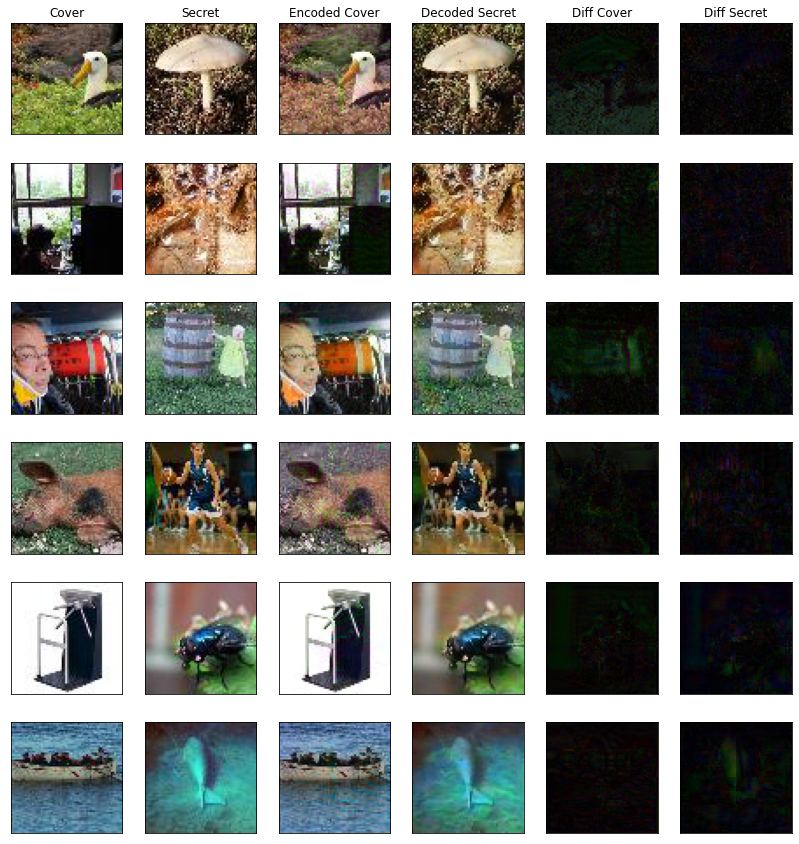

  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 241 | Batch:   0 of 1000. Loss AE    2510.45 | Loss Rev    1045.10:   3%|▎         | 1/32 [00:00<00:30,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 241 | Batch:  32 of 1000. Loss AE    2386.41 | Loss Rev    1025.03:   6%|▋         | 2/32 [00:01<00:23,  1.30it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 241 | Batch:  64 of 1000. Loss AE    2109.63 | Loss Rev     932.35:   9%|▉         | 3/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 241 | Batch:  96 of 1000. Loss AE    2098.99 | Loss Rev     931.20:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 241 | Batch: 128 of 1000. Loss AE    2076.74 | Loss Rev     940.02:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 241 | Batch: 160 of 1000. Loss AE    2085.16 | Loss Rev     915.77:  19%|█▉        | 6/32 [00:03<00:15,  1.68it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 241 | Batch: 192 of 1000. Loss AE    2068.31 | Loss Rev     919.06:  22%|██▏       | 7/32 [00:04<00:15,  1.65it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 241 | Batch: 224 of 1000. Loss AE    2066.03 | Loss Rev     923.96:  25%|██▌       | 8/32 [00:05<00:14,  1.65it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 241 | Batch: 256 of 1000. Loss AE    2036.63 | Loss Rev     900.33:  28%|██▊       | 9/32 [00:05<00:14,  1.63it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 241 | Batch: 288 of 1000. Loss AE    2027.84 | Loss Rev     888.66:  31%|███▏      | 10/32 [00:06<00:13,  1.65it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 241 | Batch: 320 of 1000. Loss AE    2021.39 | Loss Rev     872.24:  34%|███▍      | 11/32 [00:06<00:12,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 241 | Batch: 352 of 1000. Loss AE    2024.73 | Loss Rev     863.39:  38%|███▊      | 12/32 [00:07<00:11,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 241 | Batch: 384 of 1000. Loss AE    2015.69 | Loss Rev     857.70:  41%|████      | 13/32 [00:08<00:11,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 241 | Batch: 416 of 1000. Loss AE    1968.36 | Loss Rev     846.67:  44%|████▍     | 14/32 [00:08<00:10,  1.68it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 241 | Batch: 448 of 1000. Loss AE    1956.71 | Loss Rev     841.00:  47%|████▋     | 15/32 [00:09<00:09,  1.77it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 241 | Batch: 480 of 1000. Loss AE    1928.94 | Loss Rev     832.47:  50%|█████     | 16/32 [00:09<00:08,  1.84it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 241 | Batch: 512 of 1000. Loss AE    1910.01 | Loss Rev     823.68:  53%|█████▎    | 17/32 [00:10<00:08,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 241 | Batch: 544 of 1000. Loss AE    1911.24 | Loss Rev     819.31:  56%|█████▋    | 18/32 [00:10<00:07,  1.80it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 241 | Batch: 576 of 1000. Loss AE    1911.03 | Loss Rev     816.07:  59%|█████▉    | 19/32 [00:11<00:07,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 241 | Batch: 608 of 1000. Loss AE    1935.79 | Loss Rev     816.80:  62%|██████▎   | 20/32 [00:11<00:06,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 241 | Batch: 640 of 1000. Loss AE    1912.22 | Loss Rev     807.81:  66%|██████▌   | 21/32 [00:12<00:06,  1.78it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 241 | Batch: 672 of 1000. Loss AE    1897.39 | Loss Rev     806.93:  69%|██████▉   | 22/32 [00:13<00:05,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 241 | Batch: 704 of 1000. Loss AE    1883.97 | Loss Rev     800.84:  72%|███████▏  | 23/32 [00:13<00:05,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 241 | Batch: 736 of 1000. Loss AE    1870.66 | Loss Rev     793.07:  75%|███████▌  | 24/32 [00:14<00:04,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 241 | Batch: 768 of 1000. Loss AE    1866.34 | Loss Rev     788.22:  78%|███████▊  | 25/32 [00:14<00:04,  1.69it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 241 | Batch: 800 of 1000. Loss AE    1860.54 | Loss Rev     783.94:  81%|████████▏ | 26/32 [00:15<00:03,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 241 | Batch: 832 of 1000. Loss AE    1852.99 | Loss Rev     779.18:  84%|████████▍ | 27/32 [00:16<00:02,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 241 | Batch: 864 of 1000. Loss AE    1837.14 | Loss Rev     774.48:  88%|████████▊ | 28/32 [00:16<00:02,  1.68it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 241 | Batch: 896 of 1000. Loss AE    1830.95 | Loss Rev     775.17:  91%|█████████ | 29/32 [00:17<00:01,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 241 | Batch: 928 of 1000. Loss AE    1830.12 | Loss Rev     774.52:  94%|█████████▍| 30/32 [00:17<00:01,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 241 | Batch: 960 of 1000. Loss AE    1824.65 | Loss Rev     773.26:  97%|█████████▋| 31/32 [00:18<00:00,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 241 | Batch: 992 of 1000. Loss AE    1778.58 | Loss Rev     754.46: 100%|██████████| 32/32 [00:18<00:00,  1.74it/s]


241


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 242 | Batch:   0 of 1000. Loss AE    1899.18 | Loss Rev     869.09:   3%|▎         | 1/32 [00:00<00:19,  1.61it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 242 | Batch:  32 of 1000. Loss AE    1913.47 | Loss Rev    1034.71:   6%|▋         | 2/32 [00:01<00:16,  1.77it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 242 | Batch:  64 of 1000. Loss AE    1859.28 | Loss Rev     965.97:   9%|▉         | 3/32 [00:01<00:15,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 242 | Batch:  96 of 1000. Loss AE    1896.32 | Loss Rev     904.90:  12%|█▎        | 4/32 [00:02<00:15,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 242 | Batch: 128 of 1000. Loss AE    1859.10 | Loss Rev     891.33:  16%|█▌        | 5/32 [00:02<00:14,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 242 | Batch: 160 of 1000. Loss AE    1886.39 | Loss Rev     914.60:  19%|█▉        | 6/32 [00:03<00:13,  1.87it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 242 | Batch: 192 of 1000. Loss AE    1854.36 | Loss Rev     893.89:  22%|██▏       | 7/32 [00:03<00:13,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 242 | Batch: 224 of 1000. Loss AE    1803.60 | Loss Rev     862.74:  25%|██▌       | 8/32 [00:04<00:13,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 242 | Batch: 256 of 1000. Loss AE    1794.97 | Loss Rev     849.39:  28%|██▊       | 9/32 [00:04<00:13,  1.76it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 242 | Batch: 288 of 1000. Loss AE    1791.25 | Loss Rev     844.16:  31%|███▏      | 10/32 [00:05<00:12,  1.78it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 242 | Batch: 320 of 1000. Loss AE    1787.44 | Loss Rev     826.44:  34%|███▍      | 11/32 [00:06<00:11,  1.84it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 242 | Batch: 352 of 1000. Loss AE    1771.15 | Loss Rev     810.58:  38%|███▊      | 12/32 [00:06<00:11,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 242 | Batch: 384 of 1000. Loss AE    1755.89 | Loss Rev     805.29:  41%|████      | 13/32 [00:07<00:11,  1.72it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 242 | Batch: 416 of 1000. Loss AE    1731.81 | Loss Rev     796.21:  44%|████▍     | 14/32 [00:07<00:10,  1.69it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 242 | Batch: 448 of 1000. Loss AE    1723.91 | Loss Rev     781.70:  47%|████▋     | 15/32 [00:08<00:10,  1.67it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 242 | Batch: 480 of 1000. Loss AE    1718.63 | Loss Rev     778.57:  50%|█████     | 16/32 [00:08<00:09,  1.76it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 242 | Batch: 512 of 1000. Loss AE    1770.12 | Loss Rev     780.69:  53%|█████▎    | 17/32 [00:09<00:08,  1.78it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 242 | Batch: 544 of 1000. Loss AE    1754.46 | Loss Rev     774.08:  56%|█████▋    | 18/32 [00:10<00:07,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 242 | Batch: 576 of 1000. Loss AE    1745.23 | Loss Rev     764.90:  59%|█████▉    | 19/32 [00:10<00:07,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 242 | Batch: 608 of 1000. Loss AE    1743.99 | Loss Rev     761.12:  62%|██████▎   | 20/32 [00:11<00:06,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 242 | Batch: 640 of 1000. Loss AE    1730.46 | Loss Rev     754.48:  66%|██████▌   | 21/32 [00:11<00:05,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 242 | Batch: 672 of 1000. Loss AE    1744.92 | Loss Rev     750.83:  69%|██████▉   | 22/32 [00:12<00:05,  1.76it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 242 | Batch: 704 of 1000. Loss AE    1747.05 | Loss Rev     752.53:  72%|███████▏  | 23/32 [00:12<00:05,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 242 | Batch: 736 of 1000. Loss AE    1755.29 | Loss Rev     751.65:  75%|███████▌  | 24/32 [00:13<00:04,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 242 | Batch: 768 of 1000. Loss AE    1748.56 | Loss Rev     752.54:  78%|███████▊  | 25/32 [00:13<00:03,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 242 | Batch: 800 of 1000. Loss AE    1748.33 | Loss Rev     751.09:  81%|████████▏ | 26/32 [00:14<00:03,  1.84it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 242 | Batch: 832 of 1000. Loss AE    1740.93 | Loss Rev     751.76:  84%|████████▍ | 27/32 [00:15<00:02,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 242 | Batch: 864 of 1000. Loss AE    1732.66 | Loss Rev     749.83:  88%|████████▊ | 28/32 [00:15<00:02,  1.85it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 242 | Batch: 896 of 1000. Loss AE    1723.18 | Loss Rev     745.97:  91%|█████████ | 29/32 [00:16<00:01,  1.83it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 242 | Batch: 928 of 1000. Loss AE    1726.48 | Loss Rev     743.02:  94%|█████████▍| 30/32 [00:16<00:01,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 242 | Batch: 960 of 1000. Loss AE    1723.04 | Loss Rev     742.61:  97%|█████████▋| 31/32 [00:17<00:00,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 242 | Batch: 992 of 1000. Loss AE    1681.82 | Loss Rev     725.52: 100%|██████████| 32/32 [00:17<00:00,  1.82it/s]

242



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 243 | Batch:   0 of 1000. Loss AE    1395.29 | Loss Rev     634.06:   3%|▎         | 1/32 [00:00<00:14,  2.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 243 | Batch:  32 of 1000. Loss AE    1507.14 | Loss Rev     652.07:   6%|▋         | 2/32 [00:00<00:14,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 243 | Batch:  64 of 1000. Loss AE    1534.98 | Loss Rev     697.81:   9%|▉         | 3/32 [00:01<00:15,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 243 | Batch:  96 of 1000. Loss AE    1535.79 | Loss Rev     703.11:  12%|█▎        | 4/32 [00:02<00:14,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 243 | Batch: 128 of 1000. Loss AE    1651.04 | Loss Rev     716.13:  16%|█▌        | 5/32 [00:02<00:14,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 243 | Batch: 160 of 1000. Loss AE    1629.17 | Loss Rev     694.09:  19%|█▉        | 6/32 [00:03<00:14,  1.75it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 243 | Batch: 192 of 1000. Loss AE    1600.79 | Loss Rev     689.17:  22%|██▏       | 7/32 [00:03<00:13,  1.80it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 243 | Batch: 224 of 1000. Loss AE    1619.48 | Loss Rev     692.04:  25%|██▌       | 8/32 [00:04<00:13,  1.74it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 243 | Batch: 256 of 1000. Loss AE    1607.79 | Loss Rev     692.37:  28%|██▊       | 9/32 [00:04<00:13,  1.74it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 243 | Batch: 288 of 1000. Loss AE    1602.49 | Loss Rev     693.18:  31%|███▏      | 10/32 [00:05<00:12,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 243 | Batch: 320 of 1000. Loss AE    1612.56 | Loss Rev     696.74:  34%|███▍      | 11/32 [00:06<00:12,  1.70it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 243 | Batch: 352 of 1000. Loss AE    1614.62 | Loss Rev     689.83:  38%|███▊      | 12/32 [00:06<00:11,  1.77it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 243 | Batch: 384 of 1000. Loss AE    1609.83 | Loss Rev     686.88:  41%|████      | 13/32 [00:07<00:11,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 243 | Batch: 416 of 1000. Loss AE    1633.51 | Loss Rev     694.41:  44%|████▍     | 14/32 [00:07<00:10,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 243 | Batch: 448 of 1000. Loss AE    1648.80 | Loss Rev     693.61:  47%|████▋     | 15/32 [00:08<00:09,  1.76it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 243 | Batch: 480 of 1000. Loss AE    1671.67 | Loss Rev     695.25:  50%|█████     | 16/32 [00:08<00:08,  1.80it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 243 | Batch: 512 of 1000. Loss AE    1674.18 | Loss Rev     690.22:  53%|█████▎    | 17/32 [00:09<00:07,  1.88it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 243 | Batch: 544 of 1000. Loss AE    1674.27 | Loss Rev     694.22:  56%|█████▋    | 18/32 [00:09<00:07,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 243 | Batch: 576 of 1000. Loss AE    1673.94 | Loss Rev     698.31:  59%|█████▉    | 19/32 [00:10<00:06,  1.94it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 243 | Batch: 608 of 1000. Loss AE    1668.48 | Loss Rev     696.97:  62%|██████▎   | 20/32 [00:10<00:06,  1.91it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 243 | Batch: 640 of 1000. Loss AE    1670.35 | Loss Rev     697.33:  66%|██████▌   | 21/32 [00:11<00:05,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 243 | Batch: 672 of 1000. Loss AE    1671.20 | Loss Rev     705.18:  69%|██████▉   | 22/32 [00:12<00:05,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 243 | Batch: 704 of 1000. Loss AE    1690.50 | Loss Rev     713.93:  72%|███████▏  | 23/32 [00:12<00:04,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 243 | Batch: 736 of 1000. Loss AE    1693.83 | Loss Rev     723.07:  75%|███████▌  | 24/32 [00:13<00:04,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 243 | Batch: 768 of 1000. Loss AE    1705.58 | Loss Rev     733.68:  78%|███████▊  | 25/32 [00:13<00:03,  1.88it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 243 | Batch: 800 of 1000. Loss AE    1710.74 | Loss Rev     746.34:  81%|████████▏ | 26/32 [00:14<00:03,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 243 | Batch: 832 of 1000. Loss AE    1723.07 | Loss Rev     763.89:  84%|████████▍ | 27/32 [00:14<00:02,  1.78it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 243 | Batch: 864 of 1000. Loss AE    1730.62 | Loss Rev     780.99:  88%|████████▊ | 28/32 [00:15<00:02,  1.74it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 243 | Batch: 896 of 1000. Loss AE    1732.40 | Loss Rev     782.13:  91%|█████████ | 29/32 [00:16<00:01,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 243 | Batch: 928 of 1000. Loss AE    1722.36 | Loss Rev     781.50:  94%|█████████▍| 30/32 [00:16<00:01,  1.71it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 243 | Batch: 960 of 1000. Loss AE    1750.27 | Loss Rev     800.96:  97%|█████████▋| 31/32 [00:17<00:00,  1.79it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 243 | Batch: 992 of 1000. Loss AE    1716.89 | Loss Rev     789.49: 100%|██████████| 32/32 [00:17<00:00,  1.84it/s]


243


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 244 | Batch:   0 of 1000. Loss AE    3876.81 | Loss Rev    2934.31:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 244 | Batch:  32 of 1000. Loss AE    7302.09 | Loss Rev    6336.32:   6%|▋         | 2/32 [00:01<00:18,  1.65it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 244 | Batch:  64 of 1000. Loss AE    5919.81 | Loss Rev    4654.03:   9%|▉         | 3/32 [00:01<00:17,  1.67it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 244 | Batch:  96 of 1000. Loss AE    6179.36 | Loss Rev    4984.88:  12%|█▎        | 4/32 [00:02<00:15,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 244 | Batch: 128 of 1000. Loss AE    6771.85 | Loss Rev    5453.26:  16%|█▌        | 5/32 [00:02<00:15,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 244 | Batch: 160 of 1000. Loss AE    6562.46 | Loss Rev    5245.59:  19%|█▉        | 6/32 [00:03<00:14,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 244 | Batch: 192 of 1000. Loss AE    6312.65 | Loss Rev    4949.13:  22%|██▏       | 7/32 [00:03<00:14,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 244 | Batch: 224 of 1000. Loss AE    6023.79 | Loss Rev    4674.17:  25%|██▌       | 8/32 [00:04<00:13,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 244 | Batch: 256 of 1000. Loss AE    5813.08 | Loss Rev    4491.96:  28%|██▊       | 9/32 [00:05<00:12,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 244 | Batch: 288 of 1000. Loss AE    5809.25 | Loss Rev    4478.54:  31%|███▏      | 10/32 [00:05<00:12,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 244 | Batch: 320 of 1000. Loss AE    5689.38 | Loss Rev    4304.25:  34%|███▍      | 11/32 [00:06<00:11,  1.75it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 244 | Batch: 352 of 1000. Loss AE    5437.83 | Loss Rev    4046.32:  38%|███▊      | 12/32 [00:06<00:11,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 244 | Batch: 384 of 1000. Loss AE    5337.27 | Loss Rev    3833.65:  41%|████      | 13/32 [00:07<00:11,  1.67it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 244 | Batch: 416 of 1000. Loss AE    5174.53 | Loss Rev    3645.86:  44%|████▍     | 14/32 [00:08<00:10,  1.67it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 244 | Batch: 448 of 1000. Loss AE    5030.36 | Loss Rev    3490.31:  47%|████▋     | 15/32 [00:08<00:09,  1.73it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 244 | Batch: 480 of 1000. Loss AE    4927.49 | Loss Rev    3360.91:  50%|█████     | 16/32 [00:09<00:08,  1.83it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 244 | Batch: 512 of 1000. Loss AE    4880.82 | Loss Rev    3266.28:  53%|█████▎    | 17/32 [00:09<00:08,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 244 | Batch: 544 of 1000. Loss AE    4798.84 | Loss Rev    3166.87:  56%|█████▋    | 18/32 [00:10<00:08,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 244 | Batch: 576 of 1000. Loss AE    4736.49 | Loss Rev    3084.15:  59%|█████▉    | 19/32 [00:10<00:07,  1.78it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 244 | Batch: 608 of 1000. Loss AE    4663.09 | Loss Rev    3010.71:  62%|██████▎   | 20/32 [00:11<00:06,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 244 | Batch: 640 of 1000. Loss AE    4612.98 | Loss Rev    2950.79:  66%|██████▌   | 21/32 [00:11<00:06,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 244 | Batch: 672 of 1000. Loss AE    4530.65 | Loss Rev    2883.32:  69%|██████▉   | 22/32 [00:12<00:05,  1.84it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 244 | Batch: 704 of 1000. Loss AE    4466.67 | Loss Rev    2824.55:  72%|███████▏  | 23/32 [00:13<00:04,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 244 | Batch: 736 of 1000. Loss AE    4404.41 | Loss Rev    2763.50:  75%|███████▌  | 24/32 [00:13<00:04,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 244 | Batch: 768 of 1000. Loss AE    4346.13 | Loss Rev    2715.36:  78%|███████▊  | 25/32 [00:14<00:03,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 244 | Batch: 800 of 1000. Loss AE    4289.77 | Loss Rev    2662.28:  81%|████████▏ | 26/32 [00:14<00:03,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 244 | Batch: 832 of 1000. Loss AE    4220.21 | Loss Rev    2603.95:  84%|████████▍ | 27/32 [00:15<00:02,  1.76it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 244 | Batch: 864 of 1000. Loss AE    4167.19 | Loss Rev    2546.34:  88%|████████▊ | 28/32 [00:15<00:02,  1.74it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 244 | Batch: 896 of 1000. Loss AE    4124.15 | Loss Rev    2499.00:  91%|█████████ | 29/32 [00:16<00:01,  1.75it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 244 | Batch: 928 of 1000. Loss AE    4067.18 | Loss Rev    2454.58:  94%|█████████▍| 30/32 [00:17<00:01,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 244 | Batch: 960 of 1000. Loss AE    4029.42 | Loss Rev    2414.88:  97%|█████████▋| 31/32 [00:17<00:00,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 244 | Batch: 992 of 1000. Loss AE    3920.22 | Loss Rev    2347.45: 100%|██████████| 32/32 [00:17<00:00,  1.80it/s]


244


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 245 | Batch:   0 of 1000. Loss AE    2589.43 | Loss Rev    1379.18:   3%|▎         | 1/32 [00:00<00:17,  1.73it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 245 | Batch:  32 of 1000. Loss AE    2485.21 | Loss Rev    1231.39:   6%|▋         | 2/32 [00:01<00:17,  1.70it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 245 | Batch:  64 of 1000. Loss AE    2467.18 | Loss Rev    1204.94:   9%|▉         | 3/32 [00:01<00:17,  1.65it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 245 | Batch:  96 of 1000. Loss AE    2439.46 | Loss Rev    1151.70:  12%|█▎        | 4/32 [00:02<00:15,  1.76it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 245 | Batch: 128 of 1000. Loss AE    2488.09 | Loss Rev    1132.39:  16%|█▌        | 5/32 [00:02<00:14,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 245 | Batch: 160 of 1000. Loss AE    2469.37 | Loss Rev    1084.52:  19%|█▉        | 6/32 [00:03<00:14,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 245 | Batch: 192 of 1000. Loss AE    2435.41 | Loss Rev    1059.58:  22%|██▏       | 7/32 [00:03<00:14,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 245 | Batch: 224 of 1000. Loss AE    2348.26 | Loss Rev    1022.21:  25%|██▌       | 8/32 [00:04<00:13,  1.77it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 245 | Batch: 256 of 1000. Loss AE    2346.53 | Loss Rev    1015.53:  28%|██▊       | 9/32 [00:05<00:13,  1.75it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 245 | Batch: 288 of 1000. Loss AE    2317.41 | Loss Rev    1008.28:  31%|███▏      | 10/32 [00:05<00:12,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 245 | Batch: 320 of 1000. Loss AE    2304.48 | Loss Rev     999.62:  34%|███▍      | 11/32 [00:06<00:12,  1.66it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 245 | Batch: 352 of 1000. Loss AE    2291.33 | Loss Rev    1001.56:  38%|███▊      | 12/32 [00:07<00:12,  1.63it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 245 | Batch: 384 of 1000. Loss AE    2244.24 | Loss Rev     981.65:  41%|████      | 13/32 [00:07<00:11,  1.65it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 245 | Batch: 416 of 1000. Loss AE    2241.94 | Loss Rev     980.97:  44%|████▍     | 14/32 [00:08<00:10,  1.69it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 245 | Batch: 448 of 1000. Loss AE    2227.69 | Loss Rev     974.90:  47%|████▋     | 15/32 [00:08<00:10,  1.66it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 245 | Batch: 480 of 1000. Loss AE    2227.60 | Loss Rev     970.88:  50%|█████     | 16/32 [00:09<00:09,  1.63it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 245 | Batch: 512 of 1000. Loss AE    2230.86 | Loss Rev     979.25:  53%|█████▎    | 17/32 [00:10<00:08,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 245 | Batch: 544 of 1000. Loss AE    2219.05 | Loss Rev     970.28:  56%|█████▋    | 18/32 [00:10<00:07,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 245 | Batch: 576 of 1000. Loss AE    2207.03 | Loss Rev     961.21:  59%|█████▉    | 19/32 [00:11<00:07,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 245 | Batch: 608 of 1000. Loss AE    2191.79 | Loss Rev     956.21:  62%|██████▎   | 20/32 [00:11<00:06,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 245 | Batch: 640 of 1000. Loss AE    2190.44 | Loss Rev     952.44:  66%|██████▌   | 21/32 [00:12<00:06,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 245 | Batch: 672 of 1000. Loss AE    2174.00 | Loss Rev     942.17:  69%|██████▉   | 22/32 [00:12<00:05,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 245 | Batch: 704 of 1000. Loss AE    2157.14 | Loss Rev     937.16:  72%|███████▏  | 23/32 [00:13<00:04,  1.83it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 245 | Batch: 736 of 1000. Loss AE    2138.65 | Loss Rev     932.13:  75%|███████▌  | 24/32 [00:13<00:04,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 245 | Batch: 768 of 1000. Loss AE    2125.50 | Loss Rev     930.16:  78%|███████▊  | 25/32 [00:14<00:03,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 245 | Batch: 800 of 1000. Loss AE    2126.42 | Loss Rev     930.54:  81%|████████▏ | 26/32 [00:14<00:03,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 245 | Batch: 832 of 1000. Loss AE    2136.96 | Loss Rev     932.21:  84%|████████▍ | 27/32 [00:15<00:02,  1.73it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 245 | Batch: 864 of 1000. Loss AE    2119.68 | Loss Rev     927.04:  88%|████████▊ | 28/32 [00:16<00:02,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 245 | Batch: 896 of 1000. Loss AE    2109.73 | Loss Rev     924.47:  91%|█████████ | 29/32 [00:16<00:01,  1.74it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 245 | Batch: 928 of 1000. Loss AE    2094.12 | Loss Rev     916.32:  94%|█████████▍| 30/32 [00:17<00:01,  1.77it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 245 | Batch: 960 of 1000. Loss AE    2083.18 | Loss Rev     912.22:  97%|█████████▋| 31/32 [00:17<00:00,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 245 | Batch: 992 of 1000. Loss AE    2032.90 | Loss Rev     891.82: 100%|██████████| 32/32 [00:17<00:00,  1.78it/s]

245



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 246 | Batch:   0 of 1000. Loss AE    1874.99 | Loss Rev     969.70:   3%|▎         | 1/32 [00:00<00:17,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 246 | Batch:  32 of 1000. Loss AE    2143.22 | Loss Rev    1090.95:   6%|▋         | 2/32 [00:01<00:17,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 246 | Batch:  64 of 1000. Loss AE    2026.56 | Loss Rev    1026.53:   9%|▉         | 3/32 [00:01<00:16,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 246 | Batch:  96 of 1000. Loss AE    2085.29 | Loss Rev    1041.92:  12%|█▎        | 4/32 [00:02<00:15,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 246 | Batch: 128 of 1000. Loss AE    2108.69 | Loss Rev    1073.01:  16%|█▌        | 5/32 [00:02<00:14,  1.85it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 246 | Batch: 160 of 1000. Loss AE    2058.84 | Loss Rev    1050.70:  19%|█▉        | 6/32 [00:03<00:14,  1.84it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 246 | Batch: 192 of 1000. Loss AE    1991.20 | Loss Rev    1006.21:  22%|██▏       | 7/32 [00:03<00:14,  1.74it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 246 | Batch: 224 of 1000. Loss AE    2033.75 | Loss Rev    1042.80:  25%|██▌       | 8/32 [00:04<00:14,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 246 | Batch: 256 of 1000. Loss AE    2018.04 | Loss Rev    1021.63:  28%|██▊       | 9/32 [00:05<00:13,  1.69it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 246 | Batch: 288 of 1000. Loss AE    1996.32 | Loss Rev     999.29:  31%|███▏      | 10/32 [00:05<00:13,  1.64it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 246 | Batch: 320 of 1000. Loss AE    2005.42 | Loss Rev    1012.38:  34%|███▍      | 11/32 [00:06<00:12,  1.72it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 246 | Batch: 352 of 1000. Loss AE    1995.23 | Loss Rev     990.76:  38%|███▊      | 12/32 [00:06<00:11,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 246 | Batch: 384 of 1000. Loss AE    2002.51 | Loss Rev     993.31:  41%|████      | 13/32 [00:07<00:11,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 246 | Batch: 416 of 1000. Loss AE    1980.81 | Loss Rev     982.75:  44%|████▍     | 14/32 [00:08<00:10,  1.64it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 246 | Batch: 448 of 1000. Loss AE    1953.99 | Loss Rev     965.73:  47%|████▋     | 15/32 [00:08<00:09,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 246 | Batch: 480 of 1000. Loss AE    1932.70 | Loss Rev     959.30:  50%|█████     | 16/32 [00:09<00:08,  1.82it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 246 | Batch: 512 of 1000. Loss AE    1938.00 | Loss Rev     947.09:  53%|█████▎    | 17/32 [00:09<00:07,  1.90it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 246 | Batch: 544 of 1000. Loss AE    1961.23 | Loss Rev     947.62:  56%|█████▋    | 18/32 [00:10<00:07,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 246 | Batch: 576 of 1000. Loss AE    1951.90 | Loss Rev     936.78:  59%|█████▉    | 19/32 [00:10<00:07,  1.85it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 246 | Batch: 608 of 1000. Loss AE    1943.34 | Loss Rev     931.62:  62%|██████▎   | 20/32 [00:11<00:06,  1.85it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 246 | Batch: 640 of 1000. Loss AE    1940.34 | Loss Rev     925.91:  66%|██████▌   | 21/32 [00:11<00:06,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 246 | Batch: 672 of 1000. Loss AE    1922.43 | Loss Rev     918.06:  69%|██████▉   | 22/32 [00:12<00:05,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 246 | Batch: 704 of 1000. Loss AE    1915.75 | Loss Rev     915.05:  72%|███████▏  | 23/32 [00:13<00:05,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 246 | Batch: 736 of 1000. Loss AE    1922.21 | Loss Rev     911.96:  75%|███████▌  | 24/32 [00:13<00:04,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 246 | Batch: 768 of 1000. Loss AE    1931.11 | Loss Rev     911.58:  78%|███████▊  | 25/32 [00:14<00:03,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 246 | Batch: 800 of 1000. Loss AE    1929.96 | Loss Rev     906.86:  81%|████████▏ | 26/32 [00:14<00:03,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 246 | Batch: 832 of 1000. Loss AE    1926.23 | Loss Rev     901.20:  84%|████████▍ | 27/32 [00:15<00:02,  1.80it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 246 | Batch: 864 of 1000. Loss AE    1925.87 | Loss Rev     896.80:  88%|████████▊ | 28/32 [00:15<00:02,  1.83it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 246 | Batch: 896 of 1000. Loss AE    1928.12 | Loss Rev     891.03:  91%|█████████ | 29/32 [00:16<00:01,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 246 | Batch: 928 of 1000. Loss AE    1937.24 | Loss Rev     887.38:  94%|█████████▍| 30/32 [00:16<00:01,  1.84it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 246 | Batch: 960 of 1000. Loss AE    1936.98 | Loss Rev     884.47:  97%|█████████▋| 31/32 [00:17<00:00,  1.84it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 246 | Batch: 992 of 1000. Loss AE    1890.98 | Loss Rev     863.06: 100%|██████████| 32/32 [00:17<00:00,  1.81it/s]

246



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 247 | Batch:   0 of 1000. Loss AE    1617.52 | Loss Rev     821.39:   3%|▎         | 1/32 [00:00<00:18,  1.70it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 247 | Batch:  32 of 1000. Loss AE    1746.60 | Loss Rev     826.61:   6%|▋         | 2/32 [00:01<00:18,  1.62it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 247 | Batch:  64 of 1000. Loss AE    1684.11 | Loss Rev     773.24:   9%|▉         | 3/32 [00:01<00:17,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 247 | Batch:  96 of 1000. Loss AE    1728.23 | Loss Rev     765.17:  12%|█▎        | 4/32 [00:02<00:16,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 247 | Batch: 128 of 1000. Loss AE    1802.48 | Loss Rev     768.29:  16%|█▌        | 5/32 [00:02<00:16,  1.67it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 247 | Batch: 160 of 1000. Loss AE    1764.19 | Loss Rev     768.31:  19%|█▉        | 6/32 [00:03<00:15,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 247 | Batch: 192 of 1000. Loss AE    1763.89 | Loss Rev     763.39:  22%|██▏       | 7/32 [00:04<00:14,  1.69it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 247 | Batch: 224 of 1000. Loss AE    1800.95 | Loss Rev     758.63:  25%|██▌       | 8/32 [00:04<00:13,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 247 | Batch: 256 of 1000. Loss AE    1750.98 | Loss Rev     741.32:  28%|██▊       | 9/32 [00:05<00:13,  1.68it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 247 | Batch: 288 of 1000. Loss AE    1774.16 | Loss Rev     741.61:  31%|███▏      | 10/32 [00:05<00:13,  1.64it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 247 | Batch: 320 of 1000. Loss AE    1751.99 | Loss Rev     739.13:  34%|███▍      | 11/32 [00:06<00:12,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 247 | Batch: 352 of 1000. Loss AE    1758.21 | Loss Rev     743.10:  38%|███▊      | 12/32 [00:07<00:11,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 247 | Batch: 384 of 1000. Loss AE    1749.38 | Loss Rev     742.74:  41%|████      | 13/32 [00:07<00:10,  1.78it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 247 | Batch: 416 of 1000. Loss AE    1741.62 | Loss Rev     741.21:  44%|████▍     | 14/32 [00:08<00:10,  1.74it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 247 | Batch: 448 of 1000. Loss AE    1732.08 | Loss Rev     743.76:  47%|████▋     | 15/32 [00:08<00:09,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 247 | Batch: 480 of 1000. Loss AE    1761.97 | Loss Rev     742.94:  50%|█████     | 16/32 [00:09<00:09,  1.71it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 247 | Batch: 512 of 1000. Loss AE    1755.41 | Loss Rev     745.35:  53%|█████▎    | 17/32 [00:10<00:08,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 247 | Batch: 544 of 1000. Loss AE    1748.20 | Loss Rev     740.99:  56%|█████▋    | 18/32 [00:10<00:08,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 247 | Batch: 576 of 1000. Loss AE    1747.08 | Loss Rev     739.11:  59%|█████▉    | 19/32 [00:11<00:07,  1.67it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 247 | Batch: 608 of 1000. Loss AE    1751.64 | Loss Rev     737.83:  62%|██████▎   | 20/32 [00:11<00:07,  1.65it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 247 | Batch: 640 of 1000. Loss AE    1745.23 | Loss Rev     739.93:  66%|██████▌   | 21/32 [00:12<00:06,  1.73it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 247 | Batch: 672 of 1000. Loss AE    1756.35 | Loss Rev     744.63:  69%|██████▉   | 22/32 [00:12<00:05,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 247 | Batch: 704 of 1000. Loss AE    1752.73 | Loss Rev     748.61:  72%|███████▏  | 23/32 [00:13<00:05,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 247 | Batch: 736 of 1000. Loss AE    1750.95 | Loss Rev     747.86:  75%|███████▌  | 24/32 [00:14<00:04,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 247 | Batch: 768 of 1000. Loss AE    1752.71 | Loss Rev     748.05:  78%|███████▊  | 25/32 [00:14<00:04,  1.74it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 247 | Batch: 800 of 1000. Loss AE    1745.07 | Loss Rev     745.20:  81%|████████▏ | 26/32 [00:15<00:03,  1.69it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 247 | Batch: 832 of 1000. Loss AE    1754.05 | Loss Rev     746.71:  84%|████████▍ | 27/32 [00:15<00:02,  1.67it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 247 | Batch: 864 of 1000. Loss AE    1752.13 | Loss Rev     747.00:  88%|████████▊ | 28/32 [00:16<00:02,  1.69it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 247 | Batch: 896 of 1000. Loss AE    1745.18 | Loss Rev     746.37:  91%|█████████ | 29/32 [00:17<00:01,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 247 | Batch: 928 of 1000. Loss AE    1737.81 | Loss Rev     743.50:  94%|█████████▍| 30/32 [00:17<00:01,  1.65it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 247 | Batch: 960 of 1000. Loss AE    1739.56 | Loss Rev     742.02:  97%|█████████▋| 31/32 [00:18<00:00,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 247 | Batch: 992 of 1000. Loss AE    1701.02 | Loss Rev     724.91: 100%|██████████| 32/32 [00:18<00:00,  1.74it/s]

247



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 248 | Batch:   0 of 1000. Loss AE    2260.02 | Loss Rev     749.58:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 248 | Batch:  32 of 1000. Loss AE    1862.14 | Loss Rev     802.68:   6%|▋         | 2/32 [00:01<00:16,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 248 | Batch:  64 of 1000. Loss AE    1919.51 | Loss Rev     868.12:   9%|▉         | 3/32 [00:01<00:16,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 248 | Batch:  96 of 1000. Loss AE    1861.79 | Loss Rev     837.31:  12%|█▎        | 4/32 [00:02<00:16,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 248 | Batch: 128 of 1000. Loss AE    1840.62 | Loss Rev     808.17:  16%|█▌        | 5/32 [00:02<00:15,  1.71it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 248 | Batch: 160 of 1000. Loss AE    1854.46 | Loss Rev     814.49:  19%|█▉        | 6/32 [00:03<00:15,  1.66it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 248 | Batch: 192 of 1000. Loss AE    1835.37 | Loss Rev     810.19:  22%|██▏       | 7/32 [00:04<00:14,  1.76it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 248 | Batch: 224 of 1000. Loss AE    1840.43 | Loss Rev     797.02:  25%|██▌       | 8/32 [00:04<00:13,  1.73it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 248 | Batch: 256 of 1000. Loss AE    1795.47 | Loss Rev     775.81:  28%|██▊       | 9/32 [00:05<00:13,  1.65it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 248 | Batch: 288 of 1000. Loss AE    1838.55 | Loss Rev     778.09:  31%|███▏      | 10/32 [00:05<00:12,  1.75it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 248 | Batch: 320 of 1000. Loss AE    1825.55 | Loss Rev     773.83:  34%|███▍      | 11/32 [00:06<00:11,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 248 | Batch: 352 of 1000. Loss AE    1808.57 | Loss Rev     766.87:  38%|███▊      | 12/32 [00:06<00:10,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 248 | Batch: 384 of 1000. Loss AE    1792.90 | Loss Rev     762.83:  41%|████      | 13/32 [00:07<00:10,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 248 | Batch: 416 of 1000. Loss AE    1803.55 | Loss Rev     767.39:  44%|████▍     | 14/32 [00:07<00:09,  1.81it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 248 | Batch: 448 of 1000. Loss AE    1787.02 | Loss Rev     764.61:  47%|████▋     | 15/32 [00:08<00:09,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 248 | Batch: 480 of 1000. Loss AE    1798.98 | Loss Rev     765.84:  50%|█████     | 16/32 [00:09<00:09,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 248 | Batch: 512 of 1000. Loss AE    1788.22 | Loss Rev     765.48:  53%|█████▎    | 17/32 [00:09<00:08,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 248 | Batch: 544 of 1000. Loss AE    1766.50 | Loss Rev     762.60:  56%|█████▋    | 18/32 [00:10<00:08,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 248 | Batch: 576 of 1000. Loss AE    1760.94 | Loss Rev     760.97:  59%|█████▉    | 19/32 [00:10<00:07,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 248 | Batch: 608 of 1000. Loss AE    1770.35 | Loss Rev     757.85:  62%|██████▎   | 20/32 [00:11<00:06,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 248 | Batch: 640 of 1000. Loss AE    1766.98 | Loss Rev     757.34:  66%|██████▌   | 21/32 [00:11<00:06,  1.82it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 248 | Batch: 672 of 1000. Loss AE    1764.80 | Loss Rev     753.97:  69%|██████▉   | 22/32 [00:12<00:05,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 248 | Batch: 704 of 1000. Loss AE    1761.76 | Loss Rev     751.75:  72%|███████▏  | 23/32 [00:13<00:05,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 248 | Batch: 736 of 1000. Loss AE    1754.77 | Loss Rev     750.50:  75%|███████▌  | 24/32 [00:13<00:04,  1.67it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 248 | Batch: 768 of 1000. Loss AE    1739.12 | Loss Rev     747.35:  78%|███████▊  | 25/32 [00:14<00:04,  1.64it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 248 | Batch: 800 of 1000. Loss AE    1732.14 | Loss Rev     741.86:  81%|████████▏ | 26/32 [00:14<00:03,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 248 | Batch: 832 of 1000. Loss AE    1743.26 | Loss Rev     741.13:  84%|████████▍ | 27/32 [00:15<00:02,  1.73it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 248 | Batch: 864 of 1000. Loss AE    1743.45 | Loss Rev     739.42:  88%|████████▊ | 28/32 [00:16<00:02,  1.67it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 248 | Batch: 896 of 1000. Loss AE    1735.66 | Loss Rev     737.55:  91%|█████████ | 29/32 [00:16<00:01,  1.67it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 248 | Batch: 928 of 1000. Loss AE    1730.26 | Loss Rev     735.85:  94%|█████████▍| 30/32 [00:17<00:01,  1.74it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 248 | Batch: 960 of 1000. Loss AE    1723.36 | Loss Rev     735.54:  97%|█████████▋| 31/32 [00:17<00:00,  1.76it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 248 | Batch: 992 of 1000. Loss AE    1682.41 | Loss Rev     716.87: 100%|██████████| 32/32 [00:18<00:00,  1.78it/s]


248


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 249 | Batch:   0 of 1000. Loss AE    1688.83 | Loss Rev     703.44:   3%|▎         | 1/32 [00:00<00:18,  1.64it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 249 | Batch:  32 of 1000. Loss AE    1642.68 | Loss Rev     750.67:   6%|▋         | 2/32 [00:01<00:18,  1.64it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 249 | Batch:  64 of 1000. Loss AE    1828.62 | Loss Rev     747.66:   9%|▉         | 3/32 [00:01<00:17,  1.64it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 249 | Batch:  96 of 1000. Loss AE    1752.62 | Loss Rev     735.35:  12%|█▎        | 4/32 [00:02<00:17,  1.62it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 249 | Batch: 128 of 1000. Loss AE    1779.14 | Loss Rev     730.98:  16%|█▌        | 5/32 [00:02<00:15,  1.71it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 249 | Batch: 160 of 1000. Loss AE    1780.42 | Loss Rev     747.01:  19%|█▉        | 6/32 [00:03<00:15,  1.66it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 249 | Batch: 192 of 1000. Loss AE    1775.71 | Loss Rev     757.91:  22%|██▏       | 7/32 [00:04<00:14,  1.76it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 249 | Batch: 224 of 1000. Loss AE    1824.56 | Loss Rev     780.25:  25%|██▌       | 8/32 [00:04<00:13,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 249 | Batch: 256 of 1000. Loss AE    1855.08 | Loss Rev     823.44:  28%|██▊       | 9/32 [00:05<00:12,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 249 | Batch: 288 of 1000. Loss AE    1915.41 | Loss Rev     877.83:  31%|███▏      | 10/32 [00:05<00:11,  1.88it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 249 | Batch: 320 of 1000. Loss AE    1938.72 | Loss Rev     924.51:  34%|███▍      | 11/32 [00:06<00:11,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 249 | Batch: 352 of 1000. Loss AE    1977.27 | Loss Rev     955.28:  38%|███▊      | 12/32 [00:06<00:10,  1.86it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 249 | Batch: 384 of 1000. Loss AE    1969.68 | Loss Rev     959.02:  41%|████      | 13/32 [00:07<00:10,  1.82it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 249 | Batch: 416 of 1000. Loss AE    1929.33 | Loss Rev     936.99:  44%|████▍     | 14/32 [00:07<00:09,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 249 | Batch: 448 of 1000. Loss AE    1929.82 | Loss Rev     946.26:  47%|████▋     | 15/32 [00:08<00:09,  1.87it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 249 | Batch: 480 of 1000. Loss AE    1952.84 | Loss Rev     963.28:  50%|█████     | 16/32 [00:08<00:08,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 249 | Batch: 512 of 1000. Loss AE    1951.17 | Loss Rev     962.24:  53%|█████▎    | 17/32 [00:09<00:08,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 249 | Batch: 544 of 1000. Loss AE    1936.91 | Loss Rev     950.48:  56%|█████▋    | 18/32 [00:10<00:08,  1.71it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 249 | Batch: 576 of 1000. Loss AE    1937.64 | Loss Rev     951.43:  59%|█████▉    | 19/32 [00:10<00:07,  1.70it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 249 | Batch: 608 of 1000. Loss AE    1931.71 | Loss Rev     956.26:  62%|██████▎   | 20/32 [00:11<00:06,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 249 | Batch: 640 of 1000. Loss AE    1926.32 | Loss Rev     946.18:  66%|██████▌   | 21/32 [00:11<00:06,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 249 | Batch: 672 of 1000. Loss AE    1913.23 | Loss Rev     937.05:  69%|██████▉   | 22/32 [00:12<00:05,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 249 | Batch: 704 of 1000. Loss AE    1943.68 | Loss Rev     946.00:  72%|███████▏  | 23/32 [00:12<00:04,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 249 | Batch: 736 of 1000. Loss AE    1939.46 | Loss Rev     938.82:  75%|███████▌  | 24/32 [00:13<00:04,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 249 | Batch: 768 of 1000. Loss AE    1940.00 | Loss Rev     945.81:  78%|███████▊  | 25/32 [00:14<00:03,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 249 | Batch: 800 of 1000. Loss AE    1951.94 | Loss Rev     968.10:  81%|████████▏ | 26/32 [00:14<00:03,  1.73it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 249 | Batch: 832 of 1000. Loss AE    1958.75 | Loss Rev     958.82:  84%|████████▍ | 27/32 [00:15<00:02,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 249 | Batch: 864 of 1000. Loss AE    1972.26 | Loss Rev     966.53:  88%|████████▊ | 28/32 [00:15<00:02,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 249 | Batch: 896 of 1000. Loss AE    1994.49 | Loss Rev     977.74:  91%|█████████ | 29/32 [00:16<00:01,  1.68it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 249 | Batch: 928 of 1000. Loss AE    1978.59 | Loss Rev     970.27:  94%|█████████▍| 30/32 [00:17<00:01,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 249 | Batch: 960 of 1000. Loss AE    1989.36 | Loss Rev     979.23:  97%|█████████▋| 31/32 [00:17<00:00,  1.68it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 249 | Batch: 992 of 1000. Loss AE    1940.44 | Loss Rev     955.16: 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]


249


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 250 | Batch:   0 of 1000. Loss AE    4089.50 | Loss Rev    2831.59:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 250 | Batch:  32 of 1000. Loss AE    4533.71 | Loss Rev    3099.32:   6%|▋         | 2/32 [00:01<00:17,  1.68it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 250 | Batch:  64 of 1000. Loss AE    3586.14 | Loss Rev    2356.59:   9%|▉         | 3/32 [00:01<00:16,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 250 | Batch:  96 of 1000. Loss AE    3540.93 | Loss Rev    2294.75:  12%|█▎        | 4/32 [00:02<00:15,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 250 | Batch: 128 of 1000. Loss AE    3325.52 | Loss Rev    2085.47:  16%|█▌        | 5/32 [00:02<00:15,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 250 | Batch: 160 of 1000. Loss AE    3295.93 | Loss Rev    1929.13:  19%|█▉        | 6/32 [00:03<00:15,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 250 | Batch: 192 of 1000. Loss AE    3228.36 | Loss Rev    1847.78:  22%|██▏       | 7/32 [00:03<00:13,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 250 | Batch: 224 of 1000. Loss AE    3158.51 | Loss Rev    1743.52:  25%|██▌       | 8/32 [00:04<00:13,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 250 | Batch: 256 of 1000. Loss AE    3064.45 | Loss Rev    1682.63:  28%|██▊       | 9/32 [00:05<00:12,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 250 | Batch: 288 of 1000. Loss AE    2995.55 | Loss Rev    1609.43:  31%|███▏      | 10/32 [00:05<00:12,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 250 | Batch: 320 of 1000. Loss AE    2895.42 | Loss Rev    1549.70:  34%|███▍      | 11/32 [00:06<00:11,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 250 | Batch: 352 of 1000. Loss AE    2828.89 | Loss Rev    1489.09:  38%|███▊      | 12/32 [00:06<00:10,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 250 | Batch: 384 of 1000. Loss AE    2762.80 | Loss Rev    1434.76:  41%|████      | 13/32 [00:07<00:10,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 250 | Batch: 416 of 1000. Loss AE    2711.35 | Loss Rev    1386.30:  44%|████▍     | 14/32 [00:07<00:10,  1.76it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 250 | Batch: 448 of 1000. Loss AE    2668.86 | Loss Rev    1349.64:  47%|████▋     | 15/32 [00:08<00:10,  1.70it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 250 | Batch: 480 of 1000. Loss AE    2618.81 | Loss Rev    1311.50:  50%|█████     | 16/32 [00:09<00:09,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 250 | Batch: 512 of 1000. Loss AE    2570.34 | Loss Rev    1280.12:  53%|█████▎    | 17/32 [00:09<00:08,  1.78it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 250 | Batch: 544 of 1000. Loss AE    2534.75 | Loss Rev    1248.13:  56%|█████▋    | 18/32 [00:10<00:07,  1.76it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 250 | Batch: 576 of 1000. Loss AE    2505.58 | Loss Rev    1216.11:  59%|█████▉    | 19/32 [00:10<00:07,  1.69it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 250 | Batch: 608 of 1000. Loss AE    2474.27 | Loss Rev    1192.22:  62%|██████▎   | 20/32 [00:11<00:06,  1.72it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 250 | Batch: 640 of 1000. Loss AE    2439.85 | Loss Rev    1170.74:  66%|██████▌   | 21/32 [00:11<00:06,  1.71it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 250 | Batch: 672 of 1000. Loss AE    2420.06 | Loss Rev    1152.39:  69%|██████▉   | 22/32 [00:12<00:05,  1.70it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 250 | Batch: 704 of 1000. Loss AE    2416.45 | Loss Rev    1137.83:  72%|███████▏  | 23/32 [00:13<00:05,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 250 | Batch: 736 of 1000. Loss AE    2393.45 | Loss Rev    1123.05:  75%|███████▌  | 24/32 [00:13<00:04,  1.67it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 250 | Batch: 768 of 1000. Loss AE    2369.77 | Loss Rev    1107.94:  78%|███████▊  | 25/32 [00:14<00:04,  1.66it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 250 | Batch: 800 of 1000. Loss AE    2332.67 | Loss Rev    1091.01:  81%|████████▏ | 26/32 [00:14<00:03,  1.72it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 250 | Batch: 832 of 1000. Loss AE    2307.94 | Loss Rev    1073.76:  84%|████████▍ | 27/32 [00:15<00:02,  1.70it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 250 | Batch: 864 of 1000. Loss AE    2301.34 | Loss Rev    1066.86:  88%|████████▊ | 28/32 [00:16<00:02,  1.70it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 250 | Batch: 896 of 1000. Loss AE    2280.65 | Loss Rev    1056.87:  91%|█████████ | 29/32 [00:16<00:01,  1.73it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 250 | Batch: 928 of 1000. Loss AE    2258.72 | Loss Rev    1046.56:  94%|█████████▍| 30/32 [00:17<00:01,  1.70it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 250 | Batch: 960 of 1000. Loss AE    2251.57 | Loss Rev    1036.32:  97%|█████████▋| 31/32 [00:17<00:00,  1.66it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 250 | Batch: 992 of 1000. Loss AE    2191.66 | Loss Rev    1008.42: 100%|██████████| 32/32 [00:18<00:00,  1.76it/s]

250



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 251 | Batch:   0 of 1000. Loss AE    1666.60 | Loss Rev     651.21:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 251 | Batch:  32 of 1000. Loss AE    1807.55 | Loss Rev     670.80:   6%|▋         | 2/32 [00:01<00:17,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 251 | Batch:  64 of 1000. Loss AE    1807.44 | Loss Rev     650.01:   9%|▉         | 3/32 [00:01<00:17,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 251 | Batch:  96 of 1000. Loss AE    1791.48 | Loss Rev     656.56:  12%|█▎        | 4/32 [00:02<00:17,  1.64it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 251 | Batch: 128 of 1000. Loss AE    1755.04 | Loss Rev     644.98:  16%|█▌        | 5/32 [00:02<00:15,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 251 | Batch: 160 of 1000. Loss AE    1717.94 | Loss Rev     661.27:  19%|█▉        | 6/32 [00:03<00:15,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 251 | Batch: 192 of 1000. Loss AE    1700.75 | Loss Rev     661.34:  22%|██▏       | 7/32 [00:04<00:15,  1.65it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 251 | Batch: 224 of 1000. Loss AE    1691.75 | Loss Rev     659.77:  25%|██▌       | 8/32 [00:04<00:14,  1.69it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 251 | Batch: 256 of 1000. Loss AE    1688.20 | Loss Rev     672.59:  28%|██▊       | 9/32 [00:05<00:13,  1.65it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 251 | Batch: 288 of 1000. Loss AE    1693.53 | Loss Rev     683.83:  31%|███▏      | 10/32 [00:06<00:13,  1.63it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 251 | Batch: 320 of 1000. Loss AE    1678.20 | Loss Rev     683.15:  34%|███▍      | 11/32 [00:06<00:12,  1.62it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 251 | Batch: 352 of 1000. Loss AE    1660.69 | Loss Rev     680.12:  38%|███▊      | 12/32 [00:07<00:11,  1.68it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 251 | Batch: 384 of 1000. Loss AE    1662.74 | Loss Rev     680.69:  41%|████      | 13/32 [00:07<00:11,  1.68it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 251 | Batch: 416 of 1000. Loss AE    1666.03 | Loss Rev     681.32:  44%|████▍     | 14/32 [00:08<00:10,  1.73it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 251 | Batch: 448 of 1000. Loss AE    1657.44 | Loss Rev     682.83:  47%|████▋     | 15/32 [00:08<00:10,  1.66it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 251 | Batch: 480 of 1000. Loss AE    1684.23 | Loss Rev     689.83:  50%|█████     | 16/32 [00:09<00:09,  1.74it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 251 | Batch: 512 of 1000. Loss AE    1691.43 | Loss Rev     692.14:  53%|█████▎    | 17/32 [00:10<00:08,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 251 | Batch: 544 of 1000. Loss AE    1689.43 | Loss Rev     692.19:  56%|█████▋    | 18/32 [00:10<00:08,  1.68it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 251 | Batch: 576 of 1000. Loss AE    1694.49 | Loss Rev     690.91:  59%|█████▉    | 19/32 [00:11<00:07,  1.66it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 251 | Batch: 608 of 1000. Loss AE    1690.05 | Loss Rev     688.78:  62%|██████▎   | 20/32 [00:11<00:07,  1.65it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 251 | Batch: 640 of 1000. Loss AE    1673.93 | Loss Rev     688.65:  66%|██████▌   | 21/32 [00:12<00:06,  1.70it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 251 | Batch: 672 of 1000. Loss AE    1683.10 | Loss Rev     693.48:  69%|██████▉   | 22/32 [00:13<00:05,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 251 | Batch: 704 of 1000. Loss AE    1689.02 | Loss Rev     696.40:  72%|███████▏  | 23/32 [00:13<00:05,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 251 | Batch: 736 of 1000. Loss AE    1680.55 | Loss Rev     698.96:  75%|███████▌  | 24/32 [00:14<00:04,  1.76it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 251 | Batch: 768 of 1000. Loss AE    1711.62 | Loss Rev     704.98:  78%|███████▊  | 25/32 [00:14<00:04,  1.70it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 251 | Batch: 800 of 1000. Loss AE    1719.04 | Loss Rev     706.10:  81%|████████▏ | 26/32 [00:15<00:03,  1.74it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 251 | Batch: 832 of 1000. Loss AE    1707.31 | Loss Rev     704.20:  84%|████████▍ | 27/32 [00:15<00:02,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 251 | Batch: 864 of 1000. Loss AE    1712.90 | Loss Rev     705.15:  88%|████████▊ | 28/32 [00:16<00:02,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 251 | Batch: 896 of 1000. Loss AE    1711.33 | Loss Rev     703.58:  91%|█████████ | 29/32 [00:16<00:01,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 251 | Batch: 928 of 1000. Loss AE    1712.30 | Loss Rev     705.86:  94%|█████████▍| 30/32 [00:17<00:01,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 251 | Batch: 960 of 1000. Loss AE    1705.16 | Loss Rev     704.98:  97%|█████████▋| 31/32 [00:18<00:00,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 251 | Batch: 992 of 1000. Loss AE    1664.08 | Loss Rev     687.25: 100%|██████████| 32/32 [00:18<00:00,  1.74it/s]

251



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 252 | Batch:   0 of 1000. Loss AE    1691.05 | Loss Rev     859.76:   3%|▎         | 1/32 [00:00<00:16,  1.84it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 252 | Batch:  32 of 1000. Loss AE    1820.01 | Loss Rev     801.24:   6%|▋         | 2/32 [00:01<00:17,  1.76it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 252 | Batch:  64 of 1000. Loss AE    1795.99 | Loss Rev     776.63:   9%|▉         | 3/32 [00:01<00:17,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 252 | Batch:  96 of 1000. Loss AE    1761.66 | Loss Rev     768.42:  12%|█▎        | 4/32 [00:02<00:15,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 252 | Batch: 128 of 1000. Loss AE    1757.40 | Loss Rev     755.32:  16%|█▌        | 5/32 [00:02<00:15,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 252 | Batch: 160 of 1000. Loss AE    1720.40 | Loss Rev     748.56:  19%|█▉        | 6/32 [00:03<00:14,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 252 | Batch: 192 of 1000. Loss AE    1724.68 | Loss Rev     741.53:  22%|██▏       | 7/32 [00:04<00:14,  1.73it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 252 | Batch: 224 of 1000. Loss AE    1750.04 | Loss Rev     738.31:  25%|██▌       | 8/32 [00:04<00:13,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 252 | Batch: 256 of 1000. Loss AE    1744.46 | Loss Rev     733.29:  28%|██▊       | 9/32 [00:05<00:12,  1.85it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 252 | Batch: 288 of 1000. Loss AE    1742.51 | Loss Rev     737.21:  31%|███▏      | 10/32 [00:05<00:12,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 252 | Batch: 320 of 1000. Loss AE    1722.78 | Loss Rev     736.67:  34%|███▍      | 11/32 [00:06<00:12,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 252 | Batch: 352 of 1000. Loss AE    1755.53 | Loss Rev     745.03:  38%|███▊      | 12/32 [00:06<00:11,  1.76it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 252 | Batch: 384 of 1000. Loss AE    1749.37 | Loss Rev     749.01:  41%|████      | 13/32 [00:07<00:10,  1.81it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 252 | Batch: 416 of 1000. Loss AE    1738.21 | Loss Rev     743.47:  44%|████▍     | 14/32 [00:07<00:09,  1.82it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 252 | Batch: 448 of 1000. Loss AE    1726.97 | Loss Rev     741.32:  47%|████▋     | 15/32 [00:08<00:09,  1.87it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 252 | Batch: 480 of 1000. Loss AE    1722.23 | Loss Rev     733.87:  50%|█████     | 16/32 [00:08<00:08,  1.90it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 252 | Batch: 512 of 1000. Loss AE    1703.46 | Loss Rev     734.03:  53%|█████▎    | 17/32 [00:09<00:07,  1.91it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 252 | Batch: 544 of 1000. Loss AE    1707.75 | Loss Rev     741.83:  56%|█████▋    | 18/32 [00:09<00:07,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 252 | Batch: 576 of 1000. Loss AE    1696.54 | Loss Rev     733.65:  59%|█████▉    | 19/32 [00:10<00:07,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 252 | Batch: 608 of 1000. Loss AE    1714.83 | Loss Rev     733.47:  62%|██████▎   | 20/32 [00:11<00:06,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 252 | Batch: 640 of 1000. Loss AE    1702.41 | Loss Rev     732.37:  66%|██████▌   | 21/32 [00:11<00:06,  1.77it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 252 | Batch: 672 of 1000. Loss AE    1707.47 | Loss Rev     739.09:  69%|██████▉   | 22/32 [00:12<00:05,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 252 | Batch: 704 of 1000. Loss AE    1723.20 | Loss Rev     754.58:  72%|███████▏  | 23/32 [00:12<00:05,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 252 | Batch: 736 of 1000. Loss AE    1724.84 | Loss Rev     760.83:  75%|███████▌  | 24/32 [00:13<00:04,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 252 | Batch: 768 of 1000. Loss AE    1731.80 | Loss Rev     763.11:  78%|███████▊  | 25/32 [00:13<00:03,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 252 | Batch: 800 of 1000. Loss AE    1719.72 | Loss Rev     757.29:  81%|████████▏ | 26/32 [00:14<00:03,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 252 | Batch: 832 of 1000. Loss AE    1718.47 | Loss Rev     754.67:  84%|████████▍ | 27/32 [00:15<00:02,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 252 | Batch: 864 of 1000. Loss AE    1708.52 | Loss Rev     752.81:  88%|████████▊ | 28/32 [00:15<00:02,  1.67it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 252 | Batch: 896 of 1000. Loss AE    1711.17 | Loss Rev     752.70:  91%|█████████ | 29/32 [00:16<00:01,  1.64it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 252 | Batch: 928 of 1000. Loss AE    1717.25 | Loss Rev     751.08:  94%|█████████▍| 30/32 [00:17<00:01,  1.62it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 252 | Batch: 960 of 1000. Loss AE    1718.96 | Loss Rev     748.58:  97%|█████████▋| 31/32 [00:17<00:00,  1.61it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 252 | Batch: 992 of 1000. Loss AE    1680.48 | Loss Rev     732.45: 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]


252


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 253 | Batch:   0 of 1000. Loss AE    1801.35 | Loss Rev     729.54:   3%|▎         | 1/32 [00:00<00:18,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 253 | Batch:  32 of 1000. Loss AE    1677.34 | Loss Rev     757.96:   6%|▋         | 2/32 [00:01<00:17,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 253 | Batch:  64 of 1000. Loss AE    1684.34 | Loss Rev     750.74:   9%|▉         | 3/32 [00:01<00:15,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 253 | Batch:  96 of 1000. Loss AE    1782.30 | Loss Rev     760.91:  12%|█▎        | 4/32 [00:02<00:15,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 253 | Batch: 128 of 1000. Loss AE    1733.87 | Loss Rev     763.75:  16%|█▌        | 5/32 [00:02<00:15,  1.75it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 253 | Batch: 160 of 1000. Loss AE    1727.38 | Loss Rev     757.71:  19%|█▉        | 6/32 [00:03<00:15,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 253 | Batch: 192 of 1000. Loss AE    1725.41 | Loss Rev     754.59:  22%|██▏       | 7/32 [00:03<00:14,  1.74it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 253 | Batch: 224 of 1000. Loss AE    1695.69 | Loss Rev     746.68:  25%|██▌       | 8/32 [00:04<00:13,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 253 | Batch: 256 of 1000. Loss AE    1675.64 | Loss Rev     738.87:  28%|██▊       | 9/32 [00:05<00:12,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 253 | Batch: 288 of 1000. Loss AE    1673.46 | Loss Rev     729.37:  31%|███▏      | 10/32 [00:05<00:12,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 253 | Batch: 320 of 1000. Loss AE    1674.51 | Loss Rev     731.29:  34%|███▍      | 11/32 [00:06<00:11,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 253 | Batch: 352 of 1000. Loss AE    1692.78 | Loss Rev     734.61:  38%|███▊      | 12/32 [00:06<00:11,  1.76it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 253 | Batch: 384 of 1000. Loss AE    1704.88 | Loss Rev     737.68:  41%|████      | 13/32 [00:07<00:11,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 253 | Batch: 416 of 1000. Loss AE    1675.68 | Loss Rev     729.10:  44%|████▍     | 14/32 [00:08<00:10,  1.69it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 253 | Batch: 448 of 1000. Loss AE    1682.51 | Loss Rev     728.74:  47%|████▋     | 15/32 [00:08<00:09,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 253 | Batch: 480 of 1000. Loss AE    1669.43 | Loss Rev     724.41:  50%|█████     | 16/32 [00:09<00:09,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 253 | Batch: 512 of 1000. Loss AE    1669.21 | Loss Rev     729.78:  53%|█████▎    | 17/32 [00:09<00:08,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 253 | Batch: 544 of 1000. Loss AE    1652.55 | Loss Rev     727.08:  56%|█████▋    | 18/32 [00:10<00:08,  1.75it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 253 | Batch: 576 of 1000. Loss AE    1674.65 | Loss Rev     728.17:  59%|█████▉    | 19/32 [00:10<00:07,  1.73it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 253 | Batch: 608 of 1000. Loss AE    1671.21 | Loss Rev     724.86:  62%|██████▎   | 20/32 [00:11<00:06,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 253 | Batch: 640 of 1000. Loss AE    1676.27 | Loss Rev     721.35:  66%|██████▌   | 21/32 [00:12<00:06,  1.73it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 253 | Batch: 672 of 1000. Loss AE    1674.72 | Loss Rev     723.71:  69%|██████▉   | 22/32 [00:12<00:05,  1.69it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 253 | Batch: 704 of 1000. Loss AE    1674.29 | Loss Rev     723.72:  72%|███████▏  | 23/32 [00:13<00:05,  1.72it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 253 | Batch: 736 of 1000. Loss AE    1684.20 | Loss Rev     724.54:  75%|███████▌  | 24/32 [00:13<00:04,  1.68it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 253 | Batch: 768 of 1000. Loss AE    1672.38 | Loss Rev     722.11:  78%|███████▊  | 25/32 [00:14<00:04,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 253 | Batch: 800 of 1000. Loss AE    1677.95 | Loss Rev     716.79:  81%|████████▏ | 26/32 [00:15<00:03,  1.68it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 253 | Batch: 832 of 1000. Loss AE    1689.76 | Loss Rev     718.93:  84%|████████▍ | 27/32 [00:15<00:02,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 253 | Batch: 864 of 1000. Loss AE    1681.11 | Loss Rev     721.32:  88%|████████▊ | 28/32 [00:16<00:02,  1.84it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 253 | Batch: 896 of 1000. Loss AE    1683.79 | Loss Rev     727.88:  91%|█████████ | 29/32 [00:16<00:01,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 253 | Batch: 928 of 1000. Loss AE    1694.58 | Loss Rev     732.09:  94%|█████████▍| 30/32 [00:17<00:01,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 253 | Batch: 960 of 1000. Loss AE    1703.02 | Loss Rev     735.71:  97%|█████████▋| 31/32 [00:17<00:00,  1.86it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 253 | Batch: 992 of 1000. Loss AE    1667.00 | Loss Rev     719.22: 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]


253


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 254 | Batch:   0 of 1000. Loss AE    1809.04 | Loss Rev    1046.62:   3%|▎         | 1/32 [00:00<00:17,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 254 | Batch:  32 of 1000. Loss AE    2386.28 | Loss Rev    1616.81:   6%|▋         | 2/32 [00:01<00:17,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 254 | Batch:  64 of 1000. Loss AE    3082.32 | Loss Rev    2214.56:   9%|▉         | 3/32 [00:01<00:15,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 254 | Batch:  96 of 1000. Loss AE    2810.68 | Loss Rev    1868.70:  12%|█▎        | 4/32 [00:02<00:15,  1.80it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 254 | Batch: 128 of 1000. Loss AE    3096.86 | Loss Rev    2140.71:  16%|█▌        | 5/32 [00:02<00:15,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 254 | Batch: 160 of 1000. Loss AE    3763.91 | Loss Rev    2842.31:  19%|█▉        | 6/32 [00:03<00:15,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 254 | Batch: 192 of 1000. Loss AE    3582.37 | Loss Rev    2570.10:  22%|██▏       | 7/32 [00:03<00:14,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 254 | Batch: 224 of 1000. Loss AE    3912.38 | Loss Rev    2901.80:  25%|██▌       | 8/32 [00:04<00:13,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 254 | Batch: 256 of 1000. Loss AE    4109.62 | Loss Rev    3047.75:  28%|██▊       | 9/32 [00:05<00:12,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 254 | Batch: 288 of 1000. Loss AE    4076.47 | Loss Rev    2998.86:  31%|███▏      | 10/32 [00:05<00:11,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 254 | Batch: 320 of 1000. Loss AE    4182.83 | Loss Rev    3079.40:  34%|███▍      | 11/32 [00:06<00:11,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 254 | Batch: 352 of 1000. Loss AE    4072.30 | Loss Rev    2912.44:  38%|███▊      | 12/32 [00:06<00:10,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 254 | Batch: 384 of 1000. Loss AE    4068.53 | Loss Rev    2894.88:  41%|████      | 13/32 [00:07<00:10,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 254 | Batch: 416 of 1000. Loss AE    3957.41 | Loss Rev    2761.85:  44%|████▍     | 14/32 [00:07<00:10,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 254 | Batch: 448 of 1000. Loss AE    3909.58 | Loss Rev    2701.51:  47%|████▋     | 15/32 [00:08<00:09,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 254 | Batch: 480 of 1000. Loss AE    3827.84 | Loss Rev    2599.02:  50%|█████     | 16/32 [00:09<00:09,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 254 | Batch: 512 of 1000. Loss AE    3799.43 | Loss Rev    2513.19:  53%|█████▎    | 17/32 [00:09<00:08,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 254 | Batch: 544 of 1000. Loss AE    3721.37 | Loss Rev    2432.07:  56%|█████▋    | 18/32 [00:10<00:07,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 254 | Batch: 576 of 1000. Loss AE    3645.97 | Loss Rev    2358.85:  59%|█████▉    | 19/32 [00:10<00:07,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 254 | Batch: 608 of 1000. Loss AE    3600.87 | Loss Rev    2286.24:  62%|██████▎   | 20/32 [00:11<00:06,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 254 | Batch: 640 of 1000. Loss AE    3550.91 | Loss Rev    2227.84:  66%|██████▌   | 21/32 [00:11<00:06,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 254 | Batch: 672 of 1000. Loss AE    3508.10 | Loss Rev    2166.08:  69%|██████▉   | 22/32 [00:12<00:06,  1.66it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 254 | Batch: 704 of 1000. Loss AE    3452.66 | Loss Rev    2106.76:  72%|███████▏  | 23/32 [00:13<00:05,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 254 | Batch: 736 of 1000. Loss AE    3406.63 | Loss Rev    2064.47:  75%|███████▌  | 24/32 [00:13<00:04,  1.73it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 254 | Batch: 768 of 1000. Loss AE    3354.01 | Loss Rev    2016.88:  78%|███████▊  | 25/32 [00:14<00:04,  1.72it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 254 | Batch: 800 of 1000. Loss AE    3313.45 | Loss Rev    1974.70:  81%|████████▏ | 26/32 [00:14<00:03,  1.69it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 254 | Batch: 832 of 1000. Loss AE    3276.32 | Loss Rev    1933.14:  84%|████████▍ | 27/32 [00:15<00:02,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 254 | Batch: 864 of 1000. Loss AE    3227.19 | Loss Rev    1894.49:  88%|████████▊ | 28/32 [00:15<00:02,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 254 | Batch: 896 of 1000. Loss AE    3182.31 | Loss Rev    1856.36:  91%|█████████ | 29/32 [00:16<00:01,  1.70it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 254 | Batch: 928 of 1000. Loss AE    3148.37 | Loss Rev    1826.09:  94%|█████████▍| 30/32 [00:17<00:01,  1.78it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 254 | Batch: 960 of 1000. Loss AE    3103.45 | Loss Rev    1790.39:  97%|█████████▋| 31/32 [00:17<00:00,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 254 | Batch: 992 of 1000. Loss AE    3020.07 | Loss Rev    1739.16: 100%|██████████| 32/32 [00:17<00:00,  1.80it/s]


254


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 255 | Batch:   0 of 1000. Loss AE    2280.07 | Loss Rev     978.08:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 255 | Batch:  32 of 1000. Loss AE    2047.06 | Loss Rev     912.49:   6%|▋         | 2/32 [00:01<00:17,  1.71it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 255 | Batch:  64 of 1000. Loss AE    1982.50 | Loss Rev     879.78:   9%|▉         | 3/32 [00:01<00:15,  1.82it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 255 | Batch:  96 of 1000. Loss AE    2044.79 | Loss Rev     860.96:  12%|█▎        | 4/32 [00:02<00:15,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 255 | Batch: 128 of 1000. Loss AE    2024.16 | Loss Rev     849.27:  16%|█▌        | 5/32 [00:02<00:15,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 255 | Batch: 160 of 1000. Loss AE    2028.02 | Loss Rev     864.30:  19%|█▉        | 6/32 [00:03<00:14,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 255 | Batch: 192 of 1000. Loss AE    2046.09 | Loss Rev     850.62:  22%|██▏       | 7/32 [00:03<00:14,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 255 | Batch: 224 of 1000. Loss AE    2021.30 | Loss Rev     840.05:  25%|██▌       | 8/32 [00:04<00:14,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 255 | Batch: 256 of 1000. Loss AE    1984.82 | Loss Rev     829.73:  28%|██▊       | 9/32 [00:05<00:13,  1.77it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 255 | Batch: 288 of 1000. Loss AE    2021.49 | Loss Rev     828.28:  31%|███▏      | 10/32 [00:05<00:12,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 255 | Batch: 320 of 1000. Loss AE    2000.55 | Loss Rev     820.42:  34%|███▍      | 11/32 [00:06<00:12,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 255 | Batch: 352 of 1000. Loss AE    1991.23 | Loss Rev     820.42:  38%|███▊      | 12/32 [00:06<00:11,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 255 | Batch: 384 of 1000. Loss AE    1966.04 | Loss Rev     807.83:  41%|████      | 13/32 [00:07<00:10,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 255 | Batch: 416 of 1000. Loss AE    1954.99 | Loss Rev     807.74:  44%|████▍     | 14/32 [00:07<00:09,  1.84it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 255 | Batch: 448 of 1000. Loss AE    1952.85 | Loss Rev     806.51:  47%|████▋     | 15/32 [00:08<00:09,  1.84it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 255 | Batch: 480 of 1000. Loss AE    1949.09 | Loss Rev     802.34:  50%|█████     | 16/32 [00:08<00:08,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 255 | Batch: 512 of 1000. Loss AE    1952.07 | Loss Rev     796.44:  53%|█████▎    | 17/32 [00:09<00:08,  1.84it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 255 | Batch: 544 of 1000. Loss AE    1962.56 | Loss Rev     797.98:  56%|█████▋    | 18/32 [00:10<00:07,  1.84it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 255 | Batch: 576 of 1000. Loss AE    1961.65 | Loss Rev     790.28:  59%|█████▉    | 19/32 [00:10<00:06,  1.86it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 255 | Batch: 608 of 1000. Loss AE    1968.20 | Loss Rev     782.92:  62%|██████▎   | 20/32 [00:11<00:06,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 255 | Batch: 640 of 1000. Loss AE    1949.84 | Loss Rev     780.64:  66%|██████▌   | 21/32 [00:11<00:06,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 255 | Batch: 672 of 1000. Loss AE    1934.22 | Loss Rev     778.39:  69%|██████▉   | 22/32 [00:12<00:05,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 255 | Batch: 704 of 1000. Loss AE    1956.18 | Loss Rev     771.59:  72%|███████▏  | 23/32 [00:12<00:04,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 255 | Batch: 736 of 1000. Loss AE    1950.01 | Loss Rev     768.38:  75%|███████▌  | 24/32 [00:13<00:04,  1.78it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 255 | Batch: 768 of 1000. Loss AE    1939.96 | Loss Rev     770.80:  78%|███████▊  | 25/32 [00:14<00:04,  1.70it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 255 | Batch: 800 of 1000. Loss AE    1923.91 | Loss Rev     766.83:  81%|████████▏ | 26/32 [00:14<00:03,  1.71it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 255 | Batch: 832 of 1000. Loss AE    1921.34 | Loss Rev     764.51:  84%|████████▍ | 27/32 [00:15<00:02,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 255 | Batch: 864 of 1000. Loss AE    1905.29 | Loss Rev     761.81:  88%|████████▊ | 28/32 [00:15<00:02,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 255 | Batch: 896 of 1000. Loss AE    1892.32 | Loss Rev     758.57:  91%|█████████ | 29/32 [00:16<00:01,  1.93it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 255 | Batch: 928 of 1000. Loss AE    1877.75 | Loss Rev     753.81:  94%|█████████▍| 30/32 [00:16<00:01,  1.90it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 255 | Batch: 960 of 1000. Loss AE    1870.80 | Loss Rev     753.24:  97%|█████████▋| 31/32 [00:17<00:00,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 255 | Batch: 992 of 1000. Loss AE    1824.61 | Loss Rev     735.75: 100%|██████████| 32/32 [00:17<00:00,  1.82it/s]


255


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 256 | Batch:   0 of 1000. Loss AE    1924.19 | Loss Rev     764.95:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 256 | Batch:  32 of 1000. Loss AE    1684.33 | Loss Rev     700.36:   6%|▋         | 2/32 [00:01<00:17,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 256 | Batch:  64 of 1000. Loss AE    1771.45 | Loss Rev     696.43:   9%|▉         | 3/32 [00:01<00:16,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 256 | Batch:  96 of 1000. Loss AE    1783.69 | Loss Rev     726.70:  12%|█▎        | 4/32 [00:02<00:16,  1.75it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 256 | Batch: 128 of 1000. Loss AE    1812.71 | Loss Rev     730.42:  16%|█▌        | 5/32 [00:02<00:15,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 256 | Batch: 160 of 1000. Loss AE    1778.17 | Loss Rev     720.15:  19%|█▉        | 6/32 [00:03<00:14,  1.82it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 256 | Batch: 192 of 1000. Loss AE    1751.10 | Loss Rev     714.31:  22%|██▏       | 7/32 [00:03<00:13,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 256 | Batch: 224 of 1000. Loss AE    1738.51 | Loss Rev     721.98:  25%|██▌       | 8/32 [00:04<00:13,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 256 | Batch: 256 of 1000. Loss AE    1738.30 | Loss Rev     715.78:  28%|██▊       | 9/32 [00:05<00:12,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 256 | Batch: 288 of 1000. Loss AE    1713.78 | Loss Rev     703.93:  31%|███▏      | 10/32 [00:05<00:11,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 256 | Batch: 320 of 1000. Loss AE    1717.50 | Loss Rev     700.82:  34%|███▍      | 11/32 [00:06<00:11,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 256 | Batch: 352 of 1000. Loss AE    1733.74 | Loss Rev     708.24:  38%|███▊      | 12/32 [00:06<00:10,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 256 | Batch: 384 of 1000. Loss AE    1711.44 | Loss Rev     710.50:  41%|████      | 13/32 [00:07<00:10,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 256 | Batch: 416 of 1000. Loss AE    1703.64 | Loss Rev     707.53:  44%|████▍     | 14/32 [00:07<00:09,  1.86it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 256 | Batch: 448 of 1000. Loss AE    1727.31 | Loss Rev     712.19:  47%|████▋     | 15/32 [00:08<00:09,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 256 | Batch: 480 of 1000. Loss AE    1723.16 | Loss Rev     710.66:  50%|█████     | 16/32 [00:08<00:09,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 256 | Batch: 512 of 1000. Loss AE    1709.32 | Loss Rev     702.02:  53%|█████▎    | 17/32 [00:09<00:08,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 256 | Batch: 544 of 1000. Loss AE    1700.91 | Loss Rev     699.97:  56%|█████▋    | 18/32 [00:10<00:07,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 256 | Batch: 576 of 1000. Loss AE    1700.50 | Loss Rev     699.31:  59%|█████▉    | 19/32 [00:10<00:07,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 256 | Batch: 608 of 1000. Loss AE    1695.47 | Loss Rev     698.49:  62%|██████▎   | 20/32 [00:11<00:07,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 256 | Batch: 640 of 1000. Loss AE    1718.39 | Loss Rev     699.36:  66%|██████▌   | 21/32 [00:11<00:06,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 256 | Batch: 672 of 1000. Loss AE    1713.89 | Loss Rev     700.36:  69%|██████▉   | 22/32 [00:12<00:05,  1.80it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 256 | Batch: 704 of 1000. Loss AE    1730.08 | Loss Rev     701.31:  72%|███████▏  | 23/32 [00:12<00:04,  1.85it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 256 | Batch: 736 of 1000. Loss AE    1723.51 | Loss Rev     702.66:  75%|███████▌  | 24/32 [00:13<00:04,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 256 | Batch: 768 of 1000. Loss AE    1730.03 | Loss Rev     704.40:  78%|███████▊  | 25/32 [00:14<00:03,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 256 | Batch: 800 of 1000. Loss AE    1729.36 | Loss Rev     704.34:  81%|████████▏ | 26/32 [00:14<00:03,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 256 | Batch: 832 of 1000. Loss AE    1723.02 | Loss Rev     703.22:  84%|████████▍ | 27/32 [00:15<00:02,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 256 | Batch: 864 of 1000. Loss AE    1710.41 | Loss Rev     700.79:  88%|████████▊ | 28/32 [00:15<00:02,  1.76it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 256 | Batch: 896 of 1000. Loss AE    1700.73 | Loss Rev     698.22:  91%|█████████ | 29/32 [00:16<00:01,  1.73it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 256 | Batch: 928 of 1000. Loss AE    1700.90 | Loss Rev     698.61:  94%|█████████▍| 30/32 [00:16<00:01,  1.71it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 256 | Batch: 960 of 1000. Loss AE    1695.83 | Loss Rev     700.12:  97%|█████████▋| 31/32 [00:17<00:00,  1.68it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 256 | Batch: 992 of 1000. Loss AE    1651.11 | Loss Rev     682.51: 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]


256


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 257 | Batch:   0 of 1000. Loss AE    1419.23 | Loss Rev     731.75:   3%|▎         | 1/32 [00:00<00:17,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 257 | Batch:  32 of 1000. Loss AE    1498.68 | Loss Rev     766.74:   6%|▋         | 2/32 [00:01<00:18,  1.66it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 257 | Batch:  64 of 1000. Loss AE    1589.89 | Loss Rev     785.78:   9%|▉         | 3/32 [00:01<00:16,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 257 | Batch:  96 of 1000. Loss AE    1605.18 | Loss Rev     765.70:  12%|█▎        | 4/32 [00:02<00:15,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 257 | Batch: 128 of 1000. Loss AE    1616.81 | Loss Rev     751.36:  16%|█▌        | 5/32 [00:02<00:14,  1.87it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 257 | Batch: 160 of 1000. Loss AE    1597.90 | Loss Rev     754.16:  19%|█▉        | 6/32 [00:03<00:14,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 257 | Batch: 192 of 1000. Loss AE    1613.79 | Loss Rev     756.87:  22%|██▏       | 7/32 [00:03<00:13,  1.84it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 257 | Batch: 224 of 1000. Loss AE    1601.94 | Loss Rev     743.14:  25%|██▌       | 8/32 [00:04<00:13,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 257 | Batch: 256 of 1000. Loss AE    1609.63 | Loss Rev     753.49:  28%|██▊       | 9/32 [00:04<00:12,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 257 | Batch: 288 of 1000. Loss AE    1615.75 | Loss Rev     759.80:  31%|███▏      | 10/32 [00:05<00:11,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 257 | Batch: 320 of 1000. Loss AE    1626.92 | Loss Rev     755.05:  34%|███▍      | 11/32 [00:06<00:11,  1.79it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 257 | Batch: 352 of 1000. Loss AE    1625.57 | Loss Rev     753.91:  38%|███▊      | 12/32 [00:06<00:10,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 257 | Batch: 384 of 1000. Loss AE    1653.90 | Loss Rev     747.18:  41%|████      | 13/32 [00:07<00:10,  1.83it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 257 | Batch: 416 of 1000. Loss AE    1659.57 | Loss Rev     742.50:  44%|████▍     | 14/32 [00:07<00:10,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 257 | Batch: 448 of 1000. Loss AE    1654.28 | Loss Rev     739.52:  47%|████▋     | 15/32 [00:08<00:09,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 257 | Batch: 480 of 1000. Loss AE    1651.15 | Loss Rev     737.73:  50%|█████     | 16/32 [00:08<00:08,  1.84it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 257 | Batch: 512 of 1000. Loss AE    1637.72 | Loss Rev     728.80:  53%|█████▎    | 17/32 [00:09<00:08,  1.78it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 257 | Batch: 544 of 1000. Loss AE    1641.88 | Loss Rev     729.12:  56%|█████▋    | 18/32 [00:09<00:07,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 257 | Batch: 576 of 1000. Loss AE    1638.41 | Loss Rev     726.18:  59%|█████▉    | 19/32 [00:10<00:07,  1.80it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 257 | Batch: 608 of 1000. Loss AE    1646.42 | Loss Rev     726.78:  62%|██████▎   | 20/32 [00:11<00:06,  1.73it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 257 | Batch: 640 of 1000. Loss AE    1671.86 | Loss Rev     726.97:  66%|██████▌   | 21/32 [00:11<00:06,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 257 | Batch: 672 of 1000. Loss AE    1674.85 | Loss Rev     728.34:  69%|██████▉   | 22/32 [00:12<00:05,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 257 | Batch: 704 of 1000. Loss AE    1669.59 | Loss Rev     726.68:  72%|███████▏  | 23/32 [00:12<00:05,  1.76it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 257 | Batch: 736 of 1000. Loss AE    1691.18 | Loss Rev     729.43:  75%|███████▌  | 24/32 [00:13<00:04,  1.75it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 257 | Batch: 768 of 1000. Loss AE    1695.73 | Loss Rev     729.90:  78%|███████▊  | 25/32 [00:13<00:03,  1.77it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 257 | Batch: 800 of 1000. Loss AE    1687.65 | Loss Rev     727.99:  81%|████████▏ | 26/32 [00:14<00:03,  1.75it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 257 | Batch: 832 of 1000. Loss AE    1676.81 | Loss Rev     723.82:  84%|████████▍ | 27/32 [00:15<00:02,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 257 | Batch: 864 of 1000. Loss AE    1684.85 | Loss Rev     722.34:  88%|████████▊ | 28/32 [00:15<00:02,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 257 | Batch: 896 of 1000. Loss AE    1696.85 | Loss Rev     724.80:  91%|█████████ | 29/32 [00:16<00:01,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 257 | Batch: 928 of 1000. Loss AE    1690.33 | Loss Rev     725.09:  94%|█████████▍| 30/32 [00:16<00:01,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 257 | Batch: 960 of 1000. Loss AE    1682.22 | Loss Rev     722.47:  97%|█████████▋| 31/32 [00:17<00:00,  1.77it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 257 | Batch: 992 of 1000. Loss AE    1648.22 | Loss Rev     704.63: 100%|██████████| 32/32 [00:17<00:00,  1.83it/s]


257


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 258 | Batch:   0 of 1000. Loss AE    1517.65 | Loss Rev     732.28:   3%|▎         | 1/32 [00:00<00:19,  1.62it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 258 | Batch:  32 of 1000. Loss AE    1605.53 | Loss Rev     868.48:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 258 | Batch:  64 of 1000. Loss AE    1816.08 | Loss Rev    1024.80:   9%|▉         | 3/32 [00:01<00:17,  1.65it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 258 | Batch:  96 of 1000. Loss AE    1914.19 | Loss Rev    1124.69:  12%|█▎        | 4/32 [00:02<00:15,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 258 | Batch: 128 of 1000. Loss AE    1931.14 | Loss Rev    1084.87:  16%|█▌        | 5/32 [00:02<00:14,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 258 | Batch: 160 of 1000. Loss AE    1881.55 | Loss Rev    1022.11:  19%|█▉        | 6/32 [00:03<00:13,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 258 | Batch: 192 of 1000. Loss AE    1831.29 | Loss Rev     982.77:  22%|██▏       | 7/32 [00:03<00:12,  1.94it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 258 | Batch: 224 of 1000. Loss AE    1865.60 | Loss Rev     979.12:  25%|██▌       | 8/32 [00:04<00:13,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 258 | Batch: 256 of 1000. Loss AE    1880.27 | Loss Rev     949.36:  28%|██▊       | 9/32 [00:04<00:12,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 258 | Batch: 288 of 1000. Loss AE    1893.48 | Loss Rev     935.98:  31%|███▏      | 10/32 [00:05<00:11,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 258 | Batch: 320 of 1000. Loss AE    1883.22 | Loss Rev     916.77:  34%|███▍      | 11/32 [00:06<00:11,  1.83it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 258 | Batch: 352 of 1000. Loss AE    1869.57 | Loss Rev     898.39:  38%|███▊      | 12/32 [00:06<00:10,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 258 | Batch: 384 of 1000. Loss AE    1830.24 | Loss Rev     874.36:  41%|████      | 13/32 [00:07<00:10,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 258 | Batch: 416 of 1000. Loss AE    1815.91 | Loss Rev     858.05:  44%|████▍     | 14/32 [00:07<00:09,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 258 | Batch: 448 of 1000. Loss AE    1805.31 | Loss Rev     847.43:  47%|████▋     | 15/32 [00:08<00:09,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 258 | Batch: 480 of 1000. Loss AE    1803.13 | Loss Rev     846.82:  50%|█████     | 16/32 [00:08<00:08,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 258 | Batch: 512 of 1000. Loss AE    1812.38 | Loss Rev     838.07:  53%|█████▎    | 17/32 [00:09<00:08,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 258 | Batch: 544 of 1000. Loss AE    1799.47 | Loss Rev     827.84:  56%|█████▋    | 18/32 [00:09<00:07,  1.84it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 258 | Batch: 576 of 1000. Loss AE    1790.89 | Loss Rev     823.63:  59%|█████▉    | 19/32 [00:10<00:07,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 258 | Batch: 608 of 1000. Loss AE    1778.02 | Loss Rev     818.99:  62%|██████▎   | 20/32 [00:11<00:06,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 258 | Batch: 640 of 1000. Loss AE    1773.07 | Loss Rev     816.26:  66%|██████▌   | 21/32 [00:11<00:06,  1.75it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 258 | Batch: 672 of 1000. Loss AE    1776.13 | Loss Rev     811.54:  69%|██████▉   | 22/32 [00:12<00:05,  1.68it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 258 | Batch: 704 of 1000. Loss AE    1778.94 | Loss Rev     807.16:  72%|███████▏  | 23/32 [00:12<00:05,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 258 | Batch: 736 of 1000. Loss AE    1780.66 | Loss Rev     801.35:  75%|███████▌  | 24/32 [00:13<00:04,  1.78it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 258 | Batch: 768 of 1000. Loss AE    1791.00 | Loss Rev     797.59:  78%|███████▊  | 25/32 [00:13<00:04,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 258 | Batch: 800 of 1000. Loss AE    1786.23 | Loss Rev     793.71:  81%|████████▏ | 26/32 [00:14<00:03,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 258 | Batch: 832 of 1000. Loss AE    1778.99 | Loss Rev     792.25:  84%|████████▍ | 27/32 [00:15<00:02,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 258 | Batch: 864 of 1000. Loss AE    1764.13 | Loss Rev     786.64:  88%|████████▊ | 28/32 [00:15<00:02,  1.91it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 258 | Batch: 896 of 1000. Loss AE    1760.96 | Loss Rev     784.25:  91%|█████████ | 29/32 [00:16<00:01,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 258 | Batch: 928 of 1000. Loss AE    1754.40 | Loss Rev     782.24:  94%|█████████▍| 30/32 [00:16<00:01,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 258 | Batch: 960 of 1000. Loss AE    1749.38 | Loss Rev     782.03:  97%|█████████▋| 31/32 [00:17<00:00,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 258 | Batch: 992 of 1000. Loss AE    1705.37 | Loss Rev     763.29: 100%|██████████| 32/32 [00:17<00:00,  1.85it/s]


258


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 259 | Batch:   0 of 1000. Loss AE    1760.25 | Loss Rev     963.94:   3%|▎         | 1/32 [00:00<00:17,  1.76it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 259 | Batch:  32 of 1000. Loss AE    2066.93 | Loss Rev    1308.19:   6%|▋         | 2/32 [00:01<00:16,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 259 | Batch:  64 of 1000. Loss AE    2096.81 | Loss Rev    1214.52:   9%|▉         | 3/32 [00:01<00:16,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 259 | Batch:  96 of 1000. Loss AE    1996.29 | Loss Rev    1109.31:  12%|█▎        | 4/32 [00:02<00:16,  1.66it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 259 | Batch: 128 of 1000. Loss AE    1931.79 | Loss Rev    1048.75:  16%|█▌        | 5/32 [00:02<00:16,  1.67it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 259 | Batch: 160 of 1000. Loss AE    1971.85 | Loss Rev    1090.63:  19%|█▉        | 6/32 [00:03<00:15,  1.65it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 259 | Batch: 192 of 1000. Loss AE    1996.23 | Loss Rev    1126.20:  22%|██▏       | 7/32 [00:04<00:14,  1.67it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 259 | Batch: 224 of 1000. Loss AE    1939.56 | Loss Rev    1069.57:  25%|██▌       | 8/32 [00:04<00:14,  1.67it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 259 | Batch: 256 of 1000. Loss AE    1935.34 | Loss Rev    1053.39:  28%|██▊       | 9/32 [00:05<00:13,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 259 | Batch: 288 of 1000. Loss AE    1960.06 | Loss Rev    1065.65:  31%|███▏      | 10/32 [00:05<00:12,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 259 | Batch: 320 of 1000. Loss AE    1926.48 | Loss Rev    1037.53:  34%|███▍      | 11/32 [00:06<00:12,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 259 | Batch: 352 of 1000. Loss AE    1930.69 | Loss Rev    1030.44:  38%|███▊      | 12/32 [00:06<00:11,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 259 | Batch: 384 of 1000. Loss AE    1952.86 | Loss Rev    1047.38:  41%|████      | 13/32 [00:07<00:11,  1.72it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 259 | Batch: 416 of 1000. Loss AE    1944.08 | Loss Rev    1019.61:  44%|████▍     | 14/32 [00:08<00:10,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 259 | Batch: 448 of 1000. Loss AE    1924.49 | Loss Rev    1007.62:  47%|████▋     | 15/32 [00:08<00:09,  1.77it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 259 | Batch: 480 of 1000. Loss AE    1908.74 | Loss Rev     998.69:  50%|█████     | 16/32 [00:09<00:08,  1.84it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 259 | Batch: 512 of 1000. Loss AE    1881.28 | Loss Rev     982.06:  53%|█████▎    | 17/32 [00:09<00:07,  1.89it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 259 | Batch: 544 of 1000. Loss AE    1889.37 | Loss Rev     967.93:  56%|█████▋    | 18/32 [00:10<00:07,  1.85it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 259 | Batch: 576 of 1000. Loss AE    1882.93 | Loss Rev     956.92:  59%|█████▉    | 19/32 [00:10<00:07,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 259 | Batch: 608 of 1000. Loss AE    1878.37 | Loss Rev     942.55:  62%|██████▎   | 20/32 [00:11<00:06,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 259 | Batch: 640 of 1000. Loss AE    1880.31 | Loss Rev     934.27:  66%|██████▌   | 21/32 [00:12<00:06,  1.73it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 259 | Batch: 672 of 1000. Loss AE    1882.73 | Loss Rev     925.17:  69%|██████▉   | 22/32 [00:12<00:05,  1.67it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 259 | Batch: 704 of 1000. Loss AE    1884.30 | Loss Rev     915.76:  72%|███████▏  | 23/32 [00:13<00:05,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 259 | Batch: 736 of 1000. Loss AE    1877.14 | Loss Rev     905.66:  75%|███████▌  | 24/32 [00:13<00:04,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 259 | Batch: 768 of 1000. Loss AE    1890.27 | Loss Rev     901.88:  78%|███████▊  | 25/32 [00:14<00:03,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 259 | Batch: 800 of 1000. Loss AE    1879.92 | Loss Rev     895.33:  81%|████████▏ | 26/32 [00:14<00:03,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 259 | Batch: 832 of 1000. Loss AE    1866.77 | Loss Rev     887.89:  84%|████████▍ | 27/32 [00:15<00:02,  1.87it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 259 | Batch: 864 of 1000. Loss AE    1858.84 | Loss Rev     879.60:  88%|████████▊ | 28/32 [00:15<00:02,  1.88it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 259 | Batch: 896 of 1000. Loss AE    1856.42 | Loss Rev     872.68:  91%|█████████ | 29/32 [00:16<00:01,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 259 | Batch: 928 of 1000. Loss AE    1863.02 | Loss Rev     868.00:  94%|█████████▍| 30/32 [00:16<00:01,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 259 | Batch: 960 of 1000. Loss AE    1853.57 | Loss Rev     863.08:  97%|█████████▋| 31/32 [00:17<00:00,  1.82it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 259 | Batch: 992 of 1000. Loss AE    1810.56 | Loss Rev     841.32: 100%|██████████| 32/32 [00:17<00:00,  1.80it/s]


259


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 260 | Batch:   0 of 1000. Loss AE    2040.78 | Loss Rev     830.60:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 260 | Batch:  32 of 1000. Loss AE    2030.73 | Loss Rev     918.47:   6%|▋         | 2/32 [00:01<00:18,  1.60it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 260 | Batch:  64 of 1000. Loss AE    1928.33 | Loss Rev     820.08:   9%|▉         | 3/32 [00:01<00:18,  1.60it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 260 | Batch:  96 of 1000. Loss AE    1946.88 | Loss Rev     843.91:  12%|█▎        | 4/32 [00:02<00:17,  1.63it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 260 | Batch: 128 of 1000. Loss AE    1846.30 | Loss Rev     836.42:  16%|█▌        | 5/32 [00:02<00:15,  1.73it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 260 | Batch: 160 of 1000. Loss AE    1802.79 | Loss Rev     805.79:  19%|█▉        | 6/32 [00:03<00:14,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 260 | Batch: 192 of 1000. Loss AE    1807.85 | Loss Rev     780.45:  22%|██▏       | 7/32 [00:04<00:13,  1.79it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 260 | Batch: 224 of 1000. Loss AE    1831.51 | Loss Rev     803.81:  25%|██▌       | 8/32 [00:04<00:12,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 260 | Batch: 256 of 1000. Loss AE    1820.45 | Loss Rev     788.92:  28%|██▊       | 9/32 [00:05<00:12,  1.88it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 260 | Batch: 288 of 1000. Loss AE    1821.66 | Loss Rev     782.63:  31%|███▏      | 10/32 [00:05<00:12,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 260 | Batch: 320 of 1000. Loss AE    1816.07 | Loss Rev     785.99:  34%|███▍      | 11/32 [00:06<00:12,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 260 | Batch: 352 of 1000. Loss AE    1823.27 | Loss Rev     785.89:  38%|███▊      | 12/32 [00:06<00:11,  1.71it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 260 | Batch: 384 of 1000. Loss AE    1806.30 | Loss Rev     782.95:  41%|████      | 13/32 [00:07<00:10,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 260 | Batch: 416 of 1000. Loss AE    1814.60 | Loss Rev     789.47:  44%|████▍     | 14/32 [00:08<00:10,  1.77it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 260 | Batch: 448 of 1000. Loss AE    1831.76 | Loss Rev     795.30:  47%|████▋     | 15/32 [00:08<00:09,  1.72it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 260 | Batch: 480 of 1000. Loss AE    1810.68 | Loss Rev     780.69:  50%|█████     | 16/32 [00:09<00:08,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 260 | Batch: 512 of 1000. Loss AE    1804.31 | Loss Rev     776.75:  53%|█████▎    | 17/32 [00:09<00:08,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 260 | Batch: 544 of 1000. Loss AE    1788.54 | Loss Rev     775.43:  56%|█████▋    | 18/32 [00:10<00:07,  1.76it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 260 | Batch: 576 of 1000. Loss AE    1770.64 | Loss Rev     769.39:  59%|█████▉    | 19/32 [00:10<00:07,  1.83it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 260 | Batch: 608 of 1000. Loss AE    1762.89 | Loss Rev     764.22:  62%|██████▎   | 20/32 [00:11<00:06,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 260 | Batch: 640 of 1000. Loss AE    1772.82 | Loss Rev     767.96:  66%|██████▌   | 21/32 [00:12<00:06,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 260 | Batch: 672 of 1000. Loss AE    1769.08 | Loss Rev     771.60:  69%|██████▉   | 22/32 [00:12<00:05,  1.75it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 260 | Batch: 704 of 1000. Loss AE    1764.34 | Loss Rev     764.21:  72%|███████▏  | 23/32 [00:13<00:05,  1.73it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 260 | Batch: 736 of 1000. Loss AE    1753.98 | Loss Rev     760.76:  75%|███████▌  | 24/32 [00:13<00:04,  1.69it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 260 | Batch: 768 of 1000. Loss AE    1750.18 | Loss Rev     759.50:  78%|███████▊  | 25/32 [00:14<00:04,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 260 | Batch: 800 of 1000. Loss AE    1756.02 | Loss Rev     759.13:  81%|████████▏ | 26/32 [00:14<00:03,  1.68it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 260 | Batch: 832 of 1000. Loss AE    1759.90 | Loss Rev     754.39:  84%|████████▍ | 27/32 [00:15<00:02,  1.74it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 260 | Batch: 864 of 1000. Loss AE    1754.05 | Loss Rev     752.67:  88%|████████▊ | 28/32 [00:16<00:02,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 260 | Batch: 896 of 1000. Loss AE    1752.59 | Loss Rev     751.00:  91%|█████████ | 29/32 [00:16<00:01,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 260 | Batch: 928 of 1000. Loss AE    1743.26 | Loss Rev     747.34:  94%|█████████▍| 30/32 [00:17<00:01,  1.77it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 260 | Batch: 960 of 1000. Loss AE    1735.74 | Loss Rev     745.58:  97%|█████████▋| 31/32 [00:17<00:00,  1.70it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 260 | Batch: 992 of 1000. Loss AE    1695.52 | Loss Rev     729.39: 100%|██████████| 32/32 [00:18<00:00,  1.77it/s]


260


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 261 | Batch:   0 of 1000. Loss AE    2002.42 | Loss Rev     948.11:   3%|▎         | 1/32 [00:00<00:16,  1.91it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 261 | Batch:  32 of 1000. Loss AE    2090.54 | Loss Rev    1105.26:   6%|▋         | 2/32 [00:01<00:18,  1.66it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 261 | Batch:  64 of 1000. Loss AE    2046.92 | Loss Rev    1071.72:   9%|▉         | 3/32 [00:01<00:16,  1.77it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 261 | Batch:  96 of 1000. Loss AE    2059.58 | Loss Rev    1053.12:  12%|█▎        | 4/32 [00:02<00:16,  1.75it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 261 | Batch: 128 of 1000. Loss AE    2010.58 | Loss Rev    1020.16:  16%|█▌        | 5/32 [00:02<00:14,  1.83it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 261 | Batch: 160 of 1000. Loss AE    1991.38 | Loss Rev    1041.53:  19%|█▉        | 6/32 [00:03<00:13,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 261 | Batch: 192 of 1000. Loss AE    2092.17 | Loss Rev    1096.15:  22%|██▏       | 7/32 [00:03<00:14,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 261 | Batch: 224 of 1000. Loss AE    2004.27 | Loss Rev    1038.25:  25%|██▌       | 8/32 [00:04<00:13,  1.84it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 261 | Batch: 256 of 1000. Loss AE    2020.56 | Loss Rev    1047.88:  28%|██▊       | 9/32 [00:04<00:12,  1.87it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 261 | Batch: 288 of 1000. Loss AE    2040.59 | Loss Rev    1071.91:  31%|███▏      | 10/32 [00:05<00:11,  1.91it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 261 | Batch: 320 of 1000. Loss AE    2024.01 | Loss Rev    1052.28:  34%|███▍      | 11/32 [00:05<00:11,  1.85it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 261 | Batch: 352 of 1000. Loss AE    2036.38 | Loss Rev    1051.97:  38%|███▊      | 12/32 [00:06<00:10,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 261 | Batch: 384 of 1000. Loss AE    2116.11 | Loss Rev    1108.54:  41%|████      | 13/32 [00:07<00:10,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 261 | Batch: 416 of 1000. Loss AE    2112.48 | Loss Rev    1097.87:  44%|████▍     | 14/32 [00:07<00:10,  1.73it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 261 | Batch: 448 of 1000. Loss AE    2120.87 | Loss Rev    1095.88:  47%|████▋     | 15/32 [00:08<00:09,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 261 | Batch: 480 of 1000. Loss AE    2145.92 | Loss Rev    1125.12:  50%|█████     | 16/32 [00:08<00:09,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 261 | Batch: 512 of 1000. Loss AE    2151.58 | Loss Rev    1139.80:  53%|█████▎    | 17/32 [00:09<00:08,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 261 | Batch: 544 of 1000. Loss AE    2120.38 | Loss Rev    1115.38:  56%|█████▋    | 18/32 [00:10<00:08,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 261 | Batch: 576 of 1000. Loss AE    2117.85 | Loss Rev    1110.84:  59%|█████▉    | 19/32 [00:10<00:07,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 261 | Batch: 608 of 1000. Loss AE    2103.03 | Loss Rev    1102.84:  62%|██████▎   | 20/32 [00:11<00:07,  1.68it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 261 | Batch: 640 of 1000. Loss AE    2096.16 | Loss Rev    1087.04:  66%|██████▌   | 21/32 [00:11<00:06,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 261 | Batch: 672 of 1000. Loss AE    2099.65 | Loss Rev    1079.30:  69%|██████▉   | 22/32 [00:12<00:05,  1.71it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 261 | Batch: 704 of 1000. Loss AE    2076.32 | Loss Rev    1069.64:  72%|███████▏  | 23/32 [00:13<00:05,  1.69it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 261 | Batch: 736 of 1000. Loss AE    2056.70 | Loss Rev    1055.00:  75%|███████▌  | 24/32 [00:13<00:04,  1.73it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 261 | Batch: 768 of 1000. Loss AE    2054.45 | Loss Rev    1052.51:  78%|███████▊  | 25/32 [00:14<00:03,  1.80it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 261 | Batch: 800 of 1000. Loss AE    2046.53 | Loss Rev    1046.17:  81%|████████▏ | 26/32 [00:14<00:03,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 261 | Batch: 832 of 1000. Loss AE    2031.82 | Loss Rev    1034.20:  84%|████████▍ | 27/32 [00:15<00:02,  1.73it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 261 | Batch: 864 of 1000. Loss AE    2024.48 | Loss Rev    1026.50:  88%|████████▊ | 28/32 [00:15<00:02,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 261 | Batch: 896 of 1000. Loss AE    2037.84 | Loss Rev    1021.99:  91%|█████████ | 29/32 [00:16<00:01,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 261 | Batch: 928 of 1000. Loss AE    2023.68 | Loss Rev    1009.50:  94%|█████████▍| 30/32 [00:16<00:01,  1.71it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 261 | Batch: 960 of 1000. Loss AE    2014.65 | Loss Rev    1003.51:  97%|█████████▋| 31/32 [00:17<00:00,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 261 | Batch: 992 of 1000. Loss AE    1962.26 | Loss Rev     977.39: 100%|██████████| 32/32 [00:17<00:00,  1.81it/s]


261


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 262 | Batch:   0 of 1000. Loss AE    1966.06 | Loss Rev     960.35:   3%|▎         | 1/32 [00:00<00:16,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 262 | Batch:  32 of 1000. Loss AE    2056.91 | Loss Rev    1010.13:   6%|▋         | 2/32 [00:01<00:17,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 262 | Batch:  64 of 1000. Loss AE    1852.82 | Loss Rev     876.77:   9%|▉         | 3/32 [00:01<00:16,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 262 | Batch:  96 of 1000. Loss AE    1848.98 | Loss Rev     889.80:  12%|█▎        | 4/32 [00:02<00:15,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 262 | Batch: 128 of 1000. Loss AE    1856.88 | Loss Rev     918.58:  16%|█▌        | 5/32 [00:02<00:15,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 262 | Batch: 160 of 1000. Loss AE    1814.19 | Loss Rev     878.88:  19%|█▉        | 6/32 [00:03<00:14,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 262 | Batch: 192 of 1000. Loss AE    1834.74 | Loss Rev     881.26:  22%|██▏       | 7/32 [00:03<00:14,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 262 | Batch: 224 of 1000. Loss AE    1863.91 | Loss Rev     892.40:  25%|██▌       | 8/32 [00:04<00:13,  1.84it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 262 | Batch: 256 of 1000. Loss AE    1831.62 | Loss Rev     876.84:  28%|██▊       | 9/32 [00:04<00:12,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 262 | Batch: 288 of 1000. Loss AE    1869.68 | Loss Rev     887.76:  31%|███▏      | 10/32 [00:05<00:11,  1.85it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 262 | Batch: 320 of 1000. Loss AE    1867.28 | Loss Rev     895.42:  34%|███▍      | 11/32 [00:06<00:11,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 262 | Batch: 352 of 1000. Loss AE    1876.63 | Loss Rev     878.11:  38%|███▊      | 12/32 [00:06<00:10,  1.84it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 262 | Batch: 384 of 1000. Loss AE    1890.63 | Loss Rev     890.25:  41%|████      | 13/32 [00:07<00:09,  1.91it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 262 | Batch: 416 of 1000. Loss AE    1881.83 | Loss Rev     888.61:  44%|████▍     | 14/32 [00:07<00:09,  1.86it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 262 | Batch: 448 of 1000. Loss AE    1893.34 | Loss Rev     880.47:  47%|████▋     | 15/32 [00:08<00:09,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 262 | Batch: 480 of 1000. Loss AE    1899.56 | Loss Rev     888.91:  50%|█████     | 16/32 [00:08<00:08,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 262 | Batch: 512 of 1000. Loss AE    1882.33 | Loss Rev     888.57:  53%|█████▎    | 17/32 [00:09<00:08,  1.84it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 262 | Batch: 544 of 1000. Loss AE    1886.18 | Loss Rev     882.06:  56%|█████▋    | 18/32 [00:09<00:07,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 262 | Batch: 576 of 1000. Loss AE    1933.06 | Loss Rev     887.51:  59%|█████▉    | 19/32 [00:10<00:07,  1.83it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 262 | Batch: 608 of 1000. Loss AE    1925.59 | Loss Rev     881.34:  62%|██████▎   | 20/32 [00:10<00:06,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 262 | Batch: 640 of 1000. Loss AE    1902.75 | Loss Rev     873.88:  66%|██████▌   | 21/32 [00:11<00:06,  1.81it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 262 | Batch: 672 of 1000. Loss AE    1913.59 | Loss Rev     876.48:  69%|██████▉   | 22/32 [00:12<00:05,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 262 | Batch: 704 of 1000. Loss AE    1921.15 | Loss Rev     872.77:  72%|███████▏  | 23/32 [00:12<00:05,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 262 | Batch: 736 of 1000. Loss AE    1905.60 | Loss Rev     865.65:  75%|███████▌  | 24/32 [00:13<00:04,  1.71it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 262 | Batch: 768 of 1000. Loss AE    1892.26 | Loss Rev     860.04:  78%|███████▊  | 25/32 [00:13<00:04,  1.67it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 262 | Batch: 800 of 1000. Loss AE    1873.17 | Loss Rev     855.39:  81%|████████▏ | 26/32 [00:14<00:03,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 262 | Batch: 832 of 1000. Loss AE    1871.02 | Loss Rev     850.15:  84%|████████▍ | 27/32 [00:15<00:02,  1.73it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 262 | Batch: 864 of 1000. Loss AE    1861.41 | Loss Rev     846.54:  88%|████████▊ | 28/32 [00:15<00:02,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 262 | Batch: 896 of 1000. Loss AE    1845.77 | Loss Rev     839.53:  91%|█████████ | 29/32 [00:16<00:01,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 262 | Batch: 928 of 1000. Loss AE    1842.32 | Loss Rev     837.41:  94%|█████████▍| 30/32 [00:16<00:01,  1.75it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 262 | Batch: 960 of 1000. Loss AE    1833.73 | Loss Rev     832.67:  97%|█████████▋| 31/32 [00:17<00:00,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 262 | Batch: 992 of 1000. Loss AE    1796.24 | Loss Rev     813.15: 100%|██████████| 32/32 [00:17<00:00,  1.82it/s]


262


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 263 | Batch:   0 of 1000. Loss AE    1815.12 | Loss Rev     812.61:   3%|▎         | 1/32 [00:00<00:18,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 263 | Batch:  32 of 1000. Loss AE    1924.18 | Loss Rev     901.00:   6%|▋         | 2/32 [00:01<00:17,  1.70it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 263 | Batch:  64 of 1000. Loss AE    1849.64 | Loss Rev     803.49:   9%|▉         | 3/32 [00:01<00:17,  1.64it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 263 | Batch:  96 of 1000. Loss AE    1758.16 | Loss Rev     771.87:  12%|█▎        | 4/32 [00:02<00:16,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 263 | Batch: 128 of 1000. Loss AE    1723.07 | Loss Rev     768.28:  16%|█▌        | 5/32 [00:02<00:15,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 263 | Batch: 160 of 1000. Loss AE    1730.48 | Loss Rev     786.70:  19%|█▉        | 6/32 [00:03<00:14,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 263 | Batch: 192 of 1000. Loss AE    1767.05 | Loss Rev     780.41:  22%|██▏       | 7/32 [00:04<00:14,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 263 | Batch: 224 of 1000. Loss AE    1773.71 | Loss Rev     796.62:  25%|██▌       | 8/32 [00:04<00:14,  1.69it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 263 | Batch: 256 of 1000. Loss AE    1791.45 | Loss Rev     792.95:  28%|██▊       | 9/32 [00:05<00:13,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 263 | Batch: 288 of 1000. Loss AE    1789.17 | Loss Rev     785.42:  31%|███▏      | 10/32 [00:05<00:13,  1.65it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 263 | Batch: 320 of 1000. Loss AE    1784.13 | Loss Rev     781.17:  34%|███▍      | 11/32 [00:06<00:12,  1.65it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 263 | Batch: 352 of 1000. Loss AE    1767.36 | Loss Rev     781.65:  38%|███▊      | 12/32 [00:07<00:11,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 263 | Batch: 384 of 1000. Loss AE    1739.53 | Loss Rev     773.19:  41%|████      | 13/32 [00:07<00:10,  1.73it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 263 | Batch: 416 of 1000. Loss AE    1721.88 | Loss Rev     759.10:  44%|████▍     | 14/32 [00:08<00:10,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 263 | Batch: 448 of 1000. Loss AE    1721.29 | Loss Rev     760.00:  47%|████▋     | 15/32 [00:08<00:09,  1.73it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 263 | Batch: 480 of 1000. Loss AE    1713.71 | Loss Rev     754.60:  50%|█████     | 16/32 [00:09<00:09,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 263 | Batch: 512 of 1000. Loss AE    1733.63 | Loss Rev     746.77:  53%|█████▎    | 17/32 [00:10<00:08,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 263 | Batch: 544 of 1000. Loss AE    1739.20 | Loss Rev     748.61:  56%|█████▋    | 18/32 [00:10<00:07,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 263 | Batch: 576 of 1000. Loss AE    1759.17 | Loss Rev     754.62:  59%|█████▉    | 19/32 [00:11<00:07,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 263 | Batch: 608 of 1000. Loss AE    1761.27 | Loss Rev     748.45:  62%|██████▎   | 20/32 [00:11<00:06,  1.73it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 263 | Batch: 640 of 1000. Loss AE    1753.00 | Loss Rev     743.37:  66%|██████▌   | 21/32 [00:12<00:06,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 263 | Batch: 672 of 1000. Loss AE    1740.88 | Loss Rev     736.82:  69%|██████▉   | 22/32 [00:12<00:05,  1.75it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 263 | Batch: 704 of 1000. Loss AE    1735.30 | Loss Rev     738.78:  72%|███████▏  | 23/32 [00:13<00:05,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 263 | Batch: 736 of 1000. Loss AE    1734.22 | Loss Rev     739.19:  75%|███████▌  | 24/32 [00:14<00:04,  1.73it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 263 | Batch: 768 of 1000. Loss AE    1728.13 | Loss Rev     736.12:  78%|███████▊  | 25/32 [00:14<00:03,  1.80it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 263 | Batch: 800 of 1000. Loss AE    1739.06 | Loss Rev     743.65:  81%|████████▏ | 26/32 [00:15<00:03,  1.74it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 263 | Batch: 832 of 1000. Loss AE    1734.10 | Loss Rev     740.99:  84%|████████▍ | 27/32 [00:15<00:02,  1.72it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 263 | Batch: 864 of 1000. Loss AE    1728.21 | Loss Rev     740.41:  88%|████████▊ | 28/32 [00:16<00:02,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 263 | Batch: 896 of 1000. Loss AE    1734.20 | Loss Rev     738.28:  91%|█████████ | 29/32 [00:16<00:01,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 263 | Batch: 928 of 1000. Loss AE    1719.60 | Loss Rev     732.89:  94%|█████████▍| 30/32 [00:17<00:01,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 263 | Batch: 960 of 1000. Loss AE    1724.58 | Loss Rev     733.03:  97%|█████████▋| 31/32 [00:17<00:00,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 263 | Batch: 992 of 1000. Loss AE    1679.74 | Loss Rev     714.54: 100%|██████████| 32/32 [00:18<00:00,  1.76it/s]


263


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 264 | Batch:   0 of 1000. Loss AE    1390.84 | Loss Rev     609.84:   3%|▎         | 1/32 [00:00<00:18,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 264 | Batch:  32 of 1000. Loss AE    1588.17 | Loss Rev     689.62:   6%|▋         | 2/32 [00:01<00:16,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 264 | Batch:  64 of 1000. Loss AE    1653.89 | Loss Rev     773.78:   9%|▉         | 3/32 [00:01<00:16,  1.71it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 264 | Batch:  96 of 1000. Loss AE    1617.63 | Loss Rev     777.82:  12%|█▎        | 4/32 [00:02<00:16,  1.65it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 264 | Batch: 128 of 1000. Loss AE    1577.07 | Loss Rev     760.98:  16%|█▌        | 5/32 [00:02<00:15,  1.73it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 264 | Batch: 160 of 1000. Loss AE    1614.41 | Loss Rev     752.61:  19%|█▉        | 6/32 [00:03<00:15,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 264 | Batch: 192 of 1000. Loss AE    1644.32 | Loss Rev     764.73:  22%|██▏       | 7/32 [00:04<00:14,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 264 | Batch: 224 of 1000. Loss AE    1647.32 | Loss Rev     750.36:  25%|██▌       | 8/32 [00:04<00:13,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 264 | Batch: 256 of 1000. Loss AE    1620.53 | Loss Rev     736.33:  28%|██▊       | 9/32 [00:05<00:13,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 264 | Batch: 288 of 1000. Loss AE    1591.37 | Loss Rev     721.87:  31%|███▏      | 10/32 [00:05<00:12,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 264 | Batch: 320 of 1000. Loss AE    1586.51 | Loss Rev     709.09:  34%|███▍      | 11/32 [00:06<00:12,  1.66it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 264 | Batch: 352 of 1000. Loss AE    1582.86 | Loss Rev     699.64:  38%|███▊      | 12/32 [00:06<00:11,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 264 | Batch: 384 of 1000. Loss AE    1594.68 | Loss Rev     696.25:  41%|████      | 13/32 [00:07<00:11,  1.72it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 264 | Batch: 416 of 1000. Loss AE    1614.80 | Loss Rev     700.66:  44%|████▍     | 14/32 [00:08<00:10,  1.72it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 264 | Batch: 448 of 1000. Loss AE    1624.38 | Loss Rev     692.95:  47%|████▋     | 15/32 [00:08<00:10,  1.67it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 264 | Batch: 480 of 1000. Loss AE    1614.67 | Loss Rev     689.85:  50%|█████     | 16/32 [00:09<00:09,  1.65it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 264 | Batch: 512 of 1000. Loss AE    1610.52 | Loss Rev     693.13:  53%|█████▎    | 17/32 [00:10<00:08,  1.67it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 264 | Batch: 544 of 1000. Loss AE    1618.40 | Loss Rev     695.79:  56%|█████▋    | 18/32 [00:10<00:08,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 264 | Batch: 576 of 1000. Loss AE    1614.48 | Loss Rev     696.98:  59%|█████▉    | 19/32 [00:11<00:07,  1.71it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 264 | Batch: 608 of 1000. Loss AE    1627.48 | Loss Rev     704.75:  62%|██████▎   | 20/32 [00:11<00:07,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 264 | Batch: 640 of 1000. Loss AE    1639.59 | Loss Rev     703.60:  66%|██████▌   | 21/32 [00:12<00:06,  1.67it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 264 | Batch: 672 of 1000. Loss AE    1635.68 | Loss Rev     710.53:  69%|██████▉   | 22/32 [00:13<00:06,  1.64it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 264 | Batch: 704 of 1000. Loss AE    1650.57 | Loss Rev     725.49:  72%|███████▏  | 23/32 [00:13<00:05,  1.71it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 264 | Batch: 736 of 1000. Loss AE    1670.89 | Loss Rev     742.28:  75%|███████▌  | 24/32 [00:14<00:04,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 264 | Batch: 768 of 1000. Loss AE    1687.81 | Loss Rev     756.31:  78%|███████▊  | 25/32 [00:14<00:04,  1.73it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 264 | Batch: 800 of 1000. Loss AE    1689.94 | Loss Rev     760.22:  81%|████████▏ | 26/32 [00:15<00:03,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 264 | Batch: 832 of 1000. Loss AE    1704.63 | Loss Rev     754.21:  84%|████████▍ | 27/32 [00:15<00:03,  1.66it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 264 | Batch: 864 of 1000. Loss AE    1705.12 | Loss Rev     750.52:  88%|████████▊ | 28/32 [00:16<00:02,  1.64it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 264 | Batch: 896 of 1000. Loss AE    1702.71 | Loss Rev     750.33:  91%|█████████ | 29/32 [00:17<00:01,  1.67it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 264 | Batch: 928 of 1000. Loss AE    1708.90 | Loss Rev     748.89:  94%|█████████▍| 30/32 [00:17<00:01,  1.76it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 264 | Batch: 960 of 1000. Loss AE    1705.04 | Loss Rev     748.79:  97%|█████████▋| 31/32 [00:18<00:00,  1.82it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 264 | Batch: 992 of 1000. Loss AE    1669.41 | Loss Rev     731.21: 100%|██████████| 32/32 [00:18<00:00,  1.74it/s]

264



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 265 | Batch:   0 of 1000. Loss AE    1866.30 | Loss Rev     857.91:   3%|▎         | 1/32 [00:00<00:17,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 265 | Batch:  32 of 1000. Loss AE    1986.07 | Loss Rev     921.35:   6%|▋         | 2/32 [00:01<00:15,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 265 | Batch:  64 of 1000. Loss AE    1949.42 | Loss Rev     975.86:   9%|▉         | 3/32 [00:01<00:16,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 265 | Batch:  96 of 1000. Loss AE    2001.09 | Loss Rev     933.04:  12%|█▎        | 4/32 [00:02<00:16,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 265 | Batch: 128 of 1000. Loss AE    1909.36 | Loss Rev     895.68:  16%|█▌        | 5/32 [00:02<00:15,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 265 | Batch: 160 of 1000. Loss AE    1953.63 | Loss Rev     875.00:  19%|█▉        | 6/32 [00:03<00:14,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 265 | Batch: 192 of 1000. Loss AE    1917.42 | Loss Rev     868.87:  22%|██▏       | 7/32 [00:03<00:13,  1.86it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 265 | Batch: 224 of 1000. Loss AE    1866.96 | Loss Rev     859.94:  25%|██▌       | 8/32 [00:04<00:13,  1.79it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 265 | Batch: 256 of 1000. Loss AE    1850.67 | Loss Rev     842.21:  28%|██▊       | 9/32 [00:04<00:12,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 265 | Batch: 288 of 1000. Loss AE    1856.95 | Loss Rev     831.39:  31%|███▏      | 10/32 [00:05<00:11,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 265 | Batch: 320 of 1000. Loss AE    1838.28 | Loss Rev     833.38:  34%|███▍      | 11/32 [00:06<00:11,  1.78it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 265 | Batch: 352 of 1000. Loss AE    1872.94 | Loss Rev     846.67:  38%|███▊      | 12/32 [00:06<00:11,  1.72it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 265 | Batch: 384 of 1000. Loss AE    1860.45 | Loss Rev     843.95:  41%|████      | 13/32 [00:07<00:11,  1.69it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 265 | Batch: 416 of 1000. Loss AE    1841.68 | Loss Rev     835.34:  44%|████▍     | 14/32 [00:07<00:10,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 265 | Batch: 448 of 1000. Loss AE    1840.44 | Loss Rev     834.62:  47%|████▋     | 15/32 [00:08<00:09,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 265 | Batch: 480 of 1000. Loss AE    1855.50 | Loss Rev     846.72:  50%|█████     | 16/32 [00:08<00:08,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 265 | Batch: 512 of 1000. Loss AE    1855.98 | Loss Rev     853.57:  53%|█████▎    | 17/32 [00:09<00:08,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 265 | Batch: 544 of 1000. Loss AE    1868.10 | Loss Rev     846.63:  56%|█████▋    | 18/32 [00:10<00:07,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 265 | Batch: 576 of 1000. Loss AE    1847.10 | Loss Rev     834.95:  59%|█████▉    | 19/32 [00:10<00:07,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 265 | Batch: 608 of 1000. Loss AE    1840.19 | Loss Rev     835.87:  62%|██████▎   | 20/32 [00:11<00:07,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 265 | Batch: 640 of 1000. Loss AE    1851.44 | Loss Rev     840.77:  66%|██████▌   | 21/32 [00:11<00:06,  1.69it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 265 | Batch: 672 of 1000. Loss AE    1842.07 | Loss Rev     846.20:  69%|██████▉   | 22/32 [00:12<00:05,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 265 | Batch: 704 of 1000. Loss AE    1831.99 | Loss Rev     837.97:  72%|███████▏  | 23/32 [00:13<00:05,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 265 | Batch: 736 of 1000. Loss AE    1835.98 | Loss Rev     834.31:  75%|███████▌  | 24/32 [00:13<00:04,  1.78it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 265 | Batch: 768 of 1000. Loss AE    1835.84 | Loss Rev     841.75:  78%|███████▊  | 25/32 [00:14<00:03,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 265 | Batch: 800 of 1000. Loss AE    1834.41 | Loss Rev     847.76:  81%|████████▏ | 26/32 [00:14<00:03,  1.80it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 265 | Batch: 832 of 1000. Loss AE    1828.71 | Loss Rev     841.53:  84%|████████▍ | 27/32 [00:15<00:02,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 265 | Batch: 864 of 1000. Loss AE    1822.25 | Loss Rev     836.96:  88%|████████▊ | 28/32 [00:15<00:02,  1.79it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 265 | Batch: 896 of 1000. Loss AE    1818.43 | Loss Rev     837.59:  91%|█████████ | 29/32 [00:16<00:01,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 265 | Batch: 928 of 1000. Loss AE    1815.13 | Loss Rev     831.88:  94%|█████████▍| 30/32 [00:16<00:01,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 265 | Batch: 960 of 1000. Loss AE    1811.21 | Loss Rev     828.72:  97%|█████████▋| 31/32 [00:17<00:00,  1.73it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 265 | Batch: 992 of 1000. Loss AE    1764.79 | Loss Rev     807.43: 100%|██████████| 32/32 [00:17<00:00,  1.81it/s]


265


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 266 | Batch:   0 of 1000. Loss AE    1491.03 | Loss Rev     605.04:   3%|▎         | 1/32 [00:00<00:18,  1.69it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 266 | Batch:  32 of 1000. Loss AE    1503.46 | Loss Rev     664.83:   6%|▋         | 2/32 [00:01<00:17,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 266 | Batch:  64 of 1000. Loss AE    1516.92 | Loss Rev     674.51:   9%|▉         | 3/32 [00:01<00:17,  1.63it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 266 | Batch:  96 of 1000. Loss AE    1485.60 | Loss Rev     653.16:  12%|█▎        | 4/32 [00:02<00:15,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 266 | Batch: 128 of 1000. Loss AE    1624.83 | Loss Rev     650.47:  16%|█▌        | 5/32 [00:02<00:14,  1.83it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 266 | Batch: 160 of 1000. Loss AE    1705.25 | Loss Rev     652.84:  19%|█▉        | 6/32 [00:03<00:14,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 266 | Batch: 192 of 1000. Loss AE    1695.61 | Loss Rev     653.34:  22%|██▏       | 7/32 [00:04<00:14,  1.73it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 266 | Batch: 224 of 1000. Loss AE    1661.65 | Loss Rev     657.74:  25%|██▌       | 8/32 [00:04<00:14,  1.71it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 266 | Batch: 256 of 1000. Loss AE    1637.26 | Loss Rev     649.54:  28%|██▊       | 9/32 [00:05<00:12,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 266 | Batch: 288 of 1000. Loss AE    1624.59 | Loss Rev     657.47:  31%|███▏      | 10/32 [00:05<00:11,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 266 | Batch: 320 of 1000. Loss AE    1659.90 | Loss Rev     665.19:  34%|███▍      | 11/32 [00:06<00:11,  1.75it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 266 | Batch: 352 of 1000. Loss AE    1646.78 | Loss Rev     657.82:  38%|███▊      | 12/32 [00:06<00:11,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 266 | Batch: 384 of 1000. Loss AE    1625.70 | Loss Rev     657.31:  41%|████      | 13/32 [00:07<00:11,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 266 | Batch: 416 of 1000. Loss AE    1619.60 | Loss Rev     659.15:  44%|████▍     | 14/32 [00:07<00:10,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 266 | Batch: 448 of 1000. Loss AE    1659.39 | Loss Rev     660.58:  47%|████▋     | 15/32 [00:08<00:09,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 266 | Batch: 480 of 1000. Loss AE    1663.34 | Loss Rev     659.81:  50%|█████     | 16/32 [00:09<00:09,  1.74it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 266 | Batch: 512 of 1000. Loss AE    1653.31 | Loss Rev     662.51:  53%|█████▎    | 17/32 [00:09<00:08,  1.68it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 266 | Batch: 544 of 1000. Loss AE    1670.68 | Loss Rev     662.07:  56%|█████▋    | 18/32 [00:10<00:08,  1.63it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 266 | Batch: 576 of 1000. Loss AE    1660.84 | Loss Rev     659.10:  59%|█████▉    | 19/32 [00:10<00:07,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 266 | Batch: 608 of 1000. Loss AE    1645.38 | Loss Rev     652.76:  62%|██████▎   | 20/32 [00:11<00:07,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 266 | Batch: 640 of 1000. Loss AE    1652.50 | Loss Rev     654.77:  66%|██████▌   | 21/32 [00:12<00:06,  1.67it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 266 | Batch: 672 of 1000. Loss AE    1646.90 | Loss Rev     654.03:  69%|██████▉   | 22/32 [00:12<00:06,  1.64it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 266 | Batch: 704 of 1000. Loss AE    1640.28 | Loss Rev     652.59:  72%|███████▏  | 23/32 [00:13<00:05,  1.73it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 266 | Batch: 736 of 1000. Loss AE    1632.98 | Loss Rev     653.10:  75%|███████▌  | 24/32 [00:13<00:04,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 266 | Batch: 768 of 1000. Loss AE    1645.04 | Loss Rev     654.38:  78%|███████▊  | 25/32 [00:14<00:04,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 266 | Batch: 800 of 1000. Loss AE    1642.63 | Loss Rev     656.82:  81%|████████▏ | 26/32 [00:15<00:03,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 266 | Batch: 832 of 1000. Loss AE    1640.84 | Loss Rev     655.70:  84%|████████▍ | 27/32 [00:15<00:02,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 266 | Batch: 864 of 1000. Loss AE    1647.65 | Loss Rev     658.78:  88%|████████▊ | 28/32 [00:16<00:02,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 266 | Batch: 896 of 1000. Loss AE    1655.74 | Loss Rev     660.39:  91%|█████████ | 29/32 [00:16<00:01,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 266 | Batch: 928 of 1000. Loss AE    1664.71 | Loss Rev     669.62:  94%|█████████▍| 30/32 [00:17<00:01,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 266 | Batch: 960 of 1000. Loss AE    1672.62 | Loss Rev     677.77:  97%|█████████▋| 31/32 [00:17<00:00,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 266 | Batch: 992 of 1000. Loss AE    1632.97 | Loss Rev     664.48: 100%|██████████| 32/32 [00:18<00:00,  1.77it/s]


266


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 267 | Batch:   0 of 1000. Loss AE    3013.92 | Loss Rev    1872.05:   3%|▎         | 1/32 [00:00<00:18,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 267 | Batch:  32 of 1000. Loss AE    5549.92 | Loss Rev    4508.27:   6%|▋         | 2/32 [00:01<00:16,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 267 | Batch:  64 of 1000. Loss AE    7386.82 | Loss Rev    6127.57:   9%|▉         | 3/32 [00:01<00:17,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 267 | Batch:  96 of 1000. Loss AE    6486.86 | Loss Rev    5199.41:  12%|█▎        | 4/32 [00:02<00:16,  1.65it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 267 | Batch: 128 of 1000. Loss AE    8094.95 | Loss Rev    6721.09:  16%|█▌        | 5/32 [00:03<00:16,  1.62it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 267 | Batch: 160 of 1000. Loss AE    8356.57 | Loss Rev    6715.59:  19%|█▉        | 6/32 [00:03<00:15,  1.66it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 267 | Batch: 192 of 1000. Loss AE    8585.63 | Loss Rev    6804.56:  22%|██▏       | 7/32 [00:04<00:14,  1.72it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 267 | Batch: 224 of 1000. Loss AE    8106.24 | Loss Rev    6237.10:  25%|██▌       | 8/32 [00:04<00:13,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 267 | Batch: 256 of 1000. Loss AE    8245.17 | Loss Rev    6350.28:  28%|██▊       | 9/32 [00:05<00:13,  1.71it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 267 | Batch: 288 of 1000. Loss AE    8012.05 | Loss Rev    6024.02:  31%|███▏      | 10/32 [00:05<00:12,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 267 | Batch: 320 of 1000. Loss AE    8004.54 | Loss Rev    6016.36:  34%|███▍      | 11/32 [00:06<00:11,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 267 | Batch: 352 of 1000. Loss AE    7706.46 | Loss Rev    5665.70:  38%|███▊      | 12/32 [00:06<00:11,  1.73it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 267 | Batch: 384 of 1000. Loss AE    7829.65 | Loss Rev    5672.74:  41%|████      | 13/32 [00:07<00:11,  1.67it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 267 | Batch: 416 of 1000. Loss AE    7666.28 | Loss Rev    5439.63:  44%|████▍     | 14/32 [00:08<00:10,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 267 | Batch: 448 of 1000. Loss AE    7745.32 | Loss Rev    5436.50:  47%|████▋     | 15/32 [00:08<00:09,  1.71it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 267 | Batch: 480 of 1000. Loss AE    7636.90 | Loss Rev    5219.45:  50%|█████     | 16/32 [00:09<00:09,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 267 | Batch: 512 of 1000. Loss AE    7643.98 | Loss Rev    5215.10:  53%|█████▎    | 17/32 [00:09<00:08,  1.80it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 267 | Batch: 544 of 1000. Loss AE    7466.59 | Loss Rev    5045.57:  56%|█████▋    | 18/32 [00:10<00:07,  1.83it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 267 | Batch: 576 of 1000. Loss AE    7384.10 | Loss Rev    4960.50:  59%|█████▉    | 19/32 [00:10<00:07,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 267 | Batch: 608 of 1000. Loss AE    7285.11 | Loss Rev    4836.85:  62%|██████▎   | 20/32 [00:11<00:07,  1.70it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 267 | Batch: 640 of 1000. Loss AE    7164.80 | Loss Rev    4691.11:  66%|██████▌   | 21/32 [00:12<00:06,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 267 | Batch: 672 of 1000. Loss AE    7044.47 | Loss Rev    4598.82:  69%|██████▉   | 22/32 [00:12<00:05,  1.68it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 267 | Batch: 704 of 1000. Loss AE    6912.86 | Loss Rev    4489.00:  72%|███████▏  | 23/32 [00:13<00:05,  1.71it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 267 | Batch: 736 of 1000. Loss AE    6847.37 | Loss Rev    4426.14:  75%|███████▌  | 24/32 [00:13<00:04,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 267 | Batch: 768 of 1000. Loss AE    6730.90 | Loss Rev    4305.68:  78%|███████▊  | 25/32 [00:14<00:04,  1.68it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 267 | Batch: 800 of 1000. Loss AE    6593.42 | Loss Rev    4200.98:  81%|████████▏ | 26/32 [00:15<00:03,  1.64it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 267 | Batch: 832 of 1000. Loss AE    6467.99 | Loss Rev    4094.14:  84%|████████▍ | 27/32 [00:15<00:02,  1.70it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 267 | Batch: 864 of 1000. Loss AE    6386.36 | Loss Rev    4004.44:  88%|████████▊ | 28/32 [00:16<00:02,  1.70it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 267 | Batch: 896 of 1000. Loss AE    6275.35 | Loss Rev    3915.01:  91%|█████████ | 29/32 [00:16<00:01,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 267 | Batch: 928 of 1000. Loss AE    6172.85 | Loss Rev    3834.44:  94%|█████████▍| 30/32 [00:17<00:01,  1.77it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 267 | Batch: 960 of 1000. Loss AE    6076.47 | Loss Rev    3761.88:  97%|█████████▋| 31/32 [00:17<00:00,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 267 | Batch: 992 of 1000. Loss AE    5904.41 | Loss Rev    3653.11: 100%|██████████| 32/32 [00:18<00:00,  1.77it/s]

267



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 268 | Batch:   0 of 1000. Loss AE    3261.50 | Loss Rev    1262.28:   3%|▎         | 1/32 [00:00<00:16,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 268 | Batch:  32 of 1000. Loss AE    3145.23 | Loss Rev    1264.95:   6%|▋         | 2/32 [00:01<00:16,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 268 | Batch:  64 of 1000. Loss AE    2944.97 | Loss Rev    1153.72:   9%|▉         | 3/32 [00:01<00:17,  1.70it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 268 | Batch:  96 of 1000. Loss AE    2940.98 | Loss Rev    1184.32:  12%|█▎        | 4/32 [00:02<00:16,  1.69it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 268 | Batch: 128 of 1000. Loss AE    2891.12 | Loss Rev    1155.04:  16%|█▌        | 5/32 [00:02<00:16,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 268 | Batch: 160 of 1000. Loss AE    2844.63 | Loss Rev    1149.89:  19%|█▉        | 6/32 [00:03<00:15,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 268 | Batch: 192 of 1000. Loss AE    2846.95 | Loss Rev    1175.19:  22%|██▏       | 7/32 [00:04<00:15,  1.63it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 268 | Batch: 224 of 1000. Loss AE    2863.80 | Loss Rev    1175.23:  25%|██▌       | 8/32 [00:04<00:14,  1.61it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 268 | Batch: 256 of 1000. Loss AE    2782.43 | Loss Rev    1149.04:  28%|██▊       | 9/32 [00:05<00:14,  1.60it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 268 | Batch: 288 of 1000. Loss AE    2720.01 | Loss Rev    1128.41:  31%|███▏      | 10/32 [00:05<00:13,  1.67it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 268 | Batch: 320 of 1000. Loss AE    2667.03 | Loss Rev    1127.41:  34%|███▍      | 11/32 [00:06<00:12,  1.66it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 268 | Batch: 352 of 1000. Loss AE    2663.83 | Loss Rev    1118.21:  38%|███▊      | 12/32 [00:07<00:12,  1.63it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 268 | Batch: 384 of 1000. Loss AE    2645.94 | Loss Rev    1103.74:  41%|████      | 13/32 [00:07<00:11,  1.61it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 268 | Batch: 416 of 1000. Loss AE    2608.28 | Loss Rev    1092.39:  44%|████▍     | 14/32 [00:08<00:11,  1.62it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 268 | Batch: 448 of 1000. Loss AE    2595.48 | Loss Rev    1085.95:  47%|████▋     | 15/32 [00:09<00:10,  1.69it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 268 | Batch: 480 of 1000. Loss AE    2561.86 | Loss Rev    1070.44:  50%|█████     | 16/32 [00:09<00:09,  1.64it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 268 | Batch: 512 of 1000. Loss AE    2532.91 | Loss Rev    1061.14:  53%|█████▎    | 17/32 [00:10<00:09,  1.65it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 268 | Batch: 544 of 1000. Loss AE    2496.15 | Loss Rev    1048.19:  56%|█████▋    | 18/32 [00:10<00:08,  1.63it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 268 | Batch: 576 of 1000. Loss AE    2468.63 | Loss Rev    1039.52:  59%|█████▉    | 19/32 [00:11<00:08,  1.62it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 268 | Batch: 608 of 1000. Loss AE    2437.05 | Loss Rev    1031.79:  62%|██████▎   | 20/32 [00:12<00:07,  1.65it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 268 | Batch: 640 of 1000. Loss AE    2407.05 | Loss Rev    1020.64:  66%|██████▌   | 21/32 [00:12<00:06,  1.63it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 268 | Batch: 672 of 1000. Loss AE    2397.38 | Loss Rev    1014.60:  69%|██████▉   | 22/32 [00:13<00:05,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 268 | Batch: 704 of 1000. Loss AE    2374.16 | Loss Rev    1008.93:  72%|███████▏  | 23/32 [00:13<00:05,  1.66it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 268 | Batch: 736 of 1000. Loss AE    2354.00 | Loss Rev     997.30:  75%|███████▌  | 24/32 [00:14<00:04,  1.72it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 268 | Batch: 768 of 1000. Loss AE    2337.42 | Loss Rev     993.14:  78%|███████▊  | 25/32 [00:14<00:03,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 268 | Batch: 800 of 1000. Loss AE    2334.38 | Loss Rev     992.72:  81%|████████▏ | 26/32 [00:15<00:03,  1.74it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 268 | Batch: 832 of 1000. Loss AE    2314.37 | Loss Rev     990.99:  84%|████████▍ | 27/32 [00:16<00:02,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 268 | Batch: 864 of 1000. Loss AE    2313.24 | Loss Rev     994.70:  88%|████████▊ | 28/32 [00:16<00:02,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 268 | Batch: 896 of 1000. Loss AE    2287.73 | Loss Rev     986.69:  91%|█████████ | 29/32 [00:17<00:01,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 268 | Batch: 928 of 1000. Loss AE    2291.55 | Loss Rev     979.71:  94%|█████████▍| 30/32 [00:17<00:01,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 268 | Batch: 960 of 1000. Loss AE    2284.74 | Loss Rev     984.15:  97%|█████████▋| 31/32 [00:18<00:00,  1.67it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 268 | Batch: 992 of 1000. Loss AE    2224.50 | Loss Rev     958.62: 100%|██████████| 32/32 [00:18<00:00,  1.71it/s]


268


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 269 | Batch:   0 of 1000. Loss AE    2014.92 | Loss Rev     822.75:   3%|▎         | 1/32 [00:00<00:16,  1.87it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 269 | Batch:  32 of 1000. Loss AE    1922.61 | Loss Rev     803.28:   6%|▋         | 2/32 [00:01<00:17,  1.67it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 269 | Batch:  64 of 1000. Loss AE    1932.16 | Loss Rev     862.17:   9%|▉         | 3/32 [00:01<00:16,  1.75it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 269 | Batch:  96 of 1000. Loss AE    1932.32 | Loss Rev     839.22:  12%|█▎        | 4/32 [00:02<00:16,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 269 | Batch: 128 of 1000. Loss AE    1869.46 | Loss Rev     837.40:  16%|█▌        | 5/32 [00:02<00:15,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 269 | Batch: 160 of 1000. Loss AE    1942.53 | Loss Rev     860.99:  19%|█▉        | 6/32 [00:03<00:13,  1.87it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 269 | Batch: 192 of 1000. Loss AE    1928.11 | Loss Rev     866.22:  22%|██▏       | 7/32 [00:03<00:13,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 269 | Batch: 224 of 1000. Loss AE    1915.79 | Loss Rev     853.56:  25%|██▌       | 8/32 [00:04<00:13,  1.81it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 269 | Batch: 256 of 1000. Loss AE    1904.99 | Loss Rev     849.72:  28%|██▊       | 9/32 [00:04<00:12,  1.82it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 269 | Batch: 288 of 1000. Loss AE    1926.47 | Loss Rev     847.98:  31%|███▏      | 10/32 [00:05<00:12,  1.72it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 269 | Batch: 320 of 1000. Loss AE    1922.56 | Loss Rev     852.06:  34%|███▍      | 11/32 [00:06<00:11,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 269 | Batch: 352 of 1000. Loss AE    1954.54 | Loss Rev     850.56:  38%|███▊      | 12/32 [00:06<00:11,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 269 | Batch: 384 of 1000. Loss AE    1945.93 | Loss Rev     851.42:  41%|████      | 13/32 [00:07<00:11,  1.71it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 269 | Batch: 416 of 1000. Loss AE    1952.64 | Loss Rev     854.20:  44%|████▍     | 14/32 [00:07<00:10,  1.77it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 269 | Batch: 448 of 1000. Loss AE    1955.21 | Loss Rev     852.44:  47%|████▋     | 15/32 [00:08<00:09,  1.78it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 269 | Batch: 480 of 1000. Loss AE    1949.61 | Loss Rev     853.34:  50%|█████     | 16/32 [00:08<00:08,  1.79it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 269 | Batch: 512 of 1000. Loss AE    1933.59 | Loss Rev     842.78:  53%|█████▎    | 17/32 [00:09<00:08,  1.70it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 269 | Batch: 544 of 1000. Loss AE    1911.08 | Loss Rev     837.11:  56%|█████▋    | 18/32 [00:10<00:08,  1.69it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 269 | Batch: 576 of 1000. Loss AE    1922.50 | Loss Rev     837.77:  59%|█████▉    | 19/32 [00:10<00:07,  1.74it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 269 | Batch: 608 of 1000. Loss AE    1912.66 | Loss Rev     831.51:  62%|██████▎   | 20/32 [00:11<00:07,  1.71it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 269 | Batch: 640 of 1000. Loss AE    1893.59 | Loss Rev     822.58:  66%|██████▌   | 21/32 [00:12<00:06,  1.67it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 269 | Batch: 672 of 1000. Loss AE    1885.08 | Loss Rev     818.05:  69%|██████▉   | 22/32 [00:12<00:05,  1.67it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 269 | Batch: 704 of 1000. Loss AE    1871.58 | Loss Rev     814.84:  72%|███████▏  | 23/32 [00:13<00:05,  1.68it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 269 | Batch: 736 of 1000. Loss AE    1865.16 | Loss Rev     806.33:  75%|███████▌  | 24/32 [00:13<00:04,  1.73it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 269 | Batch: 768 of 1000. Loss AE    1871.70 | Loss Rev     815.05:  78%|███████▊  | 25/32 [00:14<00:04,  1.69it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 269 | Batch: 800 of 1000. Loss AE    1859.13 | Loss Rev     808.01:  81%|████████▏ | 26/32 [00:14<00:03,  1.67it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 269 | Batch: 832 of 1000. Loss AE    1854.62 | Loss Rev     803.75:  84%|████████▍ | 27/32 [00:15<00:03,  1.64it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 269 | Batch: 864 of 1000. Loss AE    1841.63 | Loss Rev     798.79:  88%|████████▊ | 28/32 [00:16<00:02,  1.65it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 269 | Batch: 896 of 1000. Loss AE    1839.34 | Loss Rev     798.15:  91%|█████████ | 29/32 [00:16<00:01,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 269 | Batch: 928 of 1000. Loss AE    1842.01 | Loss Rev     794.70:  94%|█████████▍| 30/32 [00:17<00:01,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 269 | Batch: 960 of 1000. Loss AE    1845.52 | Loss Rev     791.74:  97%|█████████▋| 31/32 [00:17<00:00,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 269 | Batch: 992 of 1000. Loss AE    1801.51 | Loss Rev     773.82: 100%|██████████| 32/32 [00:18<00:00,  1.77it/s]


269


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 270 | Batch:   0 of 1000. Loss AE    1823.52 | Loss Rev     845.11:   3%|▎         | 1/32 [00:00<00:17,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 270 | Batch:  32 of 1000. Loss AE    1764.88 | Loss Rev     832.12:   6%|▋         | 2/32 [00:01<00:17,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 270 | Batch:  64 of 1000. Loss AE    1830.11 | Loss Rev     899.08:   9%|▉         | 3/32 [00:01<00:17,  1.70it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 270 | Batch:  96 of 1000. Loss AE    1899.73 | Loss Rev     930.55:  12%|█▎        | 4/32 [00:02<00:16,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 270 | Batch: 128 of 1000. Loss AE    1884.09 | Loss Rev     945.24:  16%|█▌        | 5/32 [00:02<00:15,  1.79it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 270 | Batch: 160 of 1000. Loss AE    1894.29 | Loss Rev     945.15:  19%|█▉        | 6/32 [00:03<00:14,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 270 | Batch: 192 of 1000. Loss AE    1907.10 | Loss Rev     923.37:  22%|██▏       | 7/32 [00:04<00:14,  1.73it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 270 | Batch: 224 of 1000. Loss AE    1917.15 | Loss Rev     922.36:  25%|██▌       | 8/32 [00:04<00:14,  1.69it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 270 | Batch: 256 of 1000. Loss AE    1911.31 | Loss Rev     904.25:  28%|██▊       | 9/32 [00:05<00:13,  1.65it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 270 | Batch: 288 of 1000. Loss AE    1895.84 | Loss Rev     885.67:  31%|███▏      | 10/32 [00:05<00:13,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 270 | Batch: 320 of 1000. Loss AE    1860.62 | Loss Rev     869.20:  34%|███▍      | 11/32 [00:06<00:12,  1.65it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 270 | Batch: 352 of 1000. Loss AE    1832.34 | Loss Rev     858.80:  38%|███▊      | 12/32 [00:06<00:11,  1.74it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 270 | Batch: 384 of 1000. Loss AE    1821.26 | Loss Rev     849.36:  41%|████      | 13/32 [00:07<00:10,  1.77it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 270 | Batch: 416 of 1000. Loss AE    1814.76 | Loss Rev     846.64:  44%|████▍     | 14/32 [00:08<00:10,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 270 | Batch: 448 of 1000. Loss AE    1797.31 | Loss Rev     836.11:  47%|████▋     | 15/32 [00:08<00:09,  1.75it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 270 | Batch: 480 of 1000. Loss AE    1771.62 | Loss Rev     824.60:  50%|█████     | 16/32 [00:09<00:09,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 270 | Batch: 512 of 1000. Loss AE    1782.60 | Loss Rev     824.22:  53%|█████▎    | 17/32 [00:09<00:08,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 270 | Batch: 544 of 1000. Loss AE    1775.84 | Loss Rev     820.13:  56%|█████▋    | 18/32 [00:10<00:07,  1.75it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 270 | Batch: 576 of 1000. Loss AE    1788.70 | Loss Rev     811.47:  59%|█████▉    | 19/32 [00:10<00:07,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 270 | Batch: 608 of 1000. Loss AE    1804.72 | Loss Rev     811.08:  62%|██████▎   | 20/32 [00:11<00:06,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 270 | Batch: 640 of 1000. Loss AE    1800.32 | Loss Rev     809.38:  66%|██████▌   | 21/32 [00:12<00:06,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 270 | Batch: 672 of 1000. Loss AE    1798.38 | Loss Rev     804.92:  69%|██████▉   | 22/32 [00:12<00:05,  1.71it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 270 | Batch: 704 of 1000. Loss AE    1798.71 | Loss Rev     804.03:  72%|███████▏  | 23/32 [00:13<00:05,  1.74it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 270 | Batch: 736 of 1000. Loss AE    1793.55 | Loss Rev     803.26:  75%|███████▌  | 24/32 [00:13<00:04,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 270 | Batch: 768 of 1000. Loss AE    1784.82 | Loss Rev     800.19:  78%|███████▊  | 25/32 [00:14<00:03,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 270 | Batch: 800 of 1000. Loss AE    1797.54 | Loss Rev     799.91:  81%|████████▏ | 26/32 [00:14<00:03,  1.77it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 270 | Batch: 832 of 1000. Loss AE    1797.78 | Loss Rev     797.69:  84%|████████▍ | 27/32 [00:15<00:02,  1.73it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 270 | Batch: 864 of 1000. Loss AE    1790.49 | Loss Rev     795.87:  88%|████████▊ | 28/32 [00:16<00:02,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 270 | Batch: 896 of 1000. Loss AE    1788.55 | Loss Rev     790.14:  91%|█████████ | 29/32 [00:16<00:01,  1.69it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 270 | Batch: 928 of 1000. Loss AE    1800.98 | Loss Rev     792.42:  94%|█████████▍| 30/32 [00:17<00:01,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 270 | Batch: 960 of 1000. Loss AE    1792.22 | Loss Rev     791.54:  97%|█████████▋| 31/32 [00:17<00:00,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 270 | Batch: 992 of 1000. Loss AE    1753.10 | Loss Rev     771.77: 100%|██████████| 32/32 [00:18<00:00,  1.78it/s]


270


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 271 | Batch:   0 of 1000. Loss AE    2019.01 | Loss Rev     979.58:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 271 | Batch:  32 of 1000. Loss AE    2549.65 | Loss Rev    1373.17:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 271 | Batch:  64 of 1000. Loss AE    2695.85 | Loss Rev    1596.41:   9%|▉         | 3/32 [00:01<00:18,  1.60it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 271 | Batch:  96 of 1000. Loss AE    2500.34 | Loss Rev    1463.44:  12%|█▎        | 4/32 [00:02<00:16,  1.66it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 271 | Batch: 128 of 1000. Loss AE    2417.69 | Loss Rev    1342.05:  16%|█▌        | 5/32 [00:02<00:15,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 271 | Batch: 160 of 1000. Loss AE    2323.80 | Loss Rev    1285.54:  19%|█▉        | 6/32 [00:03<00:15,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 271 | Batch: 192 of 1000. Loss AE    2287.25 | Loss Rev    1261.02:  22%|██▏       | 7/32 [00:04<00:14,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 271 | Batch: 224 of 1000. Loss AE    2247.56 | Loss Rev    1219.27:  25%|██▌       | 8/32 [00:04<00:14,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 271 | Batch: 256 of 1000. Loss AE    2218.91 | Loss Rev    1176.69:  28%|██▊       | 9/32 [00:05<00:13,  1.66it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 271 | Batch: 288 of 1000. Loss AE    2239.13 | Loss Rev    1204.57:  31%|███▏      | 10/32 [00:06<00:13,  1.64it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 271 | Batch: 320 of 1000. Loss AE    2252.66 | Loss Rev    1185.14:  34%|███▍      | 11/32 [00:06<00:12,  1.65it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 271 | Batch: 352 of 1000. Loss AE    2251.33 | Loss Rev    1171.54:  38%|███▊      | 12/32 [00:07<00:11,  1.74it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 271 | Batch: 384 of 1000. Loss AE    2282.43 | Loss Rev    1199.69:  41%|████      | 13/32 [00:07<00:11,  1.69it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 271 | Batch: 416 of 1000. Loss AE    2270.45 | Loss Rev    1177.64:  44%|████▍     | 14/32 [00:08<00:10,  1.74it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 271 | Batch: 448 of 1000. Loss AE    2239.84 | Loss Rev    1154.09:  47%|████▋     | 15/32 [00:08<00:09,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 271 | Batch: 480 of 1000. Loss AE    2227.43 | Loss Rev    1153.33:  50%|█████     | 16/32 [00:09<00:09,  1.72it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 271 | Batch: 512 of 1000. Loss AE    2200.13 | Loss Rev    1129.16:  53%|█████▎    | 17/32 [00:10<00:08,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 271 | Batch: 544 of 1000. Loss AE    2190.21 | Loss Rev    1117.64:  56%|█████▋    | 18/32 [00:10<00:07,  1.81it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 271 | Batch: 576 of 1000. Loss AE    2165.72 | Loss Rev    1103.01:  59%|█████▉    | 19/32 [00:11<00:07,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 271 | Batch: 608 of 1000. Loss AE    2144.90 | Loss Rev    1081.43:  62%|██████▎   | 20/32 [00:11<00:07,  1.67it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 271 | Batch: 640 of 1000. Loss AE    2124.29 | Loss Rev    1069.93:  66%|██████▌   | 21/32 [00:12<00:06,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 271 | Batch: 672 of 1000. Loss AE    2112.37 | Loss Rev    1056.12:  69%|██████▉   | 22/32 [00:13<00:06,  1.65it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 271 | Batch: 704 of 1000. Loss AE    2094.74 | Loss Rev    1040.77:  72%|███████▏  | 23/32 [00:13<00:05,  1.67it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 271 | Batch: 736 of 1000. Loss AE    2083.45 | Loss Rev    1031.76:  75%|███████▌  | 24/32 [00:14<00:04,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 271 | Batch: 768 of 1000. Loss AE    2072.07 | Loss Rev    1019.28:  78%|███████▊  | 25/32 [00:14<00:04,  1.72it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 271 | Batch: 800 of 1000. Loss AE    2065.02 | Loss Rev    1009.32:  81%|████████▏ | 26/32 [00:15<00:03,  1.66it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 271 | Batch: 832 of 1000. Loss AE    2048.12 | Loss Rev     992.98:  84%|████████▍ | 27/32 [00:15<00:02,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 271 | Batch: 864 of 1000. Loss AE    2036.85 | Loss Rev     981.45:  88%|████████▊ | 28/32 [00:16<00:02,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 271 | Batch: 896 of 1000. Loss AE    2038.80 | Loss Rev     973.96:  91%|█████████ | 29/32 [00:17<00:01,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 271 | Batch: 928 of 1000. Loss AE    2027.11 | Loss Rev     967.47:  94%|█████████▍| 30/32 [00:17<00:01,  1.72it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 271 | Batch: 960 of 1000. Loss AE    2008.02 | Loss Rev     957.87:  97%|█████████▋| 31/32 [00:18<00:00,  1.71it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 271 | Batch: 992 of 1000. Loss AE    1959.25 | Loss Rev     933.01: 100%|██████████| 32/32 [00:18<00:00,  1.73it/s]


271


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 272 | Batch:   0 of 1000. Loss AE    1972.52 | Loss Rev     769.30:   3%|▎         | 1/32 [00:00<00:16,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 272 | Batch:  32 of 1000. Loss AE    2042.41 | Loss Rev     871.02:   6%|▋         | 2/32 [00:01<00:16,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 272 | Batch:  64 of 1000. Loss AE    1902.04 | Loss Rev     802.87:   9%|▉         | 3/32 [00:01<00:15,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 272 | Batch:  96 of 1000. Loss AE    1953.30 | Loss Rev     828.10:  12%|█▎        | 4/32 [00:02<00:14,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 272 | Batch: 128 of 1000. Loss AE    1895.87 | Loss Rev     840.24:  16%|█▌        | 5/32 [00:02<00:14,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 272 | Batch: 160 of 1000. Loss AE    1923.45 | Loss Rev     827.55:  19%|█▉        | 6/32 [00:03<00:14,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 272 | Batch: 192 of 1000. Loss AE    1912.93 | Loss Rev     828.06:  22%|██▏       | 7/32 [00:03<00:13,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 272 | Batch: 224 of 1000. Loss AE    1881.72 | Loss Rev     823.36:  25%|██▌       | 8/32 [00:04<00:13,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 272 | Batch: 256 of 1000. Loss AE    1837.42 | Loss Rev     808.17:  28%|██▊       | 9/32 [00:04<00:12,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 272 | Batch: 288 of 1000. Loss AE    1844.58 | Loss Rev     812.93:  31%|███▏      | 10/32 [00:05<00:12,  1.76it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 272 | Batch: 320 of 1000. Loss AE    1896.26 | Loss Rev     825.72:  34%|███▍      | 11/32 [00:06<00:11,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 272 | Batch: 352 of 1000. Loss AE    1897.12 | Loss Rev     815.22:  38%|███▊      | 12/32 [00:06<00:11,  1.72it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 272 | Batch: 384 of 1000. Loss AE    1894.78 | Loss Rev     825.59:  41%|████      | 13/32 [00:07<00:11,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 272 | Batch: 416 of 1000. Loss AE    1909.35 | Loss Rev     826.47:  44%|████▍     | 14/32 [00:07<00:10,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 272 | Batch: 448 of 1000. Loss AE    1897.57 | Loss Rev     822.13:  47%|████▋     | 15/32 [00:08<00:09,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 272 | Batch: 480 of 1000. Loss AE    1883.54 | Loss Rev     823.21:  50%|█████     | 16/32 [00:08<00:09,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 272 | Batch: 512 of 1000. Loss AE    1883.28 | Loss Rev     825.81:  53%|█████▎    | 17/32 [00:09<00:08,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 272 | Batch: 544 of 1000. Loss AE    1880.85 | Loss Rev     815.81:  56%|█████▋    | 18/32 [00:10<00:07,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 272 | Batch: 576 of 1000. Loss AE    1884.88 | Loss Rev     820.65:  59%|█████▉    | 19/32 [00:10<00:07,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 272 | Batch: 608 of 1000. Loss AE    1870.60 | Loss Rev     817.39:  62%|██████▎   | 20/32 [00:11<00:06,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 272 | Batch: 640 of 1000. Loss AE    1857.86 | Loss Rev     810.97:  66%|██████▌   | 21/32 [00:11<00:06,  1.72it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 272 | Batch: 672 of 1000. Loss AE    1857.77 | Loss Rev     815.33:  69%|██████▉   | 22/32 [00:12<00:05,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 272 | Batch: 704 of 1000. Loss AE    1858.33 | Loss Rev     811.98:  72%|███████▏  | 23/32 [00:12<00:05,  1.75it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 272 | Batch: 736 of 1000. Loss AE    1847.89 | Loss Rev     806.06:  75%|███████▌  | 24/32 [00:13<00:04,  1.70it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 272 | Batch: 768 of 1000. Loss AE    1836.99 | Loss Rev     799.45:  78%|███████▊  | 25/32 [00:14<00:03,  1.78it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 272 | Batch: 800 of 1000. Loss AE    1824.08 | Loss Rev     793.95:  81%|████████▏ | 26/32 [00:14<00:03,  1.75it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 272 | Batch: 832 of 1000. Loss AE    1817.54 | Loss Rev     787.32:  84%|████████▍ | 27/32 [00:15<00:02,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 272 | Batch: 864 of 1000. Loss AE    1803.40 | Loss Rev     782.67:  88%|████████▊ | 28/32 [00:15<00:02,  1.69it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 272 | Batch: 896 of 1000. Loss AE    1797.77 | Loss Rev     777.05:  91%|█████████ | 29/32 [00:16<00:01,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 272 | Batch: 928 of 1000. Loss AE    1791.23 | Loss Rev     776.37:  94%|█████████▍| 30/32 [00:17<00:01,  1.68it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 272 | Batch: 960 of 1000. Loss AE    1787.04 | Loss Rev     771.38:  97%|█████████▋| 31/32 [00:17<00:00,  1.67it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 272 | Batch: 992 of 1000. Loss AE    1741.54 | Loss Rev     752.14: 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]


272


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 273 | Batch:   0 of 1000. Loss AE    1564.84 | Loss Rev     712.13:   3%|▎         | 1/32 [00:00<00:19,  1.60it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 273 | Batch:  32 of 1000. Loss AE    1611.92 | Loss Rev     720.11:   6%|▋         | 2/32 [00:01<00:17,  1.67it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 273 | Batch:  64 of 1000. Loss AE    1702.16 | Loss Rev     694.45:   9%|▉         | 3/32 [00:01<00:16,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 273 | Batch:  96 of 1000. Loss AE    1693.08 | Loss Rev     690.08:  12%|█▎        | 4/32 [00:02<00:15,  1.81it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 273 | Batch: 128 of 1000. Loss AE    1735.36 | Loss Rev     689.55:  16%|█▌        | 5/32 [00:02<00:14,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 273 | Batch: 160 of 1000. Loss AE    1793.47 | Loss Rev     707.50:  19%|█▉        | 6/32 [00:03<00:14,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 273 | Batch: 192 of 1000. Loss AE    1779.03 | Loss Rev     700.87:  22%|██▏       | 7/32 [00:03<00:13,  1.89it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 273 | Batch: 224 of 1000. Loss AE    1770.30 | Loss Rev     706.85:  25%|██▌       | 8/32 [00:04<00:13,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 273 | Batch: 256 of 1000. Loss AE    1762.78 | Loss Rev     711.50:  28%|██▊       | 9/32 [00:04<00:12,  1.81it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 273 | Batch: 288 of 1000. Loss AE    1737.96 | Loss Rev     709.46:  31%|███▏      | 10/32 [00:05<00:12,  1.78it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 273 | Batch: 320 of 1000. Loss AE    1728.41 | Loss Rev     710.82:  34%|███▍      | 11/32 [00:06<00:12,  1.74it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 273 | Batch: 352 of 1000. Loss AE    1709.48 | Loss Rev     701.51:  38%|███▊      | 12/32 [00:06<00:11,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 273 | Batch: 384 of 1000. Loss AE    1711.00 | Loss Rev     699.43:  41%|████      | 13/32 [00:07<00:10,  1.78it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 273 | Batch: 416 of 1000. Loss AE    1733.11 | Loss Rev     691.73:  44%|████▍     | 14/32 [00:07<00:10,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 273 | Batch: 448 of 1000. Loss AE    1748.82 | Loss Rev     697.71:  47%|████▋     | 15/32 [00:08<00:09,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 273 | Batch: 480 of 1000. Loss AE    1746.47 | Loss Rev     703.85:  50%|█████     | 16/32 [00:09<00:09,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 273 | Batch: 512 of 1000. Loss AE    1716.66 | Loss Rev     695.06:  53%|█████▎    | 17/32 [00:09<00:08,  1.69it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 273 | Batch: 544 of 1000. Loss AE    1716.40 | Loss Rev     693.30:  56%|█████▋    | 18/32 [00:10<00:07,  1.76it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 273 | Batch: 576 of 1000. Loss AE    1723.99 | Loss Rev     691.50:  59%|█████▉    | 19/32 [00:10<00:07,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 273 | Batch: 608 of 1000. Loss AE    1711.74 | Loss Rev     691.41:  62%|██████▎   | 20/32 [00:11<00:06,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 273 | Batch: 640 of 1000. Loss AE    1702.56 | Loss Rev     692.55:  66%|██████▌   | 21/32 [00:11<00:06,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 273 | Batch: 672 of 1000. Loss AE    1702.83 | Loss Rev     696.35:  69%|██████▉   | 22/32 [00:12<00:05,  1.75it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 273 | Batch: 704 of 1000. Loss AE    1698.98 | Loss Rev     695.35:  72%|███████▏  | 23/32 [00:13<00:05,  1.72it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 273 | Batch: 736 of 1000. Loss AE    1691.14 | Loss Rev     696.64:  75%|███████▌  | 24/32 [00:13<00:04,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 273 | Batch: 768 of 1000. Loss AE    1696.06 | Loss Rev     701.31:  78%|███████▊  | 25/32 [00:14<00:03,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 273 | Batch: 800 of 1000. Loss AE    1698.05 | Loss Rev     706.91:  81%|████████▏ | 26/32 [00:14<00:03,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 273 | Batch: 832 of 1000. Loss AE    1688.47 | Loss Rev     704.86:  84%|████████▍ | 27/32 [00:15<00:02,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 273 | Batch: 864 of 1000. Loss AE    1692.63 | Loss Rev     713.43:  88%|████████▊ | 28/32 [00:15<00:02,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 273 | Batch: 896 of 1000. Loss AE    1689.99 | Loss Rev     716.87:  91%|█████████ | 29/32 [00:16<00:01,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 273 | Batch: 928 of 1000. Loss AE    1688.55 | Loss Rev     719.75:  94%|█████████▍| 30/32 [00:16<00:01,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 273 | Batch: 960 of 1000. Loss AE    1709.59 | Loss Rev     721.51:  97%|█████████▋| 31/32 [00:17<00:00,  1.87it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 273 | Batch: 992 of 1000. Loss AE    1666.56 | Loss Rev     702.93: 100%|██████████| 32/32 [00:17<00:00,  1.81it/s]

273



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 274 | Batch:   0 of 1000. Loss AE    1626.60 | Loss Rev     761.77:   3%|▎         | 1/32 [00:00<00:18,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 274 | Batch:  32 of 1000. Loss AE    1574.63 | Loss Rev     735.11:   6%|▋         | 2/32 [00:01<00:18,  1.65it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 274 | Batch:  64 of 1000. Loss AE    1705.60 | Loss Rev     799.16:   9%|▉         | 3/32 [00:01<00:17,  1.68it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 274 | Batch:  96 of 1000. Loss AE    1639.45 | Loss Rev     760.01:  12%|█▎        | 4/32 [00:02<00:16,  1.72it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 274 | Batch: 128 of 1000. Loss AE    1658.08 | Loss Rev     749.31:  16%|█▌        | 5/32 [00:02<00:16,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 274 | Batch: 160 of 1000. Loss AE    1666.57 | Loss Rev     736.41:  19%|█▉        | 6/32 [00:03<00:15,  1.67it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 274 | Batch: 192 of 1000. Loss AE    1666.07 | Loss Rev     717.93:  22%|██▏       | 7/32 [00:04<00:15,  1.65it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 274 | Batch: 224 of 1000. Loss AE    1669.76 | Loss Rev     707.49:  25%|██▌       | 8/32 [00:04<00:14,  1.64it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 274 | Batch: 256 of 1000. Loss AE    1666.09 | Loss Rev     707.84:  28%|██▊       | 9/32 [00:05<00:14,  1.63it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 274 | Batch: 288 of 1000. Loss AE    1643.96 | Loss Rev     702.84:  31%|███▏      | 10/32 [00:06<00:13,  1.65it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 274 | Batch: 320 of 1000. Loss AE    1665.93 | Loss Rev     711.54:  34%|███▍      | 11/32 [00:06<00:12,  1.69it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 274 | Batch: 352 of 1000. Loss AE    1685.15 | Loss Rev     707.19:  38%|███▊      | 12/32 [00:07<00:11,  1.76it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 274 | Batch: 384 of 1000. Loss AE    1661.19 | Loss Rev     699.62:  41%|████      | 13/32 [00:07<00:10,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 274 | Batch: 416 of 1000. Loss AE    1674.41 | Loss Rev     704.97:  44%|████▍     | 14/32 [00:08<00:10,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 274 | Batch: 448 of 1000. Loss AE    1675.96 | Loss Rev     711.01:  47%|████▋     | 15/32 [00:08<00:09,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 274 | Batch: 480 of 1000. Loss AE    1675.05 | Loss Rev     713.48:  50%|█████     | 16/32 [00:09<00:09,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 274 | Batch: 512 of 1000. Loss AE    1679.46 | Loss Rev     724.97:  53%|█████▎    | 17/32 [00:10<00:08,  1.68it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 274 | Batch: 544 of 1000. Loss AE    1684.37 | Loss Rev     729.24:  56%|█████▋    | 18/32 [00:10<00:08,  1.71it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 274 | Batch: 576 of 1000. Loss AE    1690.09 | Loss Rev     735.05:  59%|█████▉    | 19/32 [00:11<00:07,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 274 | Batch: 608 of 1000. Loss AE    1691.65 | Loss Rev     738.36:  62%|██████▎   | 20/32 [00:11<00:06,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 274 | Batch: 640 of 1000. Loss AE    1695.85 | Loss Rev     736.36:  66%|██████▌   | 21/32 [00:12<00:06,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 274 | Batch: 672 of 1000. Loss AE    1684.58 | Loss Rev     732.07:  69%|██████▉   | 22/32 [00:12<00:05,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 274 | Batch: 704 of 1000. Loss AE    1674.00 | Loss Rev     730.19:  72%|███████▏  | 23/32 [00:13<00:05,  1.73it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 274 | Batch: 736 of 1000. Loss AE    1670.75 | Loss Rev     730.05:  75%|███████▌  | 24/32 [00:14<00:04,  1.73it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 274 | Batch: 768 of 1000. Loss AE    1673.04 | Loss Rev     732.46:  78%|███████▊  | 25/32 [00:14<00:04,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 274 | Batch: 800 of 1000. Loss AE    1659.65 | Loss Rev     727.30:  81%|████████▏ | 26/32 [00:15<00:03,  1.79it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 274 | Batch: 832 of 1000. Loss AE    1663.31 | Loss Rev     725.53:  84%|████████▍ | 27/32 [00:15<00:02,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 274 | Batch: 864 of 1000. Loss AE    1670.29 | Loss Rev     722.97:  88%|████████▊ | 28/32 [00:16<00:02,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 274 | Batch: 896 of 1000. Loss AE    1683.89 | Loss Rev     722.62:  91%|█████████ | 29/32 [00:16<00:01,  1.84it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 274 | Batch: 928 of 1000. Loss AE    1679.91 | Loss Rev     717.94:  94%|█████████▍| 30/32 [00:17<00:01,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 274 | Batch: 960 of 1000. Loss AE    1673.68 | Loss Rev     714.15:  97%|█████████▋| 31/32 [00:17<00:00,  1.87it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 274 | Batch: 992 of 1000. Loss AE    1632.81 | Loss Rev     696.84: 100%|██████████| 32/32 [00:18<00:00,  1.77it/s]

274



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 275 | Batch:   0 of 1000. Loss AE    1505.53 | Loss Rev     692.55:   3%|▎         | 1/32 [00:00<00:15,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 275 | Batch:  32 of 1000. Loss AE    1737.52 | Loss Rev     746.42:   6%|▋         | 2/32 [00:01<00:16,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 275 | Batch:  64 of 1000. Loss AE    1792.93 | Loss Rev     774.35:   9%|▉         | 3/32 [00:01<00:16,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 275 | Batch:  96 of 1000. Loss AE    1765.74 | Loss Rev     776.17:  12%|█▎        | 4/32 [00:02<00:16,  1.68it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 275 | Batch: 128 of 1000. Loss AE    1817.37 | Loss Rev     790.20:  16%|█▌        | 5/32 [00:02<00:15,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 275 | Batch: 160 of 1000. Loss AE    1815.39 | Loss Rev     801.74:  19%|█▉        | 6/32 [00:03<00:15,  1.73it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 275 | Batch: 192 of 1000. Loss AE    1758.59 | Loss Rev     787.70:  22%|██▏       | 7/32 [00:04<00:14,  1.69it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 275 | Batch: 224 of 1000. Loss AE    1717.87 | Loss Rev     771.50:  25%|██▌       | 8/32 [00:04<00:13,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 275 | Batch: 256 of 1000. Loss AE    1707.13 | Loss Rev     769.33:  28%|██▊       | 9/32 [00:05<00:12,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 275 | Batch: 288 of 1000. Loss AE    1710.15 | Loss Rev     753.91:  31%|███▏      | 10/32 [00:05<00:11,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 275 | Batch: 320 of 1000. Loss AE    1691.85 | Loss Rev     742.31:  34%|███▍      | 11/32 [00:06<00:11,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 275 | Batch: 352 of 1000. Loss AE    1689.22 | Loss Rev     744.02:  38%|███▊      | 12/32 [00:06<00:10,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 275 | Batch: 384 of 1000. Loss AE    1694.13 | Loss Rev     746.25:  41%|████      | 13/32 [00:07<00:10,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 275 | Batch: 416 of 1000. Loss AE    1660.38 | Loss Rev     736.07:  44%|████▍     | 14/32 [00:07<00:10,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 275 | Batch: 448 of 1000. Loss AE    1668.67 | Loss Rev     736.12:  47%|████▋     | 15/32 [00:08<00:10,  1.67it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 275 | Batch: 480 of 1000. Loss AE    1665.46 | Loss Rev     730.67:  50%|█████     | 16/32 [00:09<00:09,  1.65it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 275 | Batch: 512 of 1000. Loss AE    1693.08 | Loss Rev     723.34:  53%|█████▎    | 17/32 [00:09<00:08,  1.68it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 275 | Batch: 544 of 1000. Loss AE    1683.11 | Loss Rev     719.32:  56%|█████▋    | 18/32 [00:10<00:08,  1.67it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 275 | Batch: 576 of 1000. Loss AE    1690.18 | Loss Rev     724.21:  59%|█████▉    | 19/32 [00:10<00:07,  1.63it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 275 | Batch: 608 of 1000. Loss AE    1688.39 | Loss Rev     724.84:  62%|██████▎   | 20/32 [00:11<00:06,  1.72it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 275 | Batch: 640 of 1000. Loss AE    1674.84 | Loss Rev     723.29:  66%|██████▌   | 21/32 [00:11<00:06,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 275 | Batch: 672 of 1000. Loss AE    1679.34 | Loss Rev     723.38:  69%|██████▉   | 22/32 [00:12<00:05,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 275 | Batch: 704 of 1000. Loss AE    1674.44 | Loss Rev     723.39:  72%|███████▏  | 23/32 [00:13<00:05,  1.79it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 275 | Batch: 736 of 1000. Loss AE    1676.70 | Loss Rev     730.56:  75%|███████▌  | 24/32 [00:13<00:04,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 275 | Batch: 768 of 1000. Loss AE    1683.23 | Loss Rev     740.28:  78%|███████▊  | 25/32 [00:14<00:04,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 275 | Batch: 800 of 1000. Loss AE    1688.03 | Loss Rev     748.95:  81%|████████▏ | 26/32 [00:14<00:03,  1.76it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 275 | Batch: 832 of 1000. Loss AE    1686.82 | Loss Rev     752.46:  84%|████████▍ | 27/32 [00:15<00:02,  1.78it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 275 | Batch: 864 of 1000. Loss AE    1680.52 | Loss Rev     748.54:  88%|████████▊ | 28/32 [00:15<00:02,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 275 | Batch: 896 of 1000. Loss AE    1673.64 | Loss Rev     744.48:  91%|█████████ | 29/32 [00:16<00:01,  1.77it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 275 | Batch: 928 of 1000. Loss AE    1701.27 | Loss Rev     744.97:  94%|█████████▍| 30/32 [00:17<00:01,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 275 | Batch: 960 of 1000. Loss AE    1698.80 | Loss Rev     744.84:  97%|█████████▋| 31/32 [00:17<00:00,  1.82it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 275 | Batch: 992 of 1000. Loss AE    1656.35 | Loss Rev     727.46: 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]

275



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 276 | Batch:   0 of 1000. Loss AE    1739.02 | Loss Rev     827.18:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 276 | Batch:  32 of 1000. Loss AE    1593.15 | Loss Rev     797.79:   6%|▋         | 2/32 [00:01<00:17,  1.75it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 276 | Batch:  64 of 1000. Loss AE    1674.73 | Loss Rev     791.18:   9%|▉         | 3/32 [00:01<00:17,  1.68it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 276 | Batch:  96 of 1000. Loss AE    1670.81 | Loss Rev     774.90:  12%|█▎        | 4/32 [00:02<00:16,  1.68it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 276 | Batch: 128 of 1000. Loss AE    1664.08 | Loss Rev     747.20:  16%|█▌        | 5/32 [00:02<00:15,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 276 | Batch: 160 of 1000. Loss AE    1665.59 | Loss Rev     756.43:  19%|█▉        | 6/32 [00:03<00:15,  1.69it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 276 | Batch: 192 of 1000. Loss AE    1609.81 | Loss Rev     736.80:  22%|██▏       | 7/32 [00:04<00:14,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 276 | Batch: 224 of 1000. Loss AE    1612.74 | Loss Rev     739.10:  25%|██▌       | 8/32 [00:04<00:13,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 276 | Batch: 256 of 1000. Loss AE    1605.78 | Loss Rev     726.56:  28%|██▊       | 9/32 [00:05<00:12,  1.84it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 276 | Batch: 288 of 1000. Loss AE    1614.92 | Loss Rev     723.66:  31%|███▏      | 10/32 [00:05<00:11,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 276 | Batch: 320 of 1000. Loss AE    1603.79 | Loss Rev     710.74:  34%|███▍      | 11/32 [00:06<00:11,  1.75it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 276 | Batch: 352 of 1000. Loss AE    1649.29 | Loss Rev     707.02:  38%|███▊      | 12/32 [00:06<00:11,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 276 | Batch: 384 of 1000. Loss AE    1643.18 | Loss Rev     700.88:  41%|████      | 13/32 [00:07<00:11,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 276 | Batch: 416 of 1000. Loss AE    1651.91 | Loss Rev     695.68:  44%|████▍     | 14/32 [00:07<00:10,  1.79it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 276 | Batch: 448 of 1000. Loss AE    1642.49 | Loss Rev     692.78:  47%|████▋     | 15/32 [00:08<00:09,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 276 | Batch: 480 of 1000. Loss AE    1643.75 | Loss Rev     699.99:  50%|█████     | 16/32 [00:09<00:09,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 276 | Batch: 512 of 1000. Loss AE    1639.64 | Loss Rev     697.62:  53%|█████▎    | 17/32 [00:09<00:08,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 276 | Batch: 544 of 1000. Loss AE    1686.46 | Loss Rev     695.80:  56%|█████▋    | 18/32 [00:10<00:08,  1.70it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 276 | Batch: 576 of 1000. Loss AE    1686.28 | Loss Rev     693.83:  59%|█████▉    | 19/32 [00:10<00:07,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 276 | Batch: 608 of 1000. Loss AE    1682.92 | Loss Rev     690.61:  62%|██████▎   | 20/32 [00:11<00:07,  1.66it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 276 | Batch: 640 of 1000. Loss AE    1674.43 | Loss Rev     688.74:  66%|██████▌   | 21/32 [00:12<00:06,  1.75it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 276 | Batch: 672 of 1000. Loss AE    1674.10 | Loss Rev     686.67:  69%|██████▉   | 22/32 [00:12<00:05,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 276 | Batch: 704 of 1000. Loss AE    1674.99 | Loss Rev     686.10:  72%|███████▏  | 23/32 [00:13<00:05,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 276 | Batch: 736 of 1000. Loss AE    1675.38 | Loss Rev     684.59:  75%|███████▌  | 24/32 [00:13<00:04,  1.84it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 276 | Batch: 768 of 1000. Loss AE    1668.49 | Loss Rev     684.67:  78%|███████▊  | 25/32 [00:14<00:03,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 276 | Batch: 800 of 1000. Loss AE    1669.67 | Loss Rev     685.12:  81%|████████▏ | 26/32 [00:14<00:03,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 276 | Batch: 832 of 1000. Loss AE    1666.27 | Loss Rev     681.13:  84%|████████▍ | 27/32 [00:15<00:02,  1.78it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 276 | Batch: 864 of 1000. Loss AE    1661.74 | Loss Rev     678.35:  88%|████████▊ | 28/32 [00:16<00:02,  1.73it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 276 | Batch: 896 of 1000. Loss AE    1652.61 | Loss Rev     678.41:  91%|█████████ | 29/32 [00:16<00:01,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 276 | Batch: 928 of 1000. Loss AE    1661.13 | Loss Rev     689.14:  94%|█████████▍| 30/32 [00:17<00:01,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 276 | Batch: 960 of 1000. Loss AE    1673.00 | Loss Rev     706.63:  97%|█████████▋| 31/32 [00:17<00:00,  1.77it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 276 | Batch: 992 of 1000. Loss AE    1643.17 | Loss Rev     695.25: 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]


276


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 277 | Batch:   0 of 1000. Loss AE    4592.15 | Loss Rev    3582.68:   3%|▎         | 1/32 [00:00<00:18,  1.68it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 277 | Batch:  32 of 1000. Loss AE    9449.71 | Loss Rev    8301.47:   6%|▋         | 2/32 [00:01<00:18,  1.64it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 277 | Batch:  64 of 1000. Loss AE   11579.16 | Loss Rev   10237.40:   9%|▉         | 3/32 [00:01<00:16,  1.78it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 277 | Batch:  96 of 1000. Loss AE   11441.21 | Loss Rev    9928.52:  12%|█▎        | 4/32 [00:02<00:15,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 277 | Batch: 128 of 1000. Loss AE   11101.87 | Loss Rev    9583.66:  16%|█▌        | 5/32 [00:02<00:14,  1.87it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 277 | Batch: 160 of 1000. Loss AE   10628.70 | Loss Rev    8917.69:  19%|█▉        | 6/32 [00:03<00:14,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 277 | Batch: 192 of 1000. Loss AE   10268.25 | Loss Rev    8462.49:  22%|██▏       | 7/32 [00:03<00:13,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 277 | Batch: 224 of 1000. Loss AE   10111.74 | Loss Rev    8086.41:  25%|██▌       | 8/32 [00:04<00:13,  1.80it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 277 | Batch: 256 of 1000. Loss AE    9674.52 | Loss Rev    7659.19:  28%|██▊       | 9/32 [00:04<00:12,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 277 | Batch: 288 of 1000. Loss AE    9527.06 | Loss Rev    7376.84:  31%|███▏      | 10/32 [00:05<00:11,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 277 | Batch: 320 of 1000. Loss AE    9070.22 | Loss Rev    6914.14:  34%|███▍      | 11/32 [00:06<00:11,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 277 | Batch: 352 of 1000. Loss AE    8771.77 | Loss Rev    6618.14:  38%|███▊      | 12/32 [00:06<00:11,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 277 | Batch: 384 of 1000. Loss AE    8482.33 | Loss Rev    6338.57:  41%|████      | 13/32 [00:07<00:10,  1.78it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 277 | Batch: 416 of 1000. Loss AE    8204.11 | Loss Rev    6057.38:  44%|████▍     | 14/32 [00:07<00:10,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 277 | Batch: 448 of 1000. Loss AE    8021.33 | Loss Rev    5890.50:  47%|████▋     | 15/32 [00:08<00:09,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 277 | Batch: 480 of 1000. Loss AE    7771.64 | Loss Rev    5653.18:  50%|█████     | 16/32 [00:09<00:09,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 277 | Batch: 512 of 1000. Loss AE    7637.16 | Loss Rev    5541.37:  53%|█████▎    | 17/32 [00:09<00:08,  1.75it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 277 | Batch: 544 of 1000. Loss AE    7422.58 | Loss Rev    5352.64:  56%|█████▋    | 18/32 [00:10<00:07,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 277 | Batch: 576 of 1000. Loss AE    7231.50 | Loss Rev    5173.44:  59%|█████▉    | 19/32 [00:10<00:07,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 277 | Batch: 608 of 1000. Loss AE    7080.19 | Loss Rev    5012.82:  62%|██████▎   | 20/32 [00:11<00:07,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 277 | Batch: 640 of 1000. Loss AE    6885.38 | Loss Rev    4853.57:  66%|██████▌   | 21/32 [00:11<00:06,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 277 | Batch: 672 of 1000. Loss AE    6745.62 | Loss Rev    4715.85:  69%|██████▉   | 22/32 [00:12<00:05,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 277 | Batch: 704 of 1000. Loss AE    6590.42 | Loss Rev    4578.10:  72%|███████▏  | 23/32 [00:13<00:05,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 277 | Batch: 736 of 1000. Loss AE    6454.75 | Loss Rev    4455.29:  75%|███████▌  | 24/32 [00:13<00:04,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 277 | Batch: 768 of 1000. Loss AE    6335.42 | Loss Rev    4328.84:  78%|███████▊  | 25/32 [00:14<00:04,  1.72it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 277 | Batch: 800 of 1000. Loss AE    6214.01 | Loss Rev    4225.57:  81%|████████▏ | 26/32 [00:14<00:03,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 277 | Batch: 832 of 1000. Loss AE    6100.78 | Loss Rev    4121.71:  84%|████████▍ | 27/32 [00:15<00:02,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 277 | Batch: 864 of 1000. Loss AE    6006.85 | Loss Rev    4043.92:  88%|████████▊ | 28/32 [00:16<00:02,  1.66it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 277 | Batch: 896 of 1000. Loss AE    5899.79 | Loss Rev    3956.68:  91%|█████████ | 29/32 [00:16<00:01,  1.71it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 277 | Batch: 928 of 1000. Loss AE    5791.63 | Loss Rev    3863.89:  94%|█████████▍| 30/32 [00:17<00:01,  1.68it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 277 | Batch: 960 of 1000. Loss AE    5697.97 | Loss Rev    3785.99:  97%|█████████▋| 31/32 [00:17<00:00,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 277 | Batch: 992 of 1000. Loss AE    5541.57 | Loss Rev    3676.03: 100%|██████████| 32/32 [00:17<00:00,  1.78it/s]


277


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 278 | Batch:   0 of 1000. Loss AE    2980.05 | Loss Rev    1265.34:   3%|▎         | 1/32 [00:00<00:18,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 278 | Batch:  32 of 1000. Loss AE    2884.78 | Loss Rev    1142.13:   6%|▋         | 2/32 [00:01<00:17,  1.71it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 278 | Batch:  64 of 1000. Loss AE    2769.37 | Loss Rev    1117.33:   9%|▉         | 3/32 [00:01<00:17,  1.63it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 278 | Batch:  96 of 1000. Loss AE    2877.92 | Loss Rev    1152.46:  12%|█▎        | 4/32 [00:02<00:15,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 278 | Batch: 128 of 1000. Loss AE    2759.33 | Loss Rev    1112.77:  16%|█▌        | 5/32 [00:02<00:15,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 278 | Batch: 160 of 1000. Loss AE    2761.76 | Loss Rev    1093.55:  19%|█▉        | 6/32 [00:03<00:14,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 278 | Batch: 192 of 1000. Loss AE    2777.90 | Loss Rev    1067.55:  22%|██▏       | 7/32 [00:04<00:14,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 278 | Batch: 224 of 1000. Loss AE    2759.04 | Loss Rev    1050.09:  25%|██▌       | 8/32 [00:04<00:13,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 278 | Batch: 256 of 1000. Loss AE    2665.24 | Loss Rev    1020.84:  28%|██▊       | 9/32 [00:05<00:13,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 278 | Batch: 288 of 1000. Loss AE    2599.00 | Loss Rev     990.85:  31%|███▏      | 10/32 [00:05<00:12,  1.75it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 278 | Batch: 320 of 1000. Loss AE    2550.19 | Loss Rev     992.92:  34%|███▍      | 11/32 [00:06<00:12,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 278 | Batch: 352 of 1000. Loss AE    2524.41 | Loss Rev     986.69:  38%|███▊      | 12/32 [00:06<00:11,  1.69it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 278 | Batch: 384 of 1000. Loss AE    2496.68 | Loss Rev     982.87:  41%|████      | 13/32 [00:07<00:11,  1.69it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 278 | Batch: 416 of 1000. Loss AE    2464.31 | Loss Rev     968.23:  44%|████▍     | 14/32 [00:08<00:10,  1.65it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 278 | Batch: 448 of 1000. Loss AE    2459.05 | Loss Rev     961.58:  47%|████▋     | 15/32 [00:08<00:09,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 278 | Batch: 480 of 1000. Loss AE    2430.95 | Loss Rev     959.11:  50%|█████     | 16/32 [00:09<00:09,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 278 | Batch: 512 of 1000. Loss AE    2420.82 | Loss Rev     954.48:  53%|█████▎    | 17/32 [00:09<00:08,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 278 | Batch: 544 of 1000. Loss AE    2399.67 | Loss Rev     947.96:  56%|█████▋    | 18/32 [00:10<00:07,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 278 | Batch: 576 of 1000. Loss AE    2386.50 | Loss Rev     943.83:  59%|█████▉    | 19/32 [00:11<00:07,  1.69it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 278 | Batch: 608 of 1000. Loss AE    2388.24 | Loss Rev     944.90:  62%|██████▎   | 20/32 [00:11<00:07,  1.69it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 278 | Batch: 640 of 1000. Loss AE    2371.59 | Loss Rev     938.06:  66%|██████▌   | 21/32 [00:12<00:06,  1.76it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 278 | Batch: 672 of 1000. Loss AE    2340.02 | Loss Rev     929.14:  69%|██████▉   | 22/32 [00:12<00:05,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 278 | Batch: 704 of 1000. Loss AE    2316.90 | Loss Rev     922.64:  72%|███████▏  | 23/32 [00:13<00:04,  1.83it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 278 | Batch: 736 of 1000. Loss AE    2292.85 | Loss Rev     913.01:  75%|███████▌  | 24/32 [00:13<00:04,  1.80it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 278 | Batch: 768 of 1000. Loss AE    2265.40 | Loss Rev     907.32:  78%|███████▊  | 25/32 [00:14<00:03,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 278 | Batch: 800 of 1000. Loss AE    2257.56 | Loss Rev     901.68:  81%|████████▏ | 26/32 [00:14<00:03,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 278 | Batch: 832 of 1000. Loss AE    2242.88 | Loss Rev     894.98:  84%|████████▍ | 27/32 [00:15<00:02,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 278 | Batch: 864 of 1000. Loss AE    2232.81 | Loss Rev     893.20:  88%|████████▊ | 28/32 [00:16<00:02,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 278 | Batch: 896 of 1000. Loss AE    2216.87 | Loss Rev     890.70:  91%|█████████ | 29/32 [00:16<00:01,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 278 | Batch: 928 of 1000. Loss AE    2202.12 | Loss Rev     889.64:  94%|█████████▍| 30/32 [00:17<00:01,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 278 | Batch: 960 of 1000. Loss AE    2193.50 | Loss Rev     883.40:  97%|█████████▋| 31/32 [00:17<00:00,  1.69it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 278 | Batch: 992 of 1000. Loss AE    2140.44 | Loss Rev     863.77: 100%|██████████| 32/32 [00:18<00:00,  1.77it/s]


278


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 279 | Batch:   0 of 1000. Loss AE    1812.56 | Loss Rev     737.68:   3%|▎         | 1/32 [00:00<00:18,  1.71it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 279 | Batch:  32 of 1000. Loss AE    1945.83 | Loss Rev     765.35:   6%|▋         | 2/32 [00:01<00:17,  1.73it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 279 | Batch:  64 of 1000. Loss AE    1854.69 | Loss Rev     749.28:   9%|▉         | 3/32 [00:01<00:16,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 279 | Batch:  96 of 1000. Loss AE    1808.04 | Loss Rev     739.99:  12%|█▎        | 4/32 [00:02<00:16,  1.66it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 279 | Batch: 128 of 1000. Loss AE    1820.45 | Loss Rev     743.51:  16%|█▌        | 5/32 [00:02<00:16,  1.67it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 279 | Batch: 160 of 1000. Loss AE    1799.21 | Loss Rev     738.55:  19%|█▉        | 6/32 [00:03<00:15,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 279 | Batch: 192 of 1000. Loss AE    1788.69 | Loss Rev     734.24:  22%|██▏       | 7/32 [00:04<00:15,  1.66it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 279 | Batch: 224 of 1000. Loss AE    1787.59 | Loss Rev     727.74:  25%|██▌       | 8/32 [00:04<00:14,  1.67it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 279 | Batch: 256 of 1000. Loss AE    1849.57 | Loss Rev     727.82:  28%|██▊       | 9/32 [00:05<00:13,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 279 | Batch: 288 of 1000. Loss AE    1868.65 | Loss Rev     743.50:  31%|███▏      | 10/32 [00:05<00:13,  1.67it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 279 | Batch: 320 of 1000. Loss AE    1822.54 | Loss Rev     734.35:  34%|███▍      | 11/32 [00:06<00:12,  1.73it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 279 | Batch: 352 of 1000. Loss AE    1815.51 | Loss Rev     731.27:  38%|███▊      | 12/32 [00:07<00:11,  1.70it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 279 | Batch: 384 of 1000. Loss AE    1800.38 | Loss Rev     723.15:  41%|████      | 13/32 [00:07<00:10,  1.74it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 279 | Batch: 416 of 1000. Loss AE    1771.97 | Loss Rev     719.56:  44%|████▍     | 14/32 [00:08<00:09,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 279 | Batch: 448 of 1000. Loss AE    1784.82 | Loss Rev     724.12:  47%|████▋     | 15/32 [00:08<00:09,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 279 | Batch: 480 of 1000. Loss AE    1761.44 | Loss Rev     720.55:  50%|█████     | 16/32 [00:09<00:11,  1.44it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 279 | Batch: 512 of 1000. Loss AE    1757.07 | Loss Rev     724.87:  53%|█████▎    | 17/32 [00:10<00:09,  1.53it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 279 | Batch: 544 of 1000. Loss AE    1754.34 | Loss Rev     728.32:  56%|█████▋    | 18/32 [00:10<00:08,  1.62it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 279 | Batch: 576 of 1000. Loss AE    1746.05 | Loss Rev     722.31:  59%|█████▉    | 19/32 [00:11<00:08,  1.60it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 279 | Batch: 608 of 1000. Loss AE    1734.54 | Loss Rev     718.41:  62%|██████▎   | 20/32 [00:11<00:07,  1.67it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 279 | Batch: 640 of 1000. Loss AE    1731.45 | Loss Rev     721.71:  66%|██████▌   | 21/32 [00:12<00:06,  1.72it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 279 | Batch: 672 of 1000. Loss AE    1734.14 | Loss Rev     718.32:  69%|██████▉   | 22/32 [00:13<00:05,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 279 | Batch: 704 of 1000. Loss AE    1737.47 | Loss Rev     714.74:  72%|███████▏  | 23/32 [00:13<00:05,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 279 | Batch: 736 of 1000. Loss AE    1748.77 | Loss Rev     714.11:  75%|███████▌  | 24/32 [00:14<00:04,  1.73it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 279 | Batch: 768 of 1000. Loss AE    1740.77 | Loss Rev     710.37:  78%|███████▊  | 25/32 [00:14<00:04,  1.73it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 279 | Batch: 800 of 1000. Loss AE    1739.13 | Loss Rev     707.15:  81%|████████▏ | 26/32 [00:15<00:03,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 279 | Batch: 832 of 1000. Loss AE    1736.36 | Loss Rev     708.00:  84%|████████▍ | 27/32 [00:15<00:02,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 279 | Batch: 864 of 1000. Loss AE    1726.70 | Loss Rev     705.86:  88%|████████▊ | 28/32 [00:16<00:02,  1.71it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 279 | Batch: 896 of 1000. Loss AE    1740.52 | Loss Rev     709.97:  91%|█████████ | 29/32 [00:17<00:01,  1.67it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 279 | Batch: 928 of 1000. Loss AE    1732.87 | Loss Rev     707.45:  94%|█████████▍| 30/32 [00:17<00:01,  1.75it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 279 | Batch: 960 of 1000. Loss AE    1736.46 | Loss Rev     711.19:  97%|█████████▋| 31/32 [00:18<00:00,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 279 | Batch: 992 of 1000. Loss AE    1695.89 | Loss Rev     694.31: 100%|██████████| 32/32 [00:18<00:00,  1.74it/s]


279


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 280 | Batch:   0 of 1000. Loss AE    1449.89 | Loss Rev     639.77:   3%|▎         | 1/32 [00:00<00:18,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 280 | Batch:  32 of 1000. Loss AE    1970.08 | Loss Rev     831.17:   6%|▋         | 2/32 [00:01<00:18,  1.65it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 280 | Batch:  64 of 1000. Loss AE    1865.47 | Loss Rev     811.98:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 280 | Batch:  96 of 1000. Loss AE    1796.38 | Loss Rev     790.46:  12%|█▎        | 4/32 [00:02<00:17,  1.64it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 280 | Batch: 128 of 1000. Loss AE    1763.85 | Loss Rev     812.51:  16%|█▌        | 5/32 [00:02<00:15,  1.75it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 280 | Batch: 160 of 1000. Loss AE    1813.86 | Loss Rev     856.64:  19%|█▉        | 6/32 [00:03<00:14,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 280 | Batch: 192 of 1000. Loss AE    1778.40 | Loss Rev     850.28:  22%|██▏       | 7/32 [00:04<00:13,  1.82it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 280 | Batch: 224 of 1000. Loss AE    1757.58 | Loss Rev     824.43:  25%|██▌       | 8/32 [00:04<00:12,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 280 | Batch: 256 of 1000. Loss AE    1762.87 | Loss Rev     818.15:  28%|██▊       | 9/32 [00:05<00:12,  1.89it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 280 | Batch: 288 of 1000. Loss AE    1757.28 | Loss Rev     805.96:  31%|███▏      | 10/32 [00:05<00:12,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 280 | Batch: 320 of 1000. Loss AE    1719.78 | Loss Rev     792.02:  34%|███▍      | 11/32 [00:06<00:12,  1.73it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 280 | Batch: 352 of 1000. Loss AE    1734.43 | Loss Rev     798.62:  38%|███▊      | 12/32 [00:06<00:11,  1.67it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 280 | Batch: 384 of 1000. Loss AE    1733.99 | Loss Rev     794.33:  41%|████      | 13/32 [00:07<00:11,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 280 | Batch: 416 of 1000. Loss AE    1727.51 | Loss Rev     787.39:  44%|████▍     | 14/32 [00:08<00:10,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 280 | Batch: 448 of 1000. Loss AE    1744.75 | Loss Rev     793.00:  47%|████▋     | 15/32 [00:08<00:09,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 280 | Batch: 480 of 1000. Loss AE    1738.78 | Loss Rev     791.42:  50%|█████     | 16/32 [00:09<00:08,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 280 | Batch: 512 of 1000. Loss AE    1731.11 | Loss Rev     783.05:  53%|█████▎    | 17/32 [00:09<00:08,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 280 | Batch: 544 of 1000. Loss AE    1752.31 | Loss Rev     784.56:  56%|█████▋    | 18/32 [00:10<00:08,  1.74it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 280 | Batch: 576 of 1000. Loss AE    1759.14 | Loss Rev     796.72:  59%|█████▉    | 19/32 [00:10<00:07,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 280 | Batch: 608 of 1000. Loss AE    1756.10 | Loss Rev     795.19:  62%|██████▎   | 20/32 [00:11<00:06,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 280 | Batch: 640 of 1000. Loss AE    1756.72 | Loss Rev     792.77:  66%|██████▌   | 21/32 [00:11<00:06,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 280 | Batch: 672 of 1000. Loss AE    1777.46 | Loss Rev     789.71:  69%|██████▉   | 22/32 [00:12<00:05,  1.87it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 280 | Batch: 704 of 1000. Loss AE    1779.38 | Loss Rev     785.47:  72%|███████▏  | 23/32 [00:12<00:04,  1.92it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 280 | Batch: 736 of 1000. Loss AE    1767.58 | Loss Rev     779.85:  75%|███████▌  | 24/32 [00:13<00:04,  1.95it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 280 | Batch: 768 of 1000. Loss AE    1764.68 | Loss Rev     778.25:  78%|███████▊  | 25/32 [00:13<00:03,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 280 | Batch: 800 of 1000. Loss AE    1764.23 | Loss Rev     776.67:  81%|████████▏ | 26/32 [00:14<00:03,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 280 | Batch: 832 of 1000. Loss AE    1761.82 | Loss Rev     771.06:  84%|████████▍ | 27/32 [00:15<00:02,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 280 | Batch: 864 of 1000. Loss AE    1762.61 | Loss Rev     770.25:  88%|████████▊ | 28/32 [00:15<00:02,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 280 | Batch: 896 of 1000. Loss AE    1763.08 | Loss Rev     767.67:  91%|█████████ | 29/32 [00:16<00:01,  1.93it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 280 | Batch: 928 of 1000. Loss AE    1757.20 | Loss Rev     764.84:  94%|█████████▍| 30/32 [00:16<00:01,  1.83it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 280 | Batch: 960 of 1000. Loss AE    1763.02 | Loss Rev     765.06:  97%|█████████▋| 31/32 [00:17<00:00,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 280 | Batch: 992 of 1000. Loss AE    1720.55 | Loss Rev     746.17: 100%|██████████| 32/32 [00:17<00:00,  1.82it/s]

280
 1/32 [..............................] - ETA: 1s

32/32 [==============================] - 2s 71ms/step


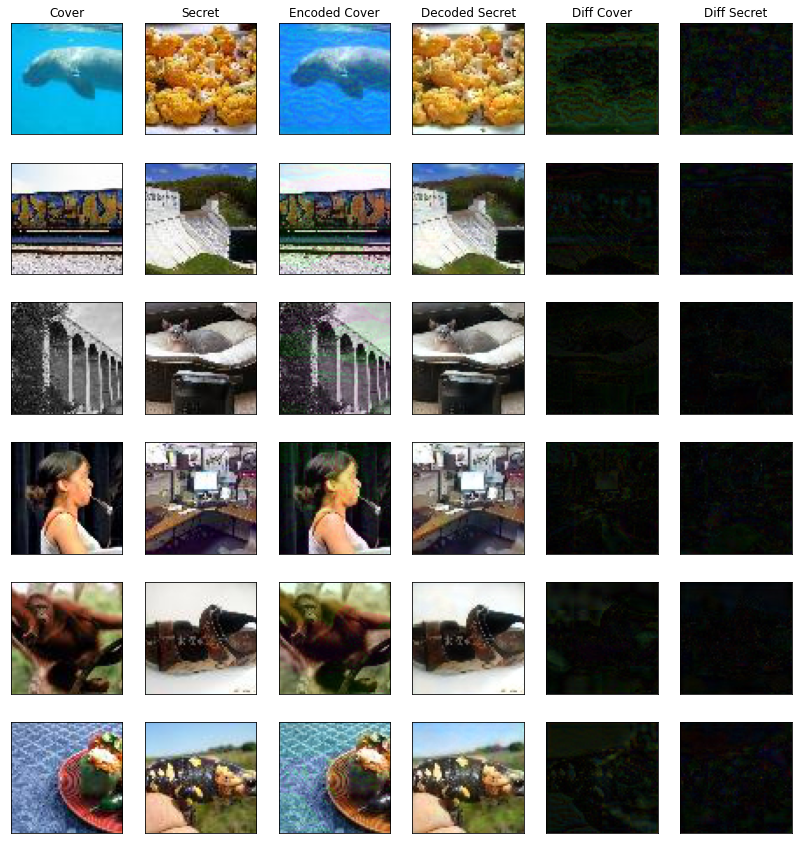

  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 281 | Batch:   0 of 1000. Loss AE    1757.46 | Loss Rev     793.39:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 281 | Batch:  32 of 1000. Loss AE    1894.15 | Loss Rev     898.80:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 281 | Batch:  64 of 1000. Loss AE    1763.74 | Loss Rev     824.43:   9%|▉         | 3/32 [00:01<00:17,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 281 | Batch:  96 of 1000. Loss AE    1797.71 | Loss Rev     827.09:  12%|█▎        | 4/32 [00:02<00:16,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 281 | Batch: 128 of 1000. Loss AE    1798.25 | Loss Rev     829.08:  16%|█▌        | 5/32 [00:03<00:16,  1.65it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 281 | Batch: 160 of 1000. Loss AE    1785.57 | Loss Rev     814.69:  19%|█▉        | 6/32 [00:03<00:16,  1.60it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 281 | Batch: 192 of 1000. Loss AE    1770.76 | Loss Rev     813.10:  22%|██▏       | 7/32 [00:04<00:15,  1.63it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 281 | Batch: 224 of 1000. Loss AE    1728.35 | Loss Rev     807.40:  25%|██▌       | 8/32 [00:04<00:14,  1.61it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 281 | Batch: 256 of 1000. Loss AE    1759.44 | Loss Rev     808.51:  28%|██▊       | 9/32 [00:05<00:13,  1.68it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 281 | Batch: 288 of 1000. Loss AE    1770.19 | Loss Rev     804.12:  31%|███▏      | 10/32 [00:06<00:13,  1.65it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 281 | Batch: 320 of 1000. Loss AE    1749.86 | Loss Rev     797.59:  34%|███▍      | 11/32 [00:06<00:12,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 281 | Batch: 352 of 1000. Loss AE    1747.13 | Loss Rev     793.14:  38%|███▊      | 12/32 [00:07<00:11,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 281 | Batch: 384 of 1000. Loss AE    1726.53 | Loss Rev     784.52:  41%|████      | 13/32 [00:07<00:10,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 281 | Batch: 416 of 1000. Loss AE    1722.76 | Loss Rev     788.74:  44%|████▍     | 14/32 [00:08<00:09,  1.85it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 281 | Batch: 448 of 1000. Loss AE    1728.97 | Loss Rev     784.33:  47%|████▋     | 15/32 [00:08<00:09,  1.78it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 281 | Batch: 480 of 1000. Loss AE    1704.30 | Loss Rev     775.13:  50%|█████     | 16/32 [00:09<00:08,  1.84it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 281 | Batch: 512 of 1000. Loss AE    1712.28 | Loss Rev     783.18:  53%|█████▎    | 17/32 [00:09<00:08,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 281 | Batch: 544 of 1000. Loss AE    1725.02 | Loss Rev     786.68:  56%|█████▋    | 18/32 [00:10<00:07,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 281 | Batch: 576 of 1000. Loss AE    1729.56 | Loss Rev     781.51:  59%|█████▉    | 19/32 [00:10<00:07,  1.82it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 281 | Batch: 608 of 1000. Loss AE    1716.77 | Loss Rev     779.70:  62%|██████▎   | 20/32 [00:11<00:06,  1.84it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 281 | Batch: 640 of 1000. Loss AE    1702.14 | Loss Rev     771.48:  66%|██████▌   | 21/32 [00:11<00:05,  1.84it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 281 | Batch: 672 of 1000. Loss AE    1692.52 | Loss Rev     764.09:  69%|██████▉   | 22/32 [00:12<00:05,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 281 | Batch: 704 of 1000. Loss AE    1716.26 | Loss Rev     760.93:  72%|███████▏  | 23/32 [00:13<00:05,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 281 | Batch: 736 of 1000. Loss AE    1708.81 | Loss Rev     755.48:  75%|███████▌  | 24/32 [00:13<00:04,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 281 | Batch: 768 of 1000. Loss AE    1712.41 | Loss Rev     755.81:  78%|███████▊  | 25/32 [00:14<00:03,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 281 | Batch: 800 of 1000. Loss AE    1707.45 | Loss Rev     751.46:  81%|████████▏ | 26/32 [00:14<00:03,  1.78it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 281 | Batch: 832 of 1000. Loss AE    1699.52 | Loss Rev     745.47:  84%|████████▍ | 27/32 [00:15<00:02,  1.83it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 281 | Batch: 864 of 1000. Loss AE    1695.70 | Loss Rev     741.26:  88%|████████▊ | 28/32 [00:15<00:02,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 281 | Batch: 896 of 1000. Loss AE    1693.61 | Loss Rev     736.80:  91%|█████████ | 29/32 [00:16<00:01,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 281 | Batch: 928 of 1000. Loss AE    1726.12 | Loss Rev     737.45:  94%|█████████▍| 30/32 [00:16<00:01,  1.87it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 281 | Batch: 960 of 1000. Loss AE    1720.40 | Loss Rev     730.62:  97%|█████████▋| 31/32 [00:17<00:00,  1.77it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 281 | Batch: 992 of 1000. Loss AE    1680.51 | Loss Rev     713.59: 100%|██████████| 32/32 [00:17<00:00,  1.80it/s]


281


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 282 | Batch:   0 of 1000. Loss AE    1663.17 | Loss Rev     761.62:   3%|▎         | 1/32 [00:00<00:19,  1.61it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 282 | Batch:  32 of 1000. Loss AE    1879.26 | Loss Rev     889.31:   6%|▋         | 2/32 [00:01<00:17,  1.75it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 282 | Batch:  64 of 1000. Loss AE    1814.45 | Loss Rev     857.16:   9%|▉         | 3/32 [00:01<00:17,  1.66it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 282 | Batch:  96 of 1000. Loss AE    1802.39 | Loss Rev     804.59:  12%|█▎        | 4/32 [00:02<00:17,  1.65it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 282 | Batch: 128 of 1000. Loss AE    1785.73 | Loss Rev     802.73:  16%|█▌        | 5/32 [00:03<00:16,  1.61it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 282 | Batch: 160 of 1000. Loss AE    1738.42 | Loss Rev     782.33:  19%|█▉        | 6/32 [00:03<00:15,  1.64it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 282 | Batch: 192 of 1000. Loss AE    1714.94 | Loss Rev     755.20:  22%|██▏       | 7/32 [00:04<00:15,  1.65it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 282 | Batch: 224 of 1000. Loss AE    1724.49 | Loss Rev     758.47:  25%|██▌       | 8/32 [00:04<00:14,  1.71it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 282 | Batch: 256 of 1000. Loss AE    1740.48 | Loss Rev     756.04:  28%|██▊       | 9/32 [00:05<00:13,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 282 | Batch: 288 of 1000. Loss AE    1730.67 | Loss Rev     750.34:  31%|███▏      | 10/32 [00:05<00:12,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 282 | Batch: 320 of 1000. Loss AE    1717.92 | Loss Rev     744.88:  34%|███▍      | 11/32 [00:06<00:11,  1.85it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 282 | Batch: 352 of 1000. Loss AE    1688.51 | Loss Rev     736.55:  38%|███▊      | 12/32 [00:06<00:10,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 282 | Batch: 384 of 1000. Loss AE    1686.70 | Loss Rev     727.80:  41%|████      | 13/32 [00:07<00:10,  1.85it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 282 | Batch: 416 of 1000. Loss AE    1663.62 | Loss Rev     723.64:  44%|████▍     | 14/32 [00:07<00:09,  1.91it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 282 | Batch: 448 of 1000. Loss AE    1676.25 | Loss Rev     722.30:  47%|████▋     | 15/32 [00:08<00:09,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 282 | Batch: 480 of 1000. Loss AE    1655.28 | Loss Rev     712.24:  50%|█████     | 16/32 [00:08<00:08,  1.90it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 282 | Batch: 512 of 1000. Loss AE    1636.69 | Loss Rev     704.60:  53%|█████▎    | 17/32 [00:09<00:08,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 282 | Batch: 544 of 1000. Loss AE    1660.15 | Loss Rev     704.58:  56%|█████▋    | 18/32 [00:10<00:07,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 282 | Batch: 576 of 1000. Loss AE    1647.08 | Loss Rev     697.27:  59%|█████▉    | 19/32 [00:10<00:07,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 282 | Batch: 608 of 1000. Loss AE    1656.44 | Loss Rev     692.79:  62%|██████▎   | 20/32 [00:11<00:06,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 282 | Batch: 640 of 1000. Loss AE    1651.80 | Loss Rev     690.53:  66%|██████▌   | 21/32 [00:11<00:06,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 282 | Batch: 672 of 1000. Loss AE    1646.71 | Loss Rev     682.68:  69%|██████▉   | 22/32 [00:12<00:05,  1.77it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 282 | Batch: 704 of 1000. Loss AE    1662.10 | Loss Rev     685.55:  72%|███████▏  | 23/32 [00:13<00:05,  1.72it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 282 | Batch: 736 of 1000. Loss AE    1656.01 | Loss Rev     686.23:  75%|███████▌  | 24/32 [00:13<00:04,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 282 | Batch: 768 of 1000. Loss AE    1655.28 | Loss Rev     686.27:  78%|███████▊  | 25/32 [00:14<00:03,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 282 | Batch: 800 of 1000. Loss AE    1651.74 | Loss Rev     687.35:  81%|████████▏ | 26/32 [00:14<00:03,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 282 | Batch: 832 of 1000. Loss AE    1654.07 | Loss Rev     686.96:  84%|████████▍ | 27/32 [00:15<00:02,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 282 | Batch: 864 of 1000. Loss AE    1655.44 | Loss Rev     689.04:  88%|████████▊ | 28/32 [00:15<00:02,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 282 | Batch: 896 of 1000. Loss AE    1657.22 | Loss Rev     693.05:  91%|█████████ | 29/32 [00:16<00:01,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 282 | Batch: 928 of 1000. Loss AE    1687.85 | Loss Rev     704.49:  94%|█████████▍| 30/32 [00:17<00:01,  1.69it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 282 | Batch: 960 of 1000. Loss AE    1694.44 | Loss Rev     713.96:  97%|█████████▋| 31/32 [00:17<00:00,  1.65it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 282 | Batch: 992 of 1000. Loss AE    1654.72 | Loss Rev     698.37: 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]


282


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 283 | Batch:   0 of 1000. Loss AE    2152.52 | Loss Rev    1291.09:   3%|▎         | 1/32 [00:00<00:18,  1.68it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 283 | Batch:  32 of 1000. Loss AE    2329.97 | Loss Rev    1521.99:   6%|▋         | 2/32 [00:01<00:16,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 283 | Batch:  64 of 1000. Loss AE    2156.00 | Loss Rev    1288.84:   9%|▉         | 3/32 [00:01<00:16,  1.75it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 283 | Batch:  96 of 1000. Loss AE    2014.48 | Loss Rev    1188.21:  12%|█▎        | 4/32 [00:02<00:16,  1.69it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 283 | Batch: 128 of 1000. Loss AE    2089.13 | Loss Rev    1240.05:  16%|█▌        | 5/32 [00:02<00:15,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 283 | Batch: 160 of 1000. Loss AE    2050.31 | Loss Rev    1193.31:  19%|█▉        | 6/32 [00:03<00:14,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 283 | Batch: 192 of 1000. Loss AE    1971.88 | Loss Rev    1119.74:  22%|██▏       | 7/32 [00:03<00:13,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 283 | Batch: 224 of 1000. Loss AE    1986.62 | Loss Rev    1113.87:  25%|██▌       | 8/32 [00:04<00:12,  1.85it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 283 | Batch: 256 of 1000. Loss AE    1934.54 | Loss Rev    1070.38:  28%|██▊       | 9/32 [00:04<00:12,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 283 | Batch: 288 of 1000. Loss AE    1934.50 | Loss Rev    1062.34:  31%|███▏      | 10/32 [00:05<00:11,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 283 | Batch: 320 of 1000. Loss AE    1939.29 | Loss Rev    1054.24:  34%|███▍      | 11/32 [00:05<00:10,  1.98it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 283 | Batch: 352 of 1000. Loss AE    1912.36 | Loss Rev    1023.55:  38%|███▊      | 12/32 [00:06<00:10,  1.85it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 283 | Batch: 384 of 1000. Loss AE    1892.94 | Loss Rev    1016.17:  41%|████      | 13/32 [00:07<00:10,  1.86it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 283 | Batch: 416 of 1000. Loss AE    1902.09 | Loss Rev    1012.12:  44%|████▍     | 14/32 [00:07<00:09,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 283 | Batch: 448 of 1000. Loss AE    1883.52 | Loss Rev     989.08:  47%|████▋     | 15/32 [00:08<00:09,  1.81it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 283 | Batch: 480 of 1000. Loss AE    1907.73 | Loss Rev     993.47:  50%|█████     | 16/32 [00:08<00:08,  1.79it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 283 | Batch: 512 of 1000. Loss AE    1890.53 | Loss Rev     976.52:  53%|█████▎    | 17/32 [00:09<00:08,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 283 | Batch: 544 of 1000. Loss AE    1907.22 | Loss Rev     968.27:  56%|█████▋    | 18/32 [00:09<00:07,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 283 | Batch: 576 of 1000. Loss AE    1928.77 | Loss Rev     967.67:  59%|█████▉    | 19/32 [00:10<00:07,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 283 | Batch: 608 of 1000. Loss AE    1909.63 | Loss Rev     953.42:  62%|██████▎   | 20/32 [00:11<00:06,  1.72it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 283 | Batch: 640 of 1000. Loss AE    1907.14 | Loss Rev     948.15:  66%|██████▌   | 21/32 [00:11<00:06,  1.76it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 283 | Batch: 672 of 1000. Loss AE    1905.16 | Loss Rev     939.47:  69%|██████▉   | 22/32 [00:12<00:05,  1.73it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 283 | Batch: 704 of 1000. Loss AE    1904.42 | Loss Rev     927.67:  72%|███████▏  | 23/32 [00:12<00:05,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 283 | Batch: 736 of 1000. Loss AE    1935.92 | Loss Rev     922.68:  75%|███████▌  | 24/32 [00:13<00:04,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 283 | Batch: 768 of 1000. Loss AE    1918.08 | Loss Rev     913.47:  78%|███████▊  | 25/32 [00:13<00:03,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 283 | Batch: 800 of 1000. Loss AE    1911.23 | Loss Rev     906.03:  81%|████████▏ | 26/32 [00:14<00:03,  1.74it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 283 | Batch: 832 of 1000. Loss AE    1898.03 | Loss Rev     898.49:  84%|████████▍ | 27/32 [00:15<00:02,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 283 | Batch: 864 of 1000. Loss AE    1900.18 | Loss Rev     888.81:  88%|████████▊ | 28/32 [00:15<00:02,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 283 | Batch: 896 of 1000. Loss AE    1892.36 | Loss Rev     884.40:  91%|█████████ | 29/32 [00:16<00:01,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 283 | Batch: 928 of 1000. Loss AE    1877.24 | Loss Rev     876.82:  94%|█████████▍| 30/32 [00:16<00:01,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 283 | Batch: 960 of 1000. Loss AE    1873.15 | Loss Rev     872.18:  97%|█████████▋| 31/32 [00:17<00:00,  1.84it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 283 | Batch: 992 of 1000. Loss AE    1826.91 | Loss Rev     850.97: 100%|██████████| 32/32 [00:17<00:00,  1.82it/s]


283


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 284 | Batch:   0 of 1000. Loss AE    1935.00 | Loss Rev    1064.04:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 284 | Batch:  32 of 1000. Loss AE    2370.85 | Loss Rev    1234.75:   6%|▋         | 2/32 [00:01<00:17,  1.72it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 284 | Batch:  64 of 1000. Loss AE    2139.32 | Loss Rev    1070.67:   9%|▉         | 3/32 [00:01<00:17,  1.69it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 284 | Batch:  96 of 1000. Loss AE    2248.46 | Loss Rev    1235.91:  12%|█▎        | 4/32 [00:02<00:15,  1.76it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 284 | Batch: 128 of 1000. Loss AE    2260.88 | Loss Rev    1222.26:  16%|█▌        | 5/32 [00:02<00:15,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 284 | Batch: 160 of 1000. Loss AE    2164.22 | Loss Rev    1185.36:  19%|█▉        | 6/32 [00:03<00:15,  1.71it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 284 | Batch: 192 of 1000. Loss AE    2237.77 | Loss Rev    1224.95:  22%|██▏       | 7/32 [00:04<00:14,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 284 | Batch: 224 of 1000. Loss AE    2123.85 | Loss Rev    1153.86:  25%|██▌       | 8/32 [00:04<00:13,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 284 | Batch: 256 of 1000. Loss AE    2188.88 | Loss Rev    1187.91:  28%|██▊       | 9/32 [00:05<00:13,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 284 | Batch: 288 of 1000. Loss AE    2157.01 | Loss Rev    1165.95:  31%|███▏      | 10/32 [00:05<00:13,  1.68it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 284 | Batch: 320 of 1000. Loss AE    2139.40 | Loss Rev    1141.27:  34%|███▍      | 11/32 [00:06<00:12,  1.64it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 284 | Batch: 352 of 1000. Loss AE    2145.20 | Loss Rev    1151.92:  38%|███▊      | 12/32 [00:07<00:12,  1.60it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 284 | Batch: 384 of 1000. Loss AE    2113.31 | Loss Rev    1120.32:  41%|████      | 13/32 [00:07<00:11,  1.60it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 284 | Batch: 416 of 1000. Loss AE    2145.55 | Loss Rev    1139.57:  44%|████▍     | 14/32 [00:08<00:11,  1.59it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 284 | Batch: 448 of 1000. Loss AE    2154.99 | Loss Rev    1111.47:  47%|████▋     | 15/32 [00:09<00:10,  1.62it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 284 | Batch: 480 of 1000. Loss AE    2150.67 | Loss Rev    1111.43:  50%|█████     | 16/32 [00:09<00:09,  1.65it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 284 | Batch: 512 of 1000. Loss AE    2134.93 | Loss Rev    1097.32:  53%|█████▎    | 17/32 [00:10<00:09,  1.65it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 284 | Batch: 544 of 1000. Loss AE    2120.85 | Loss Rev    1087.39:  56%|█████▋    | 18/32 [00:10<00:08,  1.62it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 284 | Batch: 576 of 1000. Loss AE    2113.26 | Loss Rev    1077.32:  59%|█████▉    | 19/32 [00:11<00:08,  1.62it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 284 | Batch: 608 of 1000. Loss AE    2089.89 | Loss Rev    1053.64:  62%|██████▎   | 20/32 [00:12<00:07,  1.61it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 284 | Batch: 640 of 1000. Loss AE    2069.90 | Loss Rev    1044.90:  66%|██████▌   | 21/32 [00:12<00:06,  1.62it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 284 | Batch: 672 of 1000. Loss AE    2047.56 | Loss Rev    1024.13:  69%|██████▉   | 22/32 [00:13<00:05,  1.69it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 284 | Batch: 704 of 1000. Loss AE    2039.26 | Loss Rev    1016.59:  72%|███████▏  | 23/32 [00:13<00:05,  1.66it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 284 | Batch: 736 of 1000. Loss AE    2024.47 | Loss Rev    1003.65:  75%|███████▌  | 24/32 [00:14<00:04,  1.76it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 284 | Batch: 768 of 1000. Loss AE    2024.30 | Loss Rev     998.08:  78%|███████▊  | 25/32 [00:14<00:04,  1.73it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 284 | Batch: 800 of 1000. Loss AE    2013.13 | Loss Rev     986.81:  81%|████████▏ | 26/32 [00:15<00:03,  1.70it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 284 | Batch: 832 of 1000. Loss AE    2001.67 | Loss Rev     978.42:  84%|████████▍ | 27/32 [00:16<00:02,  1.69it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 284 | Batch: 864 of 1000. Loss AE    1995.81 | Loss Rev     970.47:  88%|████████▊ | 28/32 [00:16<00:02,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 284 | Batch: 896 of 1000. Loss AE    1987.68 | Loss Rev     960.36:  91%|█████████ | 29/32 [00:17<00:01,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 284 | Batch: 928 of 1000. Loss AE    1979.66 | Loss Rev     952.44:  94%|█████████▍| 30/32 [00:17<00:01,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 284 | Batch: 960 of 1000. Loss AE    1973.07 | Loss Rev     943.26:  97%|█████████▋| 31/32 [00:18<00:00,  1.65it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 284 | Batch: 992 of 1000. Loss AE    1924.76 | Loss Rev     918.73: 100%|██████████| 32/32 [00:18<00:00,  1.70it/s]

284



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 285 | Batch:   0 of 1000. Loss AE    1634.15 | Loss Rev     710.03:   3%|▎         | 1/32 [00:00<00:19,  1.61it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 285 | Batch:  32 of 1000. Loss AE    1515.95 | Loss Rev     684.02:   6%|▋         | 2/32 [00:01<00:16,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 285 | Batch:  64 of 1000. Loss AE    1603.86 | Loss Rev     672.25:   9%|▉         | 3/32 [00:01<00:15,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 285 | Batch:  96 of 1000. Loss AE    1671.47 | Loss Rev     694.63:  12%|█▎        | 4/32 [00:02<00:16,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 285 | Batch: 128 of 1000. Loss AE    1698.78 | Loss Rev     689.81:  16%|█▌        | 5/32 [00:02<00:15,  1.77it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 285 | Batch: 160 of 1000. Loss AE    1687.01 | Loss Rev     677.26:  19%|█▉        | 6/32 [00:03<00:14,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 285 | Batch: 192 of 1000. Loss AE    1732.55 | Loss Rev     671.57:  22%|██▏       | 7/32 [00:04<00:14,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 285 | Batch: 224 of 1000. Loss AE    1746.05 | Loss Rev     686.73:  25%|██▌       | 8/32 [00:04<00:13,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 285 | Batch: 256 of 1000. Loss AE    1740.74 | Loss Rev     678.50:  28%|██▊       | 9/32 [00:05<00:13,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 285 | Batch: 288 of 1000. Loss AE    1719.45 | Loss Rev     677.67:  31%|███▏      | 10/32 [00:05<00:12,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 285 | Batch: 320 of 1000. Loss AE    1713.11 | Loss Rev     668.49:  34%|███▍      | 11/32 [00:06<00:12,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 285 | Batch: 352 of 1000. Loss AE    1691.32 | Loss Rev     669.02:  38%|███▊      | 12/32 [00:06<00:11,  1.69it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 285 | Batch: 384 of 1000. Loss AE    1686.92 | Loss Rev     668.07:  41%|████      | 13/32 [00:07<00:10,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 285 | Batch: 416 of 1000. Loss AE    1700.30 | Loss Rev     677.37:  44%|████▍     | 14/32 [00:07<00:10,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 285 | Batch: 448 of 1000. Loss AE    1691.51 | Loss Rev     669.32:  47%|████▋     | 15/32 [00:08<00:09,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 285 | Batch: 480 of 1000. Loss AE    1694.14 | Loss Rev     673.82:  50%|█████     | 16/32 [00:09<00:09,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 285 | Batch: 512 of 1000. Loss AE    1684.81 | Loss Rev     673.46:  53%|█████▎    | 17/32 [00:09<00:08,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 285 | Batch: 544 of 1000. Loss AE    1694.83 | Loss Rev     671.46:  56%|█████▋    | 18/32 [00:10<00:07,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 285 | Batch: 576 of 1000. Loss AE    1673.56 | Loss Rev     667.33:  59%|█████▉    | 19/32 [00:10<00:07,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 285 | Batch: 608 of 1000. Loss AE    1676.23 | Loss Rev     667.70:  62%|██████▎   | 20/32 [00:11<00:07,  1.71it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 285 | Batch: 640 of 1000. Loss AE    1663.49 | Loss Rev     665.03:  66%|██████▌   | 21/32 [00:12<00:06,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 285 | Batch: 672 of 1000. Loss AE    1652.66 | Loss Rev     662.66:  69%|██████▉   | 22/32 [00:12<00:06,  1.65it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 285 | Batch: 704 of 1000. Loss AE    1655.32 | Loss Rev     661.05:  72%|███████▏  | 23/32 [00:13<00:05,  1.70it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 285 | Batch: 736 of 1000. Loss AE    1650.95 | Loss Rev     661.23:  75%|███████▌  | 24/32 [00:13<00:04,  1.66it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 285 | Batch: 768 of 1000. Loss AE    1646.02 | Loss Rev     658.93:  78%|███████▊  | 25/32 [00:14<00:04,  1.75it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 285 | Batch: 800 of 1000. Loss AE    1652.21 | Loss Rev     660.00:  81%|████████▏ | 26/32 [00:15<00:03,  1.67it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 285 | Batch: 832 of 1000. Loss AE    1654.54 | Loss Rev     665.92:  84%|████████▍ | 27/32 [00:15<00:03,  1.65it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 285 | Batch: 864 of 1000. Loss AE    1646.14 | Loss Rev     662.79:  88%|████████▊ | 28/32 [00:16<00:02,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 285 | Batch: 896 of 1000. Loss AE    1658.40 | Loss Rev     661.51:  91%|█████████ | 29/32 [00:16<00:01,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 285 | Batch: 928 of 1000. Loss AE    1659.18 | Loss Rev     663.44:  94%|█████████▍| 30/32 [00:17<00:01,  1.70it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 285 | Batch: 960 of 1000. Loss AE    1657.55 | Loss Rev     661.64:  97%|█████████▋| 31/32 [00:17<00:00,  1.66it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 285 | Batch: 992 of 1000. Loss AE    1616.77 | Loss Rev     644.98: 100%|██████████| 32/32 [00:18<00:00,  1.76it/s]


285


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 286 | Batch:   0 of 1000. Loss AE    1270.37 | Loss Rev     556.20:   3%|▎         | 1/32 [00:00<00:18,  1.71it/s]

1/1 [==============================] - 0s 74ms/step


Epoch 286 | Batch:  32 of 1000. Loss AE    1405.47 | Loss Rev     594.86:   6%|▋         | 2/32 [00:01<00:17,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 286 | Batch:  64 of 1000. Loss AE    1415.78 | Loss Rev     622.76:   9%|▉         | 3/32 [00:01<00:15,  1.84it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 286 | Batch:  96 of 1000. Loss AE    1410.38 | Loss Rev     635.08:  12%|█▎        | 4/32 [00:02<00:16,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 286 | Batch: 128 of 1000. Loss AE    1423.87 | Loss Rev     623.79:  16%|█▌        | 5/32 [00:02<00:15,  1.71it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 286 | Batch: 160 of 1000. Loss AE    1478.45 | Loss Rev     653.63:  19%|█▉        | 6/32 [00:03<00:15,  1.72it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 286 | Batch: 192 of 1000. Loss AE    1536.16 | Loss Rev     655.70:  22%|██▏       | 7/32 [00:04<00:14,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 286 | Batch: 224 of 1000. Loss AE    1525.51 | Loss Rev     656.98:  25%|██▌       | 8/32 [00:04<00:13,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 286 | Batch: 256 of 1000. Loss AE    1566.85 | Loss Rev     659.02:  28%|██▊       | 9/32 [00:05<00:12,  1.78it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 286 | Batch: 288 of 1000. Loss AE    1571.51 | Loss Rev     654.80:  31%|███▏      | 10/32 [00:05<00:12,  1.73it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 286 | Batch: 320 of 1000. Loss AE    1576.79 | Loss Rev     648.13:  34%|███▍      | 11/32 [00:06<00:11,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 286 | Batch: 352 of 1000. Loss AE    1598.07 | Loss Rev     646.26:  38%|███▊      | 12/32 [00:06<00:11,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 286 | Batch: 384 of 1000. Loss AE    1583.16 | Loss Rev     644.89:  41%|████      | 13/32 [00:07<00:10,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 286 | Batch: 416 of 1000. Loss AE    1562.52 | Loss Rev     640.88:  44%|████▍     | 14/32 [00:07<00:10,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 286 | Batch: 448 of 1000. Loss AE    1590.10 | Loss Rev     640.31:  47%|████▋     | 15/32 [00:08<00:09,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 286 | Batch: 480 of 1000. Loss AE    1598.04 | Loss Rev     641.45:  50%|█████     | 16/32 [00:09<00:09,  1.69it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 286 | Batch: 512 of 1000. Loss AE    1588.50 | Loss Rev     641.99:  53%|█████▎    | 17/32 [00:09<00:08,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 286 | Batch: 544 of 1000. Loss AE    1589.21 | Loss Rev     644.51:  56%|█████▋    | 18/32 [00:10<00:08,  1.68it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 286 | Batch: 576 of 1000. Loss AE    1578.29 | Loss Rev     641.57:  59%|█████▉    | 19/32 [00:10<00:07,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 286 | Batch: 608 of 1000. Loss AE    1577.27 | Loss Rev     645.77:  62%|██████▎   | 20/32 [00:11<00:06,  1.82it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 286 | Batch: 640 of 1000. Loss AE    1581.43 | Loss Rev     643.47:  66%|██████▌   | 21/32 [00:11<00:06,  1.75it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 286 | Batch: 672 of 1000. Loss AE    1579.75 | Loss Rev     643.58:  69%|██████▉   | 22/32 [00:12<00:05,  1.72it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 286 | Batch: 704 of 1000. Loss AE    1580.97 | Loss Rev     644.17:  72%|███████▏  | 23/32 [00:13<00:05,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 286 | Batch: 736 of 1000. Loss AE    1590.00 | Loss Rev     643.75:  75%|███████▌  | 24/32 [00:13<00:04,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 286 | Batch: 768 of 1000. Loss AE    1588.67 | Loss Rev     644.62:  78%|███████▊  | 25/32 [00:14<00:04,  1.73it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 286 | Batch: 800 of 1000. Loss AE    1591.71 | Loss Rev     652.17:  81%|████████▏ | 26/32 [00:14<00:03,  1.74it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 286 | Batch: 832 of 1000. Loss AE    1590.01 | Loss Rev     655.15:  84%|████████▍ | 27/32 [00:15<00:02,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 286 | Batch: 864 of 1000. Loss AE    1597.78 | Loss Rev     652.97:  88%|████████▊ | 28/32 [00:15<00:02,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 286 | Batch: 896 of 1000. Loss AE    1598.81 | Loss Rev     651.45:  91%|█████████ | 29/32 [00:16<00:01,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 286 | Batch: 928 of 1000. Loss AE    1596.12 | Loss Rev     651.87:  94%|█████████▍| 30/32 [00:16<00:01,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 286 | Batch: 960 of 1000. Loss AE    1606.83 | Loss Rev     651.93:  97%|█████████▋| 31/32 [00:17<00:00,  1.90it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 286 | Batch: 992 of 1000. Loss AE    1566.43 | Loss Rev     637.09: 100%|██████████| 32/32 [00:17<00:00,  1.81it/s]

286



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 287 | Batch:   0 of 1000. Loss AE    1749.12 | Loss Rev     685.54:   3%|▎         | 1/32 [00:00<00:16,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 287 | Batch:  32 of 1000. Loss AE    1842.75 | Loss Rev     745.41:   6%|▋         | 2/32 [00:01<00:15,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 287 | Batch:  64 of 1000. Loss AE    1734.23 | Loss Rev     717.14:   9%|▉         | 3/32 [00:01<00:14,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 287 | Batch:  96 of 1000. Loss AE    1728.41 | Loss Rev     725.78:  12%|█▎        | 4/32 [00:02<00:15,  1.82it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 287 | Batch: 128 of 1000. Loss AE    1691.52 | Loss Rev     724.69:  16%|█▌        | 5/32 [00:02<00:14,  1.87it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 287 | Batch: 160 of 1000. Loss AE    1734.82 | Loss Rev     749.95:  19%|█▉        | 6/32 [00:03<00:14,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 287 | Batch: 192 of 1000. Loss AE    1724.56 | Loss Rev     764.46:  22%|██▏       | 7/32 [00:03<00:13,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 287 | Batch: 224 of 1000. Loss AE    1705.67 | Loss Rev     761.48:  25%|██▌       | 8/32 [00:04<00:13,  1.80it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 287 | Batch: 256 of 1000. Loss AE    1706.18 | Loss Rev     753.00:  28%|██▊       | 9/32 [00:05<00:13,  1.72it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 287 | Batch: 288 of 1000. Loss AE    1709.25 | Loss Rev     755.60:  31%|███▏      | 10/32 [00:05<00:13,  1.69it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 287 | Batch: 320 of 1000. Loss AE    1774.29 | Loss Rev     766.14:  34%|███▍      | 11/32 [00:06<00:12,  1.67it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 287 | Batch: 352 of 1000. Loss AE    1770.84 | Loss Rev     775.03:  38%|███▊      | 12/32 [00:06<00:12,  1.65it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 287 | Batch: 384 of 1000. Loss AE    1764.65 | Loss Rev     773.74:  41%|████      | 13/32 [00:07<00:11,  1.70it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 287 | Batch: 416 of 1000. Loss AE    1754.95 | Loss Rev     768.95:  44%|████▍     | 14/32 [00:07<00:10,  1.74it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 287 | Batch: 448 of 1000. Loss AE    1778.27 | Loss Rev     768.39:  47%|████▋     | 15/32 [00:08<00:09,  1.72it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 287 | Batch: 480 of 1000. Loss AE    1775.83 | Loss Rev     772.48:  50%|█████     | 16/32 [00:09<00:09,  1.68it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 287 | Batch: 512 of 1000. Loss AE    1768.48 | Loss Rev     765.61:  53%|█████▎    | 17/32 [00:09<00:09,  1.65it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 287 | Batch: 544 of 1000. Loss AE    1747.46 | Loss Rev     758.94:  56%|█████▋    | 18/32 [00:10<00:08,  1.61it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 287 | Batch: 576 of 1000. Loss AE    1754.24 | Loss Rev     754.57:  59%|█████▉    | 19/32 [00:11<00:07,  1.68it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 287 | Batch: 608 of 1000. Loss AE    1737.89 | Loss Rev     747.81:  62%|██████▎   | 20/32 [00:11<00:06,  1.73it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 287 | Batch: 640 of 1000. Loss AE    1728.31 | Loss Rev     740.92:  66%|██████▌   | 21/32 [00:12<00:06,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 287 | Batch: 672 of 1000. Loss AE    1711.81 | Loss Rev     737.32:  69%|██████▉   | 22/32 [00:12<00:05,  1.72it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 287 | Batch: 704 of 1000. Loss AE    1699.98 | Loss Rev     733.37:  72%|███████▏  | 23/32 [00:13<00:05,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 287 | Batch: 736 of 1000. Loss AE    1697.82 | Loss Rev     728.51:  75%|███████▌  | 24/32 [00:13<00:04,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 287 | Batch: 768 of 1000. Loss AE    1689.38 | Loss Rev     721.56:  78%|███████▊  | 25/32 [00:14<00:04,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 287 | Batch: 800 of 1000. Loss AE    1691.55 | Loss Rev     720.25:  81%|████████▏ | 26/32 [00:15<00:03,  1.73it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 287 | Batch: 832 of 1000. Loss AE    1687.50 | Loss Rev     716.89:  84%|████████▍ | 27/32 [00:15<00:02,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 287 | Batch: 864 of 1000. Loss AE    1673.68 | Loss Rev     714.85:  88%|████████▊ | 28/32 [00:16<00:02,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 287 | Batch: 896 of 1000. Loss AE    1659.17 | Loss Rev     710.84:  91%|█████████ | 29/32 [00:16<00:01,  1.78it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 287 | Batch: 928 of 1000. Loss AE    1650.39 | Loss Rev     707.72:  94%|█████████▍| 30/32 [00:17<00:01,  1.73it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 287 | Batch: 960 of 1000. Loss AE    1649.66 | Loss Rev     703.47:  97%|█████████▋| 31/32 [00:17<00:00,  1.68it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 287 | Batch: 992 of 1000. Loss AE    1612.09 | Loss Rev     687.27: 100%|██████████| 32/32 [00:18<00:00,  1.77it/s]


287


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 288 | Batch:   0 of 1000. Loss AE    1765.56 | Loss Rev     691.47:   3%|▎         | 1/32 [00:00<00:16,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 288 | Batch:  32 of 1000. Loss AE    1889.53 | Loss Rev     831.56:   6%|▋         | 2/32 [00:01<00:17,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 288 | Batch:  64 of 1000. Loss AE    1922.83 | Loss Rev     840.34:   9%|▉         | 3/32 [00:01<00:16,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 288 | Batch:  96 of 1000. Loss AE    1829.82 | Loss Rev     823.10:  12%|█▎        | 4/32 [00:02<00:16,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 288 | Batch: 128 of 1000. Loss AE    1801.56 | Loss Rev     793.41:  16%|█▌        | 5/32 [00:02<00:15,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 288 | Batch: 160 of 1000. Loss AE    1781.09 | Loss Rev     785.42:  19%|█▉        | 6/32 [00:03<00:15,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 288 | Batch: 192 of 1000. Loss AE    1852.51 | Loss Rev     787.64:  22%|██▏       | 7/32 [00:04<00:14,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 288 | Batch: 224 of 1000. Loss AE    1778.61 | Loss Rev     769.52:  25%|██▌       | 8/32 [00:04<00:13,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 288 | Batch: 256 of 1000. Loss AE    1751.60 | Loss Rev     758.01:  28%|██▊       | 9/32 [00:05<00:12,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 288 | Batch: 288 of 1000. Loss AE    1721.18 | Loss Rev     754.01:  31%|███▏      | 10/32 [00:05<00:11,  1.85it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 288 | Batch: 320 of 1000. Loss AE    1722.38 | Loss Rev     763.38:  34%|███▍      | 11/32 [00:06<00:11,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 288 | Batch: 352 of 1000. Loss AE    1734.21 | Loss Rev     763.95:  38%|███▊      | 12/32 [00:06<00:11,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 288 | Batch: 384 of 1000. Loss AE    1766.72 | Loss Rev     756.63:  41%|████      | 13/32 [00:07<00:10,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 288 | Batch: 416 of 1000. Loss AE    1752.06 | Loss Rev     752.17:  44%|████▍     | 14/32 [00:07<00:10,  1.76it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 288 | Batch: 448 of 1000. Loss AE    1764.20 | Loss Rev     762.59:  47%|████▋     | 15/32 [00:08<00:09,  1.71it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 288 | Batch: 480 of 1000. Loss AE    1765.80 | Loss Rev     759.96:  50%|█████     | 16/32 [00:09<00:09,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 288 | Batch: 512 of 1000. Loss AE    1773.79 | Loss Rev     758.00:  53%|█████▎    | 17/32 [00:09<00:08,  1.67it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 288 | Batch: 544 of 1000. Loss AE    1769.55 | Loss Rev     758.60:  56%|█████▋    | 18/32 [00:10<00:07,  1.75it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 288 | Batch: 576 of 1000. Loss AE    1757.13 | Loss Rev     757.88:  59%|█████▉    | 19/32 [00:10<00:07,  1.73it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 288 | Batch: 608 of 1000. Loss AE    1744.36 | Loss Rev     757.08:  62%|██████▎   | 20/32 [00:11<00:07,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 288 | Batch: 640 of 1000. Loss AE    1735.30 | Loss Rev     750.16:  66%|██████▌   | 21/32 [00:11<00:06,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 288 | Batch: 672 of 1000. Loss AE    1721.71 | Loss Rev     740.59:  69%|██████▉   | 22/32 [00:12<00:05,  1.84it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 288 | Batch: 704 of 1000. Loss AE    1710.37 | Loss Rev     735.19:  72%|███████▏  | 23/32 [00:13<00:05,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 288 | Batch: 736 of 1000. Loss AE    1699.28 | Loss Rev     730.90:  75%|███████▌  | 24/32 [00:13<00:04,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 288 | Batch: 768 of 1000. Loss AE    1686.88 | Loss Rev     727.56:  78%|███████▊  | 25/32 [00:14<00:03,  1.75it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 288 | Batch: 800 of 1000. Loss AE    1683.49 | Loss Rev     725.55:  81%|████████▏ | 26/32 [00:14<00:03,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 288 | Batch: 832 of 1000. Loss AE    1684.53 | Loss Rev     722.58:  84%|████████▍ | 27/32 [00:15<00:02,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 288 | Batch: 864 of 1000. Loss AE    1680.38 | Loss Rev     725.94:  88%|████████▊ | 28/32 [00:15<00:02,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 288 | Batch: 896 of 1000. Loss AE    1685.25 | Loss Rev     726.04:  91%|█████████ | 29/32 [00:16<00:01,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 288 | Batch: 928 of 1000. Loss AE    1686.53 | Loss Rev     725.44:  94%|█████████▍| 30/32 [00:16<00:01,  1.80it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 288 | Batch: 960 of 1000. Loss AE    1678.89 | Loss Rev     720.51:  97%|█████████▋| 31/32 [00:17<00:00,  1.80it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 288 | Batch: 992 of 1000. Loss AE    1638.53 | Loss Rev     703.84: 100%|██████████| 32/32 [00:17<00:00,  1.80it/s]


288


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 289 | Batch:   0 of 1000. Loss AE    1836.88 | Loss Rev     786.86:   3%|▎         | 1/32 [00:00<00:16,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 289 | Batch:  32 of 1000. Loss AE    2243.83 | Loss Rev    1218.20:   6%|▋         | 2/32 [00:01<00:17,  1.75it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 289 | Batch:  64 of 1000. Loss AE    2100.67 | Loss Rev    1112.52:   9%|▉         | 3/32 [00:01<00:16,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 289 | Batch:  96 of 1000. Loss AE    1979.28 | Loss Rev    1001.61:  12%|█▎        | 4/32 [00:02<00:15,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 289 | Batch: 128 of 1000. Loss AE    1986.74 | Loss Rev     994.91:  16%|█▌        | 5/32 [00:02<00:14,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 289 | Batch: 160 of 1000. Loss AE    1951.84 | Loss Rev     973.68:  19%|█▉        | 6/32 [00:03<00:15,  1.72it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 289 | Batch: 192 of 1000. Loss AE    1891.20 | Loss Rev     924.86:  22%|██▏       | 7/32 [00:04<00:14,  1.72it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 289 | Batch: 224 of 1000. Loss AE    1857.87 | Loss Rev     892.41:  25%|██▌       | 8/32 [00:04<00:14,  1.67it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 289 | Batch: 256 of 1000. Loss AE    1845.16 | Loss Rev     885.02:  28%|██▊       | 9/32 [00:05<00:13,  1.76it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 289 | Batch: 288 of 1000. Loss AE    1812.23 | Loss Rev     864.59:  31%|███▏      | 10/32 [00:05<00:12,  1.74it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 289 | Batch: 320 of 1000. Loss AE    1771.69 | Loss Rev     844.73:  34%|███▍      | 11/32 [00:06<00:12,  1.68it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 289 | Batch: 352 of 1000. Loss AE    1775.83 | Loss Rev     839.93:  38%|███▊      | 12/32 [00:06<00:11,  1.76it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 289 | Batch: 384 of 1000. Loss AE    1785.66 | Loss Rev     843.25:  41%|████      | 13/32 [00:07<00:10,  1.83it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 289 | Batch: 416 of 1000. Loss AE    1766.67 | Loss Rev     830.54:  44%|████▍     | 14/32 [00:07<00:09,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 289 | Batch: 448 of 1000. Loss AE    1751.98 | Loss Rev     816.62:  47%|████▋     | 15/32 [00:08<00:09,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 289 | Batch: 480 of 1000. Loss AE    1736.16 | Loss Rev     803.28:  50%|█████     | 16/32 [00:09<00:09,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 289 | Batch: 512 of 1000. Loss AE    1754.37 | Loss Rev     795.71:  53%|█████▎    | 17/32 [00:09<00:08,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 289 | Batch: 544 of 1000. Loss AE    1753.10 | Loss Rev     785.72:  56%|█████▋    | 18/32 [00:10<00:07,  1.91it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 289 | Batch: 576 of 1000. Loss AE    1743.87 | Loss Rev     785.04:  59%|█████▉    | 19/32 [00:10<00:06,  1.87it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 289 | Batch: 608 of 1000. Loss AE    1751.79 | Loss Rev     784.36:  62%|██████▎   | 20/32 [00:11<00:06,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 289 | Batch: 640 of 1000. Loss AE    1751.21 | Loss Rev     779.45:  66%|██████▌   | 21/32 [00:11<00:06,  1.79it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 289 | Batch: 672 of 1000. Loss AE    1743.45 | Loss Rev     776.01:  69%|██████▉   | 22/32 [00:12<00:05,  1.71it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 289 | Batch: 704 of 1000. Loss AE    1729.88 | Loss Rev     771.37:  72%|███████▏  | 23/32 [00:12<00:05,  1.75it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 289 | Batch: 736 of 1000. Loss AE    1720.97 | Loss Rev     772.62:  75%|███████▌  | 24/32 [00:13<00:04,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 289 | Batch: 768 of 1000. Loss AE    1712.36 | Loss Rev     769.91:  78%|███████▊  | 25/32 [00:14<00:04,  1.72it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 289 | Batch: 800 of 1000. Loss AE    1697.94 | Loss Rev     763.65:  81%|████████▏ | 26/32 [00:14<00:03,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 289 | Batch: 832 of 1000. Loss AE    1692.40 | Loss Rev     757.70:  84%|████████▍ | 27/32 [00:15<00:02,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 289 | Batch: 864 of 1000. Loss AE    1698.90 | Loss Rev     753.56:  88%|████████▊ | 28/32 [00:15<00:02,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 289 | Batch: 896 of 1000. Loss AE    1697.75 | Loss Rev     749.20:  91%|█████████ | 29/32 [00:16<00:01,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 289 | Batch: 928 of 1000. Loss AE    1694.66 | Loss Rev     744.76:  94%|█████████▍| 30/32 [00:17<00:01,  1.70it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 289 | Batch: 960 of 1000. Loss AE    1710.92 | Loss Rev     746.35:  97%|█████████▋| 31/32 [00:17<00:00,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 289 | Batch: 992 of 1000. Loss AE    1668.32 | Loss Rev     727.47: 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]


289


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 290 | Batch:   0 of 1000. Loss AE    1862.97 | Loss Rev     920.08:   3%|▎         | 1/32 [00:00<00:16,  1.92it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 290 | Batch:  32 of 1000. Loss AE    2216.97 | Loss Rev    1326.29:   6%|▋         | 2/32 [00:01<00:16,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 290 | Batch:  64 of 1000. Loss AE    2522.35 | Loss Rev    1509.29:   9%|▉         | 3/32 [00:01<00:16,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 290 | Batch:  96 of 1000. Loss AE    2270.49 | Loss Rev    1301.03:  12%|█▎        | 4/32 [00:02<00:15,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 290 | Batch: 128 of 1000. Loss AE    2189.22 | Loss Rev    1262.71:  16%|█▌        | 5/32 [00:02<00:14,  1.83it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 290 | Batch: 160 of 1000. Loss AE    2293.74 | Loss Rev    1296.16:  19%|█▉        | 6/32 [00:03<00:14,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 290 | Batch: 192 of 1000. Loss AE    2226.65 | Loss Rev    1222.82:  22%|██▏       | 7/32 [00:03<00:13,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 290 | Batch: 224 of 1000. Loss AE    2226.57 | Loss Rev    1245.85:  25%|██▌       | 8/32 [00:04<00:13,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 290 | Batch: 256 of 1000. Loss AE    2266.72 | Loss Rev    1268.49:  28%|██▊       | 9/32 [00:05<00:13,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 290 | Batch: 288 of 1000. Loss AE    2198.03 | Loss Rev    1210.12:  31%|███▏      | 10/32 [00:05<00:13,  1.68it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 290 | Batch: 320 of 1000. Loss AE    2252.86 | Loss Rev    1243.35:  34%|███▍      | 11/32 [00:06<00:12,  1.68it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 290 | Batch: 352 of 1000. Loss AE    2232.30 | Loss Rev    1227.87:  38%|███▊      | 12/32 [00:06<00:12,  1.65it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 290 | Batch: 384 of 1000. Loss AE    2218.60 | Loss Rev    1211.24:  41%|████      | 13/32 [00:07<00:11,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 290 | Batch: 416 of 1000. Loss AE    2275.19 | Loss Rev    1248.52:  44%|████▍     | 14/32 [00:08<00:10,  1.65it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 290 | Batch: 448 of 1000. Loss AE    2247.72 | Loss Rev    1228.48:  47%|████▋     | 15/32 [00:08<00:09,  1.71it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 290 | Batch: 480 of 1000. Loss AE    2231.27 | Loss Rev    1212.37:  50%|█████     | 16/32 [00:09<00:09,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 290 | Batch: 512 of 1000. Loss AE    2227.54 | Loss Rev    1215.73:  53%|█████▎    | 17/32 [00:09<00:08,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 290 | Batch: 544 of 1000. Loss AE    2195.34 | Loss Rev    1188.28:  56%|█████▋    | 18/32 [00:10<00:08,  1.69it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 290 | Batch: 576 of 1000. Loss AE    2201.07 | Loss Rev    1185.43:  59%|█████▉    | 19/32 [00:10<00:07,  1.75it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 290 | Batch: 608 of 1000. Loss AE    2185.94 | Loss Rev    1169.17:  62%|██████▎   | 20/32 [00:11<00:06,  1.82it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 290 | Batch: 640 of 1000. Loss AE    2176.31 | Loss Rev    1156.36:  66%|██████▌   | 21/32 [00:11<00:05,  1.89it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 290 | Batch: 672 of 1000. Loss AE    2161.70 | Loss Rev    1142.41:  69%|██████▉   | 22/32 [00:12<00:05,  1.90it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 290 | Batch: 704 of 1000. Loss AE    2147.14 | Loss Rev    1124.69:  72%|███████▏  | 23/32 [00:13<00:04,  1.89it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 290 | Batch: 736 of 1000. Loss AE    2141.77 | Loss Rev    1116.15:  75%|███████▌  | 24/32 [00:13<00:04,  1.78it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 290 | Batch: 768 of 1000. Loss AE    2126.93 | Loss Rev    1100.42:  78%|███████▊  | 25/32 [00:14<00:03,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 290 | Batch: 800 of 1000. Loss AE    2118.54 | Loss Rev    1089.48:  81%|████████▏ | 26/32 [00:14<00:03,  1.85it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 290 | Batch: 832 of 1000. Loss AE    2113.04 | Loss Rev    1075.17:  84%|████████▍ | 27/32 [00:15<00:02,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 290 | Batch: 864 of 1000. Loss AE    2100.84 | Loss Rev    1058.79:  88%|████████▊ | 28/32 [00:15<00:02,  1.90it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 290 | Batch: 896 of 1000. Loss AE    2089.10 | Loss Rev    1049.83:  91%|█████████ | 29/32 [00:16<00:01,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 290 | Batch: 928 of 1000. Loss AE    2069.24 | Loss Rev    1036.67:  94%|█████████▍| 30/32 [00:16<00:01,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 290 | Batch: 960 of 1000. Loss AE    2056.06 | Loss Rev    1029.54:  97%|█████████▋| 31/32 [00:17<00:00,  1.88it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 290 | Batch: 992 of 1000. Loss AE    2004.92 | Loss Rev    1002.26: 100%|██████████| 32/32 [00:17<00:00,  1.81it/s]


290


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 291 | Batch:   0 of 1000. Loss AE    2402.43 | Loss Rev    1270.97:   3%|▎         | 1/32 [00:00<00:18,  1.64it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 291 | Batch:  32 of 1000. Loss AE    2202.02 | Loss Rev    1062.68:   6%|▋         | 2/32 [00:01<00:18,  1.59it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 291 | Batch:  64 of 1000. Loss AE    2033.78 | Loss Rev     971.16:   9%|▉         | 3/32 [00:01<00:17,  1.64it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 291 | Batch:  96 of 1000. Loss AE    2062.08 | Loss Rev    1005.63:  12%|█▎        | 4/32 [00:02<00:17,  1.62it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 291 | Batch: 128 of 1000. Loss AE    2103.02 | Loss Rev     953.46:  16%|█▌        | 5/32 [00:03<00:16,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 291 | Batch: 160 of 1000. Loss AE    2153.41 | Loss Rev     989.05:  19%|█▉        | 6/32 [00:03<00:15,  1.68it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 291 | Batch: 192 of 1000. Loss AE    2084.11 | Loss Rev     958.48:  22%|██▏       | 7/32 [00:04<00:14,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 291 | Batch: 224 of 1000. Loss AE    2078.69 | Loss Rev     961.80:  25%|██▌       | 8/32 [00:04<00:13,  1.75it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 291 | Batch: 256 of 1000. Loss AE    2014.43 | Loss Rev     941.11:  28%|██▊       | 9/32 [00:05<00:13,  1.75it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 291 | Batch: 288 of 1000. Loss AE    1987.81 | Loss Rev     918.49:  31%|███▏      | 10/32 [00:05<00:12,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 291 | Batch: 320 of 1000. Loss AE    1957.15 | Loss Rev     913.79:  34%|███▍      | 11/32 [00:06<00:12,  1.73it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 291 | Batch: 352 of 1000. Loss AE    1941.78 | Loss Rev     892.81:  38%|███▊      | 12/32 [00:07<00:11,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 291 | Batch: 384 of 1000. Loss AE    1941.69 | Loss Rev     885.25:  41%|████      | 13/32 [00:07<00:11,  1.68it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 291 | Batch: 416 of 1000. Loss AE    1913.46 | Loss Rev     871.59:  44%|████▍     | 14/32 [00:08<00:10,  1.65it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 291 | Batch: 448 of 1000. Loss AE    1901.17 | Loss Rev     861.69:  47%|████▋     | 15/32 [00:08<00:10,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 291 | Batch: 480 of 1000. Loss AE    1889.80 | Loss Rev     854.04:  50%|█████     | 16/32 [00:09<00:09,  1.74it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 291 | Batch: 512 of 1000. Loss AE    1869.12 | Loss Rev     838.90:  53%|█████▎    | 17/32 [00:10<00:08,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 291 | Batch: 544 of 1000. Loss AE    1866.86 | Loss Rev     836.49:  56%|█████▋    | 18/32 [00:10<00:08,  1.70it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 291 | Batch: 576 of 1000. Loss AE    1852.02 | Loss Rev     825.20:  59%|█████▉    | 19/32 [00:11<00:07,  1.67it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 291 | Batch: 608 of 1000. Loss AE    1838.26 | Loss Rev     818.81:  62%|██████▎   | 20/32 [00:11<00:07,  1.64it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 291 | Batch: 640 of 1000. Loss AE    1826.17 | Loss Rev     809.70:  66%|██████▌   | 21/32 [00:12<00:06,  1.65it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 291 | Batch: 672 of 1000. Loss AE    1810.77 | Loss Rev     800.04:  69%|██████▉   | 22/32 [00:12<00:05,  1.73it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 291 | Batch: 704 of 1000. Loss AE    1793.87 | Loss Rev     792.36:  72%|███████▏  | 23/32 [00:13<00:05,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 291 | Batch: 736 of 1000. Loss AE    1777.55 | Loss Rev     786.82:  75%|███████▌  | 24/32 [00:14<00:04,  1.77it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 291 | Batch: 768 of 1000. Loss AE    1770.64 | Loss Rev     779.68:  78%|███████▊  | 25/32 [00:14<00:04,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 291 | Batch: 800 of 1000. Loss AE    1766.90 | Loss Rev     774.12:  81%|████████▏ | 26/32 [00:15<00:03,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 291 | Batch: 832 of 1000. Loss AE    1754.39 | Loss Rev     767.29:  84%|████████▍ | 27/32 [00:15<00:02,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 291 | Batch: 864 of 1000. Loss AE    1756.63 | Loss Rev     763.61:  88%|████████▊ | 28/32 [00:16<00:02,  1.77it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 291 | Batch: 896 of 1000. Loss AE    1743.68 | Loss Rev     759.48:  91%|█████████ | 29/32 [00:16<00:01,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 291 | Batch: 928 of 1000. Loss AE    1737.64 | Loss Rev     755.79:  94%|█████████▍| 30/32 [00:17<00:01,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 291 | Batch: 960 of 1000. Loss AE    1746.46 | Loss Rev     754.44:  97%|█████████▋| 31/32 [00:17<00:00,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 291 | Batch: 992 of 1000. Loss AE    1706.53 | Loss Rev     737.17: 100%|██████████| 32/32 [00:18<00:00,  1.76it/s]


291


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 292 | Batch:   0 of 1000. Loss AE    1784.14 | Loss Rev     761.63:   3%|▎         | 1/32 [00:00<00:19,  1.63it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 292 | Batch:  32 of 1000. Loss AE    1667.48 | Loss Rev     749.46:   6%|▋         | 2/32 [00:01<00:17,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 292 | Batch:  64 of 1000. Loss AE    1737.24 | Loss Rev     724.65:   9%|▉         | 3/32 [00:01<00:16,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 292 | Batch:  96 of 1000. Loss AE    1787.98 | Loss Rev     754.01:  12%|█▎        | 4/32 [00:02<00:15,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 292 | Batch: 128 of 1000. Loss AE    1832.26 | Loss Rev     762.15:  16%|█▌        | 5/32 [00:02<00:14,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 292 | Batch: 160 of 1000. Loss AE    1788.09 | Loss Rev     743.56:  19%|█▉        | 6/32 [00:03<00:14,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 292 | Batch: 192 of 1000. Loss AE    1729.50 | Loss Rev     725.54:  22%|██▏       | 7/32 [00:03<00:14,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 292 | Batch: 224 of 1000. Loss AE    1749.13 | Loss Rev     732.62:  25%|██▌       | 8/32 [00:04<00:14,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 292 | Batch: 256 of 1000. Loss AE    1690.95 | Loss Rev     710.25:  28%|██▊       | 9/32 [00:05<00:13,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 292 | Batch: 288 of 1000. Loss AE    1703.85 | Loss Rev     711.50:  31%|███▏      | 10/32 [00:05<00:13,  1.68it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 292 | Batch: 320 of 1000. Loss AE    1713.68 | Loss Rev     704.43:  34%|███▍      | 11/32 [00:06<00:12,  1.68it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 292 | Batch: 352 of 1000. Loss AE    1712.79 | Loss Rev     693.93:  38%|███▊      | 12/32 [00:07<00:12,  1.62it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 292 | Batch: 384 of 1000. Loss AE    1690.55 | Loss Rev     693.19:  41%|████      | 13/32 [00:07<00:11,  1.64it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 292 | Batch: 416 of 1000. Loss AE    1693.23 | Loss Rev     687.86:  44%|████▍     | 14/32 [00:08<00:10,  1.72it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 292 | Batch: 448 of 1000. Loss AE    1697.54 | Loss Rev     690.95:  47%|████▋     | 15/32 [00:08<00:09,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 292 | Batch: 480 of 1000. Loss AE    1689.11 | Loss Rev     693.03:  50%|█████     | 16/32 [00:09<00:09,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 292 | Batch: 512 of 1000. Loss AE    1677.95 | Loss Rev     694.57:  53%|█████▎    | 17/32 [00:09<00:08,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 292 | Batch: 544 of 1000. Loss AE    1686.88 | Loss Rev     688.76:  56%|█████▋    | 18/32 [00:10<00:07,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 292 | Batch: 576 of 1000. Loss AE    1688.12 | Loss Rev     687.39:  59%|█████▉    | 19/32 [00:10<00:07,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 292 | Batch: 608 of 1000. Loss AE    1679.26 | Loss Rev     687.07:  62%|██████▎   | 20/32 [00:11<00:06,  1.81it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 292 | Batch: 640 of 1000. Loss AE    1674.38 | Loss Rev     685.05:  66%|██████▌   | 21/32 [00:12<00:06,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 292 | Batch: 672 of 1000. Loss AE    1672.12 | Loss Rev     686.39:  69%|██████▉   | 22/32 [00:12<00:05,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 292 | Batch: 704 of 1000. Loss AE    1664.24 | Loss Rev     686.95:  72%|███████▏  | 23/32 [00:13<00:05,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 292 | Batch: 736 of 1000. Loss AE    1672.63 | Loss Rev     689.18:  75%|███████▌  | 24/32 [00:13<00:04,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 292 | Batch: 768 of 1000. Loss AE    1664.83 | Loss Rev     686.41:  78%|███████▊  | 25/32 [00:14<00:04,  1.66it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 292 | Batch: 800 of 1000. Loss AE    1661.04 | Loss Rev     686.30:  81%|████████▏ | 26/32 [00:15<00:03,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 292 | Batch: 832 of 1000. Loss AE    1654.63 | Loss Rev     684.23:  84%|████████▍ | 27/32 [00:15<00:02,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 292 | Batch: 864 of 1000. Loss AE    1646.02 | Loss Rev     681.36:  88%|████████▊ | 28/32 [00:16<00:02,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 292 | Batch: 896 of 1000. Loss AE    1645.94 | Loss Rev     683.04:  91%|█████████ | 29/32 [00:16<00:01,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 292 | Batch: 928 of 1000. Loss AE    1636.33 | Loss Rev     679.37:  94%|█████████▍| 30/32 [00:17<00:01,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 292 | Batch: 960 of 1000. Loss AE    1635.39 | Loss Rev     679.43:  97%|█████████▋| 31/32 [00:17<00:00,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 292 | Batch: 992 of 1000. Loss AE    1596.65 | Loss Rev     663.97: 100%|██████████| 32/32 [00:18<00:00,  1.77it/s]


292


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 293 | Batch:   0 of 1000. Loss AE    1978.28 | Loss Rev    1017.22:   3%|▎         | 1/32 [00:00<00:15,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 293 | Batch:  32 of 1000. Loss AE    2604.27 | Loss Rev    1492.17:   6%|▋         | 2/32 [00:01<00:16,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 293 | Batch:  64 of 1000. Loss AE    2867.65 | Loss Rev    1891.13:   9%|▉         | 3/32 [00:01<00:16,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 293 | Batch:  96 of 1000. Loss AE    2948.30 | Loss Rev    2029.11:  12%|█▎        | 4/32 [00:02<00:16,  1.72it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 293 | Batch: 128 of 1000. Loss AE    2778.60 | Loss Rev    1824.16:  16%|█▌        | 5/32 [00:02<00:14,  1.82it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 293 | Batch: 160 of 1000. Loss AE    2771.21 | Loss Rev    1796.50:  19%|█▉        | 6/32 [00:03<00:14,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 293 | Batch: 192 of 1000. Loss AE    2858.38 | Loss Rev    1776.44:  22%|██▏       | 7/32 [00:03<00:14,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 293 | Batch: 224 of 1000. Loss AE    2728.86 | Loss Rev    1676.37:  25%|██▌       | 8/32 [00:04<00:13,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 293 | Batch: 256 of 1000. Loss AE    2655.54 | Loss Rev    1634.63:  28%|██▊       | 9/32 [00:05<00:12,  1.81it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 293 | Batch: 288 of 1000. Loss AE    2567.27 | Loss Rev    1571.64:  31%|███▏      | 10/32 [00:05<00:12,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 293 | Batch: 320 of 1000. Loss AE    2527.54 | Loss Rev    1548.54:  34%|███▍      | 11/32 [00:06<00:11,  1.76it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 293 | Batch: 352 of 1000. Loss AE    2532.53 | Loss Rev    1551.80:  38%|███▊      | 12/32 [00:06<00:10,  1.86it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 293 | Batch: 384 of 1000. Loss AE    2497.25 | Loss Rev    1508.93:  41%|████      | 13/32 [00:07<00:10,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 293 | Batch: 416 of 1000. Loss AE    2485.55 | Loss Rev    1500.57:  44%|████▍     | 14/32 [00:07<00:09,  1.91it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 293 | Batch: 448 of 1000. Loss AE    2461.85 | Loss Rev    1473.87:  47%|████▋     | 15/32 [00:08<00:08,  1.94it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 293 | Batch: 480 of 1000. Loss AE    2431.51 | Loss Rev    1424.18:  50%|█████     | 16/32 [00:08<00:08,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 293 | Batch: 512 of 1000. Loss AE    2419.85 | Loss Rev    1406.55:  53%|█████▎    | 17/32 [00:09<00:07,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 293 | Batch: 544 of 1000. Loss AE    2405.51 | Loss Rev    1379.01:  56%|█████▋    | 18/32 [00:09<00:07,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 293 | Batch: 576 of 1000. Loss AE    2386.11 | Loss Rev    1350.35:  59%|█████▉    | 19/32 [00:10<00:07,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 293 | Batch: 608 of 1000. Loss AE    2376.16 | Loss Rev    1332.39:  62%|██████▎   | 20/32 [00:10<00:06,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 293 | Batch: 640 of 1000. Loss AE    2358.95 | Loss Rev    1305.88:  66%|██████▌   | 21/32 [00:11<00:05,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 293 | Batch: 672 of 1000. Loss AE    2363.28 | Loss Rev    1291.64:  69%|██████▉   | 22/32 [00:12<00:05,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 293 | Batch: 704 of 1000. Loss AE    2324.36 | Loss Rev    1261.80:  72%|███████▏  | 23/32 [00:12<00:05,  1.73it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 293 | Batch: 736 of 1000. Loss AE    2302.16 | Loss Rev    1247.18:  75%|███████▌  | 24/32 [00:13<00:04,  1.72it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 293 | Batch: 768 of 1000. Loss AE    2262.60 | Loss Rev    1221.65:  78%|███████▊  | 25/32 [00:13<00:03,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 293 | Batch: 800 of 1000. Loss AE    2249.71 | Loss Rev    1210.01:  81%|████████▏ | 26/32 [00:14<00:03,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 293 | Batch: 832 of 1000. Loss AE    2229.21 | Loss Rev    1193.71:  84%|████████▍ | 27/32 [00:14<00:02,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 293 | Batch: 864 of 1000. Loss AE    2207.33 | Loss Rev    1177.83:  88%|████████▊ | 28/32 [00:15<00:02,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 293 | Batch: 896 of 1000. Loss AE    2195.82 | Loss Rev    1166.89:  91%|█████████ | 29/32 [00:16<00:01,  1.83it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 293 | Batch: 928 of 1000. Loss AE    2171.82 | Loss Rev    1147.59:  94%|█████████▍| 30/32 [00:16<00:01,  1.80it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 293 | Batch: 960 of 1000. Loss AE    2178.92 | Loss Rev    1136.26:  97%|█████████▋| 31/32 [00:17<00:00,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 293 | Batch: 992 of 1000. Loss AE    2123.52 | Loss Rev    1105.91: 100%|██████████| 32/32 [00:17<00:00,  1.83it/s]

293



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 294 | Batch:   0 of 1000. Loss AE    2096.96 | Loss Rev     884.36:   3%|▎         | 1/32 [00:00<00:14,  2.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 294 | Batch:  32 of 1000. Loss AE    1815.97 | Loss Rev     840.16:   6%|▋         | 2/32 [00:01<00:16,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 294 | Batch:  64 of 1000. Loss AE    1804.44 | Loss Rev     794.09:   9%|▉         | 3/32 [00:01<00:17,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 294 | Batch:  96 of 1000. Loss AE    1784.96 | Loss Rev     803.42:  12%|█▎        | 4/32 [00:02<00:16,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 294 | Batch: 128 of 1000. Loss AE    1823.38 | Loss Rev     788.22:  16%|█▌        | 5/32 [00:02<00:15,  1.71it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 294 | Batch: 160 of 1000. Loss AE    1800.21 | Loss Rev     780.80:  19%|█▉        | 6/32 [00:03<00:15,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 294 | Batch: 192 of 1000. Loss AE    1809.62 | Loss Rev     775.37:  22%|██▏       | 7/32 [00:04<00:14,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 294 | Batch: 224 of 1000. Loss AE    1820.44 | Loss Rev     765.86:  25%|██▌       | 8/32 [00:04<00:14,  1.66it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 294 | Batch: 256 of 1000. Loss AE    1806.46 | Loss Rev     772.85:  28%|██▊       | 9/32 [00:05<00:13,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 294 | Batch: 288 of 1000. Loss AE    1787.79 | Loss Rev     765.51:  31%|███▏      | 10/32 [00:05<00:13,  1.67it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 294 | Batch: 320 of 1000. Loss AE    1793.59 | Loss Rev     756.76:  34%|███▍      | 11/32 [00:06<00:12,  1.68it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 294 | Batch: 352 of 1000. Loss AE    1780.08 | Loss Rev     755.25:  38%|███▊      | 12/32 [00:07<00:11,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 294 | Batch: 384 of 1000. Loss AE    1767.86 | Loss Rev     741.86:  41%|████      | 13/32 [00:07<00:10,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 294 | Batch: 416 of 1000. Loss AE    1762.42 | Loss Rev     739.98:  44%|████▍     | 14/32 [00:08<00:10,  1.72it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 294 | Batch: 448 of 1000. Loss AE    1738.11 | Loss Rev     726.72:  47%|████▋     | 15/32 [00:08<00:09,  1.79it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 294 | Batch: 480 of 1000. Loss AE    1722.83 | Loss Rev     719.13:  50%|█████     | 16/32 [00:09<00:08,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 294 | Batch: 512 of 1000. Loss AE    1728.15 | Loss Rev     717.20:  53%|█████▎    | 17/32 [00:09<00:08,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 294 | Batch: 544 of 1000. Loss AE    1733.91 | Loss Rev     711.54:  56%|█████▋    | 18/32 [00:10<00:08,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 294 | Batch: 576 of 1000. Loss AE    1747.26 | Loss Rev     707.08:  59%|█████▉    | 19/32 [00:10<00:07,  1.72it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 294 | Batch: 608 of 1000. Loss AE    1734.54 | Loss Rev     705.35:  62%|██████▎   | 20/32 [00:11<00:06,  1.79it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 294 | Batch: 640 of 1000. Loss AE    1728.31 | Loss Rev     701.35:  66%|██████▌   | 21/32 [00:12<00:06,  1.81it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 294 | Batch: 672 of 1000. Loss AE    1722.32 | Loss Rev     694.63:  69%|██████▉   | 22/32 [00:12<00:05,  1.82it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 294 | Batch: 704 of 1000. Loss AE    1733.02 | Loss Rev     693.85:  72%|███████▏  | 23/32 [00:13<00:04,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 294 | Batch: 736 of 1000. Loss AE    1721.16 | Loss Rev     693.11:  75%|███████▌  | 24/32 [00:13<00:04,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 294 | Batch: 768 of 1000. Loss AE    1712.94 | Loss Rev     692.33:  78%|███████▊  | 25/32 [00:14<00:03,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 294 | Batch: 800 of 1000. Loss AE    1702.39 | Loss Rev     687.54:  81%|████████▏ | 26/32 [00:14<00:03,  1.70it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 294 | Batch: 832 of 1000. Loss AE    1692.23 | Loss Rev     681.32:  84%|████████▍ | 27/32 [00:15<00:02,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 294 | Batch: 864 of 1000. Loss AE    1689.19 | Loss Rev     680.13:  88%|████████▊ | 28/32 [00:16<00:02,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 294 | Batch: 896 of 1000. Loss AE    1684.50 | Loss Rev     679.27:  91%|█████████ | 29/32 [00:16<00:01,  1.78it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 294 | Batch: 928 of 1000. Loss AE    1678.20 | Loss Rev     679.75:  94%|█████████▍| 30/32 [00:17<00:01,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 294 | Batch: 960 of 1000. Loss AE    1680.67 | Loss Rev     677.06:  97%|█████████▋| 31/32 [00:17<00:00,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 294 | Batch: 992 of 1000. Loss AE    1636.90 | Loss Rev     659.56: 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]


294


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 295 | Batch:   0 of 1000. Loss AE    1348.43 | Loss Rev     616.22:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 295 | Batch:  32 of 1000. Loss AE    1453.53 | Loss Rev     615.32:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 295 | Batch:  64 of 1000. Loss AE    1504.80 | Loss Rev     628.46:   9%|▉         | 3/32 [00:01<00:16,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 295 | Batch:  96 of 1000. Loss AE    1479.99 | Loss Rev     651.50:  12%|█▎        | 4/32 [00:02<00:16,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 295 | Batch: 128 of 1000. Loss AE    1474.04 | Loss Rev     636.32:  16%|█▌        | 5/32 [00:02<00:15,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 295 | Batch: 160 of 1000. Loss AE    1534.61 | Loss Rev     636.74:  19%|█▉        | 6/32 [00:03<00:15,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 295 | Batch: 192 of 1000. Loss AE    1514.59 | Loss Rev     629.82:  22%|██▏       | 7/32 [00:04<00:14,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 295 | Batch: 224 of 1000. Loss AE    1527.40 | Loss Rev     635.03:  25%|██▌       | 8/32 [00:04<00:13,  1.77it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 295 | Batch: 256 of 1000. Loss AE    1565.10 | Loss Rev     646.52:  28%|██▊       | 9/32 [00:05<00:12,  1.81it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 295 | Batch: 288 of 1000. Loss AE    1554.95 | Loss Rev     643.72:  31%|███▏      | 10/32 [00:05<00:12,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 295 | Batch: 320 of 1000. Loss AE    1514.54 | Loss Rev     631.52:  34%|███▍      | 11/32 [00:06<00:12,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 295 | Batch: 352 of 1000. Loss AE    1505.17 | Loss Rev     628.51:  38%|███▊      | 12/32 [00:06<00:11,  1.78it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 295 | Batch: 384 of 1000. Loss AE    1552.49 | Loss Rev     633.58:  41%|████      | 13/32 [00:07<00:10,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 295 | Batch: 416 of 1000. Loss AE    1549.59 | Loss Rev     634.25:  44%|████▍     | 14/32 [00:08<00:10,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 295 | Batch: 448 of 1000. Loss AE    1542.03 | Loss Rev     637.90:  47%|████▋     | 15/32 [00:08<00:09,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 295 | Batch: 480 of 1000. Loss AE    1554.34 | Loss Rev     644.40:  50%|█████     | 16/32 [00:09<00:08,  1.78it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 295 | Batch: 512 of 1000. Loss AE    1559.50 | Loss Rev     646.93:  53%|█████▎    | 17/32 [00:09<00:08,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 295 | Batch: 544 of 1000. Loss AE    1545.71 | Loss Rev     646.29:  56%|█████▋    | 18/32 [00:10<00:08,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 295 | Batch: 576 of 1000. Loss AE    1534.25 | Loss Rev     643.01:  59%|█████▉    | 19/32 [00:10<00:07,  1.77it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 295 | Batch: 608 of 1000. Loss AE    1526.29 | Loss Rev     640.07:  62%|██████▎   | 20/32 [00:11<00:06,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 295 | Batch: 640 of 1000. Loss AE    1514.07 | Loss Rev     637.79:  66%|██████▌   | 21/32 [00:11<00:06,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 295 | Batch: 672 of 1000. Loss AE    1514.88 | Loss Rev     637.81:  69%|██████▉   | 22/32 [00:12<00:05,  1.74it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 295 | Batch: 704 of 1000. Loss AE    1526.95 | Loss Rev     641.34:  72%|███████▏  | 23/32 [00:13<00:05,  1.68it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 295 | Batch: 736 of 1000. Loss AE    1533.86 | Loss Rev     638.85:  75%|███████▌  | 24/32 [00:13<00:04,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 295 | Batch: 768 of 1000. Loss AE    1540.21 | Loss Rev     637.97:  78%|███████▊  | 25/32 [00:14<00:03,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 295 | Batch: 800 of 1000. Loss AE    1538.54 | Loss Rev     637.38:  81%|████████▏ | 26/32 [00:14<00:03,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 295 | Batch: 832 of 1000. Loss AE    1539.36 | Loss Rev     635.10:  84%|████████▍ | 27/32 [00:15<00:02,  1.88it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 295 | Batch: 864 of 1000. Loss AE    1544.45 | Loss Rev     633.19:  88%|████████▊ | 28/32 [00:15<00:02,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 295 | Batch: 896 of 1000. Loss AE    1553.67 | Loss Rev     633.68:  91%|█████████ | 29/32 [00:16<00:01,  1.84it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 295 | Batch: 928 of 1000. Loss AE    1568.84 | Loss Rev     633.75:  94%|█████████▍| 30/32 [00:17<00:01,  1.76it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 295 | Batch: 960 of 1000. Loss AE    1572.78 | Loss Rev     634.88:  97%|█████████▋| 31/32 [00:17<00:00,  1.73it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 295 | Batch: 992 of 1000. Loss AE    1538.19 | Loss Rev     620.46: 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]


295


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 296 | Batch:   0 of 1000. Loss AE    1639.37 | Loss Rev     819.94:   3%|▎         | 1/32 [00:00<00:17,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 296 | Batch:  32 of 1000. Loss AE    1941.92 | Loss Rev    1109.89:   6%|▋         | 2/32 [00:01<00:16,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 296 | Batch:  64 of 1000. Loss AE    2388.19 | Loss Rev    1503.33:   9%|▉         | 3/32 [00:01<00:15,  1.81it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 296 | Batch:  96 of 1000. Loss AE    2440.99 | Loss Rev    1527.86:  12%|█▎        | 4/32 [00:02<00:15,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 296 | Batch: 128 of 1000. Loss AE    2306.05 | Loss Rev    1395.66:  16%|█▌        | 5/32 [00:02<00:14,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 296 | Batch: 160 of 1000. Loss AE    2192.91 | Loss Rev    1291.02:  19%|█▉        | 6/32 [00:03<00:14,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 296 | Batch: 192 of 1000. Loss AE    2158.46 | Loss Rev    1251.89:  22%|██▏       | 7/32 [00:03<00:13,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 296 | Batch: 224 of 1000. Loss AE    2148.83 | Loss Rev    1199.24:  25%|██▌       | 8/32 [00:04<00:13,  1.80it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 296 | Batch: 256 of 1000. Loss AE    2156.22 | Loss Rev    1163.89:  28%|██▊       | 9/32 [00:04<00:12,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 296 | Batch: 288 of 1000. Loss AE    2137.33 | Loss Rev    1144.03:  31%|███▏      | 10/32 [00:05<00:11,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 296 | Batch: 320 of 1000. Loss AE    2106.25 | Loss Rev    1112.08:  34%|███▍      | 11/32 [00:06<00:11,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 296 | Batch: 352 of 1000. Loss AE    2065.92 | Loss Rev    1071.56:  38%|███▊      | 12/32 [00:06<00:10,  1.82it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 296 | Batch: 384 of 1000. Loss AE    2044.00 | Loss Rev    1047.93:  41%|████      | 13/32 [00:07<00:10,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 296 | Batch: 416 of 1000. Loss AE    2011.80 | Loss Rev    1025.82:  44%|████▍     | 14/32 [00:07<00:10,  1.74it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 296 | Batch: 448 of 1000. Loss AE    1964.02 | Loss Rev     995.78:  47%|████▋     | 15/32 [00:08<00:09,  1.77it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 296 | Batch: 480 of 1000. Loss AE    1936.65 | Loss Rev     980.60:  50%|█████     | 16/32 [00:08<00:09,  1.70it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 296 | Batch: 512 of 1000. Loss AE    1948.40 | Loss Rev     969.62:  53%|█████▎    | 17/32 [00:09<00:08,  1.70it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 296 | Batch: 544 of 1000. Loss AE    1950.92 | Loss Rev     954.00:  56%|█████▋    | 18/32 [00:10<00:08,  1.69it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 296 | Batch: 576 of 1000. Loss AE    1929.12 | Loss Rev     942.12:  59%|█████▉    | 19/32 [00:10<00:07,  1.75it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 296 | Batch: 608 of 1000. Loss AE    1914.45 | Loss Rev     929.83:  62%|██████▎   | 20/32 [00:11<00:07,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 296 | Batch: 640 of 1000. Loss AE    1888.30 | Loss Rev     914.00:  66%|██████▌   | 21/32 [00:11<00:06,  1.72it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 296 | Batch: 672 of 1000. Loss AE    1865.67 | Loss Rev     903.10:  69%|██████▉   | 22/32 [00:12<00:06,  1.66it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 296 | Batch: 704 of 1000. Loss AE    1864.68 | Loss Rev     896.99:  72%|███████▏  | 23/32 [00:13<00:05,  1.64it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 296 | Batch: 736 of 1000. Loss AE    1847.13 | Loss Rev     883.58:  75%|███████▌  | 24/32 [00:13<00:04,  1.67it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 296 | Batch: 768 of 1000. Loss AE    1850.66 | Loss Rev     877.70:  78%|███████▊  | 25/32 [00:14<00:04,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 296 | Batch: 800 of 1000. Loss AE    1837.24 | Loss Rev     870.77:  81%|████████▏ | 26/32 [00:14<00:03,  1.70it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 296 | Batch: 832 of 1000. Loss AE    1823.18 | Loss Rev     861.73:  84%|████████▍ | 27/32 [00:15<00:02,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 296 | Batch: 864 of 1000. Loss AE    1821.61 | Loss Rev     855.50:  88%|████████▊ | 28/32 [00:16<00:02,  1.74it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 296 | Batch: 896 of 1000. Loss AE    1822.44 | Loss Rev     848.91:  91%|█████████ | 29/32 [00:16<00:01,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 296 | Batch: 928 of 1000. Loss AE    1827.93 | Loss Rev     841.53:  94%|█████████▍| 30/32 [00:17<00:01,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 296 | Batch: 960 of 1000. Loss AE    1823.67 | Loss Rev     838.55:  97%|█████████▋| 31/32 [00:17<00:00,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 296 | Batch: 992 of 1000. Loss AE    1775.84 | Loss Rev     816.78: 100%|██████████| 32/32 [00:17<00:00,  1.80it/s]


296


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 297 | Batch:   0 of 1000. Loss AE    1690.94 | Loss Rev     961.12:   3%|▎         | 1/32 [00:00<00:15,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 297 | Batch:  32 of 1000. Loss AE    2183.58 | Loss Rev    1073.70:   6%|▋         | 2/32 [00:00<00:14,  2.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 297 | Batch:  64 of 1000. Loss AE    1908.95 | Loss Rev     923.59:   9%|▉         | 3/32 [00:01<00:15,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 297 | Batch:  96 of 1000. Loss AE    1897.62 | Loss Rev     946.87:  12%|█▎        | 4/32 [00:02<00:16,  1.75it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 297 | Batch: 128 of 1000. Loss AE    1903.70 | Loss Rev     961.56:  16%|█▌        | 5/32 [00:02<00:15,  1.69it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 297 | Batch: 160 of 1000. Loss AE    1913.12 | Loss Rev     917.23:  19%|█▉        | 6/32 [00:03<00:14,  1.75it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 297 | Batch: 192 of 1000. Loss AE    1852.16 | Loss Rev     882.80:  22%|██▏       | 7/32 [00:03<00:14,  1.78it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 297 | Batch: 224 of 1000. Loss AE    1868.74 | Loss Rev     886.23:  25%|██▌       | 8/32 [00:04<00:13,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 297 | Batch: 256 of 1000. Loss AE    1857.34 | Loss Rev     865.06:  28%|██▊       | 9/32 [00:05<00:13,  1.68it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 297 | Batch: 288 of 1000. Loss AE    1826.08 | Loss Rev     847.67:  31%|███▏      | 10/32 [00:05<00:13,  1.67it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 297 | Batch: 320 of 1000. Loss AE    1823.72 | Loss Rev     850.64:  34%|███▍      | 11/32 [00:06<00:12,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 297 | Batch: 352 of 1000. Loss AE    1812.03 | Loss Rev     842.15:  38%|███▊      | 12/32 [00:06<00:11,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 297 | Batch: 384 of 1000. Loss AE    1783.01 | Loss Rev     828.25:  41%|████      | 13/32 [00:07<00:10,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 297 | Batch: 416 of 1000. Loss AE    1765.33 | Loss Rev     830.46:  44%|████▍     | 14/32 [00:07<00:09,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 297 | Batch: 448 of 1000. Loss AE    1779.81 | Loss Rev     827.06:  47%|████▋     | 15/32 [00:08<00:09,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 297 | Batch: 480 of 1000. Loss AE    1818.29 | Loss Rev     821.82:  50%|█████     | 16/32 [00:08<00:08,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 297 | Batch: 512 of 1000. Loss AE    1826.75 | Loss Rev     838.43:  53%|█████▎    | 17/32 [00:09<00:08,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 297 | Batch: 544 of 1000. Loss AE    1838.66 | Loss Rev     841.08:  56%|█████▋    | 18/32 [00:09<00:07,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 297 | Batch: 576 of 1000. Loss AE    1828.09 | Loss Rev     831.48:  59%|█████▉    | 19/32 [00:10<00:07,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 297 | Batch: 608 of 1000. Loss AE    1831.69 | Loss Rev     840.21:  62%|██████▎   | 20/32 [00:11<00:06,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 297 | Batch: 640 of 1000. Loss AE    1820.84 | Loss Rev     838.85:  66%|██████▌   | 21/32 [00:11<00:05,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 297 | Batch: 672 of 1000. Loss AE    1831.44 | Loss Rev     834.33:  69%|██████▉   | 22/32 [00:12<00:05,  1.83it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 297 | Batch: 704 of 1000. Loss AE    1837.18 | Loss Rev     844.32:  72%|███████▏  | 23/32 [00:12<00:05,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 297 | Batch: 736 of 1000. Loss AE    1838.82 | Loss Rev     841.64:  75%|███████▌  | 24/32 [00:13<00:04,  1.72it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 297 | Batch: 768 of 1000. Loss AE    1834.83 | Loss Rev     836.57:  78%|███████▊  | 25/32 [00:13<00:03,  1.81it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 297 | Batch: 800 of 1000. Loss AE    1836.85 | Loss Rev     835.18:  81%|████████▏ | 26/32 [00:14<00:03,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 297 | Batch: 832 of 1000. Loss AE    1824.23 | Loss Rev     828.43:  84%|████████▍ | 27/32 [00:15<00:02,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 297 | Batch: 864 of 1000. Loss AE    1816.85 | Loss Rev     822.32:  88%|████████▊ | 28/32 [00:15<00:02,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 297 | Batch: 896 of 1000. Loss AE    1817.32 | Loss Rev     821.81:  91%|█████████ | 29/32 [00:16<00:01,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 297 | Batch: 928 of 1000. Loss AE    1805.54 | Loss Rev     815.50:  94%|█████████▍| 30/32 [00:16<00:01,  1.78it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 297 | Batch: 960 of 1000. Loss AE    1799.95 | Loss Rev     815.52:  97%|█████████▋| 31/32 [00:17<00:00,  1.80it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 297 | Batch: 992 of 1000. Loss AE    1758.16 | Loss Rev     795.57: 100%|██████████| 32/32 [00:17<00:00,  1.83it/s]


297


  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 298 | Batch:   0 of 1000. Loss AE    1919.22 | Loss Rev     835.00:   3%|▎         | 1/32 [00:00<00:16,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 298 | Batch:  32 of 1000. Loss AE    1906.57 | Loss Rev     897.69:   6%|▋         | 2/32 [00:01<00:15,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 298 | Batch:  64 of 1000. Loss AE    1855.23 | Loss Rev     857.65:   9%|▉         | 3/32 [00:01<00:14,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 298 | Batch:  96 of 1000. Loss AE    1860.80 | Loss Rev     870.96:  12%|█▎        | 4/32 [00:02<00:14,  1.91it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 298 | Batch: 128 of 1000. Loss AE    1914.72 | Loss Rev     903.24:  16%|█▌        | 5/32 [00:02<00:14,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 298 | Batch: 160 of 1000. Loss AE    1871.12 | Loss Rev     872.73:  19%|█▉        | 6/32 [00:03<00:13,  1.94it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 298 | Batch: 192 of 1000. Loss AE    1847.27 | Loss Rev     850.16:  22%|██▏       | 7/32 [00:03<00:12,  1.94it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 298 | Batch: 224 of 1000. Loss AE    1853.05 | Loss Rev     846.41:  25%|██▌       | 8/32 [00:04<00:12,  1.95it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 298 | Batch: 256 of 1000. Loss AE    1815.82 | Loss Rev     832.26:  28%|██▊       | 9/32 [00:04<00:11,  1.92it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 298 | Batch: 288 of 1000. Loss AE    1807.12 | Loss Rev     829.23:  31%|███▏      | 10/32 [00:05<00:11,  1.89it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 298 | Batch: 320 of 1000. Loss AE    1801.16 | Loss Rev     815.98:  34%|███▍      | 11/32 [00:05<00:11,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 298 | Batch: 352 of 1000. Loss AE    1785.49 | Loss Rev     807.86:  38%|███▊      | 12/32 [00:06<00:11,  1.76it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 298 | Batch: 384 of 1000. Loss AE    1752.74 | Loss Rev     796.42:  41%|████      | 13/32 [00:07<00:11,  1.71it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 298 | Batch: 416 of 1000. Loss AE    1750.66 | Loss Rev     788.42:  44%|████▍     | 14/32 [00:07<00:10,  1.68it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 298 | Batch: 448 of 1000. Loss AE    1739.43 | Loss Rev     782.34:  47%|████▋     | 15/32 [00:08<00:09,  1.76it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 298 | Batch: 480 of 1000. Loss AE    1727.15 | Loss Rev     783.41:  50%|█████     | 16/32 [00:08<00:09,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 298 | Batch: 512 of 1000. Loss AE    1720.21 | Loss Rev     783.68:  53%|█████▎    | 17/32 [00:09<00:08,  1.73it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 298 | Batch: 544 of 1000. Loss AE    1712.36 | Loss Rev     779.85:  56%|█████▋    | 18/32 [00:09<00:07,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 298 | Batch: 576 of 1000. Loss AE    1728.40 | Loss Rev     771.78:  59%|█████▉    | 19/32 [00:10<00:07,  1.85it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 298 | Batch: 608 of 1000. Loss AE    1754.37 | Loss Rev     770.28:  62%|██████▎   | 20/32 [00:10<00:06,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 298 | Batch: 640 of 1000. Loss AE    1742.21 | Loss Rev     766.15:  66%|██████▌   | 21/32 [00:11<00:06,  1.76it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 298 | Batch: 672 of 1000. Loss AE    1728.06 | Loss Rev     760.56:  69%|██████▉   | 22/32 [00:12<00:05,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 298 | Batch: 704 of 1000. Loss AE    1723.41 | Loss Rev     763.96:  72%|███████▏  | 23/32 [00:12<00:05,  1.77it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 298 | Batch: 736 of 1000. Loss AE    1716.86 | Loss Rev     760.69:  75%|███████▌  | 24/32 [00:13<00:04,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 298 | Batch: 768 of 1000. Loss AE    1707.61 | Loss Rev     755.47:  78%|███████▊  | 25/32 [00:13<00:03,  1.81it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 298 | Batch: 800 of 1000. Loss AE    1718.00 | Loss Rev     752.29:  81%|████████▏ | 26/32 [00:14<00:03,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 298 | Batch: 832 of 1000. Loss AE    1708.73 | Loss Rev     749.55:  84%|████████▍ | 27/32 [00:14<00:02,  1.83it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 298 | Batch: 864 of 1000. Loss AE    1712.70 | Loss Rev     748.00:  88%|████████▊ | 28/32 [00:15<00:02,  1.80it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 298 | Batch: 896 of 1000. Loss AE    1710.80 | Loss Rev     743.49:  91%|█████████ | 29/32 [00:16<00:01,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 298 | Batch: 928 of 1000. Loss AE    1730.27 | Loss Rev     743.53:  94%|█████████▍| 30/32 [00:16<00:01,  1.79it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 298 | Batch: 960 of 1000. Loss AE    1735.52 | Loss Rev     746.11:  97%|█████████▋| 31/32 [00:17<00:00,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 298 | Batch: 992 of 1000. Loss AE    1693.78 | Loss Rev     728.74: 100%|██████████| 32/32 [00:17<00:00,  1.84it/s]

298



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 299 | Batch:   0 of 1000. Loss AE    1908.21 | Loss Rev    1148.40:   3%|▎         | 1/32 [00:00<00:18,  1.63it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 299 | Batch:  32 of 1000. Loss AE    2462.26 | Loss Rev    1735.44:   6%|▋         | 2/32 [00:01<00:18,  1.62it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 299 | Batch:  64 of 1000. Loss AE    2268.23 | Loss Rev    1470.76:   9%|▉         | 3/32 [00:01<00:16,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 299 | Batch:  96 of 1000. Loss AE    2221.18 | Loss Rev    1329.98:  12%|█▎        | 4/32 [00:02<00:16,  1.67it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 299 | Batch: 128 of 1000. Loss AE    2259.08 | Loss Rev    1361.64:  16%|█▌        | 5/32 [00:03<00:16,  1.63it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 299 | Batch: 160 of 1000. Loss AE    2181.90 | Loss Rev    1246.61:  19%|█▉        | 6/32 [00:03<00:16,  1.62it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 299 | Batch: 192 of 1000. Loss AE    2188.91 | Loss Rev    1222.80:  22%|██▏       | 7/32 [00:04<00:14,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 299 | Batch: 224 of 1000. Loss AE    2225.59 | Loss Rev    1231.33:  25%|██▌       | 8/32 [00:04<00:13,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 299 | Batch: 256 of 1000. Loss AE    2177.32 | Loss Rev    1168.91:  28%|██▊       | 9/32 [00:05<00:12,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 299 | Batch: 288 of 1000. Loss AE    2117.18 | Loss Rev    1136.99:  31%|███▏      | 10/32 [00:05<00:12,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 299 | Batch: 320 of 1000. Loss AE    2125.02 | Loss Rev    1133.95:  34%|███▍      | 11/32 [00:06<00:12,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 299 | Batch: 352 of 1000. Loss AE    2086.95 | Loss Rev    1091.70:  38%|███▊      | 12/32 [00:06<00:11,  1.79it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 299 | Batch: 384 of 1000. Loss AE    2074.67 | Loss Rev    1071.04:  41%|████      | 13/32 [00:07<00:10,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 299 | Batch: 416 of 1000. Loss AE    2085.43 | Loss Rev    1072.66:  44%|████▍     | 14/32 [00:07<00:09,  1.86it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 299 | Batch: 448 of 1000. Loss AE    2045.40 | Loss Rev    1045.59:  47%|████▋     | 15/32 [00:08<00:09,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 299 | Batch: 480 of 1000. Loss AE    2023.88 | Loss Rev    1030.61:  50%|█████     | 16/32 [00:09<00:08,  1.83it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 299 | Batch: 512 of 1000. Loss AE    2022.31 | Loss Rev    1018.50:  53%|█████▎    | 17/32 [00:09<00:08,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 299 | Batch: 544 of 1000. Loss AE    2040.42 | Loss Rev     999.48:  56%|█████▋    | 18/32 [00:10<00:07,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 299 | Batch: 576 of 1000. Loss AE    2046.94 | Loss Rev     994.40:  59%|█████▉    | 19/32 [00:10<00:07,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 299 | Batch: 608 of 1000. Loss AE    2021.45 | Loss Rev     977.96:  62%|██████▎   | 20/32 [00:11<00:06,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 299 | Batch: 640 of 1000. Loss AE    2011.96 | Loss Rev     961.72:  66%|██████▌   | 21/32 [00:11<00:05,  1.86it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 299 | Batch: 672 of 1000. Loss AE    2013.83 | Loss Rev     958.59:  69%|██████▉   | 22/32 [00:12<00:05,  1.76it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 299 | Batch: 704 of 1000. Loss AE    2006.66 | Loss Rev     947.66:  72%|███████▏  | 23/32 [00:12<00:05,  1.78it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 299 | Batch: 736 of 1000. Loss AE    2019.24 | Loss Rev     935.84:  75%|███████▌  | 24/32 [00:13<00:04,  1.76it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 299 | Batch: 768 of 1000. Loss AE    2000.67 | Loss Rev     928.69:  78%|███████▊  | 25/32 [00:14<00:04,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 299 | Batch: 800 of 1000. Loss AE    1989.17 | Loss Rev     916.89:  81%|████████▏ | 26/32 [00:14<00:03,  1.68it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 299 | Batch: 832 of 1000. Loss AE    1970.52 | Loss Rev     909.62:  84%|████████▍ | 27/32 [00:15<00:02,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 299 | Batch: 864 of 1000. Loss AE    1966.44 | Loss Rev     903.88:  88%|████████▊ | 28/32 [00:15<00:02,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 299 | Batch: 896 of 1000. Loss AE    1956.59 | Loss Rev     895.88:  91%|█████████ | 29/32 [00:16<00:01,  1.76it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 299 | Batch: 928 of 1000. Loss AE    1939.20 | Loss Rev     887.53:  94%|█████████▍| 30/32 [00:17<00:01,  1.72it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 299 | Batch: 960 of 1000. Loss AE    1927.69 | Loss Rev     881.45:  97%|█████████▋| 31/32 [00:17<00:00,  1.69it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 299 | Batch: 992 of 1000. Loss AE    1881.28 | Loss Rev     859.34: 100%|██████████| 32/32 [00:17<00:00,  1.78it/s]

299



  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 300 | Batch:   0 of 1000. Loss AE    1671.07 | Loss Rev     723.34:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 300 | Batch:  32 of 1000. Loss AE    1665.79 | Loss Rev     638.16:   6%|▋         | 2/32 [00:01<00:17,  1.69it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 300 | Batch:  64 of 1000. Loss AE    1596.93 | Loss Rev     645.55:   9%|▉         | 3/32 [00:01<00:16,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 300 | Batch:  96 of 1000. Loss AE    1710.31 | Loss Rev     648.52:  12%|█▎        | 4/32 [00:02<00:16,  1.74it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 300 | Batch: 128 of 1000. Loss AE    1722.76 | Loss Rev     649.68:  16%|█▌        | 5/32 [00:02<00:15,  1.69it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 300 | Batch: 160 of 1000. Loss AE    1686.85 | Loss Rev     624.11:  19%|█▉        | 6/32 [00:03<00:15,  1.66it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 300 | Batch: 192 of 1000. Loss AE    1652.76 | Loss Rev     622.11:  22%|██▏       | 7/32 [00:04<00:14,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 300 | Batch: 224 of 1000. Loss AE    1642.39 | Loss Rev     621.17:  25%|██▌       | 8/32 [00:04<00:13,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 300 | Batch: 256 of 1000. Loss AE    1661.92 | Loss Rev     616.71:  28%|██▊       | 9/32 [00:05<00:12,  1.81it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 300 | Batch: 288 of 1000. Loss AE    1659.54 | Loss Rev     621.49:  31%|███▏      | 10/32 [00:05<00:12,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 300 | Batch: 320 of 1000. Loss AE    1683.32 | Loss Rev     621.53:  34%|███▍      | 11/32 [00:06<00:12,  1.74it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 300 | Batch: 352 of 1000. Loss AE    1664.44 | Loss Rev     623.68:  38%|███▊      | 12/32 [00:06<00:10,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 300 | Batch: 384 of 1000. Loss AE    1650.07 | Loss Rev     626.62:  41%|████      | 13/32 [00:07<00:10,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 300 | Batch: 416 of 1000. Loss AE    1634.86 | Loss Rev     625.12:  44%|████▍     | 14/32 [00:08<00:10,  1.76it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 300 | Batch: 448 of 1000. Loss AE    1659.27 | Loss Rev     630.59:  47%|████▋     | 15/32 [00:08<00:09,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 300 | Batch: 480 of 1000. Loss AE    1623.38 | Loss Rev     623.20:  50%|█████     | 16/32 [00:08<00:08,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 300 | Batch: 512 of 1000. Loss AE    1629.40 | Loss Rev     621.40:  53%|█████▎    | 17/32 [00:09<00:08,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 300 | Batch: 544 of 1000. Loss AE    1623.51 | Loss Rev     620.41:  56%|█████▋    | 18/32 [00:10<00:07,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 300 | Batch: 576 of 1000. Loss AE    1629.47 | Loss Rev     624.41:  59%|█████▉    | 19/32 [00:10<00:07,  1.82it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 300 | Batch: 608 of 1000. Loss AE    1613.85 | Loss Rev     618.98:  62%|██████▎   | 20/32 [00:11<00:06,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 300 | Batch: 640 of 1000. Loss AE    1606.80 | Loss Rev     617.24:  66%|██████▌   | 21/32 [00:11<00:06,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 300 | Batch: 672 of 1000. Loss AE    1609.60 | Loss Rev     622.17:  69%|██████▉   | 22/32 [00:12<00:05,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 300 | Batch: 704 of 1000. Loss AE    1595.26 | Loss Rev     619.79:  72%|███████▏  | 23/32 [00:12<00:04,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 300 | Batch: 736 of 1000. Loss AE    1586.21 | Loss Rev     621.25:  75%|███████▌  | 24/32 [00:13<00:04,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 300 | Batch: 768 of 1000. Loss AE    1572.76 | Loss Rev     619.22:  78%|███████▊  | 25/32 [00:14<00:03,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 300 | Batch: 800 of 1000. Loss AE    1571.86 | Loss Rev     620.55:  81%|████████▏ | 26/32 [00:14<00:03,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 300 | Batch: 832 of 1000. Loss AE    1572.05 | Loss Rev     621.11:  84%|████████▍ | 27/32 [00:15<00:02,  1.78it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 300 | Batch: 864 of 1000. Loss AE    1570.42 | Loss Rev     618.65:  88%|████████▊ | 28/32 [00:15<00:02,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 300 | Batch: 896 of 1000. Loss AE    1570.60 | Loss Rev     618.92:  91%|█████████ | 29/32 [00:16<00:01,  1.81it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 300 | Batch: 928 of 1000. Loss AE    1603.90 | Loss Rev     623.62:  94%|█████████▍| 30/32 [00:16<00:01,  1.77it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 300 | Batch: 960 of 1000. Loss AE    1596.76 | Loss Rev     623.29:  97%|█████████▋| 31/32 [00:17<00:00,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 300 | Batch: 992 of 1000. Loss AE    1556.81 | Loss Rev     608.04: 100%|██████████| 32/32 [00:17<00:00,  1.81it/s]

300


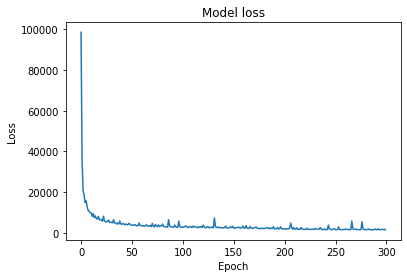

In [ ]:
train(300,0.0005300)


In [ ]:
import wandb
api = wandb.Api()
run = api.run("bhagavatiraj/Deep_Image_Steganography/3n7n6o91")
run.config["lr"] = 0.0005300
run.config["epochs"] = 300
run.config['activation'] = 'relu'
run.update()